# Variant Image Generation

## Positional variants

- Randomly Horizontally Flip images
- Pad image (to make it look more distant) (5% to 40%)
- Slight rotation (-25 to 25 degrees)

In [59]:
import os
import json
import glob
import cv2
import albumentations as A
from tqdm import tqdm

# Albumentations pipeline
pipeline = A.ReplayCompose(
    [
        A.HorizontalFlip(p=0.5),
        A.CropAndPad(
            px=((51, 410),  # top
                (51, 410),  # bottom
                (51, 410),  # left
                (51, 410)), # right
            keep_size=False,
            p=1.0
        ),
        A.Affine(rotate=(-25, 25), p=1.0),
    ],
    keypoint_params=A.KeypointParams(format='xy', remove_invisible=False)
)

def to_serializable(obj):
    """Convert NumPy arrays in obj to lists, for JSON serialization."""
    if isinstance(obj, dict):
        return {k: to_serializable(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [to_serializable(item) for item in obj]
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    else:
        return obj

In [182]:
def run_augmentation_pipeline(in_folder, out_folder):
    """
    1. Iterates through all JSON files in `in_folder`.
    2. For each JSON, it looks for an image with the same base name
       (e.g., 'filename.json' -> 'filename.png' or 'filename.jpg', etc.).
    3. Applies a 3-variant Albumentations ReplayCompose pipeline.
    4. Saves each augmented image + JSON to `out_folder` as {base_name}__v{index}.png/json.
    5. Updates runwayLabel, adds baseImage, and albumentationsReplay to the JSON.
    """

    os.makedirs(out_folder, exist_ok=True)

    valid_exts = (".jpg", ".jpeg", ".png", ".bmp")
    image_files = [f for f in os.listdir(in_folder) if f.lower().endswith(valid_exts)]

    for img_name in tqdm(image_files, desc="Processing images", unit="img"):
        base_name, ext = os.path.splitext(img_name)

        json_path = os.path.join(in_folder, f"{base_name}.json")
        if not os.path.exists(json_path):
            print(f"Skipping {img_name}: no matching JSON {base_name}.json found.")
            continue

        with open(json_path, "r") as f:
            data = json.load(f)

        image_path = os.path.join(in_folder, img_name)
        image = cv2.imread(image_path)
        if image is None:
            print(f"Warning: Failed to load image: {image_path}")
            continue
        
        keypoints = data.get("runwayLabel", [])

        for i in range(3):
            augmented = pipeline(image=image, keypoints=keypoints)
            augmented_image = augmented["image"]
            augmented_keypoints = augmented["keypoints"]
            replay_dict = to_serializable(augmented["replay"])

            # Output filenames, e.g. "bBO3MEZg9co_077__v1.png" / ".json"
            variant_index = i + 1
            out_image_name = f"{base_name}__v{variant_index}.png"
            out_json_name = f"{base_name}__v{variant_index}.json"
            out_image_path = os.path.join(out_folder, out_image_name)
            out_json_path = os.path.join(out_folder, out_json_name)

            cv2.imwrite(out_image_path, augmented_image)

            updated_data = dict(data)  # Copy original JSON
            updated_data["runwayLabel"] = augmented_keypoints
            updated_data["baseImage"] = base_name
            updated_data["albumentationsReplay"] = replay_dict

            with open(out_json_path, "w") as f:
                json.dump(updated_data, f, indent=2)

In [183]:
run_augmentation_pipeline("p_BaseImages", "p_VariantImages")

Processing images: 100%|██████████| 6498/6498 [13:08<00:00,  8.24img/s]


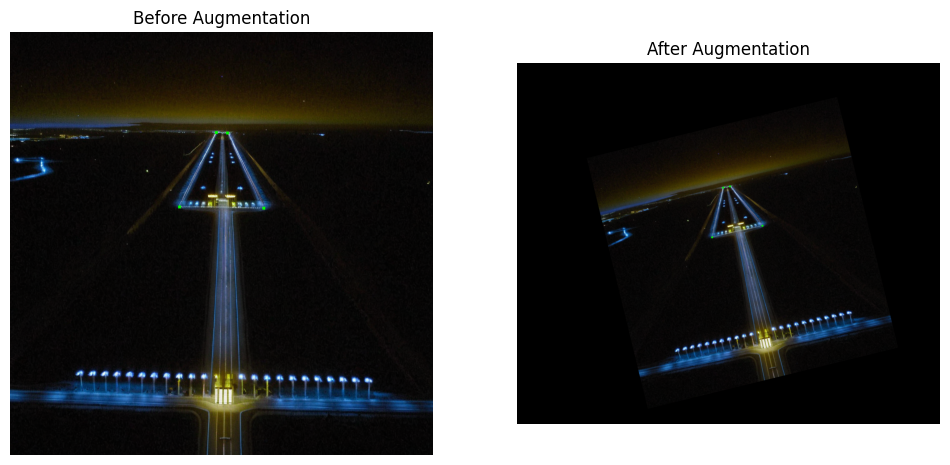

In [186]:
from imgaug.augmentables import Keypoint, KeypointsOnImage

base_img_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.png"
base_label_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.json"

variant_img_path = "p_VariantImages/zrbfSJ0v2gk_052__night_3__v1.png"
variant_label_path = "p_VariantImages/zrbfSJ0v2gk_052__night_3__v1.json"

with open(base_label_path, "r") as f:
    base_label = json.load(f)

with open(variant_label_path, "r") as f:
    variant_label = json.load(f)

base_points = base_label["runwayLabel"]
variant_points = variant_label["runwayLabel"]

base_img = cv2.imread(base_img_path)
base_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in base_points],
    shape=image.shape
)

variant_img = cv2.imread(variant_img_path)
variant_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in variant_points],
    shape=image.shape
)


base_img = base_kps.draw_on_image(base_img, size=7)
variant_img = variant_kps.draw_on_image(variant_img, size=7)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(base_img)
plt.title("Before Augmentation")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(variant_img)
plt.title("After Augmentation")
plt.axis("off")

plt.show()

## Outpaint borders

In [1]:
from diffusers import StableDiffusionXLInpaintPipeline, DPMSolverMultistepScheduler, LCMScheduler
import torch
from PIL import Image, ImageOps

pipe = StableDiffusionXLInpaintPipeline.from_pretrained(
    # "lykon/dreamshaper-xl-v2-turbo", 
    "lykon/dreamshaper-xl-lightning",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

# pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config, algorithm_type="sde-dpmsolver++", use_karras_sigmas=True)

# pipe.enable_model_cpu_offload()

/usr/local/lib/python3.10/dist-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(
2025-03-21 07:07:36.325789: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-21 07:07:36.332974: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-21 07:07:36.341882: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one h

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [2]:
import cv2
import numpy as np
from PIL import Image
import os
import json
import random
from tqdm import tqdm
import gc


def letterbox_to_square(img, target_size=1024):
    """
    Resizes and pads 'img' to a square of 'target_size' x 'target_size' 
    without distorting the aspect ratio (letterboxing).
    
    :param img: NumPy array (H x W x C) in BGR format.
    :param target_size: Desired output dimension (e.g., 1024 for 1024x1024).
    :return: Letterboxed image of shape (target_size, target_size, 3).
    """
    h, w = img.shape[:2]
    scale = target_size / max(h, w)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_LINEAR)
    letterboxed = np.zeros((target_size, target_size, 3), dtype=np.uint8)
    x_off = (target_size - new_w) // 2
    y_off = (target_size - new_h) // 2
    letterboxed[y_off:y_off+new_h, x_off:x_off+new_w] = resized
    
    return letterboxed

def run_outpaint_pipeline(folder):
    valid_exts = (".jpg", ".jpeg", ".png", ".bmp")
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(valid_exts)]

    for img_name in tqdm(image_files, desc="Processing images", unit="img"):
        base_name, ext = os.path.splitext(img_name)

        json_path = os.path.join(folder, f"{base_name}.json")
        if not os.path.exists(json_path):
            print(f"Skipping {img_name}: no matching JSON {base_name}.json found.")
            continue

        with open(json_path, "r") as f:
            data = dict(json.load(f))

        if data.get("outpainted", False):
            continue

        image_path = os.path.join(folder, img_name)
        image = cv2.imread(image_path)
        image = letterbox_to_square(image)
        image = cv2.resize(image, (1024, 1024), interpolation=cv2.INTER_LINEAR)

        # CV2 inpainting mask
        mask = np.all(image == 0, axis=2).astype(np.uint8) * 255
        kernel = np.ones((3, 3), np.uint8)
        mask = cv2.dilate(mask, kernel, iterations=4)
        image = Image.fromarray(cv2.cvtColor(cv2.inpaint(image, mask, 3, cv2.INPAINT_TELEA), cv2.COLOR_BGR2RGB))
        
        # SD inpainting mask
        mask = pipe.mask_processor.blur(Image.fromarray(mask), blur_factor=75)

        seed = random.randint(0, 2**31 - 1)
        generator = torch.Generator(device=pipe.device).manual_seed(seed)

        with torch.no_grad():
            result = pipe(
                prompt=data["prompt"],
                negative_prompt=data["negative_prompt"],
                image=image,
                mask_image=mask,
                strength=0.8,
                generator=generator,
                
                num_inference_steps=30,
                guidance_scale=2,
            ).images[0]
        image = result

        data["outpainted"] = True
        data["outpaintingSeed"] = seed

        with open(json_path, "w") as f:
            json.dump(data, f, indent=2)
        image.save(image_path)

        del result, generator, mask, image
        gc.collect()
        torch.cuda.empty_cache()



In [3]:
run_outpaint_pipeline("p_VariantImages")

Processing images:   0%|          | 0/19494 [00:00<?, ?img/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 53/19494 [00:07<46:04,  7.03img/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 54/19494 [00:14<1:47:45,  3.01img/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 55/19494 [00:22<3:10:36,  1.70img/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 56/19494 [00:29<4:58:45,  1.08img/s]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 57/19494 [00:37<7:17:25,  1.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 58/19494 [00:44<10:06:20,  1.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 59/19494 [00:52<13:22:24,  2.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 60/19494 [00:59<16:57:33,  3.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 61/19494 [01:06<20:40:07,  3.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 62/19494 [01:14<24:17:22,  4.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 63/19494 [01:21<27:29:49,  5.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 64/19494 [01:29<30:23:41,  5.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 65/19494 [01:36<32:37:24,  6.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 66/19494 [01:43<34:25:13,  6.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 67/19494 [01:50<35:51:35,  6.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 68/19494 [01:58<36:56:51,  6.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 69/19494 [02:05<37:42:48,  6.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 70/19494 [02:13<38:14:51,  7.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 71/19494 [02:20<38:37:48,  7.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 72/19494 [02:27<38:56:32,  7.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 73/19494 [02:35<39:09:51,  7.26s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 74/19494 [02:42<39:16:45,  7.28s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 75/19494 [02:49<39:31:15,  7.33s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 76/19494 [02:57<39:46:36,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 77/19494 [03:04<39:49:02,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 78/19494 [03:12<39:47:02,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 79/19494 [03:19<39:52:13,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 80/19494 [03:26<39:56:40,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 81/19494 [03:34<40:00:05,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 82/19494 [03:41<40:03:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 83/19494 [03:49<39:55:26,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 84/19494 [03:56<39:50:25,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 85/19494 [04:03<39:49:04,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 86/19494 [04:11<39:48:20,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 87/19494 [04:18<39:45:33,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 88/19494 [04:25<39:41:55,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 89/19494 [04:33<39:43:49,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 90/19494 [04:40<39:44:34,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 91/19494 [04:48<39:41:44,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 92/19494 [04:55<39:44:51,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 93/19494 [05:02<39:47:09,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 94/19494 [05:10<39:45:10,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 95/19494 [05:17<39:42:30,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 96/19494 [05:25<39:44:05,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   0%|          | 97/19494 [05:32<39:47:34,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 98/19494 [05:39<39:54:44,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 99/19494 [05:47<40:06:45,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 100/19494 [05:55<40:25:30,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 101/19494 [06:02<40:28:32,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 102/19494 [06:10<40:21:15,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 103/19494 [06:17<40:18:47,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 104/19494 [06:25<40:31:46,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 105/19494 [06:32<40:19:23,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 106/19494 [06:40<40:28:33,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 107/19494 [06:47<40:12:56,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 108/19494 [06:54<40:11:08,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 109/19494 [07:02<40:14:39,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 110/19494 [07:09<40:26:32,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 111/19494 [07:17<40:12:41,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 112/19494 [07:24<40:07:37,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 113/19494 [07:32<40:19:09,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 114/19494 [07:39<40:13:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 115/19494 [07:47<40:00:25,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 116/19494 [07:54<39:57:15,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 117/19494 [08:01<39:54:06,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 118/19494 [08:09<39:52:04,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 119/19494 [08:16<39:53:19,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 120/19494 [08:24<39:54:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 121/19494 [08:31<39:47:05,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 122/19494 [08:38<39:47:45,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 123/19494 [08:46<39:43:32,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 124/19494 [08:53<39:41:36,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 125/19494 [09:01<39:41:52,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 126/19494 [09:08<39:44:04,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 127/19494 [09:15<39:45:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 128/19494 [09:23<39:38:44,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 129/19494 [09:30<39:39:41,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 130/19494 [09:37<39:40:44,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 131/19494 [09:45<39:35:52,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 132/19494 [09:52<39:32:40,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 133/19494 [09:59<39:38:37,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 134/19494 [10:07<39:40:46,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 135/19494 [10:14<39:39:03,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 136/19494 [10:22<39:39:18,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 137/19494 [10:29<39:37:17,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 138/19494 [10:36<39:31:16,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 139/19494 [10:44<39:36:49,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 140/19494 [10:51<39:36:11,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 141/19494 [10:58<39:35:03,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 142/19494 [11:06<39:33:52,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 143/19494 [11:13<39:36:17,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 144/19494 [11:21<39:37:34,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 145/19494 [11:28<39:39:48,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 146/19494 [11:35<39:38:19,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 147/19494 [11:43<39:36:16,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 148/19494 [11:50<39:34:38,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 149/19494 [11:57<39:35:05,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 150/19494 [12:05<39:30:47,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 151/19494 [12:12<39:33:49,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 152/19494 [12:19<39:39:02,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 153/19494 [12:27<39:42:30,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 154/19494 [12:34<39:42:25,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 155/19494 [12:42<39:45:49,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 156/19494 [12:49<39:40:25,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 157/19494 [12:56<39:41:20,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 158/19494 [13:04<39:35:07,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 159/19494 [13:11<39:28:43,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 160/19494 [13:19<39:35:03,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 161/19494 [13:26<39:36:54,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 162/19494 [13:33<39:37:27,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 163/19494 [13:41<39:38:43,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 164/19494 [13:48<39:40:06,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 165/19494 [13:55<39:40:15,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 166/19494 [14:03<39:41:43,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 167/19494 [14:10<39:41:22,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 168/19494 [14:18<39:36:17,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 169/19494 [14:25<39:38:24,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 170/19494 [14:32<39:38:36,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 171/19494 [14:40<39:36:47,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 172/19494 [14:47<39:40:02,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 173/19494 [14:55<39:36:14,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 174/19494 [15:02<39:35:54,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 175/19494 [15:09<39:39:00,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 176/19494 [15:17<39:38:46,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 177/19494 [15:24<39:35:11,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 178/19494 [15:31<39:32:30,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 179/19494 [15:39<39:31:29,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 180/19494 [15:46<39:35:55,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 181/19494 [15:54<39:32:02,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 182/19494 [16:01<39:30:07,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 183/19494 [16:08<39:29:44,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 184/19494 [16:16<39:33:29,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 185/19494 [16:23<39:34:12,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 186/19494 [16:30<39:38:46,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 187/19494 [16:38<39:37:27,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 188/19494 [16:45<39:38:04,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 189/19494 [16:53<39:33:04,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 190/19494 [17:00<39:32:32,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 191/19494 [17:07<39:34:41,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 192/19494 [17:15<39:31:22,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 193/19494 [17:22<39:30:19,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 194/19494 [17:29<39:31:09,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 195/19494 [17:37<39:29:58,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 196/19494 [17:44<39:31:08,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 197/19494 [17:52<39:28:23,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 198/19494 [17:59<39:28:20,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 199/19494 [18:06<39:28:36,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 200/19494 [18:14<39:24:02,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 201/19494 [18:21<39:27:23,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 202/19494 [18:28<39:28:11,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 203/19494 [18:36<39:30:18,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 204/19494 [18:43<39:29:18,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 205/19494 [18:50<39:31:21,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 206/19494 [18:58<39:26:43,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 207/19494 [19:05<39:21:39,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 208/19494 [19:12<39:24:29,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 209/19494 [19:20<39:28:12,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 210/19494 [19:27<39:30:28,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 211/19494 [19:35<39:27:20,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 212/19494 [19:42<39:29:42,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 213/19494 [19:49<39:30:46,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 214/19494 [19:57<39:31:49,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 215/19494 [20:04<39:28:31,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 216/19494 [20:11<39:25:12,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 217/19494 [20:19<39:26:01,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 218/19494 [20:26<39:27:04,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 219/19494 [20:34<39:25:29,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 220/19494 [20:41<39:23:33,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 221/19494 [20:48<39:20:44,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 222/19494 [20:56<39:22:51,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 223/19494 [21:03<39:18:50,  7.34s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 224/19494 [21:10<39:20:14,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 225/19494 [21:18<39:22:23,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 226/19494 [21:25<39:24:18,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 227/19494 [21:32<39:23:49,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 228/19494 [21:40<39:24:19,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 229/19494 [21:47<39:24:40,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 230/19494 [21:55<39:29:49,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 231/19494 [22:02<39:25:48,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 232/19494 [22:09<39:27:27,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 233/19494 [22:17<39:30:15,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 234/19494 [22:24<39:28:38,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 235/19494 [22:31<39:27:47,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 236/19494 [22:39<39:29:18,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 237/19494 [22:46<39:23:22,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 238/19494 [22:54<39:22:57,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 239/19494 [23:01<39:24:22,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 240/19494 [23:08<39:22:15,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 241/19494 [23:16<39:24:55,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 242/19494 [23:23<39:32:29,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|          | 243/19494 [23:30<39:33:08,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 244/19494 [23:38<39:27:37,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 245/19494 [23:45<39:27:32,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 246/19494 [23:53<39:31:22,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 247/19494 [24:00<39:30:41,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 248/19494 [24:07<39:31:26,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 249/19494 [24:15<39:32:02,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 250/19494 [24:22<39:27:17,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 251/19494 [24:30<39:24:00,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 252/19494 [24:37<39:20:32,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 253/19494 [24:44<39:24:49,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 254/19494 [24:52<39:21:43,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 255/19494 [24:59<39:27:01,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 256/19494 [25:06<39:23:48,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 257/19494 [25:14<39:22:43,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 258/19494 [25:21<39:25:06,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 259/19494 [25:28<39:21:24,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 260/19494 [25:36<39:22:46,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 261/19494 [25:43<39:22:27,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 262/19494 [25:51<39:27:18,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 263/19494 [25:58<39:27:21,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 264/19494 [26:05<39:27:42,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 265/19494 [26:13<39:26:48,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 266/19494 [26:20<39:27:35,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 267/19494 [26:28<39:25:05,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 268/19494 [26:35<39:19:01,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 269/19494 [26:42<39:23:11,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 270/19494 [26:50<39:25:53,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 271/19494 [26:57<39:21:23,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 272/19494 [27:04<39:24:21,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 273/19494 [27:12<39:26:23,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 274/19494 [27:19<39:23:42,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 275/19494 [27:27<39:22:16,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 276/19494 [27:34<39:20:47,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 277/19494 [27:41<39:21:48,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 278/19494 [27:49<39:23:17,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 279/19494 [27:56<39:19:54,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 280/19494 [28:03<39:21:42,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 281/19494 [28:11<39:26:13,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 282/19494 [28:18<39:23:00,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 283/19494 [28:26<39:25:17,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 284/19494 [28:33<39:26:17,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 285/19494 [28:40<39:21:20,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 286/19494 [28:48<39:21:05,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 287/19494 [28:55<39:22:32,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 288/19494 [29:02<39:22:00,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 289/19494 [29:10<39:23:07,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 290/19494 [29:17<39:23:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 291/19494 [29:25<39:25:28,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   1%|▏         | 292/19494 [29:32<39:24:46,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 293/19494 [29:39<39:28:15,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 294/19494 [29:47<39:26:05,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 295/19494 [29:54<39:26:23,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 296/19494 [30:02<39:24:07,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 297/19494 [30:09<39:24:25,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 298/19494 [30:16<39:26:03,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 299/19494 [30:24<39:23:15,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 300/19494 [30:31<39:16:26,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 301/19494 [30:38<39:18:15,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 302/19494 [30:46<39:16:42,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 303/19494 [30:53<39:17:00,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 304/19494 [31:01<39:14:25,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 305/19494 [31:08<39:12:48,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 306/19494 [31:15<39:18:12,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 307/19494 [31:23<39:21:06,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 308/19494 [31:30<39:25:04,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 309/19494 [31:38<39:32:31,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 310/19494 [31:45<39:27:03,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 311/19494 [31:52<39:24:12,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 312/19494 [32:00<39:22:26,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 313/19494 [32:07<39:19:44,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 314/19494 [32:14<39:18:18,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 315/19494 [32:22<39:17:12,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 316/19494 [32:29<39:14:25,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 317/19494 [32:37<39:13:52,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 318/19494 [32:44<39:17:09,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 319/19494 [32:51<39:18:09,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 320/19494 [32:59<39:17:14,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 321/19494 [33:06<39:20:33,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 322/19494 [33:14<39:19:10,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 323/19494 [33:21<39:22:00,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 324/19494 [33:28<39:20:10,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 325/19494 [33:36<39:21:50,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 326/19494 [33:43<39:23:42,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 327/19494 [33:51<39:23:28,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 328/19494 [33:58<39:21:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 329/19494 [34:05<39:19:45,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 330/19494 [34:13<39:17:28,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 331/19494 [34:20<39:13:56,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 332/19494 [34:27<39:12:47,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 333/19494 [34:35<39:14:28,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 334/19494 [34:42<39:16:06,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 335/19494 [34:50<39:19:01,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 336/19494 [34:57<39:18:09,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 337/19494 [35:04<39:17:57,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 338/19494 [35:12<39:21:28,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 339/19494 [35:19<39:19:35,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 340/19494 [35:26<39:20:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 341/19494 [35:34<39:19:26,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 342/19494 [35:41<39:14:10,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 343/19494 [35:49<39:15:24,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 344/19494 [35:56<39:10:44,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 345/19494 [36:03<39:11:27,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 346/19494 [36:11<39:13:29,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 347/19494 [36:18<39:09:48,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 348/19494 [36:25<39:12:31,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 349/19494 [36:33<39:09:30,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 350/19494 [36:40<39:12:01,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 351/19494 [36:48<39:10:57,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 352/19494 [36:55<39:10:43,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 353/19494 [37:02<39:14:26,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 354/19494 [37:10<39:17:18,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 355/19494 [37:17<39:17:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 356/19494 [37:24<39:11:50,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 357/19494 [37:32<39:09:18,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 358/19494 [37:39<39:12:21,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 359/19494 [37:47<39:11:52,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 360/19494 [37:54<39:11:55,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 361/19494 [38:01<39:12:38,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 362/19494 [38:09<39:11:54,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 363/19494 [38:16<39:09:37,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 364/19494 [38:23<39:12:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 365/19494 [38:31<39:10:09,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 366/19494 [38:38<39:11:44,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 367/19494 [38:46<39:12:22,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 368/19494 [38:53<39:14:24,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 369/19494 [39:00<39:11:46,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 370/19494 [39:08<39:10:14,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 371/19494 [39:15<39:14:11,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 372/19494 [39:23<39:15:18,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 373/19494 [39:30<39:12:26,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 374/19494 [39:37<39:08:51,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 375/19494 [39:45<39:07:05,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 376/19494 [39:52<39:08:46,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 377/19494 [39:59<39:10:34,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 378/19494 [40:07<39:10:08,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 379/19494 [40:14<39:09:29,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 380/19494 [40:21<39:06:55,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 381/19494 [40:29<39:03:48,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 382/19494 [40:36<39:09:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 383/19494 [40:44<39:12:00,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 384/19494 [40:51<39:11:47,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 385/19494 [40:58<39:12:34,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 386/19494 [41:06<39:11:08,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 387/19494 [41:13<39:12:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 388/19494 [41:21<39:10:47,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 389/19494 [41:28<39:13:24,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 390/19494 [41:35<39:09:23,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 391/19494 [41:43<39:03:48,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 392/19494 [41:50<39:08:22,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 393/19494 [41:57<39:07:09,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 394/19494 [42:05<39:06:01,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 395/19494 [42:12<39:07:31,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 396/19494 [42:20<39:12:03,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 397/19494 [42:27<39:15:14,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 398/19494 [42:34<39:11:51,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 399/19494 [42:42<39:13:21,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 400/19494 [42:49<39:11:10,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 401/19494 [42:56<39:06:21,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 402/19494 [43:04<39:03:05,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 403/19494 [43:11<39:05:23,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 404/19494 [43:19<39:13:23,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 405/19494 [43:26<39:09:51,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 406/19494 [43:33<39:10:53,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 407/19494 [43:41<39:06:03,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 408/19494 [43:48<39:07:19,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 409/19494 [43:56<39:09:19,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 410/19494 [44:03<39:07:09,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 411/19494 [44:10<39:02:07,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 412/19494 [44:18<39:00:25,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 413/19494 [44:25<38:59:49,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 414/19494 [44:32<39:01:56,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 415/19494 [44:40<39:05:29,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 416/19494 [44:47<39:04:40,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 417/19494 [44:54<39:07:12,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 418/19494 [45:02<39:04:29,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 419/19494 [45:09<39:00:34,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 420/19494 [45:17<39:02:13,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 421/19494 [45:24<39:02:21,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 422/19494 [45:31<39:02:34,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 423/19494 [45:39<39:04:53,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 424/19494 [45:46<39:03:33,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 425/19494 [45:53<39:01:07,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 426/19494 [46:01<39:04:16,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 427/19494 [46:08<38:58:29,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 428/19494 [46:16<39:04:13,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 429/19494 [46:23<39:05:07,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 430/19494 [46:30<39:08:20,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 431/19494 [46:38<39:02:35,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 432/19494 [46:45<39:01:43,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 433/19494 [46:52<39:01:20,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 434/19494 [47:00<39:01:58,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 435/19494 [47:07<39:05:34,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 436/19494 [47:15<39:06:24,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 437/19494 [47:22<39:02:03,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 438/19494 [47:29<38:57:21,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 439/19494 [47:37<38:56:54,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 440/19494 [47:44<39:01:29,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 441/19494 [47:51<39:05:51,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 442/19494 [47:59<39:04:55,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 443/19494 [48:06<39:03:13,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 444/19494 [48:14<39:05:11,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 445/19494 [48:21<39:03:22,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 446/19494 [48:28<39:00:31,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 447/19494 [48:36<39:06:01,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 448/19494 [48:43<39:06:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 449/19494 [48:51<39:04:46,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 450/19494 [48:58<39:01:48,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 451/19494 [49:05<39:00:19,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 452/19494 [49:13<39:01:57,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 453/19494 [49:20<38:58:48,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 454/19494 [49:27<38:58:32,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 455/19494 [49:35<38:58:29,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 456/19494 [49:42<39:01:40,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 457/19494 [49:49<38:57:12,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 458/19494 [49:57<39:00:26,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 459/19494 [50:04<38:58:48,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 460/19494 [50:12<39:01:18,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 461/19494 [50:19<39:01:26,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 462/19494 [50:26<38:54:23,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 463/19494 [50:34<38:57:21,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 464/19494 [50:41<38:55:09,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 465/19494 [50:48<38:55:29,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 466/19494 [50:56<38:54:37,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 467/19494 [51:03<38:59:05,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 468/19494 [51:11<38:53:07,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 469/19494 [51:18<38:55:25,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 470/19494 [51:25<39:01:33,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 471/19494 [51:33<39:02:12,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 472/19494 [51:40<39:03:05,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 473/19494 [51:47<38:58:42,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 474/19494 [51:55<38:56:52,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 475/19494 [52:02<38:56:17,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 476/19494 [52:10<38:59:18,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 477/19494 [52:17<39:03:17,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 478/19494 [52:24<38:59:03,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 479/19494 [52:32<39:02:23,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 480/19494 [52:39<38:58:20,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 481/19494 [52:47<38:58:48,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 482/19494 [52:54<38:55:57,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 483/19494 [53:01<38:55:21,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 484/19494 [53:09<38:54:10,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 485/19494 [53:16<38:56:23,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 486/19494 [53:23<38:55:52,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   2%|▏         | 487/19494 [53:31<38:52:05,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 488/19494 [53:38<38:53:46,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 489/19494 [53:45<38:56:11,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 490/19494 [53:53<38:54:22,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 491/19494 [54:00<38:53:36,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 492/19494 [54:08<38:57:47,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 493/19494 [54:15<38:59:16,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 494/19494 [54:22<39:01:15,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 495/19494 [54:30<38:58:53,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 496/19494 [54:37<39:01:49,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 497/19494 [54:45<38:56:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 498/19494 [54:52<38:56:43,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 499/19494 [54:59<38:56:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 500/19494 [55:07<38:56:21,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 501/19494 [55:14<38:56:42,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 502/19494 [55:21<39:01:01,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 503/19494 [55:29<38:57:31,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 504/19494 [55:36<39:02:12,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 505/19494 [55:44<38:59:40,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 506/19494 [55:51<39:01:07,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 507/19494 [55:58<39:00:54,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 508/19494 [56:06<38:56:46,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 509/19494 [56:13<38:56:37,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 510/19494 [56:21<38:54:45,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 511/19494 [56:28<38:59:00,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 512/19494 [56:35<38:54:31,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 513/19494 [56:43<38:54:55,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 514/19494 [56:50<39:01:23,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 515/19494 [56:58<38:57:11,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 516/19494 [57:05<38:58:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 517/19494 [57:12<38:59:11,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 518/19494 [57:20<38:56:14,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 519/19494 [57:27<38:53:28,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 520/19494 [57:34<38:54:06,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 521/19494 [57:42<38:55:12,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 522/19494 [57:49<38:54:13,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 523/19494 [57:57<38:52:01,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 524/19494 [58:04<38:48:51,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 525/19494 [58:11<38:45:07,  7.35s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 526/19494 [58:19<38:46:54,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 527/19494 [58:26<38:49:47,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 528/19494 [58:33<38:51:32,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 529/19494 [58:41<38:50:44,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 530/19494 [58:48<38:52:06,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 531/19494 [58:56<38:56:22,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 532/19494 [59:03<39:00:04,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 533/19494 [59:10<38:55:18,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 534/19494 [59:18<38:57:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 535/19494 [59:25<38:55:40,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 536/19494 [59:33<38:59:10,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 537/19494 [59:40<38:54:29,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 538/19494 [59:47<38:54:56,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 539/19494 [59:55<38:56:46,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 540/19494 [1:00:02<38:54:53,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 541/19494 [1:00:10<38:55:06,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 542/19494 [1:00:17<38:55:00,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 543/19494 [1:00:24<38:55:28,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 544/19494 [1:00:32<38:53:22,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 545/19494 [1:00:39<38:54:56,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 546/19494 [1:00:46<38:49:42,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 547/19494 [1:00:54<38:49:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 548/19494 [1:01:01<38:54:44,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 549/19494 [1:01:09<38:54:43,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 550/19494 [1:01:16<38:56:13,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 551/19494 [1:01:23<38:54:28,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 552/19494 [1:01:31<38:55:03,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 553/19494 [1:01:38<38:43:53,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 554/19494 [1:01:45<38:43:11,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 555/19494 [1:01:53<38:43:16,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 556/19494 [1:02:00<38:46:07,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 557/19494 [1:02:08<38:48:43,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 558/19494 [1:02:15<38:50:52,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 559/19494 [1:02:22<38:56:25,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 560/19494 [1:02:30<38:51:38,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 561/19494 [1:02:37<38:44:53,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 562/19494 [1:02:45<38:48:05,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 563/19494 [1:02:52<38:48:25,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 564/19494 [1:02:59<38:50:11,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 565/19494 [1:03:07<38:50:26,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 566/19494 [1:03:14<38:55:24,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 567/19494 [1:03:22<38:53:26,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 568/19494 [1:03:29<38:51:22,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 569/19494 [1:03:36<38:46:28,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 570/19494 [1:03:44<38:45:08,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 571/19494 [1:03:51<38:50:08,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 572/19494 [1:03:58<38:49:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 573/19494 [1:04:06<38:52:05,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 574/19494 [1:04:13<38:45:23,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 575/19494 [1:04:21<38:48:30,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 576/19494 [1:04:28<38:47:12,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 577/19494 [1:04:35<38:50:20,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 578/19494 [1:04:43<38:43:52,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 579/19494 [1:04:50<38:41:14,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 580/19494 [1:04:57<38:40:07,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 581/19494 [1:05:05<38:39:44,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 582/19494 [1:05:12<38:44:22,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 583/19494 [1:05:20<38:46:58,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 584/19494 [1:05:27<38:48:53,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 585/19494 [1:05:34<38:51:29,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 586/19494 [1:05:42<38:50:34,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 587/19494 [1:05:49<38:48:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 588/19494 [1:05:57<38:50:45,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 589/19494 [1:06:04<38:49:02,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 590/19494 [1:06:11<38:45:14,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 591/19494 [1:06:19<38:46:14,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 592/19494 [1:06:26<38:45:27,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 593/19494 [1:06:33<38:42:54,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 594/19494 [1:06:41<38:45:43,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 595/19494 [1:06:48<38:47:23,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 596/19494 [1:06:56<38:49:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 597/19494 [1:07:03<38:50:42,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 598/19494 [1:07:10<38:51:34,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 599/19494 [1:07:18<38:52:01,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 600/19494 [1:07:25<38:49:27,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 601/19494 [1:07:33<38:47:08,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 602/19494 [1:07:40<38:50:21,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 603/19494 [1:07:47<38:48:38,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 604/19494 [1:07:55<38:46:10,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 605/19494 [1:08:02<38:45:12,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 606/19494 [1:08:10<38:48:28,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 607/19494 [1:08:17<38:44:06,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 608/19494 [1:08:24<38:41:05,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 609/19494 [1:08:32<38:42:22,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 610/19494 [1:08:39<38:40:21,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 611/19494 [1:08:46<38:40:30,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 612/19494 [1:08:54<38:41:05,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 613/19494 [1:09:01<38:37:55,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 614/19494 [1:09:09<38:40:16,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 615/19494 [1:09:16<38:42:02,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 616/19494 [1:09:23<38:43:26,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 617/19494 [1:09:31<38:39:49,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 618/19494 [1:09:38<38:41:02,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 619/19494 [1:09:46<38:46:00,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 620/19494 [1:09:53<38:46:37,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 621/19494 [1:10:00<38:51:42,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 622/19494 [1:10:08<38:48:44,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 623/19494 [1:10:15<38:50:43,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 624/19494 [1:10:23<38:46:54,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 625/19494 [1:10:30<38:50:45,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 626/19494 [1:10:37<38:44:18,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 627/19494 [1:10:45<38:44:25,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 628/19494 [1:10:52<38:43:28,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 629/19494 [1:11:00<38:45:10,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 630/19494 [1:11:07<38:46:27,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 631/19494 [1:11:14<38:42:26,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 632/19494 [1:11:22<38:42:43,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 633/19494 [1:11:29<38:38:46,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 634/19494 [1:11:36<38:36:48,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 635/19494 [1:11:44<38:38:25,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 636/19494 [1:11:51<38:35:41,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 637/19494 [1:11:59<38:40:22,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 638/19494 [1:12:06<38:38:40,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 639/19494 [1:12:13<38:35:13,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 640/19494 [1:12:21<38:38:58,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 641/19494 [1:12:28<38:45:27,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 642/19494 [1:12:36<38:45:40,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 643/19494 [1:12:43<38:42:03,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 644/19494 [1:12:50<38:38:42,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 645/19494 [1:12:58<38:38:38,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 646/19494 [1:13:05<38:42:19,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 647/19494 [1:13:12<38:41:26,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 648/19494 [1:13:20<38:45:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 649/19494 [1:13:27<38:43:09,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 650/19494 [1:13:35<38:44:06,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 651/19494 [1:13:42<38:47:28,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 652/19494 [1:13:49<38:44:47,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 653/19494 [1:13:57<38:48:20,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 654/19494 [1:14:04<38:43:51,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 655/19494 [1:14:12<38:42:27,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 656/19494 [1:14:19<38:45:17,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 657/19494 [1:14:27<38:45:31,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 658/19494 [1:14:34<38:45:06,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 659/19494 [1:14:41<38:45:13,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 660/19494 [1:14:49<38:46:46,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 661/19494 [1:14:56<38:45:00,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 662/19494 [1:15:04<38:42:27,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 663/19494 [1:15:11<38:41:43,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 664/19494 [1:15:18<38:41:55,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 665/19494 [1:15:26<38:41:57,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 666/19494 [1:15:33<38:38:33,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 667/19494 [1:15:40<38:39:34,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 668/19494 [1:15:48<38:36:20,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 669/19494 [1:15:55<38:37:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 670/19494 [1:16:03<38:41:00,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 671/19494 [1:16:10<38:41:05,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 672/19494 [1:16:17<38:43:04,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 673/19494 [1:16:25<38:43:51,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 674/19494 [1:16:32<38:37:40,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 675/19494 [1:16:40<38:40:22,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 676/19494 [1:16:47<38:36:19,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 677/19494 [1:16:54<38:35:10,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 678/19494 [1:17:02<38:37:22,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 679/19494 [1:17:09<38:40:58,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 680/19494 [1:17:17<38:40:23,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 681/19494 [1:17:24<38:40:01,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   3%|▎         | 682/19494 [1:17:31<38:39:16,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 683/19494 [1:17:39<38:39:29,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 684/19494 [1:17:46<38:41:45,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 685/19494 [1:17:54<38:41:04,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 686/19494 [1:18:01<38:30:20,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 687/19494 [1:18:08<38:34:30,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 688/19494 [1:18:16<38:33:20,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 689/19494 [1:18:23<38:38:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 690/19494 [1:18:31<38:33:05,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 691/19494 [1:18:38<38:32:37,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 692/19494 [1:18:45<38:36:22,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 693/19494 [1:18:53<38:32:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 694/19494 [1:19:00<38:30:20,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 695/19494 [1:19:07<38:27:20,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 696/19494 [1:19:15<38:34:31,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 697/19494 [1:19:22<38:33:10,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 698/19494 [1:19:30<38:34:21,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 699/19494 [1:19:37<38:35:12,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 700/19494 [1:19:44<38:33:14,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 701/19494 [1:19:52<38:38:17,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 702/19494 [1:19:59<38:31:15,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 703/19494 [1:20:07<38:34:55,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 704/19494 [1:20:14<38:35:39,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 705/19494 [1:20:21<38:35:12,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 706/19494 [1:20:29<38:34:28,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 707/19494 [1:20:36<38:35:10,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 708/19494 [1:20:44<38:37:14,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 709/19494 [1:20:51<38:36:24,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 710/19494 [1:20:58<38:36:03,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 711/19494 [1:21:06<38:29:52,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 712/19494 [1:21:13<38:32:28,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 713/19494 [1:21:20<38:36:19,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 714/19494 [1:21:28<38:37:54,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 715/19494 [1:21:35<38:35:53,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 716/19494 [1:21:43<38:34:25,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 717/19494 [1:21:50<38:35:46,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 718/19494 [1:21:58<38:37:24,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 719/19494 [1:22:05<38:35:37,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 720/19494 [1:22:12<38:31:12,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 721/19494 [1:22:20<38:32:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 722/19494 [1:22:27<38:35:42,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 723/19494 [1:22:34<38:35:19,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 724/19494 [1:22:42<38:36:15,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 725/19494 [1:22:49<38:35:15,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 726/19494 [1:22:57<38:32:56,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 727/19494 [1:23:04<38:38:01,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 728/19494 [1:23:12<38:37:08,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 729/19494 [1:23:19<38:35:05,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 730/19494 [1:23:26<38:34:54,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▎         | 731/19494 [1:23:34<38:29:06,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 732/19494 [1:23:41<38:34:45,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 733/19494 [1:23:48<38:35:02,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 734/19494 [1:23:56<38:31:47,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 735/19494 [1:24:03<38:36:43,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 736/19494 [1:24:11<38:39:21,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 737/19494 [1:24:18<38:36:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 738/19494 [1:24:26<38:34:05,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 739/19494 [1:24:33<38:31:05,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 740/19494 [1:24:40<38:33:57,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 741/19494 [1:24:48<38:34:40,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 742/19494 [1:24:55<38:34:16,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 743/19494 [1:25:03<38:36:58,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 744/19494 [1:25:10<38:33:43,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 745/19494 [1:25:17<38:33:48,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 746/19494 [1:25:25<38:31:23,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 747/19494 [1:25:32<38:29:46,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 748/19494 [1:25:40<38:30:21,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 749/19494 [1:25:47<38:31:55,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 750/19494 [1:25:54<38:27:56,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 751/19494 [1:26:02<38:27:02,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 752/19494 [1:26:09<38:26:03,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 753/19494 [1:26:16<38:30:17,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 754/19494 [1:26:24<38:38:59,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 755/19494 [1:26:31<38:39:53,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 756/19494 [1:26:39<38:36:34,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 757/19494 [1:26:46<38:31:41,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 758/19494 [1:26:54<38:26:43,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 759/19494 [1:27:01<38:25:24,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 760/19494 [1:27:08<38:27:39,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 761/19494 [1:27:16<38:30:11,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 762/19494 [1:27:23<38:26:07,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 763/19494 [1:27:30<38:27:05,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 764/19494 [1:27:38<38:30:59,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 765/19494 [1:27:45<38:32:42,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 766/19494 [1:27:53<38:35:40,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 767/19494 [1:28:00<38:37:01,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 768/19494 [1:28:08<38:35:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 769/19494 [1:28:15<38:31:34,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 770/19494 [1:28:22<38:30:35,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 771/19494 [1:28:30<38:30:39,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 772/19494 [1:28:37<38:30:38,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 773/19494 [1:28:45<38:24:32,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 774/19494 [1:28:52<38:26:34,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 775/19494 [1:28:59<38:22:17,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 776/19494 [1:29:07<38:21:27,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 777/19494 [1:29:14<38:22:55,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 778/19494 [1:29:21<38:25:16,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 779/19494 [1:29:29<38:23:10,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 780/19494 [1:29:36<38:25:05,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 781/19494 [1:29:44<38:24:39,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 782/19494 [1:29:51<38:29:00,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 783/19494 [1:29:59<38:35:01,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 784/19494 [1:30:06<38:36:09,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 785/19494 [1:30:13<38:34:39,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 786/19494 [1:30:21<38:30:15,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 787/19494 [1:30:28<38:32:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 788/19494 [1:30:36<38:32:09,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 789/19494 [1:30:43<38:23:54,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 790/19494 [1:30:50<38:22:05,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 791/19494 [1:30:58<38:26:11,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 792/19494 [1:31:05<38:25:35,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 793/19494 [1:31:13<38:24:42,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 794/19494 [1:31:20<38:19:34,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 795/19494 [1:31:27<38:22:49,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 796/19494 [1:31:35<38:21:14,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 797/19494 [1:31:42<38:26:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 798/19494 [1:31:49<38:24:09,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 799/19494 [1:31:57<38:22:00,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 800/19494 [1:32:04<38:26:03,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 801/19494 [1:32:12<38:28:47,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 802/19494 [1:32:19<38:29:09,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 803/19494 [1:32:27<38:31:29,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 804/19494 [1:32:34<38:29:18,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 805/19494 [1:32:41<38:29:07,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 806/19494 [1:32:49<38:29:28,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 807/19494 [1:32:56<38:28:43,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 808/19494 [1:33:04<38:25:49,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 809/19494 [1:33:11<38:27:31,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 810/19494 [1:33:18<38:28:38,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 811/19494 [1:33:26<38:28:13,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 812/19494 [1:33:33<38:29:44,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 813/19494 [1:33:41<38:30:33,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 814/19494 [1:33:48<38:30:05,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 815/19494 [1:33:56<38:27:32,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 816/19494 [1:34:03<38:27:37,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 817/19494 [1:34:10<38:27:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 818/19494 [1:34:18<38:27:19,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 819/19494 [1:34:25<38:26:28,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 820/19494 [1:34:33<38:25:22,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 821/19494 [1:34:40<38:26:10,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 822/19494 [1:34:47<38:25:19,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 823/19494 [1:34:55<38:26:41,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 824/19494 [1:35:02<38:30:16,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 825/19494 [1:35:10<38:26:44,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 826/19494 [1:35:17<38:26:44,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 827/19494 [1:35:25<38:28:46,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 828/19494 [1:35:32<38:26:28,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 829/19494 [1:35:39<38:19:41,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 830/19494 [1:35:47<38:22:17,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 831/19494 [1:35:54<38:24:48,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 832/19494 [1:36:01<38:17:56,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 833/19494 [1:36:09<38:21:44,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 834/19494 [1:36:16<38:22:31,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 835/19494 [1:36:24<38:20:54,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 836/19494 [1:36:31<38:23:49,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 837/19494 [1:36:39<38:28:01,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 838/19494 [1:36:46<38:24:18,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 839/19494 [1:36:53<38:26:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 840/19494 [1:37:01<38:25:16,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 841/19494 [1:37:08<38:28:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 842/19494 [1:37:16<38:27:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 843/19494 [1:37:23<38:26:42,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 844/19494 [1:37:30<38:24:44,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 845/19494 [1:37:38<38:16:17,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 846/19494 [1:37:45<38:25:12,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 847/19494 [1:37:53<38:26:45,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 848/19494 [1:38:00<38:25:14,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 849/19494 [1:38:08<38:23:36,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 850/19494 [1:38:15<38:26:11,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 851/19494 [1:38:22<38:24:41,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 852/19494 [1:38:30<38:20:01,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 853/19494 [1:38:37<38:18:23,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 854/19494 [1:38:45<38:24:19,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 855/19494 [1:38:52<38:20:02,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 856/19494 [1:38:59<38:17:43,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 857/19494 [1:39:07<38:12:42,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 858/19494 [1:39:14<38:14:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 859/19494 [1:39:21<38:13:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 860/19494 [1:39:29<38:17:02,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 861/19494 [1:39:36<38:12:53,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 862/19494 [1:39:44<38:14:44,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 863/19494 [1:39:51<38:09:27,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 864/19494 [1:39:58<38:10:08,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 865/19494 [1:40:06<38:11:46,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 866/19494 [1:40:13<38:19:16,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 867/19494 [1:40:21<38:22:39,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 868/19494 [1:40:28<38:17:39,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 869/19494 [1:40:35<38:17:13,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 870/19494 [1:40:43<38:21:17,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 871/19494 [1:40:50<38:16:35,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 872/19494 [1:40:58<38:17:05,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 873/19494 [1:41:05<38:20:54,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 874/19494 [1:41:12<38:18:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 875/19494 [1:41:20<38:21:39,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 876/19494 [1:41:27<38:17:05,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   4%|▍         | 877/19494 [1:41:35<38:16:57,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 878/19494 [1:41:42<38:20:34,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 879/19494 [1:41:50<38:21:53,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 880/19494 [1:41:57<38:20:35,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 881/19494 [1:42:04<38:16:49,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 882/19494 [1:42:12<38:18:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 883/19494 [1:42:19<38:15:51,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 884/19494 [1:42:27<38:12:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 885/19494 [1:42:34<38:10:56,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 886/19494 [1:42:41<38:10:38,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 887/19494 [1:42:49<38:14:30,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 888/19494 [1:42:56<38:09:44,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 889/19494 [1:43:03<38:10:30,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 890/19494 [1:43:11<38:13:57,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 891/19494 [1:43:18<38:12:35,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 892/19494 [1:43:26<38:11:46,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 893/19494 [1:43:33<38:08:25,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 894/19494 [1:43:40<38:14:28,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 895/19494 [1:43:48<38:10:07,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 896/19494 [1:43:55<38:13:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 897/19494 [1:44:03<38:17:40,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 898/19494 [1:44:10<38:22:03,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 899/19494 [1:44:18<38:19:14,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 900/19494 [1:44:25<38:19:23,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 901/19494 [1:44:32<38:17:20,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 902/19494 [1:44:40<38:17:17,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 903/19494 [1:44:47<38:16:47,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 904/19494 [1:44:55<38:14:20,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 905/19494 [1:45:02<38:14:53,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 906/19494 [1:45:09<38:08:31,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 907/19494 [1:45:17<38:13:42,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 908/19494 [1:45:24<38:06:50,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 909/19494 [1:45:32<38:11:36,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 910/19494 [1:45:39<38:14:13,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 911/19494 [1:45:46<38:15:29,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 912/19494 [1:45:54<38:10:18,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 913/19494 [1:46:01<38:09:04,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 914/19494 [1:46:08<38:06:35,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 915/19494 [1:46:16<38:10:37,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 916/19494 [1:46:23<38:10:04,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 917/19494 [1:46:31<38:13:35,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 918/19494 [1:46:38<38:10:14,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 919/19494 [1:46:46<38:10:39,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 920/19494 [1:46:53<38:09:16,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 921/19494 [1:47:00<38:11:04,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 922/19494 [1:47:08<38:09:45,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 923/19494 [1:47:15<38:13:42,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 924/19494 [1:47:23<38:14:39,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 925/19494 [1:47:30<38:10:38,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 926/19494 [1:47:37<38:06:13,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 927/19494 [1:47:45<38:03:36,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 928/19494 [1:47:52<38:06:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 929/19494 [1:47:59<38:05:50,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 930/19494 [1:48:07<38:10:36,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 931/19494 [1:48:14<38:12:34,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 932/19494 [1:48:22<38:12:28,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 933/19494 [1:48:29<38:10:29,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 934/19494 [1:48:37<38:11:15,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 935/19494 [1:48:44<38:14:01,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 936/19494 [1:48:51<38:11:28,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 937/19494 [1:48:59<38:15:00,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 938/19494 [1:49:06<38:13:40,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 939/19494 [1:49:14<38:17:25,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 940/19494 [1:49:21<38:17:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 941/19494 [1:49:29<38:18:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 942/19494 [1:49:36<38:17:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 943/19494 [1:49:43<38:15:22,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 944/19494 [1:49:51<38:13:51,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 945/19494 [1:49:58<38:08:39,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 946/19494 [1:50:06<38:11:45,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 947/19494 [1:50:13<38:07:34,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 948/19494 [1:50:20<38:06:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 949/19494 [1:50:28<38:09:57,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 950/19494 [1:50:35<38:11:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 951/19494 [1:50:43<38:08:09,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 952/19494 [1:50:50<38:09:13,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 953/19494 [1:50:57<38:06:23,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 954/19494 [1:51:05<38:11:16,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 955/19494 [1:51:12<38:07:26,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 956/19494 [1:51:20<38:10:04,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 957/19494 [1:51:27<38:06:54,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 958/19494 [1:51:34<38:07:49,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 959/19494 [1:51:42<38:07:09,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 960/19494 [1:51:49<38:09:48,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 961/19494 [1:51:57<38:04:36,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 962/19494 [1:52:04<38:03:44,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 963/19494 [1:52:11<38:06:31,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 964/19494 [1:52:19<38:05:25,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 965/19494 [1:52:26<38:03:02,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 966/19494 [1:52:34<38:09:27,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 967/19494 [1:52:41<38:10:07,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 968/19494 [1:52:49<38:12:06,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 969/19494 [1:52:56<38:08:17,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 970/19494 [1:53:03<38:08:16,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 971/19494 [1:53:11<38:06:49,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 972/19494 [1:53:18<38:07:57,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 973/19494 [1:53:26<38:09:06,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▍         | 974/19494 [1:53:33<38:06:43,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 975/19494 [1:53:40<38:07:27,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 976/19494 [1:53:48<38:05:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 977/19494 [1:53:55<38:09:19,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 978/19494 [1:54:03<38:11:01,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 979/19494 [1:54:10<38:12:21,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 980/19494 [1:54:18<38:08:27,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 981/19494 [1:54:25<38:06:30,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 982/19494 [1:54:32<38:08:39,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 983/19494 [1:54:40<38:06:31,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 984/19494 [1:54:47<38:05:51,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 985/19494 [1:54:55<38:03:43,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 986/19494 [1:55:02<37:55:45,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 987/19494 [1:55:09<37:51:17,  7.36s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 988/19494 [1:55:17<37:53:05,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 989/19494 [1:55:24<37:56:23,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 990/19494 [1:55:31<37:53:59,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 991/19494 [1:55:39<37:54:45,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 992/19494 [1:55:46<37:54:50,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 993/19494 [1:55:54<38:00:05,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 994/19494 [1:56:01<37:56:13,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 995/19494 [1:56:08<37:57:02,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 996/19494 [1:56:16<38:01:13,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 997/19494 [1:56:23<38:01:51,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 998/19494 [1:56:31<38:02:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 999/19494 [1:56:38<38:01:54,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1000/19494 [1:56:45<38:01:30,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1001/19494 [1:56:53<38:01:03,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1002/19494 [1:57:00<37:58:53,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1003/19494 [1:57:07<37:59:06,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1004/19494 [1:57:15<38:03:57,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1005/19494 [1:57:22<38:01:25,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1006/19494 [1:57:30<38:00:10,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1007/19494 [1:57:37<37:57:33,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1008/19494 [1:57:45<38:00:22,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1009/19494 [1:57:52<37:56:20,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1010/19494 [1:57:59<37:58:14,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1011/19494 [1:58:07<37:58:40,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1012/19494 [1:58:14<37:57:53,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1013/19494 [1:58:21<37:49:37,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1014/19494 [1:58:29<37:50:24,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1015/19494 [1:58:36<37:50:39,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1016/19494 [1:58:43<37:49:28,  7.37s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1017/19494 [1:58:51<37:52:18,  7.38s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1018/19494 [1:58:58<37:55:52,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1019/19494 [1:59:06<37:54:47,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1020/19494 [1:59:13<37:58:15,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1021/19494 [1:59:21<38:01:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1022/19494 [1:59:28<38:04:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1023/19494 [1:59:35<38:03:21,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1024/19494 [1:59:43<38:04:30,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1025/19494 [1:59:50<38:07:09,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1026/19494 [1:59:58<38:03:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1027/19494 [2:00:05<38:03:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1028/19494 [2:00:13<38:00:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1029/19494 [2:00:20<37:55:19,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1030/19494 [2:00:27<37:53:55,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1031/19494 [2:00:35<37:59:37,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1032/19494 [2:00:42<38:01:05,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1033/19494 [2:00:50<38:04:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1034/19494 [2:00:57<38:03:57,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1035/19494 [2:01:04<38:05:53,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1036/19494 [2:01:12<38:07:28,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1037/19494 [2:01:19<37:58:09,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1038/19494 [2:01:27<37:54:50,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1039/19494 [2:01:34<37:55:39,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1040/19494 [2:01:41<37:59:52,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1041/19494 [2:01:49<37:58:34,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1042/19494 [2:01:56<37:57:19,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1043/19494 [2:02:04<38:02:29,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1044/19494 [2:02:11<38:00:51,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1045/19494 [2:02:19<37:59:24,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1046/19494 [2:02:26<38:01:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1047/19494 [2:02:33<38:00:50,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1048/19494 [2:02:41<38:01:15,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1049/19494 [2:02:48<37:59:31,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1050/19494 [2:02:56<38:00:30,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1051/19494 [2:03:03<38:02:03,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1052/19494 [2:03:10<38:02:49,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1053/19494 [2:03:18<38:05:22,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1054/19494 [2:03:25<38:03:48,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1055/19494 [2:03:33<37:59:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1056/19494 [2:03:40<37:59:57,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1057/19494 [2:03:48<38:00:30,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1058/19494 [2:03:55<37:53:48,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1059/19494 [2:04:02<37:57:02,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1060/19494 [2:04:10<37:52:53,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1061/19494 [2:04:17<37:54:16,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1062/19494 [2:04:25<37:53:21,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1063/19494 [2:04:32<37:55:45,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1064/19494 [2:04:39<37:54:22,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1065/19494 [2:04:47<37:56:47,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1066/19494 [2:04:54<37:57:54,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1067/19494 [2:05:02<37:58:53,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1068/19494 [2:05:09<37:56:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1069/19494 [2:05:17<37:59:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1070/19494 [2:05:24<37:57:57,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1071/19494 [2:05:31<37:55:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   5%|▌         | 1072/19494 [2:05:39<37:55:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1073/19494 [2:05:46<37:54:58,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1074/19494 [2:05:54<37:53:33,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1075/19494 [2:06:01<37:56:57,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1076/19494 [2:06:08<37:51:16,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1077/19494 [2:06:16<37:53:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1078/19494 [2:06:23<37:55:02,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1079/19494 [2:06:31<37:54:49,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1080/19494 [2:06:38<37:57:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1081/19494 [2:06:45<37:57:37,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1082/19494 [2:06:53<37:56:29,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1083/19494 [2:07:00<37:59:56,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1084/19494 [2:07:08<37:59:55,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1085/19494 [2:07:15<37:59:58,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1086/19494 [2:07:23<38:02:01,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1087/19494 [2:07:30<38:02:11,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1088/19494 [2:07:38<38:03:04,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1089/19494 [2:07:45<37:57:41,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1090/19494 [2:07:52<37:59:09,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1091/19494 [2:08:00<38:02:13,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1092/19494 [2:08:07<38:00:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1093/19494 [2:08:15<37:58:31,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1094/19494 [2:08:22<37:57:54,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1095/19494 [2:08:30<37:56:21,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1096/19494 [2:08:37<37:54:41,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1097/19494 [2:08:44<37:51:35,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1098/19494 [2:08:52<37:54:49,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1099/19494 [2:08:59<37:55:27,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1100/19494 [2:09:07<37:53:42,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1101/19494 [2:09:14<37:53:49,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1102/19494 [2:09:21<37:57:11,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1103/19494 [2:09:29<37:51:13,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1104/19494 [2:09:36<37:43:37,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1105/19494 [2:09:44<37:48:45,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1106/19494 [2:09:51<37:52:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1107/19494 [2:09:58<37:49:49,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1108/19494 [2:10:06<37:51:45,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1109/19494 [2:10:13<37:52:04,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1110/19494 [2:10:21<37:54:18,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1111/19494 [2:10:28<37:54:16,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1112/19494 [2:10:36<37:52:10,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1113/19494 [2:10:43<37:50:00,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1114/19494 [2:10:50<37:50:59,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1115/19494 [2:10:58<37:47:05,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1116/19494 [2:11:05<37:46:20,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1117/19494 [2:11:12<37:42:06,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1118/19494 [2:11:20<37:45:53,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1119/19494 [2:11:27<37:47:40,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1120/19494 [2:11:35<37:48:13,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1121/19494 [2:11:42<37:47:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1122/19494 [2:11:49<37:42:59,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1123/19494 [2:11:57<37:45:36,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1124/19494 [2:12:04<37:46:49,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1125/19494 [2:12:12<37:49:46,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1126/19494 [2:12:19<37:45:06,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1127/19494 [2:12:27<37:47:34,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1128/19494 [2:12:34<37:47:32,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1129/19494 [2:12:41<37:49:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1130/19494 [2:12:49<37:49:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1131/19494 [2:12:56<37:51:13,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1132/19494 [2:13:04<37:51:12,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1133/19494 [2:13:11<37:49:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1134/19494 [2:13:19<37:51:02,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1135/19494 [2:13:26<37:57:43,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1136/19494 [2:13:33<37:52:42,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1137/19494 [2:13:41<37:48:41,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1138/19494 [2:13:48<37:45:44,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1139/19494 [2:13:56<37:50:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1140/19494 [2:14:03<37:50:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1141/19494 [2:14:10<37:51:45,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1142/19494 [2:14:18<37:48:39,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1143/19494 [2:14:25<37:48:05,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1144/19494 [2:14:33<37:47:10,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1145/19494 [2:14:40<37:49:28,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1146/19494 [2:14:48<37:48:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1147/19494 [2:14:55<37:49:31,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1148/19494 [2:15:02<37:46:49,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1149/19494 [2:15:10<37:47:33,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1150/19494 [2:15:17<37:48:55,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1151/19494 [2:15:25<37:45:55,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1152/19494 [2:15:32<37:48:15,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1153/19494 [2:15:39<37:50:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1154/19494 [2:15:47<37:47:57,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1155/19494 [2:15:54<37:48:49,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1156/19494 [2:16:02<37:47:59,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1157/19494 [2:16:09<37:48:07,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1158/19494 [2:16:17<37:47:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1159/19494 [2:16:24<37:49:28,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1160/19494 [2:16:31<37:50:28,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1161/19494 [2:16:39<37:52:57,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1162/19494 [2:16:46<37:50:56,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1163/19494 [2:16:54<37:51:55,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1164/19494 [2:17:01<37:53:02,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1165/19494 [2:17:09<37:53:46,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1166/19494 [2:17:16<37:49:15,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1167/19494 [2:17:23<37:44:10,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1168/19494 [2:17:31<37:45:35,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1169/19494 [2:17:38<37:39:52,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1170/19494 [2:17:46<37:36:20,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1171/19494 [2:17:53<37:40:56,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1172/19494 [2:18:00<37:40:04,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1173/19494 [2:18:08<37:38:00,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1174/19494 [2:18:15<37:42:24,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1175/19494 [2:18:23<37:44:13,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1176/19494 [2:18:30<37:45:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1177/19494 [2:18:38<37:45:03,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1178/19494 [2:18:45<37:45:11,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1179/19494 [2:18:52<37:47:52,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1180/19494 [2:19:00<37:48:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1181/19494 [2:19:07<37:45:39,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1182/19494 [2:19:15<37:41:27,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1183/19494 [2:19:22<37:43:44,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1184/19494 [2:19:29<37:44:07,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1185/19494 [2:19:37<37:44:42,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1186/19494 [2:19:44<37:43:16,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1187/19494 [2:19:52<37:45:05,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1188/19494 [2:19:59<37:39:32,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1189/19494 [2:20:07<37:40:03,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1190/19494 [2:20:14<37:37:39,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1191/19494 [2:20:21<37:39:38,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1192/19494 [2:20:29<37:36:30,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1193/19494 [2:20:36<37:37:56,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1194/19494 [2:20:44<37:40:45,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1195/19494 [2:20:51<37:40:47,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1196/19494 [2:20:58<37:40:43,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1197/19494 [2:21:06<37:42:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1198/19494 [2:21:13<37:45:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1199/19494 [2:21:21<37:49:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1200/19494 [2:21:28<37:49:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1201/19494 [2:21:36<37:46:26,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1202/19494 [2:21:43<37:42:35,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1203/19494 [2:21:50<37:40:55,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1204/19494 [2:21:58<37:41:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1205/19494 [2:22:05<37:42:34,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1206/19494 [2:22:13<37:42:27,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1207/19494 [2:22:20<37:39:47,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1208/19494 [2:22:28<37:42:10,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1209/19494 [2:22:35<37:43:50,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1210/19494 [2:22:42<37:43:35,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1211/19494 [2:22:50<37:43:01,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1212/19494 [2:22:57<37:39:41,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1213/19494 [2:23:05<37:37:52,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1214/19494 [2:23:12<37:39:14,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1215/19494 [2:23:19<37:37:54,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1216/19494 [2:23:27<37:39:56,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1217/19494 [2:23:34<37:34:50,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▌         | 1218/19494 [2:23:42<37:33:57,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1219/19494 [2:23:49<37:36:11,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1220/19494 [2:23:57<37:39:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1221/19494 [2:24:04<37:37:48,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1222/19494 [2:24:11<37:38:29,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1223/19494 [2:24:19<37:40:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1224/19494 [2:24:26<37:40:42,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1225/19494 [2:24:34<37:42:17,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1226/19494 [2:24:41<37:38:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1227/19494 [2:24:48<37:38:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1228/19494 [2:24:56<37:38:30,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1229/19494 [2:25:03<37:35:42,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1230/19494 [2:25:11<37:38:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1231/19494 [2:25:18<37:37:29,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1232/19494 [2:25:26<37:39:07,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1233/19494 [2:25:33<37:37:35,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1234/19494 [2:25:40<37:40:11,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1235/19494 [2:25:48<37:39:14,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1236/19494 [2:25:55<37:40:07,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1237/19494 [2:26:03<37:37:58,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1238/19494 [2:26:10<37:41:41,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1239/19494 [2:26:18<37:40:18,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1240/19494 [2:26:25<37:29:01,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1241/19494 [2:26:32<37:31:10,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1242/19494 [2:26:40<37:35:33,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1243/19494 [2:26:47<37:36:40,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1244/19494 [2:26:55<37:39:50,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1245/19494 [2:27:02<37:37:33,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1246/19494 [2:27:09<37:34:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1247/19494 [2:27:17<37:34:54,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1248/19494 [2:27:24<37:34:43,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1249/19494 [2:27:32<37:35:44,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1250/19494 [2:27:39<37:35:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1251/19494 [2:27:46<37:33:33,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1252/19494 [2:27:54<37:36:08,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1253/19494 [2:28:01<37:36:16,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1254/19494 [2:28:09<37:34:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1255/19494 [2:28:16<37:34:41,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1256/19494 [2:28:24<37:34:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1257/19494 [2:28:31<37:36:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1258/19494 [2:28:38<37:37:25,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1259/19494 [2:28:46<37:35:36,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1260/19494 [2:28:53<37:36:51,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1261/19494 [2:29:01<37:38:05,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1262/19494 [2:29:08<37:40:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1263/19494 [2:29:16<37:39:28,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1264/19494 [2:29:23<37:37:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1265/19494 [2:29:30<37:38:44,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1266/19494 [2:29:38<37:42:46,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   6%|▋         | 1267/19494 [2:29:45<37:40:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1268/19494 [2:29:53<37:36:32,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1269/19494 [2:30:00<37:36:15,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1270/19494 [2:30:08<37:34:00,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1271/19494 [2:30:15<37:31:11,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1272/19494 [2:30:22<37:33:15,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1273/19494 [2:30:30<37:31:11,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1274/19494 [2:30:37<37:35:54,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1275/19494 [2:30:45<37:37:01,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1276/19494 [2:30:52<37:38:59,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1277/19494 [2:31:00<37:36:19,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1278/19494 [2:31:07<37:32:56,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1279/19494 [2:31:14<37:36:17,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1280/19494 [2:31:22<37:36:43,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1281/19494 [2:31:29<37:28:09,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1282/19494 [2:31:37<37:27:30,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1283/19494 [2:31:44<37:24:57,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1284/19494 [2:31:51<37:27:24,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1285/19494 [2:31:59<37:31:55,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1286/19494 [2:32:06<37:36:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1287/19494 [2:32:14<37:34:18,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1288/19494 [2:32:21<37:33:30,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1289/19494 [2:32:29<37:31:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1290/19494 [2:32:36<37:30:16,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1291/19494 [2:32:43<37:25:12,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1292/19494 [2:32:51<37:28:08,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1293/19494 [2:32:58<37:29:35,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1294/19494 [2:33:06<37:31:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1295/19494 [2:33:13<37:28:30,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1296/19494 [2:33:21<37:32:33,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1297/19494 [2:33:28<37:30:13,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1298/19494 [2:33:35<37:31:52,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1299/19494 [2:33:43<37:32:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1300/19494 [2:33:50<37:32:37,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1301/19494 [2:33:58<37:29:40,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1302/19494 [2:34:05<37:26:26,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1303/19494 [2:34:13<37:30:59,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1304/19494 [2:34:20<37:28:03,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1305/19494 [2:34:27<37:27:35,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1306/19494 [2:34:35<37:24:50,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1307/19494 [2:34:42<37:29:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1308/19494 [2:34:50<37:31:48,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1309/19494 [2:34:57<37:30:08,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1310/19494 [2:35:04<37:29:02,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1311/19494 [2:35:12<37:30:38,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1312/19494 [2:35:19<37:29:59,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1313/19494 [2:35:27<37:32:44,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1314/19494 [2:35:34<37:29:00,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1315/19494 [2:35:42<37:24:00,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1316/19494 [2:35:49<37:28:04,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1317/19494 [2:35:56<37:27:00,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1318/19494 [2:36:04<37:26:59,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1319/19494 [2:36:11<37:28:43,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1320/19494 [2:36:19<37:29:15,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1321/19494 [2:36:26<37:29:54,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1322/19494 [2:36:34<37:29:19,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1323/19494 [2:36:41<37:26:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1324/19494 [2:36:48<37:23:29,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1325/19494 [2:36:56<37:28:46,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1326/19494 [2:37:03<37:28:28,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1327/19494 [2:37:11<37:26:54,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1328/19494 [2:37:18<37:28:22,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1329/19494 [2:37:25<37:22:50,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1330/19494 [2:37:33<37:24:40,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1331/19494 [2:37:40<37:25:58,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1332/19494 [2:37:48<37:29:21,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1333/19494 [2:37:55<37:30:10,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1334/19494 [2:38:03<37:29:04,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1335/19494 [2:38:10<37:23:08,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1336/19494 [2:38:17<37:21:15,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1337/19494 [2:38:25<37:26:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1338/19494 [2:38:32<37:23:56,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1339/19494 [2:38:40<37:27:00,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1340/19494 [2:38:47<37:23:05,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1341/19494 [2:38:54<37:24:14,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1342/19494 [2:39:02<37:25:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1343/19494 [2:39:09<37:28:36,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1344/19494 [2:39:17<37:27:17,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1345/19494 [2:39:24<37:26:49,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1346/19494 [2:39:32<37:27:40,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1347/19494 [2:39:39<37:27:00,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1348/19494 [2:39:47<37:28:54,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1349/19494 [2:39:54<37:29:11,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1350/19494 [2:40:01<37:23:54,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1351/19494 [2:40:09<37:23:13,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1352/19494 [2:40:16<37:21:36,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1353/19494 [2:40:24<37:25:25,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1354/19494 [2:40:31<37:27:44,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1355/19494 [2:40:38<37:26:32,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1356/19494 [2:40:46<37:25:06,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1357/19494 [2:40:53<37:22:06,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1358/19494 [2:41:01<37:21:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1359/19494 [2:41:08<37:25:18,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1360/19494 [2:41:16<37:20:58,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1361/19494 [2:41:23<37:22:28,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1362/19494 [2:41:30<37:26:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1363/19494 [2:41:38<37:21:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1364/19494 [2:41:45<37:22:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1365/19494 [2:41:53<37:19:46,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1366/19494 [2:42:00<37:23:07,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1367/19494 [2:42:08<37:22:58,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1368/19494 [2:42:15<37:21:08,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1369/19494 [2:42:22<37:20:43,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1370/19494 [2:42:30<37:23:07,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1371/19494 [2:42:37<37:23:41,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1372/19494 [2:42:45<37:24:05,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1373/19494 [2:42:52<37:25:35,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1374/19494 [2:43:00<37:24:47,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1375/19494 [2:43:07<37:23:49,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1376/19494 [2:43:14<37:25:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1377/19494 [2:43:22<37:26:34,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1378/19494 [2:43:29<37:24:25,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1379/19494 [2:43:37<37:24:11,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1380/19494 [2:43:44<37:22:00,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1381/19494 [2:43:52<37:23:43,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1382/19494 [2:43:59<37:20:51,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1383/19494 [2:44:06<37:17:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1384/19494 [2:44:14<37:20:12,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1385/19494 [2:44:21<37:21:35,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1386/19494 [2:44:29<37:20:31,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1387/19494 [2:44:36<37:21:55,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1388/19494 [2:44:43<37:17:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1389/19494 [2:44:51<37:16:20,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1390/19494 [2:44:58<37:19:13,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1391/19494 [2:45:06<37:20:50,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1392/19494 [2:45:13<37:22:22,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1393/19494 [2:45:21<37:21:57,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1394/19494 [2:45:28<37:25:03,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1395/19494 [2:45:36<37:30:15,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1396/19494 [2:45:43<37:27:34,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1397/19494 [2:45:50<37:26:26,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1398/19494 [2:45:58<37:24:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1399/19494 [2:46:05<37:24:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1400/19494 [2:46:13<37:22:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1401/19494 [2:46:20<37:23:08,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1402/19494 [2:46:28<37:23:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1403/19494 [2:46:35<37:23:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1404/19494 [2:46:42<37:16:24,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1405/19494 [2:46:50<37:19:04,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1406/19494 [2:46:57<37:14:31,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1407/19494 [2:47:05<37:09:02,  7.39s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1408/19494 [2:47:12<37:10:49,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1409/19494 [2:47:20<37:14:16,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1410/19494 [2:47:27<37:20:32,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1411/19494 [2:47:34<37:21:32,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1412/19494 [2:47:42<37:14:37,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1413/19494 [2:47:49<37:17:31,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1414/19494 [2:47:57<37:19:22,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1415/19494 [2:48:04<37:20:49,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1416/19494 [2:48:12<37:23:31,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1417/19494 [2:48:19<37:23:25,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1418/19494 [2:48:27<37:25:24,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1419/19494 [2:48:34<37:25:20,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1420/19494 [2:48:41<37:20:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1421/19494 [2:48:49<37:18:38,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1422/19494 [2:48:56<37:21:53,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1423/19494 [2:49:04<37:23:36,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1424/19494 [2:49:11<37:21:03,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1425/19494 [2:49:19<37:22:32,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1426/19494 [2:49:26<37:24:12,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1427/19494 [2:49:34<37:23:51,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1428/19494 [2:49:41<37:19:41,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1429/19494 [2:49:48<37:19:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1430/19494 [2:49:56<37:15:18,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1431/19494 [2:50:03<37:21:52,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1432/19494 [2:50:11<37:15:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1433/19494 [2:50:18<37:16:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1434/19494 [2:50:26<37:15:19,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1435/19494 [2:50:33<37:15:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1436/19494 [2:50:40<37:16:09,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1437/19494 [2:50:48<37:14:38,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1438/19494 [2:50:55<37:16:37,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1439/19494 [2:51:03<37:16:07,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1440/19494 [2:51:10<37:17:01,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1441/19494 [2:51:18<37:20:02,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1442/19494 [2:51:25<37:17:42,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1443/19494 [2:51:32<37:17:56,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1444/19494 [2:51:40<37:14:55,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1445/19494 [2:51:47<37:16:33,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1446/19494 [2:51:55<37:19:30,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1447/19494 [2:52:02<37:20:07,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1448/19494 [2:52:10<37:20:15,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1449/19494 [2:52:17<37:17:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1450/19494 [2:52:25<37:17:20,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1451/19494 [2:52:32<37:18:28,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1452/19494 [2:52:39<37:19:29,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1453/19494 [2:52:47<37:19:06,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1454/19494 [2:52:54<37:16:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1455/19494 [2:53:02<37:16:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1456/19494 [2:53:09<37:13:40,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1457/19494 [2:53:17<37:16:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1458/19494 [2:53:24<37:19:41,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1459/19494 [2:53:32<37:15:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1460/19494 [2:53:39<37:17:04,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1461/19494 [2:53:46<37:20:11,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   7%|▋         | 1462/19494 [2:53:54<37:18:30,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1463/19494 [2:54:01<37:21:57,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1464/19494 [2:54:09<37:14:05,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1465/19494 [2:54:16<37:17:49,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1466/19494 [2:54:24<37:16:16,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1467/19494 [2:54:31<37:14:59,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1468/19494 [2:54:39<37:17:39,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1469/19494 [2:54:46<37:14:53,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1470/19494 [2:54:53<37:15:52,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1471/19494 [2:55:01<37:11:21,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1472/19494 [2:55:08<37:11:37,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1473/19494 [2:55:16<37:09:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1474/19494 [2:55:23<37:07:30,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1475/19494 [2:55:30<37:06:55,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1476/19494 [2:55:38<37:10:46,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1477/19494 [2:55:45<37:06:06,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1478/19494 [2:55:53<37:10:15,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1479/19494 [2:56:00<37:11:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1480/19494 [2:56:08<37:14:00,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1481/19494 [2:56:15<37:12:12,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1482/19494 [2:56:23<37:12:10,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1483/19494 [2:56:30<37:10:51,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1484/19494 [2:56:37<37:06:50,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1485/19494 [2:56:45<37:08:30,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1486/19494 [2:56:52<37:08:33,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1487/19494 [2:57:00<37:11:10,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1488/19494 [2:57:07<37:15:20,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1489/19494 [2:57:15<37:16:38,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1490/19494 [2:57:22<37:10:33,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1491/19494 [2:57:29<37:10:22,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1492/19494 [2:57:37<37:08:54,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1493/19494 [2:57:44<37:08:11,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1494/19494 [2:57:52<37:09:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1495/19494 [2:57:59<37:05:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1496/19494 [2:58:07<37:04:25,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1497/19494 [2:58:14<36:59:16,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1498/19494 [2:58:21<37:01:02,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1499/19494 [2:58:29<37:06:23,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1500/19494 [2:58:36<37:06:37,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1501/19494 [2:58:44<37:07:41,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1502/19494 [2:58:51<37:02:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1503/19494 [2:58:58<37:08:35,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1504/19494 [2:59:06<37:06:04,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1505/19494 [2:59:13<37:08:59,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1506/19494 [2:59:21<37:10:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1507/19494 [2:59:28<37:08:39,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1508/19494 [2:59:36<37:11:38,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1509/19494 [2:59:43<37:15:16,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1510/19494 [2:59:51<37:14:32,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1511/19494 [2:59:58<37:10:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1512/19494 [3:00:05<37:10:13,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1513/19494 [3:00:13<37:10:00,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1514/19494 [3:00:20<37:08:23,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1515/19494 [3:00:28<37:07:37,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1516/19494 [3:00:35<37:09:24,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1517/19494 [3:00:43<37:08:20,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1518/19494 [3:00:50<37:06:47,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1519/19494 [3:00:58<37:07:22,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1520/19494 [3:01:05<37:08:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1521/19494 [3:01:12<37:07:55,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1522/19494 [3:01:20<37:07:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1523/19494 [3:01:27<37:07:55,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1524/19494 [3:01:35<37:06:05,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1525/19494 [3:01:42<37:07:01,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1526/19494 [3:01:50<37:08:42,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1527/19494 [3:01:57<37:06:28,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1528/19494 [3:02:04<37:05:00,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1529/19494 [3:02:12<37:04:43,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1530/19494 [3:02:19<37:04:14,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1531/19494 [3:02:27<37:00:05,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1532/19494 [3:02:34<36:59:12,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1533/19494 [3:02:41<36:59:14,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1534/19494 [3:02:49<37:02:13,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1535/19494 [3:02:56<37:04:10,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1536/19494 [3:03:04<37:03:10,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1537/19494 [3:03:11<37:03:33,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1538/19494 [3:03:19<37:05:04,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1539/19494 [3:03:26<37:04:33,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1540/19494 [3:03:34<37:09:37,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1541/19494 [3:03:41<37:11:21,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1542/19494 [3:03:49<37:09:56,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1543/19494 [3:03:56<37:11:33,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1544/19494 [3:04:03<37:07:33,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1545/19494 [3:04:11<37:06:21,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1546/19494 [3:04:18<37:08:54,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1547/19494 [3:04:26<37:10:54,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1548/19494 [3:04:33<37:00:35,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1549/19494 [3:04:41<37:02:06,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1550/19494 [3:04:48<37:03:42,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1551/19494 [3:04:55<36:59:00,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1552/19494 [3:05:03<36:58:40,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1553/19494 [3:05:10<36:59:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1554/19494 [3:05:18<37:03:04,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1555/19494 [3:05:25<37:03:29,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1556/19494 [3:05:33<36:55:05,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1557/19494 [3:05:40<36:59:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1558/19494 [3:05:47<36:54:47,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1559/19494 [3:05:55<36:58:19,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1560/19494 [3:06:02<36:54:25,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1561/19494 [3:06:10<36:54:35,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1562/19494 [3:06:17<36:57:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1563/19494 [3:06:24<37:01:34,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1564/19494 [3:06:32<37:03:28,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1565/19494 [3:06:39<37:02:38,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1566/19494 [3:06:47<37:03:37,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1567/19494 [3:06:54<37:04:44,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1568/19494 [3:07:02<37:03:03,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1569/19494 [3:07:09<37:01:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1570/19494 [3:07:17<36:59:34,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1571/19494 [3:07:24<37:04:02,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1572/19494 [3:07:31<37:04:37,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1573/19494 [3:07:39<36:59:28,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1574/19494 [3:07:46<36:56:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1575/19494 [3:07:54<36:56:06,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1576/19494 [3:08:01<37:00:44,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1577/19494 [3:08:09<37:02:05,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1578/19494 [3:08:16<37:00:34,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1579/19494 [3:08:24<37:01:50,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1580/19494 [3:08:31<37:02:24,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1581/19494 [3:08:38<37:06:01,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1582/19494 [3:08:46<37:06:19,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1583/19494 [3:08:53<37:03:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1584/19494 [3:09:01<37:03:49,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1585/19494 [3:09:08<37:04:35,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1586/19494 [3:09:16<37:03:13,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1587/19494 [3:09:23<37:03:17,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1588/19494 [3:09:31<37:05:39,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1589/19494 [3:09:38<37:00:44,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1590/19494 [3:09:46<37:04:14,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1591/19494 [3:09:53<37:02:57,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1592/19494 [3:10:00<37:03:56,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1593/19494 [3:10:08<37:04:21,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1594/19494 [3:10:15<37:04:14,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1595/19494 [3:10:23<37:01:36,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1596/19494 [3:10:30<36:57:55,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1597/19494 [3:10:38<36:59:44,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1598/19494 [3:10:45<36:56:42,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1599/19494 [3:10:52<36:55:34,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1600/19494 [3:11:00<36:58:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1601/19494 [3:11:07<36:58:37,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1602/19494 [3:11:15<36:57:46,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1603/19494 [3:11:22<36:59:11,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1604/19494 [3:11:30<37:00:16,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1605/19494 [3:11:37<36:55:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1606/19494 [3:11:45<36:58:37,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1607/19494 [3:11:52<36:58:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1608/19494 [3:11:59<36:59:11,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1609/19494 [3:12:07<36:59:31,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1610/19494 [3:12:14<36:54:00,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1611/19494 [3:12:22<36:55:53,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1612/19494 [3:12:29<36:51:46,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1613/19494 [3:12:37<36:51:32,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1614/19494 [3:12:44<36:53:53,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1615/19494 [3:12:51<36:59:19,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1616/19494 [3:12:59<36:59:18,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1617/19494 [3:13:06<36:55:32,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1618/19494 [3:13:14<36:53:59,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1619/19494 [3:13:21<36:55:13,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1620/19494 [3:13:29<36:56:28,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1621/19494 [3:13:36<36:48:49,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1622/19494 [3:13:43<36:53:20,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1623/19494 [3:13:51<36:55:27,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1624/19494 [3:13:58<36:57:26,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1625/19494 [3:14:06<36:57:18,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1626/19494 [3:14:13<36:58:46,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1627/19494 [3:14:21<37:02:15,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1628/19494 [3:14:28<36:59:58,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1629/19494 [3:14:36<37:01:54,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1630/19494 [3:14:43<37:03:03,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1631/19494 [3:14:51<37:00:54,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1632/19494 [3:14:58<36:57:13,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1633/19494 [3:15:06<37:00:52,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1634/19494 [3:15:13<37:00:52,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1635/19494 [3:15:20<37:00:09,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1636/19494 [3:15:28<36:52:46,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1637/19494 [3:15:35<36:47:20,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1638/19494 [3:15:43<36:49:51,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1639/19494 [3:15:50<36:51:44,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1640/19494 [3:15:57<36:47:14,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1641/19494 [3:16:05<36:46:03,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1642/19494 [3:16:12<36:48:01,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1643/19494 [3:16:20<36:50:10,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1644/19494 [3:16:27<36:54:11,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1645/19494 [3:16:35<36:55:51,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1646/19494 [3:16:42<36:53:43,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1647/19494 [3:16:50<36:54:32,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1648/19494 [3:16:57<36:56:17,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1649/19494 [3:17:04<36:54:49,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1650/19494 [3:17:12<36:48:07,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1651/19494 [3:17:19<36:52:09,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1652/19494 [3:17:27<36:50:30,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1653/19494 [3:17:34<36:52:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1654/19494 [3:17:42<36:53:50,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1655/19494 [3:17:49<36:55:09,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   8%|▊         | 1656/19494 [3:17:57<36:57:32,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1657/19494 [3:18:04<36:56:27,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1658/19494 [3:18:12<36:54:58,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1659/19494 [3:18:19<36:51:04,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1660/19494 [3:18:26<36:53:02,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1661/19494 [3:18:34<36:51:11,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1662/19494 [3:18:41<36:51:17,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1663/19494 [3:18:49<36:52:56,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1664/19494 [3:18:56<36:49:48,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1665/19494 [3:19:04<36:54:02,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1666/19494 [3:19:11<36:52:55,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1667/19494 [3:19:18<36:50:48,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1668/19494 [3:19:26<36:52:53,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1669/19494 [3:19:33<36:50:19,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1670/19494 [3:19:41<36:48:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1671/19494 [3:19:48<36:49:23,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1672/19494 [3:19:56<36:52:25,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1673/19494 [3:20:03<36:56:42,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1674/19494 [3:20:11<37:01:06,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1675/19494 [3:20:18<36:53:39,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1676/19494 [3:20:26<36:55:16,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1677/19494 [3:20:33<36:49:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1678/19494 [3:20:40<36:49:42,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1679/19494 [3:20:48<36:49:48,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1680/19494 [3:20:55<36:50:05,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1681/19494 [3:21:03<36:50:46,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1682/19494 [3:21:10<36:53:55,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1683/19494 [3:21:18<36:55:27,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1684/19494 [3:21:25<36:53:38,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1685/19494 [3:21:33<36:54:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1686/19494 [3:21:40<36:54:40,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1687/19494 [3:21:48<36:55:34,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1688/19494 [3:21:55<36:53:21,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1689/19494 [3:22:02<36:52:28,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1690/19494 [3:22:10<36:54:46,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1691/19494 [3:22:17<36:50:46,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1692/19494 [3:22:25<36:50:13,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1693/19494 [3:22:32<36:52:33,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1694/19494 [3:22:40<36:50:44,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1695/19494 [3:22:47<36:49:17,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1696/19494 [3:22:55<36:49:05,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1697/19494 [3:23:02<36:48:21,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1698/19494 [3:23:09<36:47:08,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1699/19494 [3:23:17<36:49:23,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1700/19494 [3:23:24<36:52:09,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1701/19494 [3:23:32<36:45:24,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1702/19494 [3:23:39<36:42:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1703/19494 [3:23:47<36:45:19,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1704/19494 [3:23:54<36:49:08,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▊         | 1705/19494 [3:24:02<36:49:06,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1706/19494 [3:24:09<36:48:55,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1707/19494 [3:24:17<36:51:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1708/19494 [3:24:24<36:52:18,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1709/19494 [3:24:31<36:51:41,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1710/19494 [3:24:39<36:53:00,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1711/19494 [3:24:46<36:48:35,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1712/19494 [3:24:54<36:44:42,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1713/19494 [3:25:01<36:51:29,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1714/19494 [3:25:09<36:47:52,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1715/19494 [3:25:16<36:52:04,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1716/19494 [3:25:24<36:48:10,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1717/19494 [3:25:31<36:45:23,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1718/19494 [3:25:39<36:50:02,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1719/19494 [3:25:46<36:53:04,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1720/19494 [3:25:53<36:48:36,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1721/19494 [3:26:01<36:46:07,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1722/19494 [3:26:08<36:44:29,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1723/19494 [3:26:16<36:36:59,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1724/19494 [3:26:23<36:38:42,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1725/19494 [3:26:31<36:37:42,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1726/19494 [3:26:38<36:42:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1727/19494 [3:26:45<36:37:33,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1728/19494 [3:26:53<36:39:53,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1729/19494 [3:27:00<36:40:04,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1730/19494 [3:27:08<36:42:40,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1731/19494 [3:27:15<36:42:20,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1732/19494 [3:27:23<36:44:00,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1733/19494 [3:27:30<36:38:13,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1734/19494 [3:27:37<36:40:53,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1735/19494 [3:27:45<36:44:51,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1736/19494 [3:27:52<36:37:13,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1737/19494 [3:28:00<36:38:59,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1738/19494 [3:28:07<36:42:13,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1739/19494 [3:28:15<36:44:25,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1740/19494 [3:28:22<36:45:37,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1741/19494 [3:28:30<36:48:41,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1742/19494 [3:28:37<36:46:47,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1743/19494 [3:28:45<36:41:24,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1744/19494 [3:28:52<36:44:22,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1745/19494 [3:28:59<36:42:22,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1746/19494 [3:29:07<36:41:11,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1747/19494 [3:29:14<36:42:09,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1748/19494 [3:29:22<36:42:35,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1749/19494 [3:29:29<36:41:03,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1750/19494 [3:29:37<36:38:29,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1751/19494 [3:29:44<36:36:47,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1752/19494 [3:29:51<36:37:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1753/19494 [3:29:59<36:40:50,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1754/19494 [3:30:06<36:42:24,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1755/19494 [3:30:14<36:34:43,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1756/19494 [3:30:21<36:33:24,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1757/19494 [3:30:29<36:32:36,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1758/19494 [3:30:36<36:32:35,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1759/19494 [3:30:43<36:34:59,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1760/19494 [3:30:51<36:41:21,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1761/19494 [3:30:58<36:40:23,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1762/19494 [3:31:06<36:40:20,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1763/19494 [3:31:13<36:42:39,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1764/19494 [3:31:21<36:42:15,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1765/19494 [3:31:28<36:37:43,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1766/19494 [3:31:36<36:40:10,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1767/19494 [3:31:43<36:39:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1768/19494 [3:31:51<36:42:46,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1769/19494 [3:31:58<36:39:20,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1770/19494 [3:32:05<36:38:03,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1771/19494 [3:32:13<36:33:53,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1772/19494 [3:32:20<36:39:46,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1773/19494 [3:32:28<36:43:19,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1774/19494 [3:32:35<36:43:43,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1775/19494 [3:32:43<36:43:25,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1776/19494 [3:32:50<36:35:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1777/19494 [3:32:58<36:36:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1778/19494 [3:33:05<36:38:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1779/19494 [3:33:12<36:33:25,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1780/19494 [3:33:20<36:35:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1781/19494 [3:33:27<36:36:08,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1782/19494 [3:33:35<36:41:02,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1783/19494 [3:33:42<36:41:36,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1784/19494 [3:33:50<36:36:06,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1785/19494 [3:33:57<36:37:24,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1786/19494 [3:34:05<36:38:20,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1787/19494 [3:34:12<36:33:29,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1788/19494 [3:34:19<36:37:16,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1789/19494 [3:34:27<36:35:32,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1790/19494 [3:34:34<36:31:38,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1791/19494 [3:34:42<36:30:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1792/19494 [3:34:49<36:32:02,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1793/19494 [3:34:57<36:32:44,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1794/19494 [3:35:04<36:33:42,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1795/19494 [3:35:11<36:27:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1796/19494 [3:35:19<36:29:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1797/19494 [3:35:26<36:34:30,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1798/19494 [3:35:34<36:32:50,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1799/19494 [3:35:41<36:33:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1800/19494 [3:35:49<36:34:10,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1801/19494 [3:35:56<36:36:19,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1802/19494 [3:36:04<36:36:35,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1803/19494 [3:36:11<36:35:00,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1804/19494 [3:36:18<36:31:02,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1805/19494 [3:36:26<36:34:08,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1806/19494 [3:36:33<36:33:10,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1807/19494 [3:36:41<36:35:27,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1808/19494 [3:36:48<36:34:22,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1809/19494 [3:36:56<36:36:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1810/19494 [3:37:03<36:38:58,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1811/19494 [3:37:10<36:33:41,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1812/19494 [3:37:18<36:35:53,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1813/19494 [3:37:25<36:35:49,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1814/19494 [3:37:33<36:31:54,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1815/19494 [3:37:40<36:30:35,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1816/19494 [3:37:48<36:30:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1817/19494 [3:37:55<36:33:29,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1818/19494 [3:38:03<36:30:51,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1819/19494 [3:38:10<36:30:04,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1820/19494 [3:38:17<36:29:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1821/19494 [3:38:25<36:26:53,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1822/19494 [3:38:32<36:26:11,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1823/19494 [3:38:40<36:23:36,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1824/19494 [3:38:47<36:27:31,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1825/19494 [3:38:55<36:30:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1826/19494 [3:39:02<36:26:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1827/19494 [3:39:09<36:30:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1828/19494 [3:39:17<36:33:23,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1829/19494 [3:39:24<36:29:29,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1830/19494 [3:39:32<36:31:05,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1831/19494 [3:39:39<36:30:29,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1832/19494 [3:39:47<36:27:45,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1833/19494 [3:39:54<36:31:29,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1834/19494 [3:40:02<36:30:01,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1835/19494 [3:40:09<36:26:25,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1836/19494 [3:40:16<36:30:22,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1837/19494 [3:40:24<36:27:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1838/19494 [3:40:31<36:27:41,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1839/19494 [3:40:39<36:29:52,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1840/19494 [3:40:46<36:27:07,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1841/19494 [3:40:54<36:26:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1842/19494 [3:41:01<36:23:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1843/19494 [3:41:08<36:24:42,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1844/19494 [3:41:16<36:27:07,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1845/19494 [3:41:23<36:27:24,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1846/19494 [3:41:31<36:25:52,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1847/19494 [3:41:38<36:27:02,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1848/19494 [3:41:46<36:32:41,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1849/19494 [3:41:53<36:33:32,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1850/19494 [3:42:01<36:29:10,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:   9%|▉         | 1851/19494 [3:42:08<36:25:38,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1852/19494 [3:42:15<36:22:48,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1853/19494 [3:42:23<36:24:56,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1854/19494 [3:42:30<36:23:54,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1855/19494 [3:42:38<36:27:05,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1856/19494 [3:42:45<36:26:34,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1857/19494 [3:42:53<36:27:56,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1858/19494 [3:43:00<36:31:55,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1859/19494 [3:43:07<36:28:30,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1860/19494 [3:43:15<36:31:04,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1861/19494 [3:43:22<36:30:31,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1862/19494 [3:43:30<36:33:38,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1863/19494 [3:43:37<36:27:35,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1864/19494 [3:43:45<36:21:58,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1865/19494 [3:43:52<36:20:51,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1866/19494 [3:44:00<36:24:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1867/19494 [3:44:07<36:23:34,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1868/19494 [3:44:14<36:23:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1869/19494 [3:44:22<36:24:26,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1870/19494 [3:44:29<36:25:23,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1871/19494 [3:44:37<36:25:05,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1872/19494 [3:44:44<36:27:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1873/19494 [3:44:52<36:25:00,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1874/19494 [3:44:59<36:27:25,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1875/19494 [3:45:07<36:27:58,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1876/19494 [3:45:14<36:24:55,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1877/19494 [3:45:21<36:19:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1878/19494 [3:45:29<36:20:47,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1879/19494 [3:45:36<36:23:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1880/19494 [3:45:44<36:22:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1881/19494 [3:45:51<36:13:39,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1882/19494 [3:45:58<36:17:56,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1883/19494 [3:46:06<36:18:08,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1884/19494 [3:46:13<36:25:36,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1885/19494 [3:46:21<36:25:29,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1886/19494 [3:46:28<36:24:27,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1887/19494 [3:46:36<36:28:41,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1888/19494 [3:46:43<36:23:01,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1889/19494 [3:46:51<36:25:54,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1890/19494 [3:46:58<36:20:54,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1891/19494 [3:47:06<36:23:44,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1892/19494 [3:47:13<36:23:41,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1893/19494 [3:47:20<36:25:25,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1894/19494 [3:47:28<36:24:56,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1895/19494 [3:47:35<36:23:53,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1896/19494 [3:47:43<36:17:17,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1897/19494 [3:47:50<36:19:57,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1898/19494 [3:47:58<36:17:28,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1899/19494 [3:48:05<36:19:35,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1900/19494 [3:48:12<36:12:43,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1901/19494 [3:48:20<36:14:38,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1902/19494 [3:48:27<36:17:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1903/19494 [3:48:35<36:19:39,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1904/19494 [3:48:42<36:21:30,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1905/19494 [3:48:50<36:20:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1906/19494 [3:48:57<36:19:02,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1907/19494 [3:49:04<36:23:52,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1908/19494 [3:49:12<36:25:21,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1909/19494 [3:49:19<36:26:17,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1910/19494 [3:49:27<36:24:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1911/19494 [3:49:34<36:25:52,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1912/19494 [3:49:42<36:24:31,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1913/19494 [3:49:49<36:26:46,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1914/19494 [3:49:57<36:20:41,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1915/19494 [3:50:04<36:19:37,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1916/19494 [3:50:11<36:17:02,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1917/19494 [3:50:19<36:14:02,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1918/19494 [3:50:26<36:19:52,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1919/19494 [3:50:34<36:17:52,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1920/19494 [3:50:41<36:17:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1921/19494 [3:50:49<36:14:33,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1922/19494 [3:50:56<36:19:04,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1923/19494 [3:51:04<36:20:36,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1924/19494 [3:51:11<36:23:34,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1925/19494 [3:51:18<36:20:21,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1926/19494 [3:51:26<36:18:27,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1927/19494 [3:51:33<36:11:45,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1928/19494 [3:51:41<36:12:00,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1929/19494 [3:51:48<36:17:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1930/19494 [3:51:56<36:23:01,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1931/19494 [3:52:03<36:23:00,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1932/19494 [3:52:11<36:22:55,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1933/19494 [3:52:18<36:22:18,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1934/19494 [3:52:25<36:18:59,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1935/19494 [3:52:33<36:20:34,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1936/19494 [3:52:40<36:20:33,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1937/19494 [3:52:48<36:24:02,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1938/19494 [3:52:55<36:24:41,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1939/19494 [3:53:03<36:21:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1940/19494 [3:53:10<36:18:17,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1941/19494 [3:53:18<36:19:57,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1942/19494 [3:53:25<36:20:45,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1943/19494 [3:53:33<36:22:03,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1944/19494 [3:53:40<36:19:46,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1945/19494 [3:53:47<36:19:28,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1946/19494 [3:53:55<36:15:23,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1947/19494 [3:54:02<36:15:25,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1948/19494 [3:54:10<36:08:47,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|▉         | 1949/19494 [3:54:17<36:06:14,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1950/19494 [3:54:25<36:11:19,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1951/19494 [3:54:32<36:10:58,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1952/19494 [3:54:39<36:10:28,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1953/19494 [3:54:47<36:08:41,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1954/19494 [3:54:54<36:13:57,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1955/19494 [3:55:02<36:10:56,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1956/19494 [3:55:09<36:12:21,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1957/19494 [3:55:17<36:10:27,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1958/19494 [3:55:24<36:14:00,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1959/19494 [3:55:31<36:12:21,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1960/19494 [3:55:39<36:14:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1961/19494 [3:55:46<36:16:12,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1962/19494 [3:55:54<36:15:54,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1963/19494 [3:56:01<36:15:50,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1964/19494 [3:56:09<36:12:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1965/19494 [3:56:16<36:13:12,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1966/19494 [3:56:24<36:17:35,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1967/19494 [3:56:31<36:23:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1968/19494 [3:56:39<36:22:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1969/19494 [3:56:46<36:16:52,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1970/19494 [3:56:53<36:16:19,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1971/19494 [3:57:01<36:09:50,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1972/19494 [3:57:08<36:12:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1973/19494 [3:57:16<36:13:50,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1974/19494 [3:57:23<36:15:47,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1975/19494 [3:57:31<36:18:06,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1976/19494 [3:57:38<36:20:47,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1977/19494 [3:57:46<36:16:30,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1978/19494 [3:57:53<36:11:35,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1979/19494 [3:58:00<36:11:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1980/19494 [3:58:08<36:13:27,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1981/19494 [3:58:15<36:08:21,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1982/19494 [3:58:23<36:08:29,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1983/19494 [3:58:30<36:09:45,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1984/19494 [3:58:38<36:09:56,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1985/19494 [3:58:45<36:08:54,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1986/19494 [3:58:52<36:09:59,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1987/19494 [3:59:00<36:13:01,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1988/19494 [3:59:07<36:11:21,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1989/19494 [3:59:15<36:09:16,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1990/19494 [3:59:22<36:09:19,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1991/19494 [3:59:30<36:10:46,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1992/19494 [3:59:37<36:14:32,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1993/19494 [3:59:45<36:13:19,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1994/19494 [3:59:52<36:09:57,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1995/19494 [3:59:59<36:11:17,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1996/19494 [4:00:07<36:12:04,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1997/19494 [4:00:14<36:10:21,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1998/19494 [4:00:22<36:07:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 1999/19494 [4:00:29<36:01:56,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2000/19494 [4:00:37<35:58:07,  7.40s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2001/19494 [4:00:44<35:59:19,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2002/19494 [4:00:51<36:00:19,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2003/19494 [4:00:59<36:01:20,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2004/19494 [4:01:06<36:03:52,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2005/19494 [4:01:14<36:05:50,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2006/19494 [4:01:21<36:06:20,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2007/19494 [4:01:29<36:08:18,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2008/19494 [4:01:36<36:07:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2009/19494 [4:01:43<36:08:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2010/19494 [4:01:51<36:08:59,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2011/19494 [4:01:58<36:10:29,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2012/19494 [4:02:06<36:05:15,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2013/19494 [4:02:13<36:05:30,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2014/19494 [4:02:21<36:05:24,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2015/19494 [4:02:28<36:07:01,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2016/19494 [4:02:36<36:08:44,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2017/19494 [4:02:43<36:09:58,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2018/19494 [4:02:50<36:09:50,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2019/19494 [4:02:58<36:05:49,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2020/19494 [4:03:05<36:01:37,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2021/19494 [4:03:13<36:05:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2022/19494 [4:03:20<36:05:17,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2023/19494 [4:03:28<36:06:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2024/19494 [4:03:35<36:09:44,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2025/19494 [4:03:43<36:09:23,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2026/19494 [4:03:50<36:09:10,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2027/19494 [4:03:57<36:10:09,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2028/19494 [4:04:05<36:12:03,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2029/19494 [4:04:12<36:13:51,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2030/19494 [4:04:20<36:13:16,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2031/19494 [4:04:27<36:14:56,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2032/19494 [4:04:35<36:09:04,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2033/19494 [4:04:42<36:05:26,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2034/19494 [4:04:50<36:03:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2035/19494 [4:04:57<36:09:22,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2036/19494 [4:05:05<36:09:25,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2037/19494 [4:05:12<36:05:51,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2038/19494 [4:05:19<36:08:05,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2039/19494 [4:05:27<36:07:14,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2040/19494 [4:05:34<36:07:47,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2041/19494 [4:05:42<36:03:41,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2042/19494 [4:05:49<36:07:12,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2043/19494 [4:05:57<36:07:36,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2044/19494 [4:06:04<36:05:01,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2045/19494 [4:06:12<36:05:14,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  10%|█         | 2046/19494 [4:06:19<36:07:55,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2047/19494 [4:06:26<36:04:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2048/19494 [4:06:34<36:02:25,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2049/19494 [4:06:41<36:01:40,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2050/19494 [4:06:49<36:04:23,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2051/19494 [4:06:56<36:05:29,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2052/19494 [4:07:04<36:05:54,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2053/19494 [4:07:11<36:03:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2054/19494 [4:07:19<36:04:20,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2055/19494 [4:07:26<35:59:35,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2056/19494 [4:07:33<35:53:20,  7.41s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2057/19494 [4:07:41<35:57:18,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2058/19494 [4:07:48<35:59:59,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2059/19494 [4:07:56<36:04:02,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2060/19494 [4:08:03<35:59:29,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2061/19494 [4:08:11<36:01:30,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2062/19494 [4:08:18<36:05:39,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2063/19494 [4:08:25<36:01:02,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2064/19494 [4:08:33<36:02:03,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2065/19494 [4:08:40<36:03:22,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2066/19494 [4:08:48<36:02:50,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2067/19494 [4:08:55<36:01:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2068/19494 [4:09:03<35:58:56,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2069/19494 [4:09:10<36:02:16,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2070/19494 [4:09:18<36:00:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2071/19494 [4:09:25<35:57:37,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2072/19494 [4:09:32<35:57:22,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2073/19494 [4:09:40<35:59:49,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2074/19494 [4:09:47<35:56:59,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2075/19494 [4:09:55<35:59:36,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2076/19494 [4:10:02<36:04:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2077/19494 [4:10:10<36:03:06,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2078/19494 [4:10:17<36:03:16,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2079/19494 [4:10:25<36:04:23,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2080/19494 [4:10:32<36:01:03,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2081/19494 [4:10:39<36:02:00,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2082/19494 [4:10:47<35:57:05,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2083/19494 [4:10:54<35:56:55,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2084/19494 [4:11:02<35:57:40,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2085/19494 [4:11:09<36:01:25,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2086/19494 [4:11:17<36:05:34,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2087/19494 [4:11:24<36:04:47,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2088/19494 [4:11:32<36:07:31,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2089/19494 [4:11:39<36:04:51,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2090/19494 [4:11:46<35:59:40,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2091/19494 [4:11:54<35:58:06,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2092/19494 [4:12:01<36:00:14,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2093/19494 [4:12:09<36:00:00,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2094/19494 [4:12:16<35:54:57,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2095/19494 [4:12:24<35:58:33,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2096/19494 [4:12:31<35:59:24,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2097/19494 [4:12:39<35:58:25,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2098/19494 [4:12:46<35:59:13,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2099/19494 [4:12:53<35:58:42,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2100/19494 [4:13:01<36:00:39,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2101/19494 [4:13:08<36:01:58,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2102/19494 [4:13:16<36:00:30,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2103/19494 [4:13:23<36:00:07,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2104/19494 [4:13:31<35:59:51,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2105/19494 [4:13:38<36:01:43,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2106/19494 [4:13:46<35:54:57,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2107/19494 [4:13:53<35:56:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2108/19494 [4:14:00<35:54:06,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2109/19494 [4:14:08<35:51:02,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2110/19494 [4:14:15<35:56:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2111/19494 [4:14:23<35:56:22,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2112/19494 [4:14:30<35:55:06,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2113/19494 [4:14:38<35:55:09,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2114/19494 [4:14:45<35:59:43,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2115/19494 [4:14:53<35:54:53,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2116/19494 [4:15:00<35:56:59,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2117/19494 [4:15:07<35:55:49,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2118/19494 [4:15:15<35:54:03,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2119/19494 [4:15:22<35:58:13,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2120/19494 [4:15:30<35:55:07,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2121/19494 [4:15:37<35:53:35,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2122/19494 [4:15:45<35:54:40,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2123/19494 [4:15:52<35:55:28,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2124/19494 [4:16:00<35:51:48,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2125/19494 [4:16:07<35:51:16,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2126/19494 [4:16:14<35:52:23,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2127/19494 [4:16:22<35:50:04,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2128/19494 [4:16:29<35:51:01,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2129/19494 [4:16:37<35:49:23,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2130/19494 [4:16:44<35:52:59,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2131/19494 [4:16:52<35:52:15,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2132/19494 [4:16:59<35:51:12,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2133/19494 [4:17:07<35:55:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2134/19494 [4:17:14<35:53:35,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2135/19494 [4:17:21<35:57:14,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2136/19494 [4:17:29<35:57:12,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2137/19494 [4:17:36<35:59:32,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2138/19494 [4:17:44<36:02:48,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2139/19494 [4:17:51<35:59:54,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2140/19494 [4:17:59<35:55:27,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2141/19494 [4:18:06<35:54:49,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2142/19494 [4:18:14<35:55:17,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2143/19494 [4:18:21<35:57:18,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2144/19494 [4:18:29<35:58:50,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2145/19494 [4:18:36<35:59:22,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2146/19494 [4:18:43<35:52:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2147/19494 [4:18:51<35:56:22,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2148/19494 [4:18:58<35:52:20,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2149/19494 [4:19:06<35:54:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2150/19494 [4:19:13<35:57:21,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2151/19494 [4:19:21<35:57:00,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2152/19494 [4:19:28<35:56:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2153/19494 [4:19:36<35:57:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2154/19494 [4:19:43<35:57:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2155/19494 [4:19:51<35:55:01,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2156/19494 [4:19:58<35:57:20,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2157/19494 [4:20:06<35:55:05,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2158/19494 [4:20:13<35:55:05,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2159/19494 [4:20:21<35:58:15,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2160/19494 [4:20:28<36:00:27,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2161/19494 [4:20:35<35:55:34,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2162/19494 [4:20:43<35:57:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2163/19494 [4:20:50<35:56:17,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2164/19494 [4:20:58<35:56:12,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2165/19494 [4:21:05<35:52:57,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2166/19494 [4:21:13<35:54:29,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2167/19494 [4:21:20<35:56:42,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2168/19494 [4:21:28<35:49:53,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2169/19494 [4:21:35<35:51:51,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2170/19494 [4:21:43<35:51:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2171/19494 [4:21:50<35:55:38,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2172/19494 [4:21:57<35:53:37,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2173/19494 [4:22:05<35:56:51,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2174/19494 [4:22:12<35:57:41,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2175/19494 [4:22:20<35:57:35,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2176/19494 [4:22:27<35:57:47,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2177/19494 [4:22:35<35:58:30,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2178/19494 [4:22:42<35:59:04,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2179/19494 [4:22:50<35:58:30,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2180/19494 [4:22:57<35:57:14,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2181/19494 [4:23:05<35:50:15,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2182/19494 [4:23:12<35:51:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2183/19494 [4:23:20<35:50:15,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2184/19494 [4:23:27<35:53:43,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2185/19494 [4:23:35<35:55:39,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2186/19494 [4:23:42<35:53:46,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2187/19494 [4:23:49<35:49:10,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2188/19494 [4:23:57<35:46:32,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2189/19494 [4:24:04<35:47:56,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2190/19494 [4:24:12<35:46:05,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2191/19494 [4:24:19<35:45:15,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2192/19494 [4:24:27<35:50:52,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█         | 2193/19494 [4:24:34<35:47:09,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2194/19494 [4:24:42<35:47:35,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2195/19494 [4:24:49<35:43:35,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2196/19494 [4:24:56<35:46:59,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2197/19494 [4:25:04<35:51:16,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2198/19494 [4:25:11<35:52:05,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2199/19494 [4:25:19<35:50:31,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2200/19494 [4:25:26<35:51:35,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2201/19494 [4:25:34<35:50:32,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2202/19494 [4:25:41<35:47:39,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2203/19494 [4:25:49<35:49:21,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2204/19494 [4:25:56<35:43:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2205/19494 [4:26:04<35:47:50,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2206/19494 [4:26:11<35:50:01,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2207/19494 [4:26:19<35:51:57,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2208/19494 [4:26:26<35:48:26,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2209/19494 [4:26:33<35:49:31,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2210/19494 [4:26:41<35:47:40,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2211/19494 [4:26:48<35:49:09,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2212/19494 [4:26:56<35:46:58,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2213/19494 [4:27:03<35:44:16,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2214/19494 [4:27:11<35:44:52,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2215/19494 [4:27:18<35:48:30,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2216/19494 [4:27:26<35:49:09,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2217/19494 [4:27:33<35:49:33,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2218/19494 [4:27:41<35:47:43,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2219/19494 [4:27:48<35:52:24,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2220/19494 [4:27:56<35:55:16,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2221/19494 [4:28:03<35:53:25,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2222/19494 [4:28:11<35:54:48,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2223/19494 [4:28:18<35:56:09,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2224/19494 [4:28:26<35:51:06,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2225/19494 [4:28:33<35:48:32,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2226/19494 [4:28:40<35:49:12,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2227/19494 [4:28:48<35:47:02,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2228/19494 [4:28:55<35:45:52,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2229/19494 [4:29:03<35:43:52,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2230/19494 [4:29:10<35:48:47,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2231/19494 [4:29:18<35:47:43,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2232/19494 [4:29:25<35:42:35,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2233/19494 [4:29:33<35:46:43,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2234/19494 [4:29:40<35:45:49,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2235/19494 [4:29:48<35:42:57,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2236/19494 [4:29:55<35:44:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2237/19494 [4:30:02<35:48:09,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2238/19494 [4:30:10<35:49:56,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2239/19494 [4:30:17<35:45:45,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2240/19494 [4:30:25<35:43:58,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  11%|█▏        | 2241/19494 [4:30:32<35:45:28,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2242/19494 [4:30:40<35:47:43,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2243/19494 [4:30:47<35:45:08,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2244/19494 [4:30:55<35:46:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2245/19494 [4:31:02<35:44:48,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2246/19494 [4:31:10<35:44:24,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2247/19494 [4:31:17<35:46:35,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2248/19494 [4:31:25<35:44:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2249/19494 [4:31:32<35:45:11,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2250/19494 [4:31:39<35:42:41,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2251/19494 [4:31:47<35:42:01,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2252/19494 [4:31:54<35:44:25,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2253/19494 [4:32:02<35:44:26,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2254/19494 [4:32:09<35:40:47,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2255/19494 [4:32:17<35:39:30,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2256/19494 [4:32:24<35:43:56,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2257/19494 [4:32:32<35:38:51,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2258/19494 [4:32:39<35:38:18,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2259/19494 [4:32:47<35:40:37,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2260/19494 [4:32:54<35:44:14,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2261/19494 [4:33:01<35:43:49,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2262/19494 [4:33:09<35:44:08,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2263/19494 [4:33:16<35:46:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2264/19494 [4:33:24<35:46:36,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2265/19494 [4:33:31<35:47:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2266/19494 [4:33:39<35:50:01,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2267/19494 [4:33:46<35:49:56,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2268/19494 [4:33:54<35:48:10,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2269/19494 [4:34:01<35:49:39,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2270/19494 [4:34:09<35:44:52,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2271/19494 [4:34:16<35:42:35,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2272/19494 [4:34:24<35:39:48,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2273/19494 [4:34:31<35:36:53,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2274/19494 [4:34:39<35:42:13,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2275/19494 [4:34:46<35:35:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2276/19494 [4:34:54<35:38:13,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2277/19494 [4:35:01<35:35:49,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2278/19494 [4:35:08<35:41:09,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2279/19494 [4:35:16<35:41:05,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2280/19494 [4:35:23<35:40:26,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2281/19494 [4:35:31<35:41:38,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2282/19494 [4:35:38<35:43:47,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2283/19494 [4:35:46<35:43:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2284/19494 [4:35:53<35:41:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2285/19494 [4:36:01<35:40:26,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2286/19494 [4:36:08<35:33:02,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2287/19494 [4:36:16<35:35:32,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2288/19494 [4:36:23<35:36:44,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2289/19494 [4:36:30<35:33:53,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2290/19494 [4:36:38<35:40:40,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2291/19494 [4:36:45<35:40:35,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2292/19494 [4:36:53<35:36:59,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2293/19494 [4:37:00<35:39:56,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2294/19494 [4:37:08<35:37:29,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2295/19494 [4:37:15<35:37:39,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2296/19494 [4:37:23<35:39:25,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2297/19494 [4:37:30<35:39:23,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2298/19494 [4:37:38<35:33:31,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2299/19494 [4:37:45<35:31:15,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2300/19494 [4:37:52<35:34:19,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2301/19494 [4:38:00<35:36:09,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2302/19494 [4:38:07<35:34:03,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2303/19494 [4:38:15<35:35:03,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2304/19494 [4:38:22<35:38:39,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2305/19494 [4:38:30<35:37:58,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2306/19494 [4:38:37<35:36:46,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2307/19494 [4:38:45<35:38:28,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2308/19494 [4:38:52<35:40:04,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2309/19494 [4:39:00<35:36:12,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2310/19494 [4:39:07<35:36:56,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2311/19494 [4:39:15<35:35:52,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2312/19494 [4:39:22<35:37:04,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2313/19494 [4:39:30<35:39:49,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2314/19494 [4:39:37<35:37:01,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2315/19494 [4:39:44<35:36:13,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2316/19494 [4:39:52<35:36:45,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2317/19494 [4:39:59<35:36:21,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2318/19494 [4:40:07<35:35:18,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2319/19494 [4:40:14<35:36:27,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2320/19494 [4:40:22<35:38:11,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2321/19494 [4:40:29<35:38:10,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2322/19494 [4:40:37<35:40:31,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2323/19494 [4:40:44<35:38:45,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2324/19494 [4:40:52<35:40:23,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2325/19494 [4:40:59<35:33:35,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2326/19494 [4:41:07<35:33:54,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2327/19494 [4:41:14<35:34:12,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2328/19494 [4:41:21<35:34:34,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2329/19494 [4:41:29<35:31:49,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2330/19494 [4:41:36<35:34:38,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2331/19494 [4:41:44<35:37:22,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2332/19494 [4:41:51<35:39:14,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2333/19494 [4:41:59<35:34:25,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2334/19494 [4:42:06<35:35:51,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2335/19494 [4:42:14<35:33:25,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2336/19494 [4:42:21<35:37:15,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2337/19494 [4:42:29<35:34:11,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2338/19494 [4:42:36<35:33:11,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2339/19494 [4:42:44<35:34:17,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2340/19494 [4:42:51<35:32:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2341/19494 [4:42:58<35:28:58,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2342/19494 [4:43:06<35:34:34,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2343/19494 [4:43:13<35:34:47,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2344/19494 [4:43:21<35:37:31,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2345/19494 [4:43:28<35:37:58,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2346/19494 [4:43:36<35:37:44,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2347/19494 [4:43:43<35:34:23,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2348/19494 [4:43:51<35:31:41,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2349/19494 [4:43:58<35:32:04,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2350/19494 [4:44:06<35:35:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2351/19494 [4:44:13<35:34:32,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2352/19494 [4:44:21<35:37:55,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2353/19494 [4:44:28<35:35:31,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2354/19494 [4:44:36<35:35:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2355/19494 [4:44:43<35:29:33,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2356/19494 [4:44:51<35:31:55,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2357/19494 [4:44:58<35:31:04,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2358/19494 [4:45:05<35:32:32,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2359/19494 [4:45:13<35:32:32,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2360/19494 [4:45:20<35:30:05,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2361/19494 [4:45:28<35:29:43,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2362/19494 [4:45:35<35:26:43,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2363/19494 [4:45:43<35:26:57,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2364/19494 [4:45:50<35:30:07,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2365/19494 [4:45:58<35:31:27,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2366/19494 [4:46:05<35:30:26,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2367/19494 [4:46:13<35:33:31,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2368/19494 [4:46:20<35:34:58,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2369/19494 [4:46:28<35:34:42,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2370/19494 [4:46:35<35:33:57,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2371/19494 [4:46:43<35:33:40,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2372/19494 [4:46:50<35:34:13,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2373/19494 [4:46:57<35:29:48,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2374/19494 [4:47:05<35:29:39,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2375/19494 [4:47:12<35:31:09,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2376/19494 [4:47:20<35:30:42,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2377/19494 [4:47:27<35:30:44,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2378/19494 [4:47:35<35:26:51,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2379/19494 [4:47:42<35:27:40,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2380/19494 [4:47:50<35:29:28,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2381/19494 [4:47:57<35:30:44,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2382/19494 [4:48:05<35:29:12,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2383/19494 [4:48:12<35:32:20,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2384/19494 [4:48:20<35:33:11,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2385/19494 [4:48:27<35:34:04,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2386/19494 [4:48:35<35:35:28,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2387/19494 [4:48:42<35:35:12,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2388/19494 [4:48:50<35:33:45,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2389/19494 [4:48:57<35:36:00,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2390/19494 [4:49:05<35:35:59,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2391/19494 [4:49:12<35:38:20,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2392/19494 [4:49:20<35:39:01,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2393/19494 [4:49:27<35:36:55,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2394/19494 [4:49:35<35:32:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2395/19494 [4:49:42<35:27:25,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2396/19494 [4:49:49<35:24:10,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2397/19494 [4:49:57<35:21:58,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2398/19494 [4:50:04<35:22:09,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2399/19494 [4:50:12<35:26:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2400/19494 [4:50:19<35:21:54,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2401/19494 [4:50:27<35:21:47,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2402/19494 [4:50:34<35:23:52,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2403/19494 [4:50:42<35:22:32,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2404/19494 [4:50:49<35:22:18,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2405/19494 [4:50:57<35:22:14,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2406/19494 [4:51:04<35:24:03,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2407/19494 [4:51:11<35:23:15,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2408/19494 [4:51:19<35:23:37,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2409/19494 [4:51:26<35:25:00,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2410/19494 [4:51:34<35:21:18,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2411/19494 [4:51:41<35:21:05,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2412/19494 [4:51:49<35:24:23,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2413/19494 [4:51:56<35:27:15,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2414/19494 [4:52:04<35:29:38,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2415/19494 [4:52:11<35:25:42,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2416/19494 [4:52:19<35:23:49,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2417/19494 [4:52:26<35:18:21,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2418/19494 [4:52:33<35:15:08,  7.43s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2419/19494 [4:52:41<35:16:42,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2420/19494 [4:52:48<35:16:27,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2421/19494 [4:52:56<35:21:22,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2422/19494 [4:53:03<35:24:35,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2423/19494 [4:53:11<35:23:57,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2424/19494 [4:53:18<35:23:40,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2425/19494 [4:53:26<35:23:23,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2426/19494 [4:53:33<35:22:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2427/19494 [4:53:41<35:23:57,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2428/19494 [4:53:48<35:20:06,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2429/19494 [4:53:56<35:20:47,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2430/19494 [4:54:03<35:22:29,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2431/19494 [4:54:10<35:21:09,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2432/19494 [4:54:18<35:23:50,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2433/19494 [4:54:25<35:21:14,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2434/19494 [4:54:33<35:21:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2435/19494 [4:54:40<35:22:38,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  12%|█▏        | 2436/19494 [4:54:48<35:18:34,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2437/19494 [4:54:55<35:24:23,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2438/19494 [4:55:03<35:23:29,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2439/19494 [4:55:10<35:23:40,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2440/19494 [4:55:18<35:26:27,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2441/19494 [4:55:25<35:22:01,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2442/19494 [4:55:33<35:23:52,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2443/19494 [4:55:40<35:24:32,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2444/19494 [4:55:48<35:25:42,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2445/19494 [4:55:55<35:23:56,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2446/19494 [4:56:03<35:26:23,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2447/19494 [4:56:10<35:21:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2448/19494 [4:56:17<35:22:42,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2449/19494 [4:56:25<35:20:42,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2450/19494 [4:56:32<35:18:47,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2451/19494 [4:56:40<35:22:06,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2452/19494 [4:56:47<35:22:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2453/19494 [4:56:55<35:24:05,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2454/19494 [4:57:02<35:20:51,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2455/19494 [4:57:10<35:20:10,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2456/19494 [4:57:17<35:16:25,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2457/19494 [4:57:25<35:15:52,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2458/19494 [4:57:32<35:08:12,  7.42s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2459/19494 [4:57:39<35:11:39,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2460/19494 [4:57:47<35:17:07,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2461/19494 [4:57:54<35:21:53,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2462/19494 [4:58:02<35:20:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2463/19494 [4:58:09<35:17:19,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2464/19494 [4:58:17<35:18:00,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2465/19494 [4:58:24<35:17:17,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2466/19494 [4:58:32<35:19:59,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2467/19494 [4:58:39<35:22:35,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2468/19494 [4:58:47<35:21:20,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2469/19494 [4:58:54<35:22:03,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2470/19494 [4:59:02<35:25:15,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2471/19494 [4:59:09<35:24:39,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2472/19494 [4:59:17<35:22:08,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2473/19494 [4:59:24<35:21:02,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2474/19494 [4:59:32<35:22:46,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2475/19494 [4:59:39<35:19:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2476/19494 [4:59:47<35:19:34,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2477/19494 [4:59:54<35:19:11,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2478/19494 [5:00:01<35:17:29,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2479/19494 [5:00:09<35:12:45,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2480/19494 [5:00:16<35:17:20,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2481/19494 [5:00:24<35:16:38,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2482/19494 [5:00:31<35:30:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2483/19494 [5:00:39<35:47:58,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2484/19494 [5:00:47<35:42:43,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2485/19494 [5:00:54<35:36:04,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2486/19494 [5:01:02<35:32:47,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2487/19494 [5:01:09<35:28:35,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2488/19494 [5:01:17<35:27:13,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2489/19494 [5:01:24<35:24:19,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2490/19494 [5:01:32<35:22:29,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2491/19494 [5:01:39<35:15:26,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2492/19494 [5:01:47<35:20:01,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2493/19494 [5:01:54<35:20:14,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2494/19494 [5:02:01<35:15:24,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2495/19494 [5:02:09<35:07:45,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2496/19494 [5:02:16<35:09:33,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2497/19494 [5:02:24<35:11:23,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2498/19494 [5:02:31<35:13:56,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2499/19494 [5:02:39<35:10:06,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2500/19494 [5:02:46<35:07:52,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2501/19494 [5:02:54<35:13:29,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2502/19494 [5:03:01<35:11:58,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2503/19494 [5:03:09<35:15:54,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2504/19494 [5:03:16<35:16:24,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2505/19494 [5:03:23<35:13:35,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2506/19494 [5:03:31<35:11:37,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2507/19494 [5:03:38<35:17:33,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2508/19494 [5:03:46<35:19:03,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2509/19494 [5:03:53<35:18:53,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2510/19494 [5:04:01<35:14:41,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2511/19494 [5:04:08<35:10:30,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2512/19494 [5:04:16<35:14:17,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2513/19494 [5:04:23<35:10:44,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2514/19494 [5:04:31<35:05:47,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2515/19494 [5:04:38<35:04:26,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2516/19494 [5:04:46<35:05:58,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2517/19494 [5:04:53<35:07:13,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2518/19494 [5:05:00<35:10:09,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2519/19494 [5:05:08<35:09:57,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2520/19494 [5:05:15<35:05:12,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2521/19494 [5:05:23<35:07:18,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2522/19494 [5:05:30<35:05:17,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2523/19494 [5:05:38<35:07:34,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2524/19494 [5:05:45<35:14:20,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2525/19494 [5:05:53<35:16:57,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2526/19494 [5:06:00<35:12:31,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2527/19494 [5:06:08<35:15:25,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2528/19494 [5:06:15<35:10:53,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2529/19494 [5:06:23<35:15:05,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2530/19494 [5:06:30<35:12:15,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2531/19494 [5:06:38<35:10:38,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2532/19494 [5:06:45<35:10:52,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2533/19494 [5:06:52<35:10:52,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2534/19494 [5:07:00<35:08:13,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2535/19494 [5:07:07<35:13:04,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2536/19494 [5:07:15<35:15:22,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2537/19494 [5:07:22<35:11:40,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2538/19494 [5:07:30<35:14:19,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2539/19494 [5:07:37<35:09:23,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2540/19494 [5:07:45<35:08:47,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2541/19494 [5:07:52<35:06:35,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2542/19494 [5:08:00<35:09:08,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2543/19494 [5:08:07<35:11:52,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2544/19494 [5:08:15<35:09:30,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2545/19494 [5:08:22<35:09:48,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2546/19494 [5:08:30<35:14:25,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2547/19494 [5:08:37<35:13:48,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2548/19494 [5:08:45<35:13:47,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2549/19494 [5:08:52<35:11:01,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2550/19494 [5:08:59<35:08:45,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2551/19494 [5:09:07<35:09:54,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2552/19494 [5:09:14<35:06:26,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2553/19494 [5:09:22<35:09:36,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2554/19494 [5:09:29<35:07:49,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2555/19494 [5:09:37<35:11:58,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2556/19494 [5:09:44<35:14:36,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2557/19494 [5:09:52<35:12:40,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2558/19494 [5:09:59<35:09:19,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2559/19494 [5:10:07<35:06:31,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2560/19494 [5:10:14<35:07:32,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2561/19494 [5:10:22<35:12:38,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2562/19494 [5:10:29<35:13:09,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2563/19494 [5:10:37<35:08:30,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2564/19494 [5:10:44<35:10:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2565/19494 [5:10:52<35:12:11,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2566/19494 [5:10:59<35:12:33,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2567/19494 [5:11:07<35:16:23,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2568/19494 [5:11:14<35:07:50,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2569/19494 [5:11:22<35:12:44,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2570/19494 [5:11:29<35:09:42,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2571/19494 [5:11:37<35:13:03,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2572/19494 [5:11:44<35:10:17,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2573/19494 [5:11:52<35:07:01,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2574/19494 [5:11:59<35:05:33,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2575/19494 [5:12:06<35:02:46,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2576/19494 [5:12:14<35:03:32,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2577/19494 [5:12:21<35:04:28,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2578/19494 [5:12:29<35:09:14,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2579/19494 [5:12:36<35:08:04,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2580/19494 [5:12:44<35:07:47,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2581/19494 [5:12:51<35:09:40,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2582/19494 [5:12:59<35:08:53,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2583/19494 [5:13:06<35:06:37,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2584/19494 [5:13:14<35:05:16,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2585/19494 [5:13:21<35:09:41,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2586/19494 [5:13:29<35:04:22,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2587/19494 [5:13:36<35:04:39,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2588/19494 [5:13:44<35:01:06,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2589/19494 [5:13:51<34:59:41,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2590/19494 [5:13:59<35:04:50,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2591/19494 [5:14:06<34:59:11,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2592/19494 [5:14:13<35:00:14,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2593/19494 [5:14:21<35:00:14,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2594/19494 [5:14:28<34:59:22,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2595/19494 [5:14:36<34:56:30,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2596/19494 [5:14:43<34:55:12,  7.44s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2597/19494 [5:14:51<35:01:11,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2598/19494 [5:14:58<35:05:30,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2599/19494 [5:15:06<35:05:35,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2600/19494 [5:15:13<35:08:05,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2601/19494 [5:15:21<35:02:08,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2602/19494 [5:15:28<35:01:07,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2603/19494 [5:15:35<34:59:05,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2604/19494 [5:15:43<35:00:08,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2605/19494 [5:15:50<35:04:49,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2606/19494 [5:15:58<35:02:11,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2607/19494 [5:16:05<35:07:02,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2608/19494 [5:16:13<35:01:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2609/19494 [5:16:20<34:57:50,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2610/19494 [5:16:28<35:00:53,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2611/19494 [5:16:35<35:05:06,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2612/19494 [5:16:43<35:08:20,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2613/19494 [5:16:50<35:07:35,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2614/19494 [5:16:58<35:03:33,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2615/19494 [5:17:05<35:04:31,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2616/19494 [5:17:13<35:02:53,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2617/19494 [5:17:20<35:01:11,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2618/19494 [5:17:28<35:01:44,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2619/19494 [5:17:35<35:00:41,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2620/19494 [5:17:43<35:00:09,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2621/19494 [5:17:50<35:02:51,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2622/19494 [5:17:58<35:01:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2623/19494 [5:18:05<35:01:19,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2624/19494 [5:18:12<34:58:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2625/19494 [5:18:20<34:54:59,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2626/19494 [5:18:27<34:58:39,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2627/19494 [5:18:35<34:53:02,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2628/19494 [5:18:42<34:56:20,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2629/19494 [5:18:50<34:57:01,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2630/19494 [5:18:57<34:59:08,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  13%|█▎        | 2631/19494 [5:19:05<35:02:44,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2632/19494 [5:19:12<35:01:02,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2633/19494 [5:19:20<35:00:06,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2634/19494 [5:19:27<34:55:54,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2635/19494 [5:19:35<34:57:35,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2636/19494 [5:19:42<35:00:51,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2637/19494 [5:19:50<35:01:46,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2638/19494 [5:19:57<34:57:13,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2639/19494 [5:20:04<34:55:56,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2640/19494 [5:20:12<34:55:47,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2641/19494 [5:20:19<34:59:14,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2642/19494 [5:20:27<35:00:36,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2643/19494 [5:20:34<34:57:45,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2644/19494 [5:20:42<34:56:55,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2645/19494 [5:20:49<34:59:40,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2646/19494 [5:20:57<34:59:57,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2647/19494 [5:21:04<34:56:47,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2648/19494 [5:21:12<34:59:02,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2649/19494 [5:21:19<34:56:28,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2650/19494 [5:21:27<34:56:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2651/19494 [5:21:34<34:57:06,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2652/19494 [5:21:42<34:59:57,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2653/19494 [5:21:49<34:59:15,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2654/19494 [5:21:57<35:01:37,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2655/19494 [5:22:04<34:59:25,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2656/19494 [5:22:12<34:59:31,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2657/19494 [5:22:19<34:55:12,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2658/19494 [5:22:26<34:56:41,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2659/19494 [5:22:34<34:56:24,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2660/19494 [5:22:41<34:58:35,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2661/19494 [5:22:49<34:58:35,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2662/19494 [5:22:56<34:53:33,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2663/19494 [5:23:04<34:57:46,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2664/19494 [5:23:11<34:57:06,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2665/19494 [5:23:19<34:59:35,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2666/19494 [5:23:26<34:57:06,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2667/19494 [5:23:34<35:01:02,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2668/19494 [5:23:41<34:58:29,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2669/19494 [5:23:49<35:01:15,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2670/19494 [5:23:56<34:54:24,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2671/19494 [5:24:04<34:57:15,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2672/19494 [5:24:11<34:55:47,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2673/19494 [5:24:19<34:53:06,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2674/19494 [5:24:26<34:52:12,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2675/19494 [5:24:34<34:54:50,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2676/19494 [5:24:41<34:49:58,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2677/19494 [5:24:48<34:54:46,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2678/19494 [5:24:56<34:48:16,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2679/19494 [5:25:03<34:51:24,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▎        | 2680/19494 [5:25:11<34:55:06,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2681/19494 [5:25:18<34:56:23,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2682/19494 [5:25:26<34:54:50,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2683/19494 [5:25:33<34:50:35,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2684/19494 [5:25:41<34:53:12,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2685/19494 [5:25:48<34:55:27,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2686/19494 [5:25:56<34:52:04,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2687/19494 [5:26:03<34:54:29,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2688/19494 [5:26:11<34:55:08,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2689/19494 [5:26:18<34:56:36,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2690/19494 [5:26:26<34:58:03,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2691/19494 [5:26:33<35:00:08,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2692/19494 [5:26:41<34:59:26,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2693/19494 [5:26:48<34:58:00,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2694/19494 [5:26:56<35:05:01,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2695/19494 [5:27:03<35:19:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2696/19494 [5:27:11<35:35:24,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2697/19494 [5:27:19<35:43:21,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2698/19494 [5:27:27<35:56:13,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2699/19494 [5:27:34<35:55:01,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2700/19494 [5:27:42<35:59:23,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2701/19494 [5:27:50<36:03:13,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2702/19494 [5:27:58<36:08:00,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2703/19494 [5:28:05<36:07:06,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2704/19494 [5:28:13<36:05:13,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2705/19494 [5:28:21<36:05:12,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2706/19494 [5:28:29<36:04:44,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2707/19494 [5:28:36<35:59:39,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2708/19494 [5:28:44<35:54:54,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2709/19494 [5:28:52<36:00:27,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2710/19494 [5:28:59<35:54:17,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2711/19494 [5:29:07<35:57:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2712/19494 [5:29:15<35:51:55,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2713/19494 [5:29:23<35:56:27,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2714/19494 [5:29:30<35:56:37,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2715/19494 [5:29:38<35:57:19,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2716/19494 [5:29:46<36:03:17,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2717/19494 [5:29:54<36:03:54,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2718/19494 [5:30:01<36:00:58,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2719/19494 [5:30:09<36:06:44,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2720/19494 [5:30:17<35:59:51,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2721/19494 [5:30:24<35:42:09,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2722/19494 [5:30:32<35:30:32,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2723/19494 [5:30:39<35:18:32,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2724/19494 [5:30:47<35:10:59,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2725/19494 [5:30:54<35:15:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2726/19494 [5:31:02<35:28:22,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2727/19494 [5:31:10<35:28:09,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2728/19494 [5:31:17<35:25:13,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2729/19494 [5:31:25<35:19:43,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2730/19494 [5:31:32<35:16:35,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2731/19494 [5:31:40<35:13:40,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2732/19494 [5:31:48<35:18:47,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2733/19494 [5:31:55<35:27:36,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2734/19494 [5:32:03<35:17:48,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2735/19494 [5:32:10<35:14:36,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2736/19494 [5:32:18<35:07:45,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2737/19494 [5:32:25<35:06:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2738/19494 [5:32:33<35:05:07,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2739/19494 [5:32:40<35:01:06,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2740/19494 [5:32:48<35:00:04,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2741/19494 [5:32:55<34:58:42,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2742/19494 [5:33:03<34:57:13,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2743/19494 [5:33:10<34:57:18,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2744/19494 [5:33:18<34:52:42,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2745/19494 [5:33:25<34:53:15,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2746/19494 [5:33:33<34:49:25,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2747/19494 [5:33:40<34:46:45,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2748/19494 [5:33:48<34:44:00,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2749/19494 [5:33:55<34:40:23,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2750/19494 [5:34:03<34:41:38,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2751/19494 [5:34:10<34:41:55,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2752/19494 [5:34:17<34:40:15,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2753/19494 [5:34:25<34:46:10,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2754/19494 [5:34:32<34:47:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2755/19494 [5:34:40<34:46:00,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2756/19494 [5:34:47<34:49:36,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2757/19494 [5:34:55<34:49:56,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2758/19494 [5:35:02<34:49:53,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2759/19494 [5:35:10<34:48:46,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2760/19494 [5:35:17<34:49:43,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2761/19494 [5:35:25<34:47:07,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2762/19494 [5:35:32<34:48:29,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2763/19494 [5:35:40<34:51:16,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2764/19494 [5:35:47<34:46:56,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2765/19494 [5:35:55<34:49:42,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2766/19494 [5:36:02<34:48:49,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2767/19494 [5:36:10<34:46:16,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2768/19494 [5:36:17<34:46:37,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2769/19494 [5:36:25<34:49:10,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2770/19494 [5:36:32<34:52:37,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2771/19494 [5:36:40<34:55:04,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2772/19494 [5:36:47<34:46:41,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2773/19494 [5:36:55<34:49:19,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2774/19494 [5:37:02<34:44:39,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2775/19494 [5:37:10<34:41:34,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2776/19494 [5:37:17<34:44:31,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2777/19494 [5:37:25<34:46:49,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2778/19494 [5:37:32<34:42:04,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2779/19494 [5:37:40<34:43:32,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2780/19494 [5:37:47<34:46:54,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2781/19494 [5:37:55<34:45:41,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2782/19494 [5:38:02<34:46:26,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2783/19494 [5:38:10<34:46:42,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2784/19494 [5:38:17<34:38:28,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2785/19494 [5:38:25<34:36:45,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2786/19494 [5:38:32<34:40:32,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2787/19494 [5:38:39<34:40:44,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2788/19494 [5:38:47<34:41:21,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2789/19494 [5:38:54<34:45:31,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2790/19494 [5:39:02<34:45:11,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2791/19494 [5:39:09<34:45:07,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2792/19494 [5:39:17<34:45:34,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2793/19494 [5:39:24<34:46:27,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2794/19494 [5:39:32<34:48:34,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2795/19494 [5:39:39<34:42:09,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2796/19494 [5:39:47<34:48:30,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2797/19494 [5:39:54<34:46:59,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2798/19494 [5:40:02<34:46:54,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2799/19494 [5:40:10<34:48:57,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2800/19494 [5:40:17<34:43:17,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2801/19494 [5:40:24<34:45:48,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2802/19494 [5:40:32<34:45:11,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2803/19494 [5:40:39<34:44:25,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2804/19494 [5:40:47<34:43:43,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2805/19494 [5:40:54<34:47:14,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2806/19494 [5:41:02<34:44:23,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2807/19494 [5:41:09<34:44:00,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2808/19494 [5:41:17<34:43:00,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2809/19494 [5:41:24<34:43:02,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2810/19494 [5:41:32<34:45:40,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2811/19494 [5:41:39<34:44:05,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2812/19494 [5:41:47<34:43:38,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2813/19494 [5:41:54<34:43:29,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2814/19494 [5:42:02<34:43:11,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2815/19494 [5:42:09<34:42:56,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2816/19494 [5:42:17<34:40:38,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2817/19494 [5:42:24<34:39:17,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2818/19494 [5:42:32<34:34:19,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2819/19494 [5:42:39<34:35:42,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2820/19494 [5:42:47<34:36:23,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2821/19494 [5:42:54<34:37:58,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2822/19494 [5:43:02<34:41:53,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2823/19494 [5:43:09<34:40:33,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2824/19494 [5:43:17<34:44:05,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2825/19494 [5:43:24<34:45:05,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  14%|█▍        | 2826/19494 [5:43:32<34:47:00,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2827/19494 [5:43:39<34:42:18,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2828/19494 [5:43:47<34:44:43,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2829/19494 [5:43:54<34:39:10,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2830/19494 [5:44:02<34:39:54,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2831/19494 [5:44:09<34:39:03,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2832/19494 [5:44:17<34:34:25,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2833/19494 [5:44:24<34:34:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2834/19494 [5:44:32<34:37:09,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2835/19494 [5:44:39<34:30:51,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2836/19494 [5:44:46<34:31:47,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2837/19494 [5:44:54<34:33:26,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2838/19494 [5:45:01<34:29:59,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2839/19494 [5:45:09<34:29:01,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2840/19494 [5:45:16<34:32:36,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2841/19494 [5:45:24<34:30:38,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2842/19494 [5:45:31<34:35:55,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2843/19494 [5:45:39<34:36:11,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2844/19494 [5:45:46<34:33:53,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2845/19494 [5:45:54<34:35:55,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2846/19494 [5:46:01<34:32:06,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2847/19494 [5:46:09<34:34:35,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2848/19494 [5:46:16<34:37:55,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2849/19494 [5:46:24<34:37:45,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2850/19494 [5:46:31<34:38:42,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2851/19494 [5:46:39<34:39:29,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2852/19494 [5:46:46<34:42:07,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2853/19494 [5:46:54<34:41:50,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2854/19494 [5:47:01<34:37:35,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2855/19494 [5:47:09<34:38:22,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2856/19494 [5:47:16<34:39:50,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2857/19494 [5:47:24<34:41:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2858/19494 [5:47:31<34:39:59,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2859/19494 [5:47:39<34:37:32,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2860/19494 [5:47:46<34:34:05,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2861/19494 [5:47:54<34:34:55,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2862/19494 [5:48:01<34:33:29,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2863/19494 [5:48:09<34:40:58,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2864/19494 [5:48:16<34:34:44,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2865/19494 [5:48:24<34:35:38,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2866/19494 [5:48:31<34:35:37,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2867/19494 [5:48:39<34:37:58,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2868/19494 [5:48:46<34:33:42,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2869/19494 [5:48:54<34:33:11,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2870/19494 [5:49:01<34:35:28,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2871/19494 [5:49:08<34:32:12,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2872/19494 [5:49:16<34:32:23,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2873/19494 [5:49:23<34:31:21,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2874/19494 [5:49:31<34:28:21,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2875/19494 [5:49:38<34:31:37,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2876/19494 [5:49:46<34:28:47,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2877/19494 [5:49:53<34:31:36,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2878/19494 [5:50:01<34:30:27,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2879/19494 [5:50:08<34:25:50,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2880/19494 [5:50:16<34:28:14,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2881/19494 [5:50:23<34:28:28,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2882/19494 [5:50:31<34:30:17,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2883/19494 [5:50:38<34:28:25,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2884/19494 [5:50:46<34:35:17,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2885/19494 [5:50:53<34:27:49,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2886/19494 [5:51:01<34:27:28,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2887/19494 [5:51:08<34:29:17,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2888/19494 [5:51:15<34:22:17,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2889/19494 [5:51:23<34:24:32,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2890/19494 [5:51:30<34:28:15,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2891/19494 [5:51:38<34:31:57,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2892/19494 [5:51:45<34:25:23,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2893/19494 [5:51:53<34:26:08,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2894/19494 [5:52:00<34:28:49,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2895/19494 [5:52:08<34:31:08,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2896/19494 [5:52:15<34:34:40,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2897/19494 [5:52:23<34:32:57,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2898/19494 [5:52:30<34:31:41,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2899/19494 [5:52:38<34:32:52,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2900/19494 [5:52:45<34:35:12,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2901/19494 [5:52:53<34:35:03,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2902/19494 [5:53:00<34:35:02,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2903/19494 [5:53:08<34:28:25,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2904/19494 [5:53:15<34:30:45,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2905/19494 [5:53:23<34:25:14,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2906/19494 [5:53:30<34:26:20,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2907/19494 [5:53:38<34:27:37,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2908/19494 [5:53:45<34:26:12,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2909/19494 [5:53:53<34:28:25,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2910/19494 [5:54:00<34:27:15,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2911/19494 [5:54:08<34:23:45,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2912/19494 [5:54:15<34:24:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2913/19494 [5:54:23<34:27:15,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2914/19494 [5:54:30<34:27:37,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2915/19494 [5:54:38<34:23:39,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2916/19494 [5:54:45<34:24:44,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2917/19494 [5:54:52<34:20:22,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2918/19494 [5:55:00<34:24:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2919/19494 [5:55:07<34:25:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2920/19494 [5:55:15<34:26:02,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2921/19494 [5:55:22<34:28:25,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2922/19494 [5:55:30<34:33:31,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2923/19494 [5:55:37<34:29:00,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▍        | 2924/19494 [5:55:45<34:32:04,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2925/19494 [5:55:52<34:34:50,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2926/19494 [5:56:00<34:33:44,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2927/19494 [5:56:08<34:34:53,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2928/19494 [5:56:15<34:27:50,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2929/19494 [5:56:22<34:24:51,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2930/19494 [5:56:30<34:28:52,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2931/19494 [5:56:37<34:25:15,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2932/19494 [5:56:45<34:19:41,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2933/19494 [5:56:52<34:20:47,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2934/19494 [5:57:00<34:19:37,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2935/19494 [5:57:07<34:21:52,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2936/19494 [5:57:15<34:23:48,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2937/19494 [5:57:22<34:21:46,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2938/19494 [5:57:30<34:30:18,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2939/19494 [5:57:37<34:30:22,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2940/19494 [5:57:45<34:28:31,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2941/19494 [5:57:52<34:28:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2942/19494 [5:58:00<34:32:13,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2943/19494 [5:58:07<34:27:27,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2944/19494 [5:58:15<34:28:45,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2945/19494 [5:58:22<34:25:22,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2946/19494 [5:58:30<34:26:24,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2947/19494 [5:58:37<34:23:14,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2948/19494 [5:58:45<34:22:41,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2949/19494 [5:58:52<34:20:48,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2950/19494 [5:59:00<34:24:40,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2951/19494 [5:59:07<34:20:27,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2952/19494 [5:59:15<34:21:46,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2953/19494 [5:59:22<34:22:48,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2954/19494 [5:59:29<34:20:47,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2955/19494 [5:59:37<34:24:17,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2956/19494 [5:59:45<34:24:00,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2957/19494 [5:59:52<34:25:12,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2958/19494 [5:59:59<34:18:35,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2959/19494 [6:00:07<34:18:01,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2960/19494 [6:00:14<34:23:17,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2961/19494 [6:00:22<34:25:37,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2962/19494 [6:00:29<34:24:02,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2963/19494 [6:00:37<34:25:32,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2964/19494 [6:00:44<34:27:58,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2965/19494 [6:00:52<34:24:08,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2966/19494 [6:00:59<34:24:05,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2967/19494 [6:01:07<34:26:09,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2968/19494 [6:01:14<34:21:40,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2969/19494 [6:01:22<34:17:18,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2970/19494 [6:01:29<34:17:04,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2971/19494 [6:01:37<34:17:28,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2972/19494 [6:01:44<34:17:53,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2973/19494 [6:01:52<34:23:50,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2974/19494 [6:01:59<34:21:52,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2975/19494 [6:02:07<34:22:40,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2976/19494 [6:02:14<34:23:40,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2977/19494 [6:02:22<34:26:46,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2978/19494 [6:02:29<34:21:28,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2979/19494 [6:02:37<34:21:05,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2980/19494 [6:02:44<34:20:11,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2981/19494 [6:02:52<34:22:54,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2982/19494 [6:02:59<34:23:11,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2983/19494 [6:03:07<34:24:50,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2984/19494 [6:03:14<34:25:49,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2985/19494 [6:03:22<34:20:44,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2986/19494 [6:03:29<34:22:19,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2987/19494 [6:03:37<34:24:59,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2988/19494 [6:03:44<34:25:14,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2989/19494 [6:03:52<34:27:01,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2990/19494 [6:03:59<34:27:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2991/19494 [6:04:07<34:24:07,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2992/19494 [6:04:14<34:23:29,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2993/19494 [6:04:22<34:22:08,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2994/19494 [6:04:29<34:23:24,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2995/19494 [6:04:37<34:24:44,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2996/19494 [6:04:44<34:19:01,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2997/19494 [6:04:52<34:16:37,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2998/19494 [6:04:59<34:15:31,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 2999/19494 [6:05:07<34:17:34,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3000/19494 [6:05:14<34:11:38,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3001/19494 [6:05:22<34:17:16,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3002/19494 [6:05:29<34:19:52,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3003/19494 [6:05:37<34:17:04,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3004/19494 [6:05:44<34:17:14,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3005/19494 [6:05:52<34:13:45,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3006/19494 [6:05:59<34:12:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3007/19494 [6:06:07<34:15:32,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3008/19494 [6:06:14<34:12:25,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3009/19494 [6:06:21<34:13:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3010/19494 [6:06:29<34:17:43,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3011/19494 [6:06:36<34:14:12,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3012/19494 [6:06:44<34:12:56,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3013/19494 [6:06:51<34:13:49,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3014/19494 [6:06:59<34:15:53,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3015/19494 [6:07:06<34:14:06,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3016/19494 [6:07:14<34:11:37,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3017/19494 [6:07:21<34:11:26,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3018/19494 [6:07:29<34:10:20,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3019/19494 [6:07:36<34:13:09,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3020/19494 [6:07:44<34:13:05,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  15%|█▌        | 3021/19494 [6:07:51<34:10:43,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3022/19494 [6:07:59<34:15:25,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3023/19494 [6:08:06<34:15:13,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3024/19494 [6:08:14<34:18:35,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3025/19494 [6:08:21<34:17:10,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3026/19494 [6:08:29<34:21:26,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3027/19494 [6:08:36<34:23:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3028/19494 [6:08:44<34:17:53,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3029/19494 [6:08:51<34:12:50,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3030/19494 [6:08:59<34:17:23,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3031/19494 [6:09:06<34:17:05,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3032/19494 [6:09:14<34:12:10,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3033/19494 [6:09:21<34:12:32,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3034/19494 [6:09:29<34:08:16,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3035/19494 [6:09:36<34:07:22,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3036/19494 [6:09:43<34:09:06,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3037/19494 [6:09:51<34:14:38,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3038/19494 [6:09:58<34:12:40,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3039/19494 [6:10:06<34:09:39,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3040/19494 [6:10:13<34:11:03,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3041/19494 [6:10:21<34:15:51,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3042/19494 [6:10:28<34:15:19,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3043/19494 [6:10:36<34:16:34,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3044/19494 [6:10:43<34:15:38,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3045/19494 [6:10:51<34:13:30,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3046/19494 [6:10:58<34:10:18,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3047/19494 [6:11:06<34:08:02,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3048/19494 [6:11:13<34:10:16,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3049/19494 [6:11:21<34:07:51,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3050/19494 [6:11:28<34:08:24,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3051/19494 [6:11:36<34:13:28,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3052/19494 [6:11:43<34:12:42,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3053/19494 [6:11:51<34:14:43,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3054/19494 [6:11:58<34:15:11,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3055/19494 [6:12:06<34:09:48,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3056/19494 [6:12:13<34:08:42,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3057/19494 [6:12:21<34:07:55,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3058/19494 [6:12:28<34:11:40,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3059/19494 [6:12:36<34:09:08,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3060/19494 [6:12:43<34:05:43,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3061/19494 [6:12:51<34:06:52,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3062/19494 [6:12:58<34:08:55,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3063/19494 [6:13:06<34:07:43,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3064/19494 [6:13:13<34:09:45,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3065/19494 [6:13:21<34:14:23,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3066/19494 [6:13:28<34:14:04,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3067/19494 [6:13:36<34:18:06,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3068/19494 [6:13:43<34:16:37,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3069/19494 [6:13:51<34:13:30,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3070/19494 [6:13:58<34:10:46,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3071/19494 [6:14:06<34:10:16,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3072/19494 [6:14:13<34:10:01,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3073/19494 [6:14:21<34:10:44,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3074/19494 [6:14:28<34:06:53,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3075/19494 [6:14:36<34:05:31,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3076/19494 [6:14:43<34:08:09,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3077/19494 [6:14:51<34:10:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3078/19494 [6:14:58<34:09:08,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3079/19494 [6:15:06<34:11:30,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3080/19494 [6:15:13<34:10:09,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3081/19494 [6:15:20<34:06:02,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3082/19494 [6:15:28<34:06:02,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3083/19494 [6:15:35<34:07:13,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3084/19494 [6:15:43<34:07:04,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3085/19494 [6:15:50<34:06:34,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3086/19494 [6:15:58<34:11:03,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3087/19494 [6:16:05<34:11:50,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3088/19494 [6:16:13<34:11:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3089/19494 [6:16:20<34:07:32,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3090/19494 [6:16:28<34:07:41,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3091/19494 [6:16:35<34:09:10,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3092/19494 [6:16:43<34:12:08,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3093/19494 [6:16:50<34:14:37,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3094/19494 [6:16:58<34:14:11,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3095/19494 [6:17:05<34:11:47,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3096/19494 [6:17:13<34:14:02,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3097/19494 [6:17:21<34:15:41,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3098/19494 [6:17:28<34:14:37,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3099/19494 [6:17:36<34:12:47,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3100/19494 [6:17:43<34:06:19,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3101/19494 [6:17:50<34:06:15,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3102/19494 [6:17:58<34:07:54,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3103/19494 [6:18:05<34:07:36,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3104/19494 [6:18:13<34:09:22,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3105/19494 [6:18:21<34:14:16,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3106/19494 [6:18:28<34:13:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3107/19494 [6:18:36<34:09:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3108/19494 [6:18:43<34:08:33,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3109/19494 [6:18:51<34:09:43,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3110/19494 [6:18:58<34:11:12,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3111/19494 [6:19:06<34:12:38,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3112/19494 [6:19:13<34:11:48,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3113/19494 [6:19:21<34:11:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3114/19494 [6:19:28<34:12:11,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3115/19494 [6:19:36<34:09:53,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3116/19494 [6:19:43<34:07:52,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3117/19494 [6:19:51<34:11:46,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3118/19494 [6:19:58<34:06:25,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3119/19494 [6:20:06<34:06:37,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3120/19494 [6:20:13<34:01:25,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3121/19494 [6:20:21<34:05:28,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3122/19494 [6:20:28<34:07:03,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3123/19494 [6:20:36<34:10:46,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3124/19494 [6:20:43<34:07:51,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3125/19494 [6:20:51<34:08:59,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3126/19494 [6:20:58<34:05:11,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3127/19494 [6:21:06<34:04:10,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3128/19494 [6:21:13<34:02:31,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3129/19494 [6:21:21<34:05:12,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3130/19494 [6:21:28<34:05:04,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3131/19494 [6:21:36<34:04:45,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3132/19494 [6:21:43<33:58:09,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3133/19494 [6:21:50<33:52:47,  7.45s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3134/19494 [6:21:58<33:57:09,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3135/19494 [6:22:05<33:55:46,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3136/19494 [6:22:13<34:00:30,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3137/19494 [6:22:20<34:00:11,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3138/19494 [6:22:28<33:56:32,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3139/19494 [6:22:35<33:58:28,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3140/19494 [6:22:43<33:57:54,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3141/19494 [6:22:50<33:56:21,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3142/19494 [6:22:58<33:58:19,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3143/19494 [6:23:05<33:56:56,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3144/19494 [6:23:13<33:59:51,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3145/19494 [6:23:20<34:03:29,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3146/19494 [6:23:28<34:02:49,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3147/19494 [6:23:35<34:07:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3148/19494 [6:23:43<34:08:40,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3149/19494 [6:23:50<34:05:57,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3150/19494 [6:23:58<34:04:16,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3151/19494 [6:24:05<34:02:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3152/19494 [6:24:13<34:05:34,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3153/19494 [6:24:20<34:06:43,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3154/19494 [6:24:28<34:06:56,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3155/19494 [6:24:35<34:02:00,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3156/19494 [6:24:43<34:05:42,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3157/19494 [6:24:50<34:06:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3158/19494 [6:24:58<34:09:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3159/19494 [6:25:06<34:09:39,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3160/19494 [6:25:13<34:01:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3161/19494 [6:25:20<33:58:01,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3162/19494 [6:25:28<34:01:11,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3163/19494 [6:25:36<34:03:22,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3164/19494 [6:25:43<34:04:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3165/19494 [6:25:51<34:07:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3166/19494 [6:25:58<34:07:02,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▌        | 3167/19494 [6:26:06<34:07:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3168/19494 [6:26:13<34:07:44,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3169/19494 [6:26:21<34:07:39,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3170/19494 [6:26:28<34:05:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3171/19494 [6:26:36<34:06:49,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3172/19494 [6:26:43<34:09:37,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3173/19494 [6:26:51<34:00:33,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3174/19494 [6:26:58<34:02:16,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3175/19494 [6:27:06<34:05:44,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3176/19494 [6:27:13<34:05:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3177/19494 [6:27:21<34:01:46,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3178/19494 [6:27:28<34:04:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3179/19494 [6:27:36<33:59:34,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3180/19494 [6:27:43<34:02:36,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3181/19494 [6:27:51<33:59:54,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3182/19494 [6:27:58<33:57:43,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3183/19494 [6:28:06<33:55:26,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3184/19494 [6:28:13<33:58:50,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3185/19494 [6:28:21<34:00:23,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3186/19494 [6:28:28<33:58:40,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3187/19494 [6:28:36<34:02:17,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3188/19494 [6:28:43<34:04:16,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3189/19494 [6:28:51<34:01:15,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3190/19494 [6:28:58<33:57:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3191/19494 [6:29:06<33:59:01,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3192/19494 [6:29:13<33:56:44,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3193/19494 [6:29:21<33:53:16,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3194/19494 [6:29:28<33:58:12,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3195/19494 [6:29:36<34:02:08,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3196/19494 [6:29:43<34:03:34,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3197/19494 [6:29:51<33:59:36,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3198/19494 [6:29:58<34:01:10,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3199/19494 [6:30:06<33:57:43,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3200/19494 [6:30:13<33:57:04,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3201/19494 [6:30:21<33:53:20,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3202/19494 [6:30:28<33:53:16,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3203/19494 [6:30:36<33:56:07,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3204/19494 [6:30:43<33:57:18,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3205/19494 [6:30:51<33:54:32,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3206/19494 [6:30:58<33:54:36,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3207/19494 [6:31:06<33:58:51,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3208/19494 [6:31:13<34:01:17,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3209/19494 [6:31:21<33:57:42,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3210/19494 [6:31:28<33:56:04,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3211/19494 [6:31:36<33:59:44,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3212/19494 [6:31:43<34:00:30,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3213/19494 [6:31:51<33:55:15,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3214/19494 [6:31:58<33:57:04,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3215/19494 [6:32:06<33:53:52,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  16%|█▋        | 3216/19494 [6:32:13<33:55:19,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3217/19494 [6:32:21<33:53:23,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3218/19494 [6:32:28<33:50:24,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3219/19494 [6:32:36<33:45:58,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3220/19494 [6:32:43<33:51:57,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3221/19494 [6:32:51<33:51:48,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3222/19494 [6:32:58<33:48:21,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3223/19494 [6:33:06<33:46:04,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3224/19494 [6:33:13<33:42:48,  7.46s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3225/19494 [6:33:21<33:44:44,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3226/19494 [6:33:28<33:44:50,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3227/19494 [6:33:36<33:50:52,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3228/19494 [6:33:43<33:50:09,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3229/19494 [6:33:51<33:52:24,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3230/19494 [6:33:58<33:49:04,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3231/19494 [6:34:06<33:53:03,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3232/19494 [6:34:13<33:54:40,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3233/19494 [6:34:21<33:54:57,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3234/19494 [6:34:28<33:54:35,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3235/19494 [6:34:36<33:54:35,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3236/19494 [6:34:43<33:54:40,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3237/19494 [6:34:51<33:53:55,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3238/19494 [6:34:58<33:54:52,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3239/19494 [6:35:06<33:55:42,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3240/19494 [6:35:13<33:54:41,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3241/19494 [6:35:21<33:49:12,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3242/19494 [6:35:28<33:48:55,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3243/19494 [6:35:36<33:47:59,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3244/19494 [6:35:43<33:45:36,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3245/19494 [6:35:51<33:49:42,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3246/19494 [6:35:58<33:51:37,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3247/19494 [6:36:06<33:48:39,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3248/19494 [6:36:13<33:51:37,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3249/19494 [6:36:21<33:53:38,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3250/19494 [6:36:28<33:53:24,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3251/19494 [6:36:36<33:49:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3252/19494 [6:36:43<33:50:38,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3253/19494 [6:36:51<33:49:58,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3254/19494 [6:36:58<33:49:06,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3255/19494 [6:37:06<33:49:40,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3256/19494 [6:37:13<33:46:21,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3257/19494 [6:37:21<33:43:58,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3258/19494 [6:37:28<33:44:40,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3259/19494 [6:37:36<33:45:21,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3260/19494 [6:37:43<33:45:05,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3261/19494 [6:37:51<33:46:51,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3262/19494 [6:37:58<33:46:28,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3263/19494 [6:38:06<33:44:52,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3264/19494 [6:38:13<33:48:00,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3265/19494 [6:38:21<33:54:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3266/19494 [6:38:28<33:56:52,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3267/19494 [6:38:36<33:57:52,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3268/19494 [6:38:43<33:57:43,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3269/19494 [6:38:51<33:55:20,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3270/19494 [6:38:58<33:54:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3271/19494 [6:39:06<33:55:16,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3272/19494 [6:39:13<33:54:32,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3273/19494 [6:39:21<33:56:36,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3274/19494 [6:39:28<33:54:17,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3275/19494 [6:39:36<33:54:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3276/19494 [6:39:43<33:54:35,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3277/19494 [6:39:51<33:53:41,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3278/19494 [6:39:59<33:51:06,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3279/19494 [6:40:06<33:49:37,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3280/19494 [6:40:13<33:45:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3281/19494 [6:40:21<33:47:21,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3282/19494 [6:40:29<33:48:13,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3283/19494 [6:40:36<33:41:59,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3284/19494 [6:40:43<33:42:21,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3285/19494 [6:40:51<33:44:48,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3286/19494 [6:40:58<33:40:28,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3287/19494 [6:41:06<33:42:37,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3288/19494 [6:41:13<33:46:36,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3289/19494 [6:41:21<33:50:54,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3290/19494 [6:41:28<33:48:34,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3291/19494 [6:41:36<33:51:27,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3292/19494 [6:41:44<33:54:23,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3293/19494 [6:41:51<33:49:33,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3294/19494 [6:41:59<33:45:13,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3295/19494 [6:42:06<33:48:12,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3296/19494 [6:42:14<33:50:11,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3297/19494 [6:42:21<33:49:02,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3298/19494 [6:42:29<33:49:42,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3299/19494 [6:42:36<33:48:15,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3300/19494 [6:42:44<33:47:03,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3301/19494 [6:42:51<33:44:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3302/19494 [6:42:59<33:46:32,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3303/19494 [6:43:06<33:46:36,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3304/19494 [6:43:14<33:48:46,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3305/19494 [6:43:21<33:46:33,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3306/19494 [6:43:29<33:48:16,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3307/19494 [6:43:36<33:49:08,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3308/19494 [6:43:44<33:45:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3309/19494 [6:43:51<33:43:27,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3310/19494 [6:43:59<33:45:34,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3311/19494 [6:44:06<33:46:50,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3312/19494 [6:44:14<33:47:25,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3313/19494 [6:44:21<33:46:44,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3314/19494 [6:44:29<33:46:29,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3315/19494 [6:44:36<33:48:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3316/19494 [6:44:44<33:47:37,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3317/19494 [6:44:51<33:46:21,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3318/19494 [6:44:59<33:48:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3319/19494 [6:45:06<33:50:13,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3320/19494 [6:45:14<33:47:06,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3321/19494 [6:45:21<33:46:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3322/19494 [6:45:29<33:47:30,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3323/19494 [6:45:37<33:45:25,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3324/19494 [6:45:44<33:42:02,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3325/19494 [6:45:52<33:43:19,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3326/19494 [6:45:59<33:42:49,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3327/19494 [6:46:06<33:40:23,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3328/19494 [6:46:14<33:40:06,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3329/19494 [6:46:21<33:39:04,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3330/19494 [6:46:29<33:39:22,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3331/19494 [6:46:37<33:42:10,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3332/19494 [6:46:44<33:40:32,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3333/19494 [6:46:52<33:41:13,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3334/19494 [6:46:59<33:38:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3335/19494 [6:47:07<33:41:41,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3336/19494 [6:47:14<33:40:14,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3337/19494 [6:47:22<33:42:04,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3338/19494 [6:47:29<33:40:25,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3339/19494 [6:47:37<33:42:00,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3340/19494 [6:47:44<33:41:25,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3341/19494 [6:47:51<33:35:40,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3342/19494 [6:47:59<33:39:28,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3343/19494 [6:48:07<33:43:33,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3344/19494 [6:48:14<33:40:22,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3345/19494 [6:48:22<33:42:28,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3346/19494 [6:48:29<33:41:45,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3347/19494 [6:48:37<33:40:59,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3348/19494 [6:48:44<33:44:34,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3349/19494 [6:48:52<33:44:04,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3350/19494 [6:48:59<33:40:18,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3351/19494 [6:49:07<33:40:21,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3352/19494 [6:49:14<33:41:20,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3353/19494 [6:49:22<33:39:04,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3354/19494 [6:49:29<33:39:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3355/19494 [6:49:37<33:37:52,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3356/19494 [6:49:44<33:36:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3357/19494 [6:49:52<33:39:07,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3358/19494 [6:49:59<33:38:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3359/19494 [6:50:07<33:37:32,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3360/19494 [6:50:14<33:40:30,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3361/19494 [6:50:22<33:42:26,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3362/19494 [6:50:29<33:37:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3363/19494 [6:50:37<33:35:31,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3364/19494 [6:50:44<33:37:45,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3365/19494 [6:50:52<33:37:43,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3366/19494 [6:50:59<33:39:46,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3367/19494 [6:51:07<33:34:57,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3368/19494 [6:51:14<33:35:40,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3369/19494 [6:51:22<33:38:52,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3370/19494 [6:51:29<33:38:43,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3371/19494 [6:51:37<33:40:20,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3372/19494 [6:51:44<33:38:36,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3373/19494 [6:51:52<33:40:14,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3374/19494 [6:51:59<33:41:55,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3375/19494 [6:52:07<33:38:37,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3376/19494 [6:52:14<33:40:34,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3377/19494 [6:52:22<33:39:37,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3378/19494 [6:52:29<33:37:35,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3379/19494 [6:52:37<33:39:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3380/19494 [6:52:44<33:38:56,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3381/19494 [6:52:52<33:37:44,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3382/19494 [6:53:00<33:37:10,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3383/19494 [6:53:07<33:33:33,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3384/19494 [6:53:14<33:31:38,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3385/19494 [6:53:22<33:30:47,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3386/19494 [6:53:29<33:26:29,  7.47s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3387/19494 [6:53:37<33:29:23,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3388/19494 [6:53:44<33:33:28,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3389/19494 [6:53:52<33:38:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3390/19494 [6:53:59<33:36:55,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3391/19494 [6:54:07<33:36:10,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3392/19494 [6:54:15<33:38:27,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3393/19494 [6:54:22<33:31:31,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3394/19494 [6:54:29<33:30:36,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3395/19494 [6:54:37<33:33:42,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3396/19494 [6:54:45<33:36:48,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3397/19494 [6:54:52<33:36:16,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3398/19494 [6:55:00<33:34:13,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3399/19494 [6:55:07<33:31:22,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3400/19494 [6:55:15<33:37:11,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3401/19494 [6:55:22<33:36:07,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3402/19494 [6:55:30<33:37:07,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3403/19494 [6:55:37<33:28:30,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3404/19494 [6:55:45<33:32:20,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3405/19494 [6:55:52<33:33:51,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3406/19494 [6:56:00<33:34:18,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3407/19494 [6:56:07<33:34:49,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3408/19494 [6:56:15<33:36:48,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3409/19494 [6:56:22<33:34:40,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3410/19494 [6:56:30<33:36:48,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  17%|█▋        | 3411/19494 [6:56:37<33:32:29,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3412/19494 [6:56:45<33:36:16,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3413/19494 [6:56:52<33:36:14,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3414/19494 [6:57:00<33:35:32,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3415/19494 [6:57:07<33:35:40,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3416/19494 [6:57:15<33:36:36,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3417/19494 [6:57:22<33:37:16,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3418/19494 [6:57:30<33:35:47,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3419/19494 [6:57:37<33:33:11,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3420/19494 [6:57:45<33:33:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3421/19494 [6:57:52<33:29:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3422/19494 [6:58:00<33:29:00,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3423/19494 [6:58:07<33:28:46,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3424/19494 [6:58:15<33:32:23,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3425/19494 [6:58:22<33:32:57,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3426/19494 [6:58:30<33:36:27,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3427/19494 [6:58:38<33:36:45,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3428/19494 [6:58:45<33:39:28,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3429/19494 [6:58:53<33:39:03,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3430/19494 [6:59:00<33:36:20,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3431/19494 [6:59:08<33:36:49,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3432/19494 [6:59:15<33:34:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3433/19494 [6:59:23<33:32:55,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3434/19494 [6:59:30<33:33:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3435/19494 [6:59:38<33:33:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3436/19494 [6:59:45<33:36:47,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3437/19494 [6:59:53<33:38:17,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3438/19494 [7:00:00<33:34:24,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3439/19494 [7:00:08<33:33:23,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3440/19494 [7:00:15<33:30:34,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3441/19494 [7:00:23<33:31:55,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3442/19494 [7:00:30<33:31:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3443/19494 [7:00:38<33:28:07,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3444/19494 [7:00:45<33:27:56,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3445/19494 [7:00:53<33:28:18,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3446/19494 [7:01:00<33:30:06,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3447/19494 [7:01:08<33:29:52,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3448/19494 [7:01:15<33:27:05,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3449/19494 [7:01:23<33:29:21,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3450/19494 [7:01:30<33:26:12,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3451/19494 [7:01:38<33:23:06,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3452/19494 [7:01:45<33:24:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3453/19494 [7:01:53<33:23:40,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3454/19494 [7:02:00<33:20:18,  7.48s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3455/19494 [7:02:08<33:21:44,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3456/19494 [7:02:15<33:21:53,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3457/19494 [7:02:23<33:25:06,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3458/19494 [7:02:30<33:27:01,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3459/19494 [7:02:38<33:28:24,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3460/19494 [7:02:45<33:27:17,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3461/19494 [7:02:53<33:26:18,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3462/19494 [7:03:00<33:24:31,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3463/19494 [7:03:08<33:27:57,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3464/19494 [7:03:16<33:30:56,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3465/19494 [7:03:23<33:30:55,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3466/19494 [7:03:31<33:28:04,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3467/19494 [7:03:38<33:26:24,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3468/19494 [7:03:46<33:28:02,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3469/19494 [7:03:53<33:27:05,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3470/19494 [7:04:01<33:28:45,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3471/19494 [7:04:08<33:28:55,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3472/19494 [7:04:16<33:29:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3473/19494 [7:04:23<33:29:22,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3474/19494 [7:04:31<33:27:46,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3475/19494 [7:04:38<33:24:55,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3476/19494 [7:04:46<33:24:36,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3477/19494 [7:04:53<33:27:55,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3478/19494 [7:05:01<33:27:39,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3479/19494 [7:05:08<33:25:02,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3480/19494 [7:05:16<33:27:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3481/19494 [7:05:23<33:29:32,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3482/19494 [7:05:31<33:26:00,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3483/19494 [7:05:38<33:25:37,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3484/19494 [7:05:46<33:26:42,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3485/19494 [7:05:53<33:27:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3486/19494 [7:06:01<33:28:45,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3487/19494 [7:06:09<33:29:26,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3488/19494 [7:06:16<33:29:34,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3489/19494 [7:06:24<33:32:07,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3490/19494 [7:06:31<33:31:55,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3491/19494 [7:06:39<33:22:15,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3492/19494 [7:06:46<33:21:00,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3493/19494 [7:06:54<33:22:59,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3494/19494 [7:07:01<33:22:46,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3495/19494 [7:07:09<33:23:39,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3496/19494 [7:07:16<33:21:06,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3497/19494 [7:07:24<33:23:14,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3498/19494 [7:07:31<33:25:25,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3499/19494 [7:07:39<33:19:17,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3500/19494 [7:07:46<33:18:32,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3501/19494 [7:07:54<33:25:00,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3502/19494 [7:08:01<33:22:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3503/19494 [7:08:09<33:24:52,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3504/19494 [7:08:16<33:20:42,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3505/19494 [7:08:24<33:24:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3506/19494 [7:08:31<33:26:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3507/19494 [7:08:39<33:22:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3508/19494 [7:08:46<33:25:26,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3509/19494 [7:08:54<33:29:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3510/19494 [7:09:01<33:25:14,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3511/19494 [7:09:09<33:25:25,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3512/19494 [7:09:17<33:25:37,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3513/19494 [7:09:24<33:22:47,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3514/19494 [7:09:32<33:25:23,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3515/19494 [7:09:39<33:15:41,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3516/19494 [7:09:47<33:19:20,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3517/19494 [7:09:54<33:22:52,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3518/19494 [7:10:02<33:20:23,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3519/19494 [7:10:09<33:20:50,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3520/19494 [7:10:17<33:19:57,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3521/19494 [7:10:24<33:18:29,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3522/19494 [7:10:32<33:15:33,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3523/19494 [7:10:39<33:20:26,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3524/19494 [7:10:47<33:24:05,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3525/19494 [7:10:54<33:20:02,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3526/19494 [7:11:02<33:19:04,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3527/19494 [7:11:09<33:19:37,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3528/19494 [7:11:17<33:16:22,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3529/19494 [7:11:24<33:20:26,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3530/19494 [7:11:32<33:20:15,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3531/19494 [7:11:39<33:19:15,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3532/19494 [7:11:47<33:16:39,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3533/19494 [7:11:54<33:19:00,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3534/19494 [7:12:02<33:15:26,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3535/19494 [7:12:09<33:14:58,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3536/19494 [7:12:17<33:16:08,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3537/19494 [7:12:24<33:18:03,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3538/19494 [7:12:32<33:18:46,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3539/19494 [7:12:39<33:11:47,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3540/19494 [7:12:47<33:15:07,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3541/19494 [7:12:54<33:19:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3542/19494 [7:13:02<33:23:30,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3543/19494 [7:13:09<33:19:40,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3544/19494 [7:13:17<33:25:23,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3545/19494 [7:13:24<33:19:36,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3546/19494 [7:13:32<33:16:14,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3547/19494 [7:13:39<33:16:39,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3548/19494 [7:13:47<33:13:08,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3549/19494 [7:13:54<33:14:10,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3550/19494 [7:14:02<33:12:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3551/19494 [7:14:09<33:11:57,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3552/19494 [7:14:17<33:16:41,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3553/19494 [7:14:24<33:18:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3554/19494 [7:14:32<33:16:41,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3555/19494 [7:14:40<33:16:25,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3556/19494 [7:14:47<33:18:15,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3557/19494 [7:14:55<33:17:31,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3558/19494 [7:15:02<33:19:55,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3559/19494 [7:15:10<33:16:43,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3560/19494 [7:15:17<33:19:31,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3561/19494 [7:15:25<33:17:25,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3562/19494 [7:15:32<33:13:37,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3563/19494 [7:15:40<33:15:45,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3564/19494 [7:15:47<33:15:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3565/19494 [7:15:55<33:12:45,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3566/19494 [7:16:02<33:13:34,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3567/19494 [7:16:10<33:09:56,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3568/19494 [7:16:17<33:11:16,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3569/19494 [7:16:25<33:14:28,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3570/19494 [7:16:32<33:13:07,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3571/19494 [7:16:40<33:15:42,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3572/19494 [7:16:47<33:21:35,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3573/19494 [7:16:55<33:20:16,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3574/19494 [7:17:02<33:17:58,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3575/19494 [7:17:10<33:15:35,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3576/19494 [7:17:17<33:14:19,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3577/19494 [7:17:25<33:13:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3578/19494 [7:17:32<33:16:54,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3579/19494 [7:17:40<33:12:11,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3580/19494 [7:17:47<33:15:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3581/19494 [7:17:55<33:09:04,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3582/19494 [7:18:02<33:12:15,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3583/19494 [7:18:10<33:13:33,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3584/19494 [7:18:18<33:15:48,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3585/19494 [7:18:25<33:15:30,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3586/19494 [7:18:33<33:17:13,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3587/19494 [7:18:40<33:14:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3588/19494 [7:18:48<33:13:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3589/19494 [7:18:55<33:14:40,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3590/19494 [7:19:03<33:14:07,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3591/19494 [7:19:10<33:13:24,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3592/19494 [7:19:18<33:12:32,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3593/19494 [7:19:25<33:16:35,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3594/19494 [7:19:33<33:08:33,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3595/19494 [7:19:40<33:10:45,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3596/19494 [7:19:48<33:08:25,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3597/19494 [7:19:55<33:06:45,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3598/19494 [7:20:03<33:08:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3599/19494 [7:20:10<33:09:11,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3600/19494 [7:20:18<33:06:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3601/19494 [7:20:25<33:09:39,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3602/19494 [7:20:33<33:08:02,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3603/19494 [7:20:40<33:05:20,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3604/19494 [7:20:48<33:09:02,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3605/19494 [7:20:55<33:10:53,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  18%|█▊        | 3606/19494 [7:21:03<33:12:55,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3607/19494 [7:21:10<33:14:45,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3608/19494 [7:21:18<33:08:42,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3609/19494 [7:21:25<33:11:24,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3610/19494 [7:21:33<33:12:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3611/19494 [7:21:40<33:08:29,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3612/19494 [7:21:48<33:05:34,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3613/19494 [7:21:55<33:06:43,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3614/19494 [7:22:03<33:09:07,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3615/19494 [7:22:10<33:07:49,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3616/19494 [7:22:18<33:08:57,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3617/19494 [7:22:26<33:06:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3618/19494 [7:22:33<33:06:25,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3619/19494 [7:22:41<33:06:20,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3620/19494 [7:22:48<33:04:41,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3621/19494 [7:22:56<33:07:04,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3622/19494 [7:23:03<33:08:54,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3623/19494 [7:23:11<33:09:23,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3624/19494 [7:23:18<33:08:52,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3625/19494 [7:23:26<33:06:18,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3626/19494 [7:23:33<33:05:15,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3627/19494 [7:23:41<33:01:51,  7.49s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3628/19494 [7:23:48<33:03:01,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3629/19494 [7:23:56<33:07:01,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3630/19494 [7:24:03<33:05:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3631/19494 [7:24:11<33:07:19,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3632/19494 [7:24:18<33:07:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3633/19494 [7:24:26<33:11:12,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3634/19494 [7:24:33<33:12:29,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3635/19494 [7:24:41<33:09:03,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3636/19494 [7:24:48<33:13:29,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3637/19494 [7:24:56<33:12:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3638/19494 [7:25:03<33:07:36,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3639/19494 [7:25:11<33:11:03,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3640/19494 [7:25:18<33:10:18,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3641/19494 [7:25:26<33:02:53,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3642/19494 [7:25:33<33:01:51,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3643/19494 [7:25:41<33:01:19,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3644/19494 [7:25:48<33:02:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3645/19494 [7:25:56<33:02:50,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3646/19494 [7:26:03<33:04:24,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3647/19494 [7:26:11<33:07:19,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3648/19494 [7:26:19<33:05:19,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3649/19494 [7:26:26<33:09:18,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3650/19494 [7:26:34<33:12:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3651/19494 [7:26:41<33:10:10,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3652/19494 [7:26:49<33:09:26,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3653/19494 [7:26:56<33:09:13,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3654/19494 [7:27:04<33:04:26,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▊        | 3655/19494 [7:27:11<33:02:47,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3656/19494 [7:27:19<33:01:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3657/19494 [7:27:26<33:00:01,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3658/19494 [7:27:34<32:58:33,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3659/19494 [7:27:41<33:04:42,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3660/19494 [7:27:49<33:02:00,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3661/19494 [7:27:56<33:05:37,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3662/19494 [7:28:04<33:02:48,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3663/19494 [7:28:11<33:03:04,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3664/19494 [7:28:19<33:04:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3665/19494 [7:28:26<33:11:03,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3666/19494 [7:28:34<33:10:29,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3667/19494 [7:28:41<33:04:25,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3668/19494 [7:28:49<33:00:21,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3669/19494 [7:28:56<33:02:17,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3670/19494 [7:29:04<33:01:07,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3671/19494 [7:29:12<33:03:15,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3672/19494 [7:29:19<32:59:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3673/19494 [7:29:27<33:02:53,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3674/19494 [7:29:34<33:04:53,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3675/19494 [7:29:42<33:05:51,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3676/19494 [7:29:49<33:05:46,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3677/19494 [7:29:57<33:09:30,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3678/19494 [7:30:04<33:07:06,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3679/19494 [7:30:12<33:04:38,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3680/19494 [7:30:19<33:04:55,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3681/19494 [7:30:27<33:03:38,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3682/19494 [7:30:34<33:03:53,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3683/19494 [7:30:42<33:03:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3684/19494 [7:30:49<32:57:59,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3685/19494 [7:30:57<32:57:49,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3686/19494 [7:31:04<32:55:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3687/19494 [7:31:12<32:56:05,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3688/19494 [7:31:19<33:00:10,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3689/19494 [7:31:27<33:00:59,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3690/19494 [7:31:34<33:02:08,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3691/19494 [7:31:42<33:03:21,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3692/19494 [7:31:50<33:03:49,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3693/19494 [7:31:57<32:59:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3694/19494 [7:32:05<32:56:26,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3695/19494 [7:32:12<32:58:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3696/19494 [7:32:20<33:00:16,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3697/19494 [7:32:27<32:59:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3698/19494 [7:32:35<33:02:42,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3699/19494 [7:32:42<33:03:04,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3700/19494 [7:32:50<33:03:47,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3701/19494 [7:32:57<33:04:37,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3702/19494 [7:33:05<33:03:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3703/19494 [7:33:12<33:03:03,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3704/19494 [7:33:20<33:00:52,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3705/19494 [7:33:27<32:54:54,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3706/19494 [7:33:35<32:54:14,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3707/19494 [7:33:42<32:56:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3708/19494 [7:33:50<32:59:40,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3709/19494 [7:33:57<32:58:20,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3710/19494 [7:34:05<32:58:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3711/19494 [7:34:12<32:57:56,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3712/19494 [7:34:20<32:55:31,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3713/19494 [7:34:27<32:55:10,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3714/19494 [7:34:35<32:52:47,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3715/19494 [7:34:42<32:55:44,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3716/19494 [7:34:50<32:57:52,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3717/19494 [7:34:58<32:56:59,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3718/19494 [7:35:05<32:59:20,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3719/19494 [7:35:13<33:00:25,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3720/19494 [7:35:20<32:57:16,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3721/19494 [7:35:28<33:01:25,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3722/19494 [7:35:35<32:59:36,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3723/19494 [7:35:43<33:00:38,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3724/19494 [7:35:50<33:02:29,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3725/19494 [7:35:58<32:57:29,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3726/19494 [7:36:05<32:58:05,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3727/19494 [7:36:13<32:56:10,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3728/19494 [7:36:20<33:00:01,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3729/19494 [7:36:28<32:57:24,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3730/19494 [7:36:35<32:52:33,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3731/19494 [7:36:43<32:57:16,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3732/19494 [7:36:50<32:56:09,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3733/19494 [7:36:58<32:56:49,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3734/19494 [7:37:05<32:54:59,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3735/19494 [7:37:13<32:54:08,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3736/19494 [7:37:20<32:52:55,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3737/19494 [7:37:28<32:51:37,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3738/19494 [7:37:36<32:54:43,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3739/19494 [7:37:43<32:55:07,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3740/19494 [7:37:51<32:57:36,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3741/19494 [7:37:58<32:56:44,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3742/19494 [7:38:06<33:00:00,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3743/19494 [7:38:13<32:56:55,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3744/19494 [7:38:21<33:00:36,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3745/19494 [7:38:28<32:56:16,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3746/19494 [7:38:36<32:56:14,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3747/19494 [7:38:43<32:57:34,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3748/19494 [7:38:51<33:01:04,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3749/19494 [7:38:58<32:55:35,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3750/19494 [7:39:06<32:57:48,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3751/19494 [7:39:14<32:56:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3752/19494 [7:39:21<32:57:52,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3753/19494 [7:39:29<32:56:51,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3754/19494 [7:39:36<33:00:30,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3755/19494 [7:39:44<33:00:09,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3756/19494 [7:39:51<32:57:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3757/19494 [7:39:59<32:55:12,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3758/19494 [7:40:06<32:48:52,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3759/19494 [7:40:14<32:51:13,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3760/19494 [7:40:21<32:51:45,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3761/19494 [7:40:29<32:49:31,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3762/19494 [7:40:36<32:51:20,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3763/19494 [7:40:44<32:50:57,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3764/19494 [7:40:51<32:53:04,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3765/19494 [7:40:59<32:56:36,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3766/19494 [7:41:06<32:55:53,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3767/19494 [7:41:14<32:55:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3768/19494 [7:41:22<32:53:44,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3769/19494 [7:41:29<32:52:10,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3770/19494 [7:41:37<32:53:21,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3771/19494 [7:41:44<32:51:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3772/19494 [7:41:52<32:54:31,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3773/19494 [7:41:59<32:51:10,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3774/19494 [7:42:07<32:52:42,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3775/19494 [7:42:14<32:53:01,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3776/19494 [7:42:22<32:58:11,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3777/19494 [7:42:29<33:00:28,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3778/19494 [7:42:37<32:55:30,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3779/19494 [7:42:44<32:49:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3780/19494 [7:42:52<32:51:20,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3781/19494 [7:42:59<32:50:53,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3782/19494 [7:43:07<32:51:10,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3783/19494 [7:43:14<32:45:52,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3784/19494 [7:43:22<32:47:48,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3785/19494 [7:43:29<32:47:42,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3786/19494 [7:43:37<32:48:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3787/19494 [7:43:45<32:47:54,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3788/19494 [7:43:52<32:49:53,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3789/19494 [7:43:59<32:44:06,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3790/19494 [7:44:07<32:47:39,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3791/19494 [7:44:15<32:46:12,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3792/19494 [7:44:22<32:49:48,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3793/19494 [7:44:30<32:52:10,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3794/19494 [7:44:37<32:50:26,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3795/19494 [7:44:45<32:50:47,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3796/19494 [7:44:52<32:49:08,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3797/19494 [7:45:00<32:49:24,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3798/19494 [7:45:07<32:49:09,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3799/19494 [7:45:15<32:51:50,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3800/19494 [7:45:22<32:51:15,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  19%|█▉        | 3801/19494 [7:45:30<32:49:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3802/19494 [7:45:37<32:48:51,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3803/19494 [7:45:45<32:49:03,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3804/19494 [7:45:52<32:48:40,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3805/19494 [7:46:00<32:49:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3806/19494 [7:46:08<32:46:33,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3807/19494 [7:46:15<32:48:23,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3808/19494 [7:46:23<32:50:09,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3809/19494 [7:46:30<32:49:34,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3810/19494 [7:46:38<32:50:56,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3811/19494 [7:46:45<32:47:27,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3812/19494 [7:46:53<32:49:28,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3813/19494 [7:47:00<32:47:34,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3814/19494 [7:47:08<32:50:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3815/19494 [7:47:15<32:45:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3816/19494 [7:47:23<32:38:28,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3817/19494 [7:47:30<32:39:11,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3818/19494 [7:47:38<32:41:17,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3819/19494 [7:47:45<32:41:26,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3820/19494 [7:47:53<32:44:06,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3821/19494 [7:48:00<32:44:24,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3822/19494 [7:48:08<32:49:19,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3823/19494 [7:48:16<32:50:43,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3824/19494 [7:48:23<32:50:44,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3825/19494 [7:48:31<32:44:52,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3826/19494 [7:48:38<32:43:32,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3827/19494 [7:48:46<32:41:35,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3828/19494 [7:48:53<32:45:03,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3829/19494 [7:49:01<32:45:22,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3830/19494 [7:49:08<32:47:25,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3831/19494 [7:49:16<32:46:29,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3832/19494 [7:49:23<32:46:17,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3833/19494 [7:49:31<32:46:31,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3834/19494 [7:49:38<32:47:44,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3835/19494 [7:49:46<32:45:02,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3836/19494 [7:49:53<32:41:30,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3837/19494 [7:50:01<32:41:21,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3838/19494 [7:50:08<32:45:32,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3839/19494 [7:50:16<32:46:57,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3840/19494 [7:50:23<32:43:11,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3841/19494 [7:50:31<32:39:28,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3842/19494 [7:50:39<32:44:38,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3843/19494 [7:50:46<32:40:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3844/19494 [7:50:53<32:40:20,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3845/19494 [7:51:01<32:43:10,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3846/19494 [7:51:09<32:43:53,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3847/19494 [7:51:16<32:42:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3848/19494 [7:51:24<32:44:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3849/19494 [7:51:31<32:43:33,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3850/19494 [7:51:39<32:45:18,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3851/19494 [7:51:46<32:46:33,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3852/19494 [7:51:54<32:46:57,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3853/19494 [7:52:01<32:46:49,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3854/19494 [7:52:09<32:45:09,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3855/19494 [7:52:16<32:44:29,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3856/19494 [7:52:24<32:43:44,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3857/19494 [7:52:31<32:40:54,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3858/19494 [7:52:39<32:43:02,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3859/19494 [7:52:47<32:42:34,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3860/19494 [7:52:54<32:40:15,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3861/19494 [7:53:02<32:43:47,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3862/19494 [7:53:09<32:43:56,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3863/19494 [7:53:17<32:43:36,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3864/19494 [7:53:24<32:42:14,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3865/19494 [7:53:32<32:40:23,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3866/19494 [7:53:39<32:35:42,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3867/19494 [7:53:47<32:38:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3868/19494 [7:53:54<32:39:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3869/19494 [7:54:02<32:33:57,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3870/19494 [7:54:09<32:33:52,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3871/19494 [7:54:17<32:36:21,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3872/19494 [7:54:24<32:39:31,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3873/19494 [7:54:32<32:38:59,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3874/19494 [7:54:39<32:40:45,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3875/19494 [7:54:47<32:40:32,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3876/19494 [7:54:54<32:38:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3877/19494 [7:55:02<32:41:12,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3878/19494 [7:55:10<32:42:41,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3879/19494 [7:55:17<32:42:36,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3880/19494 [7:55:25<32:42:10,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3881/19494 [7:55:32<32:41:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3882/19494 [7:55:40<32:40:58,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3883/19494 [7:55:47<32:40:51,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3884/19494 [7:55:55<32:40:19,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3885/19494 [7:56:02<32:38:19,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3886/19494 [7:56:10<32:39:49,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3887/19494 [7:56:17<32:40:49,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3888/19494 [7:56:25<32:36:56,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3889/19494 [7:56:32<32:37:02,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3890/19494 [7:56:40<32:39:30,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3891/19494 [7:56:47<32:36:28,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3892/19494 [7:56:55<32:37:22,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3893/19494 [7:57:02<32:32:59,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3894/19494 [7:57:10<32:35:33,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3895/19494 [7:57:18<32:35:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3896/19494 [7:57:25<32:37:26,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3897/19494 [7:57:33<32:41:46,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|█▉        | 3898/19494 [7:57:40<32:34:31,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3899/19494 [7:57:48<32:34:29,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3900/19494 [7:57:55<32:32:54,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3901/19494 [7:58:03<32:34:46,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3902/19494 [7:58:10<32:32:41,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3903/19494 [7:58:18<32:35:59,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3904/19494 [7:58:25<32:36:06,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3905/19494 [7:58:33<32:34:34,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3906/19494 [7:58:40<32:36:53,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3907/19494 [7:58:48<32:36:39,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3908/19494 [7:58:55<32:39:36,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3909/19494 [7:59:03<32:39:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3910/19494 [7:59:10<32:36:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3911/19494 [7:59:18<32:38:42,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3912/19494 [7:59:26<32:38:27,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3913/19494 [7:59:33<32:35:10,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3914/19494 [7:59:41<32:37:31,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3915/19494 [7:59:48<32:35:12,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3916/19494 [7:59:56<32:35:49,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3917/19494 [8:00:03<32:34:40,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3918/19494 [8:00:11<32:27:43,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3919/19494 [8:00:18<32:32:21,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3920/19494 [8:00:26<32:34:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3921/19494 [8:00:33<32:34:10,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3922/19494 [8:00:41<32:33:41,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3923/19494 [8:00:48<32:33:45,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3924/19494 [8:00:56<32:36:08,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3925/19494 [8:01:03<32:36:12,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3926/19494 [8:01:11<32:39:18,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3927/19494 [8:01:19<32:33:13,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3928/19494 [8:01:26<32:30:05,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3929/19494 [8:01:34<32:30:58,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3930/19494 [8:01:41<32:32:38,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3931/19494 [8:01:49<32:35:18,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3932/19494 [8:01:56<32:30:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3933/19494 [8:02:04<32:37:37,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3934/19494 [8:02:11<32:35:35,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3935/19494 [8:02:19<32:38:16,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3936/19494 [8:02:26<32:35:09,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3937/19494 [8:02:34<32:36:22,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3938/19494 [8:02:41<32:36:51,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3939/19494 [8:02:49<32:37:37,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3940/19494 [8:02:57<32:37:10,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3941/19494 [8:03:04<32:34:01,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3942/19494 [8:03:12<32:32:34,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3943/19494 [8:03:19<32:35:37,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3944/19494 [8:03:27<32:29:08,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3945/19494 [8:03:34<32:32:26,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3946/19494 [8:03:42<32:37:14,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3947/19494 [8:03:49<32:40:15,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3948/19494 [8:03:57<32:34:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3949/19494 [8:04:04<32:36:41,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3950/19494 [8:04:12<32:36:11,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3951/19494 [8:04:20<32:39:41,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3952/19494 [8:04:27<32:37:39,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3953/19494 [8:04:35<32:38:06,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3954/19494 [8:04:42<32:36:17,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3955/19494 [8:04:50<32:37:33,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3956/19494 [8:04:57<32:40:42,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3957/19494 [8:05:05<32:39:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3958/19494 [8:05:12<32:35:51,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3959/19494 [8:05:20<32:37:24,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3960/19494 [8:05:28<32:38:55,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3961/19494 [8:05:35<32:37:10,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3962/19494 [8:05:43<32:37:57,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3963/19494 [8:05:50<32:35:39,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3964/19494 [8:05:58<32:34:13,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3965/19494 [8:06:05<32:31:16,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3966/19494 [8:06:13<32:27:52,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3967/19494 [8:06:20<32:25:51,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3968/19494 [8:06:28<32:27:54,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3969/19494 [8:06:35<32:23:43,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3970/19494 [8:06:43<32:21:28,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3971/19494 [8:06:50<32:24:27,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3972/19494 [8:06:58<32:26:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3973/19494 [8:07:05<32:25:35,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3974/19494 [8:07:13<32:25:53,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3975/19494 [8:07:21<32:25:54,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3976/19494 [8:07:28<32:26:55,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3977/19494 [8:07:36<32:30:30,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3978/19494 [8:07:43<32:29:31,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3979/19494 [8:07:51<32:31:45,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3980/19494 [8:07:58<32:30:08,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3981/19494 [8:08:06<32:28:56,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3982/19494 [8:08:13<32:26:13,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3983/19494 [8:08:21<32:24:59,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3984/19494 [8:08:28<32:25:03,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3985/19494 [8:08:36<32:27:40,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3986/19494 [8:08:43<32:25:35,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3987/19494 [8:08:51<32:28:22,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3988/19494 [8:08:58<32:25:44,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3989/19494 [8:09:06<32:30:13,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3990/19494 [8:09:14<32:30:11,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3991/19494 [8:09:21<32:32:14,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3992/19494 [8:09:29<32:29:39,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3993/19494 [8:09:36<32:29:23,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3994/19494 [8:09:44<32:26:39,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3995/19494 [8:09:51<32:26:43,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  20%|██        | 3996/19494 [8:09:59<32:29:50,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 3997/19494 [8:10:06<32:33:04,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 3998/19494 [8:10:14<32:31:34,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 3999/19494 [8:10:22<32:30:28,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4000/19494 [8:10:29<32:30:06,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4001/19494 [8:10:37<32:30:01,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4002/19494 [8:10:44<32:32:41,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4003/19494 [8:10:52<32:30:27,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4004/19494 [8:10:59<32:29:49,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4005/19494 [8:11:07<32:31:08,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4006/19494 [8:11:14<32:27:09,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4007/19494 [8:11:22<32:26:37,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4008/19494 [8:11:29<32:27:29,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4009/19494 [8:11:37<32:25:59,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4010/19494 [8:11:45<32:30:50,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4011/19494 [8:11:52<32:25:38,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4012/19494 [8:12:00<32:28:27,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4013/19494 [8:12:07<32:26:19,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4014/19494 [8:12:15<32:26:51,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4015/19494 [8:12:22<32:28:34,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4016/19494 [8:12:30<32:25:47,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4017/19494 [8:12:37<32:22:56,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4018/19494 [8:12:45<32:24:48,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4019/19494 [8:12:52<32:23:37,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4020/19494 [8:13:00<32:24:27,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4021/19494 [8:13:08<32:23:17,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4022/19494 [8:13:15<32:25:20,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4023/19494 [8:13:23<32:26:43,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4024/19494 [8:13:30<32:27:23,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4025/19494 [8:13:38<32:25:43,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4026/19494 [8:13:45<32:27:43,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4027/19494 [8:13:53<32:19:56,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4028/19494 [8:14:00<32:21:24,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4029/19494 [8:14:08<32:23:27,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4030/19494 [8:14:15<32:22:33,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4031/19494 [8:14:23<32:26:43,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4032/19494 [8:14:31<32:28:22,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4033/19494 [8:14:38<32:26:18,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4034/19494 [8:14:46<32:24:59,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4035/19494 [8:14:53<32:23:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4036/19494 [8:15:01<32:20:54,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4037/19494 [8:15:08<32:21:16,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4038/19494 [8:15:16<32:21:33,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4039/19494 [8:15:23<32:21:31,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4040/19494 [8:15:31<32:22:37,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4041/19494 [8:15:38<32:23:31,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4042/19494 [8:15:46<32:24:51,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4043/19494 [8:15:54<32:21:55,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4044/19494 [8:16:01<32:24:47,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4045/19494 [8:16:09<32:24:44,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4046/19494 [8:16:16<32:26:48,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4047/19494 [8:16:24<32:24:57,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4048/19494 [8:16:31<32:24:51,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4049/19494 [8:16:39<32:18:59,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4050/19494 [8:16:46<32:20:47,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4051/19494 [8:16:54<32:20:46,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4052/19494 [8:17:01<32:24:07,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4053/19494 [8:17:09<32:22:34,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4054/19494 [8:17:17<32:19:04,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4055/19494 [8:17:24<32:19:20,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4056/19494 [8:17:32<32:17:38,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4057/19494 [8:17:39<32:20:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4058/19494 [8:17:47<32:18:22,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4059/19494 [8:17:54<32:14:29,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4060/19494 [8:18:02<32:18:46,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4061/19494 [8:18:09<32:22:22,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4062/19494 [8:18:17<32:20:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4063/19494 [8:18:24<32:20:43,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4064/19494 [8:18:32<32:21:37,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4065/19494 [8:18:39<32:17:16,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4066/19494 [8:18:47<32:18:44,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4067/19494 [8:18:55<32:19:51,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4068/19494 [8:19:02<32:19:21,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4069/19494 [8:19:10<32:20:13,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4070/19494 [8:19:17<32:17:19,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4071/19494 [8:19:25<32:20:42,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4072/19494 [8:19:32<32:19:47,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4073/19494 [8:19:40<32:16:36,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4074/19494 [8:19:47<32:16:35,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4075/19494 [8:19:55<32:18:12,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4076/19494 [8:20:02<32:18:25,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4077/19494 [8:20:10<32:19:47,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4078/19494 [8:20:18<32:17:05,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4079/19494 [8:20:25<32:19:01,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4080/19494 [8:20:33<32:20:35,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4081/19494 [8:20:40<32:20:22,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4082/19494 [8:20:48<32:21:49,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4083/19494 [8:20:55<32:20:44,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4084/19494 [8:21:03<32:19:01,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4085/19494 [8:21:10<32:15:01,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4086/19494 [8:21:18<32:13:07,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4087/19494 [8:21:25<32:14:12,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4088/19494 [8:21:33<32:16:11,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4089/19494 [8:21:40<32:13:45,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4090/19494 [8:21:48<32:16:45,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4091/19494 [8:21:56<32:19:07,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4092/19494 [8:22:03<32:16:58,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4093/19494 [8:22:11<32:18:53,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4094/19494 [8:22:18<32:12:02,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4095/19494 [8:22:26<32:10:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4096/19494 [8:22:33<32:07:46,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4097/19494 [8:22:41<32:12:36,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4098/19494 [8:22:48<32:13:48,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4099/19494 [8:22:56<32:14:41,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4100/19494 [8:23:03<32:13:16,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4101/19494 [8:23:11<32:13:56,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4102/19494 [8:23:18<32:11:27,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4103/19494 [8:23:26<32:13:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4104/19494 [8:23:34<32:12:27,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4105/19494 [8:23:41<32:15:17,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4106/19494 [8:23:49<32:16:55,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4107/19494 [8:23:56<32:17:45,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4108/19494 [8:24:04<32:18:32,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4109/19494 [8:24:11<32:13:52,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4110/19494 [8:24:19<32:13:36,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4111/19494 [8:24:26<32:15:15,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4112/19494 [8:24:34<32:13:00,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4113/19494 [8:24:41<32:11:48,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4114/19494 [8:24:49<32:15:05,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4115/19494 [8:24:57<32:14:58,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4116/19494 [8:25:04<32:12:56,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4117/19494 [8:25:12<32:13:44,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4118/19494 [8:25:19<32:08:20,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4119/19494 [8:25:27<32:08:49,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4120/19494 [8:25:34<32:10:40,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4121/19494 [8:25:42<32:08:12,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4122/19494 [8:25:49<32:08:42,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4123/19494 [8:25:57<32:07:37,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4124/19494 [8:26:04<32:06:22,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4125/19494 [8:26:12<32:04:27,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4126/19494 [8:26:19<32:06:43,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4127/19494 [8:26:27<32:09:55,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4128/19494 [8:26:34<32:08:30,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4129/19494 [8:26:42<32:08:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4130/19494 [8:26:49<32:09:27,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4131/19494 [8:26:57<32:06:38,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4132/19494 [8:27:05<32:06:05,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4133/19494 [8:27:12<32:07:14,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4134/19494 [8:27:20<32:04:45,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4135/19494 [8:27:27<32:03:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4136/19494 [8:27:35<32:07:48,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4137/19494 [8:27:42<32:07:38,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4138/19494 [8:27:50<32:06:09,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4139/19494 [8:27:57<32:05:01,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4140/19494 [8:28:05<32:05:19,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4141/19494 [8:28:12<32:04:12,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██        | 4142/19494 [8:28:20<32:06:45,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4143/19494 [8:28:27<32:08:37,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4144/19494 [8:28:35<32:09:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4145/19494 [8:28:42<32:09:31,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4146/19494 [8:28:50<32:09:35,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4147/19494 [8:28:58<32:11:46,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4148/19494 [8:29:05<32:12:42,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4149/19494 [8:29:13<32:10:53,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4150/19494 [8:29:20<32:10:39,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4151/19494 [8:29:28<32:07:27,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4152/19494 [8:29:35<32:09:09,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4153/19494 [8:29:43<32:03:27,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4154/19494 [8:29:50<32:04:44,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4155/19494 [8:29:58<32:07:28,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4156/19494 [8:30:05<32:08:06,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4157/19494 [8:30:13<32:09:02,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4158/19494 [8:30:20<32:08:24,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4159/19494 [8:30:28<32:11:30,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4160/19494 [8:30:36<32:12:48,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4161/19494 [8:30:43<32:09:50,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4162/19494 [8:30:51<32:08:19,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4163/19494 [8:30:58<32:04:24,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4164/19494 [8:31:06<32:07:35,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4165/19494 [8:31:13<32:08:37,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4166/19494 [8:31:21<32:11:07,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4167/19494 [8:31:28<32:11:03,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4168/19494 [8:31:36<32:06:57,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4169/19494 [8:31:44<32:10:02,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4170/19494 [8:31:51<32:08:04,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4171/19494 [8:31:59<32:08:09,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4172/19494 [8:32:06<32:07:32,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4173/19494 [8:32:14<32:06:08,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4174/19494 [8:32:21<32:05:27,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4175/19494 [8:32:29<32:04:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4176/19494 [8:32:36<32:05:43,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4177/19494 [8:32:44<32:03:09,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4178/19494 [8:32:51<31:58:15,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4179/19494 [8:32:59<32:00:29,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4180/19494 [8:33:06<31:59:55,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4181/19494 [8:33:14<32:01:39,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4182/19494 [8:33:22<32:06:49,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4183/19494 [8:33:29<32:06:40,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4184/19494 [8:33:37<32:05:46,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4185/19494 [8:33:44<32:07:53,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4186/19494 [8:33:52<32:07:22,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4187/19494 [8:33:59<32:08:01,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4188/19494 [8:34:07<32:08:38,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4189/19494 [8:34:14<32:04:15,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4190/19494 [8:34:22<32:06:31,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  21%|██▏       | 4191/19494 [8:34:29<32:02:22,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4192/19494 [8:34:37<31:58:50,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4193/19494 [8:34:45<32:03:05,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4194/19494 [8:34:52<32:04:50,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4195/19494 [8:35:00<32:03:01,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4196/19494 [8:35:07<32:08:27,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4197/19494 [8:35:15<32:02:48,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4198/19494 [8:35:22<32:00:35,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4199/19494 [8:35:30<32:01:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4200/19494 [8:35:37<31:59:32,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4201/19494 [8:35:45<32:02:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4202/19494 [8:35:52<32:06:17,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4203/19494 [8:36:00<32:00:47,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4204/19494 [8:36:07<31:57:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4205/19494 [8:36:15<31:58:33,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4206/19494 [8:36:23<32:04:52,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4207/19494 [8:36:30<32:04:52,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4208/19494 [8:36:38<32:03:05,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4209/19494 [8:36:45<32:00:39,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4210/19494 [8:36:53<32:00:38,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4211/19494 [8:37:00<31:59:41,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4212/19494 [8:37:08<31:55:18,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4213/19494 [8:37:15<31:56:25,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4214/19494 [8:37:23<31:56:50,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4215/19494 [8:37:30<31:58:00,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4216/19494 [8:37:38<31:56:26,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4217/19494 [8:37:45<32:00:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4218/19494 [8:37:53<31:59:16,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4219/19494 [8:38:01<32:00:36,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4220/19494 [8:38:08<32:02:04,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4221/19494 [8:38:16<32:03:29,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4222/19494 [8:38:23<32:02:54,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4223/19494 [8:38:31<32:02:17,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4224/19494 [8:38:38<32:01:10,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4225/19494 [8:38:46<31:59:49,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4226/19494 [8:38:53<32:02:11,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4227/19494 [8:39:01<32:00:50,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4228/19494 [8:39:09<31:58:49,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4229/19494 [8:39:16<31:58:57,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4230/19494 [8:39:24<31:59:00,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4231/19494 [8:39:31<31:59:48,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4232/19494 [8:39:39<32:02:51,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4233/19494 [8:39:46<32:00:34,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4234/19494 [8:39:54<32:01:14,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4235/19494 [8:40:01<31:59:57,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4236/19494 [8:40:09<32:02:51,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4237/19494 [8:40:16<31:57:44,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4238/19494 [8:40:24<31:55:00,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4239/19494 [8:40:32<31:55:49,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4240/19494 [8:40:39<31:55:29,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4241/19494 [8:40:47<32:01:47,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4242/19494 [8:40:54<31:55:39,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4243/19494 [8:41:02<32:00:56,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4244/19494 [8:41:09<32:01:04,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4245/19494 [8:41:17<31:56:26,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4246/19494 [8:41:24<31:59:46,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4247/19494 [8:41:32<31:57:30,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4248/19494 [8:41:39<31:57:29,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4249/19494 [8:41:47<32:01:38,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4250/19494 [8:41:55<32:01:10,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4251/19494 [8:42:02<31:59:33,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4252/19494 [8:42:10<31:56:24,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4253/19494 [8:42:17<32:00:24,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4254/19494 [8:42:25<31:59:17,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4255/19494 [8:42:32<31:56:20,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4256/19494 [8:42:40<31:57:50,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4257/19494 [8:42:47<31:54:30,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4258/19494 [8:42:55<31:55:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4259/19494 [8:43:03<32:00:06,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4260/19494 [8:43:10<32:00:11,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4261/19494 [8:43:18<31:59:53,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4262/19494 [8:43:25<32:00:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4263/19494 [8:43:33<32:02:40,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4264/19494 [8:43:40<31:59:39,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4265/19494 [8:43:48<31:54:59,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4266/19494 [8:43:55<31:53:22,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4267/19494 [8:44:03<31:52:11,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4268/19494 [8:44:11<31:52:55,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4269/19494 [8:44:18<31:51:39,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4270/19494 [8:44:26<31:53:15,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4271/19494 [8:44:33<31:53:58,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4272/19494 [8:44:41<31:55:17,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4273/19494 [8:44:48<31:55:00,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4274/19494 [8:44:56<31:58:13,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4275/19494 [8:45:03<31:57:18,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4276/19494 [8:45:11<31:55:54,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4277/19494 [8:45:19<31:56:52,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4278/19494 [8:45:26<31:55:53,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4279/19494 [8:45:34<31:52:17,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4280/19494 [8:45:41<31:48:30,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4281/19494 [8:45:49<31:48:37,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4282/19494 [8:45:56<31:49:57,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4283/19494 [8:46:04<31:52:41,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4284/19494 [8:46:11<31:55:35,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4285/19494 [8:46:19<31:53:59,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4286/19494 [8:46:26<31:54:26,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4287/19494 [8:46:34<31:51:35,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4288/19494 [8:46:41<31:50:25,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4289/19494 [8:46:49<31:51:58,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4290/19494 [8:46:57<31:49:08,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4291/19494 [8:47:04<31:49:05,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4292/19494 [8:47:12<31:49:49,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4293/19494 [8:47:19<31:52:45,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4294/19494 [8:47:27<31:51:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4295/19494 [8:47:34<31:52:16,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4296/19494 [8:47:42<31:50:21,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4297/19494 [8:47:49<31:51:53,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4298/19494 [8:47:57<31:52:42,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4299/19494 [8:48:04<31:46:38,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4300/19494 [8:48:12<31:46:30,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4301/19494 [8:48:19<31:45:01,  7.52s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4302/19494 [8:48:27<31:39:24,  7.50s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4303/19494 [8:48:34<31:41:30,  7.51s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4304/19494 [8:48:42<31:46:56,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4305/19494 [8:48:50<31:49:23,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4306/19494 [8:48:57<31:45:20,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4307/19494 [8:49:05<31:50:30,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4308/19494 [8:49:12<31:49:47,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4309/19494 [8:49:20<31:49:42,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4310/19494 [8:49:27<31:49:06,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4311/19494 [8:49:35<31:51:01,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4312/19494 [8:49:42<31:54:41,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4313/19494 [8:49:50<31:52:44,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4314/19494 [8:49:58<31:55:21,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4315/19494 [8:50:05<31:52:42,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4316/19494 [8:50:13<31:52:20,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4317/19494 [8:50:20<31:52:12,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4318/19494 [8:50:28<31:52:38,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4319/19494 [8:50:35<31:53:57,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4320/19494 [8:50:43<31:53:42,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4321/19494 [8:50:51<31:52:58,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4322/19494 [8:50:58<31:50:29,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4323/19494 [8:51:06<31:50:01,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4324/19494 [8:51:13<31:50:01,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4325/19494 [8:51:21<31:50:16,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4326/19494 [8:51:28<31:50:13,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4327/19494 [8:51:36<31:46:13,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4328/19494 [8:51:43<31:46:54,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4329/19494 [8:51:51<31:49:37,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4330/19494 [8:51:58<31:49:34,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4331/19494 [8:52:06<31:47:43,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4332/19494 [8:52:14<31:50:44,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4333/19494 [8:52:21<31:46:14,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4334/19494 [8:52:29<31:49:07,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4335/19494 [8:52:36<31:46:54,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4336/19494 [8:52:44<31:49:16,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4337/19494 [8:52:51<31:48:27,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4338/19494 [8:52:59<31:47:44,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4339/19494 [8:53:06<31:50:16,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4340/19494 [8:53:14<31:50:53,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4341/19494 [8:53:22<31:50:12,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4342/19494 [8:53:29<31:49:39,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4343/19494 [8:53:37<31:50:19,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4344/19494 [8:53:44<31:45:52,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4345/19494 [8:53:52<31:49:16,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4346/19494 [8:53:59<31:51:51,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4347/19494 [8:54:07<31:50:22,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4348/19494 [8:54:15<31:48:27,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4349/19494 [8:54:22<31:48:13,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4350/19494 [8:54:30<31:52:07,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4351/19494 [8:54:37<31:49:01,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4352/19494 [8:54:45<31:47:21,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4353/19494 [8:54:52<31:47:30,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4354/19494 [8:55:00<31:46:32,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4355/19494 [8:55:07<31:50:10,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4356/19494 [8:55:15<31:44:09,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4357/19494 [8:55:23<31:50:20,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4358/19494 [8:55:30<31:53:49,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4359/19494 [8:55:38<31:52:52,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4360/19494 [8:55:45<31:53:04,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4361/19494 [8:55:53<31:50:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4362/19494 [8:56:01<31:50:19,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4363/19494 [8:56:08<31:48:00,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4364/19494 [8:56:16<31:43:40,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4365/19494 [8:56:23<31:39:22,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4366/19494 [8:56:31<31:42:10,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4367/19494 [8:56:38<31:45:36,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4368/19494 [8:56:46<31:49:33,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4369/19494 [8:56:53<31:49:15,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4370/19494 [8:57:01<31:46:34,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4371/19494 [8:57:09<31:45:52,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4372/19494 [8:57:16<31:45:01,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4373/19494 [8:57:24<31:45:36,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4374/19494 [8:57:31<31:45:58,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4375/19494 [8:57:39<31:42:28,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4376/19494 [8:57:46<31:37:21,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4377/19494 [8:57:54<31:39:11,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4378/19494 [8:58:01<31:43:03,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4379/19494 [8:58:09<31:39:44,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4380/19494 [8:58:16<31:43:46,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4381/19494 [8:58:24<31:39:20,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4382/19494 [8:58:32<31:41:55,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4383/19494 [8:58:39<31:39:57,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4384/19494 [8:58:47<31:43:18,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4385/19494 [8:58:54<31:41:33,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  22%|██▏       | 4386/19494 [8:59:02<31:47:08,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4387/19494 [8:59:09<31:47:51,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4388/19494 [8:59:17<31:48:33,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4389/19494 [8:59:25<31:46:59,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4390/19494 [8:59:32<31:47:30,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4391/19494 [8:59:40<31:48:56,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4392/19494 [8:59:47<31:46:45,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4393/19494 [8:59:55<31:44:23,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4394/19494 [9:00:02<31:44:04,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4395/19494 [9:00:10<31:38:40,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4396/19494 [9:00:17<31:37:08,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4397/19494 [9:00:25<31:36:02,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4398/19494 [9:00:33<31:38:49,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4399/19494 [9:00:40<31:37:50,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4400/19494 [9:00:48<31:39:18,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4401/19494 [9:00:55<31:38:07,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4402/19494 [9:01:03<31:41:01,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4403/19494 [9:01:10<31:40:05,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4404/19494 [9:01:18<31:43:52,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4405/19494 [9:01:25<31:45:04,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4406/19494 [9:01:33<31:40:59,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4407/19494 [9:01:41<31:41:39,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4408/19494 [9:01:48<31:44:03,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4409/19494 [9:01:56<31:43:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4410/19494 [9:02:03<31:38:33,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4411/19494 [9:02:11<31:40:00,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4412/19494 [9:02:18<31:37:27,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4413/19494 [9:02:26<31:36:42,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4414/19494 [9:02:33<31:39:19,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4415/19494 [9:02:41<31:40:55,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4416/19494 [9:02:49<31:35:45,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4417/19494 [9:02:56<31:35:50,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4418/19494 [9:03:04<31:36:25,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4419/19494 [9:03:11<31:32:59,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4420/19494 [9:03:19<31:34:52,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4421/19494 [9:03:26<31:34:26,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4422/19494 [9:03:34<31:32:18,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4423/19494 [9:03:41<31:35:34,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4424/19494 [9:03:49<31:33:48,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4425/19494 [9:03:56<31:33:30,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4426/19494 [9:04:04<31:36:52,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4427/19494 [9:04:12<31:39:35,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4428/19494 [9:04:19<31:39:32,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4429/19494 [9:04:27<31:40:06,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4430/19494 [9:04:34<31:42:44,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4431/19494 [9:04:42<31:41:49,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4432/19494 [9:04:49<31:41:42,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4433/19494 [9:04:57<31:41:22,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4434/19494 [9:05:05<31:39:01,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4435/19494 [9:05:12<31:39:43,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4436/19494 [9:05:20<31:37:07,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4437/19494 [9:05:27<31:37:58,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4438/19494 [9:05:35<31:38:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4439/19494 [9:05:42<31:39:31,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4440/19494 [9:05:50<31:39:37,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4441/19494 [9:05:58<31:39:33,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4442/19494 [9:06:05<31:42:31,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4443/19494 [9:06:13<31:40:20,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4444/19494 [9:06:20<31:41:50,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4445/19494 [9:06:28<31:38:52,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4446/19494 [9:06:35<31:36:54,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4447/19494 [9:06:43<31:33:09,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4448/19494 [9:06:51<31:35:37,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4449/19494 [9:06:58<31:34:34,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4450/19494 [9:07:06<31:34:10,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4451/19494 [9:07:13<31:36:12,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4452/19494 [9:07:21<31:36:55,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4453/19494 [9:07:28<31:31:41,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4454/19494 [9:07:36<31:34:32,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4455/19494 [9:07:43<31:35:16,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4456/19494 [9:07:51<31:30:04,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4457/19494 [9:07:58<31:30:07,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4458/19494 [9:08:06<31:27:20,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4459/19494 [9:08:14<31:30:39,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4460/19494 [9:08:21<31:31:08,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4461/19494 [9:08:29<31:30:52,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4462/19494 [9:08:36<31:34:37,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4463/19494 [9:08:44<31:36:25,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4464/19494 [9:08:51<31:32:51,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4465/19494 [9:08:59<31:33:19,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4466/19494 [9:09:07<31:34:48,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4467/19494 [9:09:14<31:32:59,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4468/19494 [9:09:22<31:37:56,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4469/19494 [9:09:29<31:37:04,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4470/19494 [9:09:37<31:36:25,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4471/19494 [9:09:44<31:29:06,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4472/19494 [9:09:52<31:28:43,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4473/19494 [9:09:59<31:31:17,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4474/19494 [9:10:07<31:32:54,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4475/19494 [9:10:15<31:31:29,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4476/19494 [9:10:22<31:32:59,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4477/19494 [9:10:30<31:37:50,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4478/19494 [9:10:37<31:33:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4479/19494 [9:10:45<31:31:32,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4480/19494 [9:10:52<31:32:56,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4481/19494 [9:11:00<31:29:21,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4482/19494 [9:11:07<31:28:26,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4483/19494 [9:11:15<31:28:34,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4484/19494 [9:11:23<31:29:09,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4485/19494 [9:11:30<31:32:58,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4486/19494 [9:11:38<31:37:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4487/19494 [9:11:45<31:36:59,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4488/19494 [9:11:53<31:36:47,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4489/19494 [9:12:01<31:33:01,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4490/19494 [9:12:08<31:27:26,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4491/19494 [9:12:16<31:32:50,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4492/19494 [9:12:23<31:28:54,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4493/19494 [9:12:31<31:30:52,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4494/19494 [9:12:38<31:34:26,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4495/19494 [9:12:46<31:34:50,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4496/19494 [9:12:54<31:34:17,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4497/19494 [9:13:01<31:30:54,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4498/19494 [9:13:09<31:34:02,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4499/19494 [9:13:16<31:34:16,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4500/19494 [9:13:24<31:30:37,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4501/19494 [9:13:31<31:27:13,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4502/19494 [9:13:39<31:25:37,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4503/19494 [9:13:46<31:28:36,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4504/19494 [9:13:54<31:27:39,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4505/19494 [9:14:01<31:26:35,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4506/19494 [9:14:09<31:24:45,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4507/19494 [9:14:17<31:28:19,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4508/19494 [9:14:24<31:31:58,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4509/19494 [9:14:32<31:33:18,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4510/19494 [9:14:39<31:35:08,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4511/19494 [9:14:47<31:32:57,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4512/19494 [9:14:55<31:31:29,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4513/19494 [9:15:02<31:32:39,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4514/19494 [9:15:10<31:27:50,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4515/19494 [9:15:17<31:22:08,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4516/19494 [9:15:25<31:25:29,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4517/19494 [9:15:32<31:27:13,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4518/19494 [9:15:40<31:30:10,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4519/19494 [9:15:47<31:30:55,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4520/19494 [9:15:55<31:28:20,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4521/19494 [9:16:03<31:32:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4522/19494 [9:16:10<31:31:07,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4523/19494 [9:16:18<31:28:58,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4524/19494 [9:16:25<31:31:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4525/19494 [9:16:33<31:33:19,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4526/19494 [9:16:41<31:29:57,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4527/19494 [9:16:48<31:30:17,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4528/19494 [9:16:56<31:30:07,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4529/19494 [9:17:03<31:28:58,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4530/19494 [9:17:11<31:28:51,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4531/19494 [9:17:18<31:24:24,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4532/19494 [9:17:26<31:26:25,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4533/19494 [9:17:33<31:19:38,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4534/19494 [9:17:41<31:21:19,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4535/19494 [9:17:49<31:21:57,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4536/19494 [9:17:56<31:19:59,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4537/19494 [9:18:04<31:20:45,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4538/19494 [9:18:11<31:23:00,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4539/19494 [9:18:19<31:23:40,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4540/19494 [9:18:26<31:24:19,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4541/19494 [9:18:34<31:26:58,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4542/19494 [9:18:41<31:26:30,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4543/19494 [9:18:49<31:28:16,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4544/19494 [9:18:57<31:29:51,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4545/19494 [9:19:04<31:31:44,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4546/19494 [9:19:12<31:31:21,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4547/19494 [9:19:19<31:30:00,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4548/19494 [9:19:27<31:29:59,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4549/19494 [9:19:35<31:30:11,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4550/19494 [9:19:42<31:24:50,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4551/19494 [9:19:50<31:23:34,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4552/19494 [9:19:57<31:21:02,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4553/19494 [9:20:05<31:21:01,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4554/19494 [9:20:12<31:17:21,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4555/19494 [9:20:20<31:16:55,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4556/19494 [9:20:27<31:18:45,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4557/19494 [9:20:35<31:20:44,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4558/19494 [9:20:43<31:20:56,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4559/19494 [9:20:50<31:20:08,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4560/19494 [9:20:58<31:22:43,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4561/19494 [9:21:05<31:23:36,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4562/19494 [9:21:13<31:17:50,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4563/19494 [9:21:20<31:17:57,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4564/19494 [9:21:28<31:17:44,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4565/19494 [9:21:35<31:18:56,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4566/19494 [9:21:43<31:18:58,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4567/19494 [9:21:51<31:19:42,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4568/19494 [9:21:58<31:15:49,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4569/19494 [9:22:06<31:19:14,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4570/19494 [9:22:13<31:21:02,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4571/19494 [9:22:21<31:21:37,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4572/19494 [9:22:28<31:16:54,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4573/19494 [9:22:36<31:19:51,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4574/19494 [9:22:43<31:21:30,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4575/19494 [9:22:51<31:20:52,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4576/19494 [9:22:58<31:16:13,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4577/19494 [9:23:06<31:18:14,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4578/19494 [9:23:14<31:19:30,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4579/19494 [9:23:21<31:21:00,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4580/19494 [9:23:29<31:17:50,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  23%|██▎       | 4581/19494 [9:23:36<31:18:21,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4582/19494 [9:23:44<31:18:16,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4583/19494 [9:23:51<31:15:55,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4584/19494 [9:23:59<31:14:27,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4585/19494 [9:24:07<31:17:41,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4586/19494 [9:24:14<31:15:16,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4587/19494 [9:24:22<31:16:47,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4588/19494 [9:24:29<31:16:15,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4589/19494 [9:24:37<31:19:20,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4590/19494 [9:24:44<31:20:26,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4591/19494 [9:24:52<31:22:21,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4592/19494 [9:24:59<31:18:51,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4593/19494 [9:25:07<31:17:52,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4594/19494 [9:25:15<31:17:45,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4595/19494 [9:25:22<31:19:33,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4596/19494 [9:25:30<31:19:03,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4597/19494 [9:25:37<31:17:32,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4598/19494 [9:25:45<31:10:19,  7.53s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4599/19494 [9:25:52<31:14:51,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4600/19494 [9:26:00<31:18:29,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4601/19494 [9:26:08<31:19:26,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4602/19494 [9:26:15<31:20:37,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4603/19494 [9:26:23<31:23:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4604/19494 [9:26:30<31:18:35,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4605/19494 [9:26:38<31:16:13,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4606/19494 [9:26:45<31:15:41,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4607/19494 [9:26:53<31:17:20,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4608/19494 [9:27:00<31:15:33,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4609/19494 [9:27:08<31:12:05,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4610/19494 [9:27:16<31:15:12,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4611/19494 [9:27:23<31:18:08,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4612/19494 [9:27:31<31:16:04,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4613/19494 [9:27:38<31:17:53,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4614/19494 [9:27:46<31:19:04,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4615/19494 [9:27:53<31:16:08,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4616/19494 [9:28:01<31:17:33,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4617/19494 [9:28:09<31:17:55,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4618/19494 [9:28:16<31:16:33,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4619/19494 [9:28:24<31:13:10,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4620/19494 [9:28:31<31:17:45,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4621/19494 [9:28:39<31:15:52,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4622/19494 [9:28:46<31:18:58,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4623/19494 [9:28:54<31:14:31,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4624/19494 [9:29:02<31:16:56,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4625/19494 [9:29:09<31:15:59,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4626/19494 [9:29:17<31:16:12,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4627/19494 [9:29:24<31:16:37,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4628/19494 [9:29:32<31:14:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▎       | 4629/19494 [9:29:39<31:07:46,  7.54s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4630/19494 [9:29:47<31:13:53,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4631/19494 [9:29:55<31:12:05,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4632/19494 [9:30:02<31:11:55,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4633/19494 [9:30:10<31:10:00,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4634/19494 [9:30:17<31:12:55,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4635/19494 [9:30:25<31:13:06,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4636/19494 [9:30:32<31:10:09,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4637/19494 [9:30:40<31:14:26,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4638/19494 [9:30:47<31:13:59,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4639/19494 [9:30:55<31:13:37,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4640/19494 [9:31:03<31:13:25,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4641/19494 [9:31:10<31:11:05,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4642/19494 [9:31:18<31:13:10,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4643/19494 [9:31:25<31:11:49,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4644/19494 [9:31:33<31:09:39,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4645/19494 [9:31:40<31:14:14,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4646/19494 [9:31:48<31:16:10,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4647/19494 [9:31:56<31:15:46,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4648/19494 [9:32:03<31:11:59,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4649/19494 [9:32:11<31:08:55,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4650/19494 [9:32:18<31:08:43,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4651/19494 [9:32:26<31:10:36,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4652/19494 [9:32:33<31:12:09,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4653/19494 [9:32:41<31:07:52,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4654/19494 [9:32:48<31:07:28,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4655/19494 [9:32:56<31:07:36,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4656/19494 [9:33:04<31:08:35,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4657/19494 [9:33:11<31:12:22,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4658/19494 [9:33:19<31:13:42,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4659/19494 [9:33:26<31:14:14,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4660/19494 [9:33:34<31:12:35,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4661/19494 [9:33:41<31:08:05,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4662/19494 [9:33:49<31:09:44,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4663/19494 [9:33:57<31:12:31,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4664/19494 [9:34:04<31:13:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4665/19494 [9:34:12<31:12:26,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4666/19494 [9:34:19<31:12:51,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4667/19494 [9:34:27<31:14:47,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4668/19494 [9:34:34<31:08:47,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4669/19494 [9:34:42<31:11:53,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4670/19494 [9:34:50<31:06:21,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4671/19494 [9:34:57<31:08:01,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4672/19494 [9:35:05<31:12:24,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4673/19494 [9:35:12<31:13:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4674/19494 [9:35:20<31:10:28,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4675/19494 [9:35:27<31:09:01,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4676/19494 [9:35:35<31:08:42,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4677/19494 [9:35:43<31:10:06,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4678/19494 [9:35:50<31:10:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4679/19494 [9:35:58<31:13:43,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4680/19494 [9:36:05<31:14:31,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4681/19494 [9:36:13<31:14:42,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4682/19494 [9:36:21<31:07:51,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4683/19494 [9:36:28<31:06:13,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4684/19494 [9:36:36<31:06:09,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4685/19494 [9:36:43<31:07:55,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4686/19494 [9:36:51<31:06:07,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4687/19494 [9:36:58<31:09:54,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4688/19494 [9:37:06<31:09:34,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4689/19494 [9:37:14<31:08:53,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4690/19494 [9:37:21<31:05:36,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4691/19494 [9:37:29<31:09:49,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4692/19494 [9:37:36<31:10:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4693/19494 [9:37:44<31:10:35,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4694/19494 [9:37:51<31:11:13,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4695/19494 [9:37:59<31:12:28,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4696/19494 [9:38:07<31:07:49,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4697/19494 [9:38:14<31:07:07,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4698/19494 [9:38:22<31:07:47,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4699/19494 [9:38:29<31:08:49,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4700/19494 [9:38:37<31:11:09,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4701/19494 [9:38:45<31:11:26,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4702/19494 [9:38:52<31:11:21,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4703/19494 [9:39:00<31:12:04,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4704/19494 [9:39:07<31:12:06,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4705/19494 [9:39:15<31:09:31,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4706/19494 [9:39:22<31:11:29,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4707/19494 [9:39:30<31:11:47,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4708/19494 [9:39:38<31:06:53,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4709/19494 [9:39:45<31:05:56,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4710/19494 [9:39:53<31:04:25,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4711/19494 [9:40:00<31:05:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4712/19494 [9:40:08<31:03:47,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4713/19494 [9:40:15<31:06:02,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4714/19494 [9:40:23<31:06:39,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4715/19494 [9:40:31<31:07:46,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4716/19494 [9:40:38<31:06:19,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4717/19494 [9:40:46<31:07:02,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4718/19494 [9:40:53<31:08:42,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4719/19494 [9:41:01<31:06:54,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4720/19494 [9:41:09<31:10:03,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4721/19494 [9:41:16<31:04:34,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4722/19494 [9:41:24<31:02:30,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4723/19494 [9:41:31<31:07:49,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4724/19494 [9:41:39<31:06:21,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4725/19494 [9:41:46<31:06:16,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4726/19494 [9:41:54<31:08:06,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4727/19494 [9:42:02<31:05:47,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4728/19494 [9:42:09<31:02:57,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4729/19494 [9:42:17<31:06:09,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4730/19494 [9:42:24<31:08:36,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4731/19494 [9:42:32<31:08:00,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4732/19494 [9:42:40<31:09:31,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4733/19494 [9:42:47<31:05:27,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4734/19494 [9:42:55<31:04:09,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4735/19494 [9:43:02<31:08:16,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4736/19494 [9:43:10<31:06:11,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4737/19494 [9:43:17<31:04:28,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4738/19494 [9:43:25<31:05:11,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4739/19494 [9:43:33<31:07:32,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4740/19494 [9:43:40<31:00:27,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4741/19494 [9:43:48<31:00:29,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4742/19494 [9:43:55<31:00:57,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4743/19494 [9:44:03<31:00:40,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4744/19494 [9:44:10<31:03:50,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4745/19494 [9:44:18<31:03:06,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4746/19494 [9:44:26<31:05:13,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4747/19494 [9:44:33<31:01:25,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4748/19494 [9:44:41<31:04:00,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4749/19494 [9:44:48<31:03:05,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4750/19494 [9:44:56<30:57:06,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4751/19494 [9:45:03<30:56:27,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4752/19494 [9:45:11<30:58:49,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4753/19494 [9:45:19<30:58:56,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4754/19494 [9:45:26<31:00:19,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4755/19494 [9:45:34<31:01:46,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4756/19494 [9:45:41<30:59:55,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4757/19494 [9:45:49<31:01:47,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4758/19494 [9:45:57<31:03:36,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4759/19494 [9:46:04<31:06:02,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4760/19494 [9:46:12<31:00:02,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4761/19494 [9:46:19<30:58:45,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4762/19494 [9:46:27<30:56:00,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4763/19494 [9:46:34<30:57:00,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4764/19494 [9:46:42<30:58:17,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4765/19494 [9:46:50<31:01:02,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4766/19494 [9:46:57<31:00:38,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4767/19494 [9:47:05<30:59:46,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4768/19494 [9:47:12<30:59:25,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4769/19494 [9:47:20<31:01:16,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4770/19494 [9:47:27<31:01:44,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4771/19494 [9:47:35<31:00:15,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4772/19494 [9:47:43<31:00:56,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4773/19494 [9:47:50<31:03:21,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4774/19494 [9:47:58<31:04:38,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4775/19494 [9:48:05<31:01:14,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  24%|██▍       | 4776/19494 [9:48:13<31:01:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4777/19494 [9:48:21<30:59:21,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4778/19494 [9:48:28<30:57:12,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4779/19494 [9:48:36<30:58:51,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4780/19494 [9:48:43<30:56:51,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4781/19494 [9:48:51<30:58:22,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4782/19494 [9:48:58<30:57:49,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4783/19494 [9:49:06<30:57:27,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4784/19494 [9:49:14<30:58:58,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4785/19494 [9:49:21<30:55:49,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4786/19494 [9:49:29<30:56:03,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4787/19494 [9:49:36<30:57:33,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4788/19494 [9:49:44<30:56:25,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4789/19494 [9:49:51<30:57:52,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4790/19494 [9:49:59<30:55:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4791/19494 [9:50:07<30:52:02,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4792/19494 [9:50:14<30:55:00,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4793/19494 [9:50:22<30:51:40,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4794/19494 [9:50:29<30:51:27,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4795/19494 [9:50:37<30:54:57,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4796/19494 [9:50:44<30:55:54,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4797/19494 [9:50:52<30:53:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4798/19494 [9:51:00<30:58:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4799/19494 [9:51:07<30:57:32,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4800/19494 [9:51:15<30:57:53,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4801/19494 [9:51:22<30:55:06,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4802/19494 [9:51:30<30:56:11,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4803/19494 [9:51:38<30:55:52,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4804/19494 [9:51:45<30:54:59,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4805/19494 [9:51:53<30:56:31,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4806/19494 [9:52:00<30:58:10,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4807/19494 [9:52:08<30:54:18,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4808/19494 [9:52:15<30:56:17,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4809/19494 [9:52:23<30:58:58,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4810/19494 [9:52:31<31:01:30,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4811/19494 [9:52:38<31:01:59,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4812/19494 [9:52:46<30:59:05,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4813/19494 [9:52:53<30:59:10,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4814/19494 [9:53:01<30:54:25,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4815/19494 [9:53:09<30:51:05,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4816/19494 [9:53:16<30:51:14,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4817/19494 [9:53:24<30:51:27,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4818/19494 [9:53:31<30:53:23,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4819/19494 [9:53:39<30:51:08,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4820/19494 [9:53:46<30:49:31,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4821/19494 [9:53:54<30:49:09,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4822/19494 [9:54:02<30:51:05,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4823/19494 [9:54:09<30:50:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4824/19494 [9:54:17<30:49:48,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4825/19494 [9:54:24<30:51:23,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4826/19494 [9:54:32<30:54:15,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4827/19494 [9:54:39<30:51:54,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4828/19494 [9:54:47<30:46:17,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4829/19494 [9:54:55<30:52:01,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4830/19494 [9:55:02<30:54:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4831/19494 [9:55:10<30:55:25,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4832/19494 [9:55:17<30:50:03,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4833/19494 [9:55:25<30:48:07,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4834/19494 [9:55:32<30:48:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4835/19494 [9:55:40<30:48:15,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4836/19494 [9:55:48<30:47:15,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4837/19494 [9:55:55<30:45:19,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4838/19494 [9:56:03<30:47:42,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4839/19494 [9:56:10<30:49:00,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4840/19494 [9:56:18<30:49:32,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4841/19494 [9:56:25<30:53:15,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4842/19494 [9:56:33<30:48:48,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4843/19494 [9:56:41<30:47:54,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4844/19494 [9:56:48<30:50:12,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4845/19494 [9:56:56<30:51:04,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4846/19494 [9:57:03<30:49:03,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4847/19494 [9:57:11<30:50:23,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4848/19494 [9:57:18<30:49:27,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4849/19494 [9:57:26<30:50:25,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4850/19494 [9:57:34<30:52:20,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4851/19494 [9:57:41<30:53:59,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4852/19494 [9:57:49<30:55:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4853/19494 [9:57:56<30:49:41,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4854/19494 [9:58:04<30:50:35,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4855/19494 [9:58:12<30:53:26,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4856/19494 [9:58:19<30:52:48,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4857/19494 [9:58:27<30:52:51,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4858/19494 [9:58:34<30:52:34,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4859/19494 [9:58:42<30:47:33,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4860/19494 [9:58:50<30:52:01,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4861/19494 [9:58:57<30:50:33,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4862/19494 [9:59:05<30:46:26,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4863/19494 [9:59:12<30:41:08,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4864/19494 [9:59:20<30:44:00,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4865/19494 [9:59:27<30:43:56,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4866/19494 [9:59:35<30:48:53,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4867/19494 [9:59:43<30:50:40,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4868/19494 [9:59:50<30:54:24,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4869/19494 [9:59:58<30:51:52,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4870/19494 [10:00:05<30:52:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4871/19494 [10:00:13<30:52:33,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4872/19494 [10:00:21<30:52:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▍       | 4873/19494 [10:00:28<30:50:09,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4874/19494 [10:00:36<30:49:06,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4875/19494 [10:00:43<30:46:24,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4876/19494 [10:00:51<30:52:37,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4877/19494 [10:00:59<30:55:23,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4878/19494 [10:01:06<30:53:55,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4879/19494 [10:01:14<30:51:28,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4880/19494 [10:01:21<30:53:00,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4881/19494 [10:01:29<30:49:10,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4882/19494 [10:01:37<30:46:47,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4883/19494 [10:01:44<30:49:36,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4884/19494 [10:01:52<30:48:08,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4885/19494 [10:01:59<30:48:29,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4886/19494 [10:02:07<30:50:47,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4887/19494 [10:02:15<30:51:22,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4888/19494 [10:02:22<30:50:07,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4889/19494 [10:02:30<30:44:45,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4890/19494 [10:02:37<30:43:57,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4891/19494 [10:02:45<30:46:16,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4892/19494 [10:02:52<30:46:55,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4893/19494 [10:03:00<30:45:30,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4894/19494 [10:03:08<30:48:58,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4895/19494 [10:03:15<30:41:57,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4896/19494 [10:03:23<30:39:48,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4897/19494 [10:03:30<30:43:41,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4898/19494 [10:03:38<30:47:16,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4899/19494 [10:03:45<30:43:22,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4900/19494 [10:03:53<30:46:00,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4901/19494 [10:04:01<30:42:41,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4902/19494 [10:04:08<30:41:14,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4903/19494 [10:04:16<30:38:21,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4904/19494 [10:04:23<30:39:17,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4905/19494 [10:04:31<30:41:30,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4906/19494 [10:04:38<30:42:28,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4907/19494 [10:04:46<30:44:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4908/19494 [10:04:54<30:45:53,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4909/19494 [10:05:01<30:46:16,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4910/19494 [10:05:09<30:43:06,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4911/19494 [10:05:16<30:43:42,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4912/19494 [10:05:24<30:45:22,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4913/19494 [10:05:32<30:46:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4914/19494 [10:05:39<30:40:21,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4915/19494 [10:05:47<30:41:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4916/19494 [10:05:54<30:42:41,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4917/19494 [10:06:02<30:42:56,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4918/19494 [10:06:10<30:44:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4919/19494 [10:06:17<30:42:51,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4920/19494 [10:06:25<30:38:34,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4921/19494 [10:06:32<30:37:50,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4922/19494 [10:06:40<30:39:06,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4923/19494 [10:06:47<30:38:40,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4924/19494 [10:06:55<30:39:31,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4925/19494 [10:07:03<30:40:41,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4926/19494 [10:07:10<30:39:23,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4927/19494 [10:07:18<30:35:34,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4928/19494 [10:07:25<30:40:03,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4929/19494 [10:07:33<30:37:35,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4930/19494 [10:07:40<30:35:55,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4931/19494 [10:07:48<30:32:48,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4932/19494 [10:07:55<30:32:22,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4933/19494 [10:08:03<30:36:36,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4934/19494 [10:08:11<30:36:00,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4935/19494 [10:08:18<30:38:59,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4936/19494 [10:08:26<30:37:27,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4937/19494 [10:08:33<30:35:19,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4938/19494 [10:08:41<30:37:14,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4939/19494 [10:08:48<30:35:49,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4940/19494 [10:08:56<30:38:57,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4941/19494 [10:09:04<30:38:22,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4942/19494 [10:09:11<30:41:25,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4943/19494 [10:09:19<30:40:45,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4944/19494 [10:09:26<30:36:58,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4945/19494 [10:09:34<30:36:13,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4946/19494 [10:09:42<30:36:45,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4947/19494 [10:09:49<30:36:59,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4948/19494 [10:09:57<30:39:10,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4949/19494 [10:10:04<30:37:07,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4950/19494 [10:10:12<30:39:31,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4951/19494 [10:10:20<30:44:01,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4952/19494 [10:10:27<30:42:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4953/19494 [10:10:35<30:42:30,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4954/19494 [10:10:42<30:38:11,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4955/19494 [10:10:50<30:39:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4956/19494 [10:10:58<30:39:37,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4957/19494 [10:11:05<30:38:20,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4958/19494 [10:11:13<30:38:03,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4959/19494 [10:11:20<30:38:27,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4960/19494 [10:11:28<30:36:42,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4961/19494 [10:11:35<30:37:19,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4962/19494 [10:11:43<30:35:40,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4963/19494 [10:11:51<30:38:39,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4964/19494 [10:11:58<30:38:55,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4965/19494 [10:12:06<30:38:33,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4966/19494 [10:12:13<30:38:05,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4967/19494 [10:12:21<30:36:30,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4968/19494 [10:12:29<30:33:40,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4969/19494 [10:12:36<30:34:03,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  25%|██▌       | 4970/19494 [10:12:44<30:36:26,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4971/19494 [10:12:51<30:37:05,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4972/19494 [10:12:59<30:36:28,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4973/19494 [10:13:06<30:35:15,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4974/19494 [10:13:14<30:36:38,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4975/19494 [10:13:22<30:36:07,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4976/19494 [10:13:29<30:33:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4977/19494 [10:13:37<30:34:55,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4978/19494 [10:13:44<30:34:42,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4979/19494 [10:13:52<30:34:03,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4980/19494 [10:14:00<30:37:12,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4981/19494 [10:14:07<30:37:08,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4982/19494 [10:14:15<30:38:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4983/19494 [10:14:22<30:37:39,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4984/19494 [10:14:30<30:39:27,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4985/19494 [10:14:38<30:32:17,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4986/19494 [10:14:45<30:36:36,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4987/19494 [10:14:53<30:36:37,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4988/19494 [10:15:00<30:34:09,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4989/19494 [10:15:08<30:34:31,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4990/19494 [10:15:15<30:32:47,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4991/19494 [10:15:23<30:33:52,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4992/19494 [10:15:31<30:31:23,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4993/19494 [10:15:38<30:31:28,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4994/19494 [10:15:46<30:30:54,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4995/19494 [10:15:53<30:25:25,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4996/19494 [10:16:01<30:24:20,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4997/19494 [10:16:08<30:24:22,  7.55s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4998/19494 [10:16:16<30:28:36,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 4999/19494 [10:16:24<30:31:14,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5000/19494 [10:16:31<30:30:20,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5001/19494 [10:16:39<30:29:20,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5002/19494 [10:16:46<30:29:19,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5003/19494 [10:16:54<30:29:59,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5004/19494 [10:17:02<30:32:21,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5005/19494 [10:17:09<30:32:48,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5006/19494 [10:17:17<30:30:40,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5007/19494 [10:17:24<30:31:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5008/19494 [10:17:32<30:33:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5009/19494 [10:17:39<30:30:51,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5010/19494 [10:17:47<30:29:59,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5011/19494 [10:17:55<30:30:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5012/19494 [10:18:02<30:31:19,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5013/19494 [10:18:10<30:30:36,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5014/19494 [10:18:17<30:29:13,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5015/19494 [10:18:25<30:29:36,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5016/19494 [10:18:32<30:27:07,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5017/19494 [10:18:40<30:28:08,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5018/19494 [10:18:48<30:31:34,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5019/19494 [10:18:55<30:32:30,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5020/19494 [10:19:03<30:30:36,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5021/19494 [10:19:10<30:30:29,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5022/19494 [10:19:18<30:26:43,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5023/19494 [10:19:26<30:28:41,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5024/19494 [10:19:33<30:26:43,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5025/19494 [10:19:41<30:30:11,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5026/19494 [10:19:48<30:26:30,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5027/19494 [10:19:56<30:30:39,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5028/19494 [10:20:04<30:28:38,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5029/19494 [10:20:11<30:30:29,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5030/19494 [10:20:19<30:28:40,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5031/19494 [10:20:26<30:28:34,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5032/19494 [10:20:34<30:28:07,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5033/19494 [10:20:41<30:28:50,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5034/19494 [10:20:49<30:26:32,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5035/19494 [10:20:57<30:29:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5036/19494 [10:21:04<30:30:01,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5037/19494 [10:21:12<30:28:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5038/19494 [10:21:19<30:25:54,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5039/19494 [10:21:27<30:24:17,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5040/19494 [10:21:35<30:27:44,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5041/19494 [10:21:42<30:28:43,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5042/19494 [10:21:50<30:30:13,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5043/19494 [10:21:57<30:28:05,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5044/19494 [10:22:05<30:29:21,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5045/19494 [10:22:13<30:26:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5046/19494 [10:22:20<30:27:03,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5047/19494 [10:22:28<30:28:01,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5048/19494 [10:22:35<30:25:33,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5049/19494 [10:22:43<30:25:44,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5050/19494 [10:22:50<30:23:46,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5051/19494 [10:22:58<30:24:03,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5052/19494 [10:23:06<30:22:28,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5053/19494 [10:23:13<30:27:03,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5054/19494 [10:23:21<30:27:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5055/19494 [10:23:28<30:26:42,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5056/19494 [10:23:36<30:27:55,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5057/19494 [10:23:44<30:24:18,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5058/19494 [10:23:51<30:27:44,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5059/19494 [10:23:59<30:24:28,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5060/19494 [10:24:06<30:22:06,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5061/19494 [10:24:14<30:19:39,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5062/19494 [10:24:21<30:21:34,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5063/19494 [10:24:29<30:22:28,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5064/19494 [10:24:37<30:21:00,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5065/19494 [10:24:44<30:18:42,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5066/19494 [10:24:52<30:20:17,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5067/19494 [10:24:59<30:21:28,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5068/19494 [10:25:07<30:22:12,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5069/19494 [10:25:14<30:23:03,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5070/19494 [10:25:22<30:21:31,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5071/19494 [10:25:30<30:24:08,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5072/19494 [10:25:37<30:25:37,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5073/19494 [10:25:45<30:27:08,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5074/19494 [10:25:52<30:25:21,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5075/19494 [10:26:00<30:27:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5076/19494 [10:26:08<30:23:39,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5077/19494 [10:26:15<30:23:53,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5078/19494 [10:26:23<30:27:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5079/19494 [10:26:30<30:25:30,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5080/19494 [10:26:38<30:24:28,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5081/19494 [10:26:46<30:25:20,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5082/19494 [10:26:53<30:22:55,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5083/19494 [10:27:01<30:22:22,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5084/19494 [10:27:08<30:21:55,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5085/19494 [10:27:16<30:21:27,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5086/19494 [10:27:24<30:23:58,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5087/19494 [10:27:31<30:24:01,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5088/19494 [10:27:39<30:25:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5089/19494 [10:27:46<30:28:07,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5090/19494 [10:27:54<30:23:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5091/19494 [10:28:02<30:24:17,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5092/19494 [10:28:09<30:24:59,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5093/19494 [10:28:17<30:26:19,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5094/19494 [10:28:24<30:20:54,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5095/19494 [10:28:32<30:24:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5096/19494 [10:28:40<30:25:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5097/19494 [10:28:47<30:23:21,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5098/19494 [10:28:55<30:24:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5099/19494 [10:29:02<30:22:47,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5100/19494 [10:29:10<30:20:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5101/19494 [10:29:18<30:22:07,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5102/19494 [10:29:25<30:20:37,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5103/19494 [10:29:33<30:18:31,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5104/19494 [10:29:40<30:22:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5105/19494 [10:29:48<30:21:00,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5106/19494 [10:29:55<30:19:34,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5107/19494 [10:30:03<30:20:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5108/19494 [10:30:11<30:22:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5109/19494 [10:30:18<30:21:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5110/19494 [10:30:26<30:21:49,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5111/19494 [10:30:33<30:19:50,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5112/19494 [10:30:41<30:19:16,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5113/19494 [10:30:49<30:18:26,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5114/19494 [10:30:56<30:21:36,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5115/19494 [10:31:04<30:23:11,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5116/19494 [10:31:11<30:20:50,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▌       | 5117/19494 [10:31:19<30:22:10,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5118/19494 [10:31:27<30:23:26,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5119/19494 [10:31:34<30:22:26,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5120/19494 [10:31:42<30:21:36,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5121/19494 [10:31:50<30:22:11,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5122/19494 [10:31:57<30:22:32,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5123/19494 [10:32:05<30:22:07,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5124/19494 [10:32:12<30:19:52,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5125/19494 [10:32:20<30:17:15,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5126/19494 [10:32:27<30:15:41,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5127/19494 [10:32:35<30:17:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5128/19494 [10:32:43<30:16:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5129/19494 [10:32:50<30:15:53,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5130/19494 [10:32:58<30:18:25,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5131/19494 [10:33:05<30:20:56,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5132/19494 [10:33:13<30:21:32,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5133/19494 [10:33:21<30:22:01,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5134/19494 [10:33:28<30:19:03,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5135/19494 [10:33:36<30:18:36,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5136/19494 [10:33:43<30:17:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5137/19494 [10:33:51<30:15:34,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5138/19494 [10:33:59<30:15:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5139/19494 [10:34:06<30:18:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5140/19494 [10:34:14<30:18:59,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5141/19494 [10:34:21<30:19:26,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5142/19494 [10:34:29<30:12:49,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5143/19494 [10:34:37<30:12:30,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5144/19494 [10:34:44<30:13:19,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5145/19494 [10:34:52<30:13:16,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5146/19494 [10:34:59<30:12:50,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5147/19494 [10:35:07<30:14:54,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5148/19494 [10:35:15<30:16:29,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5149/19494 [10:35:22<30:16:30,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5150/19494 [10:35:30<30:14:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5151/19494 [10:35:37<30:18:24,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5152/19494 [10:35:45<30:12:38,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5153/19494 [10:35:53<30:14:56,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5154/19494 [10:36:00<30:16:59,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5155/19494 [10:36:08<30:14:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5156/19494 [10:36:15<30:15:47,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5157/19494 [10:36:23<30:17:01,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5158/19494 [10:36:31<30:17:10,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5159/19494 [10:36:38<30:15:30,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5160/19494 [10:36:46<30:11:10,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5161/19494 [10:36:53<30:14:36,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5162/19494 [10:37:01<30:09:52,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5163/19494 [10:37:08<30:14:41,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5164/19494 [10:37:16<30:17:33,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  26%|██▋       | 5165/19494 [10:37:24<30:19:31,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5166/19494 [10:37:31<30:17:57,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5167/19494 [10:37:39<30:16:12,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5168/19494 [10:37:47<30:17:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5169/19494 [10:37:54<30:14:42,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5170/19494 [10:38:02<30:09:46,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5171/19494 [10:38:09<30:11:15,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5172/19494 [10:38:17<30:13:03,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5173/19494 [10:38:24<30:12:21,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5174/19494 [10:38:32<30:14:09,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5175/19494 [10:38:40<30:11:25,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5176/19494 [10:38:47<30:06:50,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5177/19494 [10:38:55<30:07:43,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5178/19494 [10:39:02<30:08:53,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5179/19494 [10:39:10<30:10:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5180/19494 [10:39:18<30:10:33,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5181/19494 [10:39:25<30:09:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5182/19494 [10:39:33<30:09:09,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5183/19494 [10:39:40<30:08:02,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5184/19494 [10:39:48<30:03:03,  7.56s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5185/19494 [10:39:55<30:06:04,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5186/19494 [10:40:03<30:04:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5187/19494 [10:40:11<30:10:46,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5188/19494 [10:40:18<30:14:02,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5189/19494 [10:40:26<30:11:40,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5190/19494 [10:40:33<30:11:39,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5191/19494 [10:40:41<30:11:07,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5192/19494 [10:40:49<30:12:56,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5193/19494 [10:40:56<30:14:08,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5194/19494 [10:41:04<30:09:39,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5195/19494 [10:41:11<30:08:09,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5196/19494 [10:41:19<30:11:22,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5197/19494 [10:41:27<30:08:00,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5198/19494 [10:41:34<30:08:03,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5199/19494 [10:41:42<30:08:20,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5200/19494 [10:41:49<30:06:06,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5201/19494 [10:41:57<30:06:36,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5202/19494 [10:42:05<30:09:58,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5203/19494 [10:42:12<30:07:36,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5204/19494 [10:42:20<30:08:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5205/19494 [10:42:27<30:11:19,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5206/19494 [10:42:35<30:07:23,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5207/19494 [10:42:43<30:05:53,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5208/19494 [10:42:50<30:06:19,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5209/19494 [10:42:58<30:07:46,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5210/19494 [10:43:05<30:06:38,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5211/19494 [10:43:13<30:08:31,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5212/19494 [10:43:20<30:04:25,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5213/19494 [10:43:28<30:09:23,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5214/19494 [10:43:36<30:08:07,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5215/19494 [10:43:43<30:07:14,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5216/19494 [10:43:51<30:08:02,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5217/19494 [10:43:58<30:09:20,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5218/19494 [10:44:06<30:07:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5219/19494 [10:44:14<30:08:51,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5220/19494 [10:44:21<30:03:03,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5221/19494 [10:44:29<30:03:42,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5222/19494 [10:44:36<30:00:46,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5223/19494 [10:44:44<30:01:59,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5224/19494 [10:44:52<30:01:50,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5225/19494 [10:44:59<30:03:24,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5226/19494 [10:45:07<30:08:06,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5227/19494 [10:45:14<30:09:59,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5228/19494 [10:45:22<30:05:31,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5229/19494 [10:45:30<30:07:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5230/19494 [10:45:37<30:07:03,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5231/19494 [10:45:45<30:06:49,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5232/19494 [10:45:52<30:09:38,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5233/19494 [10:46:00<30:08:27,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5234/19494 [10:46:08<30:05:46,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5235/19494 [10:46:15<30:05:55,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5236/19494 [10:46:23<30:08:29,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5237/19494 [10:46:30<30:04:37,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5238/19494 [10:46:38<30:07:08,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5239/19494 [10:46:46<30:06:16,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5240/19494 [10:46:53<30:05:10,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5241/19494 [10:47:01<30:03:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5242/19494 [10:47:08<30:01:37,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5243/19494 [10:47:16<30:03:57,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5244/19494 [10:47:24<30:06:29,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5245/19494 [10:47:31<30:05:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5246/19494 [10:47:39<30:05:12,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5247/19494 [10:47:46<30:05:56,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5248/19494 [10:47:54<30:07:29,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5249/19494 [10:48:02<30:02:52,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5250/19494 [10:48:09<30:04:29,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5251/19494 [10:48:17<29:58:23,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5252/19494 [10:48:24<30:01:09,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5253/19494 [10:48:32<29:59:35,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5254/19494 [10:48:39<29:57:29,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5255/19494 [10:48:47<30:01:11,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5256/19494 [10:48:55<30:03:30,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5257/19494 [10:49:02<30:03:48,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5258/19494 [10:49:10<30:01:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5259/19494 [10:49:17<29:58:08,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5260/19494 [10:49:25<30:00:38,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5261/19494 [10:49:33<30:03:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5262/19494 [10:49:40<30:03:18,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5263/19494 [10:49:48<30:00:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5264/19494 [10:49:55<30:02:05,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5265/19494 [10:50:03<30:04:29,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5266/19494 [10:50:11<30:03:44,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5267/19494 [10:50:18<30:03:39,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5268/19494 [10:50:26<30:02:33,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5269/19494 [10:50:33<29:54:03,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5270/19494 [10:50:41<29:55:57,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5271/19494 [10:50:49<29:59:45,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5272/19494 [10:50:56<29:58:07,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5273/19494 [10:51:04<29:56:52,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5274/19494 [10:51:11<29:54:15,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5275/19494 [10:51:19<29:56:04,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5276/19494 [10:51:26<29:56:33,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5277/19494 [10:51:34<29:56:56,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5278/19494 [10:51:42<29:58:01,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5279/19494 [10:51:49<30:01:17,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5280/19494 [10:51:57<30:00:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5281/19494 [10:52:04<29:58:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5282/19494 [10:52:12<30:01:12,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5283/19494 [10:52:20<30:01:22,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5284/19494 [10:52:27<29:52:55,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5285/19494 [10:52:35<29:53:21,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5286/19494 [10:52:42<29:51:24,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5287/19494 [10:52:50<29:55:38,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5288/19494 [10:52:58<29:58:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5289/19494 [10:53:05<30:02:16,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5290/19494 [10:53:13<29:57:49,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5291/19494 [10:53:20<29:59:06,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5292/19494 [10:53:28<29:58:07,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5293/19494 [10:53:36<30:01:24,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5294/19494 [10:53:43<29:59:47,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5295/19494 [10:53:51<29:58:42,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5296/19494 [10:53:58<29:57:57,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5297/19494 [10:54:06<29:57:18,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5298/19494 [10:54:14<29:54:17,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5299/19494 [10:54:21<29:51:29,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5300/19494 [10:54:29<29:52:17,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5301/19494 [10:54:36<29:54:53,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5302/19494 [10:54:44<29:55:06,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5303/19494 [10:54:52<30:01:10,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5304/19494 [10:54:59<30:02:19,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5305/19494 [10:55:07<30:04:01,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5306/19494 [10:55:14<30:00:33,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5307/19494 [10:55:22<30:00:59,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5308/19494 [10:55:30<29:57:51,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5309/19494 [10:55:37<29:58:53,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5310/19494 [10:55:45<29:57:31,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5311/19494 [10:55:52<29:57:38,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5312/19494 [10:56:00<29:54:23,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5313/19494 [10:56:08<29:50:49,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5314/19494 [10:56:15<29:54:17,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5315/19494 [10:56:23<29:51:29,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5316/19494 [10:56:30<29:54:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5317/19494 [10:56:38<29:57:57,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5318/19494 [10:56:46<29:55:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5319/19494 [10:56:53<29:55:23,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5320/19494 [10:57:01<29:57:26,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5321/19494 [10:57:08<29:55:55,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5322/19494 [10:57:16<29:56:49,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5323/19494 [10:57:24<29:54:15,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5324/19494 [10:57:31<29:57:51,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5325/19494 [10:57:39<29:55:47,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5326/19494 [10:57:46<29:56:23,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5327/19494 [10:57:54<29:53:17,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5328/19494 [10:58:02<29:57:02,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5329/19494 [10:58:09<29:58:06,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5330/19494 [10:58:17<29:57:36,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5331/19494 [10:58:24<29:54:45,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5332/19494 [10:58:32<29:54:46,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5333/19494 [10:58:40<29:56:06,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5334/19494 [10:58:47<29:55:18,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5335/19494 [10:58:55<29:54:34,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5336/19494 [10:59:02<29:52:24,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5337/19494 [10:59:10<29:54:19,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5338/19494 [10:59:18<29:55:42,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5339/19494 [10:59:25<29:54:19,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5340/19494 [10:59:33<29:52:02,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5341/19494 [10:59:41<29:53:00,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5342/19494 [10:59:48<29:55:18,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5343/19494 [10:59:56<29:55:59,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5344/19494 [11:00:03<29:56:00,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5345/19494 [11:00:11<29:52:21,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5346/19494 [11:00:19<29:50:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5347/19494 [11:00:26<29:50:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5348/19494 [11:00:34<29:51:15,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5349/19494 [11:00:41<29:50:02,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5350/19494 [11:00:49<29:47:23,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5351/19494 [11:00:56<29:45:51,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5352/19494 [11:01:04<29:44:49,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5353/19494 [11:01:12<29:46:39,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5354/19494 [11:01:19<29:45:02,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5355/19494 [11:01:27<29:46:40,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5356/19494 [11:01:34<29:46:36,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5357/19494 [11:01:42<29:49:41,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5358/19494 [11:01:50<29:52:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5359/19494 [11:01:57<29:50:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  27%|██▋       | 5360/19494 [11:02:05<29:49:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5361/19494 [11:02:12<29:50:39,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5362/19494 [11:02:20<29:49:13,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5363/19494 [11:02:28<29:48:07,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5364/19494 [11:02:35<29:42:15,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5365/19494 [11:02:43<29:46:05,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5366/19494 [11:02:50<29:45:24,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5367/19494 [11:02:58<29:47:16,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5368/19494 [11:03:05<29:45:05,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5369/19494 [11:03:13<29:41:04,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5370/19494 [11:03:21<29:43:57,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5371/19494 [11:03:28<29:45:03,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5372/19494 [11:03:36<29:48:01,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5373/19494 [11:03:43<29:48:57,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5374/19494 [11:03:51<29:51:30,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5375/19494 [11:03:59<29:51:05,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5376/19494 [11:04:06<29:44:16,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5377/19494 [11:04:14<29:45:34,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5378/19494 [11:04:21<29:45:36,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5379/19494 [11:04:29<29:45:27,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5380/19494 [11:04:37<29:47:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5381/19494 [11:04:44<29:49:09,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5382/19494 [11:04:52<29:51:52,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5383/19494 [11:04:59<29:50:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5384/19494 [11:05:07<29:53:48,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5385/19494 [11:05:15<29:53:26,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5386/19494 [11:05:22<29:52:07,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5387/19494 [11:05:30<29:50:43,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5388/19494 [11:05:38<29:48:50,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5389/19494 [11:05:45<29:47:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5390/19494 [11:05:53<29:47:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5391/19494 [11:06:00<29:47:04,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5392/19494 [11:06:08<29:45:48,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5393/19494 [11:06:16<29:47:38,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5394/19494 [11:06:23<29:47:39,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5395/19494 [11:06:31<29:48:22,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5396/19494 [11:06:38<29:46:41,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5397/19494 [11:06:46<29:48:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5398/19494 [11:06:54<29:48:30,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5399/19494 [11:07:01<29:46:19,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5400/19494 [11:07:09<29:48:24,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5401/19494 [11:07:16<29:46:01,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5402/19494 [11:07:24<29:44:58,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5403/19494 [11:07:32<29:47:38,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5404/19494 [11:07:39<29:44:01,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5405/19494 [11:07:47<29:46:18,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5406/19494 [11:07:54<29:41:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5407/19494 [11:08:02<29:43:03,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5408/19494 [11:08:10<29:45:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5409/19494 [11:08:17<29:47:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5410/19494 [11:08:25<29:48:54,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5411/19494 [11:08:33<29:49:17,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5412/19494 [11:08:40<29:45:39,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5413/19494 [11:08:48<29:47:19,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5414/19494 [11:08:55<29:45:42,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5415/19494 [11:09:03<29:47:59,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5416/19494 [11:09:11<29:49:30,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5417/19494 [11:09:18<29:46:52,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5418/19494 [11:09:26<29:48:06,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5419/19494 [11:09:33<29:48:58,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5420/19494 [11:09:41<29:46:01,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5421/19494 [11:09:49<29:48:27,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5422/19494 [11:09:56<29:45:57,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5423/19494 [11:10:04<29:43:39,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5424/19494 [11:10:11<29:39:41,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5425/19494 [11:10:19<29:39:56,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5426/19494 [11:10:27<29:40:58,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5427/19494 [11:10:34<29:41:35,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5428/19494 [11:10:42<29:41:18,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5429/19494 [11:10:49<29:45:04,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5430/19494 [11:10:57<29:41:27,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5431/19494 [11:11:05<29:43:54,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5432/19494 [11:11:12<29:44:05,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5433/19494 [11:11:20<29:44:53,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5434/19494 [11:11:28<29:46:22,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5435/19494 [11:11:35<29:46:16,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5436/19494 [11:11:43<29:46:39,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5437/19494 [11:11:50<29:45:23,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5438/19494 [11:11:58<29:41:53,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5439/19494 [11:12:06<29:39:18,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5440/19494 [11:12:13<29:40:31,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5441/19494 [11:12:21<29:39:47,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5442/19494 [11:12:28<29:38:15,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5443/19494 [11:12:36<29:38:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5444/19494 [11:12:44<29:35:55,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5445/19494 [11:12:51<29:39:01,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5446/19494 [11:12:59<29:39:29,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5447/19494 [11:13:06<29:39:30,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5448/19494 [11:13:14<29:40:18,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5449/19494 [11:13:22<29:41:45,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5450/19494 [11:13:29<29:38:25,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5451/19494 [11:13:37<29:36:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5452/19494 [11:13:44<29:37:33,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5453/19494 [11:13:52<29:37:10,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5454/19494 [11:14:00<29:38:25,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5455/19494 [11:14:07<29:36:14,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5456/19494 [11:14:15<29:34:30,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5457/19494 [11:14:22<29:36:31,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5458/19494 [11:14:30<29:38:54,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5459/19494 [11:14:38<29:39:08,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5460/19494 [11:14:45<29:41:18,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5461/19494 [11:14:53<29:41:27,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5462/19494 [11:15:00<29:35:20,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5463/19494 [11:15:08<29:39:17,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5464/19494 [11:15:16<29:39:08,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5465/19494 [11:15:23<29:36:24,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5466/19494 [11:15:31<29:36:25,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5467/19494 [11:15:38<29:38:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5468/19494 [11:15:46<29:38:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5469/19494 [11:15:54<29:40:21,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5470/19494 [11:16:01<29:38:39,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5471/19494 [11:16:09<29:38:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5472/19494 [11:16:16<29:36:02,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5473/19494 [11:16:24<29:33:33,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5474/19494 [11:16:32<29:36:53,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5475/19494 [11:16:39<29:37:05,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5476/19494 [11:16:47<29:34:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5477/19494 [11:16:54<29:36:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5478/19494 [11:17:02<29:37:27,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5479/19494 [11:17:10<29:32:49,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5480/19494 [11:17:17<29:29:06,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5481/19494 [11:17:25<29:31:53,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5482/19494 [11:17:32<29:35:47,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5483/19494 [11:17:40<29:37:02,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5484/19494 [11:17:48<29:34:35,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5485/19494 [11:17:55<29:36:03,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5486/19494 [11:18:03<29:35:33,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5487/19494 [11:18:10<29:35:26,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5488/19494 [11:18:18<29:35:48,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5489/19494 [11:18:26<29:37:02,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5490/19494 [11:18:33<29:36:03,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5491/19494 [11:18:41<29:33:48,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5492/19494 [11:18:48<29:32:49,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5493/19494 [11:18:56<29:28:25,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5494/19494 [11:19:04<29:27:14,  7.57s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5495/19494 [11:19:11<29:29:56,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5496/19494 [11:19:19<29:30:58,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5497/19494 [11:19:26<29:30:18,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5498/19494 [11:19:34<29:31:57,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5499/19494 [11:19:42<29:34:30,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5500/19494 [11:19:49<29:36:42,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5501/19494 [11:19:57<29:35:21,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5502/19494 [11:20:04<29:33:38,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5503/19494 [11:20:12<29:33:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5504/19494 [11:20:20<29:32:41,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5505/19494 [11:20:27<29:32:14,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5506/19494 [11:20:35<29:36:37,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5507/19494 [11:20:42<29:36:16,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5508/19494 [11:20:50<29:34:31,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5509/19494 [11:20:58<29:37:04,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5510/19494 [11:21:05<29:35:44,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5511/19494 [11:21:13<29:34:13,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5512/19494 [11:21:21<29:33:27,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5513/19494 [11:21:28<29:35:02,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5514/19494 [11:21:36<29:33:55,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5515/19494 [11:21:43<29:29:31,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5516/19494 [11:21:51<29:28:19,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5517/19494 [11:21:59<29:29:02,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5518/19494 [11:22:06<29:30:34,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5519/19494 [11:22:14<29:32:58,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5520/19494 [11:22:21<29:31:46,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5521/19494 [11:22:29<29:34:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5522/19494 [11:22:37<29:34:54,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5523/19494 [11:22:44<29:29:31,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5524/19494 [11:22:52<29:30:37,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5525/19494 [11:22:59<29:25:19,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5526/19494 [11:23:07<29:27:16,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5527/19494 [11:23:15<29:26:20,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5528/19494 [11:23:22<29:23:55,  7.58s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5529/19494 [11:23:30<29:25:45,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5530/19494 [11:23:37<29:25:30,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5531/19494 [11:23:45<29:27:07,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5532/19494 [11:23:53<29:28:37,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5533/19494 [11:24:00<29:31:03,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5534/19494 [11:24:08<29:32:39,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5535/19494 [11:24:15<29:33:19,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5536/19494 [11:24:23<29:32:14,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5537/19494 [11:24:31<29:32:46,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5538/19494 [11:24:38<29:33:36,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5539/19494 [11:24:46<29:32:34,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5540/19494 [11:24:54<29:31:57,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5541/19494 [11:25:01<29:29:21,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5542/19494 [11:25:09<29:32:58,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5543/19494 [11:25:16<29:34:47,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5544/19494 [11:25:24<29:34:13,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5545/19494 [11:25:32<29:34:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5546/19494 [11:25:39<29:34:23,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5547/19494 [11:25:47<29:37:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5548/19494 [11:25:55<29:34:55,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5549/19494 [11:26:02<29:30:58,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5550/19494 [11:26:10<29:23:06,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5551/19494 [11:26:17<29:27:10,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5552/19494 [11:26:25<29:23:59,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5553/19494 [11:26:33<29:24:49,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5554/19494 [11:26:40<29:25:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  28%|██▊       | 5555/19494 [11:26:48<29:30:23,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5556/19494 [11:26:55<29:29:50,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5557/19494 [11:27:03<29:29:25,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5558/19494 [11:27:11<29:33:44,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5559/19494 [11:27:18<29:32:05,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5560/19494 [11:27:26<29:29:47,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5561/19494 [11:27:33<29:26:30,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5562/19494 [11:27:41<29:25:24,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5563/19494 [11:27:49<29:26:10,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5564/19494 [11:27:56<29:26:49,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5565/19494 [11:28:04<29:26:18,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5566/19494 [11:28:12<29:28:02,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5567/19494 [11:28:19<29:28:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5568/19494 [11:28:27<29:24:23,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5569/19494 [11:28:34<29:25:15,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5570/19494 [11:28:42<29:26:04,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5571/19494 [11:28:50<29:25:29,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5572/19494 [11:28:57<29:26:22,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5573/19494 [11:29:05<29:26:03,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5574/19494 [11:29:12<29:23:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5575/19494 [11:29:20<29:27:14,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5576/19494 [11:29:28<29:29:23,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5577/19494 [11:29:35<29:31:07,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5578/19494 [11:29:43<29:31:29,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5579/19494 [11:29:51<29:29:53,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5580/19494 [11:29:58<29:30:16,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5581/19494 [11:30:06<29:30:10,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5582/19494 [11:30:14<29:30:33,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5583/19494 [11:30:21<29:31:24,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5584/19494 [11:30:29<29:28:37,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5585/19494 [11:30:36<29:30:59,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5586/19494 [11:30:44<29:26:25,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5587/19494 [11:30:52<29:24:34,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5588/19494 [11:30:59<29:23:13,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5589/19494 [11:31:07<29:21:26,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5590/19494 [11:31:14<29:24:01,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5591/19494 [11:31:22<29:19:42,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5592/19494 [11:31:30<29:21:29,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5593/19494 [11:31:37<29:23:42,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5594/19494 [11:31:45<29:21:56,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5595/19494 [11:31:52<29:21:22,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5596/19494 [11:32:00<29:22:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5597/19494 [11:32:08<29:23:11,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5598/19494 [11:32:15<29:19:25,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5599/19494 [11:32:23<29:23:35,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5600/19494 [11:32:31<29:25:26,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5601/19494 [11:32:38<29:24:42,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5602/19494 [11:32:46<29:21:05,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5603/19494 [11:32:53<29:18:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▊       | 5604/19494 [11:33:01<29:20:46,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5605/19494 [11:33:09<29:20:55,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5606/19494 [11:33:16<29:19:49,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5607/19494 [11:33:24<29:20:40,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5608/19494 [11:33:31<29:21:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5609/19494 [11:33:39<29:20:12,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5610/19494 [11:33:47<29:18:20,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5611/19494 [11:33:54<29:21:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5612/19494 [11:34:02<29:21:51,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5613/19494 [11:34:09<29:23:01,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5614/19494 [11:34:17<29:24:22,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5615/19494 [11:34:25<29:25:12,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5616/19494 [11:34:32<29:26:04,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5617/19494 [11:34:40<29:25:13,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5618/19494 [11:34:48<29:21:18,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5619/19494 [11:34:55<29:21:26,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5620/19494 [11:35:03<29:22:11,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5621/19494 [11:35:10<29:20:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5622/19494 [11:35:18<29:18:26,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5623/19494 [11:35:26<29:19:01,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5624/19494 [11:35:33<29:18:44,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5625/19494 [11:35:41<29:18:56,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5626/19494 [11:35:48<29:20:52,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5627/19494 [11:35:56<29:21:13,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5628/19494 [11:36:04<29:22:34,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5629/19494 [11:36:11<29:21:34,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5630/19494 [11:36:19<29:21:33,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5631/19494 [11:36:27<29:18:50,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5632/19494 [11:36:34<29:17:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5633/19494 [11:36:42<29:16:54,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5634/19494 [11:36:49<29:19:24,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5635/19494 [11:36:57<29:16:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5636/19494 [11:37:05<29:18:07,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5637/19494 [11:37:12<29:23:22,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5638/19494 [11:37:20<29:23:07,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5639/19494 [11:37:28<29:22:26,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5640/19494 [11:37:35<29:20:33,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5641/19494 [11:37:43<29:18:05,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5642/19494 [11:37:50<29:18:35,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5643/19494 [11:37:58<29:19:44,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5644/19494 [11:38:06<29:23:57,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5645/19494 [11:38:13<29:22:30,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5646/19494 [11:38:21<29:23:00,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5647/19494 [11:38:29<29:19:14,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5648/19494 [11:38:36<29:19:35,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5649/19494 [11:38:44<29:22:16,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5650/19494 [11:38:51<29:18:57,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5651/19494 [11:38:59<29:19:14,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5652/19494 [11:39:07<29:20:06,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5653/19494 [11:39:14<29:20:01,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5654/19494 [11:39:22<29:22:28,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5655/19494 [11:39:30<29:20:28,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5656/19494 [11:39:37<29:18:54,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5657/19494 [11:39:45<29:18:22,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5658/19494 [11:39:52<29:19:04,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5659/19494 [11:40:00<29:16:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5660/19494 [11:40:08<29:16:56,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5661/19494 [11:40:15<29:18:06,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5662/19494 [11:40:23<29:16:40,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5663/19494 [11:40:31<29:17:33,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5664/19494 [11:40:38<29:18:00,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5665/19494 [11:40:46<29:14:39,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5666/19494 [11:40:53<29:12:15,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5667/19494 [11:41:01<29:10:39,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5668/19494 [11:41:09<29:12:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5669/19494 [11:41:16<29:14:32,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5670/19494 [11:41:24<29:14:38,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5671/19494 [11:41:32<29:17:26,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5672/19494 [11:41:39<29:11:55,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5673/19494 [11:41:47<29:12:41,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5674/19494 [11:41:54<29:13:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5675/19494 [11:42:02<29:15:35,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5676/19494 [11:42:10<29:14:53,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5677/19494 [11:42:17<29:14:57,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5678/19494 [11:42:25<29:14:59,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5679/19494 [11:42:32<29:14:00,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5680/19494 [11:42:40<29:12:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5681/19494 [11:42:48<29:13:36,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5682/19494 [11:42:55<29:11:52,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5683/19494 [11:43:03<29:11:44,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5684/19494 [11:43:10<29:12:06,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5685/19494 [11:43:18<29:12:23,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5686/19494 [11:43:26<29:15:19,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5687/19494 [11:43:33<29:13:59,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5688/19494 [11:43:41<29:14:46,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5689/19494 [11:43:49<29:11:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5690/19494 [11:43:56<29:13:35,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5691/19494 [11:44:04<29:15:38,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5692/19494 [11:44:11<29:10:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5693/19494 [11:44:19<29:10:29,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5694/19494 [11:44:27<29:10:17,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5695/19494 [11:44:34<29:11:12,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5696/19494 [11:44:42<29:07:32,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5697/19494 [11:44:49<29:08:42,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5698/19494 [11:44:57<29:09:49,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5699/19494 [11:45:05<29:06:20,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5700/19494 [11:45:12<29:08:34,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5701/19494 [11:45:20<29:09:09,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5702/19494 [11:45:28<29:10:41,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5703/19494 [11:45:35<29:11:48,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5704/19494 [11:45:43<29:12:23,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5705/19494 [11:45:50<29:10:08,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5706/19494 [11:45:58<29:09:50,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5707/19494 [11:46:06<29:10:13,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5708/19494 [11:46:13<29:09:46,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5709/19494 [11:46:21<29:10:02,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5710/19494 [11:46:28<29:11:31,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5711/19494 [11:46:36<29:08:35,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5712/19494 [11:46:44<29:12:15,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5713/19494 [11:46:51<29:12:08,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5714/19494 [11:46:59<29:11:32,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5715/19494 [11:47:07<29:10:00,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5716/19494 [11:47:14<29:08:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5717/19494 [11:47:22<29:12:08,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5718/19494 [11:47:30<29:13:53,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5719/19494 [11:47:37<29:13:11,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5720/19494 [11:47:45<29:12:32,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5721/19494 [11:47:52<29:09:15,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5722/19494 [11:48:00<29:09:28,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5723/19494 [11:48:08<29:06:04,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5724/19494 [11:48:15<29:09:59,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5725/19494 [11:48:23<29:12:56,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5726/19494 [11:48:31<29:11:51,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5727/19494 [11:48:38<29:09:04,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5728/19494 [11:48:46<29:10:34,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5729/19494 [11:48:53<29:08:08,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5730/19494 [11:49:01<29:08:16,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5731/19494 [11:49:09<29:10:19,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5732/19494 [11:49:16<29:09:36,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5733/19494 [11:49:24<29:09:37,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5734/19494 [11:49:31<29:03:20,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5735/19494 [11:49:39<29:03:59,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5736/19494 [11:49:47<29:06:28,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5737/19494 [11:49:54<29:07:04,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5738/19494 [11:50:02<29:10:26,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5739/19494 [11:50:10<29:10:20,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5740/19494 [11:50:17<29:04:19,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5741/19494 [11:50:25<29:03:06,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5742/19494 [11:50:32<29:02:31,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5743/19494 [11:50:40<29:05:33,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5744/19494 [11:50:48<29:09:01,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5745/19494 [11:50:55<29:04:24,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5746/19494 [11:51:03<29:03:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5747/19494 [11:51:10<29:02:12,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5748/19494 [11:51:18<29:01:48,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5749/19494 [11:51:26<28:58:35,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  29%|██▉       | 5750/19494 [11:51:33<29:04:03,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5751/19494 [11:51:41<29:04:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5752/19494 [11:51:48<29:03:26,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5753/19494 [11:51:56<29:05:20,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5754/19494 [11:52:04<29:05:03,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5755/19494 [11:52:11<29:03:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5756/19494 [11:52:19<29:06:11,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5757/19494 [11:52:27<29:06:03,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5758/19494 [11:52:34<29:07:37,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5759/19494 [11:52:42<29:04:31,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5760/19494 [11:52:49<29:05:00,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5761/19494 [11:52:57<29:02:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5762/19494 [11:53:05<28:59:33,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5763/19494 [11:53:12<29:03:16,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5764/19494 [11:53:20<28:59:17,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5765/19494 [11:53:28<29:00:58,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5766/19494 [11:53:35<29:01:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5767/19494 [11:53:43<28:57:56,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5768/19494 [11:53:50<28:59:37,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5769/19494 [11:53:58<29:00:16,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5770/19494 [11:54:06<29:00:15,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5771/19494 [11:54:13<29:02:27,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5772/19494 [11:54:21<29:01:57,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5773/19494 [11:54:28<28:55:27,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5774/19494 [11:54:36<28:55:57,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5775/19494 [11:54:44<29:02:13,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5776/19494 [11:54:51<28:59:16,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5777/19494 [11:54:59<29:02:43,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5778/19494 [11:55:06<29:01:11,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5779/19494 [11:55:14<29:02:04,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5780/19494 [11:55:22<28:57:19,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5781/19494 [11:55:29<28:59:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5782/19494 [11:55:37<28:59:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5783/19494 [11:55:44<28:56:02,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5784/19494 [11:55:52<28:54:53,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5785/19494 [11:56:00<28:59:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5786/19494 [11:56:07<28:56:26,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5787/19494 [11:56:15<28:57:23,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5788/19494 [11:56:22<28:57:43,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5789/19494 [11:56:30<29:00:55,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5790/19494 [11:56:38<29:04:32,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5791/19494 [11:56:45<28:59:07,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5792/19494 [11:56:53<29:01:55,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5793/19494 [11:57:01<29:03:55,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5794/19494 [11:57:08<29:03:32,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5795/19494 [11:57:16<28:59:21,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5796/19494 [11:57:23<28:58:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5797/19494 [11:57:31<28:57:07,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5798/19494 [11:57:39<29:01:22,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5799/19494 [11:57:46<29:00:49,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5800/19494 [11:57:54<29:00:09,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5801/19494 [11:58:02<28:59:43,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5802/19494 [11:58:09<28:59:16,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5803/19494 [11:58:17<29:00:48,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5804/19494 [11:58:24<28:58:15,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5805/19494 [11:58:32<28:57:08,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5806/19494 [11:58:40<28:56:12,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5807/19494 [11:58:47<28:54:44,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5808/19494 [11:58:55<28:56:07,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5809/19494 [11:59:03<28:58:57,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5810/19494 [11:59:10<29:01:00,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5811/19494 [11:59:18<28:59:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5812/19494 [11:59:25<28:59:55,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5813/19494 [11:59:33<28:59:02,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5814/19494 [11:59:41<28:56:30,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5815/19494 [11:59:48<28:56:19,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5816/19494 [11:59:56<29:00:05,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5817/19494 [12:00:04<29:02:25,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5818/19494 [12:00:11<28:57:45,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5819/19494 [12:00:19<28:56:48,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5820/19494 [12:00:26<28:57:06,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5821/19494 [12:00:34<28:58:50,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5822/19494 [12:00:42<28:59:43,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5823/19494 [12:00:49<28:55:28,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5824/19494 [12:00:57<28:54:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5825/19494 [12:01:05<28:52:24,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5826/19494 [12:01:12<28:51:58,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5827/19494 [12:01:20<28:55:46,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5828/19494 [12:01:27<28:59:05,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5829/19494 [12:01:35<28:59:03,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5830/19494 [12:01:43<28:58:19,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5831/19494 [12:01:50<28:57:33,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5832/19494 [12:01:58<28:58:34,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5833/19494 [12:02:06<28:56:57,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5834/19494 [12:02:13<28:57:23,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5835/19494 [12:02:21<28:56:33,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5836/19494 [12:02:28<28:56:54,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5837/19494 [12:02:36<28:57:44,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5838/19494 [12:02:44<28:53:14,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5839/19494 [12:02:51<28:52:11,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5840/19494 [12:02:59<28:55:45,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5841/19494 [12:03:07<28:54:46,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5842/19494 [12:03:14<28:54:58,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5843/19494 [12:03:22<28:46:14,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5844/19494 [12:03:29<28:48:37,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5845/19494 [12:03:37<28:52:39,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5846/19494 [12:03:45<28:56:16,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5847/19494 [12:03:52<28:54:08,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|██▉       | 5848/19494 [12:04:00<28:54:52,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5849/19494 [12:04:08<28:55:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5850/19494 [12:04:15<28:54:42,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5851/19494 [12:04:23<28:53:18,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5852/19494 [12:04:30<28:51:48,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5853/19494 [12:04:38<28:52:14,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5854/19494 [12:04:46<28:52:25,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5855/19494 [12:04:53<28:51:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5856/19494 [12:05:01<28:51:13,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5857/19494 [12:05:08<28:52:52,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5858/19494 [12:05:16<28:55:31,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5859/19494 [12:05:24<28:54:05,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5860/19494 [12:05:31<28:51:23,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5861/19494 [12:05:39<28:51:41,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5862/19494 [12:05:47<28:51:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5863/19494 [12:05:54<28:52:24,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5864/19494 [12:06:02<28:52:34,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5865/19494 [12:06:09<28:49:19,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5866/19494 [12:06:17<28:49:53,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5867/19494 [12:06:25<28:51:17,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5868/19494 [12:06:32<28:50:51,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5869/19494 [12:06:40<28:48:45,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5870/19494 [12:06:48<28:48:33,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5871/19494 [12:06:55<28:48:08,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5872/19494 [12:07:03<28:49:04,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5873/19494 [12:07:10<28:53:30,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5874/19494 [12:07:18<28:56:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5875/19494 [12:07:26<28:55:55,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5876/19494 [12:07:33<28:57:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5877/19494 [12:07:41<28:53:25,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5878/19494 [12:07:49<28:52:35,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5879/19494 [12:07:56<28:49:17,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5880/19494 [12:08:04<28:51:05,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5881/19494 [12:08:12<28:51:03,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5882/19494 [12:08:19<28:51:11,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5883/19494 [12:08:27<28:48:16,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5884/19494 [12:08:34<28:48:58,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5885/19494 [12:08:42<28:45:50,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5886/19494 [12:08:50<28:45:38,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5887/19494 [12:08:57<28:49:41,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5888/19494 [12:09:05<28:46:27,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5889/19494 [12:09:12<28:46:11,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5890/19494 [12:09:20<28:43:55,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5891/19494 [12:09:28<28:44:40,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5892/19494 [12:09:35<28:46:01,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5893/19494 [12:09:43<28:40:17,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5894/19494 [12:09:50<28:45:19,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5895/19494 [12:09:58<28:48:36,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5896/19494 [12:10:06<28:47:20,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5897/19494 [12:10:13<28:45:40,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5898/19494 [12:10:21<28:43:01,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5899/19494 [12:10:29<28:45:48,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5900/19494 [12:10:36<28:45:48,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5901/19494 [12:10:44<28:49:05,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5902/19494 [12:10:52<28:50:12,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5903/19494 [12:10:59<28:46:59,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5904/19494 [12:11:07<28:47:44,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5905/19494 [12:11:14<28:49:49,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5906/19494 [12:11:22<28:44:02,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5907/19494 [12:11:30<28:45:53,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5908/19494 [12:11:37<28:42:17,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5909/19494 [12:11:45<28:42:17,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5910/19494 [12:11:52<28:46:02,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5911/19494 [12:12:00<28:47:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5912/19494 [12:12:08<28:46:15,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5913/19494 [12:12:15<28:43:14,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5914/19494 [12:12:23<28:45:00,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5915/19494 [12:12:31<28:43:43,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5916/19494 [12:12:38<28:42:12,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5917/19494 [12:12:46<28:41:50,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5918/19494 [12:12:53<28:41:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5919/19494 [12:13:01<28:40:55,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5920/19494 [12:13:09<28:46:33,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5921/19494 [12:13:16<28:47:48,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5922/19494 [12:13:24<28:45:48,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5923/19494 [12:13:32<28:47:04,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5924/19494 [12:13:39<28:45:53,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5925/19494 [12:13:47<28:46:02,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5926/19494 [12:13:54<28:44:57,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5927/19494 [12:14:02<28:43:28,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5928/19494 [12:14:10<28:40:34,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5929/19494 [12:14:17<28:38:22,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5930/19494 [12:14:25<28:43:09,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5931/19494 [12:14:32<28:40:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5932/19494 [12:14:40<28:44:10,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5933/19494 [12:14:48<28:40:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5934/19494 [12:14:55<28:47:24,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5935/19494 [12:15:03<28:46:45,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5936/19494 [12:15:11<28:45:38,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5937/19494 [12:15:18<28:49:50,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5938/19494 [12:15:26<28:47:48,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5939/19494 [12:15:34<28:42:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5940/19494 [12:15:41<28:41:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5941/19494 [12:15:49<28:43:18,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5942/19494 [12:15:56<28:42:43,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5943/19494 [12:16:04<28:38:40,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5944/19494 [12:16:12<28:41:15,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  30%|███       | 5945/19494 [12:16:19<28:42:55,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5946/19494 [12:16:27<28:40:44,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5947/19494 [12:16:35<28:39:32,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5948/19494 [12:16:42<28:41:02,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5949/19494 [12:16:50<28:43:56,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5950/19494 [12:16:57<28:44:38,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5951/19494 [12:17:05<28:44:25,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5952/19494 [12:17:13<28:43:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5953/19494 [12:17:20<28:43:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5954/19494 [12:17:28<28:42:35,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5955/19494 [12:17:36<28:41:03,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5956/19494 [12:17:43<28:38:10,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5957/19494 [12:17:51<28:38:21,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5958/19494 [12:17:58<28:39:58,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5959/19494 [12:18:06<28:38:04,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5960/19494 [12:18:14<28:42:04,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5961/19494 [12:18:21<28:39:57,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5962/19494 [12:18:29<28:39:14,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5963/19494 [12:18:37<28:39:59,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5964/19494 [12:18:44<28:41:44,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5965/19494 [12:18:52<28:39:36,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5966/19494 [12:18:59<28:39:18,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5967/19494 [12:19:07<28:38:00,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5968/19494 [12:19:15<28:37:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5969/19494 [12:19:22<28:36:20,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5970/19494 [12:19:30<28:35:24,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5971/19494 [12:19:38<28:34:53,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5972/19494 [12:19:45<28:38:23,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5973/19494 [12:19:53<28:40:06,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5974/19494 [12:20:00<28:38:59,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5975/19494 [12:20:08<28:37:18,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5976/19494 [12:20:16<28:36:46,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5977/19494 [12:20:23<28:38:27,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5978/19494 [12:20:31<28:40:17,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5979/19494 [12:20:39<28:36:11,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5980/19494 [12:20:46<28:32:39,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5981/19494 [12:20:54<28:33:51,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5982/19494 [12:21:01<28:34:00,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5983/19494 [12:21:09<28:37:51,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5984/19494 [12:21:17<28:36:19,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5985/19494 [12:21:24<28:37:24,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5986/19494 [12:21:32<28:34:15,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5987/19494 [12:21:40<28:35:52,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5988/19494 [12:21:47<28:29:30,  7.59s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5989/19494 [12:21:55<28:31:46,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5990/19494 [12:22:02<28:32:12,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5991/19494 [12:22:10<28:33:47,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5992/19494 [12:22:17<28:31:57,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5993/19494 [12:22:25<28:32:36,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5994/19494 [12:22:33<28:33:34,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5995/19494 [12:22:40<28:34:29,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5996/19494 [12:22:48<28:35:00,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5997/19494 [12:22:56<28:36:48,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5998/19494 [12:23:03<28:36:35,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 5999/19494 [12:23:11<28:37:10,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6000/19494 [12:23:19<28:35:48,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6001/19494 [12:23:26<28:32:13,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6002/19494 [12:23:34<28:32:05,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6003/19494 [12:23:41<28:32:02,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6004/19494 [12:23:49<28:29:26,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6005/19494 [12:23:57<28:29:53,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6006/19494 [12:24:04<28:33:16,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6007/19494 [12:24:12<28:35:58,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6008/19494 [12:24:19<28:32:26,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6009/19494 [12:24:27<28:32:12,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6010/19494 [12:24:35<28:30:28,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6011/19494 [12:24:42<28:27:43,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6012/19494 [12:24:50<28:28:33,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6013/19494 [12:24:57<28:30:21,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6014/19494 [12:25:05<28:33:14,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6015/19494 [12:25:13<28:31:06,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6016/19494 [12:25:20<28:27:04,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6017/19494 [12:25:28<28:26:03,  7.60s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6018/19494 [12:25:36<28:31:04,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6019/19494 [12:25:43<28:28:00,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6020/19494 [12:25:51<28:31:43,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6021/19494 [12:25:58<28:31:40,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6022/19494 [12:26:06<28:32:14,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6023/19494 [12:26:14<28:32:57,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6024/19494 [12:26:21<28:34:53,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6025/19494 [12:26:29<28:35:31,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6026/19494 [12:26:37<28:36:28,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6027/19494 [12:26:44<28:33:06,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6028/19494 [12:26:52<28:33:47,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6029/19494 [12:26:59<28:31:08,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6030/19494 [12:27:07<28:33:21,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6031/19494 [12:27:15<28:31:32,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6032/19494 [12:27:22<28:31:17,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6033/19494 [12:27:30<28:33:32,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6034/19494 [12:27:38<28:33:46,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6035/19494 [12:27:45<28:33:25,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6036/19494 [12:27:53<28:32:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6037/19494 [12:28:01<28:33:46,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6038/19494 [12:28:08<28:33:39,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6039/19494 [12:28:16<28:35:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6040/19494 [12:28:24<28:34:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6041/19494 [12:28:31<28:32:51,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6042/19494 [12:28:39<28:32:42,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6043/19494 [12:28:46<28:34:57,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6044/19494 [12:28:54<28:29:12,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6045/19494 [12:29:02<28:29:39,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6046/19494 [12:29:09<28:31:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6047/19494 [12:29:17<28:30:24,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6048/19494 [12:29:25<28:27:42,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6049/19494 [12:29:32<28:29:50,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6050/19494 [12:29:40<28:28:52,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6051/19494 [12:29:47<28:28:31,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6052/19494 [12:29:55<28:28:21,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6053/19494 [12:30:03<28:28:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6054/19494 [12:30:10<28:28:11,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6055/19494 [12:30:18<28:30:53,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6056/19494 [12:30:26<28:29:15,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6057/19494 [12:30:33<28:29:30,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6058/19494 [12:30:41<28:30:51,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6059/19494 [12:30:49<28:31:06,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6060/19494 [12:30:56<28:31:26,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6061/19494 [12:31:04<28:33:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6062/19494 [12:31:11<28:30:32,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6063/19494 [12:31:19<28:28:37,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6064/19494 [12:31:27<28:27:22,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6065/19494 [12:31:34<28:29:04,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6066/19494 [12:31:42<28:26:45,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6067/19494 [12:31:50<28:27:16,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6068/19494 [12:31:57<28:24:23,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6069/19494 [12:32:05<28:27:41,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6070/19494 [12:32:12<28:24:57,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6071/19494 [12:32:20<28:25:07,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6072/19494 [12:32:28<28:24:21,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6073/19494 [12:32:35<28:25:46,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6074/19494 [12:32:43<28:25:54,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6075/19494 [12:32:51<28:22:44,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6076/19494 [12:32:58<28:24:41,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6077/19494 [12:33:06<28:24:58,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6078/19494 [12:33:14<28:28:03,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6079/19494 [12:33:21<28:27:47,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6080/19494 [12:33:29<28:24:40,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6081/19494 [12:33:36<28:24:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6082/19494 [12:33:44<28:27:18,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6083/19494 [12:33:52<28:29:24,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6084/19494 [12:33:59<28:28:32,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6085/19494 [12:34:07<28:28:03,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6086/19494 [12:34:15<28:27:31,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6087/19494 [12:34:22<28:28:07,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6088/19494 [12:34:30<28:28:48,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6089/19494 [12:34:38<28:29:27,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6090/19494 [12:34:45<28:25:44,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███       | 6091/19494 [12:34:53<28:26:22,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6092/19494 [12:35:00<28:24:09,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6093/19494 [12:35:08<28:22:20,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6094/19494 [12:35:16<28:24:20,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6095/19494 [12:35:23<28:26:01,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6096/19494 [12:35:31<28:27:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6097/19494 [12:35:39<28:28:22,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6098/19494 [12:35:46<28:27:11,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6099/19494 [12:35:54<28:27:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6100/19494 [12:36:02<28:28:38,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6101/19494 [12:36:09<28:27:19,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6102/19494 [12:36:17<28:22:00,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6103/19494 [12:36:24<28:18:13,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6104/19494 [12:36:32<28:22:34,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6105/19494 [12:36:40<28:23:58,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6106/19494 [12:36:47<28:28:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6107/19494 [12:36:55<28:27:43,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6108/19494 [12:37:03<28:28:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6109/19494 [12:37:10<28:24:31,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6110/19494 [12:37:18<28:22:04,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6111/19494 [12:37:26<28:21:56,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6112/19494 [12:37:33<28:21:34,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6113/19494 [12:37:41<28:23:03,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6114/19494 [12:37:49<28:23:06,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6115/19494 [12:37:56<28:23:09,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6116/19494 [12:38:04<28:24:00,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6117/19494 [12:38:11<28:26:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6118/19494 [12:38:19<28:30:24,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6119/19494 [12:38:27<28:29:21,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6120/19494 [12:38:35<28:29:02,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6121/19494 [12:38:42<28:28:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6122/19494 [12:38:50<28:25:39,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6123/19494 [12:38:57<28:25:50,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6124/19494 [12:39:05<28:24:58,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6125/19494 [12:39:13<28:26:02,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6126/19494 [12:39:20<28:28:17,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6127/19494 [12:39:28<28:28:10,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6128/19494 [12:39:36<28:24:41,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6129/19494 [12:39:43<28:22:06,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6130/19494 [12:39:51<28:21:31,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6131/19494 [12:39:59<28:23:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6132/19494 [12:40:06<28:23:05,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6133/19494 [12:40:14<28:24:24,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6134/19494 [12:40:22<28:24:14,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6135/19494 [12:40:29<28:21:11,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6136/19494 [12:40:37<28:20:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6137/19494 [12:40:45<28:23:06,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6138/19494 [12:40:52<28:22:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6139/19494 [12:41:00<28:19:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  31%|███▏      | 6140/19494 [12:41:07<28:21:06,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6141/19494 [12:41:15<28:22:26,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6142/19494 [12:41:23<28:20:34,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6143/19494 [12:41:30<28:22:56,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6144/19494 [12:41:38<28:21:14,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6145/19494 [12:41:46<28:23:12,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6146/19494 [12:41:53<28:21:12,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6147/19494 [12:42:01<28:22:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6148/19494 [12:42:09<28:23:28,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6149/19494 [12:42:16<28:20:12,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6150/19494 [12:42:24<28:19:22,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6151/19494 [12:42:32<28:22:20,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6152/19494 [12:42:39<28:19:39,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6153/19494 [12:42:47<28:23:06,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6154/19494 [12:42:55<28:23:41,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6155/19494 [12:43:02<28:23:21,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6156/19494 [12:43:10<28:22:25,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6157/19494 [12:43:18<28:21:11,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6158/19494 [12:43:25<28:18:43,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6159/19494 [12:43:33<28:17:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6160/19494 [12:43:40<28:19:21,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6161/19494 [12:43:48<28:19:27,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6162/19494 [12:43:56<28:16:32,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6163/19494 [12:44:03<28:17:51,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6164/19494 [12:44:11<28:12:24,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6165/19494 [12:44:19<28:13:09,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6166/19494 [12:44:26<28:13:06,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6167/19494 [12:44:34<28:15:29,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6168/19494 [12:44:42<28:16:35,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6169/19494 [12:44:49<28:14:23,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6170/19494 [12:44:57<28:15:49,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6171/19494 [12:45:04<28:16:59,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6172/19494 [12:45:12<28:11:53,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6173/19494 [12:45:20<28:15:58,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6174/19494 [12:45:27<28:18:17,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6175/19494 [12:45:35<28:20:26,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6176/19494 [12:45:43<28:20:54,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6177/19494 [12:45:50<28:21:50,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6178/19494 [12:45:58<28:20:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6179/19494 [12:46:06<28:17:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6180/19494 [12:46:13<28:13:47,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6181/19494 [12:46:21<28:08:12,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6182/19494 [12:46:28<28:10:11,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6183/19494 [12:46:36<28:08:46,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6184/19494 [12:46:44<28:09:25,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6185/19494 [12:46:51<28:10:01,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6186/19494 [12:46:59<28:10:49,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6187/19494 [12:47:07<28:10:01,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6188/19494 [12:47:14<28:13:00,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6189/19494 [12:47:22<28:12:43,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6190/19494 [12:47:30<28:15:39,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6191/19494 [12:47:37<28:18:59,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6192/19494 [12:47:45<28:18:40,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6193/19494 [12:47:53<28:15:12,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6194/19494 [12:48:00<28:12:36,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6195/19494 [12:48:08<28:12:51,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6196/19494 [12:48:15<28:13:34,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6197/19494 [12:48:23<28:12:02,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6198/19494 [12:48:31<28:12:58,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6199/19494 [12:48:38<28:12:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6200/19494 [12:48:46<28:12:31,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6201/19494 [12:48:54<28:12:03,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6202/19494 [12:49:01<28:09:59,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6203/19494 [12:49:09<28:13:20,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6204/19494 [12:49:17<28:13:56,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6205/19494 [12:49:24<28:13:44,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6206/19494 [12:49:32<28:12:56,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6207/19494 [12:49:39<28:12:59,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6208/19494 [12:49:47<28:11:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6209/19494 [12:49:55<28:12:02,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6210/19494 [12:50:02<28:08:59,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6211/19494 [12:50:10<28:10:43,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6212/19494 [12:50:18<28:12:10,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6213/19494 [12:50:25<28:12:36,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6214/19494 [12:50:33<28:12:53,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6215/19494 [12:50:41<28:13:54,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6216/19494 [12:50:48<28:10:42,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6217/19494 [12:50:56<28:09:38,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6218/19494 [12:51:04<28:13:47,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6219/19494 [12:51:11<28:15:15,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6220/19494 [12:51:19<28:07:53,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6221/19494 [12:51:26<28:10:51,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6222/19494 [12:51:34<28:12:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6223/19494 [12:51:42<28:11:39,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6224/19494 [12:51:49<28:09:21,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6225/19494 [12:51:57<28:07:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6226/19494 [12:52:05<28:05:02,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6227/19494 [12:52:12<28:04:42,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6228/19494 [12:52:20<28:05:06,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6229/19494 [12:52:27<28:06:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6230/19494 [12:52:35<28:01:27,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6231/19494 [12:52:43<28:05:38,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6232/19494 [12:52:50<28:04:40,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6233/19494 [12:52:58<28:01:37,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6234/19494 [12:53:06<28:04:48,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6235/19494 [12:53:13<28:05:52,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6236/19494 [12:53:21<28:03:49,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6237/19494 [12:53:28<28:04:12,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6238/19494 [12:53:36<28:07:47,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6239/19494 [12:53:44<28:07:31,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6240/19494 [12:53:51<28:07:10,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6241/19494 [12:53:59<28:05:41,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6242/19494 [12:54:07<28:02:50,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6243/19494 [12:54:14<28:02:21,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6244/19494 [12:54:22<28:06:47,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6245/19494 [12:54:30<28:06:27,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6246/19494 [12:54:37<28:07:47,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6247/19494 [12:54:45<28:06:14,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6248/19494 [12:54:52<28:04:03,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6249/19494 [12:55:00<28:06:04,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6250/19494 [12:55:08<28:08:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6251/19494 [12:55:15<28:06:58,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6252/19494 [12:55:23<28:05:57,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6253/19494 [12:55:31<28:05:38,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6254/19494 [12:55:38<28:05:59,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6255/19494 [12:55:46<28:04:24,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6256/19494 [12:55:54<28:04:15,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6257/19494 [12:56:01<28:00:11,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6258/19494 [12:56:09<28:01:30,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6259/19494 [12:56:16<28:03:16,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6260/19494 [12:56:24<28:04:07,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6261/19494 [12:56:32<28:06:20,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6262/19494 [12:56:39<28:06:18,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6263/19494 [12:56:47<28:07:47,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6264/19494 [12:56:55<28:09:24,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6265/19494 [12:57:02<28:08:33,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6266/19494 [12:57:10<28:04:27,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6267/19494 [12:57:18<28:07:42,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6268/19494 [12:57:25<28:05:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6269/19494 [12:57:33<28:02:49,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6270/19494 [12:57:41<28:06:39,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6271/19494 [12:57:48<28:08:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6272/19494 [12:57:56<28:08:04,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6273/19494 [12:58:04<28:06:19,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6274/19494 [12:58:11<28:07:51,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6275/19494 [12:58:19<28:04:59,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6276/19494 [12:58:27<28:05:03,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6277/19494 [12:58:34<28:05:03,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6278/19494 [12:58:42<28:04:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6279/19494 [12:58:49<28:00:45,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6280/19494 [12:58:57<28:03:01,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6281/19494 [12:59:05<28:02:52,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6282/19494 [12:59:12<28:01:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6283/19494 [12:59:20<28:02:12,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6284/19494 [12:59:28<28:03:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6285/19494 [12:59:35<28:03:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6286/19494 [12:59:43<28:05:35,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6287/19494 [12:59:51<27:59:01,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6288/19494 [12:59:58<27:57:30,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6289/19494 [13:00:06<27:57:48,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6290/19494 [13:00:13<28:00:30,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6291/19494 [13:00:21<28:03:02,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6292/19494 [13:00:29<28:04:23,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6293/19494 [13:00:36<28:00:56,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6294/19494 [13:00:44<28:03:11,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6295/19494 [13:00:52<28:04:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6296/19494 [13:00:59<28:03:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6297/19494 [13:01:07<28:03:05,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6298/19494 [13:01:15<28:05:57,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6299/19494 [13:01:22<28:02:53,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6300/19494 [13:01:30<28:03:59,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6301/19494 [13:01:38<28:03:48,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6302/19494 [13:01:45<28:02:21,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6303/19494 [13:01:53<28:00:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6304/19494 [13:02:01<28:02:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6305/19494 [13:02:08<28:00:22,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6306/19494 [13:02:16<28:01:21,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6307/19494 [13:02:24<28:01:44,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6308/19494 [13:02:31<28:02:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6309/19494 [13:02:39<28:01:36,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6310/19494 [13:02:47<28:03:25,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6311/19494 [13:02:54<28:03:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6312/19494 [13:03:02<28:04:09,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6313/19494 [13:03:10<28:03:40,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6314/19494 [13:03:17<27:58:57,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6315/19494 [13:03:25<27:59:10,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6316/19494 [13:03:32<27:59:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6317/19494 [13:03:40<28:00:49,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6318/19494 [13:03:48<28:01:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6319/19494 [13:03:55<27:57:26,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6320/19494 [13:04:03<27:58:12,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6321/19494 [13:04:11<27:59:30,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6322/19494 [13:04:18<28:02:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6323/19494 [13:04:26<28:01:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6324/19494 [13:04:34<28:01:09,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6325/19494 [13:04:41<27:59:11,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6326/19494 [13:04:49<27:59:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6327/19494 [13:04:57<27:58:52,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6328/19494 [13:05:04<27:59:32,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6329/19494 [13:05:12<28:00:28,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6330/19494 [13:05:20<28:01:34,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6331/19494 [13:05:27<28:01:38,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6332/19494 [13:05:35<28:03:06,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6333/19494 [13:05:43<28:01:47,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6334/19494 [13:05:50<28:01:58,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  32%|███▏      | 6335/19494 [13:05:58<28:00:26,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6336/19494 [13:06:06<27:53:34,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6337/19494 [13:06:13<27:53:35,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6338/19494 [13:06:21<27:52:30,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6339/19494 [13:06:28<27:53:52,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6340/19494 [13:06:36<27:54:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6341/19494 [13:06:44<27:55:15,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6342/19494 [13:06:51<27:54:52,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6343/19494 [13:06:59<27:56:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6344/19494 [13:07:07<27:56:22,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6345/19494 [13:07:14<27:55:42,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6346/19494 [13:07:22<27:57:08,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6347/19494 [13:07:30<27:57:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6348/19494 [13:07:37<27:57:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6349/19494 [13:07:45<27:58:20,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6350/19494 [13:07:53<27:53:33,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6351/19494 [13:08:00<27:55:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6352/19494 [13:08:08<27:55:08,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6353/19494 [13:08:16<27:55:28,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6354/19494 [13:08:23<27:57:27,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6355/19494 [13:08:31<27:58:32,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6356/19494 [13:08:39<27:58:10,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6357/19494 [13:08:46<27:56:35,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6358/19494 [13:08:54<27:55:19,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6359/19494 [13:09:02<27:57:54,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6360/19494 [13:09:09<27:54:28,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6361/19494 [13:09:17<27:54:09,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6362/19494 [13:09:24<27:53:13,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6363/19494 [13:09:32<27:55:30,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6364/19494 [13:09:40<27:55:32,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6365/19494 [13:09:47<27:54:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6366/19494 [13:09:55<27:53:30,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6367/19494 [13:10:03<27:54:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6368/19494 [13:10:10<27:53:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6369/19494 [13:10:18<27:52:39,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6370/19494 [13:10:26<27:55:18,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6371/19494 [13:10:33<27:56:25,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6372/19494 [13:10:41<27:54:29,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6373/19494 [13:10:49<27:52:21,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6374/19494 [13:10:56<27:49:49,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6375/19494 [13:11:04<27:50:45,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6376/19494 [13:11:12<27:51:00,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6377/19494 [13:11:19<27:51:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6378/19494 [13:11:27<27:51:27,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6379/19494 [13:11:34<27:51:09,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6380/19494 [13:11:42<27:52:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6381/19494 [13:11:50<27:54:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6382/19494 [13:11:57<27:53:08,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6383/19494 [13:12:05<27:51:32,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6384/19494 [13:12:13<27:49:19,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6385/19494 [13:12:20<27:50:55,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6386/19494 [13:12:28<27:49:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6387/19494 [13:12:36<27:53:18,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6388/19494 [13:12:43<27:49:26,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6389/19494 [13:12:51<27:48:02,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6390/19494 [13:12:59<27:47:03,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6391/19494 [13:13:06<27:48:44,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6392/19494 [13:13:14<27:51:01,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6393/19494 [13:13:22<27:52:41,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6394/19494 [13:13:29<27:49:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6395/19494 [13:13:37<27:49:06,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6396/19494 [13:13:44<27:47:32,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6397/19494 [13:13:52<27:46:15,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6398/19494 [13:14:00<27:47:59,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6399/19494 [13:14:07<27:49:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6400/19494 [13:14:15<27:50:43,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6401/19494 [13:14:23<27:48:09,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6402/19494 [13:14:30<27:47:33,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6403/19494 [13:14:38<27:45:43,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6404/19494 [13:14:46<27:46:51,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6405/19494 [13:14:53<27:43:37,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6406/19494 [13:15:01<27:42:26,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6407/19494 [13:15:08<27:44:30,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6408/19494 [13:15:16<27:47:11,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6409/19494 [13:15:24<27:46:48,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6410/19494 [13:15:31<27:47:17,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6411/19494 [13:15:39<27:44:43,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6412/19494 [13:15:47<27:44:17,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6413/19494 [13:15:54<27:45:10,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6414/19494 [13:16:02<27:45:42,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6415/19494 [13:16:10<27:43:11,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6416/19494 [13:16:17<27:47:43,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6417/19494 [13:16:25<27:46:22,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6418/19494 [13:16:33<27:47:51,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6419/19494 [13:16:40<27:45:56,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6420/19494 [13:16:48<27:47:41,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6421/19494 [13:16:56<27:46:47,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6422/19494 [13:17:03<27:44:25,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6423/19494 [13:17:11<27:44:13,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6424/19494 [13:17:18<27:48:02,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6425/19494 [13:17:26<27:48:12,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6426/19494 [13:17:34<27:49:32,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6427/19494 [13:17:42<27:50:19,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6428/19494 [13:17:49<27:49:37,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6429/19494 [13:17:57<27:47:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6430/19494 [13:18:04<27:45:35,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6431/19494 [13:18:12<27:46:35,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6432/19494 [13:18:20<27:48:32,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6433/19494 [13:18:27<27:48:31,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6434/19494 [13:18:35<27:48:46,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6435/19494 [13:18:43<27:47:51,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6436/19494 [13:18:50<27:48:19,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6437/19494 [13:18:58<27:50:04,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6438/19494 [13:19:06<27:49:15,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6439/19494 [13:19:13<27:47:04,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6440/19494 [13:19:21<27:48:33,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6441/19494 [13:19:29<27:49:08,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6442/19494 [13:19:36<27:47:53,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6443/19494 [13:19:44<27:43:02,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6444/19494 [13:19:52<27:45:37,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6445/19494 [13:19:59<27:45:10,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6446/19494 [13:20:07<27:45:30,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6447/19494 [13:20:15<27:45:38,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6448/19494 [13:20:22<27:47:37,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6449/19494 [13:20:30<27:45:20,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6450/19494 [13:20:38<27:44:18,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6451/19494 [13:20:45<27:41:21,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6452/19494 [13:20:53<27:42:30,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6453/19494 [13:21:01<27:42:05,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6454/19494 [13:21:08<27:43:58,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6455/19494 [13:21:16<27:45:31,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6456/19494 [13:21:24<27:43:57,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6457/19494 [13:21:31<27:45:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6458/19494 [13:21:39<27:43:52,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6459/19494 [13:21:47<27:41:01,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6460/19494 [13:21:54<27:41:40,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6461/19494 [13:22:02<27:41:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6462/19494 [13:22:10<27:41:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6463/19494 [13:22:17<27:42:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6464/19494 [13:22:25<27:40:01,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6465/19494 [13:22:32<27:39:49,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6466/19494 [13:22:40<27:36:28,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6467/19494 [13:22:48<27:38:55,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6468/19494 [13:22:55<27:39:48,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6469/19494 [13:23:03<27:40:18,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6470/19494 [13:23:11<27:40:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6471/19494 [13:23:18<27:38:47,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6472/19494 [13:23:26<27:35:54,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6473/19494 [13:23:34<27:36:08,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6474/19494 [13:23:41<27:38:46,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6475/19494 [13:23:49<27:39:10,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6476/19494 [13:23:57<27:38:16,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6477/19494 [13:24:04<27:36:24,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6478/19494 [13:24:12<27:36:06,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6479/19494 [13:24:19<27:37:37,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6480/19494 [13:24:27<27:34:50,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6481/19494 [13:24:35<27:38:35,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6482/19494 [13:24:42<27:40:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6483/19494 [13:24:50<27:41:40,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6484/19494 [13:24:58<27:39:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6485/19494 [13:25:05<27:41:35,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6486/19494 [13:25:13<27:43:46,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6487/19494 [13:25:21<27:39:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6488/19494 [13:25:28<27:39:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6489/19494 [13:25:36<27:39:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6490/19494 [13:25:44<27:39:06,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6491/19494 [13:25:51<27:39:22,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6492/19494 [13:25:59<27:39:24,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6493/19494 [13:26:07<27:41:11,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6494/19494 [13:26:14<27:40:10,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6495/19494 [13:26:22<27:37:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6496/19494 [13:26:30<27:39:25,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6497/19494 [13:26:37<27:36:11,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6498/19494 [13:26:45<27:36:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6499/19494 [13:26:53<27:38:55,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6500/19494 [13:27:00<27:40:53,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6501/19494 [13:27:08<27:37:54,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6502/19494 [13:27:16<27:39:03,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6503/19494 [13:27:23<27:34:22,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6504/19494 [13:27:31<27:37:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6505/19494 [13:27:39<27:38:21,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6506/19494 [13:27:46<27:39:03,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6507/19494 [13:27:54<27:35:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6508/19494 [13:28:01<27:36:22,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6509/19494 [13:28:09<27:34:27,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6510/19494 [13:28:17<27:37:49,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6511/19494 [13:28:24<27:35:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6512/19494 [13:28:32<27:35:08,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6513/19494 [13:28:40<27:36:59,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6514/19494 [13:28:47<27:38:46,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6515/19494 [13:28:55<27:37:58,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6516/19494 [13:29:03<27:39:01,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6517/19494 [13:29:10<27:40:15,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6518/19494 [13:29:18<27:36:49,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6519/19494 [13:29:26<27:39:24,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6520/19494 [13:29:33<27:38:33,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6521/19494 [13:29:41<27:39:01,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6522/19494 [13:29:49<27:33:33,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6523/19494 [13:29:56<27:29:17,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6524/19494 [13:30:04<27:32:05,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6525/19494 [13:30:12<27:30:09,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6526/19494 [13:30:19<27:34:02,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6527/19494 [13:30:27<27:35:03,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6528/19494 [13:30:35<27:33:21,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6529/19494 [13:30:42<27:36:09,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  33%|███▎      | 6530/19494 [13:30:50<27:38:29,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6531/19494 [13:30:58<27:37:19,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6532/19494 [13:31:05<27:35:59,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6533/19494 [13:31:13<27:33:49,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6534/19494 [13:31:21<27:36:47,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6535/19494 [13:31:28<27:32:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6536/19494 [13:31:36<27:33:23,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6537/19494 [13:31:44<27:29:36,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6538/19494 [13:31:51<27:27:41,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6539/19494 [13:31:59<27:29:18,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6540/19494 [13:32:06<27:32:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6541/19494 [13:32:14<27:33:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6542/19494 [13:32:22<27:33:06,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6543/19494 [13:32:29<27:32:41,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6544/19494 [13:32:37<27:34:50,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6545/19494 [13:32:45<27:32:49,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6546/19494 [13:32:53<27:36:56,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6547/19494 [13:33:00<27:35:00,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6548/19494 [13:33:08<27:35:51,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6549/19494 [13:33:15<27:32:09,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6550/19494 [13:33:23<27:29:24,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6551/19494 [13:33:31<27:27:52,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6552/19494 [13:33:38<27:30:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6553/19494 [13:33:46<27:31:10,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6554/19494 [13:33:54<27:34:04,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6555/19494 [13:34:01<27:35:31,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6556/19494 [13:34:09<27:33:50,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6557/19494 [13:34:17<27:32:25,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6558/19494 [13:34:24<27:31:29,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6559/19494 [13:34:32<27:28:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6560/19494 [13:34:40<27:30:12,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6561/19494 [13:34:47<27:29:05,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6562/19494 [13:34:55<27:25:21,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6563/19494 [13:35:02<27:19:09,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6564/19494 [13:35:10<27:19:03,  7.61s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6565/19494 [13:35:18<27:22:14,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6566/19494 [13:35:25<27:25:12,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6567/19494 [13:35:33<27:28:48,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6568/19494 [13:35:41<27:28:06,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6569/19494 [13:35:48<27:26:05,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6570/19494 [13:35:56<27:28:09,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6571/19494 [13:36:04<27:29:24,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6572/19494 [13:36:11<27:27:21,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6573/19494 [13:36:19<27:28:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6574/19494 [13:36:27<27:32:22,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6575/19494 [13:36:34<27:32:29,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6576/19494 [13:36:42<27:29:28,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6577/19494 [13:36:50<27:30:25,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6578/19494 [13:36:57<27:27:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▎      | 6579/19494 [13:37:05<27:24:45,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6580/19494 [13:37:13<27:27:52,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6581/19494 [13:37:20<27:26:46,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6582/19494 [13:37:28<27:24:22,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6583/19494 [13:37:36<27:26:22,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6584/19494 [13:37:43<27:26:39,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6585/19494 [13:37:51<27:24:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6586/19494 [13:37:59<27:26:33,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6587/19494 [13:38:06<27:24:44,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6588/19494 [13:38:14<27:21:07,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6589/19494 [13:38:21<27:20:21,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6590/19494 [13:38:29<27:22:55,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6591/19494 [13:38:37<27:25:46,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6592/19494 [13:38:44<27:29:21,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6593/19494 [13:38:52<27:22:43,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6594/19494 [13:39:00<27:22:10,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6595/19494 [13:39:07<27:22:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6596/19494 [13:39:15<27:24:35,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6597/19494 [13:39:23<27:23:08,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6598/19494 [13:39:30<27:26:24,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6599/19494 [13:39:38<27:25:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6600/19494 [13:39:46<27:26:40,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6601/19494 [13:39:53<27:24:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6602/19494 [13:40:01<27:25:52,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6603/19494 [13:40:09<27:26:38,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6604/19494 [13:40:16<27:23:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6605/19494 [13:40:24<27:22:42,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6606/19494 [13:40:32<27:26:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6607/19494 [13:40:39<27:23:41,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6608/19494 [13:40:47<27:21:52,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6609/19494 [13:40:54<27:20:05,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6610/19494 [13:41:02<27:20:17,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6611/19494 [13:41:10<27:25:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6612/19494 [13:41:17<27:23:28,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6613/19494 [13:41:25<27:22:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6614/19494 [13:41:33<27:23:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6615/19494 [13:41:40<27:20:54,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6616/19494 [13:41:48<27:22:05,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6617/19494 [13:41:56<27:18:50,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6618/19494 [13:42:03<27:19:06,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6619/19494 [13:42:11<27:17:12,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6620/19494 [13:42:19<27:19:13,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6621/19494 [13:42:26<27:18:02,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6622/19494 [13:42:34<27:15:21,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6623/19494 [13:42:41<27:14:18,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6624/19494 [13:42:49<27:17:40,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6625/19494 [13:42:57<27:21:47,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6626/19494 [13:43:04<27:23:06,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6627/19494 [13:43:12<27:22:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6628/19494 [13:43:20<27:22:38,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6629/19494 [13:43:27<27:22:08,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6630/19494 [13:43:35<27:22:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6631/19494 [13:43:43<27:23:13,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6632/19494 [13:43:50<27:25:29,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6633/19494 [13:43:58<27:26:36,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6634/19494 [13:44:06<27:24:05,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6635/19494 [13:44:13<27:21:59,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6636/19494 [13:44:21<27:23:13,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6637/19494 [13:44:29<27:21:27,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6638/19494 [13:44:36<27:16:28,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6639/19494 [13:44:44<27:18:52,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6640/19494 [13:44:52<27:18:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6641/19494 [13:44:59<27:19:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6642/19494 [13:45:07<27:19:39,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6643/19494 [13:45:15<27:20:09,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6644/19494 [13:45:22<27:21:14,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6645/19494 [13:45:30<27:21:08,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6646/19494 [13:45:38<27:20:57,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6647/19494 [13:45:45<27:18:13,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6648/19494 [13:45:53<27:17:01,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6649/19494 [13:46:01<27:17:42,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6650/19494 [13:46:08<27:18:28,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6651/19494 [13:46:16<27:13:30,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6652/19494 [13:46:23<27:14:35,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6653/19494 [13:46:31<27:13:45,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6654/19494 [13:46:39<27:15:56,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6655/19494 [13:46:46<27:18:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6656/19494 [13:46:54<27:19:47,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6657/19494 [13:47:02<27:20:07,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6658/19494 [13:47:09<27:21:02,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6659/19494 [13:47:17<27:21:45,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6660/19494 [13:47:25<27:21:06,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6661/19494 [13:47:32<27:18:13,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6662/19494 [13:47:40<27:20:13,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6663/19494 [13:47:48<27:22:35,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6664/19494 [13:47:55<27:21:37,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6665/19494 [13:48:03<27:21:55,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6666/19494 [13:48:11<27:18:56,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6667/19494 [13:48:18<27:20:30,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6668/19494 [13:48:26<27:17:03,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6669/19494 [13:48:34<27:17:06,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6670/19494 [13:48:41<27:14:03,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6671/19494 [13:48:49<27:14:26,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6672/19494 [13:48:57<27:14:51,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6673/19494 [13:49:04<27:14:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6674/19494 [13:49:12<27:17:21,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6675/19494 [13:49:20<27:16:15,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6676/19494 [13:49:27<27:15:22,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6677/19494 [13:49:35<27:16:52,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6678/19494 [13:49:43<27:15:48,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6679/19494 [13:49:50<27:14:53,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6680/19494 [13:49:58<27:17:29,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6681/19494 [13:50:06<27:18:52,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6682/19494 [13:50:13<27:19:17,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6683/19494 [13:50:21<27:18:18,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6684/19494 [13:50:29<27:13:30,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6685/19494 [13:50:36<27:12:05,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6686/19494 [13:50:44<27:11:47,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6687/19494 [13:50:52<27:13:02,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6688/19494 [13:50:59<27:10:21,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6689/19494 [13:51:07<27:09:38,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6690/19494 [13:51:14<27:05:50,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6691/19494 [13:51:22<27:09:40,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6692/19494 [13:51:30<27:11:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6693/19494 [13:51:37<27:13:25,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6694/19494 [13:51:45<27:12:55,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6695/19494 [13:51:53<27:12:17,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6696/19494 [13:52:00<27:15:11,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6697/19494 [13:52:08<27:13:15,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6698/19494 [13:52:16<27:14:56,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6699/19494 [13:52:23<27:12:56,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6700/19494 [13:52:31<27:11:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6701/19494 [13:52:39<27:12:20,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6702/19494 [13:52:46<27:14:43,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6703/19494 [13:52:54<27:10:03,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6704/19494 [13:53:02<27:11:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6705/19494 [13:53:09<27:07:02,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6706/19494 [13:53:17<27:10:36,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6707/19494 [13:53:25<27:10:07,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6708/19494 [13:53:32<27:13:20,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6709/19494 [13:53:40<27:10:49,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6710/19494 [13:53:48<27:14:29,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6711/19494 [13:53:55<27:13:23,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6712/19494 [13:54:03<27:13:28,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6713/19494 [13:54:11<27:10:13,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6714/19494 [13:54:18<27:11:03,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6715/19494 [13:54:26<27:12:46,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6716/19494 [13:54:34<27:14:02,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6717/19494 [13:54:41<27:12:44,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6718/19494 [13:54:49<27:12:55,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6719/19494 [13:54:57<27:14:17,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6720/19494 [13:55:04<27:10:45,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6721/19494 [13:55:12<27:11:44,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6722/19494 [13:55:20<27:13:55,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6723/19494 [13:55:27<27:12:57,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6724/19494 [13:55:35<27:13:09,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  34%|███▍      | 6725/19494 [13:55:43<27:14:24,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6726/19494 [13:55:50<27:11:49,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6727/19494 [13:55:58<27:13:13,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6728/19494 [13:56:06<27:13:46,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6729/19494 [13:56:13<27:14:48,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6730/19494 [13:56:21<27:12:48,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6731/19494 [13:56:29<27:12:06,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6732/19494 [13:56:36<27:12:43,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6733/19494 [13:56:44<27:09:31,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6734/19494 [13:56:52<27:04:40,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6735/19494 [13:56:59<27:05:37,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6736/19494 [13:57:07<27:06:31,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6737/19494 [13:57:15<27:06:29,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6738/19494 [13:57:22<27:06:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6739/19494 [13:57:30<27:06:31,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6740/19494 [13:57:38<27:08:29,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6741/19494 [13:57:45<27:07:48,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6742/19494 [13:57:53<27:07:36,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6743/19494 [13:58:01<27:06:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6744/19494 [13:58:08<27:06:40,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6745/19494 [13:58:16<27:07:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6746/19494 [13:58:24<27:09:02,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6747/19494 [13:58:31<27:07:28,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6748/19494 [13:58:39<27:06:29,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6749/19494 [13:58:46<27:03:46,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6750/19494 [13:58:54<27:01:28,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6751/19494 [13:59:02<27:02:26,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6752/19494 [13:59:09<27:05:47,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6753/19494 [13:59:17<27:02:09,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6754/19494 [13:59:25<27:02:37,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6755/19494 [13:59:32<27:03:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6756/19494 [13:59:40<27:02:25,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6757/19494 [13:59:48<27:05:00,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6758/19494 [13:59:55<27:05:31,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6759/19494 [14:00:03<27:07:58,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6760/19494 [14:00:11<27:05:11,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6761/19494 [14:00:18<27:02:10,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6762/19494 [14:00:26<27:06:02,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6763/19494 [14:00:34<27:04:42,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6764/19494 [14:00:41<27:03:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6765/19494 [14:00:49<27:02:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6766/19494 [14:00:56<27:02:30,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6767/19494 [14:01:04<27:00:34,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6768/19494 [14:01:12<27:02:57,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6769/19494 [14:01:19<27:05:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6770/19494 [14:01:27<27:05:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6771/19494 [14:01:35<27:03:19,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6772/19494 [14:01:42<27:02:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6773/19494 [14:01:50<27:02:03,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6774/19494 [14:01:58<27:02:10,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6775/19494 [14:02:05<27:01:54,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6776/19494 [14:02:13<27:03:25,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6777/19494 [14:02:21<26:59:20,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6778/19494 [14:02:28<27:00:32,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6779/19494 [14:02:36<27:02:04,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6780/19494 [14:02:44<27:05:29,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6781/19494 [14:02:51<27:04:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6782/19494 [14:02:59<27:04:11,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6783/19494 [14:03:07<27:04:01,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6784/19494 [14:03:14<27:00:34,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6785/19494 [14:03:22<27:01:36,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6786/19494 [14:03:30<26:59:37,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6787/19494 [14:03:37<26:58:33,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6788/19494 [14:03:45<26:55:45,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6789/19494 [14:03:52<26:56:25,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6790/19494 [14:04:00<26:54:26,  7.62s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6791/19494 [14:04:08<26:58:34,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6792/19494 [14:04:15<26:59:15,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6793/19494 [14:04:23<27:01:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6794/19494 [14:04:31<27:01:16,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6795/19494 [14:04:38<27:03:42,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6796/19494 [14:04:46<27:00:40,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6797/19494 [14:04:54<26:58:56,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6798/19494 [14:05:01<27:01:47,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6799/19494 [14:05:09<26:58:55,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6800/19494 [14:05:17<26:53:39,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6801/19494 [14:05:24<26:53:50,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6802/19494 [14:05:32<26:56:15,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6803/19494 [14:05:40<26:58:03,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6804/19494 [14:05:47<26:59:50,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6805/19494 [14:05:55<26:59:16,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6806/19494 [14:06:03<26:59:36,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6807/19494 [14:06:10<26:57:46,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6808/19494 [14:06:18<26:57:58,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6809/19494 [14:06:25<26:55:16,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6810/19494 [14:06:33<26:52:02,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6811/19494 [14:06:41<26:54:53,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6812/19494 [14:06:48<26:54:56,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6813/19494 [14:06:56<26:56:51,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6814/19494 [14:07:04<26:55:56,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6815/19494 [14:07:11<27:00:21,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6816/19494 [14:07:19<27:00:12,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6817/19494 [14:07:27<26:57:35,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6818/19494 [14:07:34<26:55:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6819/19494 [14:07:42<26:55:11,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6820/19494 [14:07:50<26:57:59,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6821/19494 [14:07:57<26:58:44,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▍      | 6822/19494 [14:08:05<26:55:59,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6823/19494 [14:08:13<26:53:09,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6824/19494 [14:08:20<26:52:05,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6825/19494 [14:08:28<26:54:24,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6826/19494 [14:08:36<26:54:43,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6827/19494 [14:08:43<26:53:41,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6828/19494 [14:08:51<26:54:55,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6829/19494 [14:08:58<26:54:24,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6830/19494 [14:09:06<26:58:39,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6831/19494 [14:09:14<26:56:51,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6832/19494 [14:09:22<26:58:32,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6833/19494 [14:09:29<26:56:27,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6834/19494 [14:09:37<26:56:13,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6835/19494 [14:09:44<26:54:49,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6836/19494 [14:09:52<26:56:05,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6837/19494 [14:10:00<26:54:59,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6838/19494 [14:10:07<26:53:45,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6839/19494 [14:10:15<26:53:49,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6840/19494 [14:10:23<26:52:50,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6841/19494 [14:10:30<26:53:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6842/19494 [14:10:38<26:48:29,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6843/19494 [14:10:46<26:48:47,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6844/19494 [14:10:53<26:52:02,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6845/19494 [14:11:01<26:50:15,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6846/19494 [14:11:09<26:52:36,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6847/19494 [14:11:16<26:54:45,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6848/19494 [14:11:24<26:54:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6849/19494 [14:11:32<26:53:58,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6850/19494 [14:11:39<26:54:34,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6851/19494 [14:11:47<26:56:17,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6852/19494 [14:11:55<26:55:31,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6853/19494 [14:12:02<26:52:53,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6854/19494 [14:12:10<26:51:48,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6855/19494 [14:12:18<26:53:58,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6856/19494 [14:12:25<26:54:31,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6857/19494 [14:12:33<26:56:26,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6858/19494 [14:12:41<26:58:16,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6859/19494 [14:12:48<26:58:51,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6860/19494 [14:12:56<26:57:15,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6861/19494 [14:13:04<26:59:55,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6862/19494 [14:13:11<26:57:47,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6863/19494 [14:13:19<26:55:52,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6864/19494 [14:13:27<26:58:46,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6865/19494 [14:13:34<26:54:54,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6866/19494 [14:13:42<26:56:34,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6867/19494 [14:13:50<26:55:10,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6868/19494 [14:13:57<26:49:55,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6869/19494 [14:14:05<26:53:09,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6870/19494 [14:14:13<26:53:54,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6871/19494 [14:14:20<26:54:39,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6872/19494 [14:14:28<26:57:25,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6873/19494 [14:14:36<26:56:53,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6874/19494 [14:14:43<26:55:00,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6875/19494 [14:14:51<26:52:57,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6876/19494 [14:14:59<26:54:35,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6877/19494 [14:15:06<26:52:15,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6878/19494 [14:15:14<26:52:59,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6879/19494 [14:15:22<26:52:03,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6880/19494 [14:15:29<26:51:13,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6881/19494 [14:15:37<26:52:53,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6882/19494 [14:15:45<26:53:13,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6883/19494 [14:15:52<26:50:24,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6884/19494 [14:16:00<26:52:01,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6885/19494 [14:16:08<26:54:02,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6886/19494 [14:16:15<26:49:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6887/19494 [14:16:23<26:50:46,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6888/19494 [14:16:31<26:51:45,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6889/19494 [14:16:38<26:52:05,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6890/19494 [14:16:46<26:55:20,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6891/19494 [14:16:54<26:56:10,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6892/19494 [14:17:02<26:54:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6893/19494 [14:17:09<26:53:44,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6894/19494 [14:17:17<26:49:46,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6895/19494 [14:17:25<26:50:21,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6896/19494 [14:17:32<26:49:07,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6897/19494 [14:17:40<26:50:59,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6898/19494 [14:17:48<26:49:36,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6899/19494 [14:17:55<26:50:50,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6900/19494 [14:18:03<26:45:58,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6901/19494 [14:18:10<26:46:34,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6902/19494 [14:18:18<26:44:41,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6903/19494 [14:18:26<26:44:41,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6904/19494 [14:18:33<26:47:26,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6905/19494 [14:18:41<26:45:25,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6906/19494 [14:18:49<26:49:41,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6907/19494 [14:18:56<26:49:29,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6908/19494 [14:19:04<26:50:50,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6909/19494 [14:19:12<26:47:43,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6910/19494 [14:19:19<26:46:28,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6911/19494 [14:19:27<26:47:10,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6912/19494 [14:19:35<26:46:59,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6913/19494 [14:19:42<26:42:49,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6914/19494 [14:19:50<26:45:31,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6915/19494 [14:19:58<26:46:07,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6916/19494 [14:20:05<26:42:24,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6917/19494 [14:20:13<26:44:16,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6918/19494 [14:20:21<26:44:50,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6919/19494 [14:20:28<26:44:26,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  35%|███▌      | 6920/19494 [14:20:36<26:42:27,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6921/19494 [14:20:44<26:46:17,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6922/19494 [14:20:51<26:46:31,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6923/19494 [14:20:59<26:46:22,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6924/19494 [14:21:07<26:47:51,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6925/19494 [14:21:14<26:47:10,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6926/19494 [14:21:22<26:42:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6927/19494 [14:21:30<26:44:06,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6928/19494 [14:21:37<26:44:45,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6929/19494 [14:21:45<26:42:09,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6930/19494 [14:21:53<26:42:56,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6931/19494 [14:22:00<26:43:23,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6932/19494 [14:22:08<26:45:53,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6933/19494 [14:22:16<26:41:42,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6934/19494 [14:22:23<26:41:41,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6935/19494 [14:22:31<26:42:18,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6936/19494 [14:22:39<26:44:28,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6937/19494 [14:22:46<26:46:17,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6938/19494 [14:22:54<26:46:04,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6939/19494 [14:23:02<26:45:21,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6940/19494 [14:23:09<26:43:30,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6941/19494 [14:23:17<26:46:03,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6942/19494 [14:23:25<26:46:53,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6943/19494 [14:23:32<26:43:32,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6944/19494 [14:23:40<26:46:24,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6945/19494 [14:23:48<26:44:56,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6946/19494 [14:23:55<26:46:59,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6947/19494 [14:24:03<26:45:42,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6948/19494 [14:24:11<26:47:16,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6949/19494 [14:24:18<26:49:30,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6950/19494 [14:24:26<26:46:47,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6951/19494 [14:24:34<26:45:55,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6952/19494 [14:24:42<26:47:40,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6953/19494 [14:24:49<26:43:31,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6954/19494 [14:24:57<26:47:03,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6955/19494 [14:25:05<26:47:43,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6956/19494 [14:25:12<26:45:56,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6957/19494 [14:25:20<26:47:13,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6958/19494 [14:25:28<26:47:41,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6959/19494 [14:25:35<26:44:24,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6960/19494 [14:25:43<26:46:06,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6961/19494 [14:25:51<26:45:50,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6962/19494 [14:25:58<26:42:39,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6963/19494 [14:26:06<26:44:33,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6964/19494 [14:26:14<26:45:34,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6965/19494 [14:26:21<26:44:02,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6966/19494 [14:26:29<26:44:27,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6967/19494 [14:26:37<26:46:33,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6968/19494 [14:26:45<26:45:44,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6969/19494 [14:26:52<26:44:22,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6970/19494 [14:27:00<26:42:52,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6971/19494 [14:27:08<26:43:26,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6972/19494 [14:27:15<26:41:37,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6973/19494 [14:27:23<26:43:38,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6974/19494 [14:27:31<26:43:38,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6975/19494 [14:27:38<26:42:19,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6976/19494 [14:27:46<26:44:22,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6977/19494 [14:27:54<26:45:03,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6978/19494 [14:28:01<26:42:57,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6979/19494 [14:28:09<26:45:45,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6980/19494 [14:28:17<26:44:28,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6981/19494 [14:28:24<26:40:29,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6982/19494 [14:28:32<26:36:30,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6983/19494 [14:28:40<26:36:12,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6984/19494 [14:28:47<26:36:28,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6985/19494 [14:28:55<26:37:30,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6986/19494 [14:29:03<26:38:09,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6987/19494 [14:29:10<26:40:33,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6988/19494 [14:29:18<26:41:07,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6989/19494 [14:29:26<26:43:48,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6990/19494 [14:29:33<26:42:29,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6991/19494 [14:29:41<26:43:08,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6992/19494 [14:29:49<26:44:01,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6993/19494 [14:29:57<26:42:50,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6994/19494 [14:30:04<26:38:08,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6995/19494 [14:30:12<26:37:41,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6996/19494 [14:30:20<26:39:53,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6997/19494 [14:30:27<26:41:18,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6998/19494 [14:30:35<26:40:10,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 6999/19494 [14:30:43<26:36:44,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7000/19494 [14:30:50<26:39:00,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7001/19494 [14:30:58<26:39:16,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7002/19494 [14:31:06<26:38:38,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7003/19494 [14:31:13<26:40:52,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7004/19494 [14:31:21<26:37:00,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7005/19494 [14:31:29<26:38:22,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7006/19494 [14:31:36<26:36:27,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7007/19494 [14:31:44<26:36:52,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7008/19494 [14:31:52<26:39:00,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7009/19494 [14:31:59<26:40:36,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7010/19494 [14:32:07<26:39:40,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7011/19494 [14:32:15<26:38:16,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7012/19494 [14:32:22<26:35:35,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7013/19494 [14:32:30<26:36:11,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7014/19494 [14:32:38<26:36:41,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7015/19494 [14:32:45<26:34:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7016/19494 [14:32:53<26:27:32,  7.63s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7017/19494 [14:33:01<26:31:43,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7018/19494 [14:33:08<26:31:52,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7019/19494 [14:33:16<26:33:40,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7020/19494 [14:33:24<26:35:19,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7021/19494 [14:33:31<26:35:03,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7022/19494 [14:33:39<26:37:40,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7023/19494 [14:33:47<26:40:13,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7024/19494 [14:33:54<26:38:25,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7025/19494 [14:34:02<26:36:29,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7026/19494 [14:34:10<26:37:08,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7027/19494 [14:34:18<26:39:42,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7028/19494 [14:34:25<26:35:43,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7029/19494 [14:34:33<26:33:22,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7030/19494 [14:34:40<26:31:10,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7031/19494 [14:34:48<26:32:28,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7032/19494 [14:34:56<26:34:24,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7033/19494 [14:35:04<26:36:10,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7034/19494 [14:35:11<26:35:11,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7035/19494 [14:35:19<26:35:42,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7036/19494 [14:35:27<26:35:51,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7037/19494 [14:35:34<26:35:32,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7038/19494 [14:35:42<26:34:23,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7039/19494 [14:35:50<26:33:29,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7040/19494 [14:35:57<26:31:24,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7041/19494 [14:36:05<26:36:08,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7042/19494 [14:36:13<26:37:06,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7043/19494 [14:36:20<26:29:43,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7044/19494 [14:36:28<26:28:20,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7045/19494 [14:36:36<26:31:07,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7046/19494 [14:36:43<26:31:04,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7047/19494 [14:36:51<26:30:07,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7048/19494 [14:36:59<26:32:29,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7049/19494 [14:37:06<26:33:04,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7050/19494 [14:37:14<26:32:11,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7051/19494 [14:37:22<26:30:24,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7052/19494 [14:37:29<26:29:26,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7053/19494 [14:37:37<26:30:32,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7054/19494 [14:37:45<26:30:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7055/19494 [14:37:52<26:28:01,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7056/19494 [14:38:00<26:24:23,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7057/19494 [14:38:08<26:28:24,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7058/19494 [14:38:15<26:26:35,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7059/19494 [14:38:23<26:29:22,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7060/19494 [14:38:31<26:30:13,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7061/19494 [14:38:38<26:29:52,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7062/19494 [14:38:46<26:30:36,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7063/19494 [14:38:54<26:27:38,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7064/19494 [14:39:01<26:29:27,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7065/19494 [14:39:09<26:31:04,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▌      | 7066/19494 [14:39:17<26:27:35,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7067/19494 [14:39:24<26:30:39,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7068/19494 [14:39:32<26:29:51,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7069/19494 [14:39:40<26:30:32,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7070/19494 [14:39:47<26:29:30,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7071/19494 [14:39:55<26:26:32,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7072/19494 [14:40:03<26:30:03,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7073/19494 [14:40:10<26:26:45,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7074/19494 [14:40:18<26:28:20,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7075/19494 [14:40:26<26:28:18,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7076/19494 [14:40:33<26:28:09,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7077/19494 [14:40:41<26:26:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7078/19494 [14:40:49<26:26:14,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7079/19494 [14:40:56<26:26:58,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7080/19494 [14:41:04<26:25:05,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7081/19494 [14:41:12<26:24:45,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7082/19494 [14:41:19<26:24:07,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7083/19494 [14:41:27<26:25:16,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7084/19494 [14:41:35<26:26:17,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7085/19494 [14:41:42<26:27:34,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7086/19494 [14:41:50<26:29:23,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7087/19494 [14:41:58<26:27:46,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7088/19494 [14:42:05<26:27:27,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7089/19494 [14:42:13<26:27:00,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7090/19494 [14:42:21<26:30:02,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7091/19494 [14:42:29<26:28:40,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7092/19494 [14:42:36<26:27:01,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7093/19494 [14:42:44<26:24:28,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7094/19494 [14:42:52<26:24:47,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7095/19494 [14:42:59<26:24:33,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7096/19494 [14:43:07<26:22:27,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7097/19494 [14:43:15<26:24:03,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7098/19494 [14:43:22<26:23:59,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7099/19494 [14:43:30<26:26:53,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7100/19494 [14:43:38<26:25:05,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7101/19494 [14:43:45<26:26:42,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7102/19494 [14:43:53<26:27:33,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7103/19494 [14:44:01<26:26:20,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7104/19494 [14:44:08<26:26:39,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7105/19494 [14:44:16<26:25:29,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7106/19494 [14:44:24<26:27:14,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7107/19494 [14:44:31<26:23:56,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7108/19494 [14:44:39<26:25:45,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7109/19494 [14:44:47<26:29:48,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7110/19494 [14:44:54<26:26:59,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7111/19494 [14:45:02<26:25:41,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7112/19494 [14:45:10<26:27:17,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7113/19494 [14:45:17<26:25:01,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7114/19494 [14:45:25<26:23:35,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  36%|███▋      | 7115/19494 [14:45:33<26:22:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7116/19494 [14:45:40<26:18:40,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7117/19494 [14:45:48<26:21:26,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7118/19494 [14:45:56<26:17:05,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7119/19494 [14:46:03<26:19:49,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7120/19494 [14:46:11<26:20:07,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7121/19494 [14:46:19<26:23:04,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7122/19494 [14:46:26<26:22:28,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7123/19494 [14:46:34<26:25:49,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7124/19494 [14:46:42<26:24:40,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7125/19494 [14:46:50<26:24:42,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7126/19494 [14:46:57<26:20:21,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7127/19494 [14:47:05<26:22:17,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7128/19494 [14:47:12<26:18:49,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7129/19494 [14:47:20<26:18:42,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7130/19494 [14:47:28<26:18:16,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7131/19494 [14:47:35<26:20:17,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7132/19494 [14:47:43<26:21:40,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7133/19494 [14:47:51<26:19:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7134/19494 [14:47:59<26:20:18,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7135/19494 [14:48:06<26:23:03,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7136/19494 [14:48:14<26:20:56,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7137/19494 [14:48:22<26:19:18,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7138/19494 [14:48:29<26:21:30,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7139/19494 [14:48:37<26:21:32,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7140/19494 [14:48:45<26:23:04,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7141/19494 [14:48:52<26:22:04,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7142/19494 [14:49:00<26:22:12,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7143/19494 [14:49:08<26:22:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7144/19494 [14:49:15<26:22:21,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7145/19494 [14:49:23<26:21:54,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7146/19494 [14:49:31<26:22:41,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7147/19494 [14:49:38<26:20:17,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7148/19494 [14:49:46<26:17:52,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7149/19494 [14:49:54<26:21:03,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7150/19494 [14:50:01<26:19:11,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7151/19494 [14:50:09<26:19:01,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7152/19494 [14:50:17<26:19:43,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7153/19494 [14:50:24<26:14:20,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7154/19494 [14:50:32<26:17:26,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7155/19494 [14:50:40<26:17:06,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7156/19494 [14:50:47<26:18:43,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7157/19494 [14:50:55<26:18:12,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7158/19494 [14:51:03<26:20:26,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7159/19494 [14:51:11<26:20:29,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7160/19494 [14:51:18<26:21:44,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7161/19494 [14:51:26<26:21:17,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7162/19494 [14:51:34<26:21:07,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7163/19494 [14:51:41<26:21:37,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7164/19494 [14:51:49<26:21:17,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7165/19494 [14:51:57<26:21:29,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7166/19494 [14:52:04<26:20:02,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7167/19494 [14:52:12<26:14:47,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7168/19494 [14:52:20<26:14:17,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7169/19494 [14:52:27<26:11:54,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7170/19494 [14:52:35<26:12:31,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7171/19494 [14:52:43<26:14:54,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7172/19494 [14:52:50<26:15:57,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7173/19494 [14:52:58<26:13:29,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7174/19494 [14:53:06<26:15:33,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7175/19494 [14:53:13<26:17:36,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7176/19494 [14:53:21<26:15:35,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7177/19494 [14:53:29<26:16:26,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7178/19494 [14:53:36<26:16:26,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7179/19494 [14:53:44<26:15:59,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7180/19494 [14:53:52<26:11:44,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7181/19494 [14:53:59<26:11:49,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7182/19494 [14:54:07<26:13:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7183/19494 [14:54:15<26:13:31,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7184/19494 [14:54:22<26:13:45,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7185/19494 [14:54:30<26:14:30,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7186/19494 [14:54:38<26:10:01,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7187/19494 [14:54:45<26:11:23,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7188/19494 [14:54:53<26:13:11,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7189/19494 [14:55:01<26:15:02,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7190/19494 [14:55:08<26:17:42,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7191/19494 [14:55:16<26:19:44,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7192/19494 [14:55:24<26:19:13,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7193/19494 [14:55:31<26:11:54,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7194/19494 [14:55:39<26:14:47,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7195/19494 [14:55:47<26:10:44,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7196/19494 [14:55:55<26:13:41,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7197/19494 [14:56:02<26:10:03,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7198/19494 [14:56:10<26:13:26,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7199/19494 [14:56:18<26:14:52,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7200/19494 [14:56:25<26:11:35,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7201/19494 [14:56:33<26:14:02,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7202/19494 [14:56:41<26:15:39,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7203/19494 [14:56:48<26:15:21,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7204/19494 [14:56:56<26:12:38,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7205/19494 [14:57:04<26:12:54,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7206/19494 [14:57:11<26:11:10,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7207/19494 [14:57:19<26:10:28,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7208/19494 [14:57:27<26:12:17,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7209/19494 [14:57:34<26:16:03,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7210/19494 [14:57:42<26:11:15,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7211/19494 [14:57:50<26:08:24,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7212/19494 [14:57:57<26:05:48,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7213/19494 [14:58:05<26:09:33,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7214/19494 [14:58:13<26:08:27,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7215/19494 [14:58:20<26:06:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7216/19494 [14:58:28<26:08:52,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7217/19494 [14:58:36<26:13:19,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7218/19494 [14:58:43<26:12:05,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7219/19494 [14:58:51<26:13:57,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7220/19494 [14:58:59<26:16:18,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7221/19494 [14:59:07<26:15:25,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7222/19494 [14:59:14<26:13:53,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7223/19494 [14:59:22<26:11:30,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7224/19494 [14:59:30<26:10:04,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7225/19494 [14:59:37<26:11:30,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7226/19494 [14:59:45<26:10:02,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7227/19494 [14:59:53<26:12:18,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7228/19494 [15:00:00<26:10:03,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7229/19494 [15:00:08<26:12:07,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7230/19494 [15:00:16<26:13:53,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7231/19494 [15:00:23<26:11:54,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7232/19494 [15:00:31<26:10:26,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7233/19494 [15:00:39<26:08:06,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7234/19494 [15:00:46<26:08:23,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7235/19494 [15:00:54<26:09:01,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7236/19494 [15:01:02<26:11:32,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7237/19494 [15:01:09<26:11:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7238/19494 [15:01:17<26:09:13,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7239/19494 [15:01:25<26:08:40,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7240/19494 [15:01:32<26:07:22,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7241/19494 [15:01:40<26:06:58,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7242/19494 [15:01:48<26:08:24,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7243/19494 [15:01:56<26:09:52,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7244/19494 [15:02:03<26:03:57,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7245/19494 [15:02:11<26:05:18,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7246/19494 [15:02:19<26:06:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7247/19494 [15:02:26<26:05:54,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7248/19494 [15:02:34<26:04:33,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7249/19494 [15:02:42<26:05:00,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7250/19494 [15:02:49<26:07:48,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7251/19494 [15:02:57<26:08:34,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7252/19494 [15:03:05<26:10:29,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7253/19494 [15:03:12<26:11:22,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7254/19494 [15:03:20<26:10:38,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7255/19494 [15:03:28<26:08:07,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7256/19494 [15:03:35<26:07:06,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7257/19494 [15:03:43<26:07:23,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7258/19494 [15:03:51<26:07:28,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7259/19494 [15:03:58<26:08:03,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7260/19494 [15:04:06<26:01:39,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7261/19494 [15:04:14<25:58:25,  7.64s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7262/19494 [15:04:21<26:03:17,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7263/19494 [15:04:29<26:06:06,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7264/19494 [15:04:37<26:05:55,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7265/19494 [15:04:44<26:07:09,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7266/19494 [15:04:52<26:07:52,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7267/19494 [15:05:00<26:09:29,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7268/19494 [15:05:08<26:06:46,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7269/19494 [15:05:15<26:04:11,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7270/19494 [15:05:23<26:07:20,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7271/19494 [15:05:31<26:06:46,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7272/19494 [15:05:38<26:05:02,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7273/19494 [15:05:46<26:05:01,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7274/19494 [15:05:54<26:04:51,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7275/19494 [15:06:01<26:03:11,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7276/19494 [15:06:09<26:03:04,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7277/19494 [15:06:17<26:02:34,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7278/19494 [15:06:24<26:04:45,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7279/19494 [15:06:32<26:06:24,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7280/19494 [15:06:40<26:03:19,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7281/19494 [15:06:47<26:06:30,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7282/19494 [15:06:55<26:02:44,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7283/19494 [15:07:03<26:01:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7284/19494 [15:07:11<26:04:38,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7285/19494 [15:07:18<26:06:34,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7286/19494 [15:07:26<26:06:15,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7287/19494 [15:07:34<26:05:42,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7288/19494 [15:07:41<26:04:03,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7289/19494 [15:07:49<26:04:02,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7290/19494 [15:07:57<26:00:40,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7291/19494 [15:08:04<26:01:10,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7292/19494 [15:08:12<26:02:35,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7293/19494 [15:08:20<26:02:53,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7294/19494 [15:08:27<26:03:05,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7295/19494 [15:08:35<25:59:12,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7296/19494 [15:08:43<25:59:26,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7297/19494 [15:08:50<26:00:46,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7298/19494 [15:08:58<25:57:46,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7299/19494 [15:09:06<25:59:31,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7300/19494 [15:09:13<25:59:26,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7301/19494 [15:09:21<26:00:36,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7302/19494 [15:09:29<26:01:22,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7303/19494 [15:09:36<26:02:36,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7304/19494 [15:09:44<26:03:14,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7305/19494 [15:09:52<25:59:54,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7306/19494 [15:09:59<25:59:24,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7307/19494 [15:10:07<26:01:38,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7308/19494 [15:10:15<26:00:31,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7309/19494 [15:10:23<26:00:39,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  37%|███▋      | 7310/19494 [15:10:30<26:02:38,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7311/19494 [15:10:38<26:03:10,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7312/19494 [15:10:46<26:04:27,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7313/19494 [15:10:53<26:05:00,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7314/19494 [15:11:01<26:02:12,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7315/19494 [15:11:09<25:57:15,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7316/19494 [15:11:16<25:55:45,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7317/19494 [15:11:24<25:53:23,  7.65s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7318/19494 [15:11:32<25:56:19,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7319/19494 [15:11:39<25:57:59,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7320/19494 [15:11:47<25:56:55,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7321/19494 [15:11:55<25:54:20,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7322/19494 [15:12:02<25:56:58,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7323/19494 [15:12:10<26:00:27,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7324/19494 [15:12:18<25:59:28,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7325/19494 [15:12:25<25:58:16,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7326/19494 [15:12:33<25:58:21,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7327/19494 [15:12:41<26:00:30,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7328/19494 [15:12:49<25:58:47,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7329/19494 [15:12:56<25:58:46,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7330/19494 [15:13:04<25:59:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7331/19494 [15:13:12<25:58:20,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7332/19494 [15:13:19<25:57:42,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7333/19494 [15:13:27<26:00:38,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7334/19494 [15:13:35<25:54:58,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7335/19494 [15:13:42<25:54:22,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7336/19494 [15:13:50<25:57:09,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7337/19494 [15:13:58<25:58:18,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7338/19494 [15:14:05<25:58:09,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7339/19494 [15:14:13<25:58:56,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7340/19494 [15:14:21<25:58:36,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7341/19494 [15:14:28<25:56:25,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7342/19494 [15:14:36<25:57:08,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7343/19494 [15:14:44<25:56:14,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7344/19494 [15:14:52<25:57:33,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7345/19494 [15:14:59<25:56:27,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7346/19494 [15:15:07<25:54:22,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7347/19494 [15:15:15<25:55:32,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7348/19494 [15:15:22<25:55:52,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7349/19494 [15:15:30<25:51:48,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7350/19494 [15:15:38<25:53:20,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7351/19494 [15:15:45<25:50:53,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7352/19494 [15:15:53<25:54:11,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7353/19494 [15:16:01<25:55:41,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7354/19494 [15:16:08<25:56:06,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7355/19494 [15:16:16<25:53:28,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7356/19494 [15:16:24<25:56:53,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7357/19494 [15:16:31<25:52:50,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7358/19494 [15:16:39<25:51:59,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7359/19494 [15:16:47<25:53:50,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7360/19494 [15:16:54<25:55:19,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7361/19494 [15:17:02<25:52:34,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7362/19494 [15:17:10<25:52:42,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7363/19494 [15:17:17<25:53:17,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7364/19494 [15:17:25<25:54:47,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7365/19494 [15:17:33<25:55:08,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7366/19494 [15:17:41<25:55:48,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7367/19494 [15:17:48<25:55:06,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7368/19494 [15:17:56<25:54:15,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7369/19494 [15:18:04<25:57:50,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7370/19494 [15:18:11<25:58:54,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7371/19494 [15:18:19<25:59:09,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7372/19494 [15:18:27<25:58:11,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7373/19494 [15:18:35<25:57:28,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7374/19494 [15:18:42<25:57:39,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7375/19494 [15:18:50<25:55:11,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7376/19494 [15:18:58<25:54:53,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7377/19494 [15:19:05<25:55:19,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7378/19494 [15:19:13<25:58:00,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7379/19494 [15:19:21<25:58:53,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7380/19494 [15:19:29<25:58:25,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7381/19494 [15:19:36<25:56:25,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7382/19494 [15:19:44<25:57:43,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7383/19494 [15:19:52<25:56:26,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7384/19494 [15:19:59<25:53:40,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7385/19494 [15:20:07<25:56:32,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7386/19494 [15:20:15<25:56:19,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7387/19494 [15:20:22<25:53:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7388/19494 [15:20:30<25:56:11,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7389/19494 [15:20:38<25:53:32,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7390/19494 [15:20:46<25:54:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7391/19494 [15:20:53<25:53:05,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7392/19494 [15:21:01<25:52:37,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7393/19494 [15:21:09<25:51:38,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7394/19494 [15:21:16<25:52:07,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7395/19494 [15:21:24<25:50:24,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7396/19494 [15:21:32<25:50:16,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7397/19494 [15:21:39<25:51:05,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7398/19494 [15:21:47<25:51:42,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7399/19494 [15:21:55<25:50:58,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7400/19494 [15:22:03<25:52:07,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7401/19494 [15:22:10<25:47:18,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7402/19494 [15:22:18<25:43:48,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7403/19494 [15:22:25<25:47:05,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7404/19494 [15:22:33<25:47:06,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7405/19494 [15:22:41<25:47:51,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7406/19494 [15:22:49<25:46:39,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7407/19494 [15:22:56<25:45:28,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7408/19494 [15:23:04<25:44:27,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7409/19494 [15:23:12<25:47:22,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7410/19494 [15:23:19<25:42:39,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7411/19494 [15:23:27<25:45:10,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7412/19494 [15:23:35<25:46:26,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7413/19494 [15:23:42<25:44:07,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7414/19494 [15:23:50<25:47:44,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7415/19494 [15:23:58<25:49:15,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7416/19494 [15:24:05<25:49:01,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7417/19494 [15:24:13<25:49:04,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7418/19494 [15:24:21<25:49:18,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7419/19494 [15:24:28<25:46:20,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7420/19494 [15:24:36<25:48:19,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7421/19494 [15:24:44<25:49:38,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7422/19494 [15:24:52<25:49:12,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7423/19494 [15:24:59<25:49:37,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7424/19494 [15:25:07<25:48:14,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7425/19494 [15:25:15<25:46:35,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7426/19494 [15:25:22<25:48:13,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7427/19494 [15:25:30<25:45:37,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7428/19494 [15:25:38<25:47:45,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7429/19494 [15:25:45<25:47:01,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7430/19494 [15:25:53<25:47:49,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7431/19494 [15:26:01<25:49:35,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7432/19494 [15:26:09<25:48:44,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7433/19494 [15:26:16<25:44:19,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7434/19494 [15:26:24<25:45:26,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7435/19494 [15:26:32<25:44:35,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7436/19494 [15:26:39<25:47:18,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7437/19494 [15:26:47<25:48:05,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7438/19494 [15:26:55<25:48:14,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7439/19494 [15:27:02<25:48:37,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7440/19494 [15:27:10<25:49:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7441/19494 [15:27:18<25:48:46,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7442/19494 [15:27:25<25:46:25,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7443/19494 [15:27:33<25:42:44,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7444/19494 [15:27:41<25:44:24,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7445/19494 [15:27:49<25:42:44,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7446/19494 [15:27:56<25:45:47,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7447/19494 [15:28:04<25:45:19,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7448/19494 [15:28:12<25:46:11,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7449/19494 [15:28:19<25:47:01,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7450/19494 [15:28:27<25:47:33,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7451/19494 [15:28:35<25:46:20,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7452/19494 [15:28:42<25:45:26,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7453/19494 [15:28:50<25:46:59,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7454/19494 [15:28:58<25:46:07,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7455/19494 [15:29:06<25:45:31,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7456/19494 [15:29:13<25:43:53,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7457/19494 [15:29:21<25:44:18,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7458/19494 [15:29:29<25:44:49,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7459/19494 [15:29:36<25:46:04,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7460/19494 [15:29:44<25:43:33,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7461/19494 [15:29:52<25:43:40,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7462/19494 [15:29:59<25:44:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7463/19494 [15:30:07<25:45:50,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7464/19494 [15:30:15<25:44:33,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7465/19494 [15:30:23<25:46:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7466/19494 [15:30:30<25:50:12,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7467/19494 [15:30:38<25:46:47,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7468/19494 [15:30:46<25:42:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7469/19494 [15:30:53<25:45:14,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7470/19494 [15:31:01<25:44:49,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7471/19494 [15:31:09<25:43:57,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7472/19494 [15:31:17<25:43:39,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7473/19494 [15:31:24<25:42:54,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7474/19494 [15:31:32<25:42:15,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7475/19494 [15:31:40<25:40:59,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7476/19494 [15:31:47<25:40:10,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7477/19494 [15:31:55<25:41:31,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7478/19494 [15:32:03<25:42:31,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7479/19494 [15:32:10<25:43:56,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7480/19494 [15:32:18<25:44:30,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7481/19494 [15:32:26<25:41:45,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7482/19494 [15:32:33<25:36:19,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7483/19494 [15:32:41<25:37:43,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7484/19494 [15:32:49<25:36:10,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7485/19494 [15:32:57<25:39:13,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7486/19494 [15:33:04<25:40:41,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7487/19494 [15:33:12<25:42:29,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7488/19494 [15:33:20<25:40:39,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7489/19494 [15:33:27<25:41:05,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7490/19494 [15:33:35<25:37:26,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7491/19494 [15:33:43<25:39:50,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7492/19494 [15:33:50<25:39:25,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7493/19494 [15:33:58<25:39:59,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7494/19494 [15:34:06<25:37:55,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7495/19494 [15:34:14<25:39:43,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7496/19494 [15:34:21<25:40:18,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7497/19494 [15:34:29<25:39:05,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7498/19494 [15:34:37<25:39:29,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7499/19494 [15:34:44<25:41:28,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7500/19494 [15:34:52<25:39:30,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7501/19494 [15:35:00<25:36:59,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7502/19494 [15:35:07<25:39:25,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7503/19494 [15:35:15<25:39:04,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7504/19494 [15:35:23<25:38:52,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  38%|███▊      | 7505/19494 [15:35:31<25:38:05,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7506/19494 [15:35:38<25:37:13,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7507/19494 [15:35:46<25:35:43,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7508/19494 [15:35:54<25:34:18,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7509/19494 [15:36:01<25:36:07,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7510/19494 [15:36:09<25:34:36,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7511/19494 [15:36:17<25:35:56,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7512/19494 [15:36:24<25:39:05,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7513/19494 [15:36:32<25:39:23,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7514/19494 [15:36:40<25:38:40,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7515/19494 [15:36:48<25:36:02,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7516/19494 [15:36:55<25:33:51,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7517/19494 [15:37:03<25:35:30,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7518/19494 [15:37:11<25:35:51,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7519/19494 [15:37:18<25:36:24,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7520/19494 [15:37:26<25:36:44,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7521/19494 [15:37:34<25:39:48,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7522/19494 [15:37:41<25:37:58,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7523/19494 [15:37:49<25:37:20,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7524/19494 [15:37:57<25:35:15,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7525/19494 [15:38:04<25:33:09,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7526/19494 [15:38:12<25:37:50,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7527/19494 [15:38:20<25:36:17,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7528/19494 [15:38:28<25:36:33,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7529/19494 [15:38:35<25:36:01,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7530/19494 [15:38:43<25:35:47,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7531/19494 [15:38:51<25:36:14,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7532/19494 [15:38:58<25:33:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7533/19494 [15:39:06<25:34:27,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7534/19494 [15:39:14<25:34:30,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7535/19494 [15:39:22<25:36:30,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7536/19494 [15:39:29<25:33:42,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7537/19494 [15:39:37<25:34:45,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7538/19494 [15:39:45<25:34:32,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7539/19494 [15:39:52<25:34:48,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7540/19494 [15:40:00<25:33:10,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7541/19494 [15:40:08<25:36:06,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7542/19494 [15:40:15<25:33:24,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7543/19494 [15:40:23<25:33:29,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7544/19494 [15:40:31<25:32:34,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7545/19494 [15:40:38<25:30:57,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7546/19494 [15:40:46<25:30:51,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7547/19494 [15:40:54<25:32:06,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7548/19494 [15:41:02<25:30:30,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7549/19494 [15:41:09<25:30:17,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7550/19494 [15:41:17<25:32:45,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7551/19494 [15:41:25<25:33:33,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7552/19494 [15:41:32<25:30:14,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▊      | 7553/19494 [15:41:40<25:28:14,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7554/19494 [15:41:48<25:28:00,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7555/19494 [15:41:55<25:28:12,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7556/19494 [15:42:03<25:28:23,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7557/19494 [15:42:11<25:28:16,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7558/19494 [15:42:18<25:27:56,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7559/19494 [15:42:26<25:26:22,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7560/19494 [15:42:34<25:24:16,  7.66s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7561/19494 [15:42:41<25:26:39,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7562/19494 [15:42:49<25:29:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7563/19494 [15:42:57<25:27:39,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7564/19494 [15:43:04<25:29:22,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7565/19494 [15:43:12<25:31:35,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7566/19494 [15:43:20<25:32:06,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7567/19494 [15:43:28<25:31:15,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7568/19494 [15:43:35<25:28:13,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7569/19494 [15:43:43<25:29:17,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7570/19494 [15:43:51<25:26:43,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7571/19494 [15:43:58<25:26:48,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7572/19494 [15:44:06<25:24:09,  7.67s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7573/19494 [15:44:14<25:27:01,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7574/19494 [15:44:21<25:28:58,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7575/19494 [15:44:29<25:29:49,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7576/19494 [15:44:37<25:30:44,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7577/19494 [15:44:45<25:31:32,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7578/19494 [15:44:52<25:26:32,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7579/19494 [15:45:00<25:27:11,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7580/19494 [15:45:08<25:29:13,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7581/19494 [15:45:15<25:31:01,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7582/19494 [15:45:23<25:28:38,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7583/19494 [15:45:31<25:27:04,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7584/19494 [15:45:38<25:28:55,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7585/19494 [15:45:46<25:28:54,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7586/19494 [15:45:54<25:29:04,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7587/19494 [15:46:02<25:28:55,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7588/19494 [15:46:09<25:31:28,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7589/19494 [15:46:17<25:28:50,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7590/19494 [15:46:25<25:29:58,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7591/19494 [15:46:32<25:28:16,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7592/19494 [15:46:40<25:28:41,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7593/19494 [15:46:48<25:30:12,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7594/19494 [15:46:56<25:29:44,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7595/19494 [15:47:03<25:30:10,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7596/19494 [15:47:11<25:29:51,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7597/19494 [15:47:19<25:28:08,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7598/19494 [15:47:26<25:28:28,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7599/19494 [15:47:34<25:27:45,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7600/19494 [15:47:42<25:28:59,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7601/19494 [15:47:49<25:22:31,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7602/19494 [15:47:57<25:22:53,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7603/19494 [15:48:05<25:24:33,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7604/19494 [15:48:13<25:23:58,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7605/19494 [15:48:20<25:27:10,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7606/19494 [15:48:28<25:27:25,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7607/19494 [15:48:36<25:30:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7608/19494 [15:48:43<25:29:44,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7609/19494 [15:48:51<25:22:16,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7610/19494 [15:48:59<25:24:08,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7611/19494 [15:49:06<25:22:51,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7612/19494 [15:49:14<25:23:53,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7613/19494 [15:49:22<25:25:24,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7614/19494 [15:49:30<25:26:42,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7615/19494 [15:49:37<25:25:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7616/19494 [15:49:45<25:25:50,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7617/19494 [15:49:53<25:24:38,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7618/19494 [15:50:00<25:23:22,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7619/19494 [15:50:08<25:26:24,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7620/19494 [15:50:16<25:26:17,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7621/19494 [15:50:24<25:26:40,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7622/19494 [15:50:31<25:27:01,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7623/19494 [15:50:39<25:25:54,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7624/19494 [15:50:47<25:25:35,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7625/19494 [15:50:54<25:25:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7626/19494 [15:51:02<25:25:04,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7627/19494 [15:51:10<25:28:55,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7628/19494 [15:51:18<25:26:10,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7629/19494 [15:51:25<25:25:28,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7630/19494 [15:51:33<25:26:31,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7631/19494 [15:51:41<25:28:09,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7632/19494 [15:51:48<25:24:16,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7633/19494 [15:51:56<25:25:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7634/19494 [15:52:04<25:23:28,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7635/19494 [15:52:12<25:22:43,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7636/19494 [15:52:19<25:23:43,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7637/19494 [15:52:27<25:25:24,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7638/19494 [15:52:35<25:25:18,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7639/19494 [15:52:42<25:20:48,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7640/19494 [15:52:50<25:20:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7641/19494 [15:52:58<25:18:30,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7642/19494 [15:53:05<25:19:28,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7643/19494 [15:53:13<25:21:31,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7644/19494 [15:53:21<25:20:32,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7645/19494 [15:53:28<25:16:33,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7646/19494 [15:53:36<25:17:28,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7647/19494 [15:53:44<25:19:52,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7648/19494 [15:53:52<25:20:32,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7649/19494 [15:53:59<25:20:01,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7650/19494 [15:54:07<25:20:04,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7651/19494 [15:54:15<25:18:46,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7652/19494 [15:54:22<25:19:42,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7653/19494 [15:54:30<25:18:54,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7654/19494 [15:54:38<25:18:54,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7655/19494 [15:54:45<25:16:52,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7656/19494 [15:54:53<25:17:05,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7657/19494 [15:55:01<25:17:04,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7658/19494 [15:55:09<25:17:30,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7659/19494 [15:55:16<25:16:59,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7660/19494 [15:55:24<25:17:41,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7661/19494 [15:55:32<25:17:17,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7662/19494 [15:55:39<25:17:28,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7663/19494 [15:55:47<25:20:24,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7664/19494 [15:55:55<25:20:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7665/19494 [15:56:03<25:20:46,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7666/19494 [15:56:10<25:21:10,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7667/19494 [15:56:18<25:18:13,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7668/19494 [15:56:26<25:17:48,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7669/19494 [15:56:33<25:17:57,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7670/19494 [15:56:41<25:17:47,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7671/19494 [15:56:49<25:15:21,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7672/19494 [15:56:56<25:15:32,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7673/19494 [15:57:04<25:13:20,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7674/19494 [15:57:12<25:15:00,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7675/19494 [15:57:19<25:16:45,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7676/19494 [15:57:27<25:17:14,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7677/19494 [15:57:35<25:17:53,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7678/19494 [15:57:43<25:18:59,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7679/19494 [15:57:50<25:16:43,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7680/19494 [15:57:58<25:17:53,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7681/19494 [15:58:06<25:17:39,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7682/19494 [15:58:13<25:13:27,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7683/19494 [15:58:21<25:13:21,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7684/19494 [15:58:29<25:14:23,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7685/19494 [15:58:36<25:14:45,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7686/19494 [15:58:44<25:17:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7687/19494 [15:58:52<25:16:50,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7688/19494 [15:59:00<25:15:12,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7689/19494 [15:59:07<25:16:01,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7690/19494 [15:59:15<25:15:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7691/19494 [15:59:23<25:14:13,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7692/19494 [15:59:30<25:15:58,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7693/19494 [15:59:38<25:15:43,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7694/19494 [15:59:46<25:14:01,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7695/19494 [15:59:54<25:17:18,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7696/19494 [16:00:01<25:17:13,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7697/19494 [16:00:09<25:18:53,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7698/19494 [16:00:17<25:14:25,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7699/19494 [16:00:24<25:16:29,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  39%|███▉      | 7700/19494 [16:00:32<25:13:28,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7701/19494 [16:00:40<25:15:45,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7702/19494 [16:00:48<25:14:51,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7703/19494 [16:00:55<25:15:57,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7704/19494 [16:01:03<25:17:30,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7705/19494 [16:01:11<25:16:35,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7706/19494 [16:01:18<25:19:55,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7707/19494 [16:01:26<25:19:41,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7708/19494 [16:01:34<25:16:21,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7709/19494 [16:01:42<25:17:12,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7710/19494 [16:01:49<25:13:22,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7711/19494 [16:01:57<25:14:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7712/19494 [16:02:05<25:13:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7713/19494 [16:02:12<25:11:37,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7714/19494 [16:02:20<25:13:19,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7715/19494 [16:02:28<25:12:26,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7716/19494 [16:02:35<25:10:46,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7717/19494 [16:02:43<25:12:44,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7718/19494 [16:02:51<25:14:24,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7719/19494 [16:02:59<25:14:10,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7720/19494 [16:03:06<25:13:49,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7721/19494 [16:03:14<25:16:06,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7722/19494 [16:03:22<25:13:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7723/19494 [16:03:30<25:15:53,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7724/19494 [16:03:37<25:13:02,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7725/19494 [16:03:45<25:13:41,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7726/19494 [16:03:53<25:13:08,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7727/19494 [16:04:00<25:10:41,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7728/19494 [16:04:08<25:08:47,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7729/19494 [16:04:16<25:10:19,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7730/19494 [16:04:23<25:10:18,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7731/19494 [16:04:31<25:11:36,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7732/19494 [16:04:39<25:09:52,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7733/19494 [16:04:47<25:10:07,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7734/19494 [16:04:54<25:07:59,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7735/19494 [16:05:02<25:08:38,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7736/19494 [16:05:10<25:09:08,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7737/19494 [16:05:17<25:06:59,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7738/19494 [16:05:25<25:08:06,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7739/19494 [16:05:33<25:09:37,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7740/19494 [16:05:40<25:09:24,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7741/19494 [16:05:48<25:10:17,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7742/19494 [16:05:56<25:13:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7743/19494 [16:06:04<25:08:42,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7744/19494 [16:06:11<25:06:44,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7745/19494 [16:06:19<25:04:25,  7.68s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7746/19494 [16:06:27<25:07:04,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7747/19494 [16:06:34<25:10:18,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7748/19494 [16:06:42<25:10:28,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7749/19494 [16:06:50<25:12:05,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7750/19494 [16:06:58<25:13:32,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7751/19494 [16:07:05<25:12:41,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7752/19494 [16:07:13<25:12:21,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7753/19494 [16:07:21<25:07:52,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7754/19494 [16:07:28<25:08:48,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7755/19494 [16:07:36<25:06:12,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7756/19494 [16:07:44<25:09:51,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7757/19494 [16:07:52<25:08:58,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7758/19494 [16:07:59<25:10:15,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7759/19494 [16:08:07<25:07:54,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7760/19494 [16:08:15<25:08:44,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7761/19494 [16:08:22<25:06:42,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7762/19494 [16:08:30<25:07:58,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7763/19494 [16:08:38<25:07:04,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7764/19494 [16:08:46<25:03:53,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7765/19494 [16:08:53<25:02:39,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7766/19494 [16:09:01<25:03:13,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7767/19494 [16:09:09<25:03:43,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7768/19494 [16:09:16<25:07:12,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7769/19494 [16:09:24<25:04:52,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7770/19494 [16:09:32<25:04:19,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7771/19494 [16:09:39<25:02:37,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7772/19494 [16:09:47<25:03:37,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7773/19494 [16:09:55<25:04:36,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7774/19494 [16:10:03<25:06:27,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7775/19494 [16:10:10<25:05:25,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7776/19494 [16:10:18<25:04:58,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7777/19494 [16:10:26<25:03:24,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7778/19494 [16:10:33<25:05:23,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7779/19494 [16:10:41<25:06:56,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7780/19494 [16:10:49<25:06:57,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7781/19494 [16:10:57<25:09:15,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7782/19494 [16:11:04<25:10:07,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7783/19494 [16:11:12<25:07:54,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7784/19494 [16:11:20<25:04:11,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7785/19494 [16:11:27<25:06:05,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7786/19494 [16:11:35<25:05:48,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7787/19494 [16:11:43<25:07:18,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7788/19494 [16:11:51<25:08:11,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7789/19494 [16:11:58<25:09:07,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7790/19494 [16:12:06<25:05:51,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7791/19494 [16:12:14<25:04:21,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7792/19494 [16:12:21<25:04:45,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7793/19494 [16:12:29<25:03:07,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7794/19494 [16:12:37<25:01:40,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7795/19494 [16:12:45<25:04:17,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7796/19494 [16:12:52<25:01:32,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|███▉      | 7797/19494 [16:13:00<25:04:19,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7798/19494 [16:13:08<25:05:02,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7799/19494 [16:13:15<25:02:20,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7800/19494 [16:13:23<25:02:43,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7801/19494 [16:13:31<25:04:26,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7802/19494 [16:13:39<25:00:48,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7803/19494 [16:13:46<25:01:36,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7804/19494 [16:13:54<25:02:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7805/19494 [16:14:02<25:02:19,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7806/19494 [16:14:09<25:02:54,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7807/19494 [16:14:17<25:01:27,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7808/19494 [16:14:25<25:02:27,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7809/19494 [16:14:33<25:00:07,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7810/19494 [16:14:40<25:01:08,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7811/19494 [16:14:48<25:00:21,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7812/19494 [16:14:56<25:02:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7813/19494 [16:15:03<25:04:34,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7814/19494 [16:15:11<25:04:44,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7815/19494 [16:15:19<25:03:08,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7816/19494 [16:15:27<25:04:36,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7817/19494 [16:15:34<25:01:47,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7818/19494 [16:15:42<25:00:11,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7819/19494 [16:15:50<24:58:10,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7820/19494 [16:15:57<24:58:29,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7821/19494 [16:16:05<24:57:25,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7822/19494 [16:16:13<25:00:14,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7823/19494 [16:16:21<24:59:45,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7824/19494 [16:16:28<24:57:34,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7825/19494 [16:16:36<24:57:49,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7826/19494 [16:16:44<25:00:05,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7827/19494 [16:16:51<25:00:31,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7828/19494 [16:16:59<24:58:45,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7829/19494 [16:17:07<24:59:57,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7830/19494 [16:17:14<24:57:12,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7831/19494 [16:17:22<24:57:15,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7832/19494 [16:17:30<24:58:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7833/19494 [16:17:38<24:56:28,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7834/19494 [16:17:45<24:56:32,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7835/19494 [16:17:53<24:56:19,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7836/19494 [16:18:01<24:58:37,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7837/19494 [16:18:08<25:01:58,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7838/19494 [16:18:16<24:59:47,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7839/19494 [16:18:24<25:01:41,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7840/19494 [16:18:32<25:01:30,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7841/19494 [16:18:39<24:56:42,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7842/19494 [16:18:47<24:55:26,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7843/19494 [16:18:55<24:57:52,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7844/19494 [16:19:02<24:54:31,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7845/19494 [16:19:10<24:56:11,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7846/19494 [16:19:18<24:55:24,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7847/19494 [16:19:26<24:55:00,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7848/19494 [16:19:33<24:55:56,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7849/19494 [16:19:41<24:56:26,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7850/19494 [16:19:49<24:56:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7851/19494 [16:19:56<24:53:27,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7852/19494 [16:20:04<24:52:40,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7853/19494 [16:20:12<24:52:45,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7854/19494 [16:20:19<24:54:00,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7855/19494 [16:20:27<24:54:18,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7856/19494 [16:20:35<24:55:36,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7857/19494 [16:20:43<24:54:00,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7858/19494 [16:20:50<24:55:46,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7859/19494 [16:20:58<24:54:19,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7860/19494 [16:21:06<24:55:28,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7861/19494 [16:21:13<24:57:19,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7862/19494 [16:21:21<24:55:16,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7863/19494 [16:21:29<24:56:09,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7864/19494 [16:21:37<24:55:32,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7865/19494 [16:21:44<24:53:01,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7866/19494 [16:21:52<24:52:12,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7867/19494 [16:22:00<24:54:07,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7868/19494 [16:22:07<24:54:32,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7869/19494 [16:22:15<24:53:35,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7870/19494 [16:22:23<24:55:38,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7871/19494 [16:22:31<24:55:38,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7872/19494 [16:22:38<24:56:18,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7873/19494 [16:22:46<24:57:18,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7874/19494 [16:22:54<24:56:31,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7875/19494 [16:23:02<24:55:50,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7876/19494 [16:23:09<24:52:55,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7877/19494 [16:23:17<24:53:36,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7878/19494 [16:23:25<24:54:16,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7879/19494 [16:23:32<24:54:05,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7880/19494 [16:23:40<24:53:48,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7881/19494 [16:23:48<24:56:18,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7882/19494 [16:23:56<24:56:31,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7883/19494 [16:24:03<24:56:50,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7884/19494 [16:24:11<24:56:45,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7885/19494 [16:24:19<24:54:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7886/19494 [16:24:26<24:54:43,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7887/19494 [16:24:34<24:48:03,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7888/19494 [16:24:42<24:52:33,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7889/19494 [16:24:50<24:53:37,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7890/19494 [16:24:57<24:52:54,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7891/19494 [16:25:05<24:51:47,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7892/19494 [16:25:13<24:50:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7893/19494 [16:25:20<24:52:37,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7894/19494 [16:25:28<24:53:04,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  40%|████      | 7895/19494 [16:25:36<24:51:33,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7896/19494 [16:25:44<24:52:27,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7897/19494 [16:25:51<24:48:50,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7898/19494 [16:25:59<24:49:53,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7899/19494 [16:26:07<24:48:40,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7900/19494 [16:26:14<24:48:25,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7901/19494 [16:26:22<24:49:01,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7902/19494 [16:26:30<24:46:18,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7903/19494 [16:26:37<24:46:28,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7904/19494 [16:26:45<24:47:49,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7905/19494 [16:26:53<24:48:37,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7906/19494 [16:27:01<24:50:37,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7907/19494 [16:27:08<24:51:51,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7908/19494 [16:27:16<24:49:31,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7909/19494 [16:27:24<24:49:05,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7910/19494 [16:27:31<24:48:43,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7911/19494 [16:27:39<24:46:14,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7912/19494 [16:27:47<24:48:30,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7913/19494 [16:27:55<24:47:41,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7914/19494 [16:28:02<24:49:03,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7915/19494 [16:28:10<24:49:50,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7916/19494 [16:28:18<24:50:55,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7917/19494 [16:28:26<24:51:43,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7918/19494 [16:28:33<24:51:25,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7919/19494 [16:28:41<24:50:48,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7920/19494 [16:28:49<24:44:24,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7921/19494 [16:28:56<24:42:39,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7922/19494 [16:29:04<24:45:51,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7923/19494 [16:29:12<24:49:24,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7924/19494 [16:29:20<24:48:36,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7925/19494 [16:29:27<24:50:53,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7926/19494 [16:29:35<24:49:30,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7927/19494 [16:29:43<24:48:30,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7928/19494 [16:29:50<24:48:53,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7929/19494 [16:29:58<24:47:26,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7930/19494 [16:30:06<24:48:18,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7931/19494 [16:30:14<24:49:37,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7932/19494 [16:30:21<24:50:45,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7933/19494 [16:30:29<24:50:55,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7934/19494 [16:30:37<24:51:44,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7935/19494 [16:30:45<24:50:18,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7936/19494 [16:30:52<24:48:09,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7937/19494 [16:31:00<24:48:26,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7938/19494 [16:31:08<24:48:19,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7939/19494 [16:31:15<24:48:22,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7940/19494 [16:31:23<24:46:39,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7941/19494 [16:31:31<24:45:41,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7942/19494 [16:31:39<24:44:44,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7943/19494 [16:31:46<24:46:35,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7944/19494 [16:31:54<24:45:13,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7945/19494 [16:32:02<24:44:04,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7946/19494 [16:32:09<24:44:10,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7947/19494 [16:32:17<24:48:15,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7948/19494 [16:32:25<24:46:16,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7949/19494 [16:32:33<24:43:26,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7950/19494 [16:32:40<24:43:13,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7951/19494 [16:32:48<24:44:09,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7952/19494 [16:32:56<24:41:28,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7953/19494 [16:33:03<24:42:09,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7954/19494 [16:33:11<24:42:51,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7955/19494 [16:33:19<24:44:43,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7956/19494 [16:33:27<24:43:43,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7957/19494 [16:33:34<24:45:12,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7958/19494 [16:33:42<24:40:23,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7959/19494 [16:33:50<24:40:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7960/19494 [16:33:57<24:42:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7961/19494 [16:34:05<24:42:30,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7962/19494 [16:34:13<24:43:18,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7963/19494 [16:34:21<24:44:45,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7964/19494 [16:34:28<24:44:54,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7965/19494 [16:34:36<24:44:25,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7966/19494 [16:34:44<24:46:25,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7967/19494 [16:34:52<24:45:45,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7968/19494 [16:34:59<24:46:22,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7969/19494 [16:35:07<24:47:18,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7970/19494 [16:35:15<24:47:12,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7971/19494 [16:35:22<24:43:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7972/19494 [16:35:30<24:39:41,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7973/19494 [16:35:38<24:40:30,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7974/19494 [16:35:46<24:39:49,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7975/19494 [16:35:53<24:39:47,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7976/19494 [16:36:01<24:42:25,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7977/19494 [16:36:09<24:43:31,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7978/19494 [16:36:16<24:41:51,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7979/19494 [16:36:24<24:43:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7980/19494 [16:36:32<24:43:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7981/19494 [16:36:40<24:41:27,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7982/19494 [16:36:47<24:42:09,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7983/19494 [16:36:55<24:40:55,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7984/19494 [16:37:03<24:39:39,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7985/19494 [16:37:11<24:40:33,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7986/19494 [16:37:18<24:41:15,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7987/19494 [16:37:26<24:42:22,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7988/19494 [16:37:34<24:43:33,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7989/19494 [16:37:41<24:37:57,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7990/19494 [16:37:49<24:37:14,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7991/19494 [16:37:57<24:36:08,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7992/19494 [16:38:04<24:37:14,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7993/19494 [16:38:12<24:37:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7994/19494 [16:38:20<24:38:40,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7995/19494 [16:38:28<24:37:56,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7996/19494 [16:38:35<24:39:44,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7997/19494 [16:38:43<24:42:31,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7998/19494 [16:38:51<24:42:09,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 7999/19494 [16:38:59<24:42:50,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8000/19494 [16:39:06<24:41:20,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8001/19494 [16:39:14<24:43:07,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8002/19494 [16:39:22<24:41:46,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8003/19494 [16:39:30<24:41:30,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8004/19494 [16:39:37<24:41:52,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8005/19494 [16:39:45<24:42:36,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8006/19494 [16:39:53<24:41:59,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8007/19494 [16:40:01<24:40:53,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8008/19494 [16:40:08<24:42:08,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8009/19494 [16:40:16<24:41:35,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8010/19494 [16:40:24<24:40:25,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8011/19494 [16:40:31<24:41:16,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8012/19494 [16:40:39<24:40:48,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8013/19494 [16:40:47<24:38:58,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8014/19494 [16:40:55<24:38:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8015/19494 [16:41:02<24:39:33,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8016/19494 [16:41:10<24:39:33,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8017/19494 [16:41:18<24:34:14,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8018/19494 [16:41:26<24:35:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8019/19494 [16:41:33<24:35:59,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8020/19494 [16:41:41<24:34:15,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8021/19494 [16:41:49<24:35:12,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8022/19494 [16:41:56<24:37:37,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8023/19494 [16:42:04<24:40:15,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8024/19494 [16:42:12<24:39:04,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8025/19494 [16:42:20<24:36:43,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8026/19494 [16:42:27<24:37:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8027/19494 [16:42:35<24:36:43,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8028/19494 [16:42:43<24:34:29,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8029/19494 [16:42:51<24:37:28,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8030/19494 [16:42:58<24:37:17,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8031/19494 [16:43:06<24:37:15,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8032/19494 [16:43:14<24:36:41,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8033/19494 [16:43:21<24:36:49,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8034/19494 [16:43:29<24:31:36,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8035/19494 [16:43:37<24:33:01,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8036/19494 [16:43:45<24:31:05,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8037/19494 [16:43:52<24:32:15,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8038/19494 [16:44:00<24:32:14,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8039/19494 [16:44:08<24:33:44,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8040/19494 [16:44:15<24:34:07,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████      | 8041/19494 [16:44:23<24:35:21,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8042/19494 [16:44:31<24:35:04,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8043/19494 [16:44:39<24:34:07,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8044/19494 [16:44:46<24:35:59,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8045/19494 [16:44:54<24:36:39,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8046/19494 [16:45:02<24:34:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8047/19494 [16:45:10<24:32:31,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8048/19494 [16:45:17<24:27:01,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8049/19494 [16:45:25<24:31:02,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8050/19494 [16:45:33<24:31:38,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8051/19494 [16:45:40<24:33:18,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8052/19494 [16:45:48<24:30:09,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8053/19494 [16:45:56<24:31:11,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8054/19494 [16:46:04<24:32:31,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8055/19494 [16:46:11<24:30:47,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8056/19494 [16:46:19<24:33:17,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8057/19494 [16:46:27<24:33:53,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8058/19494 [16:46:34<24:33:32,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8059/19494 [16:46:42<24:32:32,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8060/19494 [16:46:50<24:31:30,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8061/19494 [16:46:58<24:33:01,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8062/19494 [16:47:05<24:34:12,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8063/19494 [16:47:13<24:32:00,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8064/19494 [16:47:21<24:31:52,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8065/19494 [16:47:29<24:31:20,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8066/19494 [16:47:36<24:30:47,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8067/19494 [16:47:44<24:33:30,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8068/19494 [16:47:52<24:33:37,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8069/19494 [16:47:59<24:33:24,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8070/19494 [16:48:07<24:31:42,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8071/19494 [16:48:15<24:29:06,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8072/19494 [16:48:23<24:29:31,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8073/19494 [16:48:30<24:29:09,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8074/19494 [16:48:38<24:29:54,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8075/19494 [16:48:46<24:31:22,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8076/19494 [16:48:53<24:28:33,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8077/19494 [16:49:01<24:30:06,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8078/19494 [16:49:09<24:29:37,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8079/19494 [16:49:17<24:31:33,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8080/19494 [16:49:24<24:31:01,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8081/19494 [16:49:32<24:27:02,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8082/19494 [16:49:40<24:28:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8083/19494 [16:49:48<24:27:45,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8084/19494 [16:49:55<24:29:40,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8085/19494 [16:50:03<24:27:43,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8086/19494 [16:50:11<24:28:28,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8087/19494 [16:50:18<24:28:04,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8088/19494 [16:50:26<24:26:47,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8089/19494 [16:50:34<24:25:01,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  41%|████▏     | 8090/19494 [16:50:42<24:25:04,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8091/19494 [16:50:49<24:26:34,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8092/19494 [16:50:57<24:27:13,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8093/19494 [16:51:05<24:26:00,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8094/19494 [16:51:12<24:27:27,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8095/19494 [16:51:20<24:28:54,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8096/19494 [16:51:28<24:29:33,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8097/19494 [16:51:36<24:28:45,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8098/19494 [16:51:43<24:30:23,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8099/19494 [16:51:51<24:29:18,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8100/19494 [16:51:59<24:25:57,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8101/19494 [16:52:07<24:24:23,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8102/19494 [16:52:14<24:26:25,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8103/19494 [16:52:22<24:22:53,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8104/19494 [16:52:30<24:25:32,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8105/19494 [16:52:37<24:26:36,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8106/19494 [16:52:45<24:25:29,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8107/19494 [16:52:53<24:21:31,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8108/19494 [16:53:01<24:24:06,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8109/19494 [16:53:08<24:24:00,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8110/19494 [16:53:16<24:24:29,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8111/19494 [16:53:24<24:25:21,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8112/19494 [16:53:32<24:27:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8113/19494 [16:53:39<24:24:09,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8114/19494 [16:53:47<24:27:22,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8115/19494 [16:53:55<24:21:57,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8116/19494 [16:54:02<24:22:20,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8117/19494 [16:54:10<24:22:49,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8118/19494 [16:54:18<24:23:03,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8119/19494 [16:54:25<24:23:02,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8120/19494 [16:54:33<24:23:22,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8121/19494 [16:54:41<24:21:15,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8122/19494 [16:54:49<24:21:59,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8123/19494 [16:54:56<24:20:16,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8124/19494 [16:55:04<24:22:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8125/19494 [16:55:12<24:19:08,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8126/19494 [16:55:19<24:18:51,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8127/19494 [16:55:27<24:19:40,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8128/19494 [16:55:35<24:22:32,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8129/19494 [16:55:43<24:24:30,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8130/19494 [16:55:50<24:23:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8131/19494 [16:55:58<24:21:22,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8132/19494 [16:56:06<24:21:59,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8133/19494 [16:56:14<24:24:19,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8134/19494 [16:56:21<24:23:15,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8135/19494 [16:56:29<24:23:12,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8136/19494 [16:56:37<24:23:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8137/19494 [16:56:44<24:23:19,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8138/19494 [16:56:52<24:24:19,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8139/19494 [16:57:00<24:23:20,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8140/19494 [16:57:08<24:24:08,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8141/19494 [16:57:15<24:21:31,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8142/19494 [16:57:23<24:22:03,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8143/19494 [16:57:31<24:21:31,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8144/19494 [16:57:39<24:20:42,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8145/19494 [16:57:46<24:20:06,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8146/19494 [16:57:54<24:19:03,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8147/19494 [16:58:02<24:20:07,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8148/19494 [16:58:09<24:15:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8149/19494 [16:58:17<24:15:56,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8150/19494 [16:58:25<24:16:34,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8151/19494 [16:58:32<24:18:15,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8152/19494 [16:58:40<24:21:26,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8153/19494 [16:58:48<24:20:25,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8154/19494 [16:58:56<24:20:11,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8155/19494 [16:59:03<24:20:51,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8156/19494 [16:59:11<24:21:03,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8157/19494 [16:59:19<24:21:23,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8158/19494 [16:59:27<24:22:22,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8159/19494 [16:59:34<24:20:37,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8160/19494 [16:59:42<24:21:01,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8161/19494 [16:59:50<24:21:41,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8162/19494 [16:59:58<24:23:10,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8163/19494 [17:00:05<24:22:53,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8164/19494 [17:00:13<24:19:51,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8165/19494 [17:00:21<24:21:33,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8166/19494 [17:00:29<24:20:46,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8167/19494 [17:00:36<24:18:57,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8168/19494 [17:00:44<24:20:17,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8169/19494 [17:00:52<24:19:44,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8170/19494 [17:00:59<24:17:33,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8171/19494 [17:01:07<24:17:42,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8172/19494 [17:01:15<24:18:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8173/19494 [17:01:23<24:19:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8174/19494 [17:01:30<24:20:13,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8175/19494 [17:01:38<24:21:33,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8176/19494 [17:01:46<24:23:42,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8177/19494 [17:01:54<24:24:13,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8178/19494 [17:02:01<24:22:07,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8179/19494 [17:02:09<24:21:43,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8180/19494 [17:02:17<24:20:07,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8181/19494 [17:02:25<24:20:24,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8182/19494 [17:02:32<24:19:16,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8183/19494 [17:02:40<24:19:43,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8184/19494 [17:02:48<24:20:06,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8185/19494 [17:02:56<24:19:34,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8186/19494 [17:03:03<24:18:48,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8187/19494 [17:03:11<24:17:43,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8188/19494 [17:03:19<24:18:41,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8189/19494 [17:03:27<24:19:19,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8190/19494 [17:03:34<24:19:04,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8191/19494 [17:03:42<24:14:19,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8192/19494 [17:03:50<24:16:18,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8193/19494 [17:03:58<24:17:13,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8194/19494 [17:04:05<24:15:27,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8195/19494 [17:04:13<24:15:03,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8196/19494 [17:04:21<24:16:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8197/19494 [17:04:28<24:15:23,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8198/19494 [17:04:36<24:13:02,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8199/19494 [17:04:44<24:11:26,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8200/19494 [17:04:52<24:12:19,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8201/19494 [17:04:59<24:12:11,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8202/19494 [17:05:07<24:12:28,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8203/19494 [17:05:15<24:13:50,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8204/19494 [17:05:23<24:15:27,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8205/19494 [17:05:30<24:14:20,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8206/19494 [17:05:38<24:15:39,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8207/19494 [17:05:46<24:16:28,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8208/19494 [17:05:53<24:14:49,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8209/19494 [17:06:01<24:11:52,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8210/19494 [17:06:09<24:14:21,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8211/19494 [17:06:17<24:16:10,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8212/19494 [17:06:24<24:14:55,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8213/19494 [17:06:32<24:11:21,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8214/19494 [17:06:40<24:12:18,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8215/19494 [17:06:47<24:10:28,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8216/19494 [17:06:55<24:12:34,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8217/19494 [17:07:03<24:10:25,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8218/19494 [17:07:11<24:13:26,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8219/19494 [17:07:18<24:15:02,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8220/19494 [17:07:26<24:12:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8221/19494 [17:07:34<24:11:43,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8222/19494 [17:07:42<24:11:23,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8223/19494 [17:07:49<24:09:48,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8224/19494 [17:07:57<24:11:02,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8225/19494 [17:08:05<24:11:36,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8226/19494 [17:08:13<24:11:24,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8227/19494 [17:08:20<24:10:38,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8228/19494 [17:08:28<24:10:55,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8229/19494 [17:08:36<24:16:39,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8230/19494 [17:08:44<24:16:50,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8231/19494 [17:08:51<24:14:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8232/19494 [17:08:59<24:10:13,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8233/19494 [17:09:07<24:07:34,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8234/19494 [17:09:14<24:08:31,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8235/19494 [17:09:22<24:09:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8236/19494 [17:09:30<24:09:49,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8237/19494 [17:09:38<24:11:38,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8238/19494 [17:09:45<24:13:28,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8239/19494 [17:09:53<24:13:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8240/19494 [17:10:01<24:14:39,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8241/19494 [17:10:09<24:09:04,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8242/19494 [17:10:16<24:09:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8243/19494 [17:10:24<24:09:46,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8244/19494 [17:10:32<24:08:21,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8245/19494 [17:10:39<24:07:55,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8246/19494 [17:10:47<24:08:44,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8247/19494 [17:10:55<24:05:38,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8248/19494 [17:11:03<24:07:33,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8249/19494 [17:11:10<24:08:50,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8250/19494 [17:11:18<24:08:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8251/19494 [17:11:26<24:08:54,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8252/19494 [17:11:34<24:08:17,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8253/19494 [17:11:41<24:08:23,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8254/19494 [17:11:49<24:07:48,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8255/19494 [17:11:57<24:04:37,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8256/19494 [17:12:04<24:08:48,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8257/19494 [17:12:12<24:06:00,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8258/19494 [17:12:20<24:04:43,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8259/19494 [17:12:28<24:05:12,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8260/19494 [17:12:35<24:05:46,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8261/19494 [17:12:43<24:04:19,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8262/19494 [17:12:51<24:04:29,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8263/19494 [17:12:58<24:05:05,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8264/19494 [17:13:06<24:06:23,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8265/19494 [17:13:14<24:06:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8266/19494 [17:13:22<24:07:18,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8267/19494 [17:13:29<24:07:34,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8268/19494 [17:13:37<24:04:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8269/19494 [17:13:45<24:03:08,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8270/19494 [17:13:53<24:04:58,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8271/19494 [17:14:00<24:02:11,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8272/19494 [17:14:08<24:05:23,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8273/19494 [17:14:16<24:07:15,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8274/19494 [17:14:23<24:02:26,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8275/19494 [17:14:31<24:03:21,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8276/19494 [17:14:39<24:05:22,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8277/19494 [17:14:47<24:04:06,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8278/19494 [17:14:54<24:03:01,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8279/19494 [17:15:02<24:06:11,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8280/19494 [17:15:10<24:03:55,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8281/19494 [17:15:18<24:00:58,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8282/19494 [17:15:25<24:04:27,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8283/19494 [17:15:33<24:04:36,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  42%|████▏     | 8284/19494 [17:15:41<24:06:41,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8285/19494 [17:15:48<24:02:16,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8286/19494 [17:15:56<24:05:06,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8287/19494 [17:16:04<24:03:36,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8288/19494 [17:16:12<24:02:05,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8289/19494 [17:16:19<24:04:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8290/19494 [17:16:27<24:00:56,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8291/19494 [17:16:35<24:01:52,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8292/19494 [17:16:43<24:04:01,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8293/19494 [17:16:50<24:04:29,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8294/19494 [17:16:58<24:05:31,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8295/19494 [17:17:06<24:06:45,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8296/19494 [17:17:14<24:04:23,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8297/19494 [17:17:21<24:02:54,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8298/19494 [17:17:29<24:03:48,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8299/19494 [17:17:37<24:03:11,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8300/19494 [17:17:44<24:01:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8301/19494 [17:17:52<24:03:21,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8302/19494 [17:18:00<24:05:19,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8303/19494 [17:18:08<24:05:49,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8304/19494 [17:18:15<24:04:25,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8305/19494 [17:18:23<24:03:20,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8306/19494 [17:18:31<23:58:44,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8307/19494 [17:18:39<24:00:32,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8308/19494 [17:18:46<23:59:46,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8309/19494 [17:18:54<24:00:44,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8310/19494 [17:19:02<23:57:45,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8311/19494 [17:19:09<23:56:26,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8312/19494 [17:19:17<23:59:02,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8313/19494 [17:19:25<23:59:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8314/19494 [17:19:33<24:02:25,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8315/19494 [17:19:40<24:02:17,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8316/19494 [17:19:48<24:02:05,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8317/19494 [17:19:56<23:59:36,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8318/19494 [17:20:04<23:58:54,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8319/19494 [17:20:11<23:59:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8320/19494 [17:20:19<23:57:59,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8321/19494 [17:20:27<23:58:20,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8322/19494 [17:20:35<23:58:40,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8323/19494 [17:20:42<23:57:40,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8324/19494 [17:20:50<23:59:47,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8325/19494 [17:20:58<24:02:30,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8326/19494 [17:21:06<24:02:05,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8327/19494 [17:21:13<24:02:45,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8328/19494 [17:21:21<24:03:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8329/19494 [17:21:29<24:01:24,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8330/19494 [17:21:37<24:01:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8331/19494 [17:21:44<24:01:31,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8332/19494 [17:21:52<24:01:05,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8333/19494 [17:22:00<24:02:01,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8334/19494 [17:22:08<24:00:41,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8335/19494 [17:22:15<23:58:35,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8336/19494 [17:22:23<23:59:55,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8337/19494 [17:22:31<23:59:28,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8338/19494 [17:22:38<23:57:51,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8339/19494 [17:22:46<23:57:53,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8340/19494 [17:22:54<23:55:53,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8341/19494 [17:23:02<23:57:33,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8342/19494 [17:23:09<23:53:26,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8343/19494 [17:23:17<23:57:01,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8344/19494 [17:23:25<23:57:37,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8345/19494 [17:23:33<23:58:57,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8346/19494 [17:23:40<23:59:06,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8347/19494 [17:23:48<23:59:27,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8348/19494 [17:23:56<23:59:56,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8349/19494 [17:24:04<23:58:53,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8350/19494 [17:24:11<23:56:05,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8351/19494 [17:24:19<23:57:36,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8352/19494 [17:24:27<23:57:50,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8353/19494 [17:24:34<23:56:24,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8354/19494 [17:24:42<23:58:25,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8355/19494 [17:24:50<23:59:28,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8356/19494 [17:24:58<24:01:34,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8357/19494 [17:25:06<24:00:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8358/19494 [17:25:13<23:56:58,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8359/19494 [17:25:21<23:58:02,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8360/19494 [17:25:29<23:55:34,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8361/19494 [17:25:37<23:56:25,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8362/19494 [17:25:44<23:58:28,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8363/19494 [17:25:52<23:57:36,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8364/19494 [17:26:00<23:57:11,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8365/19494 [17:26:08<23:56:32,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8366/19494 [17:26:15<23:57:25,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8367/19494 [17:26:23<23:59:43,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8368/19494 [17:26:31<23:58:47,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8369/19494 [17:26:39<23:59:03,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8370/19494 [17:26:46<23:57:04,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8371/19494 [17:26:54<23:56:45,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8372/19494 [17:27:02<23:52:26,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8373/19494 [17:27:10<23:54:49,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8374/19494 [17:27:17<23:55:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8375/19494 [17:27:25<23:54:49,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8376/19494 [17:27:33<23:52:56,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8377/19494 [17:27:40<23:53:37,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8378/19494 [17:27:48<23:52:28,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8379/19494 [17:27:56<23:53:45,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8380/19494 [17:28:04<23:54:01,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8381/19494 [17:28:11<23:52:27,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8382/19494 [17:28:19<23:49:53,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8383/19494 [17:28:27<23:51:47,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8384/19494 [17:28:35<23:50:56,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8385/19494 [17:28:42<23:50:37,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8386/19494 [17:28:50<23:51:46,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8387/19494 [17:28:58<23:50:43,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8388/19494 [17:29:05<23:51:32,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8389/19494 [17:29:13<23:52:01,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8390/19494 [17:29:21<23:52:14,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8391/19494 [17:29:29<23:53:06,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8392/19494 [17:29:36<23:52:54,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8393/19494 [17:29:44<23:51:08,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8394/19494 [17:29:52<23:51:19,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8395/19494 [17:30:00<23:49:47,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8396/19494 [17:30:07<23:50:25,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8397/19494 [17:30:15<23:53:15,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8398/19494 [17:30:23<23:51:49,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8399/19494 [17:30:31<23:49:31,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8400/19494 [17:30:38<23:50:36,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8401/19494 [17:30:46<23:48:46,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8402/19494 [17:30:54<23:47:10,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8403/19494 [17:31:01<23:46:37,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8404/19494 [17:31:09<23:46:33,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8405/19494 [17:31:17<23:44:37,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8406/19494 [17:31:25<23:46:43,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8407/19494 [17:31:32<23:47:06,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8408/19494 [17:31:40<23:46:16,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8409/19494 [17:31:48<23:49:13,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8410/19494 [17:31:56<23:48:15,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8411/19494 [17:32:03<23:47:29,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8412/19494 [17:32:11<23:48:27,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8413/19494 [17:32:19<23:46:21,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8414/19494 [17:32:26<23:47:46,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8415/19494 [17:32:34<23:47:33,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8416/19494 [17:32:42<23:47:55,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8417/19494 [17:32:50<23:46:50,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8418/19494 [17:32:57<23:48:56,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8419/19494 [17:33:05<23:48:30,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8420/19494 [17:33:13<23:47:52,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8421/19494 [17:33:21<23:43:55,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8422/19494 [17:33:28<23:43:16,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8423/19494 [17:33:36<23:41:21,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8424/19494 [17:33:44<23:44:29,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8425/19494 [17:33:51<23:43:09,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8426/19494 [17:33:59<23:40:05,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8427/19494 [17:34:07<23:40:40,  7.70s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8428/19494 [17:34:15<23:41:35,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8429/19494 [17:34:22<23:38:54,  7.69s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8430/19494 [17:34:30<23:42:51,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8431/19494 [17:34:38<23:45:12,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8432/19494 [17:34:45<23:46:34,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8433/19494 [17:34:53<23:44:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8434/19494 [17:35:01<23:45:02,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8435/19494 [17:35:09<23:48:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8436/19494 [17:35:16<23:47:16,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8437/19494 [17:35:24<23:48:16,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8438/19494 [17:35:32<23:45:17,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8439/19494 [17:35:40<23:44:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8440/19494 [17:35:47<23:45:34,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8441/19494 [17:35:55<23:45:44,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8442/19494 [17:36:03<23:43:30,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8443/19494 [17:36:11<23:47:30,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8444/19494 [17:36:18<23:48:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8445/19494 [17:36:26<23:47:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8446/19494 [17:36:34<23:46:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8447/19494 [17:36:42<23:46:32,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8448/19494 [17:36:49<23:43:59,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8449/19494 [17:36:57<23:42:09,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8450/19494 [17:37:05<23:42:10,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8451/19494 [17:37:12<23:42:46,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8452/19494 [17:37:20<23:44:41,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8453/19494 [17:37:28<23:45:04,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8454/19494 [17:37:36<23:46:39,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8455/19494 [17:37:44<23:46:18,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8456/19494 [17:37:51<23:46:04,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8457/19494 [17:37:59<23:46:53,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8458/19494 [17:38:07<23:45:25,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8459/19494 [17:38:15<23:44:24,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8460/19494 [17:38:22<23:43:00,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8461/19494 [17:38:30<23:42:12,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8462/19494 [17:38:38<23:41:52,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8463/19494 [17:38:45<23:42:45,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8464/19494 [17:38:53<23:41:46,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8465/19494 [17:39:01<23:42:51,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8466/19494 [17:39:09<23:44:12,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8467/19494 [17:39:16<23:45:27,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8468/19494 [17:39:24<23:44:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8469/19494 [17:39:32<23:41:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8470/19494 [17:39:40<23:36:21,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8471/19494 [17:39:47<23:39:50,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8472/19494 [17:39:55<23:39:56,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8473/19494 [17:40:03<23:40:50,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8474/19494 [17:40:11<23:39:53,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8475/19494 [17:40:18<23:37:01,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8476/19494 [17:40:26<23:40:36,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8477/19494 [17:40:34<23:40:43,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8478/19494 [17:40:41<23:40:18,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  43%|████▎     | 8479/19494 [17:40:49<23:41:14,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8480/19494 [17:40:57<23:42:39,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8481/19494 [17:41:05<23:42:17,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8482/19494 [17:41:12<23:42:30,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8483/19494 [17:41:20<23:43:21,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8484/19494 [17:41:28<23:45:10,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8485/19494 [17:41:36<23:42:43,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8486/19494 [17:41:44<23:43:55,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8487/19494 [17:41:51<23:44:34,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8488/19494 [17:41:59<23:43:43,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8489/19494 [17:42:07<23:42:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8490/19494 [17:42:15<23:42:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8491/19494 [17:42:22<23:41:18,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8492/19494 [17:42:30<23:40:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8493/19494 [17:42:38<23:39:26,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8494/19494 [17:42:46<23:39:03,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8495/19494 [17:42:53<23:40:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8496/19494 [17:43:01<23:38:04,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8497/19494 [17:43:09<23:37:34,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8498/19494 [17:43:17<23:40:20,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8499/19494 [17:43:24<23:39:50,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8500/19494 [17:43:32<23:39:57,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8501/19494 [17:43:40<23:40:34,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8502/19494 [17:43:47<23:38:06,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8503/19494 [17:43:55<23:37:33,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8504/19494 [17:44:03<23:38:03,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8505/19494 [17:44:11<23:40:58,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8506/19494 [17:44:18<23:38:59,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8507/19494 [17:44:26<23:37:34,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8508/19494 [17:44:34<23:39:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8509/19494 [17:44:42<23:37:53,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8510/19494 [17:44:50<23:40:05,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8511/19494 [17:44:57<23:39:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8512/19494 [17:45:05<23:41:00,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8513/19494 [17:45:13<23:39:59,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8514/19494 [17:45:21<23:38:38,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8515/19494 [17:45:28<23:37:04,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8516/19494 [17:45:36<23:36:25,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8517/19494 [17:45:44<23:36:01,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8518/19494 [17:45:51<23:35:35,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8519/19494 [17:45:59<23:36:19,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8520/19494 [17:46:07<23:35:41,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8521/19494 [17:46:15<23:33:37,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8522/19494 [17:46:22<23:31:15,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8523/19494 [17:46:30<23:31:09,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8524/19494 [17:46:38<23:32:18,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8525/19494 [17:46:46<23:33:40,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8526/19494 [17:46:53<23:35:49,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8527/19494 [17:47:01<23:37:27,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▎     | 8528/19494 [17:47:09<23:35:46,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8529/19494 [17:47:17<23:35:29,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8530/19494 [17:47:24<23:34:54,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8531/19494 [17:47:32<23:35:15,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8532/19494 [17:47:40<23:36:20,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8533/19494 [17:47:48<23:36:12,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8534/19494 [17:47:55<23:36:27,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8535/19494 [17:48:03<23:33:46,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8536/19494 [17:48:11<23:32:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8537/19494 [17:48:19<23:32:36,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8538/19494 [17:48:26<23:32:57,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8539/19494 [17:48:34<23:33:17,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8540/19494 [17:48:42<23:32:09,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8541/19494 [17:48:49<23:31:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8542/19494 [17:48:57<23:32:44,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8543/19494 [17:49:05<23:33:15,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8544/19494 [17:49:13<23:31:06,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8545/19494 [17:49:20<23:34:05,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8546/19494 [17:49:28<23:35:39,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8547/19494 [17:49:36<23:36:40,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8548/19494 [17:49:44<23:35:12,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8549/19494 [17:49:51<23:30:59,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8550/19494 [17:49:59<23:31:40,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8551/19494 [17:50:07<23:31:51,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8552/19494 [17:50:15<23:33:19,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8553/19494 [17:50:22<23:33:48,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8554/19494 [17:50:30<23:34:43,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8555/19494 [17:50:38<23:35:05,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8556/19494 [17:50:46<23:32:26,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8557/19494 [17:50:53<23:33:31,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8558/19494 [17:51:01<23:34:12,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8559/19494 [17:51:09<23:32:17,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8560/19494 [17:51:17<23:31:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8561/19494 [17:51:24<23:31:09,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8562/19494 [17:51:32<23:29:05,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8563/19494 [17:51:40<23:30:30,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8564/19494 [17:51:48<23:29:26,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8565/19494 [17:51:55<23:28:26,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8566/19494 [17:52:03<23:29:28,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8567/19494 [17:52:11<23:30:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8568/19494 [17:52:19<23:31:51,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8569/19494 [17:52:26<23:31:26,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8570/19494 [17:52:34<23:31:44,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8571/19494 [17:52:42<23:32:40,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8572/19494 [17:52:50<23:30:09,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8573/19494 [17:52:57<23:28:55,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8574/19494 [17:53:05<23:28:49,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8575/19494 [17:53:13<23:29:56,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8576/19494 [17:53:21<23:29:49,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8577/19494 [17:53:28<23:30:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8578/19494 [17:53:36<23:30:42,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8579/19494 [17:53:44<23:31:25,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8580/19494 [17:53:52<23:30:27,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8581/19494 [17:53:59<23:31:41,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8582/19494 [17:54:07<23:33:50,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8583/19494 [17:54:15<23:27:06,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8584/19494 [17:54:23<23:28:00,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8585/19494 [17:54:30<23:29:25,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8586/19494 [17:54:38<23:29:46,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8587/19494 [17:54:46<23:27:46,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8588/19494 [17:54:54<23:24:47,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8589/19494 [17:55:01<23:25:00,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8590/19494 [17:55:09<23:25:55,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8591/19494 [17:55:17<23:27:15,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8592/19494 [17:55:25<23:29:10,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8593/19494 [17:55:32<23:30:42,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8594/19494 [17:55:40<23:29:00,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8595/19494 [17:55:48<23:29:19,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8596/19494 [17:55:56<23:29:23,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8597/19494 [17:56:03<23:30:16,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8598/19494 [17:56:11<23:29:38,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8599/19494 [17:56:19<23:27:28,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8600/19494 [17:56:27<23:29:44,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8601/19494 [17:56:34<23:29:21,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8602/19494 [17:56:42<23:30:12,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8603/19494 [17:56:50<23:30:28,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8604/19494 [17:56:58<23:31:13,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8605/19494 [17:57:06<23:30:27,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8606/19494 [17:57:13<23:28:49,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8607/19494 [17:57:21<23:27:38,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8608/19494 [17:57:29<23:28:29,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8609/19494 [17:57:37<23:27:42,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8610/19494 [17:57:44<23:28:56,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8611/19494 [17:57:52<23:26:02,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8612/19494 [17:58:00<23:23:26,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8613/19494 [17:58:08<23:24:04,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8614/19494 [17:58:15<23:23:53,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8615/19494 [17:58:23<23:24:28,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8616/19494 [17:58:31<23:24:57,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8617/19494 [17:58:39<23:24:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8618/19494 [17:58:46<23:24:46,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8619/19494 [17:58:54<23:25:13,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8620/19494 [17:59:02<23:24:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8621/19494 [17:59:10<23:22:16,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8622/19494 [17:59:17<23:20:27,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8623/19494 [17:59:25<23:20:30,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8624/19494 [17:59:33<23:21:25,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8625/19494 [17:59:40<23:22:00,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8626/19494 [17:59:48<23:20:55,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8627/19494 [17:59:56<23:22:55,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8628/19494 [18:00:04<23:21:17,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8629/19494 [18:00:11<23:22:56,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8630/19494 [18:00:19<23:22:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8631/19494 [18:00:27<23:23:27,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8632/19494 [18:00:35<23:23:11,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8633/19494 [18:00:42<23:22:07,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8634/19494 [18:00:50<23:25:28,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8635/19494 [18:00:58<23:24:05,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8636/19494 [18:01:06<23:21:21,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8637/19494 [18:01:13<23:20:36,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8638/19494 [18:01:21<23:21:02,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8639/19494 [18:01:29<23:21:34,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8640/19494 [18:01:37<23:20:38,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8641/19494 [18:01:44<23:20:40,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8642/19494 [18:01:52<23:17:31,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8643/19494 [18:02:00<23:18:56,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8644/19494 [18:02:08<23:17:22,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8645/19494 [18:02:15<23:18:02,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8646/19494 [18:02:23<23:20:00,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8647/19494 [18:02:31<23:20:33,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8648/19494 [18:02:39<23:19:10,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8649/19494 [18:02:46<23:20:17,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8650/19494 [18:02:54<23:19:21,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8651/19494 [18:03:02<23:17:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8652/19494 [18:03:09<23:14:50,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8653/19494 [18:03:17<23:17:58,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8654/19494 [18:03:25<23:16:43,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8655/19494 [18:03:33<23:17:53,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8656/19494 [18:03:40<23:16:26,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8657/19494 [18:03:48<23:17:47,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8658/19494 [18:03:56<23:18:48,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8659/19494 [18:04:04<23:20:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8660/19494 [18:04:11<23:18:42,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8661/19494 [18:04:19<23:19:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8662/19494 [18:04:27<23:19:55,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8663/19494 [18:04:35<23:20:09,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8664/19494 [18:04:43<23:20:02,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8665/19494 [18:04:50<23:20:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8666/19494 [18:04:58<23:21:34,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8667/19494 [18:05:06<23:17:05,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8668/19494 [18:05:13<23:16:02,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8669/19494 [18:05:21<23:10:56,  7.71s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8670/19494 [18:05:29<23:14:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8671/19494 [18:05:37<23:15:17,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8672/19494 [18:05:44<23:13:34,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8673/19494 [18:05:52<23:13:49,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  44%|████▍     | 8674/19494 [18:06:00<23:14:39,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8675/19494 [18:06:08<23:13:14,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8676/19494 [18:06:15<23:13:50,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8677/19494 [18:06:23<23:14:53,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8678/19494 [18:06:31<23:16:34,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8679/19494 [18:06:39<23:16:06,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8680/19494 [18:06:46<23:16:04,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8681/19494 [18:06:54<23:16:49,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8682/19494 [18:07:02<23:18:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8683/19494 [18:07:10<23:17:44,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8684/19494 [18:07:17<23:17:38,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8685/19494 [18:07:25<23:17:06,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8686/19494 [18:07:33<23:14:29,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8687/19494 [18:07:41<23:13:40,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8688/19494 [18:07:48<23:13:47,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8689/19494 [18:07:56<23:13:13,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8690/19494 [18:08:04<23:14:42,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8691/19494 [18:08:12<23:16:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8692/19494 [18:08:19<23:18:54,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8693/19494 [18:08:27<23:17:14,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8694/19494 [18:08:35<23:17:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8695/19494 [18:08:43<23:16:24,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8696/19494 [18:08:50<23:12:42,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8697/19494 [18:08:58<23:11:28,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8698/19494 [18:09:06<23:11:50,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8699/19494 [18:09:14<23:14:42,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8700/19494 [18:09:21<23:16:00,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8701/19494 [18:09:29<23:16:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8702/19494 [18:09:37<23:12:40,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8703/19494 [18:09:45<23:13:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8704/19494 [18:09:52<23:13:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8705/19494 [18:10:00<23:15:06,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8706/19494 [18:10:08<23:14:45,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8707/19494 [18:10:16<23:15:53,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8708/19494 [18:10:23<23:12:22,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8709/19494 [18:10:31<23:13:33,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8710/19494 [18:10:39<23:12:31,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8711/19494 [18:10:47<23:13:31,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8712/19494 [18:10:54<23:12:33,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8713/19494 [18:11:02<23:13:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8714/19494 [18:11:10<23:13:29,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8715/19494 [18:11:18<23:14:35,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8716/19494 [18:11:25<23:14:11,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8717/19494 [18:11:33<23:15:16,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8718/19494 [18:11:41<23:14:31,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8719/19494 [18:11:49<23:13:16,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8720/19494 [18:11:56<23:12:28,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8721/19494 [18:12:04<23:11:10,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8722/19494 [18:12:12<23:08:07,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8723/19494 [18:12:20<23:10:29,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8724/19494 [18:12:27<23:10:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8725/19494 [18:12:35<23:11:40,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8726/19494 [18:12:43<23:13:48,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8727/19494 [18:12:51<23:13:31,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8728/19494 [18:12:59<23:15:05,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8729/19494 [18:13:06<23:12:39,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8730/19494 [18:13:14<23:09:38,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8731/19494 [18:13:22<23:09:18,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8732/19494 [18:13:29<23:09:50,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8733/19494 [18:13:37<23:08:09,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8734/19494 [18:13:45<23:09:24,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8735/19494 [18:13:53<23:10:21,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8736/19494 [18:14:00<23:10:00,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8737/19494 [18:14:08<23:07:15,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8738/19494 [18:14:16<23:07:56,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8739/19494 [18:14:24<23:08:42,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8740/19494 [18:14:31<23:11:08,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8741/19494 [18:14:39<23:07:28,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8742/19494 [18:14:47<23:06:58,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8743/19494 [18:14:55<23:06:22,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8744/19494 [18:15:02<23:08:27,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8745/19494 [18:15:10<23:07:56,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8746/19494 [18:15:18<23:08:43,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8747/19494 [18:15:26<23:10:42,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8748/19494 [18:15:33<23:10:20,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8749/19494 [18:15:41<23:08:14,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8750/19494 [18:15:49<23:09:43,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8751/19494 [18:15:57<23:10:32,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8752/19494 [18:16:05<23:10:25,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8753/19494 [18:16:12<23:05:43,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8754/19494 [18:16:20<23:04:20,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8755/19494 [18:16:28<23:04:32,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8756/19494 [18:16:35<23:05:46,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8757/19494 [18:16:43<23:08:12,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8758/19494 [18:16:51<23:06:55,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8759/19494 [18:16:59<23:08:09,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8760/19494 [18:17:06<23:06:36,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8761/19494 [18:17:14<23:04:32,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8762/19494 [18:17:22<23:07:07,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8763/19494 [18:17:30<23:06:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8764/19494 [18:17:37<23:07:03,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8765/19494 [18:17:45<23:04:45,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8766/19494 [18:17:53<23:06:40,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8767/19494 [18:18:01<23:04:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8768/19494 [18:18:08<23:03:37,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8769/19494 [18:18:16<23:04:14,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8770/19494 [18:18:24<23:03:00,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8771/19494 [18:18:32<23:04:10,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▍     | 8772/19494 [18:18:39<23:07:14,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8773/19494 [18:18:47<23:09:27,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8774/19494 [18:18:55<23:08:07,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8775/19494 [18:19:03<23:08:00,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8776/19494 [18:19:11<23:07:37,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8777/19494 [18:19:18<23:05:21,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8778/19494 [18:19:26<23:07:02,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8779/19494 [18:19:34<23:08:44,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8780/19494 [18:19:42<23:06:40,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8781/19494 [18:19:49<23:07:31,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8782/19494 [18:19:57<23:06:32,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8783/19494 [18:20:05<23:08:10,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8784/19494 [18:20:13<23:03:27,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8785/19494 [18:20:20<23:02:46,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8786/19494 [18:20:28<23:02:31,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8787/19494 [18:20:36<23:01:22,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8788/19494 [18:20:44<23:02:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8789/19494 [18:20:51<23:02:38,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8790/19494 [18:20:59<23:03:44,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8791/19494 [18:21:07<23:06:35,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8792/19494 [18:21:15<23:05:59,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8793/19494 [18:21:23<23:07:02,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8794/19494 [18:21:30<23:07:23,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8795/19494 [18:21:38<23:04:14,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8796/19494 [18:21:46<23:01:29,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8797/19494 [18:21:53<23:00:36,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8798/19494 [18:22:01<22:58:57,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8799/19494 [18:22:09<22:58:59,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8800/19494 [18:22:17<22:59:11,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8801/19494 [18:22:24<22:59:06,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8802/19494 [18:22:32<23:02:24,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8803/19494 [18:22:40<23:00:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8804/19494 [18:22:48<23:02:56,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8805/19494 [18:22:55<23:01:24,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8806/19494 [18:23:03<23:02:02,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8807/19494 [18:23:11<23:01:18,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8808/19494 [18:23:19<23:01:20,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8809/19494 [18:23:27<23:03:12,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8810/19494 [18:23:34<23:03:15,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8811/19494 [18:23:42<22:58:40,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8812/19494 [18:23:50<22:58:53,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8813/19494 [18:23:57<22:58:40,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8814/19494 [18:24:05<22:59:36,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8815/19494 [18:24:13<22:59:42,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8816/19494 [18:24:21<23:00:01,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8817/19494 [18:24:29<23:00:32,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8818/19494 [18:24:36<22:59:40,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8819/19494 [18:24:44<22:59:21,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8820/19494 [18:24:52<22:58:58,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8821/19494 [18:24:59<22:57:27,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8822/19494 [18:25:07<22:59:20,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8823/19494 [18:25:15<23:00:23,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8824/19494 [18:25:23<22:59:59,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8825/19494 [18:25:31<22:59:53,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8826/19494 [18:25:38<23:01:35,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8827/19494 [18:25:46<22:59:30,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8828/19494 [18:25:54<22:59:21,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8829/19494 [18:26:02<22:58:29,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8830/19494 [18:26:09<22:57:50,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8831/19494 [18:26:17<22:59:01,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8832/19494 [18:26:25<23:00:35,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8833/19494 [18:26:33<22:59:25,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8834/19494 [18:26:40<22:59:00,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8835/19494 [18:26:48<22:56:51,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8836/19494 [18:26:56<22:56:13,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8837/19494 [18:27:04<22:55:48,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8838/19494 [18:27:11<22:55:30,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8839/19494 [18:27:19<22:56:48,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8840/19494 [18:27:27<22:55:10,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8841/19494 [18:27:35<22:58:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8842/19494 [18:27:42<22:57:19,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8843/19494 [18:27:50<22:55:36,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8844/19494 [18:27:58<22:55:39,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8845/19494 [18:28:06<22:55:39,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8846/19494 [18:28:13<22:56:09,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8847/19494 [18:28:21<22:57:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8848/19494 [18:28:29<22:53:54,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8849/19494 [18:28:37<22:55:23,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8850/19494 [18:28:44<22:54:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8851/19494 [18:28:52<22:53:58,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8852/19494 [18:29:00<22:55:10,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8853/19494 [18:29:08<22:55:31,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8854/19494 [18:29:15<22:54:53,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8855/19494 [18:29:23<22:53:06,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8856/19494 [18:29:31<22:52:17,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8857/19494 [18:29:39<22:51:16,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8858/19494 [18:29:46<22:49:33,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8859/19494 [18:29:54<22:51:54,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8860/19494 [18:30:02<22:52:34,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8861/19494 [18:30:10<22:55:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8862/19494 [18:30:17<22:55:40,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8863/19494 [18:30:25<22:53:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8864/19494 [18:30:33<22:54:23,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8865/19494 [18:30:41<22:51:37,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8866/19494 [18:30:48<22:51:51,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8867/19494 [18:30:56<22:51:01,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8868/19494 [18:31:04<22:52:58,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  45%|████▌     | 8869/19494 [18:31:12<22:52:06,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8870/19494 [18:31:19<22:54:07,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8871/19494 [18:31:27<22:54:29,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8872/19494 [18:31:35<22:53:33,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8873/19494 [18:31:43<22:52:11,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8874/19494 [18:31:50<22:53:41,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8875/19494 [18:31:58<22:52:35,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8876/19494 [18:32:06<22:53:37,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8877/19494 [18:32:14<22:55:05,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8878/19494 [18:32:22<22:55:00,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8879/19494 [18:32:29<22:54:16,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8880/19494 [18:32:37<22:50:46,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8881/19494 [18:32:45<22:52:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8882/19494 [18:32:53<22:51:24,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8883/19494 [18:33:00<22:54:11,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8884/19494 [18:33:08<22:53:57,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8885/19494 [18:33:16<22:51:47,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8886/19494 [18:33:24<22:53:31,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8887/19494 [18:33:31<22:53:47,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8888/19494 [18:33:39<22:51:01,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8889/19494 [18:33:47<22:52:22,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8890/19494 [18:33:55<22:51:40,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8891/19494 [18:34:02<22:52:07,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8892/19494 [18:34:10<22:52:13,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8893/19494 [18:34:18<22:51:32,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8894/19494 [18:34:26<22:52:28,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8895/19494 [18:34:34<22:53:41,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8896/19494 [18:34:41<22:54:00,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8897/19494 [18:34:49<22:54:27,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8898/19494 [18:34:57<22:52:23,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8899/19494 [18:35:05<22:48:47,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8900/19494 [18:35:12<22:48:37,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8901/19494 [18:35:20<22:44:26,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8902/19494 [18:35:28<22:43:56,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8903/19494 [18:35:35<22:45:02,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8904/19494 [18:35:43<22:43:56,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8905/19494 [18:35:51<22:45:59,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8906/19494 [18:35:59<22:46:11,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8907/19494 [18:36:06<22:48:11,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8908/19494 [18:36:14<22:50:06,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8909/19494 [18:36:22<22:49:11,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8910/19494 [18:36:30<22:49:49,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8911/19494 [18:36:38<22:51:30,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8912/19494 [18:36:45<22:50:54,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8913/19494 [18:36:53<22:49:37,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8914/19494 [18:37:01<22:48:58,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8915/19494 [18:37:09<22:47:01,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8916/19494 [18:37:16<22:45:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8917/19494 [18:37:24<22:41:32,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8918/19494 [18:37:32<22:44:15,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8919/19494 [18:37:40<22:45:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8920/19494 [18:37:47<22:44:07,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8921/19494 [18:37:55<22:44:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8922/19494 [18:38:03<22:43:25,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8923/19494 [18:38:10<22:43:31,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8924/19494 [18:38:18<22:46:02,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8925/19494 [18:38:26<22:44:20,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8926/19494 [18:38:34<22:40:23,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8927/19494 [18:38:41<22:42:18,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8928/19494 [18:38:49<22:43:54,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8929/19494 [18:38:57<22:43:38,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8930/19494 [18:39:05<22:46:14,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8931/19494 [18:39:12<22:47:09,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8932/19494 [18:39:20<22:45:58,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8933/19494 [18:39:28<22:46:30,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8934/19494 [18:39:36<22:46:57,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8935/19494 [18:39:44<22:46:10,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8936/19494 [18:39:51<22:46:29,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8937/19494 [18:39:59<22:44:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8938/19494 [18:40:07<22:42:26,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8939/19494 [18:40:15<22:43:18,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8940/19494 [18:40:22<22:42:51,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8941/19494 [18:40:30<22:41:42,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8942/19494 [18:40:38<22:43:51,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8943/19494 [18:40:46<22:44:51,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8944/19494 [18:40:53<22:43:43,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8945/19494 [18:41:01<22:41:41,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8946/19494 [18:41:09<22:43:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8947/19494 [18:41:17<22:44:06,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8948/19494 [18:41:24<22:42:29,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8949/19494 [18:41:32<22:42:44,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8950/19494 [18:41:40<22:40:37,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8951/19494 [18:41:48<22:41:14,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8952/19494 [18:41:55<22:42:50,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8953/19494 [18:42:03<22:42:51,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8954/19494 [18:42:11<22:43:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8955/19494 [18:42:19<22:44:46,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8956/19494 [18:42:26<22:43:31,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8957/19494 [18:42:34<22:44:20,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8958/19494 [18:42:42<22:46:44,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8959/19494 [18:42:50<22:45:26,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8960/19494 [18:42:57<22:44:00,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8961/19494 [18:43:05<22:45:36,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8962/19494 [18:43:13<22:46:25,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8963/19494 [18:43:21<22:47:33,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8964/19494 [18:43:29<22:46:24,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8965/19494 [18:43:36<22:46:31,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8966/19494 [18:43:44<22:46:10,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8967/19494 [18:43:52<22:47:07,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8968/19494 [18:44:00<22:44:41,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8969/19494 [18:44:08<22:43:43,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8970/19494 [18:44:15<22:42:53,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8971/19494 [18:44:23<22:44:10,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8972/19494 [18:44:31<22:36:37,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8973/19494 [18:44:39<22:37:30,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8974/19494 [18:44:46<22:38:59,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8975/19494 [18:44:54<22:41:02,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8976/19494 [18:45:02<22:42:38,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8977/19494 [18:45:10<22:40:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8978/19494 [18:45:17<22:41:22,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8979/19494 [18:45:25<22:40:04,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8980/19494 [18:45:33<22:39:45,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8981/19494 [18:45:41<22:37:23,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8982/19494 [18:45:48<22:36:57,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8983/19494 [18:45:56<22:38:06,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8984/19494 [18:46:04<22:40:11,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8985/19494 [18:46:12<22:42:10,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8986/19494 [18:46:19<22:41:48,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8987/19494 [18:46:27<22:39:10,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8988/19494 [18:46:35<22:41:46,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8989/19494 [18:46:43<22:41:56,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8990/19494 [18:46:51<22:41:39,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8991/19494 [18:46:58<22:38:32,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8992/19494 [18:47:06<22:39:48,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8993/19494 [18:47:14<22:39:04,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8994/19494 [18:47:22<22:38:25,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8995/19494 [18:47:29<22:35:36,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8996/19494 [18:47:37<22:36:55,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8997/19494 [18:47:45<22:37:30,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8998/19494 [18:47:53<22:36:26,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 8999/19494 [18:48:00<22:37:57,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9000/19494 [18:48:08<22:37:41,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9001/19494 [18:48:16<22:37:08,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9002/19494 [18:48:24<22:34:42,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9003/19494 [18:48:31<22:35:23,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9004/19494 [18:48:39<22:35:24,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9005/19494 [18:48:47<22:33:53,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9006/19494 [18:48:55<22:37:26,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9007/19494 [18:49:02<22:37:24,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9008/19494 [18:49:10<22:35:47,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9009/19494 [18:49:18<22:36:57,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9010/19494 [18:49:26<22:36:09,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9011/19494 [18:49:33<22:35:56,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9012/19494 [18:49:41<22:36:54,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9013/19494 [18:49:49<22:37:04,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9014/19494 [18:49:57<22:38:09,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▌     | 9015/19494 [18:50:05<22:36:30,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9016/19494 [18:50:12<22:38:07,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9017/19494 [18:50:20<22:33:59,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9018/19494 [18:50:28<22:34:44,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9019/19494 [18:50:36<22:36:39,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9020/19494 [18:50:43<22:32:57,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9021/19494 [18:50:51<22:32:11,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9022/19494 [18:50:59<22:34:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9023/19494 [18:51:07<22:35:48,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9024/19494 [18:51:14<22:36:44,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9025/19494 [18:51:22<22:35:41,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9026/19494 [18:51:30<22:37:17,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9027/19494 [18:51:38<22:38:47,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9028/19494 [18:51:46<22:39:36,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9029/19494 [18:51:53<22:38:46,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9030/19494 [18:52:01<22:36:09,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9031/19494 [18:52:09<22:32:41,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9032/19494 [18:52:17<22:32:36,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9033/19494 [18:52:24<22:31:45,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9034/19494 [18:52:32<22:32:58,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9035/19494 [18:52:40<22:33:10,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9036/19494 [18:52:48<22:30:31,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9037/19494 [18:52:55<22:32:01,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9038/19494 [18:53:03<22:34:44,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9039/19494 [18:53:11<22:34:53,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9040/19494 [18:53:19<22:32:20,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9041/19494 [18:53:27<22:33:25,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9042/19494 [18:53:34<22:32:12,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9043/19494 [18:53:42<22:32:55,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9044/19494 [18:53:50<22:31:35,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9045/19494 [18:53:58<22:32:38,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9046/19494 [18:54:05<22:30:13,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9047/19494 [18:54:13<22:30:33,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9048/19494 [18:54:21<22:30:55,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9049/19494 [18:54:29<22:32:53,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9050/19494 [18:54:36<22:31:55,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9051/19494 [18:54:44<22:28:48,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9052/19494 [18:54:52<22:31:54,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9053/19494 [18:55:00<22:33:05,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9054/19494 [18:55:07<22:31:56,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9055/19494 [18:55:15<22:31:45,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9056/19494 [18:55:23<22:29:49,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9057/19494 [18:55:31<22:30:34,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9058/19494 [18:55:38<22:28:35,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9059/19494 [18:55:46<22:32:06,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9060/19494 [18:55:54<22:28:57,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9061/19494 [18:56:02<22:28:47,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9062/19494 [18:56:10<22:27:52,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9063/19494 [18:56:17<22:29:50,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  46%|████▋     | 9064/19494 [18:56:25<22:30:10,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9065/19494 [18:56:33<22:30:17,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9066/19494 [18:56:41<22:28:13,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9067/19494 [18:56:48<22:28:40,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9068/19494 [18:56:56<22:30:12,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9069/19494 [18:57:04<22:31:21,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9070/19494 [18:57:12<22:29:16,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9071/19494 [18:57:19<22:31:59,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9072/19494 [18:57:27<22:27:56,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9073/19494 [18:57:35<22:28:38,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9074/19494 [18:57:43<22:27:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9075/19494 [18:57:51<22:29:05,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9076/19494 [18:57:58<22:29:52,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9077/19494 [18:58:06<22:29:15,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9078/19494 [18:58:14<22:29:21,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9079/19494 [18:58:22<22:29:07,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9080/19494 [18:58:29<22:30:10,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9081/19494 [18:58:37<22:27:16,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9082/19494 [18:58:45<22:26:23,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9083/19494 [18:58:53<22:27:24,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9084/19494 [18:59:00<22:26:29,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9085/19494 [18:59:08<22:26:52,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9086/19494 [18:59:16<22:27:37,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9087/19494 [18:59:24<22:27:40,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9088/19494 [18:59:32<22:27:59,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9089/19494 [18:59:39<22:28:34,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9090/19494 [18:59:47<22:27:29,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9091/19494 [18:59:55<22:27:53,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9092/19494 [19:00:03<22:27:01,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9093/19494 [19:00:10<22:27:20,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9094/19494 [19:00:18<22:28:22,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9095/19494 [19:00:26<22:27:45,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9096/19494 [19:00:34<22:29:43,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9097/19494 [19:00:42<22:31:03,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9098/19494 [19:00:49<22:30:22,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9099/19494 [19:00:57<22:30:59,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9100/19494 [19:01:05<22:31:45,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9101/19494 [19:01:13<22:29:53,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9102/19494 [19:01:21<22:27:21,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9103/19494 [19:01:28<22:27:57,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9104/19494 [19:01:36<22:28:56,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9105/19494 [19:01:44<22:27:20,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9106/19494 [19:01:52<22:27:15,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9107/19494 [19:01:59<22:25:09,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9108/19494 [19:02:07<22:26:04,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9109/19494 [19:02:15<22:24:30,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9110/19494 [19:02:23<22:25:46,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9111/19494 [19:02:31<22:27:21,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9112/19494 [19:02:38<22:26:47,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9113/19494 [19:02:46<22:25:16,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9114/19494 [19:02:54<22:25:18,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9115/19494 [19:03:02<22:27:45,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9116/19494 [19:03:09<22:25:27,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9117/19494 [19:03:17<22:24:37,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9118/19494 [19:03:25<22:23:55,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9119/19494 [19:03:33<22:24:10,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9120/19494 [19:03:40<22:21:43,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9121/19494 [19:03:48<22:21:00,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9122/19494 [19:03:56<22:23:14,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9123/19494 [19:04:04<22:22:37,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9124/19494 [19:04:12<22:23:31,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9125/19494 [19:04:19<22:24:34,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9126/19494 [19:04:27<22:24:08,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9127/19494 [19:04:35<22:25:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9128/19494 [19:04:43<22:23:56,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9129/19494 [19:04:50<22:20:27,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9130/19494 [19:04:58<22:22:31,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9131/19494 [19:05:06<22:24:57,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9132/19494 [19:05:14<22:24:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9133/19494 [19:05:22<22:23:11,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9134/19494 [19:05:29<22:21:52,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9135/19494 [19:05:37<22:23:02,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9136/19494 [19:05:45<22:23:19,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9137/19494 [19:05:53<22:20:03,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9138/19494 [19:06:00<22:18:35,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9139/19494 [19:06:08<22:17:40,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9140/19494 [19:06:16<22:18:26,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9141/19494 [19:06:24<22:19:52,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9142/19494 [19:06:31<22:15:28,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9143/19494 [19:06:39<22:17:00,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9144/19494 [19:06:47<22:19:21,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9145/19494 [19:06:55<22:18:59,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9146/19494 [19:07:02<22:18:05,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9147/19494 [19:07:10<22:16:17,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9148/19494 [19:07:18<22:19:06,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9149/19494 [19:07:26<22:16:56,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9150/19494 [19:07:33<22:18:25,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9151/19494 [19:07:41<22:16:50,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9152/19494 [19:07:49<22:16:09,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9153/19494 [19:07:57<22:15:15,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9154/19494 [19:08:04<22:16:57,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9155/19494 [19:08:12<22:17:32,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9156/19494 [19:08:20<22:20:12,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9157/19494 [19:08:28<22:16:38,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9158/19494 [19:08:36<22:18:09,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9159/19494 [19:08:43<22:19:23,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9160/19494 [19:08:51<22:15:08,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9161/19494 [19:08:59<22:11:38,  7.73s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9162/19494 [19:09:06<22:09:53,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9163/19494 [19:09:14<22:09:49,  7.72s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9164/19494 [19:09:22<22:12:28,  7.74s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9165/19494 [19:09:30<22:15:47,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9166/19494 [19:09:38<22:15:46,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9167/19494 [19:09:45<22:16:20,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9168/19494 [19:09:53<22:17:10,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9169/19494 [19:10:01<22:16:36,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9170/19494 [19:10:09<22:15:00,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9171/19494 [19:10:16<22:16:22,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9172/19494 [19:10:24<22:16:41,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9173/19494 [19:10:32<22:17:32,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9174/19494 [19:10:40<22:16:34,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9175/19494 [19:10:47<22:16:00,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9176/19494 [19:10:55<22:14:59,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9177/19494 [19:11:03<22:14:58,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9178/19494 [19:11:11<22:14:11,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9179/19494 [19:11:18<22:15:16,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9180/19494 [19:11:26<22:18:00,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9181/19494 [19:11:34<22:15:32,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9182/19494 [19:11:42<22:16:47,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9183/19494 [19:11:50<22:16:54,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9184/19494 [19:11:57<22:17:31,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9185/19494 [19:12:05<22:15:57,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9186/19494 [19:12:13<22:16:13,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9187/19494 [19:12:21<22:15:00,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9188/19494 [19:12:28<22:13:59,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9189/19494 [19:12:36<22:12:56,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9190/19494 [19:12:44<22:14:19,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9191/19494 [19:12:52<22:15:18,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9192/19494 [19:13:00<22:13:30,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9193/19494 [19:13:07<22:14:22,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9194/19494 [19:13:15<22:16:05,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9195/19494 [19:13:23<22:16:40,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9196/19494 [19:13:31<22:17:08,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9197/19494 [19:13:39<22:16:44,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9198/19494 [19:13:46<22:16:40,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9199/19494 [19:13:54<22:16:14,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9200/19494 [19:14:02<22:14:27,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9201/19494 [19:14:10<22:15:20,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9202/19494 [19:14:17<22:12:30,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9203/19494 [19:14:25<22:14:25,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9204/19494 [19:14:33<22:14:03,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9205/19494 [19:14:41<22:15:33,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9206/19494 [19:14:49<22:15:38,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9207/19494 [19:14:56<22:16:56,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9208/19494 [19:15:04<22:17:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9209/19494 [19:15:12<22:15:09,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9210/19494 [19:15:20<22:15:19,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9211/19494 [19:15:28<22:13:30,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9212/19494 [19:15:35<22:12:39,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9213/19494 [19:15:43<22:11:19,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9214/19494 [19:15:51<22:11:43,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9215/19494 [19:15:59<22:09:21,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9216/19494 [19:16:06<22:10:25,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9217/19494 [19:16:14<22:12:23,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9218/19494 [19:16:22<22:11:23,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9219/19494 [19:16:30<22:07:22,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9220/19494 [19:16:37<22:07:49,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9221/19494 [19:16:45<22:08:34,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9222/19494 [19:16:53<22:10:22,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9223/19494 [19:17:01<22:11:15,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9224/19494 [19:17:08<22:10:39,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9225/19494 [19:17:16<22:12:33,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9226/19494 [19:17:24<22:12:46,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9227/19494 [19:17:32<22:14:09,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9228/19494 [19:17:40<22:13:15,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9229/19494 [19:17:47<22:09:58,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9230/19494 [19:17:55<22:10:31,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9231/19494 [19:18:03<22:08:17,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9232/19494 [19:18:11<22:09:06,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9233/19494 [19:18:18<22:07:41,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9234/19494 [19:18:26<22:07:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9235/19494 [19:18:34<22:06:31,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9236/19494 [19:18:42<22:05:46,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9237/19494 [19:18:50<22:07:57,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9238/19494 [19:18:57<22:08:36,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9239/19494 [19:19:05<22:07:52,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9240/19494 [19:19:13<22:07:53,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9241/19494 [19:19:21<22:08:52,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9242/19494 [19:19:28<22:07:11,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9243/19494 [19:19:36<22:08:10,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9244/19494 [19:19:44<22:08:29,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9245/19494 [19:19:52<22:06:44,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9246/19494 [19:19:59<22:04:06,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9247/19494 [19:20:07<22:06:05,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9248/19494 [19:20:15<22:08:17,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9249/19494 [19:20:23<22:08:41,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9250/19494 [19:20:31<22:09:24,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9251/19494 [19:20:38<22:08:58,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9252/19494 [19:20:46<22:06:35,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9253/19494 [19:20:54<22:07:31,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9254/19494 [19:21:02<22:04:18,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9255/19494 [19:21:09<22:04:29,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9256/19494 [19:21:17<22:05:02,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9257/19494 [19:21:25<22:05:53,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9258/19494 [19:21:33<22:07:46,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  47%|████▋     | 9259/19494 [19:21:41<22:08:09,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9260/19494 [19:21:48<22:08:03,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9261/19494 [19:21:56<22:09:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9262/19494 [19:22:04<22:09:42,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9263/19494 [19:22:12<22:10:00,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9264/19494 [19:22:20<22:08:43,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9265/19494 [19:22:27<22:04:00,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9266/19494 [19:22:35<22:04:08,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9267/19494 [19:22:43<22:04:41,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9268/19494 [19:22:51<22:02:06,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9269/19494 [19:22:58<22:01:37,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9270/19494 [19:23:06<22:03:29,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9271/19494 [19:23:14<22:05:31,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9272/19494 [19:23:22<22:07:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9273/19494 [19:23:29<22:07:08,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9274/19494 [19:23:37<22:07:07,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9275/19494 [19:23:45<22:05:32,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9276/19494 [19:23:53<22:03:22,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9277/19494 [19:24:01<22:04:38,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9278/19494 [19:24:08<22:02:43,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9279/19494 [19:24:16<22:03:14,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9280/19494 [19:24:24<22:04:00,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9281/19494 [19:24:32<22:05:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9282/19494 [19:24:40<22:07:21,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9283/19494 [19:24:47<22:05:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9284/19494 [19:24:55<22:04:32,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9285/19494 [19:25:03<22:03:07,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9286/19494 [19:25:11<22:00:29,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9287/19494 [19:25:18<22:01:53,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9288/19494 [19:25:26<22:02:06,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9289/19494 [19:25:34<22:02:01,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9290/19494 [19:25:42<22:02:13,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9291/19494 [19:25:49<22:03:20,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9292/19494 [19:25:57<22:02:08,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9293/19494 [19:26:05<21:59:46,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9294/19494 [19:26:13<22:00:39,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9295/19494 [19:26:21<22:02:29,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9296/19494 [19:26:28<22:03:47,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9297/19494 [19:26:36<22:04:07,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9298/19494 [19:26:44<22:01:47,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9299/19494 [19:26:52<22:04:00,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9300/19494 [19:27:00<22:02:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9301/19494 [19:27:07<22:05:05,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9302/19494 [19:27:15<22:05:50,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9303/19494 [19:27:23<22:03:07,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9304/19494 [19:27:31<22:00:17,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9305/19494 [19:27:38<22:00:27,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9306/19494 [19:27:46<22:01:52,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9307/19494 [19:27:54<22:03:08,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9308/19494 [19:28:02<22:03:32,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9309/19494 [19:28:10<22:00:02,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9310/19494 [19:28:17<21:56:50,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9311/19494 [19:28:25<22:00:00,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9312/19494 [19:28:33<21:59:45,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9313/19494 [19:28:41<22:01:01,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9314/19494 [19:28:49<22:01:24,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9315/19494 [19:28:56<21:59:05,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9316/19494 [19:29:04<22:00:02,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9317/19494 [19:29:12<22:00:47,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9318/19494 [19:29:20<22:00:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9319/19494 [19:29:27<21:59:35,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9320/19494 [19:29:35<21:58:01,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9321/19494 [19:29:43<21:58:34,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9322/19494 [19:29:51<21:59:30,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9323/19494 [19:29:58<21:56:27,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9324/19494 [19:30:06<21:58:14,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9325/19494 [19:30:14<21:58:16,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9326/19494 [19:30:22<21:57:39,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9327/19494 [19:30:30<21:57:43,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9328/19494 [19:30:37<21:58:16,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9329/19494 [19:30:45<21:56:37,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9330/19494 [19:30:53<21:53:54,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9331/19494 [19:31:01<21:54:39,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9332/19494 [19:31:08<21:56:47,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9333/19494 [19:31:16<21:58:24,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9334/19494 [19:31:24<22:01:09,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9335/19494 [19:31:32<22:00:07,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9336/19494 [19:31:40<21:59:37,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9337/19494 [19:31:47<21:57:12,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9338/19494 [19:31:55<21:55:45,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9339/19494 [19:32:03<21:57:05,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9340/19494 [19:32:11<21:54:23,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9341/19494 [19:32:19<21:56:19,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9342/19494 [19:32:26<21:56:33,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9343/19494 [19:32:34<21:56:54,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9344/19494 [19:32:42<21:57:13,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9345/19494 [19:32:50<21:57:44,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9346/19494 [19:32:57<21:55:52,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9347/19494 [19:33:05<21:56:09,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9348/19494 [19:33:13<21:55:35,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9349/19494 [19:33:21<21:56:30,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9350/19494 [19:33:29<21:56:57,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9351/19494 [19:33:36<21:55:51,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9352/19494 [19:33:44<21:56:13,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9353/19494 [19:33:52<21:56:21,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9354/19494 [19:34:00<21:56:24,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9355/19494 [19:34:08<21:58:31,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9356/19494 [19:34:15<21:59:25,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9357/19494 [19:34:23<21:57:20,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9358/19494 [19:34:31<21:56:29,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9359/19494 [19:34:39<21:56:48,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9360/19494 [19:34:47<21:56:47,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9361/19494 [19:34:54<21:55:05,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9362/19494 [19:35:02<21:51:39,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9363/19494 [19:35:10<21:52:41,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9364/19494 [19:35:18<21:50:33,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9365/19494 [19:35:25<21:52:53,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9366/19494 [19:35:33<21:50:57,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9367/19494 [19:35:41<21:53:04,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9368/19494 [19:35:49<21:51:27,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9369/19494 [19:35:56<21:53:21,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9370/19494 [19:36:04<21:53:51,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9371/19494 [19:36:12<21:55:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9372/19494 [19:36:20<21:53:33,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9373/19494 [19:36:28<21:55:02,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9374/19494 [19:36:35<21:51:25,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9375/19494 [19:36:43<21:54:36,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9376/19494 [19:36:51<21:54:04,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9377/19494 [19:36:59<21:56:07,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9378/19494 [19:37:07<21:55:49,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9379/19494 [19:37:14<21:56:03,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9380/19494 [19:37:22<21:57:22,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9381/19494 [19:37:30<21:55:43,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9382/19494 [19:37:38<21:53:05,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9383/19494 [19:37:46<21:53:45,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9384/19494 [19:37:53<21:52:19,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9385/19494 [19:38:01<21:53:36,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9386/19494 [19:38:09<21:52:15,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9387/19494 [19:38:17<21:51:30,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9388/19494 [19:38:25<21:52:00,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9389/19494 [19:38:32<21:54:09,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9390/19494 [19:38:40<21:53:49,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9391/19494 [19:38:48<21:51:36,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9392/19494 [19:38:56<21:49:48,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9393/19494 [19:39:04<21:49:56,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9394/19494 [19:39:11<21:49:30,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9395/19494 [19:39:19<21:49:51,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9396/19494 [19:39:27<21:50:22,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9397/19494 [19:39:35<21:50:07,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9398/19494 [19:39:42<21:50:55,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9399/19494 [19:39:50<21:50:14,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9400/19494 [19:39:58<21:50:42,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9401/19494 [19:40:06<21:51:39,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9402/19494 [19:40:14<21:54:01,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9403/19494 [19:40:21<21:49:51,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9404/19494 [19:40:29<21:50:04,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9405/19494 [19:40:37<21:49:51,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9406/19494 [19:40:45<21:50:03,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9407/19494 [19:40:53<21:49:46,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9408/19494 [19:41:00<21:47:13,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9409/19494 [19:41:08<21:46:12,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9410/19494 [19:41:16<21:47:50,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9411/19494 [19:41:24<21:49:40,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9412/19494 [19:41:32<21:47:56,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9413/19494 [19:41:39<21:47:25,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9414/19494 [19:41:47<21:48:00,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9415/19494 [19:41:55<21:50:11,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9416/19494 [19:42:03<21:49:30,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9417/19494 [19:42:11<21:49:43,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9418/19494 [19:42:18<21:49:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9419/19494 [19:42:26<21:50:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9420/19494 [19:42:34<21:48:16,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9421/19494 [19:42:42<21:48:44,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9422/19494 [19:42:49<21:48:25,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9423/19494 [19:42:57<21:49:02,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9424/19494 [19:43:05<21:50:09,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9425/19494 [19:43:13<21:48:22,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9426/19494 [19:43:21<21:47:59,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9427/19494 [19:43:28<21:46:27,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9428/19494 [19:43:36<21:45:54,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9429/19494 [19:43:44<21:43:48,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9430/19494 [19:43:52<21:40:49,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9431/19494 [19:44:00<21:42:57,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9432/19494 [19:44:07<21:45:16,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9433/19494 [19:44:15<21:45:10,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9434/19494 [19:44:23<21:44:22,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9435/19494 [19:44:31<21:40:55,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9436/19494 [19:44:38<21:41:32,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9437/19494 [19:44:46<21:45:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9438/19494 [19:44:54<21:45:45,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9439/19494 [19:45:02<21:43:26,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9440/19494 [19:45:10<21:43:44,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9441/19494 [19:45:17<21:43:36,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9442/19494 [19:45:25<21:43:40,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9443/19494 [19:45:33<21:42:58,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9444/19494 [19:45:41<21:44:19,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9445/19494 [19:45:48<21:42:37,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9446/19494 [19:45:56<21:40:44,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9447/19494 [19:46:04<21:39:23,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9448/19494 [19:46:12<21:42:28,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9449/19494 [19:46:19<21:40:25,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9450/19494 [19:46:27<21:41:57,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9451/19494 [19:46:35<21:40:41,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9452/19494 [19:46:43<21:42:54,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9453/19494 [19:46:51<21:43:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  48%|████▊     | 9454/19494 [19:46:58<21:41:09,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9455/19494 [19:47:06<21:41:37,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9456/19494 [19:47:14<21:42:08,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9457/19494 [19:47:22<21:40:03,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9458/19494 [19:47:30<21:41:34,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9459/19494 [19:47:37<21:40:43,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9460/19494 [19:47:45<21:36:54,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9461/19494 [19:47:53<21:37:50,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9462/19494 [19:48:01<21:36:09,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9463/19494 [19:48:08<21:38:27,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9464/19494 [19:48:16<21:36:41,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9465/19494 [19:48:24<21:36:00,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9466/19494 [19:48:32<21:35:20,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9467/19494 [19:48:39<21:36:37,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9468/19494 [19:48:47<21:39:14,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9469/19494 [19:48:55<21:39:57,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9470/19494 [19:49:03<21:37:20,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9471/19494 [19:49:10<21:39:44,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9472/19494 [19:49:18<21:39:54,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9473/19494 [19:49:26<21:40:02,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9474/19494 [19:49:34<21:38:38,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9475/19494 [19:49:42<21:38:55,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9476/19494 [19:49:49<21:39:05,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9477/19494 [19:49:57<21:40:36,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9478/19494 [19:50:05<21:39:19,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9479/19494 [19:50:13<21:40:56,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9480/19494 [19:50:21<21:39:08,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9481/19494 [19:50:28<21:40:20,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9482/19494 [19:50:36<21:39:55,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9483/19494 [19:50:44<21:38:13,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9484/19494 [19:50:52<21:38:17,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9485/19494 [19:50:59<21:37:52,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9486/19494 [19:51:07<21:35:10,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9487/19494 [19:51:15<21:37:54,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9488/19494 [19:51:23<21:38:02,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9489/19494 [19:51:31<21:37:03,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9490/19494 [19:51:38<21:37:37,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9491/19494 [19:51:46<21:37:59,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9492/19494 [19:51:54<21:37:47,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9493/19494 [19:52:02<21:38:14,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9494/19494 [19:52:10<21:39:02,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9495/19494 [19:52:17<21:38:06,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9496/19494 [19:52:25<21:38:12,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9497/19494 [19:52:33<21:38:45,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9498/19494 [19:52:41<21:37:41,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9499/19494 [19:52:48<21:36:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9500/19494 [19:52:56<21:37:37,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9501/19494 [19:53:04<21:35:38,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9502/19494 [19:53:12<21:37:51,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▊     | 9503/19494 [19:53:20<21:38:46,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9504/19494 [19:53:27<21:39:31,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9505/19494 [19:53:35<21:38:36,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9506/19494 [19:53:43<21:37:29,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9507/19494 [19:53:51<21:37:54,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9508/19494 [19:53:59<21:39:20,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9509/19494 [19:54:06<21:35:29,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9510/19494 [19:54:14<21:36:08,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9511/19494 [19:54:22<21:35:32,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9512/19494 [19:54:30<21:32:31,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9513/19494 [19:54:38<21:33:44,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9514/19494 [19:54:45<21:35:40,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9515/19494 [19:54:53<21:34:51,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9516/19494 [19:55:01<21:35:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9517/19494 [19:55:09<21:33:53,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9518/19494 [19:55:16<21:35:43,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9519/19494 [19:55:24<21:34:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9520/19494 [19:55:32<21:34:55,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9521/19494 [19:55:40<21:33:01,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9522/19494 [19:55:48<21:30:25,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9523/19494 [19:55:55<21:31:48,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9524/19494 [19:56:03<21:33:30,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9525/19494 [19:56:11<21:31:15,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9526/19494 [19:56:19<21:31:33,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9527/19494 [19:56:26<21:30:24,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9528/19494 [19:56:34<21:33:09,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9529/19494 [19:56:42<21:33:05,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9530/19494 [19:56:50<21:34:10,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9531/19494 [19:56:58<21:35:05,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9532/19494 [19:57:05<21:35:32,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9533/19494 [19:57:13<21:36:12,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9534/19494 [19:57:21<21:34:52,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9535/19494 [19:57:29<21:33:39,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9536/19494 [19:57:37<21:34:02,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9537/19494 [19:57:44<21:32:18,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9538/19494 [19:57:52<21:29:10,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9539/19494 [19:58:00<21:30:39,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9540/19494 [19:58:08<21:32:23,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9541/19494 [19:58:16<21:33:39,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9542/19494 [19:58:23<21:32:20,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9543/19494 [19:58:31<21:33:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9544/19494 [19:58:39<21:31:31,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9545/19494 [19:58:47<21:31:55,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9546/19494 [19:58:55<21:31:26,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9547/19494 [19:59:02<21:32:37,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9548/19494 [19:59:10<21:31:07,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9549/19494 [19:59:18<21:29:18,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9550/19494 [19:59:26<21:29:43,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9551/19494 [19:59:33<21:29:41,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9552/19494 [19:59:41<21:29:11,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9553/19494 [19:59:49<21:28:58,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9554/19494 [19:59:57<21:29:38,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9555/19494 [20:00:05<21:27:47,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9556/19494 [20:00:12<21:29:13,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9557/19494 [20:00:20<21:27:39,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9558/19494 [20:00:28<21:26:27,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9559/19494 [20:00:36<21:25:58,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9560/19494 [20:00:43<21:28:00,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9561/19494 [20:00:51<21:26:19,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9562/19494 [20:00:59<21:27:00,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9563/19494 [20:01:07<21:28:30,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9564/19494 [20:01:15<21:26:46,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9565/19494 [20:01:22<21:25:27,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9566/19494 [20:01:30<21:28:00,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9567/19494 [20:01:38<21:28:12,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9568/19494 [20:01:46<21:28:06,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9569/19494 [20:01:53<21:27:00,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9570/19494 [20:02:01<21:29:08,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9571/19494 [20:02:09<21:30:14,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9572/19494 [20:02:17<21:27:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9573/19494 [20:02:25<21:26:31,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9574/19494 [20:02:32<21:22:19,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9575/19494 [20:02:40<21:24:40,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9576/19494 [20:02:48<21:25:42,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9577/19494 [20:02:56<21:24:14,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9578/19494 [20:03:03<21:23:19,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9579/19494 [20:03:11<21:22:28,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9580/19494 [20:03:19<21:23:06,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9581/19494 [20:03:27<21:25:42,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9582/19494 [20:03:35<21:27:48,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9583/19494 [20:03:42<21:27:01,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9584/19494 [20:03:50<21:27:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9585/19494 [20:03:58<21:27:51,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9586/19494 [20:04:06<21:23:54,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9587/19494 [20:04:14<21:26:25,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9588/19494 [20:04:21<21:19:57,  7.75s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9589/19494 [20:04:29<21:20:38,  7.76s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9590/19494 [20:04:37<21:22:56,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9591/19494 [20:04:45<21:23:57,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9592/19494 [20:04:52<21:24:32,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9593/19494 [20:05:00<21:26:30,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9594/19494 [20:05:08<21:24:54,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9595/19494 [20:05:16<21:26:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9596/19494 [20:05:24<21:27:14,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9597/19494 [20:05:31<21:28:23,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9598/19494 [20:05:39<21:24:46,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9599/19494 [20:05:47<21:22:26,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9600/19494 [20:05:55<21:21:19,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9601/19494 [20:06:02<21:21:43,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9602/19494 [20:06:10<21:24:22,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9603/19494 [20:06:18<21:26:12,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9604/19494 [20:06:26<21:26:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9605/19494 [20:06:34<21:25:40,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9606/19494 [20:06:41<21:24:11,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9607/19494 [20:06:49<21:24:21,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9608/19494 [20:06:57<21:23:55,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9609/19494 [20:07:05<21:23:46,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9610/19494 [20:07:13<21:23:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9611/19494 [20:07:20<21:21:46,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9612/19494 [20:07:28<21:22:28,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9613/19494 [20:07:36<21:21:09,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9614/19494 [20:07:44<21:22:01,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9615/19494 [20:07:52<21:24:13,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9616/19494 [20:07:59<21:25:10,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9617/19494 [20:08:07<21:24:27,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9618/19494 [20:08:15<21:24:15,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9619/19494 [20:08:23<21:26:00,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9620/19494 [20:08:31<21:25:04,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9621/19494 [20:08:38<21:24:13,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9622/19494 [20:08:46<21:24:16,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9623/19494 [20:08:54<21:24:37,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9624/19494 [20:09:02<21:22:46,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9625/19494 [20:09:10<21:22:30,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9626/19494 [20:09:17<21:21:50,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9627/19494 [20:09:25<21:22:36,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9628/19494 [20:09:33<21:22:45,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9629/19494 [20:09:41<21:23:54,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9630/19494 [20:09:49<21:22:37,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9631/19494 [20:09:56<21:23:44,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9632/19494 [20:10:04<21:23:39,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9633/19494 [20:10:12<21:23:21,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9634/19494 [20:10:20<21:20:33,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9635/19494 [20:10:28<21:18:51,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9636/19494 [20:10:35<21:20:37,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9637/19494 [20:10:43<21:19:39,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9638/19494 [20:10:51<21:21:14,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9639/19494 [20:10:59<21:21:48,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9640/19494 [20:11:07<21:22:25,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9641/19494 [20:11:14<21:18:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9642/19494 [20:11:22<21:18:12,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9643/19494 [20:11:30<21:20:00,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9644/19494 [20:11:38<21:18:03,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9645/19494 [20:11:46<21:18:24,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9646/19494 [20:11:53<21:20:45,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9647/19494 [20:12:01<21:21:34,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9648/19494 [20:12:09<21:21:31,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  49%|████▉     | 9649/19494 [20:12:17<21:19:58,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9650/19494 [20:12:25<21:18:13,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9651/19494 [20:12:32<21:18:13,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9652/19494 [20:12:40<21:18:42,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9653/19494 [20:12:48<21:19:12,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9654/19494 [20:12:56<21:17:13,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9655/19494 [20:13:04<21:18:26,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9656/19494 [20:13:11<21:17:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9657/19494 [20:13:19<21:19:17,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9658/19494 [20:13:27<21:19:52,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9659/19494 [20:13:35<21:18:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9660/19494 [20:13:43<21:17:51,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9661/19494 [20:13:50<21:13:24,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9662/19494 [20:13:58<21:15:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9663/19494 [20:14:06<21:14:40,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9664/19494 [20:14:14<21:16:54,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9665/19494 [20:14:21<21:15:04,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9666/19494 [20:14:29<21:13:04,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9667/19494 [20:14:37<21:15:38,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9668/19494 [20:14:45<21:15:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9669/19494 [20:14:53<21:17:17,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9670/19494 [20:15:00<21:17:47,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9671/19494 [20:15:08<21:18:31,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9672/19494 [20:15:16<21:17:47,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9673/19494 [20:15:24<21:18:16,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9674/19494 [20:15:32<21:19:18,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9675/19494 [20:15:40<21:20:44,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9676/19494 [20:15:47<21:17:20,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9677/19494 [20:15:55<21:18:32,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9678/19494 [20:16:03<21:15:22,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9679/19494 [20:16:11<21:16:04,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9680/19494 [20:16:19<21:15:23,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9681/19494 [20:16:26<21:15:27,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9682/19494 [20:16:34<21:13:28,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9683/19494 [20:16:42<21:14:49,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9684/19494 [20:16:50<21:15:27,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9685/19494 [20:16:57<21:14:56,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9686/19494 [20:17:05<21:16:48,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9687/19494 [20:17:13<21:17:26,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9688/19494 [20:17:21<21:15:38,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9689/19494 [20:17:29<21:15:43,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9690/19494 [20:17:37<21:16:49,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9691/19494 [20:17:44<21:17:02,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9692/19494 [20:17:52<21:15:09,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9693/19494 [20:18:00<21:15:16,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9694/19494 [20:18:08<21:15:08,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9695/19494 [20:18:16<21:11:34,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9696/19494 [20:18:23<21:12:20,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9697/19494 [20:18:31<21:13:21,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9698/19494 [20:18:39<21:15:22,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9699/19494 [20:18:47<21:14:08,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9700/19494 [20:18:55<21:13:47,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9701/19494 [20:19:02<21:13:37,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9702/19494 [20:19:10<21:13:50,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9703/19494 [20:19:18<21:12:57,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9704/19494 [20:19:26<21:12:18,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9705/19494 [20:19:34<21:12:48,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9706/19494 [20:19:41<21:10:15,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9707/19494 [20:19:49<21:11:21,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9708/19494 [20:19:57<21:09:02,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9709/19494 [20:20:05<21:10:25,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9710/19494 [20:20:13<21:11:40,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9711/19494 [20:20:20<21:11:31,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9712/19494 [20:20:28<21:10:54,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9713/19494 [20:20:36<21:11:56,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9714/19494 [20:20:44<21:10:20,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9715/19494 [20:20:51<21:08:19,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9716/19494 [20:20:59<21:08:29,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9717/19494 [20:21:07<21:10:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9718/19494 [20:21:15<21:08:27,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9719/19494 [20:21:23<21:09:51,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9720/19494 [20:21:30<21:09:59,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9721/19494 [20:21:38<21:07:28,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9722/19494 [20:21:46<21:09:30,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9723/19494 [20:21:54<21:11:15,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9724/19494 [20:22:02<21:12:11,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9725/19494 [20:22:10<21:14:40,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9726/19494 [20:22:17<21:17:40,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9727/19494 [20:22:25<21:15:11,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9728/19494 [20:22:33<21:14:02,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9729/19494 [20:22:41<21:11:12,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9730/19494 [20:22:49<21:08:31,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9731/19494 [20:22:56<21:09:14,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9732/19494 [20:23:04<21:09:39,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9733/19494 [20:23:12<21:09:38,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9734/19494 [20:23:20<21:07:28,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9735/19494 [20:23:28<21:05:34,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9736/19494 [20:23:35<21:08:03,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9737/19494 [20:23:43<21:07:38,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9738/19494 [20:23:51<21:08:57,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9739/19494 [20:23:59<21:08:10,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9740/19494 [20:24:07<21:07:24,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9741/19494 [20:24:14<21:08:16,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9742/19494 [20:24:22<21:08:43,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9743/19494 [20:24:30<21:09:45,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9744/19494 [20:24:38<21:09:27,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9745/19494 [20:24:46<21:08:44,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|████▉     | 9746/19494 [20:24:53<21:07:05,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9747/19494 [20:25:01<21:07:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9748/19494 [20:25:09<21:05:28,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9749/19494 [20:25:17<21:07:59,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9750/19494 [20:25:25<21:06:35,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9751/19494 [20:25:32<21:06:36,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9752/19494 [20:25:40<21:05:25,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9753/19494 [20:25:48<21:06:04,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9754/19494 [20:25:56<21:07:09,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9755/19494 [20:26:04<21:05:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9756/19494 [20:26:11<21:06:34,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9757/19494 [20:26:19<21:07:15,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9758/19494 [20:26:27<21:06:04,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9759/19494 [20:26:35<21:05:45,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9760/19494 [20:26:43<21:05:49,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9761/19494 [20:26:50<21:06:24,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9762/19494 [20:26:58<21:04:56,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9763/19494 [20:27:06<21:05:44,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9764/19494 [20:27:14<21:05:00,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9765/19494 [20:27:22<21:04:10,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9766/19494 [20:27:29<21:02:51,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9767/19494 [20:27:37<21:05:03,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9768/19494 [20:27:45<21:03:22,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9769/19494 [20:27:53<21:03:32,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9770/19494 [20:28:01<21:05:36,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9771/19494 [20:28:08<21:05:47,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9772/19494 [20:28:16<21:05:32,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9773/19494 [20:28:24<21:04:52,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9774/19494 [20:28:32<21:05:46,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9775/19494 [20:28:40<21:05:03,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9776/19494 [20:28:48<21:06:27,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9777/19494 [20:28:55<21:05:36,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9778/19494 [20:29:03<21:02:17,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9779/19494 [20:29:11<21:02:36,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9780/19494 [20:29:19<21:03:11,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9781/19494 [20:29:26<21:01:14,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9782/19494 [20:29:34<21:02:13,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9783/19494 [20:29:42<21:01:30,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9784/19494 [20:29:50<21:03:25,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9785/19494 [20:29:58<21:05:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9786/19494 [20:30:06<21:03:42,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9787/19494 [20:30:13<21:04:15,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9788/19494 [20:30:21<21:00:34,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9789/19494 [20:30:29<21:00:01,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9790/19494 [20:30:37<20:58:39,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9791/19494 [20:30:44<20:58:41,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9792/19494 [20:30:52<21:00:31,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9793/19494 [20:31:00<20:58:38,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9794/19494 [20:31:08<20:58:34,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9795/19494 [20:31:16<20:59:17,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9796/19494 [20:31:23<20:59:44,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9797/19494 [20:31:31<21:01:35,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9798/19494 [20:31:39<20:59:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9799/19494 [20:31:47<20:59:26,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9800/19494 [20:31:55<20:57:35,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9801/19494 [20:32:02<20:56:17,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9802/19494 [20:32:10<20:57:56,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9803/19494 [20:32:18<20:58:31,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9804/19494 [20:32:26<20:59:13,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9805/19494 [20:32:34<20:59:34,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9806/19494 [20:32:41<21:00:22,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9807/19494 [20:32:49<20:58:44,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9808/19494 [20:32:57<20:56:41,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9809/19494 [20:33:05<20:55:14,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9810/19494 [20:33:12<20:56:55,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9811/19494 [20:33:20<20:57:06,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9812/19494 [20:33:28<20:56:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9813/19494 [20:33:36<20:56:27,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9814/19494 [20:33:44<20:59:20,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9815/19494 [20:33:51<20:57:28,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9816/19494 [20:33:59<20:59:43,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9817/19494 [20:34:07<21:01:39,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9818/19494 [20:34:15<21:00:17,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9819/19494 [20:34:23<21:00:52,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9820/19494 [20:34:31<20:56:48,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9821/19494 [20:34:38<20:57:01,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9822/19494 [20:34:46<20:57:16,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9823/19494 [20:34:54<20:59:13,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9824/19494 [20:35:02<20:58:48,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9825/19494 [20:35:10<20:58:46,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9826/19494 [20:35:17<20:59:27,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9827/19494 [20:35:25<21:00:41,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9828/19494 [20:35:33<20:57:06,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9829/19494 [20:35:41<20:54:02,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9830/19494 [20:35:49<20:56:00,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9831/19494 [20:35:56<20:54:20,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9832/19494 [20:36:04<20:54:20,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9833/19494 [20:36:12<20:52:58,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9834/19494 [20:36:20<20:54:23,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9835/19494 [20:36:28<20:56:41,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9836/19494 [20:36:35<20:57:00,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9837/19494 [20:36:43<20:53:02,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9838/19494 [20:36:51<20:54:28,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9839/19494 [20:36:59<20:55:33,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9840/19494 [20:37:07<20:55:28,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9841/19494 [20:37:14<20:55:39,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9842/19494 [20:37:22<20:56:48,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9843/19494 [20:37:30<20:56:31,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  50%|█████     | 9844/19494 [20:37:38<20:56:41,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9845/19494 [20:37:46<20:55:26,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9846/19494 [20:37:53<20:57:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9847/19494 [20:38:01<20:54:37,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9848/19494 [20:38:09<20:54:56,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9849/19494 [20:38:17<20:55:00,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9850/19494 [20:38:25<20:51:57,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9851/19494 [20:38:32<20:52:00,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9852/19494 [20:38:40<20:53:34,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9853/19494 [20:38:48<20:51:32,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9854/19494 [20:38:56<20:49:27,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9855/19494 [20:39:04<20:50:01,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9856/19494 [20:39:11<20:50:54,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9857/19494 [20:39:19<20:53:43,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9858/19494 [20:39:27<20:52:45,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9859/19494 [20:39:35<20:52:48,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9860/19494 [20:39:43<20:54:11,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9861/19494 [20:39:50<20:53:12,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9862/19494 [20:39:58<20:54:55,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9863/19494 [20:40:06<20:53:53,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9864/19494 [20:40:14<20:53:30,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9865/19494 [20:40:22<20:55:06,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9866/19494 [20:40:30<20:56:12,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9867/19494 [20:40:37<20:56:19,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9868/19494 [20:40:45<20:55:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9869/19494 [20:40:53<20:55:13,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9870/19494 [20:41:01<20:54:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9871/19494 [20:41:09<20:53:46,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9872/19494 [20:41:16<20:53:31,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9873/19494 [20:41:24<20:55:05,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9874/19494 [20:41:32<20:54:47,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9875/19494 [20:41:40<20:52:38,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9876/19494 [20:41:48<20:51:32,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9877/19494 [20:41:55<20:48:31,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9878/19494 [20:42:03<20:51:35,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9879/19494 [20:42:11<20:52:50,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9880/19494 [20:42:19<20:53:13,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9881/19494 [20:42:27<20:52:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9882/19494 [20:42:35<20:52:50,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9883/19494 [20:42:42<20:53:15,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9884/19494 [20:42:50<20:52:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9885/19494 [20:42:58<20:52:30,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9886/19494 [20:43:06<20:50:31,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9887/19494 [20:43:14<20:50:18,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9888/19494 [20:43:21<20:46:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9889/19494 [20:43:29<20:45:39,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9890/19494 [20:43:37<20:46:15,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9891/19494 [20:43:45<20:46:52,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9892/19494 [20:43:53<20:47:04,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9893/19494 [20:44:00<20:48:17,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9894/19494 [20:44:08<20:46:41,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9895/19494 [20:44:16<20:46:44,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9896/19494 [20:44:24<20:48:08,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9897/19494 [20:44:32<20:47:54,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9898/19494 [20:44:39<20:48:35,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9899/19494 [20:44:47<20:49:14,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9900/19494 [20:44:55<20:50:30,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9901/19494 [20:45:03<20:51:27,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9902/19494 [20:45:11<20:49:48,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9903/19494 [20:45:18<20:48:24,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9904/19494 [20:45:26<20:47:38,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9905/19494 [20:45:34<20:49:15,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9906/19494 [20:45:42<20:48:44,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9907/19494 [20:45:50<20:47:17,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9908/19494 [20:45:58<20:46:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9909/19494 [20:46:05<20:48:12,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9910/19494 [20:46:13<20:48:28,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9911/19494 [20:46:21<20:48:05,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9912/19494 [20:46:29<20:48:21,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9913/19494 [20:46:37<20:48:43,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9914/19494 [20:46:44<20:48:43,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9915/19494 [20:46:52<20:44:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9916/19494 [20:47:00<20:44:56,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9917/19494 [20:47:08<20:44:11,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9918/19494 [20:47:16<20:45:11,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9919/19494 [20:47:23<20:43:46,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9920/19494 [20:47:31<20:45:53,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9921/19494 [20:47:39<20:46:19,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9922/19494 [20:47:47<20:44:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9923/19494 [20:47:55<20:43:22,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9924/19494 [20:48:02<20:45:33,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9925/19494 [20:48:10<20:47:36,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9926/19494 [20:48:18<20:47:03,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9927/19494 [20:48:26<20:45:50,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9928/19494 [20:48:34<20:43:25,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9929/19494 [20:48:42<20:45:28,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9930/19494 [20:48:49<20:43:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9931/19494 [20:48:57<20:43:38,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9932/19494 [20:49:05<20:43:55,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9933/19494 [20:49:13<20:45:16,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9934/19494 [20:49:21<20:43:22,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9935/19494 [20:49:28<20:41:04,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9936/19494 [20:49:36<20:42:51,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9937/19494 [20:49:44<20:42:50,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9938/19494 [20:49:52<20:43:47,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9939/19494 [20:50:00<20:41:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9940/19494 [20:50:07<20:41:49,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9941/19494 [20:50:15<20:43:58,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9942/19494 [20:50:23<20:45:42,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9943/19494 [20:50:31<20:44:32,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9944/19494 [20:50:39<20:45:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9945/19494 [20:50:46<20:45:19,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9946/19494 [20:50:54<20:44:03,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9947/19494 [20:51:02<20:44:18,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9948/19494 [20:51:10<20:44:46,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9949/19494 [20:51:18<20:42:48,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9950/19494 [20:51:26<20:43:07,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9951/19494 [20:51:33<20:40:44,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9952/19494 [20:51:41<20:40:36,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9953/19494 [20:51:49<20:40:42,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9954/19494 [20:51:57<20:41:44,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9955/19494 [20:52:05<20:43:00,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9956/19494 [20:52:12<20:41:49,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9957/19494 [20:52:20<20:40:26,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9958/19494 [20:52:28<20:39:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9959/19494 [20:52:36<20:38:34,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9960/19494 [20:52:44<20:38:08,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9961/19494 [20:52:51<20:40:22,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9962/19494 [20:52:59<20:39:28,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9963/19494 [20:53:07<20:40:15,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9964/19494 [20:53:15<20:41:26,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9965/19494 [20:53:23<20:41:58,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9966/19494 [20:53:30<20:42:30,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9967/19494 [20:53:38<20:41:45,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9968/19494 [20:53:46<20:40:05,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9969/19494 [20:53:54<20:41:03,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9970/19494 [20:54:02<20:43:11,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9971/19494 [20:54:10<20:40:52,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9972/19494 [20:54:17<20:40:41,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9973/19494 [20:54:25<20:40:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9974/19494 [20:54:33<20:40:06,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9975/19494 [20:54:41<20:42:08,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9976/19494 [20:54:49<20:42:01,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9977/19494 [20:54:57<20:42:48,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9978/19494 [20:55:04<20:39:43,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9979/19494 [20:55:12<20:38:06,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9980/19494 [20:55:20<20:39:31,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9981/19494 [20:55:28<20:35:04,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9982/19494 [20:55:35<20:35:47,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9983/19494 [20:55:43<20:34:13,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9984/19494 [20:55:51<20:34:48,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9985/19494 [20:55:59<20:35:22,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9986/19494 [20:56:07<20:36:12,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9987/19494 [20:56:14<20:36:35,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9988/19494 [20:56:22<20:37:43,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9989/19494 [20:56:30<20:39:01,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████     | 9990/19494 [20:56:38<20:37:29,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9991/19494 [20:56:46<20:37:09,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9992/19494 [20:56:54<20:37:11,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9993/19494 [20:57:01<20:37:03,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9994/19494 [20:57:09<20:34:32,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9995/19494 [20:57:17<20:35:23,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9996/19494 [20:57:25<20:35:31,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9997/19494 [20:57:33<20:34:09,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9998/19494 [20:57:40<20:30:49,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 9999/19494 [20:57:48<20:32:23,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10000/19494 [20:57:56<20:32:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10001/19494 [20:58:04<20:33:02,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10002/19494 [20:58:11<20:33:51,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10003/19494 [20:58:19<20:34:42,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10004/19494 [20:58:27<20:35:33,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10005/19494 [20:58:35<20:36:30,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10006/19494 [20:58:43<20:34:25,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10007/19494 [20:58:51<20:33:03,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10008/19494 [20:58:58<20:33:08,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10009/19494 [20:59:06<20:35:10,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10010/19494 [20:59:14<20:34:02,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10011/19494 [20:59:22<20:34:37,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10012/19494 [20:59:30<20:34:24,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10013/19494 [20:59:37<20:35:34,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10014/19494 [20:59:45<20:35:28,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10015/19494 [20:59:53<20:34:28,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10016/19494 [21:00:01<20:35:14,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10017/19494 [21:00:09<20:34:38,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10018/19494 [21:00:17<20:34:32,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10019/19494 [21:00:24<20:35:04,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10020/19494 [21:00:32<20:34:33,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10021/19494 [21:00:40<20:35:10,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10022/19494 [21:00:48<20:34:02,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10023/19494 [21:00:56<20:31:04,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10024/19494 [21:01:03<20:28:25,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10025/19494 [21:01:11<20:30:09,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10026/19494 [21:01:19<20:30:15,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10027/19494 [21:01:27<20:31:58,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10028/19494 [21:01:35<20:32:29,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10029/19494 [21:01:42<20:29:30,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10030/19494 [21:01:50<20:29:13,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10031/19494 [21:01:58<20:30:44,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10032/19494 [21:02:06<20:30:35,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10033/19494 [21:02:14<20:30:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10034/19494 [21:02:21<20:34:28,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10035/19494 [21:02:29<20:29:46,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10036/19494 [21:02:37<20:31:44,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10037/19494 [21:02:45<20:31:24,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10038/19494 [21:02:53<20:29:46,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  51%|█████▏    | 10039/19494 [21:03:00<20:29:33,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10040/19494 [21:03:08<20:29:07,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10041/19494 [21:03:16<20:29:42,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10042/19494 [21:03:24<20:30:40,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10043/19494 [21:03:32<20:31:59,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10044/19494 [21:03:40<20:30:21,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10045/19494 [21:03:47<20:29:17,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10046/19494 [21:03:55<20:25:16,  7.78s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10047/19494 [21:04:03<20:27:34,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10048/19494 [21:04:11<20:28:32,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10049/19494 [21:04:19<20:30:05,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10050/19494 [21:04:26<20:31:17,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10051/19494 [21:04:34<20:29:54,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10052/19494 [21:04:42<20:26:25,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10053/19494 [21:04:50<20:26:14,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10054/19494 [21:04:58<20:29:10,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10055/19494 [21:05:05<20:27:08,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10056/19494 [21:05:13<20:27:22,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10057/19494 [21:05:21<20:24:39,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10058/19494 [21:05:29<20:25:55,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10059/19494 [21:05:37<20:27:51,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10060/19494 [21:05:44<20:27:22,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10061/19494 [21:05:52<20:29:15,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10062/19494 [21:06:00<20:26:27,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10063/19494 [21:06:08<20:25:07,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10064/19494 [21:06:16<20:26:04,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10065/19494 [21:06:23<20:28:49,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10066/19494 [21:06:31<20:30:02,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10067/19494 [21:06:39<20:25:52,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10068/19494 [21:06:47<20:27:07,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10069/19494 [21:06:55<20:26:00,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10070/19494 [21:07:02<20:27:22,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10071/19494 [21:07:10<20:27:42,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10072/19494 [21:07:18<20:28:27,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10073/19494 [21:07:26<20:29:03,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10074/19494 [21:07:34<20:30:30,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10075/19494 [21:07:42<20:28:58,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10076/19494 [21:07:49<20:26:59,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10077/19494 [21:07:57<20:26:59,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10078/19494 [21:08:05<20:27:42,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10079/19494 [21:08:13<20:27:06,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10080/19494 [21:08:21<20:26:41,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10081/19494 [21:08:29<20:26:45,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10082/19494 [21:08:36<20:26:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10083/19494 [21:08:44<20:26:32,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10084/19494 [21:08:52<20:28:07,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10085/19494 [21:09:00<20:27:56,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10086/19494 [21:09:08<20:27:30,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10087/19494 [21:09:15<20:26:37,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10088/19494 [21:09:23<20:25:35,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10089/19494 [21:09:31<20:24:46,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10090/19494 [21:09:39<20:24:50,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10091/19494 [21:09:47<20:25:51,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10092/19494 [21:09:55<20:25:32,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10093/19494 [21:10:02<20:25:37,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10094/19494 [21:10:10<20:26:34,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10095/19494 [21:10:18<20:25:03,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10096/19494 [21:10:26<20:23:18,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10097/19494 [21:10:34<20:23:24,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10098/19494 [21:10:41<20:21:33,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10099/19494 [21:10:49<20:22:21,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10100/19494 [21:10:57<20:20:10,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10101/19494 [21:11:05<20:19:16,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10102/19494 [21:11:13<20:19:39,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10103/19494 [21:11:20<20:19:49,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10104/19494 [21:11:28<20:19:34,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10105/19494 [21:11:36<20:21:28,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10106/19494 [21:11:44<20:22:03,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10107/19494 [21:11:52<20:22:57,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10108/19494 [21:11:59<20:24:39,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10109/19494 [21:12:07<20:24:26,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10110/19494 [21:12:15<20:21:28,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10111/19494 [21:12:23<20:22:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10112/19494 [21:12:31<20:22:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10113/19494 [21:12:39<20:24:30,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10114/19494 [21:12:46<20:24:17,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10115/19494 [21:12:54<20:23:11,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10116/19494 [21:13:02<20:20:44,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10117/19494 [21:13:10<20:19:35,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10118/19494 [21:13:18<20:21:35,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10119/19494 [21:13:25<20:20:54,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10120/19494 [21:13:33<20:21:10,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10121/19494 [21:13:41<20:21:31,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10122/19494 [21:13:49<20:21:26,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10123/19494 [21:13:57<20:22:06,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10124/19494 [21:14:05<20:19:59,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10125/19494 [21:14:12<20:16:03,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10126/19494 [21:14:20<20:18:50,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10127/19494 [21:14:28<20:18:40,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10128/19494 [21:14:36<20:17:19,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10129/19494 [21:14:44<20:19:29,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10130/19494 [21:14:51<20:20:01,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10131/19494 [21:14:59<20:21:17,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10132/19494 [21:15:07<20:22:26,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10133/19494 [21:15:15<20:22:53,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10134/19494 [21:15:23<20:22:54,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10135/19494 [21:15:31<20:21:22,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10136/19494 [21:15:38<20:20:21,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10137/19494 [21:15:46<20:18:56,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10138/19494 [21:15:54<20:19:58,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10139/19494 [21:16:02<20:18:58,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10140/19494 [21:16:10<20:17:45,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10141/19494 [21:16:17<20:16:57,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10142/19494 [21:16:25<20:19:30,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10143/19494 [21:16:33<20:18:07,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10144/19494 [21:16:41<20:19:07,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10145/19494 [21:16:49<20:18:34,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10146/19494 [21:16:57<20:17:43,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10147/19494 [21:17:04<20:16:54,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10148/19494 [21:17:12<20:17:05,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10149/19494 [21:17:20<20:18:13,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10150/19494 [21:17:28<20:17:31,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10151/19494 [21:17:36<20:17:56,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10152/19494 [21:17:43<20:19:02,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10153/19494 [21:17:51<20:19:56,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10154/19494 [21:17:59<20:18:59,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10155/19494 [21:18:07<20:19:01,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10156/19494 [21:18:15<20:19:41,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10157/19494 [21:18:23<20:19:36,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10158/19494 [21:18:30<20:17:18,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10159/19494 [21:18:38<20:17:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10160/19494 [21:18:46<20:17:34,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10161/19494 [21:18:54<20:16:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10162/19494 [21:19:02<20:14:56,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10163/19494 [21:19:09<20:12:02,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10164/19494 [21:19:17<20:12:31,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10165/19494 [21:19:25<20:12:14,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10166/19494 [21:19:33<20:12:28,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10167/19494 [21:19:41<20:14:38,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10168/19494 [21:19:49<20:16:24,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10169/19494 [21:19:56<20:15:55,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10170/19494 [21:20:04<20:14:22,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10171/19494 [21:20:12<20:11:34,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10172/19494 [21:20:20<20:13:34,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10173/19494 [21:20:28<20:15:46,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10174/19494 [21:20:36<20:16:30,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10175/19494 [21:20:43<20:14:49,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10176/19494 [21:20:51<20:13:39,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10177/19494 [21:20:59<20:12:49,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10178/19494 [21:21:07<20:11:28,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10179/19494 [21:21:15<20:13:05,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10180/19494 [21:21:22<20:11:22,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10181/19494 [21:21:30<20:13:17,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10182/19494 [21:21:38<20:13:18,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10183/19494 [21:21:46<20:16:13,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10184/19494 [21:21:54<20:14:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10185/19494 [21:22:01<20:14:28,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10186/19494 [21:22:09<20:13:34,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10187/19494 [21:22:17<20:12:26,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10188/19494 [21:22:25<20:12:00,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10189/19494 [21:22:33<20:12:32,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10190/19494 [21:22:41<20:13:26,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10191/19494 [21:22:48<20:11:05,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10192/19494 [21:22:56<20:10:29,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10193/19494 [21:23:04<20:11:48,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10194/19494 [21:23:12<20:12:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10195/19494 [21:23:20<20:11:35,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10196/19494 [21:23:27<20:09:39,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10197/19494 [21:23:35<20:10:09,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10198/19494 [21:23:43<20:08:50,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10199/19494 [21:23:51<20:08:30,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10200/19494 [21:23:59<20:10:16,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10201/19494 [21:24:07<20:11:28,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10202/19494 [21:24:14<20:10:02,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10203/19494 [21:24:22<20:10:31,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10204/19494 [21:24:30<20:12:09,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10205/19494 [21:24:38<20:11:49,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10206/19494 [21:24:46<20:11:02,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10207/19494 [21:24:53<20:11:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10208/19494 [21:25:01<20:09:50,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10209/19494 [21:25:09<20:06:41,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10210/19494 [21:25:17<20:07:26,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10211/19494 [21:25:25<20:08:21,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10212/19494 [21:25:32<20:07:04,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10213/19494 [21:25:40<20:07:47,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10214/19494 [21:25:48<20:04:46,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10215/19494 [21:25:56<20:06:50,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10216/19494 [21:26:04<20:09:47,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10217/19494 [21:26:12<20:10:37,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10218/19494 [21:26:19<20:08:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10219/19494 [21:26:27<20:06:39,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10220/19494 [21:26:35<20:07:55,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10221/19494 [21:26:43<20:07:28,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10222/19494 [21:26:51<20:09:52,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10223/19494 [21:26:59<20:11:57,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10224/19494 [21:27:06<20:11:29,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10225/19494 [21:27:14<20:10:25,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10226/19494 [21:27:22<20:11:58,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10227/19494 [21:27:30<20:09:52,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10228/19494 [21:27:38<20:06:33,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10229/19494 [21:27:45<20:05:03,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10230/19494 [21:27:53<20:02:06,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10231/19494 [21:28:01<20:05:28,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10232/19494 [21:28:09<20:06:40,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10233/19494 [21:28:17<20:06:09,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  52%|█████▏    | 10234/19494 [21:28:24<20:06:18,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10235/19494 [21:28:32<20:04:25,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10236/19494 [21:28:40<20:04:53,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10237/19494 [21:28:48<20:02:51,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10238/19494 [21:28:56<20:04:38,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10239/19494 [21:29:03<20:06:06,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10240/19494 [21:29:11<20:07:19,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10241/19494 [21:29:19<20:07:58,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10242/19494 [21:29:27<20:10:17,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10243/19494 [21:29:35<20:09:57,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10244/19494 [21:29:43<20:07:17,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10245/19494 [21:29:51<20:06:27,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10246/19494 [21:29:58<20:06:37,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10247/19494 [21:30:06<20:05:28,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10248/19494 [21:30:14<20:04:54,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10249/19494 [21:30:22<20:05:22,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10250/19494 [21:30:30<20:05:09,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10251/19494 [21:30:38<20:07:37,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10252/19494 [21:30:45<20:05:34,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10253/19494 [21:30:53<20:04:24,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10254/19494 [21:31:01<20:06:18,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10255/19494 [21:31:09<20:05:37,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10256/19494 [21:31:17<20:05:20,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10257/19494 [21:31:24<20:03:27,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10258/19494 [21:31:32<20:04:41,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10259/19494 [21:31:40<20:05:48,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10260/19494 [21:31:48<20:02:49,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10261/19494 [21:31:56<20:00:03,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10262/19494 [21:32:03<20:01:44,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10263/19494 [21:32:11<20:00:49,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10264/19494 [21:32:19<20:02:04,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10265/19494 [21:32:27<20:04:16,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10266/19494 [21:32:35<20:03:16,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10267/19494 [21:32:43<20:03:13,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10268/19494 [21:32:50<20:02:31,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10269/19494 [21:32:58<20:02:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10270/19494 [21:33:06<19:58:09,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10271/19494 [21:33:14<19:59:18,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10272/19494 [21:33:22<20:00:25,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10273/19494 [21:33:29<20:02:24,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10274/19494 [21:33:37<20:03:03,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10275/19494 [21:33:45<20:02:30,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10276/19494 [21:33:53<20:02:12,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10277/19494 [21:34:01<19:57:45,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10278/19494 [21:34:08<19:57:37,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10279/19494 [21:34:16<19:57:32,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10280/19494 [21:34:24<19:59:06,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10281/19494 [21:34:32<20:00:35,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10282/19494 [21:34:40<20:01:56,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10283/19494 [21:34:48<20:01:37,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10284/19494 [21:34:55<19:59:43,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10285/19494 [21:35:03<20:01:47,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10286/19494 [21:35:11<20:00:24,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10287/19494 [21:35:19<20:00:11,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10288/19494 [21:35:27<20:01:56,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10289/19494 [21:35:35<20:01:16,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10290/19494 [21:35:42<20:00:33,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10291/19494 [21:35:50<20:01:53,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10292/19494 [21:35:58<20:01:28,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10293/19494 [21:36:06<19:56:46,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10294/19494 [21:36:14<19:57:47,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10295/19494 [21:36:21<19:55:47,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10296/19494 [21:36:29<19:58:04,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10297/19494 [21:36:37<19:58:33,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10298/19494 [21:36:45<19:58:46,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10299/19494 [21:36:53<19:57:29,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10300/19494 [21:37:01<19:58:30,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10301/19494 [21:37:08<20:00:05,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10302/19494 [21:37:16<20:00:23,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10303/19494 [21:37:24<20:01:44,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10304/19494 [21:37:32<20:02:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10305/19494 [21:37:40<20:01:28,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10306/19494 [21:37:48<20:02:05,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10307/19494 [21:37:56<20:01:23,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10308/19494 [21:38:03<20:00:17,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10309/19494 [21:38:11<20:00:14,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10310/19494 [21:38:19<20:00:47,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10311/19494 [21:38:27<20:00:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10312/19494 [21:38:35<19:59:32,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10313/19494 [21:38:43<20:00:54,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10314/19494 [21:38:50<19:59:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10315/19494 [21:38:58<20:01:24,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10316/19494 [21:39:06<20:01:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10317/19494 [21:39:14<19:59:09,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10318/19494 [21:39:22<19:58:06,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10319/19494 [21:39:30<19:55:50,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10320/19494 [21:39:37<19:56:52,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10321/19494 [21:39:45<19:52:47,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10322/19494 [21:39:53<19:52:23,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10323/19494 [21:40:01<19:50:04,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10324/19494 [21:40:09<19:54:10,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10325/19494 [21:40:16<19:53:45,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10326/19494 [21:40:24<19:53:55,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10327/19494 [21:40:32<19:54:23,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10328/19494 [21:40:40<19:52:56,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10329/19494 [21:40:48<19:53:54,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10330/19494 [21:40:55<19:51:08,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10331/19494 [21:41:03<19:50:19,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10332/19494 [21:41:11<19:48:58,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10333/19494 [21:41:19<19:49:28,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10334/19494 [21:41:27<19:46:33,  7.77s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10335/19494 [21:41:34<19:49:30,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10336/19494 [21:41:42<19:49:32,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10337/19494 [21:41:50<19:50:39,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10338/19494 [21:41:58<19:53:50,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10339/19494 [21:42:06<19:55:30,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10340/19494 [21:42:14<19:56:01,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10341/19494 [21:42:21<19:52:47,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10342/19494 [21:42:29<19:53:35,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10343/19494 [21:42:37<19:53:16,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10344/19494 [21:42:45<19:56:26,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10345/19494 [21:42:53<19:54:29,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10346/19494 [21:43:01<19:55:13,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10347/19494 [21:43:08<19:54:30,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10348/19494 [21:43:16<19:54:09,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10349/19494 [21:43:24<19:52:28,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10350/19494 [21:43:32<19:52:17,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10351/19494 [21:43:40<19:52:10,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10352/19494 [21:43:47<19:52:47,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10353/19494 [21:43:55<19:52:35,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10354/19494 [21:44:03<19:53:02,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10355/19494 [21:44:11<19:52:16,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10356/19494 [21:44:19<19:52:16,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10357/19494 [21:44:27<19:52:50,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10358/19494 [21:44:34<19:51:55,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10359/19494 [21:44:42<19:53:16,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10360/19494 [21:44:50<19:52:25,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10361/19494 [21:44:58<19:51:00,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10362/19494 [21:45:06<19:51:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10363/19494 [21:45:14<19:54:42,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10364/19494 [21:45:22<19:52:37,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10365/19494 [21:45:29<19:48:08,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10366/19494 [21:45:37<19:48:38,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10367/19494 [21:45:45<19:48:30,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10368/19494 [21:45:53<19:49:00,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10369/19494 [21:46:01<19:49:11,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10370/19494 [21:46:08<19:49:25,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10371/19494 [21:46:16<19:48:54,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10372/19494 [21:46:24<19:48:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10373/19494 [21:46:32<19:50:36,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10374/19494 [21:46:40<19:48:44,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10375/19494 [21:46:47<19:49:35,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10376/19494 [21:46:55<19:47:51,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10377/19494 [21:47:03<19:48:15,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10378/19494 [21:47:11<19:49:20,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10379/19494 [21:47:19<19:49:11,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10380/19494 [21:47:27<19:45:53,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10381/19494 [21:47:34<19:45:22,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10382/19494 [21:47:42<19:44:56,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10383/19494 [21:47:50<19:46:03,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10384/19494 [21:47:58<19:46:29,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10385/19494 [21:48:06<19:44:51,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10386/19494 [21:48:13<19:45:53,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10387/19494 [21:48:21<19:47:37,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10388/19494 [21:48:29<19:47:02,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10389/19494 [21:48:37<19:47:47,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10390/19494 [21:48:45<19:46:56,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10391/19494 [21:48:53<19:47:43,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10392/19494 [21:49:00<19:46:50,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10393/19494 [21:49:08<19:47:26,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10394/19494 [21:49:16<19:49:36,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10395/19494 [21:49:24<19:46:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10396/19494 [21:49:32<19:47:56,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10397/19494 [21:49:40<19:47:22,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10398/19494 [21:49:47<19:49:42,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10399/19494 [21:49:55<19:50:22,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10400/19494 [21:50:03<19:48:32,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10401/19494 [21:50:11<19:50:07,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10402/19494 [21:50:19<19:48:36,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10403/19494 [21:50:27<19:47:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10404/19494 [21:50:34<19:47:04,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10405/19494 [21:50:42<19:48:12,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10406/19494 [21:50:50<19:47:39,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10407/19494 [21:50:58<19:47:09,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10408/19494 [21:51:06<19:49:23,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10409/19494 [21:51:14<19:47:00,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10410/19494 [21:51:22<19:47:09,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10411/19494 [21:51:29<19:46:18,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10412/19494 [21:51:37<19:45:27,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10413/19494 [21:51:45<19:45:32,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10414/19494 [21:51:53<19:45:37,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10415/19494 [21:52:01<19:44:12,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10416/19494 [21:52:08<19:41:58,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10417/19494 [21:52:16<19:42:02,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10418/19494 [21:52:24<19:43:48,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10419/19494 [21:52:32<19:42:38,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10420/19494 [21:52:40<19:43:52,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10421/19494 [21:52:48<19:42:13,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10422/19494 [21:52:55<19:44:37,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10423/19494 [21:53:03<19:43:59,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10424/19494 [21:53:11<19:42:54,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10425/19494 [21:53:19<19:42:55,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10426/19494 [21:53:27<19:42:56,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10427/19494 [21:53:35<19:42:16,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10428/19494 [21:53:42<19:41:21,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  53%|█████▎    | 10429/19494 [21:53:50<19:42:03,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10430/19494 [21:53:58<19:42:04,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10431/19494 [21:54:06<19:40:06,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10432/19494 [21:54:14<19:42:59,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10433/19494 [21:54:21<19:41:30,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10434/19494 [21:54:29<19:42:05,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10435/19494 [21:54:37<19:42:06,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10436/19494 [21:54:45<19:40:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10437/19494 [21:54:53<19:41:26,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10438/19494 [21:55:01<19:43:05,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10439/19494 [21:55:08<19:41:24,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10440/19494 [21:55:16<19:41:01,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10441/19494 [21:55:24<19:41:35,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10442/19494 [21:55:32<19:41:47,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10443/19494 [21:55:40<19:40:10,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10444/19494 [21:55:48<19:41:01,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10445/19494 [21:55:55<19:41:23,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10446/19494 [21:56:03<19:41:40,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10447/19494 [21:56:11<19:40:24,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10448/19494 [21:56:19<19:39:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10449/19494 [21:56:27<19:40:42,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10450/19494 [21:56:35<19:40:51,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10451/19494 [21:56:42<19:42:20,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10452/19494 [21:56:50<19:42:09,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10453/19494 [21:56:58<19:43:36,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10454/19494 [21:57:06<19:41:02,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10455/19494 [21:57:14<19:38:52,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10456/19494 [21:57:22<19:38:51,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10457/19494 [21:57:29<19:38:54,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10458/19494 [21:57:37<19:40:37,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10459/19494 [21:57:45<19:40:06,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10460/19494 [21:57:53<19:40:32,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10461/19494 [21:58:01<19:39:22,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10462/19494 [21:58:09<19:40:02,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10463/19494 [21:58:17<19:40:44,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10464/19494 [21:58:24<19:39:40,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10465/19494 [21:58:32<19:39:22,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10466/19494 [21:58:40<19:36:50,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10467/19494 [21:58:48<19:36:51,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10468/19494 [21:58:56<19:36:59,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10469/19494 [21:59:03<19:36:20,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10470/19494 [21:59:11<19:32:56,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10471/19494 [21:59:19<19:35:16,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10472/19494 [21:59:27<19:36:26,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10473/19494 [21:59:35<19:38:32,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10474/19494 [21:59:43<19:38:19,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10475/19494 [21:59:50<19:34:54,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10476/19494 [21:59:58<19:35:45,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10477/19494 [22:00:06<19:32:25,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▎    | 10478/19494 [22:00:14<19:31:28,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10479/19494 [22:00:22<19:33:26,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10480/19494 [22:00:29<19:33:22,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10481/19494 [22:00:37<19:34:52,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10482/19494 [22:00:45<19:35:40,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10483/19494 [22:00:53<19:32:24,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10484/19494 [22:01:01<19:34:00,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10485/19494 [22:01:09<19:35:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10486/19494 [22:01:16<19:32:10,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10487/19494 [22:01:24<19:33:38,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10488/19494 [22:01:32<19:34:10,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10489/19494 [22:01:40<19:34:35,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10490/19494 [22:01:48<19:32:51,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10491/19494 [22:01:55<19:31:45,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10492/19494 [22:02:03<19:31:58,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10493/19494 [22:02:11<19:34:17,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10494/19494 [22:02:19<19:35:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10495/19494 [22:02:27<19:35:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10496/19494 [22:02:35<19:34:38,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10497/19494 [22:02:42<19:35:18,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10498/19494 [22:02:50<19:34:59,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10499/19494 [22:02:58<19:33:38,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10500/19494 [22:03:06<19:34:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10501/19494 [22:03:14<19:36:35,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10502/19494 [22:03:22<19:35:15,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10503/19494 [22:03:29<19:33:08,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10504/19494 [22:03:37<19:32:22,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10505/19494 [22:03:45<19:33:44,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10506/19494 [22:03:53<19:33:18,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10507/19494 [22:04:01<19:31:44,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10508/19494 [22:04:09<19:32:36,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10509/19494 [22:04:16<19:34:13,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10510/19494 [22:04:24<19:32:58,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10511/19494 [22:04:32<19:31:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10512/19494 [22:04:40<19:30:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10513/19494 [22:04:48<19:29:19,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10514/19494 [22:04:55<19:28:32,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10515/19494 [22:05:03<19:30:14,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10516/19494 [22:05:11<19:29:11,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10517/19494 [22:05:19<19:28:47,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10518/19494 [22:05:27<19:29:06,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10519/19494 [22:05:35<19:30:08,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10520/19494 [22:05:42<19:32:20,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10521/19494 [22:05:50<19:33:34,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10522/19494 [22:05:58<19:32:30,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10523/19494 [22:06:06<19:32:05,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10524/19494 [22:06:14<19:31:35,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10525/19494 [22:06:22<19:31:23,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10526/19494 [22:06:30<19:31:15,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10527/19494 [22:06:37<19:29:07,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10528/19494 [22:06:45<19:28:02,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10529/19494 [22:06:53<19:28:25,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10530/19494 [22:07:01<19:27:34,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10531/19494 [22:07:09<19:27:35,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10532/19494 [22:07:16<19:28:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10533/19494 [22:07:24<19:28:16,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10534/19494 [22:07:32<19:29:42,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10535/19494 [22:07:40<19:28:58,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10536/19494 [22:07:48<19:30:27,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10537/19494 [22:07:56<19:31:12,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10538/19494 [22:08:03<19:26:36,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10539/19494 [22:08:11<19:24:21,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10540/19494 [22:08:19<19:25:45,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10541/19494 [22:08:27<19:26:46,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10542/19494 [22:08:35<19:28:23,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10543/19494 [22:08:43<19:29:10,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10544/19494 [22:08:50<19:29:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10545/19494 [22:08:58<19:28:21,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10546/19494 [22:09:06<19:30:22,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10547/19494 [22:09:14<19:30:11,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10548/19494 [22:09:22<19:29:20,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10549/19494 [22:09:30<19:28:42,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10550/19494 [22:09:37<19:29:20,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10551/19494 [22:09:45<19:28:04,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10552/19494 [22:09:53<19:26:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10553/19494 [22:10:01<19:26:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10554/19494 [22:10:09<19:28:01,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10555/19494 [22:10:17<19:25:39,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10556/19494 [22:10:24<19:23:53,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10557/19494 [22:10:32<19:24:10,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10558/19494 [22:10:40<19:25:26,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10559/19494 [22:10:48<19:25:23,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10560/19494 [22:10:56<19:26:47,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10561/19494 [22:11:04<19:27:29,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10562/19494 [22:11:11<19:29:03,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10563/19494 [22:11:19<19:29:37,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10564/19494 [22:11:27<19:30:07,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10565/19494 [22:11:35<19:25:09,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10566/19494 [22:11:43<19:25:17,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10567/19494 [22:11:51<19:23:49,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10568/19494 [22:11:58<19:22:30,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10569/19494 [22:12:06<19:19:48,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10570/19494 [22:12:14<19:21:49,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10571/19494 [22:12:22<19:21:42,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10572/19494 [22:12:30<19:21:31,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10573/19494 [22:12:37<19:20:20,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10574/19494 [22:12:45<19:20:35,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10575/19494 [22:12:53<19:21:43,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10576/19494 [22:13:01<19:23:08,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10577/19494 [22:13:09<19:23:23,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10578/19494 [22:13:16<19:19:44,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10579/19494 [22:13:24<19:23:16,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10580/19494 [22:13:32<19:22:29,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10581/19494 [22:13:40<19:24:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10582/19494 [22:13:48<19:24:26,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10583/19494 [22:13:56<19:24:46,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10584/19494 [22:14:04<19:25:04,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10585/19494 [22:14:11<19:25:54,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10586/19494 [22:14:19<19:26:35,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10587/19494 [22:14:27<19:24:46,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10588/19494 [22:14:35<19:22:08,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10589/19494 [22:14:43<19:20:27,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10590/19494 [22:14:51<19:20:24,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10591/19494 [22:14:58<19:21:17,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10592/19494 [22:15:06<19:21:51,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10593/19494 [22:15:14<19:22:30,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10594/19494 [22:15:22<19:19:38,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10595/19494 [22:15:30<19:22:22,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10596/19494 [22:15:38<19:22:47,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10597/19494 [22:15:45<19:22:32,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10598/19494 [22:15:53<19:22:44,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10599/19494 [22:16:01<19:22:26,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10600/19494 [22:16:09<19:21:13,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10601/19494 [22:16:17<19:22:51,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10602/19494 [22:16:25<19:22:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10603/19494 [22:16:32<19:21:33,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10604/19494 [22:16:40<19:20:43,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10605/19494 [22:16:48<19:21:23,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10606/19494 [22:16:56<19:19:11,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10607/19494 [22:17:04<19:18:10,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10608/19494 [22:17:12<19:19:44,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10609/19494 [22:17:19<19:17:44,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10610/19494 [22:17:27<19:18:53,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10611/19494 [22:17:35<19:18:20,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10612/19494 [22:17:43<19:17:40,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10613/19494 [22:17:51<19:17:32,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10614/19494 [22:17:58<19:17:04,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10615/19494 [22:18:06<19:18:22,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10616/19494 [22:18:14<19:18:53,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10617/19494 [22:18:22<19:20:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10618/19494 [22:18:30<19:20:11,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10619/19494 [22:18:38<19:19:19,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10620/19494 [22:18:46<19:18:30,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10621/19494 [22:18:53<19:19:02,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10622/19494 [22:19:01<19:19:32,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10623/19494 [22:19:09<19:18:45,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  54%|█████▍    | 10624/19494 [22:19:17<19:19:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10625/19494 [22:19:25<19:19:43,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10626/19494 [22:19:33<19:18:26,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10627/19494 [22:19:40<19:16:50,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10628/19494 [22:19:48<19:17:10,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10629/19494 [22:19:56<19:17:13,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10630/19494 [22:20:04<19:17:59,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10631/19494 [22:20:12<19:15:49,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10632/19494 [22:20:20<19:16:09,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10633/19494 [22:20:27<19:14:42,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10634/19494 [22:20:35<19:16:12,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10635/19494 [22:20:43<19:12:36,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10636/19494 [22:20:51<19:13:32,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10637/19494 [22:20:59<19:14:22,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10638/19494 [22:21:06<19:15:58,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10639/19494 [22:21:14<19:17:56,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10640/19494 [22:21:22<19:17:42,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10641/19494 [22:21:30<19:17:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10642/19494 [22:21:38<19:16:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10643/19494 [22:21:46<19:14:51,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10644/19494 [22:21:54<19:17:22,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10645/19494 [22:22:01<19:15:52,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10646/19494 [22:22:09<19:15:10,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10647/19494 [22:22:17<19:14:07,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10648/19494 [22:22:25<19:15:06,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10649/19494 [22:22:33<19:16:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10650/19494 [22:22:41<19:18:18,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10651/19494 [22:22:48<19:15:40,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10652/19494 [22:22:56<19:16:42,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10653/19494 [22:23:04<19:13:09,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10654/19494 [22:23:12<19:13:15,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10655/19494 [22:23:20<19:13:59,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10656/19494 [22:23:28<19:13:02,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10657/19494 [22:23:35<19:12:32,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10658/19494 [22:23:43<19:13:06,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10659/19494 [22:23:51<19:11:51,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10660/19494 [22:23:59<19:13:03,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10661/19494 [22:24:07<19:11:42,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10662/19494 [22:24:15<19:13:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10663/19494 [22:24:22<19:12:05,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10664/19494 [22:24:30<19:11:55,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10665/19494 [22:24:38<19:12:52,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10666/19494 [22:24:46<19:11:57,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10667/19494 [22:24:54<19:13:01,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10668/19494 [22:25:02<19:14:09,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10669/19494 [22:25:09<19:11:38,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10670/19494 [22:25:17<19:11:51,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10671/19494 [22:25:25<19:11:44,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10672/19494 [22:25:33<19:10:32,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10673/19494 [22:25:41<19:10:56,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10674/19494 [22:25:48<19:10:26,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10675/19494 [22:25:56<19:11:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10676/19494 [22:26:04<19:12:55,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10677/19494 [22:26:12<19:12:23,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10678/19494 [22:26:20<19:12:22,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10679/19494 [22:26:28<19:12:10,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10680/19494 [22:26:36<19:13:43,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10681/19494 [22:26:43<19:13:25,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10682/19494 [22:26:51<19:12:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10683/19494 [22:26:59<19:12:19,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10684/19494 [22:27:07<19:11:07,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10685/19494 [22:27:15<19:09:34,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10686/19494 [22:27:23<19:11:05,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10687/19494 [22:27:30<19:10:39,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10688/19494 [22:27:38<19:07:47,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10689/19494 [22:27:46<19:08:07,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10690/19494 [22:27:54<19:06:41,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10691/19494 [22:28:02<19:08:49,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10692/19494 [22:28:10<19:08:23,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10693/19494 [22:28:17<19:10:49,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10694/19494 [22:28:25<19:10:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10695/19494 [22:28:33<19:10:06,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10696/19494 [22:28:41<19:08:54,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10697/19494 [22:28:49<19:10:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10698/19494 [22:28:57<19:11:17,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10699/19494 [22:29:05<19:09:41,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10700/19494 [22:29:12<19:08:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10701/19494 [22:29:20<19:10:05,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10702/19494 [22:29:28<19:08:02,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10703/19494 [22:29:36<19:09:07,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10704/19494 [22:29:44<19:10:20,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10705/19494 [22:29:52<19:08:09,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10706/19494 [22:29:59<19:09:52,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10707/19494 [22:30:07<19:04:52,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10708/19494 [22:30:15<19:06:29,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10709/19494 [22:30:23<19:05:25,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10710/19494 [22:30:31<19:06:59,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10711/19494 [22:30:39<19:07:53,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10712/19494 [22:30:46<19:08:28,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10713/19494 [22:30:54<19:09:14,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10714/19494 [22:31:02<19:09:51,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10715/19494 [22:31:10<19:09:19,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10716/19494 [22:31:18<19:06:06,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10717/19494 [22:31:26<19:06:36,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10718/19494 [22:31:34<19:07:59,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10719/19494 [22:31:41<19:04:16,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10720/19494 [22:31:49<19:05:05,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▍    | 10721/19494 [22:31:57<19:03:25,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10722/19494 [22:32:05<19:05:48,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10723/19494 [22:32:13<19:06:48,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10724/19494 [22:32:21<19:07:08,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10725/19494 [22:32:28<19:07:49,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10726/19494 [22:32:36<19:05:08,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10727/19494 [22:32:44<19:06:31,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10728/19494 [22:32:52<19:06:58,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10729/19494 [22:33:00<19:07:25,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10730/19494 [22:33:08<19:06:19,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10731/19494 [22:33:15<19:06:20,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10732/19494 [22:33:23<19:06:27,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10733/19494 [22:33:31<19:07:44,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10734/19494 [22:33:39<19:08:13,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10735/19494 [22:33:47<19:06:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10736/19494 [22:33:55<19:03:52,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10737/19494 [22:34:03<19:03:10,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10738/19494 [22:34:10<19:05:38,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10739/19494 [22:34:18<19:03:33,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10740/19494 [22:34:26<19:03:54,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10741/19494 [22:34:34<19:00:34,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10742/19494 [22:34:42<18:59:35,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10743/19494 [22:34:50<19:02:54,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10744/19494 [22:34:57<19:04:51,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10745/19494 [22:35:05<19:04:24,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10746/19494 [22:35:13<19:04:01,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10747/19494 [22:35:21<19:03:08,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10748/19494 [22:35:29<19:04:02,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10749/19494 [22:35:37<19:02:22,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10750/19494 [22:35:44<19:01:41,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10751/19494 [22:35:52<19:00:35,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10752/19494 [22:36:00<19:02:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10753/19494 [22:36:08<19:02:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10754/19494 [22:36:16<19:01:30,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10755/19494 [22:36:24<19:01:00,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10756/19494 [22:36:31<19:02:29,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10757/19494 [22:36:39<19:01:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10758/19494 [22:36:47<18:58:42,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10759/19494 [22:36:55<18:53:28,  7.79s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10760/19494 [22:37:03<18:55:53,  7.80s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10761/19494 [22:37:10<18:56:38,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10762/19494 [22:37:18<18:57:55,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10763/19494 [22:37:26<18:58:26,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10764/19494 [22:37:34<18:59:12,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10765/19494 [22:37:42<18:59:53,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10766/19494 [22:37:50<19:00:56,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10767/19494 [22:37:58<19:00:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10768/19494 [22:38:05<18:59:54,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10769/19494 [22:38:13<18:59:20,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10770/19494 [22:38:21<18:56:17,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10771/19494 [22:38:29<18:59:31,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10772/19494 [22:38:37<19:00:19,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10773/19494 [22:38:45<18:59:57,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10774/19494 [22:38:52<18:59:26,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10775/19494 [22:39:00<18:59:01,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10776/19494 [22:39:08<18:58:01,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10777/19494 [22:39:16<19:00:02,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10778/19494 [22:39:24<18:59:40,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10779/19494 [22:39:32<19:00:57,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10780/19494 [22:39:39<19:01:18,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10781/19494 [22:39:47<18:57:32,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10782/19494 [22:39:55<18:57:14,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10783/19494 [22:40:03<18:57:49,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10784/19494 [22:40:11<18:59:30,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10785/19494 [22:40:19<18:57:51,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10786/19494 [22:40:27<18:58:44,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10787/19494 [22:40:34<18:59:15,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10788/19494 [22:40:42<18:57:46,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10789/19494 [22:40:50<18:58:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10790/19494 [22:40:58<18:58:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10791/19494 [22:41:06<18:59:14,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10792/19494 [22:41:14<18:58:20,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10793/19494 [22:41:21<18:58:44,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10794/19494 [22:41:29<18:59:53,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10795/19494 [22:41:37<18:59:51,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10796/19494 [22:41:45<18:57:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10797/19494 [22:41:53<18:58:08,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10798/19494 [22:42:01<18:58:29,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10799/19494 [22:42:09<18:57:39,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10800/19494 [22:42:16<18:55:15,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10801/19494 [22:42:24<18:57:11,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10802/19494 [22:42:32<18:56:12,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10803/19494 [22:42:40<18:57:35,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10804/19494 [22:42:48<18:57:06,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10805/19494 [22:42:56<18:57:18,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10806/19494 [22:43:03<18:55:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10807/19494 [22:43:11<18:54:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10808/19494 [22:43:19<18:55:22,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10809/19494 [22:43:27<18:56:53,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10810/19494 [22:43:35<18:56:43,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10811/19494 [22:43:43<18:57:27,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10812/19494 [22:43:51<18:55:15,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10813/19494 [22:43:58<18:54:13,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10814/19494 [22:44:06<18:54:11,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10815/19494 [22:44:14<18:54:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10816/19494 [22:44:22<18:53:51,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10817/19494 [22:44:30<18:52:16,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10818/19494 [22:44:38<18:52:48,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  55%|█████▌    | 10819/19494 [22:44:45<18:55:12,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10820/19494 [22:44:53<18:52:51,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10821/19494 [22:45:01<18:53:36,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10822/19494 [22:45:09<18:51:54,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10823/19494 [22:45:17<18:53:41,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10824/19494 [22:45:25<18:53:23,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10825/19494 [22:45:33<18:54:16,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10826/19494 [22:45:40<18:54:46,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10827/19494 [22:45:48<18:55:11,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10828/19494 [22:45:56<18:54:40,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10829/19494 [22:46:04<18:51:29,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10830/19494 [22:46:12<18:50:02,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10831/19494 [22:46:20<18:51:48,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10832/19494 [22:46:27<18:52:46,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10833/19494 [22:46:35<18:54:14,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10834/19494 [22:46:43<18:52:59,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10835/19494 [22:46:51<18:51:45,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10836/19494 [22:46:59<18:51:08,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10837/19494 [22:47:07<18:51:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10838/19494 [22:47:15<18:51:41,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10839/19494 [22:47:22<18:50:56,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10840/19494 [22:47:30<18:51:27,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10841/19494 [22:47:38<18:48:45,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10842/19494 [22:47:46<18:51:58,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10843/19494 [22:47:54<18:49:48,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10844/19494 [22:48:02<18:51:14,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10845/19494 [22:48:09<18:50:40,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10846/19494 [22:48:17<18:49:16,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10847/19494 [22:48:25<18:48:48,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10848/19494 [22:48:33<18:50:08,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10849/19494 [22:48:41<18:51:24,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10850/19494 [22:48:49<18:48:29,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10851/19494 [22:48:56<18:47:50,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10852/19494 [22:49:04<18:47:22,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10853/19494 [22:49:12<18:46:59,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10854/19494 [22:49:20<18:45:20,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10855/19494 [22:49:28<18:46:31,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10856/19494 [22:49:36<18:47:12,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10857/19494 [22:49:43<18:46:59,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10858/19494 [22:49:51<18:50:18,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10859/19494 [22:49:59<18:51:26,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10860/19494 [22:50:07<18:50:45,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10861/19494 [22:50:15<18:50:24,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10862/19494 [22:50:23<18:49:53,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10863/19494 [22:50:31<18:49:45,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10864/19494 [22:50:38<18:47:55,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10865/19494 [22:50:46<18:44:19,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10866/19494 [22:50:54<18:44:04,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10867/19494 [22:51:02<18:45:10,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10868/19494 [22:51:10<18:43:45,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10869/19494 [22:51:17<18:44:05,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10870/19494 [22:51:25<18:45:41,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10871/19494 [22:51:33<18:46:17,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10872/19494 [22:51:41<18:47:58,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10873/19494 [22:51:49<18:47:16,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10874/19494 [22:51:57<18:47:23,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10875/19494 [22:52:04<18:46:34,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10876/19494 [22:52:12<18:45:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10877/19494 [22:52:20<18:44:45,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10878/19494 [22:52:28<18:45:32,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10879/19494 [22:52:36<18:46:04,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10880/19494 [22:52:44<18:44:53,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10881/19494 [22:52:51<18:42:55,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10882/19494 [22:52:59<18:44:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10883/19494 [22:53:07<18:44:47,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10884/19494 [22:53:15<18:44:26,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10885/19494 [22:53:23<18:44:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10886/19494 [22:53:31<18:44:25,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10887/19494 [22:53:38<18:42:20,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10888/19494 [22:53:46<18:45:08,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10889/19494 [22:53:54<18:45:13,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10890/19494 [22:54:02<18:45:49,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10891/19494 [22:54:10<18:43:27,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10892/19494 [22:54:18<18:44:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10893/19494 [22:54:26<18:45:02,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10894/19494 [22:54:33<18:42:43,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10895/19494 [22:54:41<18:41:27,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10896/19494 [22:54:49<18:39:52,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10897/19494 [22:54:57<18:39:53,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10898/19494 [22:55:05<18:41:36,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10899/19494 [22:55:13<18:43:49,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10900/19494 [22:55:20<18:44:06,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10901/19494 [22:55:28<18:42:41,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10902/19494 [22:55:36<18:43:02,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10903/19494 [22:55:44<18:43:10,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10904/19494 [22:55:52<18:39:28,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10905/19494 [22:55:59<18:38:46,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10906/19494 [22:56:07<18:39:45,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10907/19494 [22:56:15<18:41:33,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10908/19494 [22:56:23<18:43:17,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10909/19494 [22:56:31<18:41:41,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10910/19494 [22:56:39<18:42:05,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10911/19494 [22:56:47<18:41:45,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10912/19494 [22:56:54<18:43:54,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10913/19494 [22:57:02<18:41:43,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10914/19494 [22:57:10<18:41:05,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10915/19494 [22:57:18<18:40:33,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10916/19494 [22:57:26<18:39:53,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10917/19494 [22:57:34<18:42:16,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10918/19494 [22:57:42<18:43:41,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10919/19494 [22:57:49<18:45:31,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10920/19494 [22:57:57<18:45:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10921/19494 [22:58:05<18:41:55,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10922/19494 [22:58:13<18:42:28,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10923/19494 [22:58:21<18:42:15,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10924/19494 [22:58:29<18:40:53,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10925/19494 [22:58:37<18:39:35,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10926/19494 [22:58:44<18:39:31,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10927/19494 [22:58:52<18:40:29,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10928/19494 [22:59:00<18:38:48,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10929/19494 [22:59:08<18:37:55,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10930/19494 [22:59:16<18:38:55,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10931/19494 [22:59:24<18:39:05,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10932/19494 [22:59:31<18:39:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10933/19494 [22:59:39<18:38:08,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10934/19494 [22:59:47<18:39:07,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10935/19494 [22:59:55<18:37:52,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10936/19494 [23:00:03<18:35:25,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10937/19494 [23:00:10<18:35:12,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10938/19494 [23:00:18<18:36:24,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10939/19494 [23:00:26<18:36:15,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10940/19494 [23:00:34<18:37:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10941/19494 [23:00:42<18:36:32,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10942/19494 [23:00:50<18:34:41,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10943/19494 [23:00:57<18:35:25,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10944/19494 [23:01:05<18:33:21,  7.81s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10945/19494 [23:01:13<18:34:28,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10946/19494 [23:01:21<18:38:08,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10947/19494 [23:01:29<18:38:01,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10948/19494 [23:01:37<18:38:04,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10949/19494 [23:01:45<18:39:20,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10950/19494 [23:01:52<18:39:31,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10951/19494 [23:02:00<18:38:08,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10952/19494 [23:02:08<18:37:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10953/19494 [23:02:16<18:35:25,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10954/19494 [23:02:24<18:33:43,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10955/19494 [23:02:32<18:35:13,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10956/19494 [23:02:39<18:34:05,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10957/19494 [23:02:47<18:33:42,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10958/19494 [23:02:55<18:34:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10959/19494 [23:03:03<18:36:28,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10960/19494 [23:03:11<18:37:52,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10961/19494 [23:03:19<18:37:30,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10962/19494 [23:03:27<18:38:38,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10963/19494 [23:03:34<18:39:30,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10964/19494 [23:03:42<18:39:15,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▌    | 10965/19494 [23:03:50<18:40:28,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10966/19494 [23:03:58<18:39:05,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10967/19494 [23:04:06<18:37:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10968/19494 [23:04:14<18:37:20,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10969/19494 [23:04:22<18:37:21,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10970/19494 [23:04:30<18:37:45,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10971/19494 [23:04:37<18:36:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10972/19494 [23:04:45<18:36:31,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10973/19494 [23:04:53<18:30:40,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10974/19494 [23:05:01<18:33:21,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10975/19494 [23:05:09<18:32:06,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10976/19494 [23:05:17<18:34:22,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10977/19494 [23:05:24<18:35:13,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10978/19494 [23:05:32<18:33:38,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10979/19494 [23:05:40<18:34:24,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10980/19494 [23:05:48<18:35:08,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10981/19494 [23:05:56<18:34:44,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10982/19494 [23:06:04<18:36:46,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10983/19494 [23:06:12<18:35:43,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10984/19494 [23:06:19<18:33:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10985/19494 [23:06:27<18:32:40,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10986/19494 [23:06:35<18:34:05,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10987/19494 [23:06:43<18:35:33,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10988/19494 [23:06:51<18:34:47,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10989/19494 [23:06:59<18:35:37,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10990/19494 [23:07:07<18:34:43,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10991/19494 [23:07:15<18:35:07,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10992/19494 [23:07:22<18:35:19,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10993/19494 [23:07:30<18:34:10,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10994/19494 [23:07:38<18:35:05,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10995/19494 [23:07:46<18:31:35,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10996/19494 [23:07:54<18:31:02,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10997/19494 [23:08:02<18:30:37,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10998/19494 [23:08:09<18:30:40,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 10999/19494 [23:08:17<18:30:31,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11000/19494 [23:08:25<18:31:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11001/19494 [23:08:33<18:31:21,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11002/19494 [23:08:41<18:30:03,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11003/19494 [23:08:49<18:31:55,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11004/19494 [23:08:57<18:31:25,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11005/19494 [23:09:04<18:30:35,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11006/19494 [23:09:12<18:27:32,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11007/19494 [23:09:20<18:29:04,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11008/19494 [23:09:28<18:27:11,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11009/19494 [23:09:36<18:27:19,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11010/19494 [23:09:44<18:29:36,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11011/19494 [23:09:51<18:29:23,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11012/19494 [23:09:59<18:28:42,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11013/19494 [23:10:07<18:31:01,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  56%|█████▋    | 11014/19494 [23:10:15<18:31:34,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11015/19494 [23:10:23<18:32:11,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11016/19494 [23:10:31<18:34:09,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11017/19494 [23:10:39<18:31:52,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11018/19494 [23:10:47<18:30:41,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11019/19494 [23:10:54<18:31:43,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11020/19494 [23:11:02<18:28:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11021/19494 [23:11:10<18:29:45,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11022/19494 [23:11:18<18:30:21,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11023/19494 [23:11:26<18:30:56,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11024/19494 [23:11:34<18:31:37,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11025/19494 [23:11:42<18:30:38,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11026/19494 [23:11:49<18:31:29,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11027/19494 [23:11:57<18:29:56,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11028/19494 [23:12:05<18:25:59,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11029/19494 [23:12:13<18:27:34,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11030/19494 [23:12:21<18:24:31,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11031/19494 [23:12:29<18:24:09,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11032/19494 [23:12:36<18:25:46,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11033/19494 [23:12:44<18:26:38,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11034/19494 [23:12:52<18:28:38,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11035/19494 [23:13:00<18:27:13,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11036/19494 [23:13:08<18:28:19,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11037/19494 [23:13:16<18:28:49,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11038/19494 [23:13:24<18:26:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11039/19494 [23:13:31<18:25:47,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11040/19494 [23:13:39<18:24:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11041/19494 [23:13:47<18:25:39,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11042/19494 [23:13:55<18:26:37,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11043/19494 [23:14:03<18:28:20,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11044/19494 [23:14:11<18:28:31,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11045/19494 [23:14:19<18:28:23,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11046/19494 [23:14:26<18:25:23,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11047/19494 [23:14:34<18:26:22,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11048/19494 [23:14:42<18:25:51,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11049/19494 [23:14:50<18:26:28,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11050/19494 [23:14:58<18:26:17,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11051/19494 [23:15:06<18:26:03,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11052/19494 [23:15:14<18:27:39,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11053/19494 [23:15:21<18:23:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11054/19494 [23:15:29<18:23:58,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11055/19494 [23:15:37<18:23:00,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11056/19494 [23:15:45<18:22:35,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11057/19494 [23:15:53<18:22:35,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11058/19494 [23:16:01<18:23:10,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11059/19494 [23:16:09<18:25:01,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11060/19494 [23:16:16<18:25:03,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11061/19494 [23:16:24<18:26:15,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11062/19494 [23:16:32<18:24:05,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11063/19494 [23:16:40<18:23:46,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11064/19494 [23:16:48<18:24:07,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11065/19494 [23:16:56<18:24:17,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11066/19494 [23:17:04<18:23:41,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11067/19494 [23:17:11<18:24:23,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11068/19494 [23:17:19<18:22:35,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11069/19494 [23:17:27<18:23:07,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11070/19494 [23:17:35<18:23:45,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11071/19494 [23:17:43<18:22:04,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11072/19494 [23:17:51<18:22:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11073/19494 [23:17:59<18:20:35,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11074/19494 [23:18:06<18:21:06,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11075/19494 [23:18:14<18:20:14,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11076/19494 [23:18:22<18:20:20,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11077/19494 [23:18:30<18:20:36,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11078/19494 [23:18:38<18:20:08,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11079/19494 [23:18:46<18:21:33,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11080/19494 [23:18:54<18:21:14,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11081/19494 [23:19:01<18:21:33,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11082/19494 [23:19:09<18:22:37,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11083/19494 [23:19:17<18:23:33,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11084/19494 [23:19:25<18:21:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11085/19494 [23:19:33<18:20:49,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11086/19494 [23:19:41<18:20:05,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11087/19494 [23:19:48<18:17:18,  7.83s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11088/19494 [23:19:56<18:19:52,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11089/19494 [23:20:04<18:20:00,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11090/19494 [23:20:12<18:21:29,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11091/19494 [23:20:20<18:22:54,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11092/19494 [23:20:28<18:23:20,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11093/19494 [23:20:36<18:23:54,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11094/19494 [23:20:44<18:22:59,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11095/19494 [23:20:52<18:22:10,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11096/19494 [23:20:59<18:22:33,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11097/19494 [23:21:07<18:20:03,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11098/19494 [23:21:15<18:20:21,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11099/19494 [23:21:23<18:21:22,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11100/19494 [23:21:31<18:20:59,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11101/19494 [23:21:39<18:21:16,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11102/19494 [23:21:47<18:19:00,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11103/19494 [23:21:54<18:19:54,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11104/19494 [23:22:02<18:20:35,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11105/19494 [23:22:10<18:19:32,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11106/19494 [23:22:18<18:18:41,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11107/19494 [23:22:26<18:18:56,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11108/19494 [23:22:34<18:19:33,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11109/19494 [23:22:42<18:21:27,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11110/19494 [23:22:50<18:20:15,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11111/19494 [23:22:57<18:22:06,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11112/19494 [23:23:05<18:21:41,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11113/19494 [23:23:13<18:19:22,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11114/19494 [23:23:21<18:20:34,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11115/19494 [23:23:29<18:21:11,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11116/19494 [23:23:37<18:18:23,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11117/19494 [23:23:45<18:19:04,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11118/19494 [23:23:53<18:19:30,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11119/19494 [23:24:00<18:21:12,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11120/19494 [23:24:08<18:21:43,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11121/19494 [23:24:16<18:18:18,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11122/19494 [23:24:24<18:19:12,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11123/19494 [23:24:32<18:16:54,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11124/19494 [23:24:40<18:17:48,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11125/19494 [23:24:48<18:17:25,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11126/19494 [23:24:56<18:16:59,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11127/19494 [23:25:03<18:12:51,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11128/19494 [23:25:11<18:14:00,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11129/19494 [23:25:19<18:13:29,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11130/19494 [23:25:27<18:16:11,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11131/19494 [23:25:35<18:14:47,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11132/19494 [23:25:43<18:14:24,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11133/19494 [23:25:50<18:15:00,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11134/19494 [23:25:58<18:14:50,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11135/19494 [23:26:06<18:16:29,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11136/19494 [23:26:14<18:15:06,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11137/19494 [23:26:22<18:16:51,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11138/19494 [23:26:30<18:16:12,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11139/19494 [23:26:38<18:17:07,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11140/19494 [23:26:46<18:16:24,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11141/19494 [23:26:53<18:13:52,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11142/19494 [23:27:01<18:13:53,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11143/19494 [23:27:09<18:13:15,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11144/19494 [23:27:17<18:13:45,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11145/19494 [23:27:25<18:14:59,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11146/19494 [23:27:33<18:16:05,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11147/19494 [23:27:41<18:13:12,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11148/19494 [23:27:48<18:14:07,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11149/19494 [23:27:56<18:15:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11150/19494 [23:28:04<18:13:27,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11151/19494 [23:28:12<18:12:18,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11152/19494 [23:28:20<18:13:07,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11153/19494 [23:28:28<18:12:57,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11154/19494 [23:28:36<18:12:58,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11155/19494 [23:28:43<18:11:25,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11156/19494 [23:28:51<18:10:15,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11157/19494 [23:28:59<18:12:02,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11158/19494 [23:29:07<18:10:56,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11159/19494 [23:29:15<18:11:35,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11160/19494 [23:29:23<18:13:20,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11161/19494 [23:29:31<18:10:32,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11162/19494 [23:29:38<18:11:05,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11163/19494 [23:29:46<18:08:50,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11164/19494 [23:29:54<18:09:31,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11165/19494 [23:30:02<18:09:19,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11166/19494 [23:30:10<18:11:34,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11167/19494 [23:30:18<18:12:04,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11168/19494 [23:30:26<18:10:12,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11169/19494 [23:30:33<18:10:26,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11170/19494 [23:30:41<18:14:35,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11171/19494 [23:30:49<18:13:06,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11172/19494 [23:30:57<18:12:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11173/19494 [23:31:05<18:13:36,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11174/19494 [23:31:13<18:12:36,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11175/19494 [23:31:21<18:12:11,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11176/19494 [23:31:29<18:09:51,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11177/19494 [23:31:36<18:10:13,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11178/19494 [23:31:44<18:10:54,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11179/19494 [23:31:52<18:12:04,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11180/19494 [23:32:00<18:11:30,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11181/19494 [23:32:08<18:11:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11182/19494 [23:32:16<18:11:22,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11183/19494 [23:32:24<18:11:08,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11184/19494 [23:32:32<18:12:18,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11185/19494 [23:32:40<18:10:58,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11186/19494 [23:32:47<18:11:15,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11187/19494 [23:32:55<18:11:47,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11188/19494 [23:33:03<18:11:42,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11189/19494 [23:33:11<18:11:08,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11190/19494 [23:33:19<18:10:12,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11191/19494 [23:33:27<18:09:27,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11192/19494 [23:33:35<18:09:12,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11193/19494 [23:33:43<18:08:44,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11194/19494 [23:33:50<18:07:43,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11195/19494 [23:33:58<18:08:43,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11196/19494 [23:34:06<18:10:32,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11197/19494 [23:34:14<18:08:17,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11198/19494 [23:34:22<18:08:01,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11199/19494 [23:34:30<18:05:05,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11200/19494 [23:34:38<18:06:23,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11201/19494 [23:34:45<18:04:20,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11202/19494 [23:34:53<18:06:08,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11203/19494 [23:35:01<18:05:54,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11204/19494 [23:35:09<18:06:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11205/19494 [23:35:17<18:08:05,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11206/19494 [23:35:25<18:09:17,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11207/19494 [23:35:33<18:08:18,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11208/19494 [23:35:41<18:06:14,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  57%|█████▋    | 11209/19494 [23:35:48<18:05:03,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11210/19494 [23:35:56<18:03:45,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11211/19494 [23:36:04<18:04:39,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11212/19494 [23:36:12<18:05:54,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11213/19494 [23:36:20<18:04:50,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11214/19494 [23:36:28<18:05:02,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11215/19494 [23:36:36<18:04:25,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11216/19494 [23:36:43<18:03:31,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11217/19494 [23:36:51<18:03:55,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11218/19494 [23:36:59<18:03:36,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11219/19494 [23:37:07<18:04:53,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11220/19494 [23:37:15<18:04:35,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11221/19494 [23:37:23<18:03:30,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11222/19494 [23:37:31<18:03:45,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11223/19494 [23:37:38<18:04:31,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11224/19494 [23:37:46<18:02:22,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11225/19494 [23:37:54<18:03:36,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11226/19494 [23:38:02<18:03:00,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11227/19494 [23:38:10<18:02:55,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11228/19494 [23:38:18<18:03:14,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11229/19494 [23:38:26<18:00:26,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11230/19494 [23:38:33<18:02:56,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11231/19494 [23:38:41<18:00:20,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11232/19494 [23:38:49<18:01:25,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11233/19494 [23:38:57<18:00:48,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11234/19494 [23:39:05<18:00:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11235/19494 [23:39:13<17:58:58,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11236/19494 [23:39:20<17:56:19,  7.82s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11237/19494 [23:39:28<17:58:46,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11238/19494 [23:39:36<17:59:18,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11239/19494 [23:39:44<18:00:47,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11240/19494 [23:39:52<18:03:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11241/19494 [23:40:00<18:03:56,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11242/19494 [23:40:08<18:04:09,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11243/19494 [23:40:16<18:04:50,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11244/19494 [23:40:23<18:03:06,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11245/19494 [23:40:31<18:03:56,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11246/19494 [23:40:39<18:02:13,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11247/19494 [23:40:47<18:01:23,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11248/19494 [23:40:55<18:02:18,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11249/19494 [23:41:03<18:02:18,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11250/19494 [23:41:11<18:01:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11251/19494 [23:41:19<18:01:21,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11252/19494 [23:41:26<17:59:38,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11253/19494 [23:41:34<17:58:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11254/19494 [23:41:42<17:56:24,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11255/19494 [23:41:50<17:57:50,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11256/19494 [23:41:58<17:56:58,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11257/19494 [23:42:06<17:58:07,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11258/19494 [23:42:14<17:59:46,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11259/19494 [23:42:21<17:59:45,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11260/19494 [23:42:29<17:59:43,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11261/19494 [23:42:37<18:00:35,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11262/19494 [23:42:45<17:59:12,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11263/19494 [23:42:53<17:59:59,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11264/19494 [23:43:01<17:59:30,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11265/19494 [23:43:09<18:00:47,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11266/19494 [23:43:16<17:57:43,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11267/19494 [23:43:24<17:59:51,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11268/19494 [23:43:32<18:00:11,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11269/19494 [23:43:40<17:58:52,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11270/19494 [23:43:48<17:56:47,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11271/19494 [23:43:56<17:56:33,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11272/19494 [23:44:04<17:58:12,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11273/19494 [23:44:12<17:58:51,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11274/19494 [23:44:19<17:58:17,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11275/19494 [23:44:27<17:56:59,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11276/19494 [23:44:35<17:57:13,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11277/19494 [23:44:43<17:57:32,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11278/19494 [23:44:51<17:58:26,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11279/19494 [23:44:59<17:57:53,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11280/19494 [23:45:07<17:55:55,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11281/19494 [23:45:15<17:57:35,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11282/19494 [23:45:22<17:57:41,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11283/19494 [23:45:30<17:57:03,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11284/19494 [23:45:38<17:56:50,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11285/19494 [23:45:46<17:58:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11286/19494 [23:45:54<17:59:35,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11287/19494 [23:46:02<17:57:54,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11288/19494 [23:46:10<17:54:57,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11289/19494 [23:46:18<17:56:45,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11290/19494 [23:46:25<17:55:28,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11291/19494 [23:46:33<17:54:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11292/19494 [23:46:41<17:53:03,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11293/19494 [23:46:49<17:54:18,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11294/19494 [23:46:57<17:53:38,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11295/19494 [23:47:05<17:55:45,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11296/19494 [23:47:12<17:51:37,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11297/19494 [23:47:20<17:52:27,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11298/19494 [23:47:28<17:50:44,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11299/19494 [23:47:36<17:50:12,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11300/19494 [23:47:44<17:51:51,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11301/19494 [23:47:52<17:50:33,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11302/19494 [23:48:00<17:50:36,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11303/19494 [23:48:07<17:51:27,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11304/19494 [23:48:15<17:53:35,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11305/19494 [23:48:23<17:53:53,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11306/19494 [23:48:31<17:52:54,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11307/19494 [23:48:39<17:52:37,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11308/19494 [23:48:47<17:53:32,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11309/19494 [23:48:55<17:53:54,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11310/19494 [23:49:02<17:53:27,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11311/19494 [23:49:10<17:54:59,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11312/19494 [23:49:18<17:53:33,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11313/19494 [23:49:26<17:54:40,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11314/19494 [23:49:34<17:53:14,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11315/19494 [23:49:42<17:51:40,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11316/19494 [23:49:50<17:53:52,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11317/19494 [23:49:58<17:53:23,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11318/19494 [23:50:06<17:52:59,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11319/19494 [23:50:13<17:52:18,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11320/19494 [23:50:21<17:51:35,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11321/19494 [23:50:29<17:52:21,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11322/19494 [23:50:37<17:52:44,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11323/19494 [23:50:45<17:53:50,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11324/19494 [23:50:53<17:53:54,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11325/19494 [23:51:01<17:54:58,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11326/19494 [23:51:09<17:55:43,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11327/19494 [23:51:16<17:54:00,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11328/19494 [23:51:24<17:53:42,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11329/19494 [23:51:32<17:52:30,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11330/19494 [23:51:40<17:52:31,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11331/19494 [23:51:48<17:52:17,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11332/19494 [23:51:56<17:51:40,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11333/19494 [23:52:04<17:51:35,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11334/19494 [23:52:12<17:51:44,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11335/19494 [23:52:19<17:50:46,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11336/19494 [23:52:27<17:51:25,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11337/19494 [23:52:35<17:52:11,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11338/19494 [23:52:43<17:53:22,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11339/19494 [23:52:51<17:52:14,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11340/19494 [23:52:59<17:51:30,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11341/19494 [23:53:07<17:51:21,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11342/19494 [23:53:15<17:51:25,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11343/19494 [23:53:23<17:50:48,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11344/19494 [23:53:31<17:51:34,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11345/19494 [23:53:38<17:50:46,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11346/19494 [23:53:46<17:51:19,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11347/19494 [23:53:54<17:51:08,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11348/19494 [23:54:02<17:50:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11349/19494 [23:54:10<17:48:26,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11350/19494 [23:54:18<17:48:49,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11351/19494 [23:54:26<17:50:10,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11352/19494 [23:54:34<17:49:39,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11353/19494 [23:54:41<17:50:09,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11354/19494 [23:54:49<17:48:45,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11355/19494 [23:54:57<17:48:10,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11356/19494 [23:55:05<17:47:43,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11357/19494 [23:55:13<17:48:37,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11358/19494 [23:55:21<17:47:34,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11359/19494 [23:55:29<17:47:28,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11360/19494 [23:55:36<17:45:33,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11361/19494 [23:55:44<17:45:49,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11362/19494 [23:55:52<17:47:36,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11363/19494 [23:56:00<17:46:42,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11364/19494 [23:56:08<17:47:10,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11365/19494 [23:56:16<17:46:18,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11366/19494 [23:56:24<17:46:47,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11367/19494 [23:56:32<17:46:08,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11368/19494 [23:56:39<17:44:35,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11369/19494 [23:56:47<17:46:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11370/19494 [23:56:55<17:48:35,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11371/19494 [23:57:03<17:45:09,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11372/19494 [23:57:11<17:45:06,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11373/19494 [23:57:19<17:44:24,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11374/19494 [23:57:27<17:46:23,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11375/19494 [23:57:35<17:46:35,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11376/19494 [23:57:43<17:45:42,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11377/19494 [23:57:50<17:44:47,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11378/19494 [23:57:58<17:45:44,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11379/19494 [23:58:06<17:44:58,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11380/19494 [23:58:14<17:42:40,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11381/19494 [23:58:22<17:42:32,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11382/19494 [23:58:30<17:44:13,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11383/19494 [23:58:38<17:45:24,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11384/19494 [23:58:45<17:44:31,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11385/19494 [23:58:53<17:44:48,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11386/19494 [23:59:01<17:44:20,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11387/19494 [23:59:09<17:45:26,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11388/19494 [23:59:17<17:45:04,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11389/19494 [23:59:25<17:47:04,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11390/19494 [23:59:33<17:46:21,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11391/19494 [23:59:41<17:45:59,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11392/19494 [23:59:49<17:43:15,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11393/19494 [23:59:56<17:41:56,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11394/19494 [24:00:04<17:43:46,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11395/19494 [24:00:12<17:38:52,  7.84s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11396/19494 [24:00:20<17:40:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11397/19494 [24:00:28<17:40:52,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11398/19494 [24:00:36<17:43:07,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11399/19494 [24:00:44<17:42:54,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11400/19494 [24:00:51<17:41:48,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11401/19494 [24:00:59<17:42:39,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11402/19494 [24:01:07<17:43:07,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  58%|█████▊    | 11403/19494 [24:01:15<17:43:46,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11404/19494 [24:01:23<17:41:29,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11405/19494 [24:01:31<17:42:07,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11406/19494 [24:01:39<17:40:35,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11407/19494 [24:01:47<17:40:37,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11408/19494 [24:01:54<17:40:18,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11409/19494 [24:02:02<17:38:46,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11410/19494 [24:02:10<17:39:22,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11411/19494 [24:02:18<17:41:30,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11412/19494 [24:02:26<17:41:29,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11413/19494 [24:02:34<17:41:32,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11414/19494 [24:02:42<17:42:23,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11415/19494 [24:02:50<17:42:43,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11416/19494 [24:02:58<17:43:16,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11417/19494 [24:03:05<17:42:46,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11418/19494 [24:03:13<17:43:08,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11419/19494 [24:03:21<17:43:49,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11420/19494 [24:03:29<17:39:19,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11421/19494 [24:03:37<17:40:01,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11422/19494 [24:03:45<17:40:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11423/19494 [24:03:53<17:40:37,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11424/19494 [24:04:01<17:39:16,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11425/19494 [24:04:08<17:36:50,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11426/19494 [24:04:16<17:37:11,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11427/19494 [24:04:24<17:37:56,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11428/19494 [24:04:32<17:38:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11429/19494 [24:04:40<17:37:16,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11430/19494 [24:04:48<17:37:05,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11431/19494 [24:04:56<17:36:44,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11432/19494 [24:05:04<17:37:11,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11433/19494 [24:05:11<17:38:39,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11434/19494 [24:05:19<17:37:11,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11435/19494 [24:05:27<17:37:19,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11436/19494 [24:05:35<17:34:44,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11437/19494 [24:05:43<17:34:37,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11438/19494 [24:05:51<17:37:37,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11439/19494 [24:05:59<17:36:19,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11440/19494 [24:06:07<17:37:25,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11441/19494 [24:06:14<17:35:01,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11442/19494 [24:06:22<17:33:27,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11443/19494 [24:06:30<17:33:39,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11444/19494 [24:06:38<17:34:12,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11445/19494 [24:06:46<17:34:12,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11446/19494 [24:06:54<17:36:43,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11447/19494 [24:07:02<17:37:24,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11448/19494 [24:07:09<17:36:53,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11449/19494 [24:07:17<17:37:52,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11450/19494 [24:07:25<17:37:30,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11451/19494 [24:07:33<17:36:33,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▊    | 11452/19494 [24:07:41<17:36:42,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11453/19494 [24:07:49<17:36:54,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11454/19494 [24:07:57<17:33:33,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11455/19494 [24:08:05<17:32:54,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11456/19494 [24:08:12<17:32:53,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11457/19494 [24:08:20<17:33:40,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11458/19494 [24:08:28<17:33:05,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11459/19494 [24:08:36<17:34:17,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11460/19494 [24:08:44<17:34:21,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11461/19494 [24:08:52<17:34:55,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11462/19494 [24:09:00<17:34:09,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11463/19494 [24:09:07<17:31:41,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11464/19494 [24:09:15<17:31:30,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11465/19494 [24:09:23<17:31:07,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11466/19494 [24:09:31<17:32:04,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11467/19494 [24:09:39<17:30:44,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11468/19494 [24:09:47<17:30:53,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11469/19494 [24:09:55<17:31:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11470/19494 [24:10:03<17:32:32,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11471/19494 [24:10:10<17:32:11,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11472/19494 [24:10:18<17:32:38,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11473/19494 [24:10:26<17:33:35,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11474/19494 [24:10:34<17:32:29,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11475/19494 [24:10:42<17:33:48,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11476/19494 [24:10:50<17:33:07,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11477/19494 [24:10:58<17:29:46,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11478/19494 [24:11:05<17:29:12,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11479/19494 [24:11:13<17:30:55,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11480/19494 [24:11:21<17:30:34,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11481/19494 [24:11:29<17:31:05,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11482/19494 [24:11:37<17:31:21,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11483/19494 [24:11:45<17:31:57,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11484/19494 [24:11:53<17:31:57,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11485/19494 [24:12:01<17:32:49,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11486/19494 [24:12:09<17:32:38,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11487/19494 [24:12:16<17:29:51,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11488/19494 [24:12:24<17:30:37,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11489/19494 [24:12:32<17:32:06,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11490/19494 [24:12:40<17:30:25,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11491/19494 [24:12:48<17:31:08,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11492/19494 [24:12:56<17:31:40,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11493/19494 [24:13:04<17:31:27,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11494/19494 [24:13:12<17:31:17,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11495/19494 [24:13:19<17:30:45,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11496/19494 [24:13:27<17:30:14,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11497/19494 [24:13:35<17:29:47,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11498/19494 [24:13:43<17:30:16,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11499/19494 [24:13:51<17:28:51,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11500/19494 [24:13:59<17:26:58,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11501/19494 [24:14:07<17:27:38,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11502/19494 [24:14:15<17:28:39,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11503/19494 [24:14:22<17:27:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11504/19494 [24:14:30<17:28:44,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11505/19494 [24:14:38<17:28:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11506/19494 [24:14:46<17:27:48,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11507/19494 [24:14:54<17:27:36,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11508/19494 [24:15:02<17:27:41,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11509/19494 [24:15:10<17:29:00,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11510/19494 [24:15:18<17:29:04,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11511/19494 [24:15:25<17:29:28,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11512/19494 [24:15:33<17:29:47,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11513/19494 [24:15:41<17:30:11,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11514/19494 [24:15:49<17:27:54,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11515/19494 [24:15:57<17:28:43,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11516/19494 [24:16:05<17:30:50,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11517/19494 [24:16:13<17:29:43,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11518/19494 [24:16:21<17:30:31,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11519/19494 [24:16:29<17:29:38,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11520/19494 [24:16:37<17:31:12,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11521/19494 [24:16:44<17:28:51,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11522/19494 [24:16:52<17:28:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11523/19494 [24:17:00<17:28:12,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11524/19494 [24:17:08<17:28:36,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11525/19494 [24:17:16<17:28:46,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11526/19494 [24:17:24<17:29:04,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11527/19494 [24:17:32<17:27:42,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11528/19494 [24:17:40<17:29:14,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11529/19494 [24:17:48<17:27:22,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11530/19494 [24:17:55<17:27:27,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11531/19494 [24:18:03<17:25:34,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11532/19494 [24:18:11<17:24:14,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11533/19494 [24:18:19<17:23:08,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11534/19494 [24:18:27<17:22:32,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11535/19494 [24:18:35<17:22:46,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11536/19494 [24:18:43<17:23:12,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11537/19494 [24:18:50<17:24:01,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11538/19494 [24:18:58<17:23:50,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11539/19494 [24:19:06<17:23:16,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11540/19494 [24:19:14<17:23:43,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11541/19494 [24:19:22<17:22:20,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11542/19494 [24:19:30<17:21:34,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11543/19494 [24:19:38<17:23:31,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11544/19494 [24:19:46<17:23:51,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11545/19494 [24:19:53<17:23:45,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11546/19494 [24:20:01<17:24:38,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11547/19494 [24:20:09<17:25:16,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11548/19494 [24:20:17<17:24:52,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11549/19494 [24:20:25<17:23:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11550/19494 [24:20:33<17:24:23,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11551/19494 [24:20:41<17:24:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11552/19494 [24:20:49<17:24:13,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11553/19494 [24:20:57<17:25:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11554/19494 [24:21:04<17:24:03,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11555/19494 [24:21:12<17:24:26,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11556/19494 [24:21:20<17:22:28,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11557/19494 [24:21:28<17:21:55,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11558/19494 [24:21:36<17:22:22,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11559/19494 [24:21:44<17:21:47,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11560/19494 [24:21:52<17:20:14,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11561/19494 [24:22:00<17:19:54,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11562/19494 [24:22:07<17:20:58,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11563/19494 [24:22:15<17:20:17,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11564/19494 [24:22:23<17:19:00,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11565/19494 [24:22:31<17:19:34,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11566/19494 [24:22:39<17:21:02,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11567/19494 [24:22:47<17:21:25,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11568/19494 [24:22:55<17:20:21,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11569/19494 [24:23:03<17:22:07,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11570/19494 [24:23:10<17:17:43,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11571/19494 [24:23:18<17:16:22,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11572/19494 [24:23:26<17:17:16,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11573/19494 [24:23:34<17:19:36,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11574/19494 [24:23:42<17:20:31,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11575/19494 [24:23:50<17:19:33,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11576/19494 [24:23:58<17:21:22,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11577/19494 [24:24:06<17:20:04,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11578/19494 [24:24:14<17:21:07,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11579/19494 [24:24:21<17:21:23,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11580/19494 [24:24:29<17:18:27,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11581/19494 [24:24:37<17:17:57,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11582/19494 [24:24:45<17:19:47,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11583/19494 [24:24:53<17:20:14,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11584/19494 [24:25:01<17:19:07,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11585/19494 [24:25:09<17:20:50,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11586/19494 [24:25:17<17:18:28,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11587/19494 [24:25:24<17:16:46,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11588/19494 [24:25:32<17:17:28,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11589/19494 [24:25:40<17:18:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11590/19494 [24:25:48<17:17:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11591/19494 [24:25:56<17:18:52,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11592/19494 [24:26:04<17:16:13,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11593/19494 [24:26:12<17:16:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11594/19494 [24:26:20<17:18:25,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11595/19494 [24:26:27<17:17:57,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11596/19494 [24:26:35<17:17:16,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11597/19494 [24:26:43<17:17:02,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  59%|█████▉    | 11598/19494 [24:26:51<17:16:59,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11599/19494 [24:26:59<17:18:36,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11600/19494 [24:27:07<17:15:58,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11601/19494 [24:27:15<17:14:52,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11602/19494 [24:27:23<17:15:26,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11603/19494 [24:27:30<17:16:13,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11604/19494 [24:27:38<17:17:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11605/19494 [24:27:46<17:15:50,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11606/19494 [24:27:54<17:15:54,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11607/19494 [24:28:02<17:15:45,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11608/19494 [24:28:10<17:17:45,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11609/19494 [24:28:18<17:17:03,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11610/19494 [24:28:26<17:16:41,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11611/19494 [24:28:34<17:18:55,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11612/19494 [24:28:42<17:18:55,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11613/19494 [24:28:49<17:16:44,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11614/19494 [24:28:57<17:13:53,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11615/19494 [24:29:05<17:15:22,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11616/19494 [24:29:13<17:16:40,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11617/19494 [24:29:21<17:16:44,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11618/19494 [24:29:29<17:16:05,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11619/19494 [24:29:37<17:16:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11620/19494 [24:29:45<17:13:52,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11621/19494 [24:29:52<17:12:06,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11622/19494 [24:30:00<17:09:56,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11623/19494 [24:30:08<17:12:20,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11624/19494 [24:30:16<17:12:13,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11625/19494 [24:30:24<17:13:28,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11626/19494 [24:30:32<17:13:56,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11627/19494 [24:30:40<17:13:18,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11628/19494 [24:30:47<17:10:10,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11629/19494 [24:30:55<17:12:12,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11630/19494 [24:31:03<17:10:35,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11631/19494 [24:31:11<17:10:32,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11632/19494 [24:31:19<17:10:40,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11633/19494 [24:31:27<17:12:37,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11634/19494 [24:31:35<17:14:31,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11635/19494 [24:31:43<17:12:35,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11636/19494 [24:31:51<17:12:29,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11637/19494 [24:31:58<17:10:56,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11638/19494 [24:32:06<17:11:17,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11639/19494 [24:32:14<17:12:40,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11640/19494 [24:32:22<17:09:19,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11641/19494 [24:32:30<17:10:48,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11642/19494 [24:32:38<17:11:10,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11643/19494 [24:32:46<17:11:05,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11644/19494 [24:32:54<17:10:59,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11645/19494 [24:33:01<17:12:02,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11646/19494 [24:33:09<17:12:23,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11647/19494 [24:33:17<17:10:09,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11648/19494 [24:33:25<17:11:08,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11649/19494 [24:33:33<17:11:40,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11650/19494 [24:33:41<17:11:11,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11651/19494 [24:33:49<17:10:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11652/19494 [24:33:57<17:10:28,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11653/19494 [24:34:05<17:09:26,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11654/19494 [24:34:12<17:09:48,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11655/19494 [24:34:20<17:07:23,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11656/19494 [24:34:28<17:09:55,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11657/19494 [24:34:36<17:12:04,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11658/19494 [24:34:44<17:10:44,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11659/19494 [24:34:52<17:11:02,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11660/19494 [24:35:00<17:11:30,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11661/19494 [24:35:08<17:11:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11662/19494 [24:35:16<17:09:59,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11663/19494 [24:35:23<17:10:35,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11664/19494 [24:35:31<17:10:07,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11665/19494 [24:35:39<17:10:22,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11666/19494 [24:35:47<17:09:57,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11667/19494 [24:35:55<17:10:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11668/19494 [24:36:03<17:10:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11669/19494 [24:36:11<17:09:24,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11670/19494 [24:36:19<17:06:16,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11671/19494 [24:36:27<17:06:22,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11672/19494 [24:36:34<17:07:48,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11673/19494 [24:36:42<17:08:32,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11674/19494 [24:36:50<17:09:56,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11675/19494 [24:36:58<17:09:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11676/19494 [24:37:06<17:09:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11677/19494 [24:37:14<17:07:46,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11678/19494 [24:37:22<17:08:02,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11679/19494 [24:37:30<17:07:07,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11680/19494 [24:37:38<17:08:57,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11681/19494 [24:37:46<17:07:59,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11682/19494 [24:37:53<17:05:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11683/19494 [24:38:01<17:06:02,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11684/19494 [24:38:09<17:04:13,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11685/19494 [24:38:17<17:06:14,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11686/19494 [24:38:25<17:07:48,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11687/19494 [24:38:33<17:06:55,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11688/19494 [24:38:41<17:06:01,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11689/19494 [24:38:49<17:04:44,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11690/19494 [24:38:56<17:03:38,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11691/19494 [24:39:04<17:05:12,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11692/19494 [24:39:12<17:06:43,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11693/19494 [24:39:20<17:03:58,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11694/19494 [24:39:28<17:03:31,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11695/19494 [24:39:36<17:05:35,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|█████▉    | 11696/19494 [24:39:44<17:04:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11697/19494 [24:39:52<17:04:13,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11698/19494 [24:40:00<17:04:31,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11699/19494 [24:40:07<17:03:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11700/19494 [24:40:15<17:01:01,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11701/19494 [24:40:23<17:03:05,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11702/19494 [24:40:31<17:02:55,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11703/19494 [24:40:39<17:04:34,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11704/19494 [24:40:47<17:05:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11705/19494 [24:40:55<17:05:09,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11706/19494 [24:41:03<17:03:43,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11707/19494 [24:41:10<17:04:28,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11708/19494 [24:41:18<17:02:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11709/19494 [24:41:26<17:04:07,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11710/19494 [24:41:34<17:04:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11711/19494 [24:41:42<17:02:24,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11712/19494 [24:41:50<17:03:42,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11713/19494 [24:41:58<17:04:31,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11714/19494 [24:42:06<17:04:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11715/19494 [24:42:14<17:02:57,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11716/19494 [24:42:22<17:03:08,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11717/19494 [24:42:29<17:02:51,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11718/19494 [24:42:37<16:59:57,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11719/19494 [24:42:45<17:01:54,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11720/19494 [24:42:53<17:00:28,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11721/19494 [24:43:01<17:00:37,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11722/19494 [24:43:09<17:01:14,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11723/19494 [24:43:17<17:01:40,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11724/19494 [24:43:25<17:02:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11725/19494 [24:43:32<17:01:16,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11726/19494 [24:43:40<16:59:53,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11727/19494 [24:43:48<16:56:29,  7.85s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11728/19494 [24:43:56<16:57:07,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11729/19494 [24:44:04<16:59:10,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11730/19494 [24:44:12<16:58:53,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11731/19494 [24:44:20<16:59:26,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11732/19494 [24:44:28<17:00:38,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11733/19494 [24:44:35<16:58:33,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11734/19494 [24:44:43<16:58:00,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11735/19494 [24:44:51<16:58:16,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11736/19494 [24:44:59<17:00:20,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11737/19494 [24:45:07<17:00:30,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11738/19494 [24:45:15<16:59:33,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11739/19494 [24:45:23<17:00:23,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11740/19494 [24:45:31<17:01:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11741/19494 [24:45:39<17:01:20,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11742/19494 [24:45:47<17:01:50,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11743/19494 [24:45:54<17:00:27,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11744/19494 [24:46:02<17:01:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11745/19494 [24:46:10<16:59:39,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11746/19494 [24:46:18<16:59:07,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11747/19494 [24:46:26<16:57:58,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11748/19494 [24:46:34<16:58:29,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11749/19494 [24:46:42<16:57:30,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11750/19494 [24:46:50<16:56:05,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11751/19494 [24:46:57<16:57:07,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11752/19494 [24:47:05<16:56:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11753/19494 [24:47:13<16:56:42,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11754/19494 [24:47:21<16:57:29,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11755/19494 [24:47:29<16:59:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11756/19494 [24:47:37<16:56:26,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11757/19494 [24:47:45<16:58:13,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11758/19494 [24:47:53<16:55:57,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11759/19494 [24:48:01<16:54:38,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11760/19494 [24:48:08<16:55:32,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11761/19494 [24:48:16<16:54:54,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11762/19494 [24:48:24<16:53:49,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11763/19494 [24:48:32<16:54:24,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11764/19494 [24:48:40<16:55:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11765/19494 [24:48:48<16:53:53,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11766/19494 [24:48:56<16:53:44,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11767/19494 [24:49:04<16:54:13,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11768/19494 [24:49:11<16:54:47,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11769/19494 [24:49:19<16:55:39,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11770/19494 [24:49:27<16:55:59,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11771/19494 [24:49:35<16:57:45,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11772/19494 [24:49:43<16:57:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11773/19494 [24:49:51<16:56:42,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11774/19494 [24:49:59<16:56:45,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11775/19494 [24:50:07<16:55:39,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11776/19494 [24:50:15<16:53:34,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11777/19494 [24:50:22<16:52:50,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11778/19494 [24:50:30<16:53:53,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11779/19494 [24:50:38<16:53:20,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11780/19494 [24:50:46<16:54:50,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11781/19494 [24:50:54<16:54:00,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11782/19494 [24:51:02<16:55:45,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11783/19494 [24:51:10<16:55:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11784/19494 [24:51:18<16:54:58,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11785/19494 [24:51:26<16:53:35,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11786/19494 [24:51:34<16:53:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11787/19494 [24:51:41<16:54:19,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11788/19494 [24:51:49<16:53:54,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11789/19494 [24:51:57<16:51:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11790/19494 [24:52:05<16:51:30,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11791/19494 [24:52:13<16:52:00,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11792/19494 [24:52:21<16:52:04,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  60%|██████    | 11793/19494 [24:52:29<16:52:53,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11794/19494 [24:52:37<16:52:26,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11795/19494 [24:52:44<16:51:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11796/19494 [24:52:52<16:50:52,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11797/19494 [24:53:00<16:52:10,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11798/19494 [24:53:08<16:52:03,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11799/19494 [24:53:16<16:53:20,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11800/19494 [24:53:24<16:53:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11801/19494 [24:53:32<16:53:04,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11802/19494 [24:53:40<16:53:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11803/19494 [24:53:48<16:52:16,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11804/19494 [24:53:56<16:51:52,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11805/19494 [24:54:03<16:52:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11806/19494 [24:54:11<16:52:42,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11807/19494 [24:54:19<16:53:34,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11808/19494 [24:54:27<16:52:08,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11809/19494 [24:54:35<16:48:58,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11810/19494 [24:54:43<16:50:31,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11811/19494 [24:54:51<16:49:12,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11812/19494 [24:54:59<16:49:29,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11813/19494 [24:55:07<16:48:21,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11814/19494 [24:55:14<16:49:40,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11815/19494 [24:55:22<16:48:27,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11816/19494 [24:55:30<16:49:10,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11817/19494 [24:55:38<16:50:02,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11818/19494 [24:55:46<16:50:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11819/19494 [24:55:54<16:50:20,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11820/19494 [24:56:02<16:48:59,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11821/19494 [24:56:10<16:46:33,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11822/19494 [24:56:18<16:47:02,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11823/19494 [24:56:25<16:47:21,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11824/19494 [24:56:33<16:47:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11825/19494 [24:56:41<16:47:04,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11826/19494 [24:56:49<16:48:27,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11827/19494 [24:56:57<16:47:36,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11828/19494 [24:57:05<16:44:15,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11829/19494 [24:57:13<16:46:21,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11830/19494 [24:57:21<16:45:34,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11831/19494 [24:57:28<16:46:21,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11832/19494 [24:57:36<16:47:28,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11833/19494 [24:57:44<16:45:56,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11834/19494 [24:57:52<16:46:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11835/19494 [24:58:00<16:45:24,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11836/19494 [24:58:08<16:45:55,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11837/19494 [24:58:16<16:46:20,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11838/19494 [24:58:24<16:48:09,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11839/19494 [24:58:32<16:48:13,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11840/19494 [24:58:39<16:46:57,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11841/19494 [24:58:47<16:45:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11842/19494 [24:58:55<16:47:13,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11843/19494 [24:59:03<16:47:56,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11844/19494 [24:59:11<16:45:35,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11845/19494 [24:59:19<16:45:51,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11846/19494 [24:59:27<16:46:21,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11847/19494 [24:59:35<16:47:05,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11848/19494 [24:59:43<16:45:21,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11849/19494 [24:59:50<16:42:11,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11850/19494 [24:59:58<16:43:53,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11851/19494 [25:00:06<16:45:25,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11852/19494 [25:00:14<16:45:05,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11853/19494 [25:00:22<16:46:44,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11854/19494 [25:00:30<16:45:03,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11855/19494 [25:00:38<16:43:22,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11856/19494 [25:00:46<16:43:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11857/19494 [25:00:54<16:42:27,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11858/19494 [25:01:01<16:44:18,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11859/19494 [25:01:09<16:43:43,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11860/19494 [25:01:17<16:44:19,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11861/19494 [25:01:25<16:45:40,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11862/19494 [25:01:33<16:44:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11863/19494 [25:01:41<16:42:45,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11864/19494 [25:01:49<16:41:40,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11865/19494 [25:01:57<16:42:41,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11866/19494 [25:02:05<16:42:55,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11867/19494 [25:02:12<16:42:11,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11868/19494 [25:02:20<16:43:20,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11869/19494 [25:02:28<16:43:13,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11870/19494 [25:02:36<16:43:02,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11871/19494 [25:02:44<16:43:02,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11872/19494 [25:02:52<16:43:20,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11873/19494 [25:03:00<16:41:17,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11874/19494 [25:03:08<16:42:25,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11875/19494 [25:03:16<16:39:02,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11876/19494 [25:03:23<16:40:01,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11877/19494 [25:03:31<16:39:36,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11878/19494 [25:03:39<16:38:53,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11879/19494 [25:03:47<16:37:52,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11880/19494 [25:03:55<16:39:49,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11881/19494 [25:04:03<16:38:42,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11882/19494 [25:04:11<16:38:43,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11883/19494 [25:04:19<16:40:03,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11884/19494 [25:04:26<16:40:49,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11885/19494 [25:04:34<16:40:31,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11886/19494 [25:04:42<16:40:09,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11887/19494 [25:04:50<16:38:11,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11888/19494 [25:04:58<16:38:09,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11889/19494 [25:05:06<16:38:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11890/19494 [25:05:14<16:39:30,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11891/19494 [25:05:22<16:39:19,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11892/19494 [25:05:30<16:39:24,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11893/19494 [25:05:37<16:40:16,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11894/19494 [25:05:45<16:39:17,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11895/19494 [25:05:53<16:39:44,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11896/19494 [25:06:01<16:42:15,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11897/19494 [25:06:09<16:41:29,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11898/19494 [25:06:17<16:42:41,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11899/19494 [25:06:25<16:39:40,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11900/19494 [25:06:33<16:37:25,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11901/19494 [25:06:41<16:37:05,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11902/19494 [25:06:48<16:38:06,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11903/19494 [25:06:56<16:36:04,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11904/19494 [25:07:04<16:38:00,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11905/19494 [25:07:12<16:36:36,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11906/19494 [25:07:20<16:36:26,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11907/19494 [25:07:28<16:37:26,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11908/19494 [25:07:36<16:37:24,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11909/19494 [25:07:44<16:37:32,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11910/19494 [25:07:52<16:37:22,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11911/19494 [25:07:59<16:35:49,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11912/19494 [25:08:07<16:37:16,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11913/19494 [25:08:15<16:37:58,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11914/19494 [25:08:23<16:37:53,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11915/19494 [25:08:31<16:37:55,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11916/19494 [25:08:39<16:36:44,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11917/19494 [25:08:47<16:36:32,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11918/19494 [25:08:55<16:36:16,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11919/19494 [25:09:03<16:37:46,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11920/19494 [25:09:11<16:36:24,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11921/19494 [25:09:18<16:36:59,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11922/19494 [25:09:26<16:35:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11923/19494 [25:09:34<16:34:15,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11924/19494 [25:09:42<16:33:22,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11925/19494 [25:09:50<16:35:00,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11926/19494 [25:09:58<16:34:40,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11927/19494 [25:10:06<16:32:46,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11928/19494 [25:10:14<16:32:39,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11929/19494 [25:10:21<16:34:11,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11930/19494 [25:10:29<16:33:43,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11931/19494 [25:10:37<16:34:50,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11932/19494 [25:10:45<16:35:53,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11933/19494 [25:10:53<16:35:07,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11934/19494 [25:11:01<16:34:24,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11935/19494 [25:11:09<16:35:10,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11936/19494 [25:11:17<16:34:21,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11937/19494 [25:11:25<16:34:10,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11938/19494 [25:11:33<16:35:41,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11939/19494 [25:11:40<16:32:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████    | 11940/19494 [25:11:48<16:32:56,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11941/19494 [25:11:56<16:32:51,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11942/19494 [25:12:04<16:33:32,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11943/19494 [25:12:12<16:33:00,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11944/19494 [25:12:20<16:33:55,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11945/19494 [25:12:28<16:33:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11946/19494 [25:12:36<16:34:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11947/19494 [25:12:44<16:32:30,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11948/19494 [25:12:52<16:34:46,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11949/19494 [25:12:59<16:34:31,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11950/19494 [25:13:07<16:34:08,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11951/19494 [25:13:15<16:34:25,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11952/19494 [25:13:23<16:33:06,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11953/19494 [25:13:31<16:33:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11954/19494 [25:13:39<16:34:42,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11955/19494 [25:13:47<16:34:25,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11956/19494 [25:13:55<16:33:44,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11957/19494 [25:14:03<16:34:25,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11958/19494 [25:14:11<16:33:09,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11959/19494 [25:14:19<16:33:03,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11960/19494 [25:14:26<16:32:21,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11961/19494 [25:14:34<16:30:24,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11962/19494 [25:14:42<16:31:44,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11963/19494 [25:14:50<16:31:42,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11964/19494 [25:14:58<16:27:50,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11965/19494 [25:15:06<16:27:33,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11966/19494 [25:15:14<16:27:51,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11967/19494 [25:15:22<16:28:42,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11968/19494 [25:15:29<16:30:16,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11969/19494 [25:15:37<16:27:34,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11970/19494 [25:15:45<16:26:50,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11971/19494 [25:15:53<16:27:17,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11972/19494 [25:16:01<16:27:21,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11973/19494 [25:16:09<16:29:36,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11974/19494 [25:16:17<16:31:11,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11975/19494 [25:16:25<16:30:18,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11976/19494 [25:16:33<16:29:31,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11977/19494 [25:16:40<16:28:49,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11978/19494 [25:16:48<16:27:41,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11979/19494 [25:16:56<16:29:46,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11980/19494 [25:17:04<16:28:06,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11981/19494 [25:17:12<16:28:05,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11982/19494 [25:17:20<16:28:19,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11983/19494 [25:17:28<16:28:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11984/19494 [25:17:36<16:27:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11985/19494 [25:17:44<16:26:37,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11986/19494 [25:17:51<16:27:47,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11987/19494 [25:17:59<16:27:46,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  61%|██████▏   | 11988/19494 [25:18:07<16:28:34,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11989/19494 [25:18:15<16:26:43,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11990/19494 [25:18:23<16:27:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11991/19494 [25:18:31<16:27:48,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11992/19494 [25:18:39<16:26:33,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11993/19494 [25:18:47<16:25:46,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11994/19494 [25:18:55<16:25:00,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11995/19494 [25:19:02<16:25:20,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11996/19494 [25:19:10<16:26:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11997/19494 [25:19:18<16:24:33,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11998/19494 [25:19:26<16:22:34,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 11999/19494 [25:19:34<16:22:19,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12000/19494 [25:19:42<16:22:45,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12001/19494 [25:19:50<16:22:51,  7.87s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12002/19494 [25:19:58<16:23:48,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12003/19494 [25:20:06<16:25:19,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12004/19494 [25:20:13<16:24:26,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12005/19494 [25:20:21<16:23:36,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12006/19494 [25:20:29<16:23:06,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12007/19494 [25:20:37<16:22:42,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12008/19494 [25:20:45<16:25:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12009/19494 [25:20:53<16:24:26,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12010/19494 [25:21:01<16:25:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12011/19494 [25:21:09<16:24:48,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12012/19494 [25:21:17<16:24:17,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12013/19494 [25:21:24<16:25:59,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12014/19494 [25:21:32<16:23:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12015/19494 [25:21:40<16:24:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12016/19494 [25:21:48<16:25:50,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12017/19494 [25:21:56<16:25:36,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12018/19494 [25:22:04<16:25:47,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12019/19494 [25:22:12<16:25:46,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12020/19494 [25:22:20<16:23:19,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12021/19494 [25:22:28<16:22:30,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12022/19494 [25:22:35<16:21:11,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12023/19494 [25:22:43<16:22:42,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12024/19494 [25:22:51<16:23:26,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12025/19494 [25:22:59<16:21:36,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12026/19494 [25:23:07<16:20:53,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12027/19494 [25:23:15<16:20:38,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12028/19494 [25:23:23<16:20:25,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12029/19494 [25:23:31<16:18:24,  7.86s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12030/19494 [25:23:39<16:20:09,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12031/19494 [25:23:46<16:22:31,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12032/19494 [25:23:54<16:22:26,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12033/19494 [25:24:02<16:21:48,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12034/19494 [25:24:10<16:22:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12035/19494 [25:24:18<16:22:07,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12036/19494 [25:24:26<16:22:55,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12037/19494 [25:24:34<16:22:49,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12038/19494 [25:24:42<16:23:06,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12039/19494 [25:24:50<16:23:28,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12040/19494 [25:24:58<16:23:25,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12041/19494 [25:25:06<16:24:01,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12042/19494 [25:25:14<16:22:56,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12043/19494 [25:25:21<16:23:10,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12044/19494 [25:25:29<16:23:50,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12045/19494 [25:25:37<16:22:29,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12046/19494 [25:25:45<16:22:27,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12047/19494 [25:25:53<16:22:04,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12048/19494 [25:26:01<16:21:39,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12049/19494 [25:26:09<16:21:26,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12050/19494 [25:26:17<16:21:27,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12051/19494 [25:26:25<16:20:40,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12052/19494 [25:26:33<16:21:05,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12053/19494 [25:26:41<16:20:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12054/19494 [25:26:48<16:20:41,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12055/19494 [25:26:56<16:19:56,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12056/19494 [25:27:04<16:19:51,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12057/19494 [25:27:12<16:21:36,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12058/19494 [25:27:20<16:19:30,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12059/19494 [25:27:28<16:19:01,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12060/19494 [25:27:36<16:18:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12061/19494 [25:27:44<16:19:07,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12062/19494 [25:27:52<16:19:08,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12063/19494 [25:28:00<16:18:01,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12064/19494 [25:28:07<16:18:23,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12065/19494 [25:28:15<16:19:10,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12066/19494 [25:28:23<16:18:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12067/19494 [25:28:31<16:17:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12068/19494 [25:28:39<16:17:48,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12069/19494 [25:28:47<16:16:25,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12070/19494 [25:28:55<16:16:47,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12071/19494 [25:29:03<16:16:02,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12072/19494 [25:29:11<16:15:23,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12073/19494 [25:29:18<16:16:12,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12074/19494 [25:29:26<16:15:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12075/19494 [25:29:34<16:15:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12076/19494 [25:29:42<16:15:46,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12077/19494 [25:29:50<16:16:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12078/19494 [25:29:58<16:16:58,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12079/19494 [25:30:06<16:14:26,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12080/19494 [25:30:14<16:14:00,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12081/19494 [25:30:22<16:14:02,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12082/19494 [25:30:30<16:14:47,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12083/19494 [25:30:37<16:15:37,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12084/19494 [25:30:45<16:13:39,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12085/19494 [25:30:53<16:15:16,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12086/19494 [25:31:01<16:16:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12087/19494 [25:31:09<16:16:50,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12088/19494 [25:31:17<16:16:25,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12089/19494 [25:31:25<16:15:58,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12090/19494 [25:31:33<16:16:21,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12091/19494 [25:31:41<16:16:37,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12092/19494 [25:31:49<16:16:14,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12093/19494 [25:31:57<16:16:06,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12094/19494 [25:32:04<16:15:43,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12095/19494 [25:32:12<16:16:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12096/19494 [25:32:20<16:15:33,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12097/19494 [25:32:28<16:15:18,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12098/19494 [25:32:36<16:15:03,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12099/19494 [25:32:44<16:14:39,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12100/19494 [25:32:52<16:14:58,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12101/19494 [25:33:00<16:14:20,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12102/19494 [25:33:08<16:14:32,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12103/19494 [25:33:16<16:13:27,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12104/19494 [25:33:24<16:14:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12105/19494 [25:33:31<16:13:31,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12106/19494 [25:33:39<16:11:30,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12107/19494 [25:33:47<16:12:38,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12108/19494 [25:33:55<16:12:11,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12109/19494 [25:34:03<16:11:26,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12110/19494 [25:34:11<16:09:51,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12111/19494 [25:34:19<16:10:29,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12112/19494 [25:34:27<16:11:31,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12113/19494 [25:34:35<16:11:04,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12114/19494 [25:34:42<16:10:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12115/19494 [25:34:50<16:11:53,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12116/19494 [25:34:58<16:12:30,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12117/19494 [25:35:06<16:10:25,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12118/19494 [25:35:14<16:11:50,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12119/19494 [25:35:22<16:10:49,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12120/19494 [25:35:30<16:11:00,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12121/19494 [25:35:38<16:10:09,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12122/19494 [25:35:46<16:10:28,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12123/19494 [25:35:54<16:10:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12124/19494 [25:36:01<16:11:30,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12125/19494 [25:36:09<16:10:22,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12126/19494 [25:36:17<16:10:05,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12127/19494 [25:36:25<16:09:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12128/19494 [25:36:33<16:10:31,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12129/19494 [25:36:41<16:09:38,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12130/19494 [25:36:49<16:08:29,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12131/19494 [25:36:57<16:09:59,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12132/19494 [25:37:05<16:09:01,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12133/19494 [25:37:13<16:09:49,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12134/19494 [25:37:21<16:11:16,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12135/19494 [25:37:28<16:11:31,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12136/19494 [25:37:36<16:11:28,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12137/19494 [25:37:44<16:09:16,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12138/19494 [25:37:52<16:08:41,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12139/19494 [25:38:00<16:07:39,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12140/19494 [25:38:08<16:07:50,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12141/19494 [25:38:16<16:07:18,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12142/19494 [25:38:24<16:08:07,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12143/19494 [25:38:32<16:08:20,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12144/19494 [25:38:40<16:08:53,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12145/19494 [25:38:47<16:09:37,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12146/19494 [25:38:55<16:07:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12147/19494 [25:39:03<16:07:34,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12148/19494 [25:39:11<16:06:20,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12149/19494 [25:39:19<16:06:52,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12150/19494 [25:39:27<16:05:28,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12151/19494 [25:39:35<16:06:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12152/19494 [25:39:43<16:06:33,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12153/19494 [25:39:51<16:06:13,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12154/19494 [25:39:59<16:07:12,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12155/19494 [25:40:06<16:07:12,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12156/19494 [25:40:14<16:08:30,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12157/19494 [25:40:22<16:06:53,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12158/19494 [25:40:30<16:05:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12159/19494 [25:40:38<16:04:56,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12160/19494 [25:40:46<16:05:19,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12161/19494 [25:40:54<16:04:48,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12162/19494 [25:41:02<16:05:38,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12163/19494 [25:41:10<16:05:07,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12164/19494 [25:41:18<16:06:28,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12165/19494 [25:41:26<16:06:55,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12166/19494 [25:41:33<16:05:09,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12167/19494 [25:41:41<16:06:00,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12168/19494 [25:41:49<16:05:09,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12169/19494 [25:41:57<16:05:17,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12170/19494 [25:42:05<16:05:22,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12171/19494 [25:42:13<16:04:57,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12172/19494 [25:42:21<16:03:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12173/19494 [25:42:29<16:05:02,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12174/19494 [25:42:37<16:04:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12175/19494 [25:42:45<16:04:42,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12176/19494 [25:42:52<16:04:21,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12177/19494 [25:43:00<16:04:06,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12178/19494 [25:43:08<16:04:26,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12179/19494 [25:43:16<16:04:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12180/19494 [25:43:24<16:03:44,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12181/19494 [25:43:32<16:03:52,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12182/19494 [25:43:40<16:02:46,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  62%|██████▏   | 12183/19494 [25:43:48<16:02:45,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12184/19494 [25:43:56<16:02:09,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12185/19494 [25:44:04<16:01:50,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12186/19494 [25:44:11<16:01:10,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12187/19494 [25:44:19<16:01:05,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12188/19494 [25:44:27<16:01:27,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12189/19494 [25:44:35<16:02:03,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12190/19494 [25:44:43<16:02:26,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12191/19494 [25:44:51<16:03:02,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12192/19494 [25:44:59<16:02:52,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12193/19494 [25:45:07<15:58:53,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12194/19494 [25:45:15<16:00:29,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12195/19494 [25:45:23<16:00:46,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12196/19494 [25:45:30<16:02:06,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12197/19494 [25:45:38<16:01:18,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12198/19494 [25:45:46<16:00:39,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12199/19494 [25:45:54<16:01:10,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12200/19494 [25:46:02<16:00:54,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12201/19494 [25:46:10<16:02:08,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12202/19494 [25:46:18<16:01:27,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12203/19494 [25:46:26<16:01:03,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12204/19494 [25:46:34<16:00:35,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12205/19494 [25:46:42<15:59:20,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12206/19494 [25:46:49<15:58:01,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12207/19494 [25:46:57<15:58:44,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12208/19494 [25:47:05<15:58:40,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12209/19494 [25:47:13<15:58:39,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12210/19494 [25:47:21<16:00:43,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12211/19494 [25:47:29<16:00:18,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12212/19494 [25:47:37<16:00:30,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12213/19494 [25:47:45<15:57:01,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12214/19494 [25:47:53<15:56:10,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12215/19494 [25:48:01<15:58:02,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12216/19494 [25:48:08<15:57:31,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12217/19494 [25:48:16<15:57:29,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12218/19494 [25:48:24<15:59:35,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12219/19494 [25:48:32<16:00:03,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12220/19494 [25:48:40<16:00:30,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12221/19494 [25:48:48<15:59:27,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12222/19494 [25:48:56<15:59:06,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12223/19494 [25:49:04<15:58:59,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12224/19494 [25:49:12<15:59:12,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12225/19494 [25:49:20<15:56:41,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12226/19494 [25:49:28<15:57:34,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12227/19494 [25:49:36<15:58:11,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12228/19494 [25:49:43<15:57:00,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12229/19494 [25:49:51<15:56:42,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12230/19494 [25:49:59<15:58:51,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12231/19494 [25:50:07<15:58:42,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12232/19494 [25:50:15<15:58:18,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12233/19494 [25:50:23<15:57:35,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12234/19494 [25:50:31<15:57:47,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12235/19494 [25:50:39<15:56:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12236/19494 [25:50:47<15:57:11,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12237/19494 [25:50:55<15:57:48,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12238/19494 [25:51:03<15:57:05,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12239/19494 [25:51:10<15:55:50,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12240/19494 [25:51:18<15:56:05,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12241/19494 [25:51:26<15:55:41,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12242/19494 [25:51:34<15:57:23,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12243/19494 [25:51:42<15:55:45,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12244/19494 [25:51:50<15:54:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12245/19494 [25:51:58<15:55:14,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12246/19494 [25:52:06<15:54:01,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12247/19494 [25:52:14<15:56:01,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12248/19494 [25:52:22<15:54:43,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12249/19494 [25:52:30<15:55:03,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12250/19494 [25:52:37<15:54:10,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12251/19494 [25:52:45<15:52:34,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12252/19494 [25:52:53<15:53:19,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12253/19494 [25:53:01<15:53:51,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12254/19494 [25:53:09<15:53:59,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12255/19494 [25:53:17<15:53:34,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12256/19494 [25:53:25<15:54:40,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12257/19494 [25:53:33<15:54:25,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12258/19494 [25:53:41<15:53:47,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12259/19494 [25:53:49<15:53:39,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12260/19494 [25:53:57<15:54:50,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12261/19494 [25:54:04<15:53:00,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12262/19494 [25:54:12<15:52:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12263/19494 [25:54:20<15:51:45,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12264/19494 [25:54:28<15:51:05,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12265/19494 [25:54:36<15:50:17,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12266/19494 [25:54:44<15:52:58,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12267/19494 [25:54:52<15:53:12,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12268/19494 [25:55:00<15:51:41,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12269/19494 [25:55:08<15:51:02,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12270/19494 [25:55:16<15:51:53,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12271/19494 [25:55:23<15:51:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12272/19494 [25:55:31<15:50:52,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12273/19494 [25:55:39<15:50:19,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12274/19494 [25:55:47<15:51:46,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12275/19494 [25:55:55<15:51:28,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12276/19494 [25:56:03<15:51:41,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12277/19494 [25:56:11<15:52:39,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12278/19494 [25:56:19<15:52:56,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12279/19494 [25:56:27<15:50:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12280/19494 [25:56:35<15:49:12,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12281/19494 [25:56:43<15:50:29,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12282/19494 [25:56:50<15:50:19,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12283/19494 [25:56:58<15:51:35,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12284/19494 [25:57:06<15:50:31,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12285/19494 [25:57:14<15:48:23,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12286/19494 [25:57:22<15:49:49,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12287/19494 [25:57:30<15:49:07,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12288/19494 [25:57:38<15:49:18,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12289/19494 [25:57:46<15:49:50,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12290/19494 [25:57:54<15:48:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12291/19494 [25:58:02<15:48:33,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12292/19494 [25:58:09<15:47:07,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12293/19494 [25:58:17<15:48:06,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12294/19494 [25:58:25<15:48:22,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12295/19494 [25:58:33<15:49:40,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12296/19494 [25:58:41<15:49:57,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12297/19494 [25:58:49<15:50:10,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12298/19494 [25:58:57<15:49:37,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12299/19494 [25:59:05<15:50:28,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12300/19494 [25:59:13<15:50:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12301/19494 [25:59:21<15:50:20,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12302/19494 [25:59:29<15:50:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12303/19494 [25:59:37<15:48:57,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12304/19494 [25:59:44<15:48:25,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12305/19494 [25:59:52<15:48:05,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12306/19494 [26:00:00<15:46:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12307/19494 [26:00:08<15:48:51,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12308/19494 [26:00:16<15:48:11,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12309/19494 [26:00:24<15:47:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12310/19494 [26:00:32<15:46:52,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12311/19494 [26:00:40<15:47:27,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12312/19494 [26:00:48<15:48:08,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12313/19494 [26:00:56<15:46:46,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12314/19494 [26:01:04<15:45:02,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12315/19494 [26:01:11<15:44:57,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12316/19494 [26:01:19<15:45:13,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12317/19494 [26:01:27<15:44:33,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12318/19494 [26:01:35<15:46:29,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12319/19494 [26:01:43<15:45:44,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12320/19494 [26:01:51<15:46:13,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12321/19494 [26:01:59<15:44:39,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12322/19494 [26:02:07<15:44:15,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12323/19494 [26:02:15<15:44:34,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12324/19494 [26:02:23<15:43:25,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12325/19494 [26:02:30<15:44:07,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12326/19494 [26:02:38<15:42:29,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12327/19494 [26:02:46<15:44:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12328/19494 [26:02:54<15:45:08,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12329/19494 [26:03:02<15:44:16,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12330/19494 [26:03:10<15:43:21,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12331/19494 [26:03:18<15:44:28,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12332/19494 [26:03:26<15:44:41,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12333/19494 [26:03:34<15:44:35,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12334/19494 [26:03:42<15:43:25,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12335/19494 [26:03:50<15:41:53,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12336/19494 [26:03:57<15:43:14,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12337/19494 [26:04:05<15:44:22,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12338/19494 [26:04:13<15:43:54,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12339/19494 [26:04:21<15:43:29,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12340/19494 [26:04:29<15:41:11,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12341/19494 [26:04:37<15:41:21,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12342/19494 [26:04:45<15:39:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12343/19494 [26:04:53<15:41:27,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12344/19494 [26:05:01<15:41:13,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12345/19494 [26:05:09<15:42:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12346/19494 [26:05:17<15:42:34,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12347/19494 [26:05:24<15:41:36,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12348/19494 [26:05:32<15:41:55,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12349/19494 [26:05:40<15:42:38,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12350/19494 [26:05:48<15:41:16,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12351/19494 [26:05:56<15:41:39,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12352/19494 [26:06:04<15:41:13,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12353/19494 [26:06:12<15:41:24,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12354/19494 [26:06:20<15:40:53,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12355/19494 [26:06:28<15:41:45,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12356/19494 [26:06:36<15:42:38,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12357/19494 [26:06:44<15:42:38,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12358/19494 [26:06:52<15:43:01,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12359/19494 [26:06:59<15:40:58,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12360/19494 [26:07:07<15:40:55,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12361/19494 [26:07:15<15:39:23,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12362/19494 [26:07:23<15:40:47,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12363/19494 [26:07:31<15:41:09,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12364/19494 [26:07:39<15:41:17,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12365/19494 [26:07:47<15:41:02,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12366/19494 [26:07:55<15:40:55,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12367/19494 [26:08:03<15:39:41,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12368/19494 [26:08:11<15:37:17,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12369/19494 [26:08:18<15:37:15,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12370/19494 [26:08:26<15:35:33,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12371/19494 [26:08:34<15:37:10,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12372/19494 [26:08:42<15:35:22,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12373/19494 [26:08:50<15:35:44,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12374/19494 [26:08:58<15:35:04,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12375/19494 [26:09:06<15:38:17,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12376/19494 [26:09:14<15:39:07,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12377/19494 [26:09:22<15:38:19,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  63%|██████▎   | 12378/19494 [26:09:30<15:37:54,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12379/19494 [26:09:37<15:37:17,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12380/19494 [26:09:45<15:37:57,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12381/19494 [26:09:53<15:37:02,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12382/19494 [26:10:01<15:37:27,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12383/19494 [26:10:09<15:37:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12384/19494 [26:10:17<15:37:42,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12385/19494 [26:10:25<15:36:35,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12386/19494 [26:10:33<15:35:50,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12387/19494 [26:10:41<15:35:52,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12388/19494 [26:10:49<15:36:09,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12389/19494 [26:10:57<15:36:07,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12390/19494 [26:11:04<15:36:48,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12391/19494 [26:11:12<15:34:40,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12392/19494 [26:11:20<15:36:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12393/19494 [26:11:28<15:35:56,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12394/19494 [26:11:36<15:36:43,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12395/19494 [26:11:44<15:36:56,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12396/19494 [26:11:52<15:36:58,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12397/19494 [26:12:00<15:35:53,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12398/19494 [26:12:08<15:34:46,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12399/19494 [26:12:16<15:33:47,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12400/19494 [26:12:24<15:35:47,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12401/19494 [26:12:31<15:35:52,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12402/19494 [26:12:39<15:35:38,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12403/19494 [26:12:47<15:37:17,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12404/19494 [26:12:55<15:36:48,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12405/19494 [26:13:03<15:37:00,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12406/19494 [26:13:11<15:35:44,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12407/19494 [26:13:19<15:36:24,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12408/19494 [26:13:27<15:35:16,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12409/19494 [26:13:35<15:33:24,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12410/19494 [26:13:43<15:34:13,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12411/19494 [26:13:51<15:34:57,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12412/19494 [26:13:59<15:34:26,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12413/19494 [26:14:07<15:35:04,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12414/19494 [26:14:14<15:34:55,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12415/19494 [26:14:22<15:34:54,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12416/19494 [26:14:30<15:35:43,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12417/19494 [26:14:38<15:34:56,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12418/19494 [26:14:46<15:34:48,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12419/19494 [26:14:54<15:31:44,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12420/19494 [26:15:02<15:31:45,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12421/19494 [26:15:10<15:29:20,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12422/19494 [26:15:18<15:30:27,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12423/19494 [26:15:26<15:31:45,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12424/19494 [26:15:33<15:30:32,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12425/19494 [26:15:41<15:30:27,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12426/19494 [26:15:49<15:32:19,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▎   | 12427/19494 [26:15:57<15:32:00,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12428/19494 [26:16:05<15:33:11,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12429/19494 [26:16:13<15:33:01,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12430/19494 [26:16:21<15:33:42,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12431/19494 [26:16:29<15:33:07,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12432/19494 [26:16:37<15:32:42,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12433/19494 [26:16:45<15:31:51,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12434/19494 [26:16:53<15:29:11,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12435/19494 [26:17:01<15:30:26,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12436/19494 [26:17:09<15:31:48,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12437/19494 [26:17:16<15:32:36,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12438/19494 [26:17:24<15:33:34,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12439/19494 [26:17:32<15:32:30,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12440/19494 [26:17:40<15:32:24,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12441/19494 [26:17:48<15:31:39,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12442/19494 [26:17:56<15:32:17,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12443/19494 [26:18:04<15:33:13,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12444/19494 [26:18:12<15:31:39,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12445/19494 [26:18:20<15:30:30,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12446/19494 [26:18:28<15:31:41,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12447/19494 [26:18:36<15:31:57,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12448/19494 [26:18:44<15:33:00,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12449/19494 [26:18:52<15:31:09,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12450/19494 [26:19:00<15:30:12,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12451/19494 [26:19:08<15:31:54,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12452/19494 [26:19:15<15:30:53,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12453/19494 [26:19:23<15:31:23,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12454/19494 [26:19:31<15:31:27,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12455/19494 [26:19:39<15:28:00,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12456/19494 [26:19:47<15:27:21,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12457/19494 [26:19:55<15:25:17,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12458/19494 [26:20:03<15:25:05,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12459/19494 [26:20:11<15:24:56,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12460/19494 [26:20:19<15:25:41,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12461/19494 [26:20:27<15:25:35,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12462/19494 [26:20:34<15:25:59,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12463/19494 [26:20:42<15:23:13,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12464/19494 [26:20:50<15:23:14,  7.88s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12465/19494 [26:20:58<15:24:18,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12466/19494 [26:21:06<15:24:58,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12467/19494 [26:21:14<15:25:44,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12468/19494 [26:21:22<15:25:49,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12469/19494 [26:21:30<15:23:20,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12470/19494 [26:21:38<15:23:17,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12471/19494 [26:21:45<15:23:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12472/19494 [26:21:53<15:24:48,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12473/19494 [26:22:01<15:24:23,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12474/19494 [26:22:09<15:25:23,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12475/19494 [26:22:17<15:27:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12476/19494 [26:22:25<15:25:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12477/19494 [26:22:33<15:26:06,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12478/19494 [26:22:41<15:25:26,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12479/19494 [26:22:49<15:25:25,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12480/19494 [26:22:57<15:24:38,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12481/19494 [26:23:05<15:23:41,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12482/19494 [26:23:12<15:23:40,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12483/19494 [26:23:20<15:24:32,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12484/19494 [26:23:28<15:23:39,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12485/19494 [26:23:36<15:25:56,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12486/19494 [26:23:44<15:27:51,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12487/19494 [26:23:52<15:28:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12488/19494 [26:24:00<15:27:30,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12489/19494 [26:24:08<15:25:56,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12490/19494 [26:24:16<15:24:31,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12491/19494 [26:24:24<15:25:09,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12492/19494 [26:24:32<15:25:11,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12493/19494 [26:24:40<15:24:09,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12494/19494 [26:24:48<15:23:38,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12495/19494 [26:24:56<15:21:12,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12496/19494 [26:25:03<15:22:13,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12497/19494 [26:25:11<15:22:53,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12498/19494 [26:25:19<15:22:18,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12499/19494 [26:25:27<15:24:25,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12500/19494 [26:25:35<15:24:58,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12501/19494 [26:25:43<15:23:43,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12502/19494 [26:25:51<15:23:35,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12503/19494 [26:25:59<15:23:25,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12504/19494 [26:26:07<15:22:21,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12505/19494 [26:26:15<15:21:50,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12506/19494 [26:26:23<15:22:12,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12507/19494 [26:26:31<15:22:24,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12508/19494 [26:26:39<15:22:34,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12509/19494 [26:26:46<15:23:00,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12510/19494 [26:26:54<15:22:48,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12511/19494 [26:27:02<15:21:26,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12512/19494 [26:27:10<15:17:58,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12513/19494 [26:27:18<15:18:54,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12514/19494 [26:27:26<15:19:56,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12515/19494 [26:27:34<15:19:16,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12516/19494 [26:27:42<15:18:49,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12517/19494 [26:27:50<15:20:49,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12518/19494 [26:27:58<15:21:27,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12519/19494 [26:28:06<15:21:11,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12520/19494 [26:28:14<15:22:18,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12521/19494 [26:28:21<15:20:40,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12522/19494 [26:28:29<15:19:11,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12523/19494 [26:28:37<15:18:54,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12524/19494 [26:28:45<15:19:08,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12525/19494 [26:28:53<15:19:43,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12526/19494 [26:29:01<15:18:49,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12527/19494 [26:29:09<15:19:29,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12528/19494 [26:29:17<15:20:09,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12529/19494 [26:29:25<15:21:26,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12530/19494 [26:29:33<15:19:10,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12531/19494 [26:29:41<15:19:39,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12532/19494 [26:29:49<15:18:33,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12533/19494 [26:29:56<15:18:27,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12534/19494 [26:30:04<15:19:51,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12535/19494 [26:30:12<15:19:30,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12536/19494 [26:30:20<15:19:22,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12537/19494 [26:30:28<15:20:20,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12538/19494 [26:30:36<15:20:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12539/19494 [26:30:44<15:20:43,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12540/19494 [26:30:52<15:19:35,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12541/19494 [26:31:00<15:19:45,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12542/19494 [26:31:08<15:18:40,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12543/19494 [26:31:16<15:16:28,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12544/19494 [26:31:24<15:15:54,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12545/19494 [26:31:32<15:17:29,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12546/19494 [26:31:40<15:17:46,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12547/19494 [26:31:47<15:18:06,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12548/19494 [26:31:55<15:17:06,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12549/19494 [26:32:03<15:17:09,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12550/19494 [26:32:11<15:15:22,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12551/19494 [26:32:19<15:17:08,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12552/19494 [26:32:27<15:18:13,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12553/19494 [26:32:35<15:16:31,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12554/19494 [26:32:43<15:14:29,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12555/19494 [26:32:51<15:15:00,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12556/19494 [26:32:59<15:14:55,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12557/19494 [26:33:07<15:15:19,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12558/19494 [26:33:15<15:16:24,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12559/19494 [26:33:23<15:17:03,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12560/19494 [26:33:30<15:16:29,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12561/19494 [26:33:38<15:15:34,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12562/19494 [26:33:46<15:14:54,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12563/19494 [26:33:54<15:13:39,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12564/19494 [26:34:02<15:14:31,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12565/19494 [26:34:10<15:13:49,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12566/19494 [26:34:18<15:15:06,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12567/19494 [26:34:26<15:14:44,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12568/19494 [26:34:34<15:16:19,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12569/19494 [26:34:42<15:17:44,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12570/19494 [26:34:50<15:15:43,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12571/19494 [26:34:58<15:15:20,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12572/19494 [26:35:06<15:14:24,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  64%|██████▍   | 12573/19494 [26:35:13<15:14:58,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12574/19494 [26:35:21<15:15:08,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12575/19494 [26:35:29<15:14:28,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12576/19494 [26:35:37<15:14:33,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12577/19494 [26:35:45<15:13:06,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12578/19494 [26:35:53<15:12:43,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12579/19494 [26:36:01<15:13:28,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12580/19494 [26:36:09<15:14:12,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12581/19494 [26:36:17<15:11:22,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12582/19494 [26:36:25<15:11:37,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12583/19494 [26:36:33<15:12:12,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12584/19494 [26:36:41<15:12:39,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12585/19494 [26:36:49<15:14:11,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12586/19494 [26:36:57<15:14:21,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12587/19494 [26:37:04<15:12:54,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12588/19494 [26:37:12<15:13:36,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12589/19494 [26:37:20<15:13:10,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12590/19494 [26:37:28<15:12:22,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12591/19494 [26:37:36<15:12:12,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12592/19494 [26:37:44<15:12:03,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12593/19494 [26:37:52<15:11:37,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12594/19494 [26:38:00<15:12:37,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12595/19494 [26:38:08<15:12:52,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12596/19494 [26:38:16<15:11:22,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12597/19494 [26:38:24<15:11:30,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12598/19494 [26:38:32<15:12:35,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12599/19494 [26:38:40<15:11:51,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12600/19494 [26:38:48<15:09:26,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12601/19494 [26:38:55<15:10:15,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12602/19494 [26:39:03<15:08:03,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12603/19494 [26:39:11<15:08:54,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12604/19494 [26:39:19<15:09:22,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12605/19494 [26:39:27<15:09:36,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12606/19494 [26:39:35<15:11:00,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12607/19494 [26:39:43<15:09:45,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12608/19494 [26:39:51<15:10:42,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12609/19494 [26:39:59<15:10:18,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12610/19494 [26:40:07<15:10:08,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12611/19494 [26:40:15<15:10:39,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12612/19494 [26:40:23<15:09:50,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12613/19494 [26:40:31<15:09:02,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12614/19494 [26:40:38<15:07:37,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12615/19494 [26:40:46<15:09:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12616/19494 [26:40:54<15:10:14,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12617/19494 [26:41:02<15:08:27,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12618/19494 [26:41:10<15:09:11,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12619/19494 [26:41:18<15:09:32,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12620/19494 [26:41:26<15:07:56,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12621/19494 [26:41:34<15:06:40,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12622/19494 [26:41:42<15:04:04,  7.89s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12623/19494 [26:41:50<15:04:29,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12624/19494 [26:41:58<15:04:42,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12625/19494 [26:42:06<15:05:57,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12626/19494 [26:42:13<15:04:56,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12627/19494 [26:42:21<15:04:01,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12628/19494 [26:42:29<15:04:09,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12629/19494 [26:42:37<15:04:58,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12630/19494 [26:42:45<15:05:48,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12631/19494 [26:42:53<15:05:31,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12632/19494 [26:43:01<15:04:39,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12633/19494 [26:43:09<15:04:04,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12634/19494 [26:43:17<15:04:04,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12635/19494 [26:43:25<15:04:35,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12636/19494 [26:43:33<15:02:36,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12637/19494 [26:43:41<15:04:34,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12638/19494 [26:43:48<15:04:10,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12639/19494 [26:43:56<15:04:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12640/19494 [26:44:04<15:04:23,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12641/19494 [26:44:12<15:04:45,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12642/19494 [26:44:20<15:04:52,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12643/19494 [26:44:28<15:04:04,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12644/19494 [26:44:36<15:03:55,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12645/19494 [26:44:44<15:05:33,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12646/19494 [26:44:52<15:06:01,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12647/19494 [26:45:00<15:06:16,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12648/19494 [26:45:08<15:06:04,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12649/19494 [26:45:16<15:06:05,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12650/19494 [26:45:24<15:05:35,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12651/19494 [26:45:32<15:03:23,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12652/19494 [26:45:39<15:03:03,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12653/19494 [26:45:47<15:04:20,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12654/19494 [26:45:55<15:03:30,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12655/19494 [26:46:03<15:03:40,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12656/19494 [26:46:11<15:02:55,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12657/19494 [26:46:19<15:02:31,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12658/19494 [26:46:27<15:01:13,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12659/19494 [26:46:35<15:00:05,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12660/19494 [26:46:43<15:01:52,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12661/19494 [26:46:51<15:03:10,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12662/19494 [26:46:59<15:04:41,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12663/19494 [26:47:07<15:05:08,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12664/19494 [26:47:15<15:04:54,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12665/19494 [26:47:23<15:04:24,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12666/19494 [26:47:31<15:04:53,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12667/19494 [26:47:38<15:02:22,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12668/19494 [26:47:46<15:02:17,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12669/19494 [26:47:54<15:01:53,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12670/19494 [26:48:02<15:01:05,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▍   | 12671/19494 [26:48:10<15:01:18,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12672/19494 [26:48:18<15:00:44,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12673/19494 [26:48:26<15:00:27,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12674/19494 [26:48:34<15:01:06,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12675/19494 [26:48:42<15:00:53,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12676/19494 [26:48:50<15:00:27,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12677/19494 [26:48:58<15:01:25,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12678/19494 [26:49:06<14:59:21,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12679/19494 [26:49:13<14:58:20,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12680/19494 [26:49:21<14:58:40,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12681/19494 [26:49:29<14:57:54,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12682/19494 [26:49:37<14:59:53,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12683/19494 [26:49:45<14:59:55,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12684/19494 [26:49:53<14:59:43,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12685/19494 [26:50:01<14:57:51,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12686/19494 [26:50:09<14:57:41,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12687/19494 [26:50:17<14:57:46,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12688/19494 [26:50:25<14:58:14,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12689/19494 [26:50:33<14:59:00,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12690/19494 [26:50:41<15:00:19,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12691/19494 [26:50:49<15:00:32,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12692/19494 [26:50:57<15:00:49,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12693/19494 [26:51:05<15:02:00,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12694/19494 [26:51:12<15:01:29,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12695/19494 [26:51:20<15:01:21,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12696/19494 [26:51:28<14:59:15,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12697/19494 [26:51:36<15:00:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12698/19494 [26:51:44<15:00:23,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12699/19494 [26:51:52<15:00:38,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12700/19494 [26:52:00<15:00:17,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12701/19494 [26:52:08<15:00:25,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12702/19494 [26:52:16<14:57:46,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12703/19494 [26:52:24<14:58:50,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12704/19494 [26:52:32<14:55:14,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12705/19494 [26:52:40<14:55:07,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12706/19494 [26:52:48<14:55:23,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12707/19494 [26:52:56<14:57:01,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12708/19494 [26:53:04<14:58:34,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12709/19494 [26:53:11<14:57:20,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12710/19494 [26:53:19<14:55:28,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12711/19494 [26:53:27<14:56:41,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12712/19494 [26:53:35<14:56:21,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12713/19494 [26:53:43<14:56:33,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12714/19494 [26:53:51<14:56:45,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12715/19494 [26:53:59<14:56:31,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12716/19494 [26:54:07<14:53:57,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12717/19494 [26:54:15<14:52:08,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12718/19494 [26:54:23<14:52:16,  7.90s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12719/19494 [26:54:31<14:53:01,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12720/19494 [26:54:39<14:52:49,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12721/19494 [26:54:47<14:54:14,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12722/19494 [26:54:54<14:54:13,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12723/19494 [26:55:02<14:53:54,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12724/19494 [26:55:10<14:53:30,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12725/19494 [26:55:18<14:54:30,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12726/19494 [26:55:26<14:54:05,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12727/19494 [26:55:34<14:54:38,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12728/19494 [26:55:42<14:52:50,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12729/19494 [26:55:50<14:52:11,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12730/19494 [26:55:58<14:53:03,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12731/19494 [26:56:06<14:52:46,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12732/19494 [26:56:14<14:53:57,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12733/19494 [26:56:22<14:53:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12734/19494 [26:56:30<14:54:57,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12735/19494 [26:56:37<14:53:44,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12736/19494 [26:56:45<14:54:46,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12737/19494 [26:56:53<14:52:59,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12738/19494 [26:57:01<14:53:01,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12739/19494 [26:57:09<14:52:35,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12740/19494 [26:57:17<14:52:29,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12741/19494 [26:57:25<14:52:18,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12742/19494 [26:57:33<14:52:07,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12743/19494 [26:57:41<14:51:38,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12744/19494 [26:57:49<14:53:21,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12745/19494 [26:57:57<14:53:47,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12746/19494 [26:58:05<14:52:46,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12747/19494 [26:58:13<14:52:14,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12748/19494 [26:58:21<14:51:54,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12749/19494 [26:58:29<14:52:14,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12750/19494 [26:58:37<14:52:18,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12751/19494 [26:58:44<14:52:05,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12752/19494 [26:58:52<14:53:05,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12753/19494 [26:59:00<14:51:52,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12754/19494 [26:59:08<14:51:57,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12755/19494 [26:59:16<14:52:07,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12756/19494 [26:59:24<14:50:15,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12757/19494 [26:59:32<14:50:52,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12758/19494 [26:59:40<14:51:03,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12759/19494 [26:59:48<14:50:48,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12760/19494 [26:59:56<14:49:05,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12761/19494 [27:00:04<14:48:45,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12762/19494 [27:00:12<14:48:23,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12763/19494 [27:00:20<14:49:11,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12764/19494 [27:00:28<14:50:22,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12765/19494 [27:00:35<14:49:11,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12766/19494 [27:00:43<14:48:18,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12767/19494 [27:00:51<14:47:46,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  65%|██████▌   | 12768/19494 [27:00:59<14:48:01,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12769/19494 [27:01:07<14:50:39,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12770/19494 [27:01:15<14:49:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12771/19494 [27:01:23<14:50:01,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12772/19494 [27:01:31<14:49:36,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12773/19494 [27:01:39<14:51:25,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12774/19494 [27:01:47<14:50:51,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12775/19494 [27:01:55<14:48:17,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12776/19494 [27:02:03<14:46:52,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12777/19494 [27:02:11<14:45:42,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12778/19494 [27:02:19<14:44:54,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12779/19494 [27:02:26<14:46:09,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12780/19494 [27:02:34<14:46:02,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12781/19494 [27:02:42<14:46:20,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12782/19494 [27:02:50<14:45:54,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12783/19494 [27:02:58<14:47:07,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12784/19494 [27:03:06<14:47:50,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12785/19494 [27:03:14<14:49:07,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12786/19494 [27:03:22<14:48:21,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12787/19494 [27:03:30<14:47:41,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12788/19494 [27:03:38<14:46:36,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12789/19494 [27:03:46<14:45:06,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12790/19494 [27:03:54<14:46:38,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12791/19494 [27:04:02<14:44:56,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12792/19494 [27:04:10<14:45:13,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12793/19494 [27:04:18<14:46:23,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12794/19494 [27:04:26<14:47:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12795/19494 [27:04:33<14:47:23,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12796/19494 [27:04:41<14:46:28,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12797/19494 [27:04:49<14:47:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12798/19494 [27:04:57<14:47:47,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12799/19494 [27:05:05<14:46:48,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12800/19494 [27:05:13<14:44:56,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12801/19494 [27:05:21<14:44:57,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12802/19494 [27:05:29<14:44:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12803/19494 [27:05:37<14:45:00,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12804/19494 [27:05:45<14:45:13,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12805/19494 [27:05:53<14:45:31,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12806/19494 [27:06:01<14:45:12,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12807/19494 [27:06:09<14:43:55,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12808/19494 [27:06:17<14:43:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12809/19494 [27:06:25<14:43:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12810/19494 [27:06:32<14:41:22,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12811/19494 [27:06:40<14:42:55,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12812/19494 [27:06:48<14:41:35,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12813/19494 [27:06:56<14:42:18,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12814/19494 [27:07:04<14:42:20,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12815/19494 [27:07:12<14:43:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12816/19494 [27:07:20<14:41:12,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12817/19494 [27:07:28<14:42:56,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12818/19494 [27:07:36<14:42:31,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12819/19494 [27:07:44<14:42:09,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12820/19494 [27:07:52<14:42:20,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12821/19494 [27:08:00<14:42:30,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12822/19494 [27:08:08<14:42:06,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12823/19494 [27:08:16<14:41:12,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12824/19494 [27:08:23<14:41:27,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12825/19494 [27:08:31<14:41:22,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12826/19494 [27:08:39<14:40:55,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12827/19494 [27:08:47<14:41:44,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12828/19494 [27:08:55<14:41:51,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12829/19494 [27:09:03<14:42:43,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12830/19494 [27:09:11<14:42:50,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12831/19494 [27:09:19<14:42:59,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12832/19494 [27:09:27<14:42:29,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12833/19494 [27:09:35<14:40:56,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12834/19494 [27:09:43<14:39:59,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12835/19494 [27:09:51<14:40:20,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12836/19494 [27:09:59<14:40:08,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12837/19494 [27:10:07<14:39:25,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12838/19494 [27:10:15<14:40:26,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12839/19494 [27:10:23<14:40:39,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12840/19494 [27:10:31<14:40:12,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12841/19494 [27:10:38<14:39:26,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12842/19494 [27:10:46<14:39:41,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12843/19494 [27:10:54<14:38:52,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12844/19494 [27:11:02<14:40:32,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12845/19494 [27:11:10<14:41:06,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12846/19494 [27:11:18<14:39:26,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12847/19494 [27:11:26<14:39:01,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12848/19494 [27:11:34<14:39:26,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12849/19494 [27:11:42<14:39:37,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12850/19494 [27:11:50<14:39:48,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12851/19494 [27:11:58<14:37:51,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12852/19494 [27:12:06<14:38:02,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12853/19494 [27:12:14<14:35:42,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12854/19494 [27:12:22<14:36:59,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12855/19494 [27:12:30<14:37:32,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12856/19494 [27:12:37<14:37:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12857/19494 [27:12:45<14:36:05,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12858/19494 [27:12:53<14:35:03,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12859/19494 [27:13:01<14:37:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12860/19494 [27:13:09<14:37:11,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12861/19494 [27:13:17<14:37:59,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12862/19494 [27:13:25<14:39:44,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12863/19494 [27:13:33<14:38:33,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12864/19494 [27:13:41<14:36:14,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12865/19494 [27:13:49<14:37:02,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12866/19494 [27:13:57<14:35:46,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12867/19494 [27:14:05<14:35:53,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12868/19494 [27:14:13<14:35:03,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12869/19494 [27:14:21<14:35:09,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12870/19494 [27:14:28<14:34:34,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12871/19494 [27:14:36<14:35:35,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12872/19494 [27:14:44<14:35:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12873/19494 [27:14:52<14:36:23,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12874/19494 [27:15:00<14:36:52,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12875/19494 [27:15:08<14:37:10,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12876/19494 [27:15:16<14:36:36,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12877/19494 [27:15:24<14:37:49,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12878/19494 [27:15:32<14:37:41,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12879/19494 [27:15:40<14:38:00,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12880/19494 [27:15:48<14:37:30,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12881/19494 [27:15:56<14:36:41,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12882/19494 [27:16:04<14:36:38,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12883/19494 [27:16:12<14:35:25,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12884/19494 [27:16:20<14:35:05,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12885/19494 [27:16:28<14:35:12,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12886/19494 [27:16:36<14:34:13,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12887/19494 [27:16:44<14:31:52,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12888/19494 [27:16:52<14:33:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12889/19494 [27:16:59<14:32:40,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12890/19494 [27:17:07<14:33:15,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12891/19494 [27:17:15<14:33:33,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12892/19494 [27:17:23<14:33:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12893/19494 [27:17:31<14:33:06,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12894/19494 [27:17:39<14:34:44,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12895/19494 [27:17:47<14:34:45,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12896/19494 [27:17:55<14:33:18,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12897/19494 [27:18:03<14:34:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12898/19494 [27:18:11<14:34:34,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12899/19494 [27:18:19<14:33:41,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12900/19494 [27:18:27<14:32:43,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12901/19494 [27:18:35<14:32:54,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12902/19494 [27:18:43<14:32:08,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12903/19494 [27:18:51<14:32:18,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12904/19494 [27:18:59<14:30:00,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12905/19494 [27:19:06<14:30:06,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12906/19494 [27:19:14<14:28:31,  7.91s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12907/19494 [27:19:22<14:29:13,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12908/19494 [27:19:30<14:30:00,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12909/19494 [27:19:38<14:30:26,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12910/19494 [27:19:46<14:29:41,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12911/19494 [27:19:54<14:30:24,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12912/19494 [27:20:02<14:31:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12913/19494 [27:20:10<14:29:56,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▌   | 12914/19494 [27:20:18<14:30:57,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12915/19494 [27:20:26<14:29:55,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12916/19494 [27:20:34<14:31:00,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12917/19494 [27:20:42<14:31:13,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12918/19494 [27:20:50<14:31:40,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12919/19494 [27:20:58<14:30:46,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12920/19494 [27:21:06<14:31:03,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12921/19494 [27:21:14<14:31:47,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12922/19494 [27:21:22<14:31:04,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12923/19494 [27:21:29<14:31:10,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12924/19494 [27:21:37<14:32:31,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12925/19494 [27:21:45<14:31:01,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12926/19494 [27:21:53<14:29:21,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12927/19494 [27:22:01<14:27:28,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12928/19494 [27:22:09<14:27:18,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12929/19494 [27:22:17<14:27:50,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12930/19494 [27:22:25<14:29:26,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12931/19494 [27:22:33<14:29:04,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12932/19494 [27:22:41<14:30:42,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12933/19494 [27:22:49<14:30:16,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12934/19494 [27:22:57<14:29:00,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12935/19494 [27:23:05<14:28:25,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12936/19494 [27:23:13<14:27:12,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12937/19494 [27:23:21<14:27:45,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12938/19494 [27:23:29<14:27:50,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12939/19494 [27:23:37<14:28:55,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12940/19494 [27:23:45<14:28:36,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12941/19494 [27:23:52<14:26:14,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12942/19494 [27:24:00<14:27:11,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12943/19494 [27:24:08<14:28:07,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12944/19494 [27:24:16<14:28:31,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12945/19494 [27:24:24<14:28:50,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12946/19494 [27:24:32<14:28:35,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12947/19494 [27:24:40<14:27:31,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12948/19494 [27:24:48<14:26:23,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12949/19494 [27:24:56<14:26:33,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12950/19494 [27:25:04<14:27:20,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12951/19494 [27:25:12<14:27:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12952/19494 [27:25:20<14:26:08,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12953/19494 [27:25:28<14:26:41,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12954/19494 [27:25:36<14:28:06,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12955/19494 [27:25:44<14:27:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12956/19494 [27:25:52<14:26:41,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12957/19494 [27:26:00<14:25:54,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12958/19494 [27:26:08<14:26:42,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12959/19494 [27:26:16<14:25:12,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12960/19494 [27:26:24<14:25:39,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12961/19494 [27:26:32<14:26:27,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12962/19494 [27:26:39<14:25:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  66%|██████▋   | 12963/19494 [27:26:47<14:25:11,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12964/19494 [27:26:55<14:25:05,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12965/19494 [27:27:03<14:26:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12966/19494 [27:27:11<14:26:45,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12967/19494 [27:27:19<14:25:48,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12968/19494 [27:27:27<14:23:24,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12969/19494 [27:27:35<14:23:32,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12970/19494 [27:27:43<14:21:58,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12971/19494 [27:27:51<14:23:37,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12972/19494 [27:27:59<14:23:33,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12973/19494 [27:28:07<14:21:42,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12974/19494 [27:28:15<14:22:25,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12975/19494 [27:28:23<14:21:25,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12976/19494 [27:28:31<14:21:12,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12977/19494 [27:28:38<14:19:57,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12978/19494 [27:28:46<14:19:58,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12979/19494 [27:28:54<14:22:00,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12980/19494 [27:29:02<14:22:17,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12981/19494 [27:29:10<14:21:03,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12982/19494 [27:29:18<14:21:56,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12983/19494 [27:29:26<14:21:48,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12984/19494 [27:29:34<14:21:21,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12985/19494 [27:29:42<14:22:18,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12986/19494 [27:29:50<14:23:19,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12987/19494 [27:29:58<14:23:28,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12988/19494 [27:30:06<14:21:29,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12989/19494 [27:30:14<14:22:08,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12990/19494 [27:30:22<14:19:45,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12991/19494 [27:30:30<14:19:35,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12992/19494 [27:30:38<14:19:54,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12993/19494 [27:30:46<14:20:24,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12994/19494 [27:30:53<14:17:54,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12995/19494 [27:31:01<14:18:08,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12996/19494 [27:31:09<14:18:22,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12997/19494 [27:31:17<14:18:40,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12998/19494 [27:31:25<14:20:49,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 12999/19494 [27:31:33<14:20:09,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13000/19494 [27:31:41<14:20:00,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13001/19494 [27:31:49<14:18:39,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13002/19494 [27:31:57<14:18:30,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13003/19494 [27:32:05<14:18:40,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13004/19494 [27:32:13<14:19:55,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13005/19494 [27:32:21<14:20:27,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13006/19494 [27:32:29<14:19:33,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13007/19494 [27:32:37<14:19:43,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13008/19494 [27:32:45<14:19:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13009/19494 [27:32:53<14:19:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13010/19494 [27:33:01<14:18:30,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13011/19494 [27:33:08<14:16:38,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13012/19494 [27:33:16<14:18:23,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13013/19494 [27:33:24<14:19:21,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13014/19494 [27:33:32<14:19:50,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13015/19494 [27:33:40<14:19:38,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13016/19494 [27:33:48<14:18:44,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13017/19494 [27:33:56<14:18:47,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13018/19494 [27:34:04<14:18:15,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13019/19494 [27:34:12<14:17:09,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13020/19494 [27:34:20<14:18:09,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13021/19494 [27:34:28<14:17:30,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13022/19494 [27:34:36<14:18:18,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13023/19494 [27:34:44<14:17:12,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13024/19494 [27:34:52<14:15:38,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13025/19494 [27:35:00<14:16:08,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13026/19494 [27:35:08<14:17:17,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13027/19494 [27:35:16<14:17:16,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13028/19494 [27:35:24<14:18:33,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13029/19494 [27:35:32<14:17:47,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13030/19494 [27:35:40<14:17:10,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13031/19494 [27:35:48<14:17:17,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13032/19494 [27:35:56<14:16:13,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13033/19494 [27:36:03<14:15:58,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13034/19494 [27:36:11<14:15:25,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13035/19494 [27:36:19<14:15:45,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13036/19494 [27:36:27<14:16:06,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13037/19494 [27:36:35<14:16:53,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13038/19494 [27:36:43<14:16:45,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13039/19494 [27:36:51<14:14:50,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13040/19494 [27:36:59<14:15:59,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13041/19494 [27:37:07<14:17:16,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13042/19494 [27:37:15<14:17:14,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13043/19494 [27:37:23<14:16:06,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13044/19494 [27:37:31<14:16:33,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13045/19494 [27:37:39<14:14:50,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13046/19494 [27:37:47<14:15:31,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13047/19494 [27:37:55<14:15:40,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13048/19494 [27:38:03<14:16:15,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13049/19494 [27:38:11<14:15:03,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13050/19494 [27:38:19<14:14:06,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13051/19494 [27:38:27<14:14:37,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13052/19494 [27:38:35<14:13:59,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13053/19494 [27:38:43<14:14:05,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13054/19494 [27:38:51<14:14:28,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13055/19494 [27:38:59<14:14:14,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13056/19494 [27:39:07<14:13:34,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13057/19494 [27:39:15<14:13:33,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13058/19494 [27:39:22<14:10:05,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13059/19494 [27:39:30<14:10:36,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13060/19494 [27:39:38<14:10:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13061/19494 [27:39:46<14:10:07,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13062/19494 [27:39:54<14:10:04,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13063/19494 [27:40:02<14:10:13,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13064/19494 [27:40:10<14:11:57,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13065/19494 [27:40:18<14:12:06,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13066/19494 [27:40:26<14:11:58,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13067/19494 [27:40:34<14:12:12,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13068/19494 [27:40:42<14:11:48,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13069/19494 [27:40:50<14:11:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13070/19494 [27:40:58<14:09:48,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13071/19494 [27:41:06<14:10:51,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13072/19494 [27:41:14<14:09:03,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13073/19494 [27:41:21<14:07:56,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13074/19494 [27:41:29<14:07:54,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13075/19494 [27:41:37<14:08:11,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13076/19494 [27:41:45<14:08:50,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13077/19494 [27:41:53<14:07:33,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13078/19494 [27:42:01<14:09:17,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13079/19494 [27:42:09<14:09:38,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13080/19494 [27:42:17<14:10:01,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13081/19494 [27:42:25<14:07:27,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13082/19494 [27:42:33<14:08:09,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13083/19494 [27:42:41<14:07:08,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13084/19494 [27:42:49<14:07:09,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13085/19494 [27:42:57<14:08:55,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13086/19494 [27:43:05<14:09:00,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13087/19494 [27:43:13<14:08:50,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13088/19494 [27:43:21<14:09:16,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13089/19494 [27:43:29<14:08:52,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13090/19494 [27:43:37<14:10:31,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13091/19494 [27:43:45<14:09:23,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13092/19494 [27:43:52<14:08:46,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13093/19494 [27:44:00<14:09:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13094/19494 [27:44:08<14:08:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13095/19494 [27:44:16<14:08:08,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13096/19494 [27:44:24<14:07:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13097/19494 [27:44:32<14:07:07,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13098/19494 [27:44:40<14:07:46,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13099/19494 [27:44:48<14:06:53,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13100/19494 [27:44:56<14:07:29,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13101/19494 [27:45:04<14:07:11,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13102/19494 [27:45:12<14:08:16,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13103/19494 [27:45:20<14:08:10,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13104/19494 [27:45:28<14:07:39,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13105/19494 [27:45:36<14:06:48,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13106/19494 [27:45:44<14:06:47,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13107/19494 [27:45:52<14:06:15,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13108/19494 [27:46:00<14:06:12,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13109/19494 [27:46:08<14:06:10,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13110/19494 [27:46:16<14:07:35,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13111/19494 [27:46:24<14:07:20,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13112/19494 [27:46:32<14:05:42,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13113/19494 [27:46:39<14:04:20,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13114/19494 [27:46:47<14:04:22,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13115/19494 [27:46:55<14:03:51,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13116/19494 [27:47:03<14:05:50,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13117/19494 [27:47:11<14:05:23,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13118/19494 [27:47:19<14:05:18,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13119/19494 [27:47:27<14:04:18,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13120/19494 [27:47:35<14:02:16,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13121/19494 [27:47:43<14:03:32,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13122/19494 [27:47:51<14:03:22,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13123/19494 [27:47:59<14:03:43,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13124/19494 [27:48:07<14:01:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13125/19494 [27:48:15<14:01:25,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13126/19494 [27:48:23<14:01:51,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13127/19494 [27:48:31<14:03:02,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13128/19494 [27:48:39<14:02:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13129/19494 [27:48:47<14:01:58,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13130/19494 [27:48:54<14:00:50,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13131/19494 [27:49:02<14:01:17,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13132/19494 [27:49:10<13:59:15,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13133/19494 [27:49:18<14:00:29,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13134/19494 [27:49:26<14:01:36,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13135/19494 [27:49:34<14:01:56,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13136/19494 [27:49:42<14:02:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13137/19494 [27:49:50<14:03:35,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13138/19494 [27:49:58<14:04:02,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13139/19494 [27:50:06<14:04:37,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13140/19494 [27:50:14<14:01:18,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13141/19494 [27:50:22<13:59:54,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13142/19494 [27:50:30<13:59:38,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13143/19494 [27:50:38<13:59:11,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13144/19494 [27:50:46<14:00:08,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13145/19494 [27:50:54<14:01:00,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13146/19494 [27:51:02<13:59:53,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13147/19494 [27:51:09<13:58:24,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13148/19494 [27:51:17<14:00:07,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13149/19494 [27:51:25<14:00:07,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13150/19494 [27:51:33<14:00:37,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13151/19494 [27:51:41<14:00:30,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13152/19494 [27:51:49<14:01:26,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13153/19494 [27:51:57<14:01:42,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13154/19494 [27:52:05<14:01:01,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13155/19494 [27:52:13<14:01:15,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13156/19494 [27:52:21<14:01:31,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13157/19494 [27:52:29<14:00:24,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  67%|██████▋   | 13158/19494 [27:52:37<13:59:47,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13159/19494 [27:52:45<14:00:14,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13160/19494 [27:52:53<14:00:30,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13161/19494 [27:53:01<13:59:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13162/19494 [27:53:09<13:58:54,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13163/19494 [27:53:17<14:00:04,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13164/19494 [27:53:25<13:58:53,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13165/19494 [27:53:33<14:00:01,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13166/19494 [27:53:41<13:59:20,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13167/19494 [27:53:49<13:58:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13168/19494 [27:53:57<14:00:07,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13169/19494 [27:54:05<13:59:31,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13170/19494 [27:54:13<13:58:54,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13171/19494 [27:54:20<13:58:37,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13172/19494 [27:54:28<13:58:07,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13173/19494 [27:54:36<13:56:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13174/19494 [27:54:44<13:56:31,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13175/19494 [27:54:52<13:54:59,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13176/19494 [27:55:00<13:57:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13177/19494 [27:55:08<13:57:13,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13178/19494 [27:55:16<13:56:05,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13179/19494 [27:55:24<13:55:48,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13180/19494 [27:55:32<13:56:15,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13181/19494 [27:55:40<13:56:26,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13182/19494 [27:55:48<13:55:22,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13183/19494 [27:55:56<13:56:15,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13184/19494 [27:56:04<13:56:45,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13185/19494 [27:56:12<13:56:42,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13186/19494 [27:56:20<13:56:00,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13187/19494 [27:56:28<13:54:51,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13188/19494 [27:56:36<13:56:06,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13189/19494 [27:56:44<13:55:39,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13190/19494 [27:56:51<13:55:39,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13191/19494 [27:56:59<13:55:41,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13192/19494 [27:57:07<13:56:00,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13193/19494 [27:57:15<13:56:01,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13194/19494 [27:57:23<13:56:29,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13195/19494 [27:57:31<13:56:28,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13196/19494 [27:57:39<13:55:31,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13197/19494 [27:57:47<13:56:16,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13198/19494 [27:57:55<13:54:36,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13199/19494 [27:58:03<13:53:43,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13200/19494 [27:58:11<13:53:17,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13201/19494 [27:58:19<13:51:14,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13202/19494 [27:58:27<13:51:37,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13203/19494 [27:58:35<13:53:38,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13204/19494 [27:58:43<13:52:02,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13205/19494 [27:58:51<13:53:05,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13206/19494 [27:58:59<13:51:57,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13207/19494 [27:59:07<13:51:31,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13208/19494 [27:59:15<13:52:45,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13209/19494 [27:59:23<13:53:40,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13210/19494 [27:59:31<13:54:01,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13211/19494 [27:59:39<13:54:48,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13212/19494 [27:59:46<13:54:08,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13213/19494 [27:59:54<13:54:12,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13214/19494 [28:00:02<13:53:24,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13215/19494 [28:00:10<13:54:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13216/19494 [28:00:18<13:52:35,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13217/19494 [28:00:26<13:51:36,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13218/19494 [28:00:34<13:52:15,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13219/19494 [28:00:42<13:52:49,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13220/19494 [28:00:50<13:51:58,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13221/19494 [28:00:58<13:52:13,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13222/19494 [28:01:06<13:51:55,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13223/19494 [28:01:14<13:48:52,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13224/19494 [28:01:22<13:49:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13225/19494 [28:01:30<13:50:07,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13226/19494 [28:01:38<13:49:15,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13227/19494 [28:01:46<13:49:50,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13228/19494 [28:01:54<13:50:22,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13229/19494 [28:02:02<13:48:15,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13230/19494 [28:02:10<13:49:06,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13231/19494 [28:02:18<13:49:38,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13232/19494 [28:02:25<13:49:46,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13233/19494 [28:02:33<13:48:50,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13234/19494 [28:02:41<13:48:56,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13235/19494 [28:02:49<13:48:59,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13236/19494 [28:02:57<13:49:36,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13237/19494 [28:03:05<13:50:07,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13238/19494 [28:03:13<13:48:40,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13239/19494 [28:03:21<13:49:21,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13240/19494 [28:03:29<13:48:26,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13241/19494 [28:03:37<13:48:57,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13242/19494 [28:03:45<13:47:54,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13243/19494 [28:03:53<13:47:32,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13244/19494 [28:04:01<13:47:05,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13245/19494 [28:04:09<13:45:49,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13246/19494 [28:04:17<13:47:30,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13247/19494 [28:04:25<13:46:21,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13248/19494 [28:04:33<13:46:36,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13249/19494 [28:04:41<13:47:15,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13250/19494 [28:04:48<13:47:10,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13251/19494 [28:04:56<13:47:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13252/19494 [28:05:04<13:47:49,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13253/19494 [28:05:12<13:46:46,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13254/19494 [28:05:20<13:44:38,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13255/19494 [28:05:28<13:44:10,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13256/19494 [28:05:36<13:45:00,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13257/19494 [28:05:44<13:45:20,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13258/19494 [28:05:52<13:44:49,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13259/19494 [28:06:00<13:44:45,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13260/19494 [28:06:08<13:45:30,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13261/19494 [28:06:16<13:46:55,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13262/19494 [28:06:24<13:46:10,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13263/19494 [28:06:32<13:46:03,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13264/19494 [28:06:40<13:46:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13265/19494 [28:06:48<13:46:11,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13266/19494 [28:06:56<13:44:05,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13267/19494 [28:07:04<13:44:54,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13268/19494 [28:07:12<13:45:59,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13269/19494 [28:07:20<13:46:56,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13270/19494 [28:07:27<13:46:04,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13271/19494 [28:07:35<13:47:15,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13272/19494 [28:07:43<13:45:03,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13273/19494 [28:07:51<13:45:01,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13274/19494 [28:07:59<13:43:48,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13275/19494 [28:08:07<13:44:08,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13276/19494 [28:08:15<13:45:27,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13277/19494 [28:08:23<13:43:31,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13278/19494 [28:08:31<13:43:34,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13279/19494 [28:08:39<13:43:05,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13280/19494 [28:08:47<13:42:15,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13281/19494 [28:08:55<13:40:08,  7.92s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13282/19494 [28:09:03<13:41:17,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13283/19494 [28:09:11<13:41:58,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13284/19494 [28:09:19<13:42:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13285/19494 [28:09:27<13:43:25,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13286/19494 [28:09:35<13:42:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13287/19494 [28:09:43<13:43:56,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13288/19494 [28:09:51<13:42:18,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13289/19494 [28:09:59<13:43:06,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13290/19494 [28:10:06<13:41:55,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13291/19494 [28:10:14<13:41:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13292/19494 [28:10:22<13:40:48,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13293/19494 [28:10:30<13:40:46,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13294/19494 [28:10:38<13:42:00,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13295/19494 [28:10:46<13:42:07,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13296/19494 [28:10:54<13:41:11,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13297/19494 [28:11:02<13:41:26,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13298/19494 [28:11:10<13:40:20,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13299/19494 [28:11:18<13:39:44,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13300/19494 [28:11:26<13:39:25,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13301/19494 [28:11:34<13:40:14,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13302/19494 [28:11:42<13:40:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13303/19494 [28:11:50<13:41:27,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13304/19494 [28:11:58<13:40:47,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13305/19494 [28:12:06<13:38:10,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13306/19494 [28:12:14<13:38:31,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13307/19494 [28:12:22<13:40:03,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13308/19494 [28:12:30<13:40:09,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13309/19494 [28:12:37<13:40:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13310/19494 [28:12:45<13:40:53,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13311/19494 [28:12:53<13:39:52,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13312/19494 [28:13:01<13:39:35,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13313/19494 [28:13:09<13:41:45,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13314/19494 [28:13:17<13:40:36,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13315/19494 [28:13:25<13:41:16,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13316/19494 [28:13:33<13:38:29,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13317/19494 [28:13:41<13:39:12,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13318/19494 [28:13:49<13:39:25,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13319/19494 [28:13:57<13:38:51,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13320/19494 [28:14:05<13:38:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13321/19494 [28:14:13<13:38:24,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13322/19494 [28:14:21<13:39:56,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13323/19494 [28:14:29<13:40:33,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13324/19494 [28:14:37<13:39:47,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13325/19494 [28:14:45<13:39:45,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13326/19494 [28:14:53<13:38:50,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13327/19494 [28:15:01<13:38:17,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13328/19494 [28:15:09<13:37:18,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13329/19494 [28:15:17<13:37:54,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13330/19494 [28:15:25<13:37:36,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13331/19494 [28:15:33<13:37:58,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13332/19494 [28:15:41<13:37:44,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13333/19494 [28:15:49<13:37:08,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13334/19494 [28:15:57<13:37:58,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13335/19494 [28:16:05<13:38:16,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13336/19494 [28:16:12<13:36:48,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13337/19494 [28:16:20<13:36:43,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13338/19494 [28:16:28<13:37:55,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13339/19494 [28:16:36<13:38:54,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13340/19494 [28:16:44<13:39:18,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13341/19494 [28:16:52<13:38:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13342/19494 [28:17:00<13:39:03,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13343/19494 [28:17:08<13:36:22,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13344/19494 [28:17:16<13:36:41,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13345/19494 [28:17:24<13:35:53,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13346/19494 [28:17:32<13:34:32,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13347/19494 [28:17:40<13:34:17,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13348/19494 [28:17:48<13:34:30,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13349/19494 [28:17:56<13:34:57,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13350/19494 [28:18:04<13:35:40,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13351/19494 [28:18:12<13:34:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13352/19494 [28:18:20<13:35:14,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  68%|██████▊   | 13353/19494 [28:18:28<13:34:49,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13354/19494 [28:18:36<13:35:29,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13355/19494 [28:18:44<13:35:09,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13356/19494 [28:18:52<13:34:21,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13357/19494 [28:19:00<13:34:45,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13358/19494 [28:19:08<13:33:33,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13359/19494 [28:19:16<13:31:38,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13360/19494 [28:19:24<13:32:59,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13361/19494 [28:19:32<13:33:10,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13362/19494 [28:19:39<13:31:33,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13363/19494 [28:19:47<13:32:20,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13364/19494 [28:19:55<13:33:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13365/19494 [28:20:03<13:33:11,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13366/19494 [28:20:11<13:33:37,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13367/19494 [28:20:19<13:33:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13368/19494 [28:20:27<13:34:05,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13369/19494 [28:20:35<13:34:17,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13370/19494 [28:20:43<13:34:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13371/19494 [28:20:51<13:34:17,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13372/19494 [28:20:59<13:34:45,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13373/19494 [28:21:07<13:33:24,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13374/19494 [28:21:15<13:33:02,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13375/19494 [28:21:23<13:32:36,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13376/19494 [28:21:31<13:30:44,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13377/19494 [28:21:39<13:31:07,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13378/19494 [28:21:47<13:30:51,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13379/19494 [28:21:55<13:31:56,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13380/19494 [28:22:03<13:31:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13381/19494 [28:22:11<13:31:25,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13382/19494 [28:22:19<13:31:01,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13383/19494 [28:22:27<13:29:48,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13384/19494 [28:22:35<13:30:06,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13385/19494 [28:22:43<13:30:20,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13386/19494 [28:22:51<13:28:42,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13387/19494 [28:22:59<13:28:19,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13388/19494 [28:23:06<13:28:09,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13389/19494 [28:23:14<13:27:02,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13390/19494 [28:23:22<13:27:08,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13391/19494 [28:23:30<13:28:26,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13392/19494 [28:23:38<13:27:46,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13393/19494 [28:23:46<13:28:27,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13394/19494 [28:23:54<13:28:47,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13395/19494 [28:24:02<13:29:13,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13396/19494 [28:24:10<13:29:50,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13397/19494 [28:24:18<13:29:35,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13398/19494 [28:24:26<13:30:00,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13399/19494 [28:24:34<13:30:20,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13400/19494 [28:24:42<13:30:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13401/19494 [28:24:50<13:29:00,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▊   | 13402/19494 [28:24:58<13:30:31,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13403/19494 [28:25:06<13:29:31,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13404/19494 [28:25:14<13:29:05,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13405/19494 [28:25:22<13:27:56,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13406/19494 [28:25:30<13:28:05,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13407/19494 [28:25:38<13:26:02,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13408/19494 [28:25:46<13:25:16,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13409/19494 [28:25:54<13:25:57,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13410/19494 [28:26:02<13:26:15,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13411/19494 [28:26:10<13:28:01,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13412/19494 [28:26:18<13:29:39,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13413/19494 [28:26:26<13:29:40,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13414/19494 [28:26:34<13:28:19,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13415/19494 [28:26:42<13:26:29,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13416/19494 [28:26:49<13:26:55,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13417/19494 [28:26:57<13:25:50,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13418/19494 [28:27:05<13:24:18,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13419/19494 [28:27:13<13:24:16,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13420/19494 [28:27:21<13:25:33,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13421/19494 [28:27:29<13:26:28,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13422/19494 [28:27:37<13:24:44,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13423/19494 [28:27:45<13:24:13,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13424/19494 [28:27:53<13:24:45,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13425/19494 [28:28:01<13:24:40,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13426/19494 [28:28:09<13:25:20,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13427/19494 [28:28:17<13:24:05,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13428/19494 [28:28:25<13:24:13,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13429/19494 [28:28:33<13:24:29,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13430/19494 [28:28:41<13:24:28,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13431/19494 [28:28:49<13:25:59,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13432/19494 [28:28:57<13:24:35,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13433/19494 [28:29:05<13:24:43,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13434/19494 [28:29:13<13:23:30,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13435/19494 [28:29:21<13:23:50,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13436/19494 [28:29:29<13:24:25,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13437/19494 [28:29:37<13:22:55,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13438/19494 [28:29:45<13:24:04,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13439/19494 [28:29:53<13:23:10,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13440/19494 [28:30:00<13:22:56,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13441/19494 [28:30:08<13:22:57,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13442/19494 [28:30:16<13:23:23,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13443/19494 [28:30:24<13:25:00,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13444/19494 [28:30:32<13:24:19,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13445/19494 [28:30:40<13:24:06,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13446/19494 [28:30:48<13:22:09,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13447/19494 [28:30:56<13:22:25,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13448/19494 [28:31:04<13:23:26,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13449/19494 [28:31:12<13:23:28,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13450/19494 [28:31:20<13:22:57,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13451/19494 [28:31:28<13:22:23,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13452/19494 [28:31:36<13:23:40,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13453/19494 [28:31:44<13:22:39,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13454/19494 [28:31:52<13:21:23,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13455/19494 [28:32:00<13:20:42,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13456/19494 [28:32:08<13:21:22,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13457/19494 [28:32:16<13:20:56,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13458/19494 [28:32:24<13:19:52,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13459/19494 [28:32:32<13:20:41,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13460/19494 [28:32:40<13:19:34,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13461/19494 [28:32:48<13:18:38,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13462/19494 [28:32:56<13:19:23,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13463/19494 [28:33:04<13:17:49,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13464/19494 [28:33:12<13:18:03,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13465/19494 [28:33:19<13:16:23,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13466/19494 [28:33:27<13:17:37,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13467/19494 [28:33:35<13:18:16,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13468/19494 [28:33:43<13:17:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13469/19494 [28:33:51<13:18:41,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13470/19494 [28:33:59<13:19:52,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13471/19494 [28:34:07<13:20:29,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13472/19494 [28:34:15<13:20:45,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13473/19494 [28:34:23<13:20:53,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13474/19494 [28:34:31<13:20:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13475/19494 [28:34:39<13:19:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13476/19494 [28:34:47<13:19:51,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13477/19494 [28:34:55<13:19:10,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13478/19494 [28:35:03<13:19:03,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13479/19494 [28:35:11<13:16:57,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13480/19494 [28:35:19<13:17:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13481/19494 [28:35:27<13:17:58,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13482/19494 [28:35:35<13:18:06,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13483/19494 [28:35:43<13:15:56,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13484/19494 [28:35:51<13:17:10,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13485/19494 [28:35:59<13:16:07,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13486/19494 [28:36:07<13:16:09,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13487/19494 [28:36:15<13:15:56,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13488/19494 [28:36:23<13:16:32,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13489/19494 [28:36:31<13:17:03,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13490/19494 [28:36:39<13:17:08,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13491/19494 [28:36:47<13:17:28,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13492/19494 [28:36:54<13:17:31,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13493/19494 [28:37:02<13:17:24,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13494/19494 [28:37:10<13:18:09,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13495/19494 [28:37:18<13:17:32,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13496/19494 [28:37:26<13:17:19,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13497/19494 [28:37:34<13:15:20,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13498/19494 [28:37:42<13:15:55,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13499/19494 [28:37:50<13:16:05,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13500/19494 [28:37:58<13:15:27,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13501/19494 [28:38:06<13:14:56,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13502/19494 [28:38:14<13:12:13,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13503/19494 [28:38:22<13:12:41,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13504/19494 [28:38:30<13:13:29,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13505/19494 [28:38:38<13:14:13,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13506/19494 [28:38:46<13:15:40,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13507/19494 [28:38:54<13:16:08,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13508/19494 [28:39:02<13:14:22,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13509/19494 [28:39:10<13:13:57,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13510/19494 [28:39:18<13:14:23,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13511/19494 [28:39:26<13:15:08,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13512/19494 [28:39:34<13:15:24,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13513/19494 [28:39:42<13:14:57,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13514/19494 [28:39:50<13:14:23,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13515/19494 [28:39:58<13:14:03,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13516/19494 [28:40:06<13:13:13,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13517/19494 [28:40:14<13:11:30,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13518/19494 [28:40:21<13:11:44,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13519/19494 [28:40:29<13:10:49,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13520/19494 [28:40:37<13:10:23,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13521/19494 [28:40:45<13:10:36,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13522/19494 [28:40:53<13:11:08,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13523/19494 [28:41:01<13:11:13,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13524/19494 [28:41:09<13:12:10,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13525/19494 [28:41:17<13:12:26,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13526/19494 [28:41:25<13:11:23,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13527/19494 [28:41:33<13:08:12,  7.93s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13528/19494 [28:41:41<13:09:52,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13529/19494 [28:41:49<13:10:45,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13530/19494 [28:41:57<13:11:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13531/19494 [28:42:05<13:08:47,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13532/19494 [28:42:13<13:10:25,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13533/19494 [28:42:21<13:10:59,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13534/19494 [28:42:29<13:11:28,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13535/19494 [28:42:37<13:11:38,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13536/19494 [28:42:45<13:08:42,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13537/19494 [28:42:53<13:09:58,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13538/19494 [28:43:01<13:10:17,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13539/19494 [28:43:09<13:10:23,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13540/19494 [28:43:16<13:09:40,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13541/19494 [28:43:24<13:09:34,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13542/19494 [28:43:32<13:08:20,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13543/19494 [28:43:40<13:08:47,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13544/19494 [28:43:48<13:09:00,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13545/19494 [28:43:56<13:08:55,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13546/19494 [28:44:04<13:09:32,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13547/19494 [28:44:12<13:09:14,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  69%|██████▉   | 13548/19494 [28:44:20<13:08:28,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13549/19494 [28:44:28<13:08:13,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13550/19494 [28:44:36<13:07:25,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13551/19494 [28:44:44<13:06:50,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13552/19494 [28:44:52<13:07:06,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13553/19494 [28:45:00<13:08:40,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13554/19494 [28:45:08<13:09:15,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13555/19494 [28:45:16<13:08:37,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13556/19494 [28:45:24<13:07:25,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13557/19494 [28:45:32<13:08:02,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13558/19494 [28:45:40<13:06:54,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13559/19494 [28:45:48<13:06:10,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13560/19494 [28:45:56<13:05:39,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13561/19494 [28:46:04<13:06:18,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13562/19494 [28:46:12<13:07:37,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13563/19494 [28:46:20<13:08:14,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13564/19494 [28:46:27<13:06:17,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13565/19494 [28:46:35<13:07:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13566/19494 [28:46:43<13:08:50,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13567/19494 [28:46:51<13:08:11,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13568/19494 [28:46:59<13:09:08,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13569/19494 [28:47:07<13:09:10,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13570/19494 [28:47:15<13:07:19,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13571/19494 [28:47:23<13:07:47,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13572/19494 [28:47:31<13:07:19,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13573/19494 [28:47:39<13:07:02,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13574/19494 [28:47:47<13:04:52,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13575/19494 [28:47:55<13:05:26,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13576/19494 [28:48:03<13:06:06,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13577/19494 [28:48:11<13:07:44,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13578/19494 [28:48:19<13:07:15,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13579/19494 [28:48:27<13:06:59,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13580/19494 [28:48:35<13:06:35,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13581/19494 [28:48:43<13:06:50,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13582/19494 [28:48:51<13:06:38,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13583/19494 [28:48:59<13:05:18,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13584/19494 [28:49:07<13:06:44,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13585/19494 [28:49:15<13:05:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13586/19494 [28:49:23<13:05:36,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13587/19494 [28:49:31<13:06:10,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13588/19494 [28:49:39<13:05:09,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13589/19494 [28:49:47<13:04:18,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13590/19494 [28:49:55<13:02:11,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13591/19494 [28:50:03<13:02:15,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13592/19494 [28:50:11<13:02:23,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13593/19494 [28:50:19<13:02:19,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13594/19494 [28:50:27<13:03:11,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13595/19494 [28:50:35<13:03:49,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13596/19494 [28:50:43<13:03:48,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13597/19494 [28:50:51<13:03:50,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13598/19494 [28:50:59<13:03:23,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13599/19494 [28:51:07<13:03:29,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13600/19494 [28:51:15<13:03:17,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13601/19494 [28:51:23<13:03:27,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13602/19494 [28:51:31<13:03:54,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13603/19494 [28:51:38<13:02:27,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13604/19494 [28:51:46<13:03:24,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13605/19494 [28:51:54<13:01:32,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13606/19494 [28:52:02<13:01:51,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13607/19494 [28:52:10<13:03:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13608/19494 [28:52:18<13:03:31,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13609/19494 [28:52:26<13:03:32,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13610/19494 [28:52:34<13:02:06,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13611/19494 [28:52:42<13:02:50,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13612/19494 [28:52:50<13:00:42,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13613/19494 [28:52:58<13:00:34,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13614/19494 [28:53:06<13:00:20,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13615/19494 [28:53:14<12:58:54,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13616/19494 [28:53:22<13:00:48,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13617/19494 [28:53:30<13:01:07,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13618/19494 [28:53:38<13:00:55,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13619/19494 [28:53:46<13:01:18,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13620/19494 [28:53:54<13:02:06,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13621/19494 [28:54:02<13:02:27,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13622/19494 [28:54:10<13:00:34,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13623/19494 [28:54:18<13:00:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13624/19494 [28:54:26<13:00:06,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13625/19494 [28:54:34<12:56:55,  7.94s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13626/19494 [28:54:42<12:57:36,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13627/19494 [28:54:50<12:57:26,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13628/19494 [28:54:58<12:57:14,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13629/19494 [28:55:06<12:56:57,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13630/19494 [28:55:14<12:57:45,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13631/19494 [28:55:22<12:57:40,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13632/19494 [28:55:30<12:58:45,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13633/19494 [28:55:38<12:59:17,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13634/19494 [28:55:46<12:59:18,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13635/19494 [28:55:54<12:58:48,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13636/19494 [28:56:02<12:59:18,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13637/19494 [28:56:09<12:58:06,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13638/19494 [28:56:17<12:58:20,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13639/19494 [28:56:25<12:59:12,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13640/19494 [28:56:33<12:59:21,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13641/19494 [28:56:41<12:57:27,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13642/19494 [28:56:49<12:57:12,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13643/19494 [28:56:57<12:56:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13644/19494 [28:57:05<12:57:15,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|██████▉   | 13645/19494 [28:57:13<12:57:20,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13646/19494 [28:57:21<12:57:03,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13647/19494 [28:57:29<12:56:35,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13648/19494 [28:57:37<12:54:52,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13649/19494 [28:57:45<12:56:12,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13650/19494 [28:57:53<12:55:31,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13651/19494 [28:58:01<12:56:29,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13652/19494 [28:58:09<12:57:20,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13653/19494 [28:58:17<12:58:52,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13654/19494 [28:58:25<12:56:02,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13655/19494 [28:58:33<12:56:13,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13656/19494 [28:58:41<12:56:38,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13657/19494 [28:58:49<12:57:11,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13658/19494 [28:58:57<12:57:18,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13659/19494 [28:59:05<12:57:08,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13660/19494 [28:59:13<12:55:12,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13661/19494 [28:59:21<12:55:24,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13662/19494 [28:59:29<12:55:00,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13663/19494 [28:59:37<12:53:49,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13664/19494 [28:59:45<12:55:12,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13665/19494 [28:59:53<12:55:08,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13666/19494 [29:00:01<12:54:24,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13667/19494 [29:00:09<12:53:11,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13668/19494 [29:00:17<12:52:16,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13669/19494 [29:00:25<12:53:30,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13670/19494 [29:00:33<12:54:07,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13671/19494 [29:00:41<12:54:34,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13672/19494 [29:00:49<12:55:39,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13673/19494 [29:00:57<12:53:27,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13674/19494 [29:01:05<12:53:24,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13675/19494 [29:01:12<12:52:30,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13676/19494 [29:01:20<12:52:07,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13677/19494 [29:01:28<12:51:54,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13678/19494 [29:01:36<12:52:07,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13679/19494 [29:01:44<12:50:11,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13680/19494 [29:01:52<12:51:32,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13681/19494 [29:02:00<12:51:38,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13682/19494 [29:02:08<12:51:42,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13683/19494 [29:02:16<12:50:07,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13684/19494 [29:02:24<12:50:36,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13685/19494 [29:02:32<12:51:32,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13686/19494 [29:02:40<12:52:14,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13687/19494 [29:02:48<12:53:17,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13688/19494 [29:02:56<12:53:40,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13689/19494 [29:03:04<12:52:52,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13690/19494 [29:03:12<12:52:47,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13691/19494 [29:03:20<12:52:12,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13692/19494 [29:03:28<12:51:24,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13693/19494 [29:03:36<12:51:25,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13694/19494 [29:03:44<12:52:30,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13695/19494 [29:03:52<12:51:09,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13696/19494 [29:04:00<12:50:48,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13697/19494 [29:04:08<12:51:15,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13698/19494 [29:04:16<12:50:51,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13699/19494 [29:04:24<12:50:50,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13700/19494 [29:04:32<12:51:54,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13701/19494 [29:04:40<12:51:46,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13702/19494 [29:04:48<12:49:13,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13703/19494 [29:04:56<12:48:55,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13704/19494 [29:05:04<12:48:43,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13705/19494 [29:05:12<12:48:18,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13706/19494 [29:05:20<12:48:19,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13707/19494 [29:05:28<12:48:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13708/19494 [29:05:36<12:50:00,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13709/19494 [29:05:44<12:49:04,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13710/19494 [29:05:52<12:48:05,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13711/19494 [29:06:00<12:48:57,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13712/19494 [29:06:08<12:48:53,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13713/19494 [29:06:16<12:49:03,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13714/19494 [29:06:24<12:48:56,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13715/19494 [29:06:31<12:47:34,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13716/19494 [29:06:39<12:46:32,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13717/19494 [29:06:47<12:44:58,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13718/19494 [29:06:55<12:45:56,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13719/19494 [29:07:03<12:46:39,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13720/19494 [29:07:11<12:46:09,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13721/19494 [29:07:19<12:47:08,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13722/19494 [29:07:27<12:46:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13723/19494 [29:07:35<12:46:55,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13724/19494 [29:07:43<12:45:26,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13725/19494 [29:07:51<12:45:47,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13726/19494 [29:07:59<12:46:06,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13727/19494 [29:08:07<12:45:14,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13728/19494 [29:08:15<12:46:04,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13729/19494 [29:08:23<12:46:21,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13730/19494 [29:08:31<12:46:23,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13731/19494 [29:08:39<12:46:36,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13732/19494 [29:08:47<12:46:06,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13733/19494 [29:08:55<12:44:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13734/19494 [29:09:03<12:45:27,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13735/19494 [29:09:11<12:45:47,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13736/19494 [29:09:19<12:44:08,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13737/19494 [29:09:27<12:44:10,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13738/19494 [29:09:35<12:45:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13739/19494 [29:09:43<12:45:35,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13740/19494 [29:09:51<12:45:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13741/19494 [29:09:59<12:46:36,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13742/19494 [29:10:07<12:45:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  70%|███████   | 13743/19494 [29:10:15<12:46:15,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13744/19494 [29:10:23<12:45:06,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13745/19494 [29:10:31<12:44:23,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13746/19494 [29:10:39<12:43:28,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13747/19494 [29:10:47<12:42:46,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13748/19494 [29:10:55<12:43:15,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13749/19494 [29:11:03<12:43:46,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13750/19494 [29:11:11<12:43:36,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13751/19494 [29:11:18<12:43:16,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13752/19494 [29:11:27<12:43:54,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13753/19494 [29:11:34<12:43:51,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13754/19494 [29:11:42<12:42:30,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13755/19494 [29:11:50<12:42:29,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13756/19494 [29:11:58<12:42:29,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13757/19494 [29:12:06<12:42:55,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13758/19494 [29:12:14<12:42:08,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13759/19494 [29:12:22<12:42:54,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13760/19494 [29:12:30<12:42:27,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13761/19494 [29:12:38<12:43:16,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13762/19494 [29:12:46<12:43:41,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13763/19494 [29:12:54<12:43:41,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13764/19494 [29:13:02<12:43:41,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13765/19494 [29:13:10<12:43:12,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13766/19494 [29:13:18<12:42:02,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13767/19494 [29:13:26<12:41:29,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13768/19494 [29:13:34<12:41:40,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13769/19494 [29:13:42<12:42:27,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13770/19494 [29:13:50<12:42:19,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13771/19494 [29:13:58<12:41:12,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13772/19494 [29:14:06<12:39:09,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13773/19494 [29:14:14<12:40:31,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13774/19494 [29:14:22<12:40:57,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13775/19494 [29:14:30<12:41:10,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13776/19494 [29:14:38<12:40:45,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13777/19494 [29:14:46<12:40:53,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13778/19494 [29:14:54<12:40:51,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13779/19494 [29:15:02<12:39:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13780/19494 [29:15:10<12:40:35,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13781/19494 [29:15:18<12:39:55,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13782/19494 [29:15:26<12:38:45,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13783/19494 [29:15:34<12:39:56,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13784/19494 [29:15:42<12:39:29,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13785/19494 [29:15:50<12:40:02,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13786/19494 [29:15:58<12:39:32,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13787/19494 [29:16:06<12:40:06,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13788/19494 [29:16:14<12:39:32,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13789/19494 [29:16:22<12:40:12,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13790/19494 [29:16:30<12:40:17,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13791/19494 [29:16:38<12:39:17,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13792/19494 [29:16:46<12:38:43,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13793/19494 [29:16:54<12:38:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13794/19494 [29:17:02<12:38:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13795/19494 [29:17:10<12:38:30,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13796/19494 [29:17:18<12:38:01,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13797/19494 [29:17:26<12:36:31,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13798/19494 [29:17:34<12:37:31,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13799/19494 [29:17:42<12:36:59,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13800/19494 [29:17:50<12:37:09,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13801/19494 [29:17:58<12:36:19,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13802/19494 [29:18:06<12:36:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13803/19494 [29:18:14<12:36:02,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13804/19494 [29:18:22<12:36:30,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13805/19494 [29:18:30<12:36:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13806/19494 [29:18:38<12:35:59,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13807/19494 [29:18:45<12:35:10,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13808/19494 [29:18:53<12:35:57,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13809/19494 [29:19:01<12:35:58,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13810/19494 [29:19:09<12:37:14,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13811/19494 [29:19:17<12:35:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13812/19494 [29:19:25<12:36:38,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13813/19494 [29:19:33<12:36:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13814/19494 [29:19:41<12:35:55,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13815/19494 [29:19:49<12:36:13,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13816/19494 [29:19:57<12:34:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13817/19494 [29:20:05<12:35:23,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13818/19494 [29:20:13<12:36:40,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13819/19494 [29:20:21<12:36:31,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13820/19494 [29:20:29<12:35:19,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13821/19494 [29:20:37<12:35:23,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13822/19494 [29:20:45<12:34:37,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13823/19494 [29:20:53<12:33:31,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13824/19494 [29:21:01<12:33:43,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13825/19494 [29:21:09<12:34:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13826/19494 [29:21:17<12:34:51,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13827/19494 [29:21:25<12:35:12,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13828/19494 [29:21:33<12:36:08,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13829/19494 [29:21:41<12:36:12,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13830/19494 [29:21:49<12:34:26,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13831/19494 [29:21:57<12:33:53,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13832/19494 [29:22:05<12:33:34,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13833/19494 [29:22:13<12:33:36,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13834/19494 [29:22:21<12:31:51,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13835/19494 [29:22:29<12:33:13,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13836/19494 [29:22:37<12:32:21,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13837/19494 [29:22:45<12:32:41,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13838/19494 [29:22:53<12:33:29,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13839/19494 [29:23:01<12:32:42,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13840/19494 [29:23:09<12:31:56,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13841/19494 [29:23:17<12:31:10,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13842/19494 [29:23:25<12:31:14,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13843/19494 [29:23:33<12:28:46,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13844/19494 [29:23:41<12:29:30,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13845/19494 [29:23:49<12:30:02,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13846/19494 [29:23:57<12:30:37,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13847/19494 [29:24:05<12:30:48,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13848/19494 [29:24:13<12:30:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13849/19494 [29:24:21<12:31:18,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13850/19494 [29:24:29<12:32:05,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13851/19494 [29:24:37<12:32:07,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13852/19494 [29:24:45<12:31:52,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13853/19494 [29:24:53<12:31:46,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13854/19494 [29:25:01<12:31:57,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13855/19494 [29:25:09<12:30:40,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13856/19494 [29:25:17<12:29:50,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13857/19494 [29:25:25<12:30:24,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13858/19494 [29:25:33<12:29:45,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13859/19494 [29:25:41<12:29:09,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13860/19494 [29:25:49<12:28:08,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13861/19494 [29:25:57<12:28:26,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13862/19494 [29:26:05<12:29:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13863/19494 [29:26:13<12:29:42,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13864/19494 [29:26:21<12:29:52,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13865/19494 [29:26:29<12:30:47,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13866/19494 [29:26:37<12:29:21,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13867/19494 [29:26:45<12:30:16,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13868/19494 [29:26:53<12:30:12,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13869/19494 [29:27:01<12:29:11,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13870/19494 [29:27:09<12:28:53,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13871/19494 [29:27:17<12:29:12,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13872/19494 [29:27:25<12:29:03,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13873/19494 [29:27:33<12:29:53,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13874/19494 [29:27:41<12:28:05,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13875/19494 [29:27:49<12:28:10,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13876/19494 [29:27:57<12:28:27,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13877/19494 [29:28:04<12:25:58,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13878/19494 [29:28:12<12:25:59,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13879/19494 [29:28:20<12:25:56,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13880/19494 [29:28:28<12:26:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13881/19494 [29:28:36<12:26:59,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13882/19494 [29:28:44<12:24:53,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13883/19494 [29:28:52<12:24:04,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13884/19494 [29:29:00<12:23:24,  7.95s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13885/19494 [29:29:08<12:23:50,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13886/19494 [29:29:16<12:25:21,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13887/19494 [29:29:24<12:25:46,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13888/19494 [29:29:32<12:25:07,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████   | 13889/19494 [29:29:40<12:24:14,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13890/19494 [29:29:48<12:25:54,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13891/19494 [29:29:56<12:25:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13892/19494 [29:30:04<12:23:52,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13893/19494 [29:30:12<12:23:18,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13894/19494 [29:30:20<12:24:21,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13895/19494 [29:30:28<12:23:32,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13896/19494 [29:30:36<12:23:59,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13897/19494 [29:30:44<12:24:03,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13898/19494 [29:30:52<12:24:25,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13899/19494 [29:31:00<12:24:04,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13900/19494 [29:31:08<12:25:53,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13901/19494 [29:31:16<12:25:21,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13902/19494 [29:31:24<12:24:41,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13903/19494 [29:31:32<12:24:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13904/19494 [29:31:40<12:25:58,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13905/19494 [29:31:48<12:25:42,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13906/19494 [29:31:56<12:25:02,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13907/19494 [29:32:04<12:26:15,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13908/19494 [29:32:12<12:25:16,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13909/19494 [29:32:20<12:25:17,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13910/19494 [29:32:28<12:24:43,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13911/19494 [29:32:36<12:23:36,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13912/19494 [29:32:44<12:23:42,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13913/19494 [29:32:52<12:23:35,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13914/19494 [29:33:00<12:21:34,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13915/19494 [29:33:08<12:21:08,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13916/19494 [29:33:16<12:22:57,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13917/19494 [29:33:24<12:20:06,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13918/19494 [29:33:32<12:20:19,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13919/19494 [29:33:40<12:19:24,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13920/19494 [29:33:48<12:21:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13921/19494 [29:33:56<12:22:21,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13922/19494 [29:34:04<12:22:26,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13923/19494 [29:34:12<12:22:26,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13924/19494 [29:34:20<12:22:18,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13925/19494 [29:34:28<12:21:31,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13926/19494 [29:34:36<12:20:52,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13927/19494 [29:34:44<12:20:22,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13928/19494 [29:34:52<12:18:38,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13929/19494 [29:35:00<12:19:07,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13930/19494 [29:35:08<12:19:23,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13931/19494 [29:35:15<12:19:19,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13932/19494 [29:35:23<12:19:26,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13933/19494 [29:35:31<12:18:56,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13934/19494 [29:35:39<12:20:17,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13935/19494 [29:35:47<12:20:49,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13936/19494 [29:35:55<12:20:32,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13937/19494 [29:36:03<12:18:58,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  71%|███████▏  | 13938/19494 [29:36:11<12:18:38,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13939/19494 [29:36:19<12:20:18,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13940/19494 [29:36:27<12:19:50,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13941/19494 [29:36:35<12:19:54,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13942/19494 [29:36:43<12:20:17,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13943/19494 [29:36:51<12:19:33,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13944/19494 [29:36:59<12:19:24,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13945/19494 [29:37:07<12:18:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13946/19494 [29:37:15<12:17:32,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13947/19494 [29:37:23<12:15:32,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13948/19494 [29:37:31<12:15:18,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13949/19494 [29:37:39<12:16:03,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13950/19494 [29:37:47<12:15:58,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13951/19494 [29:37:55<12:17:17,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13952/19494 [29:38:03<12:17:11,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13953/19494 [29:38:11<12:15:49,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13954/19494 [29:38:19<12:16:42,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13955/19494 [29:38:27<12:16:14,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13956/19494 [29:38:35<12:16:57,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13957/19494 [29:38:43<12:17:02,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13958/19494 [29:38:51<12:16:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13959/19494 [29:38:59<12:17:01,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13960/19494 [29:39:07<12:16:55,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13961/19494 [29:39:15<12:15:09,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13962/19494 [29:39:23<12:14:15,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13963/19494 [29:39:31<12:15:30,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13964/19494 [29:39:39<12:13:55,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13965/19494 [29:39:47<12:14:09,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13966/19494 [29:39:55<12:14:44,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13967/19494 [29:40:03<12:16:25,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13968/19494 [29:40:11<12:14:04,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13969/19494 [29:40:19<12:16:23,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13970/19494 [29:40:27<12:16:31,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13971/19494 [29:40:35<12:16:58,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13972/19494 [29:40:43<12:15:19,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13973/19494 [29:40:51<12:15:13,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13974/19494 [29:40:59<12:14:47,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13975/19494 [29:41:07<12:15:05,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13976/19494 [29:41:15<12:13:31,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13977/19494 [29:41:23<12:13:03,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13978/19494 [29:41:31<12:12:36,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13979/19494 [29:41:39<12:14:03,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13980/19494 [29:41:47<12:14:38,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13981/19494 [29:41:55<12:13:39,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13982/19494 [29:42:03<12:12:54,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13983/19494 [29:42:11<12:12:58,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13984/19494 [29:42:19<12:12:48,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13985/19494 [29:42:27<12:12:52,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13986/19494 [29:42:34<12:11:30,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13987/19494 [29:42:42<12:10:49,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13988/19494 [29:42:50<12:11:37,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13989/19494 [29:42:58<12:11:34,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13990/19494 [29:43:06<12:11:52,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13991/19494 [29:43:14<12:10:20,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13992/19494 [29:43:22<12:10:24,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13993/19494 [29:43:30<12:10:25,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13994/19494 [29:43:38<12:11:06,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13995/19494 [29:43:46<12:11:30,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13996/19494 [29:43:54<12:10:41,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13997/19494 [29:44:02<12:11:12,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13998/19494 [29:44:10<12:10:57,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 13999/19494 [29:44:18<12:11:02,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14000/19494 [29:44:26<12:11:47,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14001/19494 [29:44:34<12:11:52,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14002/19494 [29:44:42<12:10:14,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14003/19494 [29:44:50<12:09:44,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14004/19494 [29:44:58<12:08:22,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14005/19494 [29:45:06<12:09:06,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14006/19494 [29:45:14<12:10:22,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14007/19494 [29:45:22<12:11:04,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14008/19494 [29:45:30<12:10:46,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14009/19494 [29:45:38<12:10:12,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14010/19494 [29:45:46<12:12:01,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14011/19494 [29:45:54<12:09:31,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14012/19494 [29:46:02<12:09:33,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14013/19494 [29:46:10<12:09:58,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14014/19494 [29:46:18<12:08:45,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14015/19494 [29:46:26<12:08:40,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14016/19494 [29:46:34<12:09:02,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14017/19494 [29:46:42<12:08:11,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14018/19494 [29:46:50<12:07:20,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14019/19494 [29:46:58<12:07:23,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14020/19494 [29:47:06<12:08:58,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14021/19494 [29:47:14<12:09:35,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14022/19494 [29:47:22<12:09:34,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14023/19494 [29:47:30<12:09:25,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14024/19494 [29:47:38<12:10:48,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14025/19494 [29:47:46<12:10:50,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14026/19494 [29:47:54<12:09:29,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14027/19494 [29:48:02<12:09:57,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14028/19494 [29:48:10<12:09:28,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14029/19494 [29:48:18<12:09:21,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14030/19494 [29:48:26<12:09:45,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14031/19494 [29:48:34<12:09:43,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14032/19494 [29:48:42<12:09:18,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14033/19494 [29:48:50<12:07:40,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14034/19494 [29:48:58<12:05:26,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14035/19494 [29:49:06<12:05:43,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14036/19494 [29:49:14<12:05:27,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14037/19494 [29:49:22<12:06:36,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14038/19494 [29:49:30<12:06:28,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14039/19494 [29:49:38<12:06:21,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14040/19494 [29:49:46<12:07:02,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14041/19494 [29:49:54<12:06:43,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14042/19494 [29:50:02<12:06:35,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14043/19494 [29:50:10<12:06:47,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14044/19494 [29:50:18<12:06:22,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14045/19494 [29:50:26<12:05:29,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14046/19494 [29:50:34<12:05:36,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14047/19494 [29:50:42<12:05:29,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14048/19494 [29:50:50<12:04:30,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14049/19494 [29:50:58<12:03:38,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14050/19494 [29:51:06<12:05:12,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14051/19494 [29:51:14<12:05:01,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14052/19494 [29:51:22<12:03:52,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14053/19494 [29:51:30<12:05:33,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14054/19494 [29:51:38<12:04:44,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14055/19494 [29:51:46<12:04:57,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14056/19494 [29:51:54<12:05:31,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14057/19494 [29:52:02<12:05:54,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14058/19494 [29:52:10<12:04:37,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14059/19494 [29:52:18<12:03:13,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14060/19494 [29:52:26<12:04:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14061/19494 [29:52:34<12:03:53,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14062/19494 [29:52:42<12:03:05,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14063/19494 [29:52:50<12:03:02,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14064/19494 [29:52:58<12:04:00,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14065/19494 [29:53:06<12:03:20,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14066/19494 [29:53:14<12:03:28,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14067/19494 [29:53:22<12:03:25,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14068/19494 [29:53:30<12:02:49,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14069/19494 [29:53:38<12:01:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14070/19494 [29:53:46<12:01:47,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14071/19494 [29:53:54<12:02:28,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14072/19494 [29:54:02<12:02:25,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14073/19494 [29:54:10<12:01:38,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14074/19494 [29:54:18<12:00:52,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14075/19494 [29:54:26<12:04:00,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14076/19494 [29:54:34<12:03:36,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14077/19494 [29:54:42<12:01:15,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14078/19494 [29:54:50<12:01:07,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14079/19494 [29:54:57<12:00:03,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14080/19494 [29:55:06<12:00:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14081/19494 [29:55:13<12:00:03,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14082/19494 [29:55:21<11:59:24,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14083/19494 [29:55:29<12:00:24,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14084/19494 [29:55:37<12:00:39,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14085/19494 [29:55:45<11:59:20,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14086/19494 [29:55:53<11:59:25,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14087/19494 [29:56:01<11:59:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14088/19494 [29:56:09<12:00:33,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14089/19494 [29:56:17<11:59:45,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14090/19494 [29:56:25<12:00:07,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14091/19494 [29:56:33<11:59:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14092/19494 [29:56:41<12:00:36,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14093/19494 [29:56:49<12:00:20,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14094/19494 [29:56:57<11:59:57,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14095/19494 [29:57:05<11:59:22,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14096/19494 [29:57:13<12:00:57,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14097/19494 [29:57:21<12:00:06,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14098/19494 [29:57:29<12:00:01,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14099/19494 [29:57:37<12:00:36,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14100/19494 [29:57:45<12:00:13,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14101/19494 [29:57:53<11:59:37,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14102/19494 [29:58:01<11:59:46,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14103/19494 [29:58:09<11:59:08,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14104/19494 [29:58:17<11:58:13,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14105/19494 [29:58:25<11:57:17,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14106/19494 [29:58:33<11:57:50,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14107/19494 [29:58:41<11:58:39,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14108/19494 [29:58:49<11:57:51,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14109/19494 [29:58:57<11:57:09,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14110/19494 [29:59:05<11:55:28,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14111/19494 [29:59:13<11:54:32,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14112/19494 [29:59:21<11:54:24,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14113/19494 [29:59:29<11:54:03,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14114/19494 [29:59:37<11:55:31,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14115/19494 [29:59:45<11:56:27,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14116/19494 [29:59:53<11:56:54,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14117/19494 [30:00:01<11:57:11,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14118/19494 [30:00:09<11:54:34,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14119/19494 [30:00:17<11:55:26,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14120/19494 [30:00:25<11:54:52,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14121/19494 [30:00:33<11:55:11,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14122/19494 [30:00:41<11:55:46,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14123/19494 [30:00:49<11:55:26,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14124/19494 [30:00:57<11:56:32,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14125/19494 [30:01:05<11:55:26,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14126/19494 [30:01:13<11:56:06,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14127/19494 [30:01:21<11:56:22,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14128/19494 [30:01:29<11:54:14,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14129/19494 [30:01:37<11:55:14,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14130/19494 [30:01:45<11:53:35,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14131/19494 [30:01:53<11:54:20,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14132/19494 [30:02:01<11:54:15,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  72%|███████▏  | 14133/19494 [30:02:09<11:54:47,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14134/19494 [30:02:17<11:54:17,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14135/19494 [30:02:25<11:54:42,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14136/19494 [30:02:33<11:54:42,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14137/19494 [30:02:41<11:54:55,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14138/19494 [30:02:49<11:54:56,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14139/19494 [30:02:57<11:53:15,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14140/19494 [30:03:05<11:53:51,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14141/19494 [30:03:13<11:53:45,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14142/19494 [30:03:21<11:52:54,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14143/19494 [30:03:29<11:51:44,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14144/19494 [30:03:37<11:51:24,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14145/19494 [30:03:45<11:51:54,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14146/19494 [30:03:53<11:51:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14147/19494 [30:04:01<11:52:10,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14148/19494 [30:04:09<11:52:12,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14149/19494 [30:04:17<11:51:20,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14150/19494 [30:04:25<11:51:20,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14151/19494 [30:04:33<11:52:48,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14152/19494 [30:04:41<11:53:06,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14153/19494 [30:04:49<11:52:57,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14154/19494 [30:04:57<11:52:30,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14155/19494 [30:05:05<11:52:01,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14156/19494 [30:05:13<11:51:56,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14157/19494 [30:05:21<11:50:19,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14158/19494 [30:05:29<11:50:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14159/19494 [30:05:37<11:49:59,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14160/19494 [30:05:45<11:50:03,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14161/19494 [30:05:53<11:51:28,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14162/19494 [30:06:01<11:51:26,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14163/19494 [30:06:09<11:50:07,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14164/19494 [30:06:17<11:50:25,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14165/19494 [30:06:25<11:50:47,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14166/19494 [30:06:33<11:50:08,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14167/19494 [30:06:41<11:51:14,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14168/19494 [30:06:49<11:51:51,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14169/19494 [30:06:57<11:51:19,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14170/19494 [30:07:05<11:50:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14171/19494 [30:07:13<11:49:43,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14172/19494 [30:07:21<11:49:11,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14173/19494 [30:07:29<11:48:37,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14174/19494 [30:07:37<11:50:05,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14175/19494 [30:07:45<11:50:34,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14176/19494 [30:07:53<11:49:42,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14177/19494 [30:08:01<11:47:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14178/19494 [30:08:09<11:48:28,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14179/19494 [30:08:17<11:48:42,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14180/19494 [30:08:25<11:48:10,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14181/19494 [30:08:33<11:48:23,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14182/19494 [30:08:41<11:48:07,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14183/19494 [30:08:49<11:48:20,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14184/19494 [30:08:57<11:47:11,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14185/19494 [30:09:05<11:47:10,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14186/19494 [30:09:13<11:46:02,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14187/19494 [30:09:21<11:46:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14188/19494 [30:09:29<11:45:58,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14189/19494 [30:09:37<11:46:33,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14190/19494 [30:09:45<11:47:53,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14191/19494 [30:09:53<11:46:59,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14192/19494 [30:10:01<11:46:16,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14193/19494 [30:10:09<11:47:07,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14194/19494 [30:10:17<11:46:47,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14195/19494 [30:10:25<11:45:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14196/19494 [30:10:33<11:46:15,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14197/19494 [30:10:41<11:46:27,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14198/19494 [30:10:49<11:44:27,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14199/19494 [30:10:57<11:44:18,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14200/19494 [30:11:05<11:42:36,  7.96s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14201/19494 [30:11:13<11:43:16,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14202/19494 [30:11:21<11:44:02,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14203/19494 [30:11:29<11:44:08,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14204/19494 [30:11:37<11:43:18,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14205/19494 [30:11:45<11:42:24,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14206/19494 [30:11:53<11:43:30,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14207/19494 [30:12:01<11:42:58,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14208/19494 [30:12:09<11:43:16,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14209/19494 [30:12:17<11:42:23,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14210/19494 [30:12:25<11:43:01,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14211/19494 [30:12:33<11:43:37,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14212/19494 [30:12:41<11:43:29,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14213/19494 [30:12:49<11:44:01,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14214/19494 [30:12:57<11:44:41,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14215/19494 [30:13:05<11:45:49,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14216/19494 [30:13:13<11:44:38,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14217/19494 [30:13:21<11:44:33,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14218/19494 [30:13:29<11:44:29,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14219/19494 [30:13:37<11:45:17,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14220/19494 [30:13:45<11:44:22,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14221/19494 [30:13:53<11:43:41,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14222/19494 [30:14:01<11:43:00,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14223/19494 [30:14:09<11:42:38,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14224/19494 [30:14:17<11:43:05,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14225/19494 [30:14:25<11:41:54,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14226/19494 [30:14:33<11:41:23,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14227/19494 [30:14:41<11:42:06,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14228/19494 [30:14:49<11:41:00,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14229/19494 [30:14:57<11:41:23,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14230/19494 [30:15:05<11:41:03,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14231/19494 [30:15:13<11:41:07,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14232/19494 [30:15:21<11:40:56,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14233/19494 [30:15:29<11:39:35,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14234/19494 [30:15:37<11:39:59,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14235/19494 [30:15:45<11:38:37,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14236/19494 [30:15:53<11:40:06,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14237/19494 [30:16:01<11:39:55,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14238/19494 [30:16:09<11:40:48,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14239/19494 [30:16:17<11:39:46,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14240/19494 [30:16:25<11:40:01,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14241/19494 [30:16:33<11:40:27,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14242/19494 [30:16:41<11:40:11,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14243/19494 [30:16:49<11:37:46,  7.97s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14244/19494 [30:16:57<11:38:49,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14245/19494 [30:17:05<11:39:05,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14246/19494 [30:17:13<11:39:18,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14247/19494 [30:17:21<11:39:51,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14248/19494 [30:17:29<11:39:24,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14249/19494 [30:17:37<11:40:17,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14250/19494 [30:17:45<11:39:53,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14251/19494 [30:17:53<11:40:03,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14252/19494 [30:18:01<11:38:32,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14253/19494 [30:18:09<11:38:28,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14254/19494 [30:18:17<11:38:35,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14255/19494 [30:18:25<11:38:27,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14256/19494 [30:18:33<11:37:29,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14257/19494 [30:18:41<11:39:07,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14258/19494 [30:18:49<11:38:32,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14259/19494 [30:18:57<11:39:05,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14260/19494 [30:19:05<11:38:36,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14261/19494 [30:19:13<11:39:32,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14262/19494 [30:19:21<11:38:30,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14263/19494 [30:19:29<11:38:37,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14264/19494 [30:19:37<11:36:58,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14265/19494 [30:19:45<11:37:25,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14266/19494 [30:19:53<11:37:35,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14267/19494 [30:20:01<11:37:16,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14268/19494 [30:20:09<11:37:19,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14269/19494 [30:20:17<11:36:48,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14270/19494 [30:20:25<11:37:13,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14271/19494 [30:20:33<11:37:13,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14272/19494 [30:20:41<11:37:19,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14273/19494 [30:20:49<11:37:56,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14274/19494 [30:20:57<11:38:51,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14275/19494 [30:21:05<11:38:16,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14276/19494 [30:21:13<11:38:14,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14277/19494 [30:21:21<11:37:27,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14278/19494 [30:21:29<11:35:38,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14279/19494 [30:21:37<11:34:39,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14280/19494 [30:21:45<11:36:01,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14281/19494 [30:21:53<11:35:08,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14282/19494 [30:22:01<11:36:07,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14283/19494 [30:22:09<11:33:49,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14284/19494 [30:22:17<11:33:01,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14285/19494 [30:22:25<11:33:21,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14286/19494 [30:22:33<11:34:28,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14287/19494 [30:22:41<11:34:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14288/19494 [30:22:49<11:33:02,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14289/19494 [30:22:57<11:33:32,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14290/19494 [30:23:05<11:34:13,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14291/19494 [30:23:13<11:34:27,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14292/19494 [30:23:21<11:34:12,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14293/19494 [30:23:29<11:34:20,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14294/19494 [30:23:37<11:33:35,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14295/19494 [30:23:45<11:33:56,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14296/19494 [30:23:53<11:33:46,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14297/19494 [30:24:01<11:35:00,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14298/19494 [30:24:09<11:33:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14299/19494 [30:24:17<11:32:54,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14300/19494 [30:24:25<11:31:05,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14301/19494 [30:24:33<11:31:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14302/19494 [30:24:41<11:33:00,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14303/19494 [30:24:49<11:33:11,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14304/19494 [30:24:57<11:31:43,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14305/19494 [30:25:05<11:32:15,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14306/19494 [30:25:13<11:30:43,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14307/19494 [30:25:21<11:31:38,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14308/19494 [30:25:29<11:31:39,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14309/19494 [30:25:37<11:31:01,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14310/19494 [30:25:45<11:30:14,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14311/19494 [30:25:53<11:30:25,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14312/19494 [30:26:01<11:30:01,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14313/19494 [30:26:09<11:31:12,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14314/19494 [30:26:17<11:30:34,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14315/19494 [30:26:25<11:29:44,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14316/19494 [30:26:33<11:29:42,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14317/19494 [30:26:41<11:30:33,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14318/19494 [30:26:49<11:31:08,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14319/19494 [30:26:57<11:31:21,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14320/19494 [30:27:05<11:30:43,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14321/19494 [30:27:13<11:29:18,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14322/19494 [30:27:21<11:28:59,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14323/19494 [30:27:29<11:29:49,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14324/19494 [30:27:37<11:29:44,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14325/19494 [30:27:45<11:29:33,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14326/19494 [30:27:53<11:29:35,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14327/19494 [30:28:01<11:29:07,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  73%|███████▎  | 14328/19494 [30:28:09<11:27:28,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14329/19494 [30:28:17<11:27:38,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14330/19494 [30:28:25<11:27:38,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14331/19494 [30:28:33<11:28:34,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14332/19494 [30:28:41<11:27:07,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14333/19494 [30:28:49<11:28:18,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14334/19494 [30:28:57<11:29:43,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14335/19494 [30:29:05<11:30:39,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14336/19494 [30:29:13<11:30:27,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14337/19494 [30:29:21<11:30:11,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14338/19494 [30:29:29<11:30:10,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14339/19494 [30:29:37<11:29:52,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14340/19494 [30:29:45<11:29:01,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14341/19494 [30:29:53<11:28:45,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14342/19494 [30:30:01<11:27:49,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14343/19494 [30:30:09<11:27:46,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14344/19494 [30:30:17<11:27:00,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14345/19494 [30:30:25<11:26:58,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14346/19494 [30:30:33<11:26:26,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14347/19494 [30:30:41<11:26:54,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14348/19494 [30:30:49<11:26:45,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14349/19494 [30:30:57<11:27:16,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14350/19494 [30:31:05<11:27:41,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14351/19494 [30:31:13<11:26:40,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14352/19494 [30:31:21<11:25:37,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14353/19494 [30:31:29<11:25:55,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14354/19494 [30:31:37<11:26:29,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14355/19494 [30:31:45<11:25:21,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14356/19494 [30:31:53<11:25:02,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14357/19494 [30:32:01<11:25:37,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14358/19494 [30:32:09<11:26:02,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14359/19494 [30:32:17<11:26:17,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14360/19494 [30:32:25<11:25:23,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14361/19494 [30:32:33<11:24:46,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14362/19494 [30:32:41<11:25:15,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14363/19494 [30:32:49<11:25:11,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14364/19494 [30:32:57<11:24:32,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14365/19494 [30:33:05<11:24:19,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14366/19494 [30:33:13<11:23:39,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14367/19494 [30:33:21<11:24:09,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14368/19494 [30:33:29<11:24:44,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14369/19494 [30:33:37<11:22:56,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14370/19494 [30:33:45<11:22:38,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14371/19494 [30:33:53<11:22:47,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14372/19494 [30:34:01<11:23:26,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14373/19494 [30:34:09<11:23:26,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14374/19494 [30:34:17<11:23:18,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14375/19494 [30:34:25<11:23:21,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▎  | 14376/19494 [30:34:33<11:23:47,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14377/19494 [30:34:41<11:24:15,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14378/19494 [30:34:49<11:23:36,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14379/19494 [30:34:57<11:22:55,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14380/19494 [30:35:05<11:23:21,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14381/19494 [30:35:13<11:22:54,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14382/19494 [30:35:21<11:23:03,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14383/19494 [30:35:29<11:23:09,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14384/19494 [30:35:37<11:22:17,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14385/19494 [30:35:45<11:22:39,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14386/19494 [30:35:53<11:21:57,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14387/19494 [30:36:02<11:22:27,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14388/19494 [30:36:10<11:23:02,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14389/19494 [30:36:18<11:23:48,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14390/19494 [30:36:26<11:23:22,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14391/19494 [30:36:34<11:22:32,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14392/19494 [30:36:42<11:22:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14393/19494 [30:36:50<11:20:38,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14394/19494 [30:36:58<11:21:59,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14395/19494 [30:37:06<11:20:59,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14396/19494 [30:37:14<11:21:23,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14397/19494 [30:37:22<11:20:41,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14398/19494 [30:37:30<11:20:38,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14399/19494 [30:37:38<11:20:34,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14400/19494 [30:37:46<11:20:12,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14401/19494 [30:37:54<11:19:52,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14402/19494 [30:38:02<11:19:36,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14403/19494 [30:38:10<11:18:48,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14404/19494 [30:38:18<11:19:41,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14405/19494 [30:38:26<11:19:36,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14406/19494 [30:38:34<11:19:34,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14407/19494 [30:38:42<11:19:38,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14408/19494 [30:38:50<11:18:02,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14409/19494 [30:38:58<11:16:38,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14410/19494 [30:39:06<11:18:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14411/19494 [30:39:14<11:17:56,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14412/19494 [30:39:22<11:16:14,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14413/19494 [30:39:30<11:17:38,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14414/19494 [30:39:38<11:17:59,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14415/19494 [30:39:46<11:18:08,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14416/19494 [30:39:54<11:18:29,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14417/19494 [30:40:02<11:18:21,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14418/19494 [30:40:10<11:17:58,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14419/19494 [30:40:18<11:16:33,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14420/19494 [30:40:26<11:16:19,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14421/19494 [30:40:34<11:16:57,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14422/19494 [30:40:42<11:17:17,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14423/19494 [30:40:50<11:17:14,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14424/19494 [30:40:58<11:16:11,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14425/19494 [30:41:06<11:16:48,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14426/19494 [30:41:14<11:16:36,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14427/19494 [30:41:22<11:16:21,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14428/19494 [30:41:30<11:16:05,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14429/19494 [30:41:38<11:16:02,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14430/19494 [30:41:46<11:15:40,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14431/19494 [30:41:54<11:16:09,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14432/19494 [30:42:02<11:16:01,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14433/19494 [30:42:10<11:15:08,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14434/19494 [30:42:18<11:15:07,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14435/19494 [30:42:26<11:15:48,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14436/19494 [30:42:34<11:14:16,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14437/19494 [30:42:42<11:13:23,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14438/19494 [30:42:50<11:14:04,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14439/19494 [30:42:58<11:15:28,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14440/19494 [30:43:06<11:15:36,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14441/19494 [30:43:14<11:15:46,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14442/19494 [30:43:22<11:15:49,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14443/19494 [30:43:30<11:15:43,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14444/19494 [30:43:38<11:14:28,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14445/19494 [30:43:46<11:15:28,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14446/19494 [30:43:54<11:15:08,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14447/19494 [30:44:02<11:14:16,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14448/19494 [30:44:10<11:13:37,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14449/19494 [30:44:18<11:13:24,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14450/19494 [30:44:26<11:13:40,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14451/19494 [30:44:34<11:13:14,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14452/19494 [30:44:42<11:12:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14453/19494 [30:44:50<11:12:40,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14454/19494 [30:44:58<11:12:33,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14455/19494 [30:45:06<11:12:02,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14456/19494 [30:45:14<11:12:42,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14457/19494 [30:45:22<11:13:11,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14458/19494 [30:45:30<11:12:26,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14459/19494 [30:45:38<11:11:48,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14460/19494 [30:45:46<11:11:58,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14461/19494 [30:45:54<11:12:27,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14462/19494 [30:46:02<11:12:05,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14463/19494 [30:46:10<11:11:27,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14464/19494 [30:46:18<11:12:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14465/19494 [30:46:26<11:11:35,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14466/19494 [30:46:34<11:12:33,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14467/19494 [30:46:42<11:11:15,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14468/19494 [30:46:50<11:12:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14469/19494 [30:46:59<11:12:41,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14470/19494 [30:47:07<11:12:44,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14471/19494 [30:47:15<11:11:18,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14472/19494 [30:47:23<11:10:40,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14473/19494 [30:47:31<11:11:16,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14474/19494 [30:47:39<11:11:32,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14475/19494 [30:47:47<11:10:49,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14476/19494 [30:47:55<11:10:44,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14477/19494 [30:48:03<11:11:18,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14478/19494 [30:48:11<11:10:19,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14479/19494 [30:48:19<11:08:30,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14480/19494 [30:48:27<11:09:27,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14481/19494 [30:48:35<11:08:54,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14482/19494 [30:48:43<11:09:16,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14483/19494 [30:48:51<11:09:58,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14484/19494 [30:48:59<11:08:30,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14485/19494 [30:49:07<11:06:30,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14486/19494 [30:49:15<11:07:25,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14487/19494 [30:49:23<11:07:41,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14488/19494 [30:49:31<11:06:54,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14489/19494 [30:49:39<11:07:29,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14490/19494 [30:49:47<11:05:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14491/19494 [30:49:55<11:06:17,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14492/19494 [30:50:03<11:07:07,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14493/19494 [30:50:11<11:06:29,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14494/19494 [30:50:19<11:06:34,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14495/19494 [30:50:27<11:07:10,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14496/19494 [30:50:35<11:07:19,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14497/19494 [30:50:43<11:06:28,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14498/19494 [30:50:51<11:06:20,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14499/19494 [30:50:59<11:06:42,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14500/19494 [30:51:07<11:05:43,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14501/19494 [30:51:15<11:05:52,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14502/19494 [30:51:23<11:04:48,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14503/19494 [30:51:31<11:05:44,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14504/19494 [30:51:39<11:05:03,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14505/19494 [30:51:47<11:06:08,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14506/19494 [30:51:55<11:05:12,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14507/19494 [30:52:03<11:05:44,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14508/19494 [30:52:11<11:04:12,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14509/19494 [30:52:19<11:03:56,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14510/19494 [30:52:27<11:05:08,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14511/19494 [30:52:35<11:05:18,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14512/19494 [30:52:43<11:05:02,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14513/19494 [30:52:51<11:05:42,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14514/19494 [30:52:59<11:03:38,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14515/19494 [30:53:07<11:04:54,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14516/19494 [30:53:15<11:04:06,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14517/19494 [30:53:23<11:02:36,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14518/19494 [30:53:31<11:05:33,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14519/19494 [30:53:39<11:04:49,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14520/19494 [30:53:47<11:04:33,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14521/19494 [30:53:55<11:04:42,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14522/19494 [30:54:03<11:04:10,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  74%|███████▍  | 14523/19494 [30:54:11<11:04:40,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14524/19494 [30:54:19<11:04:47,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14525/19494 [30:54:27<11:03:49,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14526/19494 [30:54:35<11:02:36,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14527/19494 [30:54:43<11:01:53,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14528/19494 [30:54:51<11:01:27,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14529/19494 [30:54:59<11:00:51,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14530/19494 [30:55:07<11:01:15,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14531/19494 [30:55:15<11:02:05,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14532/19494 [30:55:23<11:02:27,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14533/19494 [30:55:31<11:02:56,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14534/19494 [30:55:39<11:03:27,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14535/19494 [30:55:47<11:02:01,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14536/19494 [30:55:55<11:01:49,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14537/19494 [30:56:03<11:03:01,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14538/19494 [30:56:11<11:03:17,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14539/19494 [30:56:19<11:02:39,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14540/19494 [30:56:27<11:02:32,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14541/19494 [30:56:35<11:01:51,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14542/19494 [30:56:43<11:01:03,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14543/19494 [30:56:51<11:01:48,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14544/19494 [30:56:59<11:00:38,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14545/19494 [30:57:07<10:59:56,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14546/19494 [30:57:15<10:59:57,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14547/19494 [30:57:23<10:59:29,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14548/19494 [30:57:31<11:00:24,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14549/19494 [30:57:39<11:01:37,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14550/19494 [30:57:47<11:02:21,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14551/19494 [30:57:55<11:02:00,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14552/19494 [30:58:03<11:00:47,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14553/19494 [30:58:11<11:00:43,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14554/19494 [30:58:19<11:00:34,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14555/19494 [30:58:27<11:00:53,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14556/19494 [30:58:35<11:00:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14557/19494 [30:58:43<10:58:54,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14558/19494 [30:58:51<10:58:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14559/19494 [30:58:59<10:58:39,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14560/19494 [30:59:07<10:57:22,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14561/19494 [30:59:15<10:58:47,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14562/19494 [30:59:23<10:57:53,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14563/19494 [30:59:31<10:56:22,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14564/19494 [30:59:39<10:56:24,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14565/19494 [30:59:47<10:55:49,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14566/19494 [30:59:55<10:57:15,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14567/19494 [31:00:03<10:57:59,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14568/19494 [31:00:11<10:56:48,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14569/19494 [31:00:19<10:57:00,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14570/19494 [31:00:27<10:56:43,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14571/19494 [31:00:35<10:56:17,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14572/19494 [31:00:43<10:56:31,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14573/19494 [31:00:51<10:56:46,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14574/19494 [31:00:59<10:55:44,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14575/19494 [31:01:07<10:56:34,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14576/19494 [31:01:15<10:55:58,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14577/19494 [31:01:23<10:55:32,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14578/19494 [31:01:31<10:55:59,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14579/19494 [31:01:39<10:55:59,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14580/19494 [31:01:47<10:56:36,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14581/19494 [31:01:55<10:56:30,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14582/19494 [31:02:03<10:56:17,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14583/19494 [31:02:11<10:56:31,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14584/19494 [31:02:20<10:56:13,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14585/19494 [31:02:28<10:56:27,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14586/19494 [31:02:36<10:55:59,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14587/19494 [31:02:43<10:53:21,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14588/19494 [31:02:51<10:53:00,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14589/19494 [31:02:59<10:52:32,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14590/19494 [31:03:07<10:54:01,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14591/19494 [31:03:15<10:53:49,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14592/19494 [31:03:23<10:53:00,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14593/19494 [31:03:31<10:53:09,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14594/19494 [31:03:39<10:53:44,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14595/19494 [31:03:48<10:54:33,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14596/19494 [31:03:56<10:54:43,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14597/19494 [31:04:04<10:54:07,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14598/19494 [31:04:12<10:53:18,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14599/19494 [31:04:20<10:53:38,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14600/19494 [31:04:28<10:53:42,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14601/19494 [31:04:36<10:54:14,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14602/19494 [31:04:44<10:53:16,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14603/19494 [31:04:52<10:52:52,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14604/19494 [31:05:00<10:52:24,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14605/19494 [31:05:08<10:53:17,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14606/19494 [31:05:16<10:52:04,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14607/19494 [31:05:24<10:51:55,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14608/19494 [31:05:32<10:52:19,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14609/19494 [31:05:40<10:52:42,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14610/19494 [31:05:48<10:52:40,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14611/19494 [31:05:56<10:53:03,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14612/19494 [31:06:04<10:53:10,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14613/19494 [31:06:12<10:53:47,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14614/19494 [31:06:20<10:53:30,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14615/19494 [31:06:28<10:52:01,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14616/19494 [31:06:36<10:52:05,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14617/19494 [31:06:44<10:50:48,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14618/19494 [31:06:52<10:50:24,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14619/19494 [31:07:00<10:48:45,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▍  | 14620/19494 [31:07:08<10:49:04,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14621/19494 [31:07:16<10:48:26,  7.98s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14622/19494 [31:07:24<10:48:24,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14623/19494 [31:07:32<10:49:06,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14624/19494 [31:07:40<10:48:41,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14625/19494 [31:07:48<10:48:40,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14626/19494 [31:07:56<10:48:53,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14627/19494 [31:08:04<10:49:54,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14628/19494 [31:08:12<10:51:03,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14629/19494 [31:08:20<10:51:25,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14630/19494 [31:08:28<10:49:47,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14631/19494 [31:08:36<10:50:42,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14632/19494 [31:08:44<10:50:47,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14633/19494 [31:08:52<10:50:41,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14634/19494 [31:09:00<10:49:44,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14635/19494 [31:09:08<10:49:20,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14636/19494 [31:09:16<10:50:14,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14637/19494 [31:09:24<10:48:43,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14638/19494 [31:09:32<10:49:21,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14639/19494 [31:09:40<10:48:57,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14640/19494 [31:09:48<10:49:09,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14641/19494 [31:09:56<10:49:05,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14642/19494 [31:10:04<10:50:03,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14643/19494 [31:10:12<10:48:19,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14644/19494 [31:10:20<10:48:13,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14645/19494 [31:10:28<10:48:54,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14646/19494 [31:10:36<10:48:43,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14647/19494 [31:10:44<10:48:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14648/19494 [31:10:52<10:48:15,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14649/19494 [31:11:00<10:48:33,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14650/19494 [31:11:08<10:47:31,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14651/19494 [31:11:16<10:46:47,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14652/19494 [31:11:24<10:47:15,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14653/19494 [31:11:32<10:47:06,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14654/19494 [31:11:40<10:47:26,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14655/19494 [31:11:49<10:47:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14656/19494 [31:11:57<10:47:07,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14657/19494 [31:12:05<10:46:25,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14658/19494 [31:12:13<10:45:21,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14659/19494 [31:12:21<10:45:04,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14660/19494 [31:12:28<10:44:08,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14661/19494 [31:12:36<10:44:18,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14662/19494 [31:12:45<10:45:00,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14663/19494 [31:12:53<10:44:58,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14664/19494 [31:13:01<10:45:28,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14665/19494 [31:13:09<10:46:24,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14666/19494 [31:13:17<10:45:37,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14667/19494 [31:13:25<10:45:41,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14668/19494 [31:13:33<10:45:18,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14669/19494 [31:13:41<10:45:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14670/19494 [31:13:49<10:44:57,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14671/19494 [31:13:57<10:44:51,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14672/19494 [31:14:05<10:44:11,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14673/19494 [31:14:13<10:43:28,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14674/19494 [31:14:21<10:42:44,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14675/19494 [31:14:29<10:44:05,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14676/19494 [31:14:37<10:45:00,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14677/19494 [31:14:45<10:44:23,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14678/19494 [31:14:53<10:43:42,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14679/19494 [31:15:01<10:43:38,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14680/19494 [31:15:09<10:43:33,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14681/19494 [31:15:17<10:44:17,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14682/19494 [31:15:25<10:43:15,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14683/19494 [31:15:33<10:43:22,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14684/19494 [31:15:41<10:43:03,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14685/19494 [31:15:49<10:42:59,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14686/19494 [31:15:57<10:43:37,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14687/19494 [31:16:05<10:42:09,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14688/19494 [31:16:13<10:42:03,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14689/19494 [31:16:21<10:40:24,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14690/19494 [31:16:29<10:41:53,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14691/19494 [31:16:37<10:41:19,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14692/19494 [31:16:45<10:41:47,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14693/19494 [31:16:53<10:41:07,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14694/19494 [31:17:01<10:42:20,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14695/19494 [31:17:09<10:42:16,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14696/19494 [31:17:17<10:42:03,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14697/19494 [31:17:25<10:42:27,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14698/19494 [31:17:33<10:41:38,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14699/19494 [31:17:41<10:40:42,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14700/19494 [31:17:49<10:41:10,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14701/19494 [31:17:57<10:41:18,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14702/19494 [31:18:05<10:40:21,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14703/19494 [31:18:13<10:40:30,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14704/19494 [31:18:21<10:40:51,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14705/19494 [31:18:30<10:41:40,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14706/19494 [31:18:38<10:41:11,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14707/19494 [31:18:46<10:41:26,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14708/19494 [31:18:54<10:40:44,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14709/19494 [31:19:02<10:40:59,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14710/19494 [31:19:10<10:38:56,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14711/19494 [31:19:18<10:40:00,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14712/19494 [31:19:26<10:38:42,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14713/19494 [31:19:34<10:39:03,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14714/19494 [31:19:42<10:37:48,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14715/19494 [31:19:50<10:38:03,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14716/19494 [31:19:58<10:38:47,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  75%|███████▌  | 14717/19494 [31:20:06<10:37:27,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14718/19494 [31:20:14<10:37:53,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14719/19494 [31:20:22<10:36:22,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14720/19494 [31:20:30<10:36:02,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14721/19494 [31:20:38<10:35:56,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14722/19494 [31:20:46<10:35:19,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14723/19494 [31:20:54<10:35:51,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14724/19494 [31:21:02<10:35:58,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14725/19494 [31:21:10<10:36:10,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14726/19494 [31:21:18<10:36:57,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14727/19494 [31:21:26<10:37:12,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14728/19494 [31:21:34<10:37:10,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14729/19494 [31:21:42<10:36:08,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14730/19494 [31:21:50<10:36:33,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14731/19494 [31:21:58<10:35:49,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14732/19494 [31:22:06<10:34:38,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14733/19494 [31:22:14<10:35:10,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14734/19494 [31:22:22<10:34:00,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14735/19494 [31:22:30<10:33:27,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14736/19494 [31:22:38<10:33:16,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14737/19494 [31:22:46<10:33:29,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14738/19494 [31:22:54<10:34:36,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14739/19494 [31:23:02<10:34:52,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14740/19494 [31:23:10<10:35:00,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14741/19494 [31:23:18<10:36:17,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14742/19494 [31:23:26<10:36:23,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14743/19494 [31:23:34<10:35:57,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14744/19494 [31:23:42<10:36:04,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14745/19494 [31:23:50<10:35:10,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14746/19494 [31:23:58<10:35:48,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14747/19494 [31:24:06<10:35:20,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14748/19494 [31:24:14<10:34:23,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14749/19494 [31:24:22<10:34:26,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14750/19494 [31:24:30<10:34:17,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14751/19494 [31:24:38<10:33:32,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14752/19494 [31:24:46<10:34:16,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14753/19494 [31:24:54<10:34:26,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14754/19494 [31:25:02<10:34:14,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14755/19494 [31:25:10<10:35:15,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14756/19494 [31:25:18<10:34:43,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14757/19494 [31:25:26<10:33:27,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14758/19494 [31:25:34<10:33:43,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14759/19494 [31:25:42<10:33:31,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14760/19494 [31:25:50<10:34:07,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14761/19494 [31:25:58<10:33:42,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14762/19494 [31:26:07<10:34:01,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14763/19494 [31:26:15<10:34:02,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14764/19494 [31:26:23<10:33:49,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14765/19494 [31:26:31<10:33:10,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14766/19494 [31:26:39<10:33:43,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14767/19494 [31:26:47<10:32:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14768/19494 [31:26:55<10:32:54,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14769/19494 [31:27:03<10:31:51,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14770/19494 [31:27:11<10:31:59,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14771/19494 [31:27:19<10:30:32,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14772/19494 [31:27:27<10:30:16,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14773/19494 [31:27:35<10:30:25,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14774/19494 [31:27:43<10:31:27,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14775/19494 [31:27:51<10:31:46,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14776/19494 [31:27:59<10:32:03,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14777/19494 [31:28:07<10:31:32,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14778/19494 [31:28:15<10:31:46,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14779/19494 [31:28:23<10:31:52,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14780/19494 [31:28:31<10:31:03,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14781/19494 [31:28:39<10:30:13,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14782/19494 [31:28:47<10:28:59,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14783/19494 [31:28:55<10:31:10,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14784/19494 [31:29:03<10:30:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14785/19494 [31:29:11<10:29:49,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14786/19494 [31:29:19<10:30:06,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14787/19494 [31:29:27<10:29:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14788/19494 [31:29:35<10:28:56,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14789/19494 [31:29:43<10:28:51,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14790/19494 [31:29:51<10:28:30,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14791/19494 [31:29:59<10:29:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14792/19494 [31:30:07<10:28:07,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14793/19494 [31:30:15<10:28:35,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14794/19494 [31:30:23<10:28:26,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14795/19494 [31:30:31<10:27:37,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14796/19494 [31:30:39<10:28:05,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14797/19494 [31:30:47<10:27:41,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14798/19494 [31:30:55<10:27:54,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14799/19494 [31:31:03<10:27:05,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14800/19494 [31:31:11<10:28:16,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14801/19494 [31:31:20<10:28:26,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14802/19494 [31:31:28<10:27:19,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14803/19494 [31:31:36<10:27:49,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14804/19494 [31:31:44<10:26:42,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14805/19494 [31:31:52<10:27:31,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14806/19494 [31:32:00<10:26:20,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14807/19494 [31:32:08<10:26:48,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14808/19494 [31:32:16<10:26:39,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14809/19494 [31:32:24<10:26:27,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14810/19494 [31:32:32<10:26:19,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14811/19494 [31:32:40<10:27:09,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14812/19494 [31:32:48<10:26:57,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14813/19494 [31:32:56<10:26:43,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14814/19494 [31:33:04<10:25:52,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14815/19494 [31:33:12<10:26:15,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14816/19494 [31:33:20<10:25:28,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14817/19494 [31:33:28<10:25:06,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14818/19494 [31:33:36<10:24:56,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14819/19494 [31:33:44<10:24:32,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14820/19494 [31:33:52<10:24:12,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14821/19494 [31:34:00<10:22:58,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14822/19494 [31:34:08<10:24:11,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14823/19494 [31:34:16<10:25:39,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14824/19494 [31:34:24<10:23:57,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14825/19494 [31:34:32<10:24:13,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14826/19494 [31:34:40<10:24:42,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14827/19494 [31:34:48<10:24:47,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14828/19494 [31:34:56<10:23:57,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14829/19494 [31:35:04<10:24:50,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14830/19494 [31:35:12<10:24:42,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14831/19494 [31:35:20<10:24:09,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14832/19494 [31:35:28<10:23:55,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14833/19494 [31:35:36<10:24:09,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14834/19494 [31:35:44<10:24:58,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14835/19494 [31:35:52<10:24:17,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14836/19494 [31:36:00<10:22:45,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14837/19494 [31:36:08<10:23:02,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14838/19494 [31:36:17<10:23:24,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14839/19494 [31:36:25<10:23:22,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14840/19494 [31:36:33<10:22:36,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14841/19494 [31:36:41<10:22:30,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14842/19494 [31:36:49<10:20:38,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14843/19494 [31:36:56<10:19:33,  7.99s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14844/19494 [31:37:05<10:20:52,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14845/19494 [31:37:13<10:20:39,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14846/19494 [31:37:21<10:20:15,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14847/19494 [31:37:29<10:21:29,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14848/19494 [31:37:37<10:21:51,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14849/19494 [31:37:45<10:20:47,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14850/19494 [31:37:53<10:20:16,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14851/19494 [31:38:01<10:20:46,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14852/19494 [31:38:09<10:20:50,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14853/19494 [31:38:17<10:22:08,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14854/19494 [31:38:25<10:21:58,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14855/19494 [31:38:33<10:22:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14856/19494 [31:38:41<10:22:49,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14857/19494 [31:38:49<10:21:50,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14858/19494 [31:38:57<10:21:58,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14859/19494 [31:39:05<10:22:03,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14860/19494 [31:39:13<10:20:17,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14861/19494 [31:39:21<10:20:18,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14862/19494 [31:39:29<10:20:38,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14863/19494 [31:39:37<10:18:45,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▌  | 14864/19494 [31:39:45<10:20:07,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14865/19494 [31:39:53<10:19:21,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14866/19494 [31:40:01<10:19:57,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14867/19494 [31:40:09<10:19:52,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14868/19494 [31:40:17<10:19:05,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14869/19494 [31:40:25<10:20:05,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14870/19494 [31:40:33<10:19:44,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14871/19494 [31:40:41<10:18:42,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14872/19494 [31:40:50<10:19:12,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14873/19494 [31:40:58<10:17:51,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14874/19494 [31:41:06<10:18:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14875/19494 [31:41:14<10:18:08,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14876/19494 [31:41:22<10:17:45,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14877/19494 [31:41:30<10:17:58,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14878/19494 [31:41:38<10:18:25,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14879/19494 [31:41:46<10:16:18,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14880/19494 [31:41:54<10:16:42,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14881/19494 [31:42:02<10:17:01,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14882/19494 [31:42:10<10:16:46,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14883/19494 [31:42:18<10:16:04,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14884/19494 [31:42:26<10:15:56,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14885/19494 [31:42:34<10:16:24,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14886/19494 [31:42:42<10:16:26,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14887/19494 [31:42:50<10:15:49,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14888/19494 [31:42:58<10:16:55,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14889/19494 [31:43:06<10:15:39,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14890/19494 [31:43:14<10:16:12,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14891/19494 [31:43:22<10:15:40,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14892/19494 [31:43:30<10:15:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14893/19494 [31:43:38<10:14:54,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14894/19494 [31:43:46<10:15:57,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14895/19494 [31:43:54<10:15:36,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14896/19494 [31:44:02<10:15:17,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14897/19494 [31:44:10<10:15:25,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14898/19494 [31:44:18<10:14:24,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14899/19494 [31:44:26<10:15:13,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14900/19494 [31:44:34<10:14:07,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14901/19494 [31:44:42<10:15:25,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14902/19494 [31:44:50<10:15:02,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14903/19494 [31:44:58<10:14:32,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14904/19494 [31:45:06<10:14:58,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14905/19494 [31:45:14<10:14:38,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14906/19494 [31:45:22<10:14:35,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14907/19494 [31:45:31<10:14:57,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14908/19494 [31:45:39<10:14:15,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14909/19494 [31:45:47<10:13:45,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14910/19494 [31:45:55<10:14:31,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14911/19494 [31:46:03<10:13:25,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  76%|███████▋  | 14912/19494 [31:46:11<10:13:30,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14913/19494 [31:46:19<10:13:22,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14914/19494 [31:46:27<10:12:54,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14915/19494 [31:46:35<10:14:02,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14916/19494 [31:46:43<10:14:28,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14917/19494 [31:46:51<10:14:20,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14918/19494 [31:46:59<10:14:42,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14919/19494 [31:47:07<10:14:17,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14920/19494 [31:47:15<10:13:42,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14921/19494 [31:47:23<10:13:14,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14922/19494 [31:47:31<10:12:29,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14923/19494 [31:47:39<10:11:40,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14924/19494 [31:47:47<10:11:24,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14925/19494 [31:47:55<10:12:28,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14926/19494 [31:48:03<10:12:36,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14927/19494 [31:48:11<10:12:58,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14928/19494 [31:48:19<10:13:08,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14929/19494 [31:48:27<10:11:51,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14930/19494 [31:48:36<10:12:03,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14931/19494 [31:48:44<10:10:44,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14932/19494 [31:48:52<10:09:40,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14933/19494 [31:48:59<10:08:02,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14934/19494 [31:49:08<10:09:09,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14935/19494 [31:49:16<10:10:09,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14936/19494 [31:49:24<10:10:43,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14937/19494 [31:49:32<10:10:07,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14938/19494 [31:49:40<10:09:04,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14939/19494 [31:49:48<10:09:31,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14940/19494 [31:49:56<10:09:18,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14941/19494 [31:50:04<10:09:56,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14942/19494 [31:50:12<10:09:02,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14943/19494 [31:50:20<10:09:18,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14944/19494 [31:50:28<10:08:48,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14945/19494 [31:50:36<10:08:30,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14946/19494 [31:50:44<10:09:25,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14947/19494 [31:50:52<10:08:43,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14948/19494 [31:51:00<10:08:16,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14949/19494 [31:51:08<10:08:08,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14950/19494 [31:51:16<10:08:40,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14951/19494 [31:51:24<10:07:46,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14952/19494 [31:51:32<10:07:49,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14953/19494 [31:51:40<10:07:40,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14954/19494 [31:51:48<10:08:21,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14955/19494 [31:51:56<10:08:50,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14956/19494 [31:52:04<10:09:03,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14957/19494 [31:52:12<10:07:36,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14958/19494 [31:52:20<10:06:59,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14959/19494 [31:52:28<10:06:21,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14960/19494 [31:52:36<10:07:12,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14961/19494 [31:52:44<10:07:27,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14962/19494 [31:52:52<10:05:15,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14963/19494 [31:53:00<10:05:21,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14964/19494 [31:53:09<10:06:24,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14965/19494 [31:53:17<10:06:11,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14966/19494 [31:53:25<10:07:04,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14967/19494 [31:53:33<10:05:46,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14968/19494 [31:53:41<10:06:18,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14969/19494 [31:53:49<10:06:45,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14970/19494 [31:53:57<10:06:36,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14971/19494 [31:54:05<10:06:22,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14972/19494 [31:54:13<10:05:00,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14973/19494 [31:54:21<10:05:33,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14974/19494 [31:54:29<10:03:38,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14975/19494 [31:54:37<10:03:16,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14976/19494 [31:54:45<10:02:50,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14977/19494 [31:54:53<10:03:17,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14978/19494 [31:55:01<10:03:16,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14979/19494 [31:55:09<10:03:13,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14980/19494 [31:55:17<10:02:58,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14981/19494 [31:55:25<10:03:05,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14982/19494 [31:55:33<10:03:41,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14983/19494 [31:55:41<10:03:44,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14984/19494 [31:55:49<10:04:32,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14985/19494 [31:55:57<10:04:24,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14986/19494 [31:56:05<10:04:07,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14987/19494 [31:56:13<10:04:22,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14988/19494 [31:56:21<10:03:09,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14989/19494 [31:56:29<10:03:54,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14990/19494 [31:56:37<10:04:39,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14991/19494 [31:56:45<10:04:46,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14992/19494 [31:56:53<10:04:07,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14993/19494 [31:57:02<10:03:37,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14994/19494 [31:57:10<10:04:01,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14995/19494 [31:57:18<10:02:56,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14996/19494 [31:57:26<10:02:43,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14997/19494 [31:57:34<10:01:04,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14998/19494 [31:57:42<10:01:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 14999/19494 [31:57:50<10:02:37,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15000/19494 [31:57:58<10:01:55,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15001/19494 [31:58:06<10:02:04,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15002/19494 [31:58:14<10:01:48,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15003/19494 [31:58:22<10:02:15,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15004/19494 [31:58:30<10:00:40,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15005/19494 [31:58:38<10:00:47,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15006/19494 [31:58:46<10:00:20,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15007/19494 [31:58:54<10:00:46,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15008/19494 [31:59:02<10:02:12,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15009/19494 [31:59:10<10:02:44,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15010/19494 [31:59:18<10:03:23,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15011/19494 [31:59:26<10:02:01,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15012/19494 [31:59:34<10:01:30,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15013/19494 [31:59:42<10:01:01,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15014/19494 [31:59:50<10:01:29,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15015/19494 [31:59:58<10:00:36,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15016/19494 [32:00:07<10:00:12,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15017/19494 [32:00:15<9:59:18,  8.03s/img] 

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15018/19494 [32:00:23<9:59:20,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15019/19494 [32:00:31<9:59:41,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15020/19494 [32:00:39<9:58:02,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15021/19494 [32:00:47<9:58:01,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15022/19494 [32:00:55<9:58:33,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15023/19494 [32:01:03<9:58:59,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15024/19494 [32:01:11<9:58:43,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15025/19494 [32:01:19<9:58:23,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15026/19494 [32:01:27<9:59:09,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15027/19494 [32:01:35<9:57:31,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15028/19494 [32:01:43<9:57:24,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15029/19494 [32:01:51<9:56:37,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15030/19494 [32:01:59<9:57:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15031/19494 [32:02:07<9:57:41,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15032/19494 [32:02:15<9:57:45,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15033/19494 [32:02:23<9:58:43,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15034/19494 [32:02:31<9:57:19,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15035/19494 [32:02:39<9:57:36,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15036/19494 [32:02:47<9:58:13,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15037/19494 [32:02:55<9:58:16,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15038/19494 [32:03:03<9:56:38,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15039/19494 [32:03:11<9:56:26,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15040/19494 [32:03:19<9:56:40,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15041/19494 [32:03:27<9:55:09,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15042/19494 [32:03:35<9:55:19,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15043/19494 [32:03:43<9:55:32,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15044/19494 [32:03:51<9:55:18,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15045/19494 [32:03:59<9:55:57,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15046/19494 [32:04:07<9:54:59,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15047/19494 [32:04:15<9:54:11,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15048/19494 [32:04:23<9:52:58,  8.00s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15049/19494 [32:04:31<9:53:34,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15050/19494 [32:04:40<9:54:24,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15051/19494 [32:04:48<9:54:20,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15052/19494 [32:04:56<9:54:47,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15053/19494 [32:05:04<9:54:41,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15054/19494 [32:05:12<9:54:54,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15055/19494 [32:05:20<9:54:47,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15056/19494 [32:05:28<9:54:37,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15057/19494 [32:05:36<9:54:40,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15058/19494 [32:05:44<9:55:09,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15059/19494 [32:05:52<9:54:46,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15060/19494 [32:06:00<9:54:30,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15061/19494 [32:06:08<9:54:25,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15062/19494 [32:06:16<9:53:10,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15063/19494 [32:06:24<9:52:58,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15064/19494 [32:06:32<9:52:19,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15065/19494 [32:06:40<9:53:16,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15066/19494 [32:06:48<9:53:30,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15067/19494 [32:06:56<9:53:51,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15068/19494 [32:07:04<9:54:20,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15069/19494 [32:07:12<9:52:42,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15070/19494 [32:07:20<9:51:43,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15071/19494 [32:07:28<9:50:35,  8.01s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15072/19494 [32:07:36<9:51:10,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15073/19494 [32:07:44<9:51:22,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15074/19494 [32:07:52<9:50:34,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15075/19494 [32:08:00<9:51:04,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15076/19494 [32:08:08<9:51:26,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15077/19494 [32:08:16<9:50:59,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15078/19494 [32:08:25<9:51:08,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15079/19494 [32:08:33<9:51:08,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15080/19494 [32:08:41<9:50:58,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15081/19494 [32:08:49<9:51:22,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15082/19494 [32:08:57<9:51:25,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15083/19494 [32:09:05<9:51:35,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15084/19494 [32:09:13<9:51:15,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15085/19494 [32:09:21<9:51:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15086/19494 [32:09:29<9:50:52,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15087/19494 [32:09:37<9:51:22,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15088/19494 [32:09:45<9:50:06,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15089/19494 [32:09:53<9:49:28,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15090/19494 [32:10:01<9:50:25,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15091/19494 [32:10:09<9:49:50,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15092/19494 [32:10:17<9:50:59,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15093/19494 [32:10:25<9:50:12,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15094/19494 [32:10:33<9:49:51,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15095/19494 [32:10:41<9:50:03,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15096/19494 [32:10:49<9:50:25,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15097/19494 [32:10:57<9:49:17,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15098/19494 [32:11:05<9:48:20,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15099/19494 [32:11:13<9:48:02,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15100/19494 [32:11:21<9:47:19,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15101/19494 [32:11:29<9:47:43,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15102/19494 [32:11:37<9:47:48,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15103/19494 [32:11:46<9:48:30,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15104/19494 [32:11:54<9:47:57,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15105/19494 [32:12:02<9:48:21,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15106/19494 [32:12:10<9:48:12,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  77%|███████▋  | 15107/19494 [32:12:18<9:47:59,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15108/19494 [32:12:26<9:48:28,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15109/19494 [32:12:34<9:48:10,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15110/19494 [32:12:42<9:47:31,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15111/19494 [32:12:50<9:47:29,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15112/19494 [32:12:58<9:47:46,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15113/19494 [32:13:06<9:47:26,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15114/19494 [32:13:14<9:47:18,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15115/19494 [32:13:22<9:47:26,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15116/19494 [32:13:30<9:47:26,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15117/19494 [32:13:38<9:47:09,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15118/19494 [32:13:46<9:45:45,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15119/19494 [32:13:54<9:45:29,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15120/19494 [32:14:02<9:45:29,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15121/19494 [32:14:10<9:44:58,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15122/19494 [32:14:18<9:44:13,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15123/19494 [32:14:26<9:45:08,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15124/19494 [32:14:34<9:45:52,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15125/19494 [32:14:42<9:45:43,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15126/19494 [32:14:51<9:46:28,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15127/19494 [32:14:59<9:45:54,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15128/19494 [32:15:07<9:45:26,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15129/19494 [32:15:15<9:45:04,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15130/19494 [32:15:23<9:45:54,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15131/19494 [32:15:31<9:46:06,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15132/19494 [32:15:39<9:46:24,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15133/19494 [32:15:47<9:45:37,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15134/19494 [32:15:55<9:43:46,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15135/19494 [32:16:03<9:45:06,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15136/19494 [32:16:11<9:46:00,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15137/19494 [32:16:19<9:44:55,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15138/19494 [32:16:27<9:45:16,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15139/19494 [32:16:35<9:45:24,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15140/19494 [32:16:43<9:45:05,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15141/19494 [32:16:51<9:44:25,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15142/19494 [32:16:59<9:43:45,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15143/19494 [32:17:07<9:44:35,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15144/19494 [32:17:16<9:44:59,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15145/19494 [32:17:24<9:44:15,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15146/19494 [32:17:32<9:43:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15147/19494 [32:17:40<9:43:14,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15148/19494 [32:17:48<9:43:10,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15149/19494 [32:17:56<9:43:38,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15150/19494 [32:18:04<9:44:25,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15151/19494 [32:18:12<9:43:12,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15152/19494 [32:18:20<9:42:39,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15153/19494 [32:18:28<9:43:22,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15154/19494 [32:18:36<9:43:55,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15155/19494 [32:18:44<9:43:42,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15156/19494 [32:18:52<9:43:33,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15157/19494 [32:19:00<9:42:10,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15158/19494 [32:19:08<9:42:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15159/19494 [32:19:16<9:42:26,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15160/19494 [32:19:25<9:42:22,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15161/19494 [32:19:33<9:42:26,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15162/19494 [32:19:41<9:41:30,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15163/19494 [32:19:49<9:41:26,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15164/19494 [32:19:57<9:40:38,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15165/19494 [32:20:05<9:40:43,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15166/19494 [32:20:13<9:41:22,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15167/19494 [32:20:21<9:40:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15168/19494 [32:20:29<9:40:07,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15169/19494 [32:20:37<9:41:07,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15170/19494 [32:20:45<9:41:33,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15171/19494 [32:20:53<9:41:23,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15172/19494 [32:21:01<9:40:22,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15173/19494 [32:21:09<9:40:33,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15174/19494 [32:21:17<9:40:24,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15175/19494 [32:21:25<9:38:36,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15176/19494 [32:21:33<9:37:51,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15177/19494 [32:21:41<9:37:03,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15178/19494 [32:21:49<9:37:32,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15179/19494 [32:21:57<9:37:46,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15180/19494 [32:22:06<9:38:24,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15181/19494 [32:22:14<9:38:40,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15182/19494 [32:22:22<9:37:55,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15183/19494 [32:22:30<9:38:00,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15184/19494 [32:22:38<9:37:34,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15185/19494 [32:22:46<9:37:13,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15186/19494 [32:22:54<9:38:03,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15187/19494 [32:23:02<9:38:06,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15188/19494 [32:23:10<9:37:50,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15189/19494 [32:23:18<9:38:09,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15190/19494 [32:23:26<9:37:39,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15191/19494 [32:23:34<9:37:51,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15192/19494 [32:23:42<9:37:56,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15193/19494 [32:23:50<9:37:10,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15194/19494 [32:23:58<9:36:20,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15195/19494 [32:24:06<9:36:20,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15196/19494 [32:24:14<9:36:52,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15197/19494 [32:24:22<9:35:46,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15198/19494 [32:24:30<9:36:05,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15199/19494 [32:24:38<9:36:46,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15200/19494 [32:24:47<9:36:42,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15201/19494 [32:24:55<9:35:46,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15202/19494 [32:25:03<9:35:14,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15203/19494 [32:25:11<9:34:39,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15204/19494 [32:25:19<9:34:42,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15205/19494 [32:25:27<9:36:18,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15206/19494 [32:25:35<9:35:55,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15207/19494 [32:25:43<9:35:46,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15208/19494 [32:25:51<9:35:48,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15209/19494 [32:25:59<9:35:50,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15210/19494 [32:26:07<9:34:37,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15211/19494 [32:26:15<9:35:21,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15212/19494 [32:26:23<9:35:30,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15213/19494 [32:26:31<9:35:21,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15214/19494 [32:26:39<9:34:42,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15215/19494 [32:26:47<9:33:48,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15216/19494 [32:26:55<9:33:51,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15217/19494 [32:27:03<9:34:19,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15218/19494 [32:27:11<9:33:22,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15219/19494 [32:27:20<9:33:29,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15220/19494 [32:27:28<9:34:04,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15221/19494 [32:27:36<9:34:07,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15222/19494 [32:27:44<9:34:04,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15223/19494 [32:27:52<9:34:10,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15224/19494 [32:28:00<9:33:16,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15225/19494 [32:28:08<9:31:37,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15226/19494 [32:28:16<9:32:11,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15227/19494 [32:28:24<9:32:40,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15228/19494 [32:28:32<9:33:16,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15229/19494 [32:28:40<9:30:42,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15230/19494 [32:28:48<9:30:34,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15231/19494 [32:28:56<9:31:51,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15232/19494 [32:29:04<9:30:41,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15233/19494 [32:29:12<9:31:27,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15234/19494 [32:29:20<9:30:53,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15235/19494 [32:29:28<9:30:03,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15236/19494 [32:29:36<9:29:55,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15237/19494 [32:29:44<9:30:42,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15238/19494 [32:29:52<9:30:11,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15239/19494 [32:30:00<9:30:04,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15240/19494 [32:30:08<9:30:06,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15241/19494 [32:30:16<9:29:46,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15242/19494 [32:30:25<9:30:12,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15243/19494 [32:30:33<9:30:54,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15244/19494 [32:30:41<9:30:46,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15245/19494 [32:30:49<9:31:25,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15246/19494 [32:30:57<9:30:05,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15247/19494 [32:31:05<9:30:51,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15248/19494 [32:31:13<9:30:17,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15249/19494 [32:31:21<9:29:37,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15250/19494 [32:31:29<9:29:06,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15251/19494 [32:31:37<9:30:38,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15252/19494 [32:31:45<9:31:00,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15253/19494 [32:31:53<9:30:19,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15254/19494 [32:32:01<9:29:41,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15255/19494 [32:32:09<9:28:24,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15256/19494 [32:32:17<9:29:19,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15257/19494 [32:32:25<9:29:14,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15258/19494 [32:32:33<9:27:16,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15259/19494 [32:32:42<9:28:24,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15260/19494 [32:32:50<9:27:37,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15261/19494 [32:32:58<9:28:05,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15262/19494 [32:33:06<9:26:56,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15263/19494 [32:33:14<9:26:38,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15264/19494 [32:33:22<9:26:22,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15265/19494 [32:33:30<9:25:08,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15266/19494 [32:33:38<9:26:00,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15267/19494 [32:33:46<9:25:58,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15268/19494 [32:33:54<9:26:23,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15269/19494 [32:34:02<9:26:45,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15270/19494 [32:34:10<9:26:11,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15271/19494 [32:34:18<9:26:51,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15272/19494 [32:34:26<9:27:15,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15273/19494 [32:34:34<9:26:55,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15274/19494 [32:34:42<9:25:48,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15275/19494 [32:34:50<9:26:30,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15276/19494 [32:34:58<9:26:27,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15277/19494 [32:35:06<9:25:45,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15278/19494 [32:35:14<9:26:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15279/19494 [32:35:22<9:25:59,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15280/19494 [32:35:31<9:25:48,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15281/19494 [32:35:39<9:25:29,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15282/19494 [32:35:47<9:25:02,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15283/19494 [32:35:55<9:24:53,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15284/19494 [32:36:03<9:24:26,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15285/19494 [32:36:11<9:24:17,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15286/19494 [32:36:19<9:24:23,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15287/19494 [32:36:27<9:24:15,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15288/19494 [32:36:35<9:24:51,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15289/19494 [32:36:43<9:24:17,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15290/19494 [32:36:51<9:23:50,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15291/19494 [32:36:59<9:23:52,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15292/19494 [32:37:07<9:23:14,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15293/19494 [32:37:15<9:22:49,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15294/19494 [32:37:23<9:23:52,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15295/19494 [32:37:31<9:23:45,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15296/19494 [32:37:39<9:23:20,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15297/19494 [32:37:47<9:23:46,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15298/19494 [32:37:55<9:23:16,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15299/19494 [32:38:04<9:23:51,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15300/19494 [32:38:12<9:23:20,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15301/19494 [32:38:20<9:22:52,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  78%|███████▊  | 15302/19494 [32:38:28<9:23:45,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15303/19494 [32:38:36<9:24:01,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15304/19494 [32:38:44<9:24:24,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15305/19494 [32:38:52<9:23:56,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15306/19494 [32:39:00<9:24:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15307/19494 [32:39:08<9:24:47,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15308/19494 [32:39:16<9:24:20,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15309/19494 [32:39:24<9:23:28,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15310/19494 [32:39:32<9:22:33,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15311/19494 [32:39:40<9:21:30,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15312/19494 [32:39:48<9:21:13,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15313/19494 [32:39:56<9:20:34,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15314/19494 [32:40:04<9:18:57,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15315/19494 [32:40:13<9:20:24,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15316/19494 [32:40:21<9:20:23,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15317/19494 [32:40:29<9:20:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15318/19494 [32:40:37<9:20:56,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15319/19494 [32:40:45<9:21:01,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15320/19494 [32:40:53<9:21:12,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15321/19494 [32:41:01<9:21:06,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15322/19494 [32:41:09<9:21:07,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15323/19494 [32:41:17<9:20:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15324/19494 [32:41:25<9:19:39,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15325/19494 [32:41:33<9:19:14,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15326/19494 [32:41:41<9:17:48,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15327/19494 [32:41:49<9:18:17,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15328/19494 [32:41:57<9:18:18,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15329/19494 [32:42:05<9:18:42,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15330/19494 [32:42:13<9:17:45,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15331/19494 [32:42:21<9:18:26,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15332/19494 [32:42:29<9:18:30,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15333/19494 [32:42:37<9:18:50,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15334/19494 [32:42:46<9:18:47,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15335/19494 [32:42:54<9:18:02,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15336/19494 [32:43:02<9:19:00,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15337/19494 [32:43:10<9:18:12,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15338/19494 [32:43:18<9:16:10,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15339/19494 [32:43:26<9:16:55,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15340/19494 [32:43:34<9:16:13,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15341/19494 [32:43:42<9:15:55,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15342/19494 [32:43:50<9:16:03,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15343/19494 [32:43:58<9:15:47,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15344/19494 [32:44:06<9:16:28,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15345/19494 [32:44:14<9:16:10,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15346/19494 [32:44:22<9:16:48,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15347/19494 [32:44:30<9:15:21,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15348/19494 [32:44:38<9:15:39,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15349/19494 [32:44:46<9:15:19,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15350/19494 [32:44:54<9:15:11,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▊  | 15351/19494 [32:45:02<9:15:11,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15352/19494 [32:45:10<9:15:19,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15353/19494 [32:45:18<9:14:55,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15354/19494 [32:45:26<9:14:52,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15355/19494 [32:45:34<9:14:52,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15356/19494 [32:45:42<9:15:19,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15357/19494 [32:45:50<9:14:22,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15358/19494 [32:45:58<9:13:39,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15359/19494 [32:46:06<9:12:35,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15360/19494 [32:46:15<9:13:07,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15361/19494 [32:46:23<9:13:32,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15362/19494 [32:46:31<9:13:45,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15363/19494 [32:46:39<9:13:15,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15364/19494 [32:46:47<9:13:50,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15365/19494 [32:46:55<9:13:24,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15366/19494 [32:47:03<9:13:10,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15367/19494 [32:47:11<9:13:55,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15368/19494 [32:47:19<9:13:39,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15369/19494 [32:47:27<9:13:33,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15370/19494 [32:47:35<9:13:24,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15371/19494 [32:47:43<9:13:05,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15372/19494 [32:47:51<9:13:06,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15373/19494 [32:47:59<9:12:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15374/19494 [32:48:07<9:13:02,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15375/19494 [32:48:15<9:13:39,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15376/19494 [32:48:23<9:13:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15377/19494 [32:48:31<9:13:39,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15378/19494 [32:48:40<9:13:35,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15379/19494 [32:48:48<9:12:45,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15380/19494 [32:48:56<9:10:11,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15381/19494 [32:49:04<9:10:50,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15382/19494 [32:49:12<9:10:01,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15383/19494 [32:49:20<9:10:46,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15384/19494 [32:49:28<9:11:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15385/19494 [32:49:36<9:10:38,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15386/19494 [32:49:44<9:11:01,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15387/19494 [32:49:52<9:10:40,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15388/19494 [32:50:00<9:11:22,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15389/19494 [32:50:08<9:10:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15390/19494 [32:50:16<9:10:30,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15391/19494 [32:50:24<9:10:33,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15392/19494 [32:50:32<9:10:47,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15393/19494 [32:50:40<9:09:56,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15394/19494 [32:50:48<9:10:08,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15395/19494 [32:50:56<9:10:37,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15396/19494 [32:51:04<9:10:26,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15397/19494 [32:51:12<9:10:20,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15398/19494 [32:51:21<9:10:11,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15399/19494 [32:51:28<9:08:11,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15400/19494 [32:51:36<9:07:17,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15401/19494 [32:51:45<9:08:03,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15402/19494 [32:51:53<9:07:33,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15403/19494 [32:52:01<9:07:47,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15404/19494 [32:52:09<9:08:45,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15405/19494 [32:52:17<9:08:54,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15406/19494 [32:52:25<9:08:18,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15407/19494 [32:52:33<9:07:05,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15408/19494 [32:52:41<9:07:42,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15409/19494 [32:52:49<9:08:08,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15410/19494 [32:52:57<9:08:37,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15411/19494 [32:53:05<9:08:28,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15412/19494 [32:53:13<9:08:00,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15413/19494 [32:53:21<9:08:24,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15414/19494 [32:53:29<9:08:03,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15415/19494 [32:53:37<9:07:56,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15416/19494 [32:53:45<9:08:22,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15417/19494 [32:53:53<9:08:25,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15418/19494 [32:54:02<9:08:36,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15419/19494 [32:54:10<9:08:51,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15420/19494 [32:54:18<9:08:33,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15421/19494 [32:54:26<9:07:54,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15422/19494 [32:54:34<9:06:23,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15423/19494 [32:54:42<9:07:20,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15424/19494 [32:54:50<9:07:33,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15425/19494 [32:54:58<9:06:31,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15426/19494 [32:55:06<9:06:01,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15427/19494 [32:55:14<9:05:30,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15428/19494 [32:55:22<9:05:58,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15429/19494 [32:55:30<9:06:09,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15430/19494 [32:55:38<9:05:27,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15431/19494 [32:55:46<9:05:14,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15432/19494 [32:55:54<9:04:23,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15433/19494 [32:56:02<9:03:59,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15434/19494 [32:56:10<9:04:24,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15435/19494 [32:56:18<9:05:17,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15436/19494 [32:56:27<9:05:25,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15437/19494 [32:56:35<9:03:34,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15438/19494 [32:56:43<9:03:14,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15439/19494 [32:56:51<9:03:52,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15440/19494 [32:56:59<9:04:18,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15441/19494 [32:57:07<9:03:57,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15442/19494 [32:57:15<9:03:57,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15443/19494 [32:57:23<9:03:51,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15444/19494 [32:57:31<9:04:01,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15445/19494 [32:57:39<9:03:12,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15446/19494 [32:57:47<9:03:04,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15447/19494 [32:57:55<9:02:16,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15448/19494 [32:58:03<9:02:25,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15449/19494 [32:58:11<9:03:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15450/19494 [32:58:19<9:02:15,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15451/19494 [32:58:27<9:01:49,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15452/19494 [32:58:35<9:01:43,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15453/19494 [32:58:43<9:01:35,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15454/19494 [32:58:51<9:02:04,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15455/19494 [32:58:59<9:02:00,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15456/19494 [32:59:08<9:02:01,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15457/19494 [32:59:16<9:01:40,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15458/19494 [32:59:24<9:01:56,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15459/19494 [32:59:32<9:01:20,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15460/19494 [32:59:40<9:02:13,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15461/19494 [32:59:48<9:01:43,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15462/19494 [32:59:56<9:02:24,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15463/19494 [33:00:04<9:01:55,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15464/19494 [33:00:12<9:01:45,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15465/19494 [33:00:20<9:01:31,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15466/19494 [33:00:28<9:01:03,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15467/19494 [33:00:36<9:00:49,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15468/19494 [33:00:44<9:00:54,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15469/19494 [33:00:52<9:00:37,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15470/19494 [33:01:00<9:01:01,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15471/19494 [33:01:08<9:00:29,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15472/19494 [33:01:17<9:01:08,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15473/19494 [33:01:25<8:59:13,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15474/19494 [33:01:33<8:59:49,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15475/19494 [33:01:41<9:00:14,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15476/19494 [33:01:49<8:59:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15477/19494 [33:01:57<8:59:41,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15478/19494 [33:02:05<8:59:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15479/19494 [33:02:13<8:59:53,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15480/19494 [33:02:21<8:59:05,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15481/19494 [33:02:29<9:00:02,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15482/19494 [33:02:37<8:59:53,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15483/19494 [33:02:45<8:59:38,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15484/19494 [33:02:53<8:59:07,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15485/19494 [33:03:01<8:59:07,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15486/19494 [33:03:09<8:57:43,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15487/19494 [33:03:17<8:57:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15488/19494 [33:03:26<8:57:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15489/19494 [33:03:34<8:57:50,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15490/19494 [33:03:42<8:56:51,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15491/19494 [33:03:50<8:57:01,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15492/19494 [33:03:58<8:56:38,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15493/19494 [33:04:06<8:57:47,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15494/19494 [33:04:14<8:57:31,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15495/19494 [33:04:22<8:57:20,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15496/19494 [33:04:30<8:56:40,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  79%|███████▉  | 15497/19494 [33:04:38<8:56:27,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15498/19494 [33:04:46<8:56:32,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15499/19494 [33:04:54<8:56:50,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15500/19494 [33:05:02<8:55:33,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15501/19494 [33:05:10<8:55:33,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15502/19494 [33:05:18<8:55:29,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15503/19494 [33:05:26<8:55:07,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15504/19494 [33:05:34<8:55:16,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15505/19494 [33:05:42<8:54:36,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15506/19494 [33:05:50<8:54:32,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15507/19494 [33:05:58<8:54:25,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15508/19494 [33:06:07<8:55:25,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15509/19494 [33:06:15<8:56:03,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15510/19494 [33:06:23<8:56:06,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15511/19494 [33:06:31<8:55:15,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15512/19494 [33:06:39<8:55:56,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15513/19494 [33:06:47<8:55:14,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15514/19494 [33:06:55<8:54:55,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15515/19494 [33:07:03<8:53:36,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15516/19494 [33:07:11<8:54:14,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15517/19494 [33:07:19<8:54:44,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15518/19494 [33:07:27<8:53:53,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15519/19494 [33:07:35<8:53:24,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15520/19494 [33:07:43<8:51:51,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15521/19494 [33:07:51<8:52:40,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15522/19494 [33:07:59<8:52:19,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15523/19494 [33:08:07<8:53:58,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15524/19494 [33:08:16<8:54:40,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15525/19494 [33:08:24<8:54:13,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15526/19494 [33:08:32<8:53:36,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15527/19494 [33:08:40<8:53:38,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15528/19494 [33:08:48<8:54:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15529/19494 [33:08:56<8:54:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15530/19494 [33:09:04<8:53:29,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15531/19494 [33:09:12<8:53:26,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15532/19494 [33:09:20<8:53:08,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15533/19494 [33:09:28<8:53:09,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15534/19494 [33:09:36<8:51:52,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15535/19494 [33:09:44<8:51:16,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15536/19494 [33:09:52<8:50:52,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15537/19494 [33:10:00<8:50:36,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15538/19494 [33:10:08<8:50:27,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15539/19494 [33:10:16<8:50:45,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15540/19494 [33:10:24<8:50:09,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15541/19494 [33:10:33<8:50:15,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15542/19494 [33:10:41<8:49:54,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15543/19494 [33:10:49<8:50:05,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15544/19494 [33:10:57<8:50:19,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15545/19494 [33:11:05<8:49:32,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15546/19494 [33:11:13<8:48:56,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15547/19494 [33:11:21<8:49:32,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15548/19494 [33:11:29<8:49:58,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15549/19494 [33:11:37<8:49:22,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15550/19494 [33:11:45<8:49:32,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15551/19494 [33:11:53<8:49:53,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15552/19494 [33:12:01<8:49:41,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15553/19494 [33:12:09<8:49:30,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15554/19494 [33:12:17<8:49:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15555/19494 [33:12:25<8:48:47,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15556/19494 [33:12:33<8:49:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15557/19494 [33:12:41<8:49:32,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15558/19494 [33:12:50<8:49:19,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15559/19494 [33:12:58<8:48:32,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15560/19494 [33:13:06<8:48:47,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15561/19494 [33:13:14<8:46:42,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15562/19494 [33:13:22<8:45:26,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15563/19494 [33:13:30<8:45:16,  8.02s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15564/19494 [33:13:38<8:46:57,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15565/19494 [33:13:46<8:47:12,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15566/19494 [33:13:54<8:46:35,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15567/19494 [33:14:02<8:46:53,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15568/19494 [33:14:10<8:46:47,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15569/19494 [33:14:18<8:46:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15570/19494 [33:14:26<8:47:03,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15571/19494 [33:14:34<8:47:05,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15572/19494 [33:14:42<8:47:53,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15573/19494 [33:14:50<8:47:18,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15574/19494 [33:14:58<8:47:10,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15575/19494 [33:15:06<8:45:43,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15576/19494 [33:15:14<8:46:45,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15577/19494 [33:15:23<8:46:35,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15578/19494 [33:15:31<8:47:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15579/19494 [33:15:39<8:46:20,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15580/19494 [33:15:47<8:45:14,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15581/19494 [33:15:55<8:45:31,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15582/19494 [33:16:03<8:45:36,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15583/19494 [33:16:11<8:45:23,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15584/19494 [33:16:19<8:45:18,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15585/19494 [33:16:27<8:45:22,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15586/19494 [33:16:35<8:46:16,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15587/19494 [33:16:43<8:45:11,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15588/19494 [33:16:51<8:45:41,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15589/19494 [33:16:59<8:44:49,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15590/19494 [33:17:07<8:44:27,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15591/19494 [33:17:15<8:44:09,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15592/19494 [33:17:23<8:43:59,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15593/19494 [33:17:32<8:44:07,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15594/19494 [33:17:40<8:44:07,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|███████▉  | 15595/19494 [33:17:48<8:43:29,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15596/19494 [33:17:56<8:42:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15597/19494 [33:18:04<8:42:59,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15598/19494 [33:18:12<8:43:11,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15599/19494 [33:18:20<8:42:59,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15600/19494 [33:18:28<8:43:16,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15601/19494 [33:18:36<8:43:39,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15602/19494 [33:18:44<8:43:09,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15603/19494 [33:18:52<8:42:17,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15604/19494 [33:19:00<8:42:13,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15605/19494 [33:19:08<8:42:30,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15606/19494 [33:19:16<8:41:41,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15607/19494 [33:19:24<8:42:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15608/19494 [33:19:32<8:42:33,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15609/19494 [33:19:41<8:42:09,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15610/19494 [33:19:49<8:41:58,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15611/19494 [33:19:57<8:42:09,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15612/19494 [33:20:05<8:41:14,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15613/19494 [33:20:13<8:41:24,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15614/19494 [33:20:21<8:41:12,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15615/19494 [33:20:29<8:41:02,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15616/19494 [33:20:37<8:40:03,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15617/19494 [33:20:45<8:40:23,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15618/19494 [33:20:53<8:40:15,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15619/19494 [33:21:01<8:40:09,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15620/19494 [33:21:09<8:39:53,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15621/19494 [33:21:17<8:39:29,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15622/19494 [33:21:25<8:39:51,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15623/19494 [33:21:33<8:39:26,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15624/19494 [33:21:41<8:39:42,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15625/19494 [33:21:49<8:38:33,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15626/19494 [33:21:57<8:39:21,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15627/19494 [33:22:06<8:40:03,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15628/19494 [33:22:14<8:39:36,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15629/19494 [33:22:22<8:38:11,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15630/19494 [33:22:30<8:37:29,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15631/19494 [33:22:38<8:37:00,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15632/19494 [33:22:46<8:37:26,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15633/19494 [33:22:54<8:36:57,  8.03s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15634/19494 [33:23:02<8:37:19,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15635/19494 [33:23:10<8:37:36,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15636/19494 [33:23:18<8:38:11,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15637/19494 [33:23:26<8:38:01,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15638/19494 [33:23:34<8:37:24,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15639/19494 [33:23:42<8:37:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15640/19494 [33:23:50<8:38:33,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15641/19494 [33:23:58<8:39:17,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15642/19494 [33:24:06<8:38:58,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15643/19494 [33:24:14<8:37:44,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15644/19494 [33:24:22<8:37:47,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15645/19494 [33:24:31<8:37:21,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15646/19494 [33:24:39<8:37:39,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15647/19494 [33:24:47<8:37:02,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15648/19494 [33:24:55<8:37:03,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15649/19494 [33:25:03<8:37:42,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15650/19494 [33:25:11<8:37:54,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15651/19494 [33:25:19<8:37:26,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15652/19494 [33:25:27<8:37:11,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15653/19494 [33:25:35<8:36:55,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15654/19494 [33:25:43<8:37:02,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15655/19494 [33:25:51<8:35:39,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15656/19494 [33:25:59<8:35:28,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15657/19494 [33:26:07<8:35:32,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15658/19494 [33:26:15<8:35:27,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15659/19494 [33:26:23<8:35:14,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15660/19494 [33:26:32<8:36:09,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15661/19494 [33:26:40<8:34:57,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15662/19494 [33:26:48<8:34:54,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15663/19494 [33:26:56<8:35:58,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15664/19494 [33:27:04<8:36:14,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15665/19494 [33:27:12<8:35:35,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15666/19494 [33:27:20<8:35:26,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15667/19494 [33:27:28<8:32:50,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15668/19494 [33:27:36<8:33:30,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15669/19494 [33:27:44<8:33:30,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15670/19494 [33:27:52<8:33:56,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15671/19494 [33:28:00<8:33:02,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15672/19494 [33:28:08<8:34:05,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15673/19494 [33:28:16<8:34:51,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15674/19494 [33:28:25<8:33:57,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15675/19494 [33:28:33<8:34:00,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15676/19494 [33:28:41<8:34:00,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15677/19494 [33:28:49<8:34:20,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15678/19494 [33:28:57<8:33:31,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15679/19494 [33:29:05<8:32:48,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15680/19494 [33:29:13<8:32:03,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15681/19494 [33:29:21<8:32:30,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15682/19494 [33:29:29<8:33:38,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15683/19494 [33:29:37<8:32:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15684/19494 [33:29:45<8:32:05,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15685/19494 [33:29:53<8:31:41,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15686/19494 [33:30:01<8:30:20,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15687/19494 [33:30:09<8:30:11,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15688/19494 [33:30:17<8:30:04,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15689/19494 [33:30:25<8:29:56,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15690/19494 [33:30:33<8:30:04,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15691/19494 [33:30:42<8:30:38,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  80%|████████  | 15692/19494 [33:30:50<8:31:11,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15693/19494 [33:30:58<8:30:39,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15694/19494 [33:31:06<8:30:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15695/19494 [33:31:14<8:30:41,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15696/19494 [33:31:22<8:30:47,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15697/19494 [33:31:30<8:30:26,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15698/19494 [33:31:38<8:31:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15699/19494 [33:31:46<8:31:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15700/19494 [33:31:54<8:31:07,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15701/19494 [33:32:02<8:30:06,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15702/19494 [33:32:10<8:30:10,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15703/19494 [33:32:18<8:29:59,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15704/19494 [33:32:27<8:30:07,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15705/19494 [33:32:35<8:29:12,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15706/19494 [33:32:43<8:28:16,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15707/19494 [33:32:51<8:28:07,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15708/19494 [33:32:59<8:28:25,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15709/19494 [33:33:07<8:28:15,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15710/19494 [33:33:15<8:27:50,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15711/19494 [33:33:23<8:27:55,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15712/19494 [33:33:31<8:27:15,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15713/19494 [33:33:39<8:26:38,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15714/19494 [33:33:47<8:27:32,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15715/19494 [33:33:55<8:28:15,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15716/19494 [33:34:03<8:28:01,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15717/19494 [33:34:11<8:27:48,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15718/19494 [33:34:19<8:27:26,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15719/19494 [33:34:27<8:27:38,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15720/19494 [33:34:35<8:28:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15721/19494 [33:34:43<8:26:51,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15722/19494 [33:34:52<8:26:50,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15723/19494 [33:35:00<8:27:48,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15724/19494 [33:35:08<8:27:46,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15725/19494 [33:35:16<8:27:24,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15726/19494 [33:35:24<8:27:34,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15727/19494 [33:35:32<8:27:43,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15728/19494 [33:35:40<8:27:05,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15729/19494 [33:35:48<8:25:18,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15730/19494 [33:35:56<8:25:16,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15731/19494 [33:36:04<8:25:54,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15732/19494 [33:36:12<8:25:21,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15733/19494 [33:36:20<8:25:43,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15734/19494 [33:36:28<8:26:04,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15735/19494 [33:36:37<8:26:54,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15736/19494 [33:36:45<8:26:12,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15737/19494 [33:36:53<8:25:36,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15738/19494 [33:37:01<8:25:55,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15739/19494 [33:37:09<8:26:16,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15740/19494 [33:37:17<8:26:10,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15741/19494 [33:37:25<8:25:39,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15742/19494 [33:37:33<8:25:08,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15743/19494 [33:37:41<8:23:53,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15744/19494 [33:37:49<8:22:49,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15745/19494 [33:37:57<8:23:46,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15746/19494 [33:38:05<8:23:43,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15747/19494 [33:38:13<8:23:12,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15748/19494 [33:38:21<8:22:16,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15749/19494 [33:38:29<8:22:22,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15750/19494 [33:38:37<8:21:54,  8.04s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15751/19494 [33:38:46<8:23:16,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15752/19494 [33:38:54<8:23:14,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15753/19494 [33:39:02<8:22:53,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15754/19494 [33:39:10<8:22:33,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15755/19494 [33:39:18<8:22:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15756/19494 [33:39:26<8:23:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15757/19494 [33:39:34<8:23:04,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15758/19494 [33:39:42<8:21:56,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15759/19494 [33:39:50<8:21:02,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15760/19494 [33:39:58<8:20:44,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15761/19494 [33:40:06<8:21:01,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15762/19494 [33:40:14<8:21:11,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15763/19494 [33:40:22<8:21:13,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15764/19494 [33:40:30<8:21:35,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15765/19494 [33:40:39<8:22:16,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15766/19494 [33:40:47<8:22:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15767/19494 [33:40:55<8:22:20,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15768/19494 [33:41:03<8:22:03,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15769/19494 [33:41:11<8:21:49,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15770/19494 [33:41:19<8:22:14,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15771/19494 [33:41:27<8:22:29,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15772/19494 [33:41:35<8:21:44,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15773/19494 [33:41:43<8:21:37,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15774/19494 [33:41:51<8:21:16,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15775/19494 [33:41:59<8:20:12,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15776/19494 [33:42:07<8:19:55,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15777/19494 [33:42:15<8:19:45,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15778/19494 [33:42:24<8:20:05,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15779/19494 [33:42:32<8:18:58,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15780/19494 [33:42:40<8:18:59,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15781/19494 [33:42:48<8:19:04,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15782/19494 [33:42:56<8:19:21,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15783/19494 [33:43:04<8:19:05,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15784/19494 [33:43:12<8:19:04,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15785/19494 [33:43:20<8:18:40,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15786/19494 [33:43:28<8:18:37,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15787/19494 [33:43:36<8:19:45,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15788/19494 [33:43:44<8:18:28,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15789/19494 [33:43:52<8:19:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15790/19494 [33:44:00<8:19:48,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15791/19494 [33:44:09<8:19:18,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15792/19494 [33:44:17<8:19:14,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15793/19494 [33:44:25<8:19:01,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15794/19494 [33:44:33<8:19:16,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15795/19494 [33:44:41<8:18:40,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15796/19494 [33:44:49<8:17:35,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15797/19494 [33:44:57<8:16:45,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15798/19494 [33:45:05<8:17:55,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15799/19494 [33:45:13<8:18:10,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15800/19494 [33:45:21<8:17:36,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15801/19494 [33:45:29<8:17:23,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15802/19494 [33:45:37<8:17:00,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15803/19494 [33:45:46<8:16:32,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15804/19494 [33:45:54<8:15:45,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15805/19494 [33:46:02<8:16:05,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15806/19494 [33:46:10<8:15:43,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15807/19494 [33:46:18<8:15:15,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15808/19494 [33:46:26<8:15:57,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15809/19494 [33:46:34<8:16:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15810/19494 [33:46:42<8:15:58,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15811/19494 [33:46:50<8:15:14,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15812/19494 [33:46:58<8:15:17,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15813/19494 [33:47:06<8:15:24,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15814/19494 [33:47:14<8:17:08,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15815/19494 [33:47:22<8:15:24,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15816/19494 [33:47:30<8:14:23,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15817/19494 [33:47:39<8:14:34,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15818/19494 [33:47:47<8:14:25,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15819/19494 [33:47:55<8:14:22,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15820/19494 [33:48:03<8:14:26,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15821/19494 [33:48:11<8:14:15,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15822/19494 [33:48:19<8:14:16,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15823/19494 [33:48:27<8:14:04,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15824/19494 [33:48:35<8:14:29,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15825/19494 [33:48:43<8:14:17,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15826/19494 [33:48:51<8:14:26,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15827/19494 [33:48:59<8:14:27,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15828/19494 [33:49:07<8:14:18,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15829/19494 [33:49:16<8:14:06,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15830/19494 [33:49:24<8:14:13,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15831/19494 [33:49:32<8:13:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15832/19494 [33:49:40<8:13:04,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15833/19494 [33:49:48<8:13:33,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15834/19494 [33:49:56<8:12:57,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15835/19494 [33:50:04<8:11:46,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15836/19494 [33:50:12<8:12:16,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15837/19494 [33:50:20<8:12:32,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████  | 15838/19494 [33:50:28<8:12:41,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15839/19494 [33:50:36<8:12:38,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15840/19494 [33:50:44<8:12:02,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15841/19494 [33:50:52<8:11:48,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15842/19494 [33:51:01<8:11:12,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15843/19494 [33:51:09<8:10:43,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15844/19494 [33:51:17<8:09:35,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15845/19494 [33:51:25<8:09:31,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15846/19494 [33:51:33<8:10:06,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15847/19494 [33:51:41<8:09:12,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15848/19494 [33:51:49<8:08:55,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15849/19494 [33:51:57<8:09:37,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15850/19494 [33:52:05<8:10:14,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15851/19494 [33:52:13<8:10:08,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15852/19494 [33:52:21<8:10:30,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15853/19494 [33:52:29<8:10:33,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15854/19494 [33:52:37<8:10:31,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15855/19494 [33:52:45<8:10:03,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15856/19494 [33:52:54<8:10:30,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15857/19494 [33:53:02<8:10:41,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15858/19494 [33:53:10<8:08:58,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15859/19494 [33:53:18<8:08:05,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15860/19494 [33:53:26<8:08:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15861/19494 [33:53:34<8:09:12,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15862/19494 [33:53:42<8:10:02,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15863/19494 [33:53:50<8:09:34,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15864/19494 [33:53:58<8:09:31,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15865/19494 [33:54:06<8:07:52,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15866/19494 [33:54:14<8:08:24,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15867/19494 [33:54:22<8:08:51,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15868/19494 [33:54:30<8:08:42,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15869/19494 [33:54:39<8:08:27,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15870/19494 [33:54:47<8:08:22,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15871/19494 [33:54:55<8:08:05,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15872/19494 [33:55:03<8:07:53,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15873/19494 [33:55:11<8:07:03,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15874/19494 [33:55:19<8:05:57,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15875/19494 [33:55:27<8:06:14,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15876/19494 [33:55:35<8:06:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15877/19494 [33:55:43<8:07:20,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15878/19494 [33:55:51<8:07:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15879/19494 [33:55:59<8:06:31,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15880/19494 [33:56:07<8:06:51,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15881/19494 [33:56:15<8:07:10,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15882/19494 [33:56:23<8:04:54,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15883/19494 [33:56:32<8:05:16,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15884/19494 [33:56:40<8:04:42,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15885/19494 [33:56:48<8:05:09,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15886/19494 [33:56:56<8:05:15,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  81%|████████▏ | 15887/19494 [33:57:04<8:05:41,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15888/19494 [33:57:12<8:05:36,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15889/19494 [33:57:20<8:05:29,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15890/19494 [33:57:28<8:05:45,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15891/19494 [33:57:36<8:05:26,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15892/19494 [33:57:44<8:04:55,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15893/19494 [33:57:52<8:03:28,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15894/19494 [33:58:00<8:03:24,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15895/19494 [33:58:08<8:02:56,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15896/19494 [33:58:16<8:03:56,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15897/19494 [33:58:25<8:04:24,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15898/19494 [33:58:33<8:03:06,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15899/19494 [33:58:41<8:03:32,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15900/19494 [33:58:49<8:04:05,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15901/19494 [33:58:57<8:03:28,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15902/19494 [33:59:05<8:03:58,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15903/19494 [33:59:13<8:02:37,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15904/19494 [33:59:21<8:02:41,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15905/19494 [33:59:29<8:03:44,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15906/19494 [33:59:37<8:03:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15907/19494 [33:59:45<8:03:38,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15908/19494 [33:59:53<8:03:33,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15909/19494 [34:00:02<8:03:35,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15910/19494 [34:00:10<8:04:06,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15911/19494 [34:00:18<8:03:13,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15912/19494 [34:00:26<8:03:36,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15913/19494 [34:00:34<8:03:31,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15914/19494 [34:00:42<8:03:13,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15915/19494 [34:00:50<8:02:25,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15916/19494 [34:00:58<8:01:10,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15917/19494 [34:01:06<8:01:42,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15918/19494 [34:01:14<8:01:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15919/19494 [34:01:22<8:01:43,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15920/19494 [34:01:31<8:01:47,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15921/19494 [34:01:39<8:01:12,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15922/19494 [34:01:47<8:00:46,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15923/19494 [34:01:55<8:01:50,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15924/19494 [34:02:03<8:01:51,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15925/19494 [34:02:11<8:01:44,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15926/19494 [34:02:19<8:01:40,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15927/19494 [34:02:27<8:00:45,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15928/19494 [34:02:35<8:00:30,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15929/19494 [34:02:43<8:01:14,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15930/19494 [34:02:51<8:01:21,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15931/19494 [34:03:00<8:01:00,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15932/19494 [34:03:08<8:00:55,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15933/19494 [34:03:16<8:00:05,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15934/19494 [34:03:24<8:00:17,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15935/19494 [34:03:32<7:59:37,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15936/19494 [34:03:40<8:00:14,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15937/19494 [34:03:48<8:00:19,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15938/19494 [34:03:56<7:59:49,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15939/19494 [34:04:04<7:59:49,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15940/19494 [34:04:12<7:59:44,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15941/19494 [34:04:21<7:58:56,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15942/19494 [34:04:29<7:58:37,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15943/19494 [34:04:37<7:58:53,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15944/19494 [34:04:45<7:58:36,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15945/19494 [34:04:53<7:58:55,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15946/19494 [34:05:01<7:58:38,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15947/19494 [34:05:09<7:58:28,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15948/19494 [34:05:17<7:58:25,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15949/19494 [34:05:25<7:58:39,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15950/19494 [34:05:33<7:58:08,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15951/19494 [34:05:41<7:57:48,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15952/19494 [34:05:50<7:57:27,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15953/19494 [34:05:58<7:56:27,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15954/19494 [34:06:06<7:57:40,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15955/19494 [34:06:14<7:57:09,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15956/19494 [34:06:22<7:57:03,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15957/19494 [34:06:30<7:57:00,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15958/19494 [34:06:38<7:56:50,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15959/19494 [34:06:46<7:56:28,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15960/19494 [34:06:54<7:56:40,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15961/19494 [34:07:02<7:57:02,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15962/19494 [34:07:10<7:56:02,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15963/19494 [34:07:19<7:56:43,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15964/19494 [34:07:27<7:55:21,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15965/19494 [34:07:35<7:54:24,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15966/19494 [34:07:43<7:53:20,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15967/19494 [34:07:51<7:54:27,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15968/19494 [34:07:59<7:55:12,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15969/19494 [34:08:07<7:55:32,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15970/19494 [34:08:15<7:54:52,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15971/19494 [34:08:23<7:53:10,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15972/19494 [34:08:31<7:53:43,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15973/19494 [34:08:39<7:53:53,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15974/19494 [34:08:47<7:54:19,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15975/19494 [34:08:55<7:53:24,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15976/19494 [34:09:03<7:54:02,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15977/19494 [34:09:12<7:53:57,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15978/19494 [34:09:20<7:54:18,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15979/19494 [34:09:28<7:54:11,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15980/19494 [34:09:36<7:53:30,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15981/19494 [34:09:44<7:53:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15982/19494 [34:09:52<7:53:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15983/19494 [34:10:00<7:52:27,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15984/19494 [34:10:08<7:52:50,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15985/19494 [34:10:16<7:53:10,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15986/19494 [34:10:24<7:53:33,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15987/19494 [34:10:33<7:53:27,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15988/19494 [34:10:41<7:53:21,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15989/19494 [34:10:49<7:52:39,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15990/19494 [34:10:57<7:52:23,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15991/19494 [34:11:05<7:52:01,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15992/19494 [34:11:13<7:51:43,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15993/19494 [34:11:21<7:51:45,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15994/19494 [34:11:29<7:51:00,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15995/19494 [34:11:37<7:50:26,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15996/19494 [34:11:45<7:52:08,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15997/19494 [34:11:53<7:51:39,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15998/19494 [34:12:01<7:51:50,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 15999/19494 [34:12:10<7:52:08,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16000/19494 [34:12:18<7:51:36,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16001/19494 [34:12:26<7:51:26,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16002/19494 [34:12:34<7:51:50,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16003/19494 [34:12:42<7:51:18,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16004/19494 [34:12:50<7:51:01,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16005/19494 [34:12:58<7:51:07,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16006/19494 [34:13:06<7:50:27,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16007/19494 [34:13:14<7:50:05,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16008/19494 [34:13:22<7:49:55,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16009/19494 [34:13:31<7:49:44,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16010/19494 [34:13:39<7:49:20,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16011/19494 [34:13:47<7:49:08,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16012/19494 [34:13:55<7:49:05,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16013/19494 [34:14:03<7:48:43,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16014/19494 [34:14:11<7:47:51,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16015/19494 [34:14:19<7:47:36,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16016/19494 [34:14:27<7:47:43,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16017/19494 [34:14:35<7:48:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16018/19494 [34:14:43<7:47:52,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16019/19494 [34:14:51<7:47:18,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16020/19494 [34:14:59<7:46:42,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16021/19494 [34:15:07<7:47:18,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16022/19494 [34:15:15<7:47:33,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16023/19494 [34:15:24<7:47:21,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16024/19494 [34:15:32<7:46:36,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16025/19494 [34:15:40<7:46:45,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16026/19494 [34:15:48<7:45:56,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16027/19494 [34:15:56<7:45:59,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16028/19494 [34:16:04<7:46:58,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16029/19494 [34:16:12<7:45:49,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16030/19494 [34:16:20<7:45:53,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16031/19494 [34:16:28<7:46:11,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16032/19494 [34:16:36<7:46:03,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16033/19494 [34:16:44<7:46:22,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16034/19494 [34:16:52<7:46:11,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16035/19494 [34:17:00<7:45:36,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16036/19494 [34:17:09<7:46:08,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16037/19494 [34:17:17<7:46:05,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16038/19494 [34:17:25<7:46:16,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16039/19494 [34:17:33<7:45:32,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16040/19494 [34:17:41<7:44:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16041/19494 [34:17:49<7:44:59,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16042/19494 [34:17:57<7:45:02,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16043/19494 [34:18:05<7:45:44,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16044/19494 [34:18:13<7:43:53,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16045/19494 [34:18:21<7:44:23,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16046/19494 [34:18:29<7:44:15,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16047/19494 [34:18:37<7:44:24,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16048/19494 [34:18:46<7:44:51,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16049/19494 [34:18:54<7:44:59,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16050/19494 [34:19:02<7:45:16,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16051/19494 [34:19:10<7:44:50,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16052/19494 [34:19:18<7:44:26,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16053/19494 [34:19:26<7:44:12,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16054/19494 [34:19:34<7:43:22,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16055/19494 [34:19:42<7:43:52,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16056/19494 [34:19:50<7:43:15,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16057/19494 [34:19:58<7:43:47,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16058/19494 [34:20:07<7:43:50,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16059/19494 [34:20:15<7:42:57,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16060/19494 [34:20:23<7:42:29,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16061/19494 [34:20:31<7:43:07,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16062/19494 [34:20:39<7:43:16,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16063/19494 [34:20:47<7:43:17,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16064/19494 [34:20:55<7:43:17,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16065/19494 [34:21:03<7:43:24,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16066/19494 [34:21:11<7:43:35,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16067/19494 [34:21:19<7:42:38,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16068/19494 [34:21:27<7:42:04,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16069/19494 [34:21:36<7:42:12,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16070/19494 [34:21:44<7:41:40,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16071/19494 [34:21:52<7:41:56,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16072/19494 [34:22:00<7:43:04,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16073/19494 [34:22:08<7:42:21,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16074/19494 [34:22:16<7:41:48,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16075/19494 [34:22:24<7:41:37,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16076/19494 [34:22:32<7:41:27,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16077/19494 [34:22:40<7:41:36,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16078/19494 [34:22:49<7:40:54,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16079/19494 [34:22:57<7:41:10,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16080/19494 [34:23:05<7:41:40,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16081/19494 [34:23:13<7:40:35,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  82%|████████▏ | 16082/19494 [34:23:21<7:40:06,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16083/19494 [34:23:29<7:40:29,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16084/19494 [34:23:37<7:40:50,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16085/19494 [34:23:45<7:40:54,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16086/19494 [34:23:53<7:40:50,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16087/19494 [34:24:01<7:39:49,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16088/19494 [34:24:10<7:39:23,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16089/19494 [34:24:18<7:39:02,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16090/19494 [34:24:26<7:39:46,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16091/19494 [34:24:34<7:39:40,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16092/19494 [34:24:42<7:39:20,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16093/19494 [34:24:50<7:39:19,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16094/19494 [34:24:58<7:39:15,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16095/19494 [34:25:06<7:37:44,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16096/19494 [34:25:14<7:38:32,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16097/19494 [34:25:22<7:39:24,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16098/19494 [34:25:31<7:38:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16099/19494 [34:25:39<7:37:31,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16100/19494 [34:25:47<7:36:43,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16101/19494 [34:25:55<7:36:37,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16102/19494 [34:26:03<7:37:09,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16103/19494 [34:26:11<7:37:49,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16104/19494 [34:26:19<7:37:01,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16105/19494 [34:26:27<7:37:01,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16106/19494 [34:26:35<7:36:20,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16107/19494 [34:26:43<7:37:10,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16108/19494 [34:26:51<7:35:22,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16109/19494 [34:26:59<7:35:27,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16110/19494 [34:27:07<7:35:21,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16111/19494 [34:27:16<7:36:11,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16112/19494 [34:27:24<7:35:44,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16113/19494 [34:27:32<7:34:59,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16114/19494 [34:27:40<7:34:58,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16115/19494 [34:27:48<7:35:08,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16116/19494 [34:27:56<7:35:25,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16117/19494 [34:28:04<7:35:27,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16118/19494 [34:28:12<7:35:03,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16119/19494 [34:28:20<7:34:45,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16120/19494 [34:28:28<7:32:56,  8.05s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16121/19494 [34:28:36<7:33:38,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16122/19494 [34:28:44<7:34:07,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16123/19494 [34:28:53<7:33:39,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16124/19494 [34:29:01<7:33:56,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16125/19494 [34:29:09<7:34:31,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16126/19494 [34:29:17<7:34:30,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16127/19494 [34:29:25<7:34:05,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16128/19494 [34:29:33<7:33:36,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16129/19494 [34:29:41<7:33:14,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16130/19494 [34:29:49<7:32:53,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16131/19494 [34:29:57<7:32:45,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16132/19494 [34:30:05<7:33:18,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16133/19494 [34:30:13<7:34:07,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16134/19494 [34:30:22<7:32:59,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16135/19494 [34:30:30<7:32:03,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16136/19494 [34:30:38<7:32:46,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16137/19494 [34:30:46<7:32:17,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16138/19494 [34:30:54<7:32:18,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16139/19494 [34:31:02<7:32:35,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16140/19494 [34:31:10<7:32:02,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16141/19494 [34:31:18<7:32:01,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16142/19494 [34:31:26<7:31:34,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16143/19494 [34:31:34<7:31:06,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16144/19494 [34:31:42<7:31:09,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16145/19494 [34:31:50<7:31:15,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16146/19494 [34:31:59<7:31:13,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16147/19494 [34:32:07<7:30:46,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16148/19494 [34:32:15<7:30:25,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16149/19494 [34:32:23<7:30:57,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16150/19494 [34:32:31<7:30:43,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16151/19494 [34:32:39<7:30:53,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16152/19494 [34:32:47<7:31:21,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16153/19494 [34:32:55<7:30:47,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16154/19494 [34:33:03<7:31:04,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16155/19494 [34:33:11<7:30:52,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16156/19494 [34:33:20<7:31:19,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16157/19494 [34:33:28<7:30:14,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16158/19494 [34:33:36<7:30:14,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16159/19494 [34:33:44<7:30:03,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16160/19494 [34:33:52<7:29:59,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16161/19494 [34:34:00<7:30:01,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16162/19494 [34:34:08<7:29:46,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16163/19494 [34:34:16<7:28:42,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16164/19494 [34:34:24<7:28:52,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16165/19494 [34:34:32<7:29:16,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16166/19494 [34:34:40<7:29:13,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16167/19494 [34:34:49<7:29:04,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16168/19494 [34:34:57<7:29:07,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16169/19494 [34:35:05<7:28:28,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16170/19494 [34:35:13<7:29:17,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16171/19494 [34:35:21<7:28:32,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16172/19494 [34:35:29<7:28:05,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16173/19494 [34:35:37<7:27:53,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16174/19494 [34:35:45<7:27:09,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16175/19494 [34:35:53<7:26:31,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16176/19494 [34:36:01<7:26:41,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16177/19494 [34:36:09<7:27:30,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16178/19494 [34:36:18<7:27:43,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16179/19494 [34:36:26<7:27:32,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16180/19494 [34:36:34<7:27:30,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16181/19494 [34:36:42<7:27:49,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16182/19494 [34:36:50<7:27:20,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16183/19494 [34:36:58<7:26:49,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16184/19494 [34:37:06<7:26:33,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16185/19494 [34:37:14<7:27:11,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16186/19494 [34:37:22<7:26:15,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16187/19494 [34:37:30<7:26:13,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16188/19494 [34:37:39<7:26:17,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16189/19494 [34:37:47<7:26:14,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16190/19494 [34:37:55<7:25:53,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16191/19494 [34:38:03<7:25:27,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16192/19494 [34:38:11<7:26:02,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16193/19494 [34:38:19<7:26:42,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16194/19494 [34:38:27<7:26:19,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16195/19494 [34:38:35<7:25:57,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16196/19494 [34:38:43<7:25:56,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16197/19494 [34:38:52<7:25:40,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16198/19494 [34:39:00<7:25:04,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16199/19494 [34:39:08<7:25:14,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16200/19494 [34:39:16<7:25:14,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16201/19494 [34:39:24<7:23:28,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16202/19494 [34:39:32<7:23:05,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16203/19494 [34:39:40<7:22:24,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16204/19494 [34:39:48<7:22:39,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16205/19494 [34:39:56<7:23:05,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16206/19494 [34:40:04<7:23:22,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16207/19494 [34:40:12<7:22:58,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16208/19494 [34:40:20<7:22:53,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16209/19494 [34:40:29<7:22:53,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16210/19494 [34:40:37<7:23:11,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16211/19494 [34:40:45<7:22:44,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16212/19494 [34:40:53<7:22:08,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16213/19494 [34:41:01<7:22:20,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16214/19494 [34:41:09<7:21:53,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16215/19494 [34:41:17<7:21:09,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16216/19494 [34:41:25<7:22:05,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16217/19494 [34:41:33<7:22:12,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16218/19494 [34:41:41<7:22:43,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16219/19494 [34:41:50<7:22:13,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16220/19494 [34:41:58<7:21:14,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16221/19494 [34:42:06<7:21:04,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16222/19494 [34:42:14<7:20:58,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16223/19494 [34:42:22<7:20:25,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16224/19494 [34:42:30<7:20:36,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16225/19494 [34:42:38<7:20:42,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16226/19494 [34:42:46<7:19:52,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16227/19494 [34:42:54<7:20:33,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16228/19494 [34:43:02<7:21:01,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16229/19494 [34:43:10<7:20:25,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16230/19494 [34:43:19<7:21:10,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16231/19494 [34:43:27<7:19:49,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16232/19494 [34:43:35<7:19:22,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16233/19494 [34:43:43<7:18:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16234/19494 [34:43:51<7:19:31,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16235/19494 [34:43:59<7:19:53,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16236/19494 [34:44:07<7:19:14,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16237/19494 [34:44:15<7:19:49,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16238/19494 [34:44:23<7:19:14,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16239/19494 [34:44:31<7:19:32,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16240/19494 [34:44:39<7:19:24,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16241/19494 [34:44:48<7:18:52,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16242/19494 [34:44:56<7:19:15,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16243/19494 [34:45:04<7:19:35,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16244/19494 [34:45:12<7:19:05,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16245/19494 [34:45:20<7:18:56,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16246/19494 [34:45:28<7:19:18,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16247/19494 [34:45:36<7:19:35,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16248/19494 [34:45:44<7:19:20,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16249/19494 [34:45:52<7:19:21,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16250/19494 [34:46:01<7:19:13,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16251/19494 [34:46:09<7:19:11,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16252/19494 [34:46:17<7:17:22,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16253/19494 [34:46:25<7:17:38,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16254/19494 [34:46:33<7:17:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16255/19494 [34:46:41<7:17:04,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16256/19494 [34:46:49<7:17:08,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16257/19494 [34:46:57<7:17:01,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16258/19494 [34:47:05<7:16:57,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16259/19494 [34:47:13<7:16:34,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16260/19494 [34:47:22<7:16:23,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16261/19494 [34:47:30<7:16:28,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16262/19494 [34:47:38<7:16:40,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16263/19494 [34:47:46<7:17:04,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16264/19494 [34:47:54<7:16:42,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16265/19494 [34:48:02<7:16:44,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16266/19494 [34:48:10<7:16:44,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16267/19494 [34:48:18<7:16:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16268/19494 [34:48:27<7:16:49,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16269/19494 [34:48:35<7:16:40,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16270/19494 [34:48:43<7:16:05,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16271/19494 [34:48:51<7:16:03,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16272/19494 [34:48:59<7:15:35,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16273/19494 [34:49:07<7:15:20,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16274/19494 [34:49:15<7:13:59,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16275/19494 [34:49:23<7:14:05,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16276/19494 [34:49:31<7:14:26,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  83%|████████▎ | 16277/19494 [34:49:39<7:13:46,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16278/19494 [34:49:48<7:13:52,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16279/19494 [34:49:56<7:14:19,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16280/19494 [34:50:04<7:14:45,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16281/19494 [34:50:12<7:13:56,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16282/19494 [34:50:20<7:14:20,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16283/19494 [34:50:28<7:14:20,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16284/19494 [34:50:36<7:14:06,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16285/19494 [34:50:44<7:13:45,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16286/19494 [34:50:52<7:14:02,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16287/19494 [34:51:01<7:13:59,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16288/19494 [34:51:09<7:13:03,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16289/19494 [34:51:17<7:12:23,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16290/19494 [34:51:25<7:12:39,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16291/19494 [34:51:33<7:13:11,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16292/19494 [34:51:41<7:13:04,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16293/19494 [34:51:49<7:12:07,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16294/19494 [34:51:57<7:11:24,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16295/19494 [34:52:05<7:11:28,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16296/19494 [34:52:13<7:11:40,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16297/19494 [34:52:22<7:10:54,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16298/19494 [34:52:30<7:09:50,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16299/19494 [34:52:38<7:10:19,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16300/19494 [34:52:46<7:09:37,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16301/19494 [34:52:54<7:09:08,  8.06s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16302/19494 [34:53:02<7:10:47,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16303/19494 [34:53:10<7:09:54,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16304/19494 [34:53:18<7:10:40,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16305/19494 [34:53:26<7:10:59,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16306/19494 [34:53:34<7:11:23,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16307/19494 [34:53:43<7:11:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16308/19494 [34:53:51<7:11:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16309/19494 [34:53:59<7:10:59,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16310/19494 [34:54:07<7:10:57,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16311/19494 [34:54:15<7:10:45,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16312/19494 [34:54:23<7:10:33,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16313/19494 [34:54:31<7:09:55,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16314/19494 [34:54:39<7:09:34,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16315/19494 [34:54:47<7:09:55,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16316/19494 [34:54:56<7:09:35,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16317/19494 [34:55:04<7:09:03,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16318/19494 [34:55:12<7:08:52,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16319/19494 [34:55:20<7:08:35,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16320/19494 [34:55:28<7:08:45,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16321/19494 [34:55:36<7:08:41,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16322/19494 [34:55:44<7:08:12,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16323/19494 [34:55:52<7:08:11,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16324/19494 [34:56:00<7:08:13,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16325/19494 [34:56:08<7:08:17,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▎ | 16326/19494 [34:56:17<7:07:58,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16327/19494 [34:56:25<7:07:31,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16328/19494 [34:56:33<7:07:54,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16329/19494 [34:56:41<7:07:20,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16330/19494 [34:56:49<7:05:45,  8.07s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16331/19494 [34:56:57<7:06:41,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16332/19494 [34:57:05<7:06:36,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16333/19494 [34:57:13<7:06:18,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16334/19494 [34:57:21<7:06:21,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16335/19494 [34:57:29<7:06:44,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16336/19494 [34:57:38<7:06:52,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16337/19494 [34:57:46<7:06:20,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16338/19494 [34:57:54<7:06:47,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16339/19494 [34:58:02<7:06:34,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16340/19494 [34:58:10<7:06:07,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16341/19494 [34:58:18<7:06:28,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16342/19494 [34:58:26<7:06:02,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16343/19494 [34:58:34<7:06:01,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16344/19494 [34:58:42<7:05:38,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16345/19494 [34:58:50<7:04:55,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16346/19494 [34:58:59<7:05:19,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16347/19494 [34:59:07<7:05:36,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16348/19494 [34:59:15<7:04:19,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16349/19494 [34:59:23<7:04:28,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16350/19494 [34:59:31<7:03:57,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16351/19494 [34:59:39<7:03:41,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16352/19494 [34:59:47<7:03:35,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16353/19494 [34:59:55<7:04:02,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16354/19494 [35:00:03<7:04:18,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16355/19494 [35:00:12<7:04:16,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16356/19494 [35:00:20<7:04:01,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16357/19494 [35:00:28<7:03:54,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16358/19494 [35:00:36<7:03:10,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16359/19494 [35:00:44<7:02:42,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16360/19494 [35:00:52<7:03:00,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16361/19494 [35:01:00<7:03:03,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16362/19494 [35:01:08<7:02:42,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16363/19494 [35:01:16<7:03:08,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16364/19494 [35:01:24<7:03:17,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16365/19494 [35:01:33<7:02:41,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16366/19494 [35:01:41<7:03:01,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16367/19494 [35:01:49<7:02:35,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16368/19494 [35:01:57<7:02:17,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16369/19494 [35:02:05<7:02:30,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16370/19494 [35:02:13<7:02:34,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16371/19494 [35:02:21<7:02:40,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16372/19494 [35:02:29<7:02:46,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16373/19494 [35:02:37<7:02:19,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16374/19494 [35:02:46<7:01:30,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16375/19494 [35:02:54<7:01:54,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16376/19494 [35:03:02<7:01:32,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16377/19494 [35:03:10<7:01:44,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16378/19494 [35:03:18<7:01:17,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16379/19494 [35:03:26<7:01:25,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16380/19494 [35:03:34<7:01:46,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16381/19494 [35:03:42<7:00:56,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16382/19494 [35:03:51<7:01:24,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16383/19494 [35:03:59<7:00:27,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16384/19494 [35:04:07<7:00:05,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16385/19494 [35:04:15<6:59:08,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16386/19494 [35:04:23<6:59:02,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16387/19494 [35:04:31<6:58:41,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16388/19494 [35:04:39<6:58:23,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16389/19494 [35:04:47<6:58:45,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16390/19494 [35:04:55<6:59:19,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16391/19494 [35:05:03<6:58:59,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16392/19494 [35:05:11<6:57:57,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16393/19494 [35:05:19<6:57:55,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16394/19494 [35:05:28<6:58:33,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16395/19494 [35:05:36<6:58:45,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16396/19494 [35:05:44<6:59:28,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16397/19494 [35:05:52<6:59:18,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16398/19494 [35:06:00<6:59:06,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16399/19494 [35:06:08<6:58:40,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16400/19494 [35:06:16<6:58:04,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16401/19494 [35:06:24<6:57:56,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16402/19494 [35:06:33<6:58:01,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16403/19494 [35:06:41<6:57:22,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16404/19494 [35:06:49<6:57:29,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16405/19494 [35:06:57<6:57:38,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16406/19494 [35:07:05<6:57:43,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16407/19494 [35:07:13<6:56:51,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16408/19494 [35:07:21<6:56:56,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16409/19494 [35:07:29<6:57:30,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16410/19494 [35:07:37<6:57:34,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16411/19494 [35:07:46<6:58:07,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16412/19494 [35:07:54<6:57:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16413/19494 [35:08:02<6:56:49,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16414/19494 [35:08:10<6:56:43,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16415/19494 [35:08:18<6:55:51,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16416/19494 [35:08:26<6:55:50,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16417/19494 [35:08:34<6:55:39,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16418/19494 [35:08:42<6:55:41,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16419/19494 [35:08:51<6:55:33,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16420/19494 [35:08:59<6:55:07,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16421/19494 [35:09:07<6:55:42,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16422/19494 [35:09:15<6:55:56,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16423/19494 [35:09:23<6:55:15,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16424/19494 [35:09:31<6:55:44,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16425/19494 [35:09:39<6:54:59,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16426/19494 [35:09:47<6:55:30,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16427/19494 [35:09:55<6:54:59,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16428/19494 [35:10:04<6:55:00,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16429/19494 [35:10:12<6:54:50,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16430/19494 [35:10:20<6:54:13,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16431/19494 [35:10:28<6:53:56,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16432/19494 [35:10:36<6:53:59,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16433/19494 [35:10:44<6:54:20,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16434/19494 [35:10:52<6:53:34,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16435/19494 [35:11:00<6:53:34,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16436/19494 [35:11:08<6:53:25,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16437/19494 [35:11:17<6:53:18,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16438/19494 [35:11:25<6:52:59,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16439/19494 [35:11:33<6:53:35,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16440/19494 [35:11:41<6:53:31,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16441/19494 [35:11:49<6:53:35,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16442/19494 [35:11:57<6:53:31,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16443/19494 [35:12:05<6:52:26,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16444/19494 [35:12:13<6:51:40,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16445/19494 [35:12:21<6:51:10,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16446/19494 [35:12:30<6:51:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16447/19494 [35:12:38<6:51:30,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16448/19494 [35:12:46<6:51:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16449/19494 [35:12:54<6:50:30,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16450/19494 [35:13:02<6:50:35,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16451/19494 [35:13:10<6:51:25,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16452/19494 [35:13:18<6:51:45,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16453/19494 [35:13:26<6:51:06,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16454/19494 [35:13:35<6:51:32,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16455/19494 [35:13:43<6:51:18,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16456/19494 [35:13:51<6:50:46,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16457/19494 [35:13:59<6:50:39,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16458/19494 [35:14:07<6:49:50,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16459/19494 [35:14:15<6:49:32,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16460/19494 [35:14:23<6:49:50,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16461/19494 [35:14:31<6:50:52,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16462/19494 [35:14:39<6:50:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16463/19494 [35:14:48<6:50:19,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16464/19494 [35:14:56<6:49:13,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16465/19494 [35:15:04<6:49:09,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16466/19494 [35:15:12<6:48:49,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16467/19494 [35:15:20<6:49:16,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16468/19494 [35:15:28<6:48:20,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16469/19494 [35:15:36<6:48:04,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16470/19494 [35:15:44<6:48:28,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16471/19494 [35:15:52<6:48:54,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  84%|████████▍ | 16472/19494 [35:16:00<6:48:39,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16473/19494 [35:16:09<6:48:30,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16474/19494 [35:16:17<6:48:25,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16475/19494 [35:16:25<6:48:49,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16476/19494 [35:16:33<6:48:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16477/19494 [35:16:41<6:47:57,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16478/19494 [35:16:49<6:47:28,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16479/19494 [35:16:57<6:48:07,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16480/19494 [35:17:05<6:47:57,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16481/19494 [35:17:14<6:48:24,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16482/19494 [35:17:22<6:48:23,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16483/19494 [35:17:30<6:48:43,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16484/19494 [35:17:38<6:48:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16485/19494 [35:17:46<6:48:10,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16486/19494 [35:17:54<6:47:59,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16487/19494 [35:18:02<6:47:48,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16488/19494 [35:18:11<6:47:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16489/19494 [35:18:19<6:47:03,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16490/19494 [35:18:27<6:46:39,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16491/19494 [35:18:35<6:46:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16492/19494 [35:18:43<6:46:55,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16493/19494 [35:18:51<6:47:10,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16494/19494 [35:18:59<6:46:00,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16495/19494 [35:19:07<6:46:03,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16496/19494 [35:19:16<6:46:01,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16497/19494 [35:19:24<6:45:47,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16498/19494 [35:19:32<6:46:08,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16499/19494 [35:19:40<6:45:36,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16500/19494 [35:19:48<6:43:55,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16501/19494 [35:19:56<6:44:14,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16502/19494 [35:20:04<6:44:26,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16503/19494 [35:20:12<6:44:35,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16504/19494 [35:20:20<6:44:18,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16505/19494 [35:20:29<6:44:01,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16506/19494 [35:20:37<6:43:39,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16507/19494 [35:20:45<6:44:05,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16508/19494 [35:20:53<6:44:09,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16509/19494 [35:21:01<6:43:44,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16510/19494 [35:21:09<6:44:08,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16511/19494 [35:21:17<6:43:50,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16512/19494 [35:21:25<6:42:52,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16513/19494 [35:21:33<6:42:25,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16514/19494 [35:21:42<6:43:03,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16515/19494 [35:21:50<6:43:11,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16516/19494 [35:21:58<6:43:14,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16517/19494 [35:22:06<6:43:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16518/19494 [35:22:14<6:43:44,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16519/19494 [35:22:22<6:43:45,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16520/19494 [35:22:30<6:41:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16521/19494 [35:22:38<6:41:59,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16522/19494 [35:22:47<6:41:24,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16523/19494 [35:22:55<6:41:30,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16524/19494 [35:23:03<6:41:23,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16525/19494 [35:23:11<6:40:52,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16526/19494 [35:23:19<6:41:09,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16527/19494 [35:23:27<6:41:28,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16528/19494 [35:23:35<6:41:26,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16529/19494 [35:23:43<6:41:44,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16530/19494 [35:23:52<6:41:37,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16531/19494 [35:24:00<6:41:27,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16532/19494 [35:24:08<6:40:51,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16533/19494 [35:24:16<6:40:08,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16534/19494 [35:24:24<6:40:25,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16535/19494 [35:24:32<6:40:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16536/19494 [35:24:40<6:39:59,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16537/19494 [35:24:48<6:39:46,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16538/19494 [35:24:56<6:40:01,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16539/19494 [35:25:05<6:39:24,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16540/19494 [35:25:13<6:39:21,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16541/19494 [35:25:21<6:39:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16542/19494 [35:25:29<6:39:36,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16543/19494 [35:25:37<6:39:24,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16544/19494 [35:25:45<6:38:55,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16545/19494 [35:25:53<6:38:53,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16546/19494 [35:26:01<6:39:18,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16547/19494 [35:26:10<6:39:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16548/19494 [35:26:18<6:38:40,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16549/19494 [35:26:26<6:38:19,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16550/19494 [35:26:34<6:38:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16551/19494 [35:26:42<6:38:13,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16552/19494 [35:26:50<6:38:12,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16553/19494 [35:26:58<6:38:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16554/19494 [35:27:06<6:38:21,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16555/19494 [35:27:15<6:38:36,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16556/19494 [35:27:23<6:38:42,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16557/19494 [35:27:31<6:37:54,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16558/19494 [35:27:39<6:37:58,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16559/19494 [35:27:47<6:37:21,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16560/19494 [35:27:55<6:36:39,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16561/19494 [35:28:03<6:36:09,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16562/19494 [35:28:11<6:35:58,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16563/19494 [35:28:19<6:35:09,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16564/19494 [35:28:28<6:35:48,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16565/19494 [35:28:36<6:36:33,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16566/19494 [35:28:44<6:36:09,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16567/19494 [35:28:52<6:36:06,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16568/19494 [35:29:00<6:35:58,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▍ | 16569/19494 [35:29:08<6:35:38,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16570/19494 [35:29:16<6:35:36,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16571/19494 [35:29:24<6:34:44,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16572/19494 [35:29:32<6:35:20,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16573/19494 [35:29:41<6:34:31,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16574/19494 [35:29:49<6:35:10,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16575/19494 [35:29:57<6:35:02,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16576/19494 [35:30:05<6:34:59,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16577/19494 [35:30:13<6:34:53,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16578/19494 [35:30:21<6:34:43,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16579/19494 [35:30:29<6:34:28,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16580/19494 [35:30:37<6:34:17,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16581/19494 [35:30:46<6:34:14,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16582/19494 [35:30:54<6:34:02,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16583/19494 [35:31:02<6:34:11,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16584/19494 [35:31:10<6:34:36,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16585/19494 [35:31:18<6:33:44,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16586/19494 [35:31:26<6:33:50,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16587/19494 [35:31:34<6:33:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16588/19494 [35:31:42<6:32:59,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16589/19494 [35:31:51<6:33:06,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16590/19494 [35:31:59<6:33:06,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16591/19494 [35:32:07<6:32:45,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16592/19494 [35:32:15<6:32:49,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16593/19494 [35:32:23<6:32:23,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16594/19494 [35:32:31<6:32:17,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16595/19494 [35:32:39<6:31:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16596/19494 [35:32:47<6:31:49,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16597/19494 [35:32:55<6:31:47,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16598/19494 [35:33:04<6:31:41,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16599/19494 [35:33:12<6:31:47,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16600/19494 [35:33:20<6:31:52,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16601/19494 [35:33:28<6:30:38,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16602/19494 [35:33:36<6:31:38,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16603/19494 [35:33:44<6:30:53,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16604/19494 [35:33:52<6:30:03,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16605/19494 [35:34:00<6:30:22,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16606/19494 [35:34:08<6:30:41,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16607/19494 [35:34:17<6:30:36,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16608/19494 [35:34:25<6:30:24,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16609/19494 [35:34:33<6:30:05,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16610/19494 [35:34:41<6:29:52,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16611/19494 [35:34:49<6:29:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16612/19494 [35:34:57<6:30:18,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16613/19494 [35:35:05<6:30:24,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16614/19494 [35:35:13<6:30:00,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16615/19494 [35:35:22<6:30:14,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16616/19494 [35:35:30<6:29:55,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16617/19494 [35:35:38<6:29:56,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16618/19494 [35:35:46<6:29:27,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16619/19494 [35:35:54<6:29:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16620/19494 [35:36:02<6:29:05,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16621/19494 [35:36:10<6:29:35,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16622/19494 [35:36:19<6:29:59,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16623/19494 [35:36:27<6:29:34,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16624/19494 [35:36:35<6:29:28,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16625/19494 [35:36:43<6:29:27,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16626/19494 [35:36:51<6:28:45,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16627/19494 [35:36:59<6:28:28,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16628/19494 [35:37:07<6:28:03,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16629/19494 [35:37:15<6:27:39,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16630/19494 [35:37:24<6:27:00,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16631/19494 [35:37:32<6:26:42,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16632/19494 [35:37:40<6:27:25,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16633/19494 [35:37:48<6:27:05,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16634/19494 [35:37:56<6:27:49,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16635/19494 [35:38:04<6:26:50,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16636/19494 [35:38:12<6:26:35,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16637/19494 [35:38:20<6:26:39,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16638/19494 [35:38:28<6:26:23,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16639/19494 [35:38:37<6:26:48,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16640/19494 [35:38:45<6:26:04,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16641/19494 [35:38:53<6:25:56,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16642/19494 [35:39:01<6:24:34,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16643/19494 [35:39:09<6:25:23,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16644/19494 [35:39:17<6:25:34,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16645/19494 [35:39:25<6:25:34,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16646/19494 [35:39:33<6:25:15,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16647/19494 [35:39:42<6:25:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16648/19494 [35:39:50<6:24:39,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16649/19494 [35:39:58<6:24:52,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16650/19494 [35:40:06<6:24:25,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16651/19494 [35:40:14<6:23:58,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16652/19494 [35:40:22<6:24:12,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16653/19494 [35:40:30<6:24:11,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16654/19494 [35:40:38<6:23:47,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16655/19494 [35:40:46<6:24:05,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16656/19494 [35:40:55<6:24:14,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16657/19494 [35:41:03<6:23:32,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16658/19494 [35:41:11<6:23:16,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16659/19494 [35:41:19<6:23:24,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16660/19494 [35:41:27<6:23:37,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16661/19494 [35:41:35<6:23:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16662/19494 [35:41:43<6:23:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16663/19494 [35:41:51<6:23:15,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16664/19494 [35:42:00<6:23:25,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16665/19494 [35:42:08<6:23:18,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16666/19494 [35:42:16<6:23:49,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  85%|████████▌ | 16667/19494 [35:42:24<6:23:54,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16668/19494 [35:42:32<6:23:36,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16669/19494 [35:42:40<6:23:12,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16670/19494 [35:42:48<6:23:10,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16671/19494 [35:42:57<6:22:38,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16672/19494 [35:43:05<6:21:41,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16673/19494 [35:43:13<6:21:25,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16674/19494 [35:43:21<6:21:35,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16675/19494 [35:43:29<6:21:10,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16676/19494 [35:43:37<6:21:38,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16677/19494 [35:43:45<6:21:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16678/19494 [35:43:53<6:22:06,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16679/19494 [35:44:02<6:21:47,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16680/19494 [35:44:10<6:21:58,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16681/19494 [35:44:18<6:20:53,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16682/19494 [35:44:26<6:20:35,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16683/19494 [35:44:34<6:20:42,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16684/19494 [35:44:42<6:20:58,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16685/19494 [35:44:50<6:20:17,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16686/19494 [35:44:58<6:20:24,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16687/19494 [35:45:07<6:19:53,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16688/19494 [35:45:15<6:18:59,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16689/19494 [35:45:23<6:19:30,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16690/19494 [35:45:31<6:19:57,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16691/19494 [35:45:39<6:19:56,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16692/19494 [35:45:47<6:19:15,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16693/19494 [35:45:55<6:19:11,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16694/19494 [35:46:03<6:18:47,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16695/19494 [35:46:11<6:18:14,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16696/19494 [35:46:20<6:17:41,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16697/19494 [35:46:28<6:18:01,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16698/19494 [35:46:36<6:18:06,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16699/19494 [35:46:44<6:18:22,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16700/19494 [35:46:52<6:18:21,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16701/19494 [35:47:00<6:18:53,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16702/19494 [35:47:08<6:18:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16703/19494 [35:47:16<6:17:29,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16704/19494 [35:47:25<6:17:26,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16705/19494 [35:47:33<6:18:02,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16706/19494 [35:47:41<6:18:08,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16707/19494 [35:47:49<6:17:56,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16708/19494 [35:47:57<6:17:36,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16709/19494 [35:48:05<6:17:09,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16710/19494 [35:48:13<6:17:01,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16711/19494 [35:48:21<6:16:07,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16712/19494 [35:48:29<6:15:26,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16713/19494 [35:48:38<6:15:47,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16714/19494 [35:48:46<6:16:00,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16715/19494 [35:48:54<6:15:53,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16716/19494 [35:49:02<6:16:08,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16717/19494 [35:49:10<6:16:25,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16718/19494 [35:49:18<6:15:47,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16719/19494 [35:49:26<6:15:28,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16720/19494 [35:49:34<6:14:52,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16721/19494 [35:49:43<6:14:56,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16722/19494 [35:49:51<6:15:10,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16723/19494 [35:49:59<6:15:52,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16724/19494 [35:50:07<6:14:58,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16725/19494 [35:50:15<6:15:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16726/19494 [35:50:23<6:15:24,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16727/19494 [35:50:31<6:14:28,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16728/19494 [35:50:40<6:14:43,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16729/19494 [35:50:48<6:13:44,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16730/19494 [35:50:56<6:13:48,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16731/19494 [35:51:04<6:14:11,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16732/19494 [35:51:12<6:13:52,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16733/19494 [35:51:20<6:13:24,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16734/19494 [35:51:28<6:13:01,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16735/19494 [35:51:36<6:13:08,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16736/19494 [35:51:44<6:13:04,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16737/19494 [35:51:53<6:12:47,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16738/19494 [35:52:01<6:12:27,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16739/19494 [35:52:09<6:12:17,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16740/19494 [35:52:17<6:11:57,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16741/19494 [35:52:25<6:12:36,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16742/19494 [35:52:33<6:12:48,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16743/19494 [35:52:41<6:12:30,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16744/19494 [35:52:49<6:12:11,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16745/19494 [35:52:57<6:12:10,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16746/19494 [35:53:06<6:12:31,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16747/19494 [35:53:14<6:12:50,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16748/19494 [35:53:22<6:11:59,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16749/19494 [35:53:30<6:11:45,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16750/19494 [35:53:38<6:10:37,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16751/19494 [35:53:46<6:10:47,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16752/19494 [35:53:54<6:11:08,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16753/19494 [35:54:03<6:11:22,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16754/19494 [35:54:11<6:10:54,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16755/19494 [35:54:19<6:11:03,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16756/19494 [35:54:27<6:12:54,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16757/19494 [35:54:35<6:12:26,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16758/19494 [35:54:43<6:11:44,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16759/19494 [35:54:51<6:11:06,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16760/19494 [35:54:59<6:09:44,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16761/19494 [35:55:08<6:09:10,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16762/19494 [35:55:16<6:09:07,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16763/19494 [35:55:24<6:09:22,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16764/19494 [35:55:32<6:09:29,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16765/19494 [35:55:40<6:09:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16766/19494 [35:55:48<6:09:08,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16767/19494 [35:55:56<6:09:07,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16768/19494 [35:56:04<6:09:38,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16769/19494 [35:56:13<6:09:43,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16770/19494 [35:56:21<6:09:33,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16771/19494 [35:56:29<6:09:38,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16772/19494 [35:56:37<6:08:56,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16773/19494 [35:56:45<6:08:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16774/19494 [35:56:53<6:08:07,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16775/19494 [35:57:01<6:07:41,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16776/19494 [35:57:09<6:07:45,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16777/19494 [35:57:18<6:07:19,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16778/19494 [35:57:26<6:07:09,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16779/19494 [35:57:34<6:06:58,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16780/19494 [35:57:42<6:06:32,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16781/19494 [35:57:50<6:06:51,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16782/19494 [35:57:58<6:06:58,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16783/19494 [35:58:06<6:06:20,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16784/19494 [35:58:14<6:06:54,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16785/19494 [35:58:22<6:06:18,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16786/19494 [35:58:31<6:06:53,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16787/19494 [35:58:39<6:06:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16788/19494 [35:58:47<6:05:57,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16789/19494 [35:58:55<6:05:58,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16790/19494 [35:59:03<6:06:20,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16791/19494 [35:59:11<6:06:10,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16792/19494 [35:59:19<6:05:07,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16793/19494 [35:59:27<6:05:25,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16794/19494 [35:59:36<6:06:22,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16795/19494 [35:59:44<6:06:01,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16796/19494 [35:59:52<6:04:45,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16797/19494 [36:00:00<6:04:24,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16798/19494 [36:00:08<6:04:56,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16799/19494 [36:00:16<6:05:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16800/19494 [36:00:24<6:04:26,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16801/19494 [36:00:32<6:04:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16802/19494 [36:00:41<6:04:30,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16803/19494 [36:00:49<6:04:30,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16804/19494 [36:00:57<6:04:23,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16805/19494 [36:01:05<6:03:56,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16806/19494 [36:01:13<6:04:01,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16807/19494 [36:01:21<6:04:49,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16808/19494 [36:01:29<6:04:32,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16809/19494 [36:01:38<6:04:13,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16810/19494 [36:01:46<6:03:38,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16811/19494 [36:01:54<6:03:28,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16812/19494 [36:02:02<6:02:41,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▌ | 16813/19494 [36:02:10<6:02:37,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16814/19494 [36:02:18<6:02:52,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16815/19494 [36:02:26<6:03:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16816/19494 [36:02:34<6:02:16,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16817/19494 [36:02:43<6:02:31,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16818/19494 [36:02:51<6:02:28,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16819/19494 [36:02:59<6:02:17,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16820/19494 [36:03:07<6:02:53,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16821/19494 [36:03:15<6:02:49,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16822/19494 [36:03:23<6:02:00,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16823/19494 [36:03:31<6:01:52,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16824/19494 [36:03:39<6:02:20,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16825/19494 [36:03:48<6:01:45,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16826/19494 [36:03:56<6:01:20,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16827/19494 [36:04:04<6:00:55,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16828/19494 [36:04:12<6:00:56,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16829/19494 [36:04:20<6:00:42,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16830/19494 [36:04:28<6:01:35,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16831/19494 [36:04:36<6:00:58,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16832/19494 [36:04:44<6:00:44,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16833/19494 [36:04:53<6:00:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16834/19494 [36:05:01<6:01:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16835/19494 [36:05:09<6:00:34,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16836/19494 [36:05:17<6:00:08,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16837/19494 [36:05:25<6:00:10,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16838/19494 [36:05:33<6:00:24,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16839/19494 [36:05:41<5:59:51,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16840/19494 [36:05:50<6:00:22,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16841/19494 [36:05:58<6:00:24,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16842/19494 [36:06:06<6:00:15,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16843/19494 [36:06:14<5:59:34,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16844/19494 [36:06:22<5:59:36,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16845/19494 [36:06:30<5:59:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16846/19494 [36:06:38<5:59:27,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16847/19494 [36:06:47<5:58:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16848/19494 [36:06:55<5:58:12,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16849/19494 [36:07:03<5:57:53,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16850/19494 [36:07:11<5:58:04,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16851/19494 [36:07:19<5:57:40,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16852/19494 [36:07:27<5:57:39,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16853/19494 [36:07:35<5:58:09,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16854/19494 [36:07:43<5:58:13,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16855/19494 [36:07:52<5:58:13,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16856/19494 [36:08:00<5:57:52,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16857/19494 [36:08:08<5:57:23,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16858/19494 [36:08:16<5:56:58,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16859/19494 [36:08:24<5:57:04,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16860/19494 [36:08:32<5:57:15,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16861/19494 [36:08:40<5:57:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  86%|████████▋ | 16862/19494 [36:08:49<5:57:29,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16863/19494 [36:08:57<5:56:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16864/19494 [36:09:05<5:56:45,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16865/19494 [36:09:13<5:56:51,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16866/19494 [36:09:21<5:56:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16867/19494 [36:09:29<5:56:37,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16868/19494 [36:09:37<5:56:09,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16869/19494 [36:09:46<5:55:44,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16870/19494 [36:09:54<5:55:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16871/19494 [36:10:02<5:56:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16872/19494 [36:10:10<5:55:43,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16873/19494 [36:10:18<5:56:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16874/19494 [36:10:26<5:55:53,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16875/19494 [36:10:34<5:55:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16876/19494 [36:10:43<5:55:16,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16877/19494 [36:10:51<5:55:50,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16878/19494 [36:10:59<5:55:02,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16879/19494 [36:11:07<5:54:34,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16880/19494 [36:11:15<5:54:17,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16881/19494 [36:11:23<5:54:00,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16882/19494 [36:11:31<5:54:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16883/19494 [36:11:40<5:53:33,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16884/19494 [36:11:48<5:53:32,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16885/19494 [36:11:56<5:53:01,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16886/19494 [36:12:04<5:52:55,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16887/19494 [36:12:12<5:53:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16888/19494 [36:12:20<5:53:44,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16889/19494 [36:12:28<5:53:57,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16890/19494 [36:12:37<5:53:24,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16891/19494 [36:12:45<5:53:16,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16892/19494 [36:12:53<5:52:04,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16893/19494 [36:13:01<5:51:19,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16894/19494 [36:13:09<5:50:18,  8.08s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16895/19494 [36:13:17<5:50:28,  8.09s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16896/19494 [36:13:25<5:50:54,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16897/19494 [36:13:33<5:51:14,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16898/19494 [36:13:41<5:51:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16899/19494 [36:13:49<5:50:48,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16900/19494 [36:13:58<5:50:45,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16901/19494 [36:14:06<5:51:00,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16902/19494 [36:14:14<5:50:56,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16903/19494 [36:14:22<5:51:20,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16904/19494 [36:14:30<5:51:48,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16905/19494 [36:14:38<5:51:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16906/19494 [36:14:46<5:51:03,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16907/19494 [36:14:55<5:51:01,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16908/19494 [36:15:03<5:50:37,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16909/19494 [36:15:11<5:50:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16910/19494 [36:15:19<5:50:07,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16911/19494 [36:15:27<5:50:10,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16912/19494 [36:15:35<5:51:16,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16913/19494 [36:15:43<5:50:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16914/19494 [36:15:52<5:49:23,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16915/19494 [36:16:00<5:49:21,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16916/19494 [36:16:08<5:49:15,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16917/19494 [36:16:16<5:49:13,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16918/19494 [36:16:24<5:48:29,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16919/19494 [36:16:32<5:48:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16920/19494 [36:16:40<5:48:30,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16921/19494 [36:16:48<5:49:05,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16922/19494 [36:16:57<5:48:42,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16923/19494 [36:17:05<5:48:51,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16924/19494 [36:17:13<5:48:35,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16925/19494 [36:17:21<5:48:21,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16926/19494 [36:17:29<5:47:50,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16927/19494 [36:17:37<5:48:16,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16928/19494 [36:17:45<5:48:23,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16929/19494 [36:17:54<5:48:04,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16930/19494 [36:18:02<5:47:36,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16931/19494 [36:18:10<5:47:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16932/19494 [36:18:18<5:47:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16933/19494 [36:18:26<5:47:46,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16934/19494 [36:18:34<5:47:21,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16935/19494 [36:18:42<5:47:31,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16936/19494 [36:18:51<5:47:11,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16937/19494 [36:18:59<5:46:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16938/19494 [36:19:07<5:46:23,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16939/19494 [36:19:15<5:46:28,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16940/19494 [36:19:23<5:46:12,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16941/19494 [36:19:31<5:46:02,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16942/19494 [36:19:39<5:46:07,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16943/19494 [36:19:47<5:45:51,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16944/19494 [36:19:56<5:45:45,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16945/19494 [36:20:04<5:45:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16946/19494 [36:20:12<5:44:31,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16947/19494 [36:20:20<5:43:55,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16948/19494 [36:20:28<5:44:23,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16949/19494 [36:20:36<5:44:30,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16950/19494 [36:20:44<5:44:23,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16951/19494 [36:20:52<5:44:44,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16952/19494 [36:21:01<5:44:38,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16953/19494 [36:21:09<5:44:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16954/19494 [36:21:17<5:44:47,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16955/19494 [36:21:25<5:44:01,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16956/19494 [36:21:33<5:43:46,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16957/19494 [36:21:41<5:44:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16958/19494 [36:21:50<5:44:59,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16959/19494 [36:21:58<5:43:55,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16960/19494 [36:22:06<5:43:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16961/19494 [36:22:14<5:43:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16962/19494 [36:22:22<5:43:42,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16963/19494 [36:22:30<5:43:29,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16964/19494 [36:22:38<5:42:48,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16965/19494 [36:22:46<5:42:16,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16966/19494 [36:22:54<5:42:07,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16967/19494 [36:23:03<5:42:26,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16968/19494 [36:23:11<5:42:28,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16969/19494 [36:23:19<5:42:49,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16970/19494 [36:23:27<5:42:33,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16971/19494 [36:23:35<5:42:06,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16972/19494 [36:23:43<5:41:40,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16973/19494 [36:23:51<5:41:30,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16974/19494 [36:24:00<5:41:36,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16975/19494 [36:24:08<5:41:03,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16976/19494 [36:24:16<5:41:25,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16977/19494 [36:24:24<5:40:56,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16978/19494 [36:24:32<5:40:57,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16979/19494 [36:24:40<5:40:48,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16980/19494 [36:24:48<5:40:36,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16981/19494 [36:24:57<5:40:47,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16982/19494 [36:25:05<5:40:43,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16983/19494 [36:25:13<5:41:06,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16984/19494 [36:25:21<5:41:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16985/19494 [36:25:29<5:40:28,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16986/19494 [36:25:37<5:39:51,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16987/19494 [36:25:45<5:40:12,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16988/19494 [36:25:54<5:39:53,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16989/19494 [36:26:02<5:39:24,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16990/19494 [36:26:10<5:39:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16991/19494 [36:26:18<5:39:44,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16992/19494 [36:26:26<5:39:42,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16993/19494 [36:26:34<5:39:20,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16994/19494 [36:26:42<5:39:33,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16995/19494 [36:26:51<5:38:43,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16996/19494 [36:26:59<5:39:01,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16997/19494 [36:27:07<5:39:14,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16998/19494 [36:27:15<5:38:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 16999/19494 [36:27:23<5:38:46,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17000/19494 [36:27:31<5:38:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17001/19494 [36:27:39<5:38:15,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17002/19494 [36:27:47<5:37:16,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17003/19494 [36:27:56<5:37:15,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17004/19494 [36:28:04<5:37:23,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17005/19494 [36:28:12<5:36:50,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17006/19494 [36:28:20<5:37:04,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17007/19494 [36:28:28<5:36:38,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17008/19494 [36:28:36<5:37:11,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17009/19494 [36:28:44<5:37:17,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17010/19494 [36:28:53<5:37:24,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17011/19494 [36:29:01<5:36:35,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17012/19494 [36:29:09<5:36:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17013/19494 [36:29:17<5:36:24,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17014/19494 [36:29:25<5:36:20,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17015/19494 [36:29:33<5:35:56,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17016/19494 [36:29:41<5:36:11,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17017/19494 [36:29:50<5:36:08,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17018/19494 [36:29:58<5:35:44,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17019/19494 [36:30:06<5:35:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17020/19494 [36:30:14<5:35:45,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17021/19494 [36:30:22<5:35:28,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17022/19494 [36:30:30<5:34:59,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17023/19494 [36:30:38<5:34:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17024/19494 [36:30:46<5:34:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17025/19494 [36:30:55<5:35:11,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17026/19494 [36:31:03<5:34:36,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17027/19494 [36:31:11<5:34:10,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17028/19494 [36:31:19<5:34:23,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17029/19494 [36:31:27<5:33:22,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17030/19494 [36:31:35<5:34:05,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17031/19494 [36:31:43<5:34:13,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17032/19494 [36:31:52<5:34:00,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17033/19494 [36:32:00<5:33:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17034/19494 [36:32:08<5:32:41,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17035/19494 [36:32:16<5:33:03,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17036/19494 [36:32:24<5:32:47,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17037/19494 [36:32:32<5:32:43,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17038/19494 [36:32:40<5:33:05,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17039/19494 [36:32:48<5:33:16,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17040/19494 [36:32:57<5:33:35,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17041/19494 [36:33:05<5:33:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17042/19494 [36:33:13<5:33:01,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17043/19494 [36:33:21<5:32:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17044/19494 [36:33:29<5:32:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17045/19494 [36:33:37<5:32:03,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17046/19494 [36:33:45<5:32:07,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17047/19494 [36:33:54<5:31:52,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17048/19494 [36:34:02<5:32:20,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17049/19494 [36:34:10<5:31:38,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17050/19494 [36:34:18<5:30:44,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17051/19494 [36:34:26<5:30:51,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17052/19494 [36:34:34<5:31:00,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17053/19494 [36:34:42<5:31:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17054/19494 [36:34:51<5:31:00,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17055/19494 [36:34:59<5:31:10,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17056/19494 [36:35:07<5:31:11,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  87%|████████▋ | 17057/19494 [36:35:15<5:30:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17058/19494 [36:35:23<5:29:53,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17059/19494 [36:35:31<5:30:06,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17060/19494 [36:35:39<5:29:58,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17061/19494 [36:35:48<5:29:45,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17062/19494 [36:35:56<5:29:17,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17063/19494 [36:36:04<5:29:22,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17064/19494 [36:36:12<5:29:32,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17065/19494 [36:36:20<5:29:23,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17066/19494 [36:36:28<5:29:51,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17067/19494 [36:36:36<5:30:05,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17068/19494 [36:36:45<5:30:00,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17069/19494 [36:36:53<5:29:14,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17070/19494 [36:37:01<5:29:13,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17071/19494 [36:37:09<5:28:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17072/19494 [36:37:17<5:28:34,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17073/19494 [36:37:25<5:28:16,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17074/19494 [36:37:33<5:27:52,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17075/19494 [36:37:41<5:27:22,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17076/19494 [36:37:50<5:28:03,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17077/19494 [36:37:58<5:27:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17078/19494 [36:38:06<5:27:38,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17079/19494 [36:38:14<5:28:00,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17080/19494 [36:38:22<5:28:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17081/19494 [36:38:30<5:27:32,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17082/19494 [36:38:38<5:27:00,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17083/19494 [36:38:47<5:26:58,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17084/19494 [36:38:55<5:27:22,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17085/19494 [36:39:03<5:27:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17086/19494 [36:39:11<5:27:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17087/19494 [36:39:19<5:26:54,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17088/19494 [36:39:27<5:26:36,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17089/19494 [36:39:35<5:25:49,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17090/19494 [36:39:44<5:25:58,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17091/19494 [36:39:52<5:25:19,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17092/19494 [36:40:00<5:24:48,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17093/19494 [36:40:08<5:25:18,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17094/19494 [36:40:16<5:24:19,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17095/19494 [36:40:24<5:24:55,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17096/19494 [36:40:32<5:25:09,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17097/19494 [36:40:40<5:24:55,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17098/19494 [36:40:49<5:25:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17099/19494 [36:40:57<5:25:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17100/19494 [36:41:05<5:25:47,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17101/19494 [36:41:13<5:25:18,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17102/19494 [36:41:21<5:24:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17103/19494 [36:41:29<5:24:30,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17104/19494 [36:41:38<5:24:22,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17105/19494 [36:41:46<5:23:50,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17106/19494 [36:41:54<5:23:26,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17107/19494 [36:42:02<5:22:33,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17108/19494 [36:42:10<5:22:30,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17109/19494 [36:42:18<5:22:46,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17110/19494 [36:42:26<5:22:45,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17111/19494 [36:42:34<5:23:02,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17112/19494 [36:42:43<5:22:33,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17113/19494 [36:42:51<5:22:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17114/19494 [36:42:59<5:23:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17115/19494 [36:43:07<5:22:48,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17116/19494 [36:43:15<5:22:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17117/19494 [36:43:23<5:22:50,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17118/19494 [36:43:31<5:22:12,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17119/19494 [36:43:40<5:22:02,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17120/19494 [36:43:48<5:21:35,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17121/19494 [36:43:56<5:21:40,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17122/19494 [36:44:04<5:21:39,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17123/19494 [36:44:12<5:20:50,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17124/19494 [36:44:20<5:20:37,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17125/19494 [36:44:28<5:20:00,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17126/19494 [36:44:36<5:19:38,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17127/19494 [36:44:44<5:19:35,  8.10s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17128/19494 [36:44:53<5:20:12,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17129/19494 [36:45:01<5:20:35,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17130/19494 [36:45:09<5:21:00,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17131/19494 [36:45:17<5:20:30,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17132/19494 [36:45:25<5:20:16,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17133/19494 [36:45:33<5:20:11,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17134/19494 [36:45:41<5:19:44,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17135/19494 [36:45:50<5:19:56,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17136/19494 [36:45:58<5:19:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17137/19494 [36:46:06<5:19:15,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17138/19494 [36:46:14<5:18:36,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17139/19494 [36:46:22<5:18:57,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17140/19494 [36:46:30<5:19:27,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17141/19494 [36:46:38<5:19:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17142/19494 [36:46:47<5:19:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17143/19494 [36:46:55<5:18:59,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17144/19494 [36:47:03<5:18:42,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17145/19494 [36:47:11<5:18:24,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17146/19494 [36:47:19<5:17:39,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17147/19494 [36:47:27<5:17:24,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17148/19494 [36:47:35<5:18:17,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17149/19494 [36:47:43<5:18:01,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17150/19494 [36:47:52<5:18:20,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17151/19494 [36:48:00<5:17:55,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17152/19494 [36:48:08<5:18:12,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17153/19494 [36:48:16<5:17:36,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17154/19494 [36:48:24<5:17:44,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17155/19494 [36:48:32<5:16:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17156/19494 [36:48:40<5:16:35,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17157/19494 [36:48:49<5:17:02,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17158/19494 [36:48:57<5:16:32,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17159/19494 [36:49:05<5:17:14,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17160/19494 [36:49:13<5:16:50,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17161/19494 [36:49:21<5:16:42,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17162/19494 [36:49:29<5:16:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17163/19494 [36:49:37<5:17:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17164/19494 [36:49:46<5:16:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17165/19494 [36:49:54<5:16:25,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17166/19494 [36:50:02<5:16:25,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17167/19494 [36:50:10<5:16:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17168/19494 [36:50:18<5:16:19,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17169/19494 [36:50:26<5:16:06,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17170/19494 [36:50:35<5:15:49,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17171/19494 [36:50:43<5:15:27,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17172/19494 [36:50:51<5:15:12,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17173/19494 [36:50:59<5:14:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17174/19494 [36:51:07<5:15:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17175/19494 [36:51:15<5:15:00,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17176/19494 [36:51:23<5:14:14,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17177/19494 [36:51:32<5:14:36,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17178/19494 [36:51:40<5:14:41,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17179/19494 [36:51:48<5:13:55,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17180/19494 [36:51:56<5:14:03,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17181/19494 [36:52:04<5:13:53,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17182/19494 [36:52:12<5:13:56,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17183/19494 [36:52:20<5:13:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17184/19494 [36:52:29<5:13:26,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17185/19494 [36:52:37<5:12:45,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17186/19494 [36:52:45<5:12:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17187/19494 [36:52:53<5:12:23,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17188/19494 [36:53:01<5:12:10,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17189/19494 [36:53:09<5:12:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17190/19494 [36:53:17<5:12:39,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17191/19494 [36:53:25<5:12:28,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17192/19494 [36:53:34<5:12:23,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17193/19494 [36:53:42<5:11:54,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17194/19494 [36:53:50<5:11:51,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17195/19494 [36:53:58<5:12:10,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17196/19494 [36:54:06<5:11:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17197/19494 [36:54:14<5:11:18,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17198/19494 [36:54:22<5:11:54,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17199/19494 [36:54:31<5:11:26,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17200/19494 [36:54:39<5:11:25,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17201/19494 [36:54:47<5:10:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17202/19494 [36:54:55<5:10:58,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17203/19494 [36:55:03<5:11:00,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17204/19494 [36:55:11<5:11:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17205/19494 [36:55:19<5:10:53,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17206/19494 [36:55:28<5:10:48,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17207/19494 [36:55:36<5:10:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17208/19494 [36:55:44<5:10:04,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17209/19494 [36:55:52<5:09:46,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17210/19494 [36:56:00<5:09:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17211/19494 [36:56:08<5:09:35,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17212/19494 [36:56:16<5:09:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17213/19494 [36:56:25<5:09:50,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17214/19494 [36:56:33<5:08:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17215/19494 [36:56:41<5:09:21,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17216/19494 [36:56:49<5:09:25,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17217/19494 [36:56:57<5:08:55,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17218/19494 [36:57:05<5:08:51,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17219/19494 [36:57:13<5:08:52,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17220/19494 [36:57:22<5:08:01,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17221/19494 [36:57:30<5:07:51,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17222/19494 [36:57:38<5:08:10,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17223/19494 [36:57:46<5:07:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17224/19494 [36:57:54<5:07:09,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17225/19494 [36:58:02<5:07:33,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17226/19494 [36:58:10<5:07:47,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17227/19494 [36:58:18<5:07:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17228/19494 [36:58:27<5:07:33,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17229/19494 [36:58:35<5:07:19,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17230/19494 [36:58:43<5:07:43,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17231/19494 [36:58:51<5:07:13,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17232/19494 [36:58:59<5:07:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17233/19494 [36:59:07<5:07:06,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17234/19494 [36:59:16<5:07:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17235/19494 [36:59:24<5:06:55,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17236/19494 [36:59:32<5:07:18,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17237/19494 [36:59:40<5:06:55,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17238/19494 [36:59:48<5:06:49,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17239/19494 [36:59:56<5:07:01,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17240/19494 [37:00:05<5:06:11,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17241/19494 [37:00:13<5:05:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17242/19494 [37:00:21<5:05:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17243/19494 [37:00:29<5:06:07,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17244/19494 [37:00:37<5:05:59,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17245/19494 [37:00:45<5:05:47,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17246/19494 [37:00:53<5:05:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17247/19494 [37:01:02<5:05:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17248/19494 [37:01:10<5:05:31,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17249/19494 [37:01:18<5:05:22,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17250/19494 [37:01:26<5:05:10,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17251/19494 [37:01:34<5:04:48,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  88%|████████▊ | 17252/19494 [37:01:42<5:04:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17253/19494 [37:01:50<5:04:17,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17254/19494 [37:01:59<5:04:17,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17255/19494 [37:02:07<5:04:02,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17256/19494 [37:02:15<5:04:27,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17257/19494 [37:02:23<5:04:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17258/19494 [37:02:31<5:04:27,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17259/19494 [37:02:39<5:03:31,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17260/19494 [37:02:48<5:03:08,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17261/19494 [37:02:56<5:02:43,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17262/19494 [37:03:04<5:02:30,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17263/19494 [37:03:12<5:03:05,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17264/19494 [37:03:20<5:03:18,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17265/19494 [37:03:28<5:02:41,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17266/19494 [37:03:36<5:02:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17267/19494 [37:03:45<5:01:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17268/19494 [37:03:53<5:01:03,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17269/19494 [37:04:01<5:01:01,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17270/19494 [37:04:09<5:01:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17271/19494 [37:04:17<5:01:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17272/19494 [37:04:25<5:01:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17273/19494 [37:04:33<5:00:51,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17274/19494 [37:04:42<5:01:24,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17275/19494 [37:04:50<5:01:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17276/19494 [37:04:58<5:01:17,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17277/19494 [37:05:06<5:01:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17278/19494 [37:05:14<5:01:16,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17279/19494 [37:05:22<5:01:05,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17280/19494 [37:05:30<4:59:55,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17281/19494 [37:05:38<4:59:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17282/19494 [37:05:47<5:00:04,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17283/19494 [37:05:55<5:00:16,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17284/19494 [37:06:03<5:00:46,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17285/19494 [37:06:11<5:00:39,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17286/19494 [37:06:19<5:00:10,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17287/19494 [37:06:27<5:00:01,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17288/19494 [37:06:36<4:59:44,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17289/19494 [37:06:44<4:59:31,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17290/19494 [37:06:52<4:59:27,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17291/19494 [37:07:00<4:59:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17292/19494 [37:07:08<4:58:53,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17293/19494 [37:07:16<4:58:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17294/19494 [37:07:24<4:58:09,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17295/19494 [37:07:33<4:58:28,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17296/19494 [37:07:41<4:58:17,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17297/19494 [37:07:49<4:58:14,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17298/19494 [37:07:57<4:58:10,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17299/19494 [37:08:05<4:58:15,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▊ | 17300/19494 [37:08:13<4:58:29,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17301/19494 [37:08:22<4:58:26,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17302/19494 [37:08:30<4:57:49,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17303/19494 [37:08:38<4:57:18,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17304/19494 [37:08:46<4:57:10,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17305/19494 [37:08:54<4:57:25,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17306/19494 [37:09:02<4:57:28,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17307/19494 [37:09:10<4:56:56,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17308/19494 [37:09:19<4:57:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17309/19494 [37:09:27<4:56:53,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17310/19494 [37:09:35<4:56:13,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17311/19494 [37:09:43<4:55:42,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17312/19494 [37:09:51<4:56:03,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17313/19494 [37:09:59<4:55:50,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17314/19494 [37:10:07<4:55:17,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17315/19494 [37:10:16<4:55:37,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17316/19494 [37:10:24<4:55:22,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17317/19494 [37:10:32<4:55:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17318/19494 [37:10:40<4:55:15,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17319/19494 [37:10:48<4:55:11,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17320/19494 [37:10:56<4:55:22,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17321/19494 [37:11:04<4:55:12,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17322/19494 [37:11:13<4:54:27,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17323/19494 [37:11:21<4:53:55,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17324/19494 [37:11:29<4:54:30,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17325/19494 [37:11:37<4:54:25,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17326/19494 [37:11:45<4:54:16,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17327/19494 [37:11:53<4:53:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17328/19494 [37:12:01<4:53:22,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17329/19494 [37:12:09<4:53:25,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17330/19494 [37:12:18<4:53:33,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17331/19494 [37:12:26<4:53:29,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17332/19494 [37:12:34<4:53:25,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17333/19494 [37:12:42<4:52:54,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17334/19494 [37:12:50<4:52:33,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17335/19494 [37:12:58<4:52:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17336/19494 [37:13:06<4:53:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17337/19494 [37:13:15<4:53:24,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17338/19494 [37:13:23<4:52:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17339/19494 [37:13:31<4:53:07,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17340/19494 [37:13:39<4:53:05,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17341/19494 [37:13:47<4:52:50,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17342/19494 [37:13:55<4:52:31,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17343/19494 [37:14:04<4:52:26,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17344/19494 [37:14:12<4:52:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17345/19494 [37:14:20<4:52:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17346/19494 [37:14:28<4:52:14,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17347/19494 [37:14:36<4:51:41,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17348/19494 [37:14:44<4:51:50,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17349/19494 [37:14:53<4:51:43,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17350/19494 [37:15:01<4:51:54,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17351/19494 [37:15:09<4:50:49,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17352/19494 [37:15:17<4:50:55,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17353/19494 [37:15:25<4:51:04,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17354/19494 [37:15:33<4:50:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17355/19494 [37:15:41<4:49:46,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17356/19494 [37:15:50<4:49:38,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17357/19494 [37:15:58<4:48:54,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17358/19494 [37:16:06<4:49:14,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17359/19494 [37:16:14<4:49:00,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17360/19494 [37:16:22<4:48:45,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17361/19494 [37:16:30<4:49:21,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17362/19494 [37:16:38<4:49:07,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17363/19494 [37:16:46<4:48:51,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17364/19494 [37:16:55<4:48:53,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17365/19494 [37:17:03<4:48:39,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17366/19494 [37:17:11<4:49:00,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17367/19494 [37:17:19<4:48:09,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17368/19494 [37:17:27<4:48:00,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17369/19494 [37:17:35<4:48:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17370/19494 [37:17:43<4:48:55,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17371/19494 [37:17:52<4:48:40,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17372/19494 [37:18:00<4:48:40,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17373/19494 [37:18:08<4:47:45,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17374/19494 [37:18:16<4:47:50,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17375/19494 [37:18:24<4:47:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17376/19494 [37:18:32<4:47:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17377/19494 [37:18:41<4:47:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17378/19494 [37:18:49<4:47:52,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17379/19494 [37:18:57<4:47:55,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17380/19494 [37:19:05<4:47:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17381/19494 [37:19:13<4:47:22,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17382/19494 [37:19:21<4:47:11,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17383/19494 [37:19:29<4:46:42,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17384/19494 [37:19:38<4:46:14,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17385/19494 [37:19:46<4:46:24,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17386/19494 [37:19:54<4:46:29,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17387/19494 [37:20:02<4:46:50,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17388/19494 [37:20:10<4:46:11,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17389/19494 [37:20:18<4:46:07,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17390/19494 [37:20:27<4:46:11,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17391/19494 [37:20:35<4:46:15,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17392/19494 [37:20:43<4:45:50,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17393/19494 [37:20:51<4:45:37,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17394/19494 [37:20:59<4:45:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17395/19494 [37:21:07<4:45:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17396/19494 [37:21:15<4:45:01,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17397/19494 [37:21:24<4:44:15,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17398/19494 [37:21:32<4:44:23,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17399/19494 [37:21:40<4:44:31,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17400/19494 [37:21:48<4:44:29,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17401/19494 [37:21:56<4:44:14,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17402/19494 [37:22:04<4:43:47,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17403/19494 [37:22:12<4:43:32,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17404/19494 [37:22:21<4:43:31,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17405/19494 [37:22:29<4:43:22,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17406/19494 [37:22:37<4:43:41,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17407/19494 [37:22:45<4:43:02,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17408/19494 [37:22:53<4:43:18,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17409/19494 [37:23:01<4:43:20,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17410/19494 [37:23:10<4:43:11,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17411/19494 [37:23:18<4:42:57,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17412/19494 [37:23:26<4:43:08,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17413/19494 [37:23:34<4:43:01,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17414/19494 [37:23:42<4:43:09,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17415/19494 [37:23:50<4:43:10,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17416/19494 [37:23:58<4:41:55,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17417/19494 [37:24:07<4:41:47,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17418/19494 [37:24:15<4:41:49,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17419/19494 [37:24:23<4:41:55,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17420/19494 [37:24:31<4:41:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17421/19494 [37:24:39<4:42:00,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17422/19494 [37:24:47<4:41:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17423/19494 [37:24:56<4:41:23,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17424/19494 [37:25:04<4:41:38,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17425/19494 [37:25:12<4:41:13,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17426/19494 [37:25:20<4:40:37,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17427/19494 [37:25:28<4:40:14,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17428/19494 [37:25:36<4:40:25,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17429/19494 [37:25:44<4:40:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17430/19494 [37:25:53<4:39:48,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17431/19494 [37:26:01<4:39:53,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17432/19494 [37:26:09<4:39:59,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17433/19494 [37:26:17<4:39:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17434/19494 [37:26:25<4:39:16,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17435/19494 [37:26:33<4:39:23,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17436/19494 [37:26:41<4:39:07,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17437/19494 [37:26:50<4:39:17,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17438/19494 [37:26:58<4:38:45,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17439/19494 [37:27:06<4:38:38,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17440/19494 [37:27:14<4:38:54,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17441/19494 [37:27:22<4:38:25,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17442/19494 [37:27:30<4:38:29,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17443/19494 [37:27:38<4:38:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17444/19494 [37:27:47<4:38:18,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17445/19494 [37:27:55<4:38:01,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17446/19494 [37:28:03<4:37:54,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  89%|████████▉ | 17447/19494 [37:28:11<4:37:51,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17448/19494 [37:28:19<4:37:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17449/19494 [37:28:27<4:37:21,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17450/19494 [37:28:35<4:37:17,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17451/19494 [37:28:43<4:36:57,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17452/19494 [37:28:52<4:37:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17453/19494 [37:29:00<4:37:37,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17454/19494 [37:29:08<4:37:15,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17455/19494 [37:29:16<4:36:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17456/19494 [37:29:24<4:36:30,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17457/19494 [37:29:32<4:36:16,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17458/19494 [37:29:41<4:36:12,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17459/19494 [37:29:49<4:36:10,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17460/19494 [37:29:57<4:35:43,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17461/19494 [37:30:05<4:35:42,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17462/19494 [37:30:13<4:35:44,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17463/19494 [37:30:21<4:35:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17464/19494 [37:30:29<4:35:51,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17465/19494 [37:30:38<4:35:30,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17466/19494 [37:30:46<4:35:25,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17467/19494 [37:30:54<4:34:59,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17468/19494 [37:31:02<4:34:50,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17469/19494 [37:31:10<4:35:05,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17470/19494 [37:31:18<4:34:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17471/19494 [37:31:26<4:34:42,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17472/19494 [37:31:35<4:34:41,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17473/19494 [37:31:43<4:34:10,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17474/19494 [37:31:51<4:34:20,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17475/19494 [37:31:59<4:33:58,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17476/19494 [37:32:07<4:34:13,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17477/19494 [37:32:15<4:33:22,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17478/19494 [37:32:23<4:33:59,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17479/19494 [37:32:32<4:34:00,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17480/19494 [37:32:40<4:33:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17481/19494 [37:32:48<4:33:15,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17482/19494 [37:32:56<4:32:27,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17483/19494 [37:33:04<4:32:51,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17484/19494 [37:33:12<4:32:53,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17485/19494 [37:33:20<4:32:42,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17486/19494 [37:33:29<4:32:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17487/19494 [37:33:37<4:32:26,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17488/19494 [37:33:45<4:32:04,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17489/19494 [37:33:53<4:32:16,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17490/19494 [37:34:01<4:32:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17491/19494 [37:34:09<4:32:05,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17492/19494 [37:34:18<4:31:50,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17493/19494 [37:34:26<4:31:44,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17494/19494 [37:34:34<4:31:52,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17495/19494 [37:34:42<4:31:26,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17496/19494 [37:34:50<4:30:39,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17497/19494 [37:34:58<4:30:18,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17498/19494 [37:35:06<4:30:37,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17499/19494 [37:35:14<4:30:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17500/19494 [37:35:23<4:30:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17501/19494 [37:35:31<4:30:25,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17502/19494 [37:35:39<4:29:43,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17503/19494 [37:35:47<4:29:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17504/19494 [37:35:55<4:29:30,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17505/19494 [37:36:03<4:29:29,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17506/19494 [37:36:11<4:29:17,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17507/19494 [37:36:20<4:29:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17508/19494 [37:36:28<4:29:37,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17509/19494 [37:36:36<4:29:37,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17510/19494 [37:36:44<4:29:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17511/19494 [37:36:52<4:29:20,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17512/19494 [37:37:00<4:29:05,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17513/19494 [37:37:08<4:29:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17514/19494 [37:37:17<4:28:49,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17515/19494 [37:37:25<4:28:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17516/19494 [37:37:33<4:28:07,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17517/19494 [37:37:41<4:28:22,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17518/19494 [37:37:49<4:28:44,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17519/19494 [37:37:57<4:28:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17520/19494 [37:38:05<4:28:11,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17521/19494 [37:38:14<4:27:20,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17522/19494 [37:38:22<4:27:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17523/19494 [37:38:30<4:26:53,  8.12s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17524/19494 [37:38:38<4:27:17,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17525/19494 [37:38:46<4:26:58,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17526/19494 [37:38:54<4:26:42,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17527/19494 [37:39:02<4:27:10,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17528/19494 [37:39:11<4:27:24,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17529/19494 [37:39:19<4:27:08,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17530/19494 [37:39:27<4:26:38,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17531/19494 [37:39:35<4:26:54,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17532/19494 [37:39:43<4:26:26,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17533/19494 [37:39:51<4:25:45,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17534/19494 [37:39:59<4:26:13,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17535/19494 [37:40:08<4:25:47,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17536/19494 [37:40:16<4:25:37,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17537/19494 [37:40:24<4:25:45,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17538/19494 [37:40:32<4:25:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17539/19494 [37:40:40<4:25:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17540/19494 [37:40:48<4:26:02,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17541/19494 [37:40:57<4:25:44,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17542/19494 [37:41:05<4:25:43,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17543/19494 [37:41:13<4:25:28,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|████████▉ | 17544/19494 [37:41:21<4:25:40,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17545/19494 [37:41:29<4:25:19,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17546/19494 [37:41:37<4:24:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17547/19494 [37:41:46<4:24:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17548/19494 [37:41:54<4:24:02,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17549/19494 [37:42:02<4:23:44,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17550/19494 [37:42:10<4:23:44,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17551/19494 [37:42:18<4:23:39,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17552/19494 [37:42:26<4:23:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17553/19494 [37:42:34<4:23:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17554/19494 [37:42:43<4:23:42,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17555/19494 [37:42:51<4:23:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17556/19494 [37:42:59<4:23:23,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17557/19494 [37:43:07<4:23:31,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17558/19494 [37:43:15<4:24:01,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17559/19494 [37:43:23<4:23:44,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17560/19494 [37:43:32<4:23:08,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17561/19494 [37:43:40<4:23:14,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17562/19494 [37:43:48<4:22:46,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17563/19494 [37:43:56<4:22:46,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17564/19494 [37:44:04<4:23:06,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17565/19494 [37:44:12<4:23:04,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17566/19494 [37:44:21<4:22:35,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17567/19494 [37:44:29<4:21:41,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17568/19494 [37:44:37<4:21:37,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17569/19494 [37:44:45<4:21:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17570/19494 [37:44:53<4:21:27,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17571/19494 [37:45:01<4:21:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17572/19494 [37:45:10<4:21:34,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17573/19494 [37:45:18<4:21:28,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17574/19494 [37:45:26<4:21:08,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17575/19494 [37:45:34<4:21:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17576/19494 [37:45:42<4:20:51,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17577/19494 [37:45:50<4:20:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17578/19494 [37:45:59<4:20:31,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17579/19494 [37:46:07<4:20:19,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17580/19494 [37:46:15<4:20:19,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17581/19494 [37:46:23<4:20:00,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17582/19494 [37:46:31<4:19:35,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17583/19494 [37:46:39<4:18:54,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17584/19494 [37:46:47<4:19:06,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17585/19494 [37:46:55<4:18:50,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17586/19494 [37:47:04<4:18:52,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17587/19494 [37:47:12<4:18:24,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17588/19494 [37:47:20<4:18:43,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17589/19494 [37:47:28<4:18:09,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17590/19494 [37:47:36<4:18:25,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17591/19494 [37:47:44<4:18:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17592/19494 [37:47:52<4:18:07,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17593/19494 [37:48:01<4:18:09,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17594/19494 [37:48:09<4:18:27,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17595/19494 [37:48:17<4:17:53,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17596/19494 [37:48:25<4:18:11,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17597/19494 [37:48:33<4:17:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17598/19494 [37:48:41<4:17:50,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17599/19494 [37:48:50<4:16:46,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17600/19494 [37:48:58<4:17:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17601/19494 [37:49:06<4:16:50,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17602/19494 [37:49:14<4:17:05,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17603/19494 [37:49:22<4:17:16,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17604/19494 [37:49:30<4:17:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17605/19494 [37:49:39<4:17:06,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17606/19494 [37:49:47<4:16:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17607/19494 [37:49:55<4:16:46,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17608/19494 [37:50:03<4:16:40,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17609/19494 [37:50:11<4:16:26,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17610/19494 [37:50:19<4:16:13,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17611/19494 [37:50:27<4:15:49,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17612/19494 [37:50:36<4:15:22,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17613/19494 [37:50:44<4:15:33,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17614/19494 [37:50:52<4:15:37,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17615/19494 [37:51:00<4:15:02,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17616/19494 [37:51:08<4:15:05,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17617/19494 [37:51:16<4:14:43,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17618/19494 [37:51:24<4:14:31,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17619/19494 [37:51:33<4:14:23,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17620/19494 [37:51:41<4:14:33,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17621/19494 [37:51:49<4:14:34,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17622/19494 [37:51:57<4:14:28,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17623/19494 [37:52:05<4:14:38,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17624/19494 [37:52:13<4:14:43,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17625/19494 [37:52:22<4:14:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17626/19494 [37:52:30<4:14:03,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17627/19494 [37:52:38<4:13:51,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17628/19494 [37:52:46<4:13:54,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17629/19494 [37:52:54<4:13:12,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17630/19494 [37:53:02<4:12:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17631/19494 [37:53:10<4:12:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17632/19494 [37:53:19<4:12:40,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17633/19494 [37:53:27<4:12:31,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17634/19494 [37:53:35<4:12:21,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17635/19494 [37:53:43<4:12:05,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17636/19494 [37:53:51<4:12:18,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17637/19494 [37:53:59<4:12:17,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17638/19494 [37:54:08<4:11:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17639/19494 [37:54:16<4:12:02,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17640/19494 [37:54:24<4:12:26,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17641/19494 [37:54:32<4:12:29,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  90%|█████████ | 17642/19494 [37:54:40<4:12:14,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17643/19494 [37:54:48<4:12:01,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17644/19494 [37:54:57<4:11:57,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17645/19494 [37:55:05<4:11:36,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17646/19494 [37:55:13<4:11:23,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17647/19494 [37:55:21<4:11:10,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17648/19494 [37:55:29<4:11:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17649/19494 [37:55:37<4:10:55,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17650/19494 [37:55:46<4:10:44,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17651/19494 [37:55:54<4:10:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17652/19494 [37:56:02<4:11:02,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17653/19494 [37:56:10<4:11:09,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17654/19494 [37:56:18<4:11:15,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17655/19494 [37:56:26<4:10:42,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17656/19494 [37:56:35<4:10:42,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17657/19494 [37:56:43<4:10:15,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17658/19494 [37:56:51<4:10:22,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17659/19494 [37:56:59<4:10:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17660/19494 [37:57:07<4:09:44,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17661/19494 [37:57:15<4:09:19,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17662/19494 [37:57:24<4:08:29,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17663/19494 [37:57:32<4:08:33,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17664/19494 [37:57:40<4:08:24,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17665/19494 [37:57:48<4:08:22,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17666/19494 [37:57:56<4:08:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17667/19494 [37:58:04<4:08:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17668/19494 [37:58:12<4:07:19,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17669/19494 [37:58:21<4:07:43,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17670/19494 [37:58:29<4:07:37,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17671/19494 [37:58:37<4:07:56,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17672/19494 [37:58:45<4:07:48,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17673/19494 [37:58:53<4:07:37,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17674/19494 [37:59:01<4:07:24,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17675/19494 [37:59:10<4:07:10,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17676/19494 [37:59:18<4:07:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17677/19494 [37:59:26<4:07:15,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17678/19494 [37:59:34<4:07:14,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17679/19494 [37:59:42<4:06:31,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17680/19494 [37:59:50<4:07:05,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17681/19494 [37:59:59<4:06:37,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17682/19494 [38:00:07<4:06:25,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17683/19494 [38:00:15<4:06:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17684/19494 [38:00:23<4:06:23,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17685/19494 [38:00:31<4:06:20,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17686/19494 [38:00:39<4:06:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17687/19494 [38:00:48<4:06:05,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17688/19494 [38:00:56<4:06:03,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17689/19494 [38:01:04<4:06:03,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17690/19494 [38:01:12<4:05:34,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17691/19494 [38:01:20<4:05:05,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17692/19494 [38:01:28<4:04:58,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17693/19494 [38:01:37<4:05:08,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17694/19494 [38:01:45<4:04:51,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17695/19494 [38:01:53<4:04:42,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17696/19494 [38:02:01<4:04:38,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17697/19494 [38:02:09<4:04:22,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17698/19494 [38:02:17<4:04:15,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17699/19494 [38:02:26<4:04:25,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17700/19494 [38:02:34<4:04:14,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17701/19494 [38:02:42<4:04:02,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17702/19494 [38:02:50<4:03:43,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17703/19494 [38:02:58<4:03:23,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17704/19494 [38:03:06<4:02:34,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17705/19494 [38:03:14<4:02:38,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17706/19494 [38:03:23<4:02:35,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17707/19494 [38:03:31<4:02:13,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17708/19494 [38:03:39<4:02:20,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17709/19494 [38:03:47<4:02:04,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17710/19494 [38:03:55<4:02:37,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17711/19494 [38:04:03<4:01:52,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17712/19494 [38:04:11<4:01:34,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17713/19494 [38:04:20<4:01:56,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17714/19494 [38:04:28<4:01:44,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17715/19494 [38:04:36<4:01:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17716/19494 [38:04:44<4:01:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17717/19494 [38:04:52<4:01:28,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17718/19494 [38:05:00<4:01:27,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17719/19494 [38:05:08<4:01:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17720/19494 [38:05:17<4:01:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17721/19494 [38:05:25<4:01:16,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17722/19494 [38:05:33<4:01:04,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17723/19494 [38:05:41<4:00:33,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17724/19494 [38:05:49<4:00:22,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17725/19494 [38:05:57<3:59:40,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17726/19494 [38:06:06<3:59:55,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17727/19494 [38:06:14<3:59:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17728/19494 [38:06:22<4:00:06,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17729/19494 [38:06:30<4:00:20,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17730/19494 [38:06:38<3:59:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17731/19494 [38:06:46<3:59:40,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17732/19494 [38:06:54<3:59:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17733/19494 [38:07:03<3:58:45,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17734/19494 [38:07:11<3:58:38,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17735/19494 [38:07:19<3:58:50,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17736/19494 [38:07:27<3:59:11,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17737/19494 [38:07:35<3:59:07,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17738/19494 [38:07:43<3:59:10,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17739/19494 [38:07:52<3:59:07,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17740/19494 [38:08:00<3:59:04,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17741/19494 [38:08:08<3:58:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17742/19494 [38:08:16<3:58:33,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17743/19494 [38:08:24<3:58:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17744/19494 [38:08:32<3:57:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17745/19494 [38:08:41<3:57:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17746/19494 [38:08:49<3:57:32,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17747/19494 [38:08:57<3:57:32,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17748/19494 [38:09:05<3:57:16,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17749/19494 [38:09:13<3:57:19,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17750/19494 [38:09:21<3:57:18,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17751/19494 [38:09:30<3:57:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17752/19494 [38:09:38<3:56:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17753/19494 [38:09:46<3:56:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17754/19494 [38:09:54<3:56:15,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17755/19494 [38:10:02<3:56:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17756/19494 [38:10:10<3:56:26,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17757/19494 [38:10:18<3:55:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17758/19494 [38:10:27<3:55:45,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17759/19494 [38:10:35<3:55:47,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17760/19494 [38:10:43<3:55:28,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17761/19494 [38:10:51<3:55:31,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17762/19494 [38:10:59<3:55:32,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17763/19494 [38:11:07<3:55:29,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17764/19494 [38:11:16<3:55:38,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17765/19494 [38:11:24<3:55:03,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17766/19494 [38:11:32<3:55:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17767/19494 [38:11:40<3:55:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17768/19494 [38:11:48<3:55:26,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17769/19494 [38:11:56<3:55:11,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17770/19494 [38:12:05<3:54:54,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17771/19494 [38:12:13<3:54:33,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17772/19494 [38:12:21<3:54:26,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17773/19494 [38:12:29<3:54:20,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17774/19494 [38:12:37<3:54:35,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17775/19494 [38:12:45<3:54:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17776/19494 [38:12:54<3:54:01,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17777/19494 [38:13:02<3:54:01,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17778/19494 [38:13:10<3:53:38,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17779/19494 [38:13:18<3:53:34,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17780/19494 [38:13:26<3:53:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17781/19494 [38:13:35<3:53:27,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17782/19494 [38:13:43<3:52:56,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17783/19494 [38:13:51<3:53:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17784/19494 [38:13:59<3:52:42,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17785/19494 [38:14:07<3:52:35,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17786/19494 [38:14:15<3:52:35,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17787/19494 [38:14:23<3:52:15,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████ | 17788/19494 [38:14:32<3:52:19,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17789/19494 [38:14:40<3:52:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17790/19494 [38:14:48<3:51:54,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17791/19494 [38:14:56<3:51:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17792/19494 [38:15:04<3:51:51,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17793/19494 [38:15:13<3:52:01,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17794/19494 [38:15:21<3:51:45,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17795/19494 [38:15:29<3:51:35,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17796/19494 [38:15:37<3:51:00,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17797/19494 [38:15:45<3:50:57,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17798/19494 [38:15:53<3:51:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17799/19494 [38:16:02<3:50:48,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17800/19494 [38:16:10<3:50:11,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17801/19494 [38:16:18<3:50:13,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17802/19494 [38:16:26<3:50:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17803/19494 [38:16:34<3:50:22,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17804/19494 [38:16:42<3:50:01,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17805/19494 [38:16:51<3:49:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17806/19494 [38:16:59<3:49:35,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17807/19494 [38:17:07<3:49:13,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17808/19494 [38:17:15<3:48:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17809/19494 [38:17:23<3:48:34,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17810/19494 [38:17:31<3:48:29,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17811/19494 [38:17:39<3:48:32,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17812/19494 [38:17:48<3:48:23,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17813/19494 [38:17:56<3:48:17,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17814/19494 [38:18:04<3:48:18,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17815/19494 [38:18:12<3:48:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17816/19494 [38:18:20<3:48:25,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17817/19494 [38:18:28<3:48:29,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17818/19494 [38:18:37<3:48:28,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17819/19494 [38:18:45<3:48:39,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17820/19494 [38:18:53<3:48:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17821/19494 [38:19:01<3:48:19,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17822/19494 [38:19:09<3:48:04,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17823/19494 [38:19:17<3:47:15,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17824/19494 [38:19:26<3:47:05,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17825/19494 [38:19:34<3:46:39,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17826/19494 [38:19:42<3:46:32,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17827/19494 [38:19:50<3:46:30,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17828/19494 [38:19:58<3:46:24,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17829/19494 [38:20:06<3:46:29,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17830/19494 [38:20:15<3:46:19,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17831/19494 [38:20:23<3:45:41,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17832/19494 [38:20:31<3:45:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17833/19494 [38:20:39<3:45:27,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17834/19494 [38:20:47<3:45:46,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17835/19494 [38:20:55<3:45:42,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17836/19494 [38:21:04<3:45:56,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  91%|█████████▏| 17837/19494 [38:21:12<3:45:19,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17838/19494 [38:21:20<3:45:23,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17839/19494 [38:21:28<3:45:18,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17840/19494 [38:21:36<3:45:33,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17841/19494 [38:21:44<3:45:08,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17842/19494 [38:21:53<3:44:54,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17843/19494 [38:22:01<3:44:46,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17844/19494 [38:22:09<3:44:40,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17845/19494 [38:22:17<3:44:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17846/19494 [38:22:25<3:44:22,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17847/19494 [38:22:33<3:44:23,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17848/19494 [38:22:42<3:43:48,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17849/19494 [38:22:50<3:43:49,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17850/19494 [38:22:58<3:43:58,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17851/19494 [38:23:06<3:43:55,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17852/19494 [38:23:14<3:43:17,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17853/19494 [38:23:22<3:43:03,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17854/19494 [38:23:30<3:42:52,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17855/19494 [38:23:39<3:42:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17856/19494 [38:23:47<3:43:02,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17857/19494 [38:23:55<3:43:01,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17858/19494 [38:24:03<3:42:45,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17859/19494 [38:24:11<3:42:41,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17860/19494 [38:24:20<3:42:35,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17861/19494 [38:24:28<3:42:31,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17862/19494 [38:24:36<3:42:16,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17863/19494 [38:24:44<3:42:08,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17864/19494 [38:24:52<3:42:07,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17865/19494 [38:25:00<3:42:20,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17866/19494 [38:25:09<3:41:28,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17867/19494 [38:25:17<3:41:28,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17868/19494 [38:25:25<3:40:58,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17869/19494 [38:25:33<3:40:35,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17870/19494 [38:25:41<3:40:29,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17871/19494 [38:25:49<3:40:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17872/19494 [38:25:57<3:40:25,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17873/19494 [38:26:06<3:40:14,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17874/19494 [38:26:14<3:40:24,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17875/19494 [38:26:22<3:40:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17876/19494 [38:26:30<3:40:23,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17877/19494 [38:26:38<3:40:15,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17878/19494 [38:26:47<3:40:07,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17879/19494 [38:26:55<3:40:17,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17880/19494 [38:27:03<3:39:55,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17881/19494 [38:27:11<3:39:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17882/19494 [38:27:19<3:39:56,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17883/19494 [38:27:27<3:39:56,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17884/19494 [38:27:36<3:39:34,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17885/19494 [38:27:44<3:39:26,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17886/19494 [38:27:52<3:39:13,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17887/19494 [38:28:00<3:38:50,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17888/19494 [38:28:08<3:38:35,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17889/19494 [38:28:17<3:38:46,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17890/19494 [38:28:25<3:37:56,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17891/19494 [38:28:33<3:37:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17892/19494 [38:28:41<3:37:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17893/19494 [38:28:49<3:36:59,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17894/19494 [38:28:57<3:37:01,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17895/19494 [38:29:05<3:37:17,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17896/19494 [38:29:14<3:37:22,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17897/19494 [38:29:22<3:36:39,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17898/19494 [38:29:30<3:36:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17899/19494 [38:29:38<3:36:50,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17900/19494 [38:29:46<3:36:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17901/19494 [38:29:54<3:36:04,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17902/19494 [38:30:02<3:35:47,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17903/19494 [38:30:10<3:35:04,  8.11s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17904/19494 [38:30:19<3:35:54,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17905/19494 [38:30:27<3:35:59,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17906/19494 [38:30:35<3:36:27,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17907/19494 [38:30:43<3:36:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17908/19494 [38:30:51<3:35:54,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17909/19494 [38:31:00<3:35:51,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17910/19494 [38:31:08<3:35:43,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17911/19494 [38:31:16<3:35:24,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17912/19494 [38:31:24<3:35:04,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17913/19494 [38:31:32<3:34:20,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17914/19494 [38:31:40<3:34:22,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17915/19494 [38:31:48<3:34:28,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17916/19494 [38:31:57<3:34:44,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17917/19494 [38:32:05<3:33:57,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17918/19494 [38:32:13<3:34:03,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17919/19494 [38:32:21<3:33:52,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17920/19494 [38:32:29<3:34:11,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17921/19494 [38:32:37<3:34:25,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17922/19494 [38:32:46<3:34:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17923/19494 [38:32:54<3:34:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17924/19494 [38:33:02<3:33:45,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17925/19494 [38:33:10<3:33:52,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17926/19494 [38:33:18<3:33:29,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17927/19494 [38:33:26<3:33:06,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17928/19494 [38:33:35<3:33:18,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17929/19494 [38:33:43<3:33:19,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17930/19494 [38:33:51<3:33:30,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17931/19494 [38:33:59<3:32:45,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17932/19494 [38:34:07<3:32:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17933/19494 [38:34:15<3:32:20,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17934/19494 [38:34:24<3:32:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17935/19494 [38:34:32<3:32:19,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17936/19494 [38:34:40<3:32:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17937/19494 [38:34:48<3:31:44,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17938/19494 [38:34:56<3:31:38,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17939/19494 [38:35:04<3:31:40,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17940/19494 [38:35:13<3:31:44,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17941/19494 [38:35:21<3:31:16,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17942/19494 [38:35:29<3:30:56,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17943/19494 [38:35:37<3:30:36,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17944/19494 [38:35:45<3:31:08,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17945/19494 [38:35:53<3:30:38,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17946/19494 [38:36:02<3:30:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17947/19494 [38:36:10<3:30:23,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17948/19494 [38:36:18<3:30:18,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17949/19494 [38:36:26<3:30:03,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17950/19494 [38:36:34<3:30:08,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17951/19494 [38:36:42<3:29:58,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17952/19494 [38:36:51<3:29:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17953/19494 [38:36:59<3:29:24,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17954/19494 [38:37:07<3:29:28,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17955/19494 [38:37:15<3:29:16,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17956/19494 [38:37:23<3:28:56,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17957/19494 [38:37:31<3:29:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17958/19494 [38:37:40<3:29:02,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17959/19494 [38:37:48<3:29:02,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17960/19494 [38:37:56<3:28:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17961/19494 [38:38:04<3:28:39,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17962/19494 [38:38:12<3:28:34,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17963/19494 [38:38:20<3:28:17,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17964/19494 [38:38:28<3:27:57,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17965/19494 [38:38:37<3:27:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17966/19494 [38:38:45<3:27:37,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17967/19494 [38:38:53<3:27:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17968/19494 [38:39:01<3:27:10,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17969/19494 [38:39:09<3:26:41,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17970/19494 [38:39:17<3:26:46,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17971/19494 [38:39:25<3:26:31,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17972/19494 [38:39:34<3:26:31,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17973/19494 [38:39:42<3:26:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17974/19494 [38:39:50<3:26:51,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17975/19494 [38:39:58<3:27:04,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17976/19494 [38:40:06<3:27:06,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17977/19494 [38:40:15<3:26:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17978/19494 [38:40:23<3:26:04,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17979/19494 [38:40:31<3:25:50,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17980/19494 [38:40:39<3:25:42,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17981/19494 [38:40:47<3:25:44,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17982/19494 [38:40:55<3:25:21,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17983/19494 [38:41:03<3:25:24,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17984/19494 [38:41:12<3:25:22,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17985/19494 [38:41:20<3:24:59,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17986/19494 [38:41:28<3:24:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17987/19494 [38:41:36<3:24:51,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17988/19494 [38:41:44<3:25:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17989/19494 [38:41:52<3:25:13,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17990/19494 [38:42:01<3:24:46,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17991/19494 [38:42:09<3:24:39,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17992/19494 [38:42:17<3:24:44,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17993/19494 [38:42:25<3:24:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17994/19494 [38:42:33<3:24:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17995/19494 [38:42:41<3:23:58,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17996/19494 [38:42:50<3:24:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17997/19494 [38:42:58<3:23:57,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17998/19494 [38:43:06<3:23:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 17999/19494 [38:43:14<3:23:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18000/19494 [38:43:22<3:23:43,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18001/19494 [38:43:31<3:23:33,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18002/19494 [38:43:39<3:23:26,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18003/19494 [38:43:47<3:23:23,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18004/19494 [38:43:55<3:23:06,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18005/19494 [38:44:03<3:22:29,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18006/19494 [38:44:11<3:22:27,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18007/19494 [38:44:20<3:22:27,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18008/19494 [38:44:28<3:21:53,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18009/19494 [38:44:36<3:21:44,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18010/19494 [38:44:44<3:21:38,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18011/19494 [38:44:52<3:21:36,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18012/19494 [38:45:00<3:21:49,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18013/19494 [38:45:08<3:21:36,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18014/19494 [38:45:17<3:21:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18015/19494 [38:45:25<3:22:00,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18016/19494 [38:45:33<3:21:41,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18017/19494 [38:45:41<3:21:23,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18018/19494 [38:45:49<3:21:15,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18019/19494 [38:45:58<3:20:53,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18020/19494 [38:46:06<3:20:30,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18021/19494 [38:46:14<3:20:23,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18022/19494 [38:46:22<3:20:08,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18023/19494 [38:46:30<3:20:23,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18024/19494 [38:46:38<3:20:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18025/19494 [38:46:47<3:19:49,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18026/19494 [38:46:55<3:19:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18027/19494 [38:47:03<3:19:27,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18028/19494 [38:47:11<3:19:34,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18029/19494 [38:47:19<3:19:24,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18030/19494 [38:47:27<3:19:14,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  92%|█████████▏| 18031/19494 [38:47:36<3:19:02,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18032/19494 [38:47:44<3:18:27,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18033/19494 [38:47:52<3:18:25,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18034/19494 [38:48:00<3:18:05,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18035/19494 [38:48:08<3:18:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18036/19494 [38:48:16<3:18:12,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18037/19494 [38:48:24<3:17:52,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18038/19494 [38:48:33<3:17:29,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18039/19494 [38:48:41<3:17:49,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18040/19494 [38:48:49<3:17:27,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18041/19494 [38:48:57<3:17:05,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18042/19494 [38:49:05<3:16:49,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18043/19494 [38:49:13<3:17:09,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18044/19494 [38:49:21<3:17:17,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18045/19494 [38:49:30<3:17:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18046/19494 [38:49:38<3:16:56,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18047/19494 [38:49:46<3:16:29,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18048/19494 [38:49:54<3:16:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18049/19494 [38:50:02<3:16:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18050/19494 [38:50:10<3:16:38,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18051/19494 [38:50:19<3:16:34,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18052/19494 [38:50:27<3:16:16,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18053/19494 [38:50:35<3:16:19,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18054/19494 [38:50:43<3:15:59,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18055/19494 [38:50:51<3:15:43,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18056/19494 [38:50:59<3:15:46,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18057/19494 [38:51:08<3:15:30,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18058/19494 [38:51:16<3:15:12,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18059/19494 [38:51:24<3:15:07,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18060/19494 [38:51:32<3:14:29,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18061/19494 [38:51:40<3:14:44,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18062/19494 [38:51:48<3:14:51,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18063/19494 [38:51:57<3:14:38,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18064/19494 [38:52:05<3:14:32,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18065/19494 [38:52:13<3:14:32,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18066/19494 [38:52:21<3:14:50,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18067/19494 [38:52:29<3:14:38,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18068/19494 [38:52:37<3:14:29,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18069/19494 [38:52:46<3:13:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18070/19494 [38:52:54<3:13:59,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18071/19494 [38:53:02<3:13:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18072/19494 [38:53:10<3:13:08,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18073/19494 [38:53:18<3:13:14,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18074/19494 [38:53:26<3:13:39,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18075/19494 [38:53:35<3:13:25,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18076/19494 [38:53:43<3:13:11,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18077/19494 [38:53:51<3:13:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18078/19494 [38:53:59<3:12:57,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18079/19494 [38:54:07<3:12:46,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18080/19494 [38:54:15<3:12:22,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18081/19494 [38:54:24<3:12:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18082/19494 [38:54:32<3:12:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18083/19494 [38:54:40<3:12:22,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18084/19494 [38:54:48<3:11:48,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18085/19494 [38:54:56<3:11:59,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18086/19494 [38:55:04<3:11:31,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18087/19494 [38:55:13<3:11:18,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18088/19494 [38:55:21<3:10:56,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18089/19494 [38:55:29<3:11:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18090/19494 [38:55:37<3:11:01,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18091/19494 [38:55:45<3:11:05,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18092/19494 [38:55:53<3:10:38,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18093/19494 [38:56:02<3:10:13,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18094/19494 [38:56:10<3:10:17,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18095/19494 [38:56:18<3:10:04,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18096/19494 [38:56:26<3:10:01,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18097/19494 [38:56:34<3:09:48,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18098/19494 [38:56:42<3:09:59,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18099/19494 [38:56:51<3:09:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18100/19494 [38:56:59<3:09:12,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18101/19494 [38:57:07<3:09:14,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18102/19494 [38:57:15<3:08:43,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18103/19494 [38:57:23<3:08:25,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18104/19494 [38:57:31<3:08:43,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18105/19494 [38:57:39<3:08:51,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18106/19494 [38:57:48<3:08:37,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18107/19494 [38:57:56<3:08:45,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18108/19494 [38:58:04<3:08:48,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18109/19494 [38:58:12<3:08:37,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18110/19494 [38:58:20<3:08:41,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18111/19494 [38:58:28<3:08:18,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18112/19494 [38:58:37<3:08:07,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18113/19494 [38:58:45<3:07:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18114/19494 [38:58:53<3:07:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18115/19494 [38:59:01<3:07:50,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18116/19494 [38:59:09<3:07:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18117/19494 [38:59:17<3:07:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18118/19494 [38:59:26<3:07:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18119/19494 [38:59:34<3:07:19,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18120/19494 [38:59:42<3:07:21,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18121/19494 [38:59:50<3:07:28,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18122/19494 [38:59:58<3:07:13,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18123/19494 [39:00:07<3:06:48,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18124/19494 [39:00:15<3:06:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18125/19494 [39:00:23<3:06:01,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18126/19494 [39:00:31<3:06:11,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18127/19494 [39:00:39<3:06:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18128/19494 [39:00:47<3:06:12,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18129/19494 [39:00:56<3:05:54,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18130/19494 [39:01:04<3:05:50,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18131/19494 [39:01:12<3:05:49,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18132/19494 [39:01:20<3:05:51,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18133/19494 [39:01:28<3:05:36,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18134/19494 [39:01:36<3:05:35,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18135/19494 [39:01:45<3:05:22,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18136/19494 [39:01:53<3:05:20,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18137/19494 [39:02:01<3:04:40,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18138/19494 [39:02:09<3:04:36,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18139/19494 [39:02:17<3:04:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18140/19494 [39:02:26<3:04:30,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18141/19494 [39:02:34<3:04:04,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18142/19494 [39:02:42<3:04:09,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18143/19494 [39:02:50<3:03:59,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18144/19494 [39:02:58<3:04:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18145/19494 [39:03:06<3:03:57,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18146/19494 [39:03:15<3:03:47,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18147/19494 [39:03:23<3:03:32,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18148/19494 [39:03:31<3:03:11,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18149/19494 [39:03:39<3:03:15,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18150/19494 [39:03:47<3:03:17,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18151/19494 [39:03:55<3:03:19,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18152/19494 [39:04:04<3:03:19,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18153/19494 [39:04:12<3:03:11,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18154/19494 [39:04:20<3:03:03,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18155/19494 [39:04:28<3:02:56,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18156/19494 [39:04:36<3:02:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18157/19494 [39:04:45<3:02:10,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18158/19494 [39:04:53<3:01:47,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18159/19494 [39:05:01<3:01:40,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18160/19494 [39:05:09<3:01:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18161/19494 [39:05:17<3:01:58,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18162/19494 [39:05:26<3:01:50,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18163/19494 [39:05:34<3:02:17,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18164/19494 [39:05:42<3:02:02,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18165/19494 [39:05:50<3:01:45,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18166/19494 [39:05:58<3:01:30,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18167/19494 [39:06:06<3:00:39,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18168/19494 [39:06:15<3:00:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18169/19494 [39:06:23<3:00:23,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18170/19494 [39:06:31<3:00:42,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18171/19494 [39:06:39<3:00:23,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18172/19494 [39:06:47<3:00:12,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18173/19494 [39:06:56<2:59:59,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18174/19494 [39:07:04<2:59:51,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18175/19494 [39:07:12<2:59:52,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18176/19494 [39:07:20<2:59:40,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18177/19494 [39:07:28<2:59:06,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18178/19494 [39:07:36<2:58:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18179/19494 [39:07:44<2:58:33,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18180/19494 [39:07:53<2:58:30,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18181/19494 [39:08:01<2:58:30,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18182/19494 [39:08:09<2:58:21,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18183/19494 [39:08:17<2:58:24,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18184/19494 [39:08:25<2:58:18,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18185/19494 [39:08:34<2:58:28,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18186/19494 [39:08:42<2:58:13,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18187/19494 [39:08:50<2:57:54,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18188/19494 [39:08:58<2:57:53,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18189/19494 [39:09:06<2:57:43,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18190/19494 [39:09:14<2:57:42,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18191/19494 [39:09:23<2:57:33,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18192/19494 [39:09:31<2:57:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18193/19494 [39:09:39<2:57:15,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18194/19494 [39:09:47<2:57:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18195/19494 [39:09:55<2:57:07,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18196/19494 [39:10:03<2:57:09,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18197/19494 [39:10:12<2:56:51,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18198/19494 [39:10:20<2:56:48,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18199/19494 [39:10:28<2:56:36,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18200/19494 [39:10:36<2:56:19,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18201/19494 [39:10:44<2:56:32,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18202/19494 [39:10:53<2:55:59,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18203/19494 [39:11:01<2:55:53,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18204/19494 [39:11:09<2:56:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18205/19494 [39:11:17<2:56:02,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18206/19494 [39:11:25<2:55:26,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18207/19494 [39:11:33<2:55:24,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18208/19494 [39:11:42<2:55:23,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18209/19494 [39:11:50<2:55:28,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18210/19494 [39:11:58<2:55:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18211/19494 [39:12:06<2:54:55,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18212/19494 [39:12:14<2:55:07,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18213/19494 [39:12:23<2:55:10,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18214/19494 [39:12:31<2:54:48,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18215/19494 [39:12:39<2:54:47,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18216/19494 [39:12:47<2:54:37,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18217/19494 [39:12:55<2:54:25,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18218/19494 [39:13:04<2:54:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18219/19494 [39:13:12<2:53:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18220/19494 [39:13:20<2:53:40,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18221/19494 [39:13:28<2:53:30,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18222/19494 [39:13:36<2:53:25,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18223/19494 [39:13:44<2:53:08,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18224/19494 [39:13:53<2:52:59,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18225/19494 [39:14:01<2:52:58,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  93%|█████████▎| 18226/19494 [39:14:09<2:52:54,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18227/19494 [39:14:17<2:53:06,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18228/19494 [39:14:25<2:52:57,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18229/19494 [39:14:34<2:52:46,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18230/19494 [39:14:42<2:52:43,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18231/19494 [39:14:50<2:52:44,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18232/19494 [39:14:58<2:52:29,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18233/19494 [39:15:06<2:52:27,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18234/19494 [39:15:15<2:52:12,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18235/19494 [39:15:23<2:52:07,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18236/19494 [39:15:31<2:51:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18237/19494 [39:15:39<2:51:24,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18238/19494 [39:15:47<2:51:29,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18239/19494 [39:15:56<2:50:53,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18240/19494 [39:16:04<2:50:54,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18241/19494 [39:16:12<2:50:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18242/19494 [39:16:20<2:50:57,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18243/19494 [39:16:28<2:50:28,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18244/19494 [39:16:36<2:50:30,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18245/19494 [39:16:45<2:50:29,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18246/19494 [39:16:53<2:50:28,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18247/19494 [39:17:01<2:49:55,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18248/19494 [39:17:09<2:49:56,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18249/19494 [39:17:17<2:49:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18250/19494 [39:17:26<2:49:20,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18251/19494 [39:17:34<2:49:05,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18252/19494 [39:17:42<2:48:57,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18253/19494 [39:17:50<2:48:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18254/19494 [39:17:58<2:48:57,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18255/19494 [39:18:06<2:48:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18256/19494 [39:18:15<2:48:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18257/19494 [39:18:23<2:48:33,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18258/19494 [39:18:31<2:48:30,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18259/19494 [39:18:39<2:48:03,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18260/19494 [39:18:47<2:47:45,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18261/19494 [39:18:55<2:47:21,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18262/19494 [39:19:04<2:47:31,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18263/19494 [39:19:12<2:47:40,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18264/19494 [39:19:20<2:47:42,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18265/19494 [39:19:28<2:47:34,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18266/19494 [39:19:36<2:47:19,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18267/19494 [39:19:44<2:47:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18268/19494 [39:19:53<2:47:10,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18269/19494 [39:20:01<2:46:51,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18270/19494 [39:20:09<2:46:43,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18271/19494 [39:20:17<2:46:07,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18272/19494 [39:20:25<2:45:55,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18273/19494 [39:20:33<2:46:03,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18274/19494 [39:20:42<2:45:56,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▎| 18275/19494 [39:20:50<2:45:40,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18276/19494 [39:20:58<2:45:43,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18277/19494 [39:21:06<2:45:19,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18278/19494 [39:21:14<2:45:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18279/19494 [39:21:22<2:45:29,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18280/19494 [39:21:31<2:45:16,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18281/19494 [39:21:39<2:44:57,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18282/19494 [39:21:47<2:44:58,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18283/19494 [39:21:55<2:45:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18284/19494 [39:22:03<2:44:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18285/19494 [39:22:11<2:44:39,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18286/19494 [39:22:20<2:43:57,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18287/19494 [39:22:28<2:44:48,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18288/19494 [39:22:36<2:44:45,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18289/19494 [39:22:44<2:44:23,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18290/19494 [39:22:52<2:44:22,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18291/19494 [39:23:01<2:44:03,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18292/19494 [39:23:09<2:44:09,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18293/19494 [39:23:17<2:43:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18294/19494 [39:23:25<2:43:28,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18295/19494 [39:23:33<2:43:11,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18296/19494 [39:23:41<2:43:17,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18297/19494 [39:23:50<2:43:19,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18298/19494 [39:23:58<2:42:49,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18299/19494 [39:24:06<2:42:39,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18300/19494 [39:24:14<2:42:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18301/19494 [39:24:22<2:42:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18302/19494 [39:24:30<2:42:22,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18303/19494 [39:24:39<2:42:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18304/19494 [39:24:47<2:42:07,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18305/19494 [39:24:55<2:42:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18306/19494 [39:25:03<2:42:01,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18307/19494 [39:25:11<2:41:32,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18308/19494 [39:25:20<2:41:43,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18309/19494 [39:25:28<2:41:49,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18310/19494 [39:25:36<2:41:50,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18311/19494 [39:25:44<2:41:35,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18312/19494 [39:25:52<2:40:53,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18313/19494 [39:26:00<2:40:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18314/19494 [39:26:09<2:40:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18315/19494 [39:26:17<2:40:12,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18316/19494 [39:26:25<2:40:09,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18317/19494 [39:26:33<2:39:50,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18318/19494 [39:26:41<2:39:46,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18319/19494 [39:26:49<2:39:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18320/19494 [39:26:57<2:39:14,  8.14s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18321/19494 [39:27:06<2:38:58,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18322/19494 [39:27:14<2:38:52,  8.13s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18323/19494 [39:27:22<2:39:01,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18324/19494 [39:27:30<2:39:04,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18325/19494 [39:27:38<2:39:04,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18326/19494 [39:27:46<2:38:52,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18327/19494 [39:27:55<2:38:49,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18328/19494 [39:28:03<2:38:59,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18329/19494 [39:28:11<2:38:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18330/19494 [39:28:19<2:38:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18331/19494 [39:28:27<2:38:38,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18332/19494 [39:28:36<2:39:03,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18333/19494 [39:28:44<2:38:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18334/19494 [39:28:52<2:38:21,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18335/19494 [39:29:00<2:38:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18336/19494 [39:29:08<2:37:59,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18337/19494 [39:29:16<2:37:45,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18338/19494 [39:29:25<2:37:28,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18339/19494 [39:29:33<2:37:22,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18340/19494 [39:29:41<2:37:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18341/19494 [39:29:49<2:37:11,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18342/19494 [39:29:57<2:37:09,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18343/19494 [39:30:06<2:37:06,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18344/19494 [39:30:14<2:36:57,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18345/19494 [39:30:22<2:36:49,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18346/19494 [39:30:30<2:36:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18347/19494 [39:30:38<2:36:27,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18348/19494 [39:30:46<2:36:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18349/19494 [39:30:55<2:36:14,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18350/19494 [39:31:03<2:36:03,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18351/19494 [39:31:11<2:35:46,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18352/19494 [39:31:19<2:35:40,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18353/19494 [39:31:27<2:35:13,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18354/19494 [39:31:36<2:35:21,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18355/19494 [39:31:44<2:35:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18356/19494 [39:31:52<2:35:00,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18357/19494 [39:32:00<2:34:51,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18358/19494 [39:32:08<2:34:44,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18359/19494 [39:32:16<2:34:48,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18360/19494 [39:32:25<2:34:47,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18361/19494 [39:32:33<2:34:32,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18362/19494 [39:32:41<2:34:39,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18363/19494 [39:32:49<2:34:18,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18364/19494 [39:32:57<2:33:59,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18365/19494 [39:33:06<2:34:02,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18366/19494 [39:33:14<2:34:03,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18367/19494 [39:33:22<2:33:55,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18368/19494 [39:33:30<2:33:33,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18369/19494 [39:33:38<2:33:30,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18370/19494 [39:33:46<2:33:22,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18371/19494 [39:33:55<2:33:18,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18372/19494 [39:34:03<2:33:01,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18373/19494 [39:34:11<2:33:01,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18374/19494 [39:34:19<2:32:57,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18375/19494 [39:34:28<2:33:07,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18376/19494 [39:34:36<2:32:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18377/19494 [39:34:44<2:32:30,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18378/19494 [39:34:52<2:32:21,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18379/19494 [39:35:00<2:32:19,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18380/19494 [39:35:08<2:32:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18381/19494 [39:35:17<2:31:51,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18382/19494 [39:35:25<2:31:53,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18383/19494 [39:35:33<2:31:38,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18384/19494 [39:35:41<2:31:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18385/19494 [39:35:49<2:31:24,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18386/19494 [39:35:58<2:31:10,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18387/19494 [39:36:06<2:31:05,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18388/19494 [39:36:14<2:31:09,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18389/19494 [39:36:22<2:30:57,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18390/19494 [39:36:30<2:30:50,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18391/19494 [39:36:39<2:30:35,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18392/19494 [39:36:47<2:30:11,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18393/19494 [39:36:55<2:30:23,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18394/19494 [39:37:03<2:29:46,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18395/19494 [39:37:11<2:29:46,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18396/19494 [39:37:19<2:29:46,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18397/19494 [39:37:28<2:29:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18398/19494 [39:37:36<2:29:37,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18399/19494 [39:37:44<2:29:41,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18400/19494 [39:37:52<2:29:24,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18401/19494 [39:38:00<2:28:55,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18402/19494 [39:38:09<2:29:00,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18403/19494 [39:38:17<2:28:45,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18404/19494 [39:38:25<2:28:37,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18405/19494 [39:38:33<2:28:39,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18406/19494 [39:38:41<2:28:25,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18407/19494 [39:38:50<2:28:12,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18408/19494 [39:38:58<2:28:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18409/19494 [39:39:06<2:27:50,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18410/19494 [39:39:14<2:27:44,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18411/19494 [39:39:22<2:27:44,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18412/19494 [39:39:30<2:27:53,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18413/19494 [39:39:39<2:27:22,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18414/19494 [39:39:47<2:27:15,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18415/19494 [39:39:55<2:27:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18416/19494 [39:40:03<2:27:16,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18417/19494 [39:40:11<2:26:48,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18418/19494 [39:40:20<2:26:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18419/19494 [39:40:28<2:26:45,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18420/19494 [39:40:36<2:26:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  94%|█████████▍| 18421/19494 [39:40:44<2:26:50,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18422/19494 [39:40:52<2:26:42,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18423/19494 [39:41:01<2:26:33,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18424/19494 [39:41:09<2:26:04,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18425/19494 [39:41:17<2:26:00,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18426/19494 [39:41:25<2:25:51,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18427/19494 [39:41:33<2:25:48,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18428/19494 [39:41:41<2:25:08,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18429/19494 [39:41:50<2:25:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18430/19494 [39:41:58<2:25:00,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18431/19494 [39:42:06<2:25:05,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18432/19494 [39:42:14<2:24:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18433/19494 [39:42:22<2:24:41,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18434/19494 [39:42:31<2:24:41,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18435/19494 [39:42:39<2:24:30,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18436/19494 [39:42:47<2:24:13,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18437/19494 [39:42:55<2:24:13,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18438/19494 [39:43:03<2:24:13,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18439/19494 [39:43:12<2:23:51,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18440/19494 [39:43:20<2:23:47,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18441/19494 [39:43:28<2:23:39,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18442/19494 [39:43:36<2:23:48,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18443/19494 [39:43:44<2:23:41,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18444/19494 [39:43:53<2:23:24,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18445/19494 [39:44:01<2:23:27,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18446/19494 [39:44:09<2:23:20,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18447/19494 [39:44:17<2:22:58,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18448/19494 [39:44:25<2:22:52,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18449/19494 [39:44:34<2:22:29,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18450/19494 [39:44:42<2:22:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18451/19494 [39:44:50<2:22:11,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18452/19494 [39:44:58<2:21:55,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18453/19494 [39:45:06<2:21:44,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18454/19494 [39:45:14<2:21:41,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18455/19494 [39:45:23<2:21:31,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18456/19494 [39:45:31<2:21:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18457/19494 [39:45:39<2:21:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18458/19494 [39:45:47<2:21:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18459/19494 [39:45:55<2:21:06,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18460/19494 [39:46:03<2:21:02,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18461/19494 [39:46:12<2:20:48,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18462/19494 [39:46:20<2:20:50,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18463/19494 [39:46:28<2:20:54,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18464/19494 [39:46:36<2:20:46,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18465/19494 [39:46:44<2:20:42,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18466/19494 [39:46:53<2:20:24,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18467/19494 [39:47:01<2:20:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18468/19494 [39:47:09<2:19:58,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18469/19494 [39:47:17<2:19:47,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18470/19494 [39:47:25<2:19:32,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18471/19494 [39:47:33<2:19:09,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18472/19494 [39:47:42<2:19:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18473/19494 [39:47:50<2:18:58,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18474/19494 [39:47:58<2:19:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18475/19494 [39:48:06<2:19:05,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18476/19494 [39:48:14<2:19:00,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18477/19494 [39:48:23<2:19:04,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18478/19494 [39:48:31<2:18:34,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18479/19494 [39:48:39<2:18:39,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18480/19494 [39:48:47<2:18:45,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18481/19494 [39:48:55<2:18:23,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18482/19494 [39:49:04<2:18:04,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18483/19494 [39:49:12<2:17:55,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18484/19494 [39:49:20<2:17:54,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18485/19494 [39:49:28<2:17:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18486/19494 [39:49:36<2:17:33,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18487/19494 [39:49:45<2:17:33,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18488/19494 [39:49:53<2:17:10,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18489/19494 [39:50:01<2:16:59,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18490/19494 [39:50:09<2:17:06,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18491/19494 [39:50:17<2:17:00,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18492/19494 [39:50:25<2:16:51,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18493/19494 [39:50:34<2:16:47,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18494/19494 [39:50:42<2:16:37,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18495/19494 [39:50:50<2:16:36,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18496/19494 [39:50:58<2:16:23,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18497/19494 [39:51:07<2:16:12,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18498/19494 [39:51:15<2:16:03,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18499/19494 [39:51:23<2:15:46,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18500/19494 [39:51:31<2:15:45,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18501/19494 [39:51:39<2:15:42,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18502/19494 [39:51:47<2:15:31,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18503/19494 [39:51:56<2:15:33,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18504/19494 [39:52:04<2:15:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18505/19494 [39:52:12<2:14:54,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18506/19494 [39:52:20<2:14:48,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18507/19494 [39:52:28<2:14:39,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18508/19494 [39:52:37<2:14:26,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18509/19494 [39:52:45<2:14:29,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18510/19494 [39:52:53<2:14:19,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18511/19494 [39:53:01<2:14:16,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18512/19494 [39:53:09<2:14:02,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18513/19494 [39:53:18<2:13:59,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18514/19494 [39:53:26<2:13:39,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18515/19494 [39:53:34<2:13:36,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18516/19494 [39:53:42<2:13:22,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18517/19494 [39:53:50<2:13:10,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18518/19494 [39:53:58<2:13:16,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▍| 18519/19494 [39:54:07<2:13:02,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18520/19494 [39:54:15<2:12:54,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18521/19494 [39:54:23<2:12:59,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18522/19494 [39:54:31<2:12:48,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18523/19494 [39:54:39<2:12:34,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18524/19494 [39:54:48<2:12:10,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18525/19494 [39:54:56<2:12:08,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18526/19494 [39:55:04<2:12:13,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18527/19494 [39:55:12<2:12:01,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18528/19494 [39:55:20<2:11:51,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18529/19494 [39:55:29<2:11:22,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18530/19494 [39:55:37<2:11:03,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18531/19494 [39:55:45<2:10:57,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18532/19494 [39:55:53<2:11:00,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18533/19494 [39:56:01<2:11:03,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18534/19494 [39:56:09<2:11:01,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18535/19494 [39:56:18<2:10:52,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18536/19494 [39:56:26<2:10:50,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18537/19494 [39:56:34<2:10:35,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18538/19494 [39:56:42<2:10:39,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18539/19494 [39:56:50<2:10:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18540/19494 [39:56:59<2:10:25,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18541/19494 [39:57:07<2:10:19,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18542/19494 [39:57:15<2:10:08,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18543/19494 [39:57:23<2:10:03,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18544/19494 [39:57:31<2:10:04,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18545/19494 [39:57:40<2:09:51,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18546/19494 [39:57:48<2:09:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18547/19494 [39:57:56<2:08:58,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18548/19494 [39:58:04<2:08:55,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18549/19494 [39:58:12<2:08:48,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18550/19494 [39:58:21<2:08:47,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18551/19494 [39:58:29<2:08:49,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18552/19494 [39:58:37<2:08:31,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18553/19494 [39:58:45<2:08:31,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18554/19494 [39:58:53<2:08:28,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18555/19494 [39:59:02<2:08:26,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18556/19494 [39:59:10<2:08:14,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18557/19494 [39:59:18<2:08:14,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18558/19494 [39:59:26<2:08:00,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18559/19494 [39:59:34<2:07:32,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18560/19494 [39:59:42<2:07:13,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18561/19494 [39:59:51<2:07:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18562/19494 [39:59:59<2:07:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18563/19494 [40:00:07<2:06:50,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18564/19494 [40:00:15<2:06:46,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18565/19494 [40:00:23<2:06:38,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18566/19494 [40:00:32<2:06:39,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18567/19494 [40:00:40<2:06:28,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18568/19494 [40:00:48<2:06:33,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18569/19494 [40:00:56<2:06:35,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18570/19494 [40:01:04<2:06:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18571/19494 [40:01:13<2:06:12,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18572/19494 [40:01:21<2:05:50,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18573/19494 [40:01:29<2:05:45,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18574/19494 [40:01:37<2:05:38,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18575/19494 [40:01:45<2:05:14,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18576/19494 [40:01:54<2:05:21,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18577/19494 [40:02:02<2:05:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18578/19494 [40:02:10<2:05:00,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18579/19494 [40:02:18<2:04:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18580/19494 [40:02:26<2:04:47,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18581/19494 [40:02:34<2:04:37,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18582/19494 [40:02:43<2:04:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18583/19494 [40:02:51<2:04:23,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18584/19494 [40:02:59<2:04:04,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18585/19494 [40:03:07<2:04:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18586/19494 [40:03:15<2:03:47,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18587/19494 [40:03:24<2:03:35,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18588/19494 [40:03:32<2:03:29,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18589/19494 [40:03:40<2:03:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18590/19494 [40:03:48<2:02:53,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18591/19494 [40:03:56<2:02:55,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18592/19494 [40:04:04<2:02:34,  8.15s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18593/19494 [40:04:13<2:02:37,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18594/19494 [40:04:21<2:02:34,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18595/19494 [40:04:29<2:02:32,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18596/19494 [40:04:37<2:02:36,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18597/19494 [40:04:45<2:02:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18598/19494 [40:04:54<2:02:14,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18599/19494 [40:05:02<2:02:04,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18600/19494 [40:05:10<2:02:05,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18601/19494 [40:05:18<2:01:41,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18602/19494 [40:05:26<2:01:36,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18603/19494 [40:05:34<2:01:17,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18604/19494 [40:05:43<2:01:19,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18605/19494 [40:05:51<2:01:20,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18606/19494 [40:05:59<2:01:25,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18607/19494 [40:06:07<2:01:13,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18608/19494 [40:06:15<2:01:08,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18609/19494 [40:06:24<2:01:01,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18610/19494 [40:06:32<2:00:38,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18611/19494 [40:06:40<2:00:29,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18612/19494 [40:06:48<2:00:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18613/19494 [40:06:56<2:00:15,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18614/19494 [40:07:05<2:00:09,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18615/19494 [40:07:13<2:00:02,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  95%|█████████▌| 18616/19494 [40:07:21<1:59:52,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18617/19494 [40:07:29<1:59:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18618/19494 [40:07:37<1:59:41,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18619/19494 [40:07:46<1:59:33,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18620/19494 [40:07:54<1:59:07,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18621/19494 [40:08:02<1:59:10,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18622/19494 [40:08:10<1:58:59,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18623/19494 [40:08:18<1:58:55,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18624/19494 [40:08:26<1:58:35,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18625/19494 [40:08:35<1:58:32,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18626/19494 [40:08:43<1:58:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18627/19494 [40:08:51<1:58:14,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18628/19494 [40:08:59<1:58:07,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18629/19494 [40:09:07<1:58:06,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18630/19494 [40:09:16<1:57:46,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18631/19494 [40:09:24<1:57:43,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18632/19494 [40:09:32<1:57:29,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18633/19494 [40:09:40<1:57:30,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18634/19494 [40:09:48<1:57:29,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18635/19494 [40:09:56<1:57:12,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18636/19494 [40:10:05<1:57:07,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18637/19494 [40:10:13<1:57:04,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18638/19494 [40:10:21<1:56:56,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18639/19494 [40:10:29<1:56:45,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18640/19494 [40:10:37<1:56:37,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18641/19494 [40:10:46<1:56:32,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18642/19494 [40:10:54<1:56:26,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18643/19494 [40:11:02<1:56:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18644/19494 [40:11:10<1:55:58,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18645/19494 [40:11:18<1:55:35,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18646/19494 [40:11:27<1:55:40,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18647/19494 [40:11:35<1:55:31,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18648/19494 [40:11:43<1:55:17,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18649/19494 [40:11:51<1:55:11,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18650/19494 [40:11:59<1:54:53,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18651/19494 [40:12:07<1:54:43,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18652/19494 [40:12:16<1:54:44,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18653/19494 [40:12:24<1:54:45,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18654/19494 [40:12:32<1:54:37,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18655/19494 [40:12:40<1:54:15,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18656/19494 [40:12:48<1:54:03,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18657/19494 [40:12:56<1:53:48,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18658/19494 [40:13:05<1:53:41,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18659/19494 [40:13:13<1:53:45,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18660/19494 [40:13:21<1:53:39,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18661/19494 [40:13:29<1:53:28,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18662/19494 [40:13:37<1:53:21,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18663/19494 [40:13:46<1:53:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18664/19494 [40:13:54<1:53:02,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18665/19494 [40:14:02<1:52:49,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18666/19494 [40:14:10<1:52:39,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18667/19494 [40:14:18<1:52:48,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18668/19494 [40:14:26<1:52:44,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18669/19494 [40:14:35<1:52:30,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18670/19494 [40:14:43<1:52:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18671/19494 [40:14:51<1:52:20,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18672/19494 [40:14:59<1:52:12,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18673/19494 [40:15:07<1:52:00,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18674/19494 [40:15:16<1:52:01,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18675/19494 [40:15:24<1:51:49,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18676/19494 [40:15:32<1:51:36,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18677/19494 [40:15:40<1:51:30,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18678/19494 [40:15:48<1:51:26,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18679/19494 [40:15:57<1:51:20,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18680/19494 [40:16:05<1:51:17,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18681/19494 [40:16:13<1:51:10,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18682/19494 [40:16:21<1:51:04,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18683/19494 [40:16:29<1:50:57,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18684/19494 [40:16:38<1:50:48,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18685/19494 [40:16:46<1:50:36,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18686/19494 [40:16:54<1:50:26,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18687/19494 [40:17:02<1:50:18,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18688/19494 [40:17:10<1:50:08,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18689/19494 [40:17:19<1:50:06,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18690/19494 [40:17:27<1:50:03,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18691/19494 [40:17:35<1:49:43,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18692/19494 [40:17:43<1:49:35,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18693/19494 [40:17:51<1:49:29,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18694/19494 [40:18:00<1:49:16,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18695/19494 [40:18:08<1:49:01,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18696/19494 [40:18:16<1:48:57,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18697/19494 [40:18:24<1:48:48,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18698/19494 [40:18:32<1:48:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18699/19494 [40:18:41<1:48:42,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18700/19494 [40:18:49<1:48:28,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18701/19494 [40:18:57<1:48:26,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18702/19494 [40:19:05<1:48:26,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18703/19494 [40:19:13<1:48:06,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18704/19494 [40:19:22<1:48:10,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18705/19494 [40:19:30<1:48:08,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18706/19494 [40:19:38<1:47:51,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18707/19494 [40:19:46<1:47:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18708/19494 [40:19:54<1:47:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18709/19494 [40:20:03<1:47:25,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18710/19494 [40:20:11<1:47:13,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18711/19494 [40:20:19<1:47:08,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18712/19494 [40:20:27<1:46:49,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18713/19494 [40:20:35<1:46:37,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18714/19494 [40:20:44<1:46:24,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18715/19494 [40:20:52<1:46:09,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18716/19494 [40:21:00<1:46:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18717/19494 [40:21:08<1:46:03,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18718/19494 [40:21:16<1:45:45,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18719/19494 [40:21:25<1:45:53,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18720/19494 [40:21:33<1:45:50,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18721/19494 [40:21:41<1:45:30,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18722/19494 [40:21:49<1:45:12,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18723/19494 [40:21:57<1:45:10,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18724/19494 [40:22:05<1:44:57,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18725/19494 [40:22:14<1:44:33,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18726/19494 [40:22:22<1:44:29,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18727/19494 [40:22:30<1:44:28,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18728/19494 [40:22:38<1:44:20,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18729/19494 [40:22:46<1:44:14,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18730/19494 [40:22:54<1:44:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18731/19494 [40:23:03<1:43:53,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18732/19494 [40:23:11<1:43:55,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18733/19494 [40:23:19<1:43:46,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18734/19494 [40:23:27<1:43:27,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18735/19494 [40:23:35<1:43:30,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18736/19494 [40:23:44<1:43:23,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18737/19494 [40:23:52<1:43:16,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18738/19494 [40:24:00<1:43:07,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18739/19494 [40:24:08<1:43:10,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18740/19494 [40:24:16<1:43:00,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18741/19494 [40:24:25<1:43:04,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18742/19494 [40:24:33<1:42:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18743/19494 [40:24:41<1:42:49,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18744/19494 [40:24:49<1:42:33,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18745/19494 [40:24:57<1:42:28,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18746/19494 [40:25:06<1:42:22,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18747/19494 [40:25:14<1:42:13,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18748/19494 [40:25:22<1:42:05,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18749/19494 [40:25:30<1:41:47,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18750/19494 [40:25:38<1:41:38,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18751/19494 [40:25:47<1:41:34,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18752/19494 [40:25:55<1:41:24,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18753/19494 [40:26:03<1:41:21,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18754/19494 [40:26:11<1:41:13,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18755/19494 [40:26:19<1:40:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18756/19494 [40:26:28<1:40:43,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18757/19494 [40:26:36<1:40:38,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18758/19494 [40:26:44<1:40:14,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18759/19494 [40:26:52<1:40:16,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18760/19494 [40:27:00<1:40:20,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18761/19494 [40:27:09<1:40:09,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▌| 18762/19494 [40:27:17<1:39:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18763/19494 [40:27:25<1:39:22,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18764/19494 [40:27:33<1:39:29,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18765/19494 [40:27:41<1:39:25,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18766/19494 [40:27:49<1:39:02,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18767/19494 [40:27:58<1:39:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18768/19494 [40:28:06<1:39:05,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18769/19494 [40:28:14<1:39:00,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18770/19494 [40:28:22<1:38:46,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18771/19494 [40:28:30<1:38:28,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18772/19494 [40:28:38<1:38:13,  8.16s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18773/19494 [40:28:47<1:38:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18774/19494 [40:28:55<1:38:10,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18775/19494 [40:29:03<1:37:56,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18776/19494 [40:29:11<1:37:58,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18777/19494 [40:29:19<1:37:40,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18778/19494 [40:29:28<1:37:43,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18779/19494 [40:29:36<1:37:43,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18780/19494 [40:29:44<1:37:38,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18781/19494 [40:29:52<1:37:14,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18782/19494 [40:30:00<1:37:13,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18783/19494 [40:30:09<1:37:04,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18784/19494 [40:30:17<1:36:57,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18785/19494 [40:30:25<1:36:49,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18786/19494 [40:30:33<1:36:50,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18787/19494 [40:30:41<1:36:48,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18788/19494 [40:30:50<1:36:43,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18789/19494 [40:30:58<1:36:39,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18790/19494 [40:31:06<1:36:18,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18791/19494 [40:31:14<1:35:58,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18792/19494 [40:31:22<1:35:50,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18793/19494 [40:31:31<1:35:45,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18794/19494 [40:31:39<1:35:44,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18795/19494 [40:31:47<1:35:33,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18796/19494 [40:31:55<1:35:21,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18797/19494 [40:32:03<1:35:12,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18798/19494 [40:32:12<1:35:05,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18799/19494 [40:32:20<1:35:05,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18800/19494 [40:32:28<1:34:53,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18801/19494 [40:32:36<1:34:43,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18802/19494 [40:32:44<1:34:36,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18803/19494 [40:32:53<1:34:28,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18804/19494 [40:33:01<1:34:20,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18805/19494 [40:33:09<1:34:16,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18806/19494 [40:33:17<1:34:07,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18807/19494 [40:33:26<1:34:18,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18808/19494 [40:33:34<1:33:53,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18809/19494 [40:33:42<1:33:50,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18810/19494 [40:33:50<1:33:30,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  96%|█████████▋| 18811/19494 [40:33:58<1:33:21,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18812/19494 [40:34:07<1:33:08,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18813/19494 [40:34:15<1:33:03,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18814/19494 [40:34:23<1:32:46,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18815/19494 [40:34:31<1:32:46,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18816/19494 [40:34:39<1:32:31,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18817/19494 [40:34:48<1:32:34,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18818/19494 [40:34:56<1:32:21,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18819/19494 [40:35:04<1:32:10,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18820/19494 [40:35:12<1:32:05,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18821/19494 [40:35:20<1:31:59,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18822/19494 [40:35:29<1:31:51,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18823/19494 [40:35:37<1:31:46,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18824/19494 [40:35:45<1:31:48,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18825/19494 [40:35:53<1:31:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18826/19494 [40:36:01<1:31:18,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18827/19494 [40:36:10<1:31:17,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18828/19494 [40:36:18<1:31:05,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18829/19494 [40:36:26<1:30:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18830/19494 [40:36:34<1:30:45,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18831/19494 [40:36:42<1:30:51,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18832/19494 [40:36:51<1:30:44,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18833/19494 [40:36:59<1:30:40,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18834/19494 [40:37:07<1:30:37,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18835/19494 [40:37:15<1:30:27,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18836/19494 [40:37:24<1:30:11,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18837/19494 [40:37:32<1:29:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18838/19494 [40:37:40<1:29:46,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18839/19494 [40:37:48<1:29:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18840/19494 [40:37:56<1:29:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18841/19494 [40:38:05<1:29:20,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18842/19494 [40:38:13<1:29:09,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18843/19494 [40:38:21<1:28:55,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18844/19494 [40:38:29<1:28:51,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18845/19494 [40:38:37<1:28:35,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18846/19494 [40:38:46<1:28:26,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18847/19494 [40:38:54<1:28:18,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18848/19494 [40:39:02<1:28:19,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18849/19494 [40:39:10<1:28:12,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18850/19494 [40:39:18<1:28:02,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18851/19494 [40:39:27<1:27:54,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18852/19494 [40:39:35<1:27:44,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18853/19494 [40:39:43<1:27:32,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18854/19494 [40:39:51<1:27:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18855/19494 [40:39:59<1:27:12,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18856/19494 [40:40:08<1:27:10,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18857/19494 [40:40:16<1:26:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18858/19494 [40:40:24<1:26:47,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18859/19494 [40:40:32<1:26:42,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18860/19494 [40:40:40<1:26:35,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18861/19494 [40:40:49<1:26:31,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18862/19494 [40:40:57<1:26:15,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18863/19494 [40:41:05<1:26:10,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18864/19494 [40:41:13<1:26:07,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18865/19494 [40:41:21<1:26:02,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18866/19494 [40:41:30<1:25:54,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18867/19494 [40:41:38<1:25:39,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18868/19494 [40:41:46<1:25:30,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18869/19494 [40:41:54<1:25:22,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18870/19494 [40:42:02<1:25:05,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18871/19494 [40:42:10<1:24:57,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18872/19494 [40:42:19<1:24:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18873/19494 [40:42:27<1:24:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18874/19494 [40:42:35<1:24:53,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18875/19494 [40:42:43<1:24:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18876/19494 [40:42:52<1:24:35,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18877/19494 [40:43:00<1:24:22,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18878/19494 [40:43:08<1:24:18,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18879/19494 [40:43:16<1:24:21,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18880/19494 [40:43:24<1:24:04,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18881/19494 [40:43:33<1:23:42,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18882/19494 [40:43:41<1:23:37,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18883/19494 [40:43:49<1:23:46,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18884/19494 [40:43:57<1:23:41,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18885/19494 [40:44:06<1:23:34,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18886/19494 [40:44:14<1:23:12,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18887/19494 [40:44:22<1:23:00,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18888/19494 [40:44:30<1:22:41,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18889/19494 [40:44:38<1:22:28,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18890/19494 [40:44:46<1:22:26,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18891/19494 [40:44:55<1:22:20,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18892/19494 [40:45:03<1:22:23,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18893/19494 [40:45:11<1:22:17,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18894/19494 [40:45:19<1:22:14,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18895/19494 [40:45:28<1:22:03,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18896/19494 [40:45:36<1:21:48,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18897/19494 [40:45:44<1:21:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18898/19494 [40:45:52<1:21:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18899/19494 [40:46:00<1:21:28,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18900/19494 [40:46:09<1:21:24,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18901/19494 [40:46:17<1:21:14,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18902/19494 [40:46:25<1:21:07,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18903/19494 [40:46:33<1:20:58,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18904/19494 [40:46:41<1:20:38,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18905/19494 [40:46:50<1:20:12,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18906/19494 [40:46:58<1:20:04,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18907/19494 [40:47:06<1:20:07,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18908/19494 [40:47:14<1:20:09,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18909/19494 [40:47:22<1:20:01,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18910/19494 [40:47:31<1:19:54,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18911/19494 [40:47:39<1:19:45,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18912/19494 [40:47:47<1:19:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18913/19494 [40:47:55<1:19:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18914/19494 [40:48:03<1:19:26,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18915/19494 [40:48:12<1:19:12,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18916/19494 [40:48:20<1:19:07,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18917/19494 [40:48:28<1:18:57,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18918/19494 [40:48:36<1:18:55,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18919/19494 [40:48:45<1:18:44,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18920/19494 [40:48:53<1:18:37,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18921/19494 [40:49:01<1:18:24,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18922/19494 [40:49:09<1:18:19,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18923/19494 [40:49:17<1:18:14,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18924/19494 [40:49:26<1:18:03,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18925/19494 [40:49:34<1:17:43,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18926/19494 [40:49:42<1:17:37,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18927/19494 [40:49:50<1:17:31,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18928/19494 [40:49:58<1:17:18,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18929/19494 [40:50:07<1:17:14,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18930/19494 [40:50:15<1:17:06,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18931/19494 [40:50:23<1:17:05,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18932/19494 [40:50:31<1:16:52,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18933/19494 [40:50:39<1:16:39,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18934/19494 [40:50:48<1:16:35,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18935/19494 [40:50:56<1:16:25,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18936/19494 [40:51:04<1:16:13,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18937/19494 [40:51:12<1:16:07,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18938/19494 [40:51:20<1:16:06,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18939/19494 [40:51:29<1:15:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18940/19494 [40:51:37<1:15:46,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18941/19494 [40:51:45<1:15:44,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18942/19494 [40:51:53<1:15:28,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18943/19494 [40:52:01<1:15:12,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18944/19494 [40:52:10<1:15:14,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18945/19494 [40:52:18<1:15:04,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18946/19494 [40:52:26<1:14:54,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18947/19494 [40:52:34<1:14:48,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18948/19494 [40:52:43<1:14:42,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18949/19494 [40:52:51<1:14:31,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18950/19494 [40:52:59<1:14:27,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18951/19494 [40:53:07<1:14:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18952/19494 [40:53:15<1:14:06,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18953/19494 [40:53:24<1:13:55,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18954/19494 [40:53:32<1:13:49,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18955/19494 [40:53:40<1:13:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18956/19494 [40:53:48<1:13:31,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18957/19494 [40:53:56<1:13:28,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18958/19494 [40:54:05<1:13:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18959/19494 [40:54:13<1:13:13,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18960/19494 [40:54:21<1:13:03,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18961/19494 [40:54:29<1:12:57,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18962/19494 [40:54:37<1:12:53,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18963/19494 [40:54:46<1:12:42,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18964/19494 [40:54:54<1:12:24,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18965/19494 [40:55:02<1:12:18,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18966/19494 [40:55:10<1:12:08,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18967/19494 [40:55:18<1:11:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18968/19494 [40:55:27<1:11:51,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18969/19494 [40:55:35<1:11:38,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18970/19494 [40:55:43<1:11:21,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18971/19494 [40:55:51<1:11:18,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18972/19494 [40:55:59<1:11:15,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18973/19494 [40:56:08<1:11:13,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18974/19494 [40:56:16<1:11:06,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18975/19494 [40:56:24<1:10:50,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18976/19494 [40:56:32<1:10:47,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18977/19494 [40:56:40<1:10:38,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18978/19494 [40:56:49<1:10:40,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18979/19494 [40:56:57<1:10:29,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18980/19494 [40:57:05<1:10:24,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18981/19494 [40:57:13<1:10:08,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18982/19494 [40:57:21<1:09:49,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18983/19494 [40:57:30<1:09:47,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18984/19494 [40:57:38<1:09:39,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18985/19494 [40:57:46<1:09:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18986/19494 [40:57:54<1:09:22,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18987/19494 [40:58:02<1:09:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18988/19494 [40:58:11<1:09:13,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18989/19494 [40:58:19<1:09:01,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18990/19494 [40:58:27<1:09:00,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18991/19494 [40:58:35<1:08:45,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18992/19494 [40:58:43<1:08:33,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18993/19494 [40:58:52<1:08:26,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18994/19494 [40:59:00<1:08:13,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18995/19494 [40:59:08<1:08:02,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18996/19494 [40:59:16<1:07:59,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18997/19494 [40:59:24<1:07:59,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18998/19494 [40:59:33<1:07:50,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 18999/19494 [40:59:41<1:07:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 19000/19494 [40:59:49<1:07:32,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 19001/19494 [40:59:57<1:07:26,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 19002/19494 [41:00:05<1:07:16,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 19003/19494 [41:00:14<1:07:13,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 19004/19494 [41:00:22<1:06:57,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 19005/19494 [41:00:30<1:06:47,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  97%|█████████▋| 19006/19494 [41:00:38<1:06:43,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19007/19494 [41:00:46<1:06:28,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19008/19494 [41:00:55<1:06:22,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19009/19494 [41:01:03<1:06:11,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19010/19494 [41:01:11<1:06:02,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19011/19494 [41:01:19<1:05:53,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19012/19494 [41:01:27<1:05:52,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19013/19494 [41:01:35<1:05:42,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19014/19494 [41:01:44<1:05:32,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19015/19494 [41:01:52<1:05:28,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19016/19494 [41:02:00<1:05:18,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19017/19494 [41:02:08<1:05:11,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19018/19494 [41:02:16<1:05:05,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19019/19494 [41:02:25<1:04:59,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19020/19494 [41:02:33<1:04:58,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19021/19494 [41:02:41<1:04:50,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19022/19494 [41:02:49<1:04:36,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19023/19494 [41:02:58<1:04:34,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19024/19494 [41:03:06<1:04:22,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19025/19494 [41:03:14<1:04:05,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19026/19494 [41:03:22<1:03:52,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19027/19494 [41:03:30<1:03:38,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19028/19494 [41:03:39<1:03:36,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19029/19494 [41:03:47<1:03:28,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19030/19494 [41:03:55<1:03:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19031/19494 [41:04:03<1:03:13,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19032/19494 [41:04:11<1:03:04,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19033/19494 [41:04:20<1:03:03,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19034/19494 [41:04:28<1:02:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19035/19494 [41:04:36<1:02:45,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19036/19494 [41:04:44<1:02:38,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19037/19494 [41:04:52<1:02:27,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19038/19494 [41:05:01<1:02:25,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19039/19494 [41:05:09<1:02:20,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19040/19494 [41:05:17<1:02:13,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19041/19494 [41:05:25<1:02:01,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19042/19494 [41:05:33<1:01:55,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19043/19494 [41:05:42<1:01:45,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19044/19494 [41:05:50<1:01:39,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19045/19494 [41:05:58<1:01:28,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19046/19494 [41:06:06<1:01:17,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19047/19494 [41:06:14<1:01:03,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19048/19494 [41:06:23<1:00:57,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19049/19494 [41:06:31<1:00:49,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19050/19494 [41:06:39<1:00:35,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19051/19494 [41:06:47<1:00:33,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19052/19494 [41:06:55<1:00:26,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19053/19494 [41:07:04<1:00:21,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19054/19494 [41:07:12<1:00:15,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19055/19494 [41:07:20<1:00:11,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19056/19494 [41:07:28<59:48,  8.19s/img]  

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19057/19494 [41:07:36<59:30,  8.17s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19058/19494 [41:07:45<59:28,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19059/19494 [41:07:53<59:26,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19060/19494 [41:08:01<59:24,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19061/19494 [41:08:09<59:13,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19062/19494 [41:08:18<59:07,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19063/19494 [41:08:26<59:00,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19064/19494 [41:08:34<58:54,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19065/19494 [41:08:42<58:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19066/19494 [41:08:50<58:29,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19067/19494 [41:08:59<58:18,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19068/19494 [41:09:07<58:10,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19069/19494 [41:09:15<58:08,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19070/19494 [41:09:23<58:06,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19071/19494 [41:09:31<57:50,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19072/19494 [41:09:40<57:42,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19073/19494 [41:09:48<57:28,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19074/19494 [41:09:56<57:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19075/19494 [41:10:04<57:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19076/19494 [41:10:12<57:05,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19077/19494 [41:10:21<56:59,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19078/19494 [41:10:29<56:50,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19079/19494 [41:10:37<56:40,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19080/19494 [41:10:45<56:34,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19081/19494 [41:10:53<56:27,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19082/19494 [41:11:02<56:22,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19083/19494 [41:11:10<56:18,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19084/19494 [41:11:18<56:06,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19085/19494 [41:11:26<55:58,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19086/19494 [41:11:34<55:48,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19087/19494 [41:11:43<55:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19088/19494 [41:11:51<55:37,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19089/19494 [41:11:59<55:21,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19090/19494 [41:12:07<55:17,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19091/19494 [41:12:16<55:10,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19092/19494 [41:12:24<55:05,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19093/19494 [41:12:32<54:50,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19094/19494 [41:12:40<54:53,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19095/19494 [41:12:48<54:46,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19096/19494 [41:12:57<54:39,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19097/19494 [41:13:05<54:32,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19098/19494 [41:13:13<54:18,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19099/19494 [41:13:21<54:08,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19100/19494 [41:13:30<53:58,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19101/19494 [41:13:38<53:44,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19102/19494 [41:13:46<53:40,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19103/19494 [41:13:54<53:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19104/19494 [41:14:02<53:29,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19105/19494 [41:14:11<53:19,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19106/19494 [41:14:19<53:06,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19107/19494 [41:14:27<52:59,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19108/19494 [41:14:35<52:55,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19109/19494 [41:14:44<52:53,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19110/19494 [41:14:52<52:40,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19111/19494 [41:15:00<52:35,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19112/19494 [41:15:08<52:21,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19113/19494 [41:15:16<52:10,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19114/19494 [41:15:25<51:56,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19115/19494 [41:15:33<51:55,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19116/19494 [41:15:41<51:46,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19117/19494 [41:15:49<51:38,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19118/19494 [41:15:58<51:26,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19119/19494 [41:16:06<51:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19120/19494 [41:16:14<51:10,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19121/19494 [41:16:22<51:05,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19122/19494 [41:16:30<51:02,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19123/19494 [41:16:39<50:54,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19124/19494 [41:16:47<50:47,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19125/19494 [41:16:55<50:31,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19126/19494 [41:17:03<50:26,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19127/19494 [41:17:11<50:11,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19128/19494 [41:17:20<50:03,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19129/19494 [41:17:28<49:52,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19130/19494 [41:17:36<49:47,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19131/19494 [41:17:44<49:42,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19132/19494 [41:17:53<49:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19133/19494 [41:18:01<49:20,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19134/19494 [41:18:09<49:12,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19135/19494 [41:18:17<49:01,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19136/19494 [41:18:25<48:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19137/19494 [41:18:33<48:43,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19138/19494 [41:18:42<48:34,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19139/19494 [41:18:50<48:26,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19140/19494 [41:18:58<48:23,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19141/19494 [41:19:06<48:17,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19142/19494 [41:19:14<48:08,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19143/19494 [41:19:23<47:59,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19144/19494 [41:19:31<47:51,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19145/19494 [41:19:39<47:46,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19146/19494 [41:19:47<47:45,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19147/19494 [41:19:56<47:35,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19148/19494 [41:20:04<47:25,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19149/19494 [41:20:12<47:21,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19150/19494 [41:20:20<47:14,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19151/19494 [41:20:29<47:05,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19152/19494 [41:20:37<46:58,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19153/19494 [41:20:45<46:45,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19154/19494 [41:20:53<46:36,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19155/19494 [41:21:01<46:31,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19156/19494 [41:21:10<46:22,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19157/19494 [41:21:18<46:09,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19158/19494 [41:21:26<45:59,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19159/19494 [41:21:34<45:51,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19160/19494 [41:21:43<45:40,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19161/19494 [41:21:51<45:27,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19162/19494 [41:21:59<45:15,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19163/19494 [41:22:07<45:08,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19164/19494 [41:22:15<45:02,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19165/19494 [41:22:23<44:56,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19166/19494 [41:22:32<44:45,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19167/19494 [41:22:40<44:37,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19168/19494 [41:22:48<44:32,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19169/19494 [41:22:56<44:29,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19170/19494 [41:23:04<44:22,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19171/19494 [41:23:13<44:15,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19172/19494 [41:23:21<44:10,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19173/19494 [41:23:29<44:03,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19174/19494 [41:23:37<43:46,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19175/19494 [41:23:46<43:37,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19176/19494 [41:23:54<43:39,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19177/19494 [41:24:02<43:33,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19178/19494 [41:24:10<43:27,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19179/19494 [41:24:19<43:17,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19180/19494 [41:24:27<43:07,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19181/19494 [41:24:35<42:58,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19182/19494 [41:24:43<42:43,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19183/19494 [41:24:51<42:35,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19184/19494 [41:25:00<42:26,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19185/19494 [41:25:08<42:21,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19186/19494 [41:25:16<42:09,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19187/19494 [41:25:24<42:04,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19188/19494 [41:25:33<41:54,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19189/19494 [41:25:41<41:44,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19190/19494 [41:25:49<41:38,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19191/19494 [41:25:57<41:28,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19192/19494 [41:26:05<41:18,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19193/19494 [41:26:14<41:08,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19194/19494 [41:26:22<41:00,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19195/19494 [41:26:30<40:55,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19196/19494 [41:26:38<40:46,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19197/19494 [41:26:46<40:36,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19198/19494 [41:26:55<40:24,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19199/19494 [41:27:03<40:20,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19200/19494 [41:27:11<40:17,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  98%|█████████▊| 19201/19494 [41:27:19<40:09,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19202/19494 [41:27:27<39:58,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19203/19494 [41:27:36<39:49,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19204/19494 [41:27:44<39:42,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19205/19494 [41:27:52<39:32,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19206/19494 [41:28:00<39:27,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19207/19494 [41:28:09<39:19,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19208/19494 [41:28:17<39:13,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19209/19494 [41:28:25<39:05,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19210/19494 [41:28:33<38:57,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19211/19494 [41:28:41<38:45,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19212/19494 [41:28:50<38:38,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19213/19494 [41:28:58<38:26,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19214/19494 [41:29:06<38:18,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19215/19494 [41:29:14<38:15,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19216/19494 [41:29:23<38:07,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19217/19494 [41:29:31<37:55,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19218/19494 [41:29:39<37:46,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19219/19494 [41:29:47<37:37,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19220/19494 [41:29:55<37:29,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19221/19494 [41:30:04<37:23,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19222/19494 [41:30:12<37:12,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19223/19494 [41:30:20<36:56,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19224/19494 [41:30:28<36:51,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19225/19494 [41:30:36<36:49,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19226/19494 [41:30:45<36:44,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19227/19494 [41:30:53<36:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19228/19494 [41:31:01<36:21,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19229/19494 [41:31:09<36:18,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19230/19494 [41:31:17<36:06,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19231/19494 [41:31:26<35:53,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19232/19494 [41:31:34<35:46,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19233/19494 [41:31:42<35:40,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19234/19494 [41:31:50<35:37,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19235/19494 [41:31:59<35:32,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19236/19494 [41:32:07<35:22,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19237/19494 [41:32:15<35:12,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19238/19494 [41:32:23<35:03,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19239/19494 [41:32:31<34:54,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19240/19494 [41:32:40<34:47,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19241/19494 [41:32:48<34:40,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19242/19494 [41:32:56<34:34,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19243/19494 [41:33:04<34:28,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19244/19494 [41:33:13<34:20,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19245/19494 [41:33:21<34:09,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19246/19494 [41:33:29<33:58,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19247/19494 [41:33:37<33:51,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19248/19494 [41:33:45<33:43,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19249/19494 [41:33:54<33:34,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▊| 19250/19494 [41:34:02<33:26,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19251/19494 [41:34:10<33:19,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19252/19494 [41:34:18<33:12,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19253/19494 [41:34:27<33:01,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19254/19494 [41:34:35<32:54,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19255/19494 [41:34:43<32:45,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19256/19494 [41:34:51<32:34,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19257/19494 [41:34:59<32:27,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19258/19494 [41:35:08<32:21,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19259/19494 [41:35:16<32:14,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19260/19494 [41:35:24<32:08,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19261/19494 [41:35:32<31:52,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19262/19494 [41:35:41<31:45,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19263/19494 [41:35:49<31:38,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19264/19494 [41:35:57<31:30,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19265/19494 [41:36:05<31:22,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19266/19494 [41:36:13<31:11,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19267/19494 [41:36:22<31:00,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19268/19494 [41:36:30<30:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19269/19494 [41:36:38<30:45,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19270/19494 [41:36:46<30:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19271/19494 [41:36:55<30:33,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19272/19494 [41:37:03<30:23,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19273/19494 [41:37:11<30:16,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19274/19494 [41:37:19<30:09,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19275/19494 [41:37:27<29:58,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19276/19494 [41:37:36<29:51,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19277/19494 [41:37:44<29:43,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19278/19494 [41:37:52<29:36,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19279/19494 [41:38:00<29:28,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19280/19494 [41:38:09<29:20,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19281/19494 [41:38:17<29:11,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19282/19494 [41:38:25<29:03,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19283/19494 [41:38:33<28:56,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19284/19494 [41:38:41<28:49,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19285/19494 [41:38:50<28:41,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19286/19494 [41:38:58<28:27,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19287/19494 [41:39:06<28:17,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19288/19494 [41:39:14<28:12,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19289/19494 [41:39:22<28:00,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19290/19494 [41:39:31<27:52,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19291/19494 [41:39:39<27:43,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19292/19494 [41:39:47<27:36,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19293/19494 [41:39:55<27:30,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19294/19494 [41:40:03<27:16,  8.18s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19295/19494 [41:40:12<27:10,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19296/19494 [41:40:20<27:05,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19297/19494 [41:40:28<27:00,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19298/19494 [41:40:36<26:51,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19299/19494 [41:40:45<26:44,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19300/19494 [41:40:53<26:35,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19301/19494 [41:41:01<26:29,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19302/19494 [41:41:09<26:20,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19303/19494 [41:41:17<26:09,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19304/19494 [41:41:26<26:03,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19305/19494 [41:41:34<25:53,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19306/19494 [41:41:42<25:48,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19307/19494 [41:41:50<25:41,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19308/19494 [41:41:59<25:33,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19309/19494 [41:42:07<25:21,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19310/19494 [41:42:15<25:10,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19311/19494 [41:42:23<25:00,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19312/19494 [41:42:31<24:53,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19313/19494 [41:42:40<24:45,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19314/19494 [41:42:48<24:38,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19315/19494 [41:42:56<24:33,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19316/19494 [41:43:04<24:25,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19317/19494 [41:43:13<24:17,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19318/19494 [41:43:21<24:08,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19319/19494 [41:43:29<23:59,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19320/19494 [41:43:37<23:49,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19321/19494 [41:43:45<23:43,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19322/19494 [41:43:54<23:35,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19323/19494 [41:44:02<23:29,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19324/19494 [41:44:10<23:19,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19325/19494 [41:44:18<23:10,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19326/19494 [41:44:27<23:02,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19327/19494 [41:44:35<22:53,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19328/19494 [41:44:43<22:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19329/19494 [41:44:51<22:37,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19330/19494 [41:45:00<22:28,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19331/19494 [41:45:08<22:19,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19332/19494 [41:45:16<22:08,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19333/19494 [41:45:24<22:01,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19334/19494 [41:45:32<21:55,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19335/19494 [41:45:41<21:45,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19336/19494 [41:45:49<21:39,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19337/19494 [41:45:57<21:29,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19338/19494 [41:46:05<21:23,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19339/19494 [41:46:13<21:14,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19340/19494 [41:46:22<21:05,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19341/19494 [41:46:30<20:56,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19342/19494 [41:46:38<20:48,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19343/19494 [41:46:46<20:39,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19344/19494 [41:46:54<20:29,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19345/19494 [41:47:03<20:22,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19346/19494 [41:47:11<20:14,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19347/19494 [41:47:19<20:08,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19348/19494 [41:47:27<20:02,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19349/19494 [41:47:36<19:53,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19350/19494 [41:47:44<19:46,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19351/19494 [41:47:52<19:38,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19352/19494 [41:48:00<19:31,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19353/19494 [41:48:09<19:19,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19354/19494 [41:48:17<19:10,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19355/19494 [41:48:25<19:03,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19356/19494 [41:48:33<18:55,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19357/19494 [41:48:41<18:45,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19358/19494 [41:48:50<18:37,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19359/19494 [41:48:58<18:30,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19360/19494 [41:49:06<18:22,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19361/19494 [41:49:14<18:13,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19362/19494 [41:49:23<18:06,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19363/19494 [41:49:31<17:56,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19364/19494 [41:49:39<17:49,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19365/19494 [41:49:47<17:40,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19366/19494 [41:49:55<17:31,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19367/19494 [41:50:04<17:22,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19368/19494 [41:50:12<17:15,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19369/19494 [41:50:20<17:08,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19370/19494 [41:50:28<17:00,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19371/19494 [41:50:37<16:52,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19372/19494 [41:50:45<16:44,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19373/19494 [41:50:53<16:33,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19374/19494 [41:51:01<16:26,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19375/19494 [41:51:09<16:19,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19376/19494 [41:51:18<16:12,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19377/19494 [41:51:26<16:03,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19378/19494 [41:51:34<15:53,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19379/19494 [41:51:42<15:43,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19380/19494 [41:51:51<15:36,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19381/19494 [41:51:59<15:28,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19382/19494 [41:52:07<15:22,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19383/19494 [41:52:15<15:14,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19384/19494 [41:52:24<15:05,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19385/19494 [41:52:32<14:56,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19386/19494 [41:52:40<14:47,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19387/19494 [41:52:48<14:39,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19388/19494 [41:52:56<14:31,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19389/19494 [41:53:05<14:22,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19390/19494 [41:53:13<14:14,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19391/19494 [41:53:21<14:06,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19392/19494 [41:53:29<13:59,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19393/19494 [41:53:38<13:52,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19394/19494 [41:53:46<13:44,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19395/19494 [41:53:54<13:36,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images:  99%|█████████▉| 19396/19494 [41:54:02<13:27,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19397/19494 [41:54:11<13:19,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19398/19494 [41:54:19<13:10,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19399/19494 [41:54:27<13:02,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19400/19494 [41:54:35<12:52,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19401/19494 [41:54:43<12:44,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19402/19494 [41:54:52<12:36,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19403/19494 [41:55:00<12:28,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19404/19494 [41:55:08<12:20,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19405/19494 [41:55:16<12:12,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19406/19494 [41:55:24<12:02,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19407/19494 [41:55:33<11:54,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19408/19494 [41:55:41<11:47,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19409/19494 [41:55:49<11:39,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19410/19494 [41:55:57<11:30,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19411/19494 [41:56:06<11:22,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19412/19494 [41:56:14<11:13,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19413/19494 [41:56:22<11:06,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19414/19494 [41:56:30<10:58,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19415/19494 [41:56:39<10:50,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19416/19494 [41:56:47<10:41,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19417/19494 [41:56:55<10:32,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19418/19494 [41:57:03<10:24,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19419/19494 [41:57:11<10:15,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19420/19494 [41:57:20<10:07,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19421/19494 [41:57:28<10:00,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19422/19494 [41:57:36<09:52,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19423/19494 [41:57:44<09:44,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19424/19494 [41:57:53<09:37,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19425/19494 [41:58:01<09:27,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19426/19494 [41:58:09<09:20,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19427/19494 [41:58:17<09:12,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19428/19494 [41:58:26<09:04,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19429/19494 [41:58:34<08:54,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19430/19494 [41:58:42<08:46,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19431/19494 [41:58:50<08:38,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19432/19494 [41:58:58<08:30,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19433/19494 [41:59:07<08:23,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19434/19494 [41:59:15<08:15,  8.26s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19435/19494 [41:59:23<08:06,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19436/19494 [41:59:32<07:58,  8.26s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19437/19494 [41:59:40<07:49,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19438/19494 [41:59:48<07:41,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19439/19494 [41:59:56<07:34,  8.26s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19440/19494 [42:00:04<07:25,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19441/19494 [42:00:13<07:17,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19442/19494 [42:00:21<07:09,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19443/19494 [42:00:29<07:00,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19444/19494 [42:00:37<06:52,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19445/19494 [42:00:46<06:44,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19446/19494 [42:00:54<06:35,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19447/19494 [42:01:02<06:27,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19448/19494 [42:01:10<06:19,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19449/19494 [42:01:19<06:11,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19450/19494 [42:01:27<06:02,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19451/19494 [42:01:35<05:54,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19452/19494 [42:01:43<05:45,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19453/19494 [42:01:52<05:37,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19454/19494 [42:02:00<05:29,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19455/19494 [42:02:08<05:21,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19456/19494 [42:02:16<05:12,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19457/19494 [42:02:24<05:04,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19458/19494 [42:02:33<04:56,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19459/19494 [42:02:41<04:48,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19460/19494 [42:02:49<04:39,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19461/19494 [42:02:57<04:31,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19462/19494 [42:03:06<04:23,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19463/19494 [42:03:14<04:15,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19464/19494 [42:03:22<04:06,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19465/19494 [42:03:30<03:58,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19466/19494 [42:03:38<03:49,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19467/19494 [42:03:47<03:41,  8.19s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19468/19494 [42:03:55<03:33,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19469/19494 [42:04:03<03:25,  8.20s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19470/19494 [42:04:11<03:17,  8.21s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19471/19494 [42:04:20<03:09,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19472/19494 [42:04:28<03:01,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19473/19494 [42:04:36<02:52,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19474/19494 [42:04:44<02:44,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19475/19494 [42:04:52<02:36,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19476/19494 [42:05:01<02:28,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19477/19494 [42:05:09<02:20,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19478/19494 [42:05:17<02:11,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19479/19494 [42:05:25<02:03,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19480/19494 [42:05:34<01:55,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19481/19494 [42:05:42<01:47,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19482/19494 [42:05:50<01:39,  8.26s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19483/19494 [42:05:58<01:30,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19484/19494 [42:06:07<01:22,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19485/19494 [42:06:15<01:14,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19486/19494 [42:06:23<01:05,  8.25s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19487/19494 [42:06:31<00:57,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19488/19494 [42:06:40<00:49,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19489/19494 [42:06:48<00:41,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19490/19494 [42:06:56<00:32,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19491/19494 [42:07:04<00:24,  8.22s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19492/19494 [42:07:13<00:16,  8.23s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|█████████▉| 19493/19494 [42:07:21<00:08,  8.24s/img]

  0%|          | 0/24 [00:00<?, ?it/s]

Processing images: 100%|██████████| 19494/19494 [42:07:29<00:00,  7.78s/img]


## Add weather occlusion effects

- Clouds for pure "day/night/dusk/dawn" base images
- Fog for "fog" base images
- Rain for "rain" base images
- Snowflakes for "snow" base images

In [1]:
import numpy as np
import os
import json
import random
from tqdm import tqdm
import imgaug.augmenters as iaa
import cv2
from PIL import Image
from diffusers.utils import make_image_grid

# Monkeypatch np because imgaug uses an older version of NumPy
# See https://github.com/aleju/imgaug-doc/issues/32
np.bool = bool
np.complex = np.complex128

def run_effects_pipeline(input_folder, output_folder):
    """
    Processes image/json pairs from an input folder, probabilistically applying weather occlusion effects
    based on the 'variant' property in the JSON file. A random seed is generated for reproducibility,
    and the effect details are saved in the JSON. Processed files are saved in the output folder.
    
    Files with the same filename in the output folder are assumed to be already processed.
    
    Parameters:
      input_folder (str): Directory containing images and their corresponding JSON metadata.
      output_folder (str): Directory where processed images and JSON metadata will be saved.
    """
    valid_exts = (".jpg", ".jpeg", ".png", ".bmp")

    os.makedirs(output_folder, exist_ok=True)

    image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(valid_exts)]
    for img_name in tqdm(image_files, desc="Processing images", unit="img"):
        base_name, ext = os.path.splitext(img_name)
        input_json_path = os.path.join(input_folder, f"{base_name}.json")
        if not os.path.exists(input_json_path):
            print(f"Skipping {img_name}: no matching JSON {base_name}.json found.")
            continue

        output_image_path = os.path.join(output_folder, img_name)
        if os.path.exists(output_image_path):
            print(f"Skipping {img_name}: already exists in output folder.")
            continue

        # Load metadata from the input folder
        with open(input_json_path, "r") as f:
            data = json.load(f)
            
        input_image_path = os.path.join(input_folder, img_name)
        image = cv2.imread(input_image_path)
        if image is None:
            print(f"Skipping {img_name}: unable to read image.")
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        variant = data.get("variant", "").lower()

        # Generate a reproducible random seed and set up the effect probability check
        seed = random.randint(0, 2**31 - 1)
        random.seed(seed)
        applied_effects = []

        iaa.imgaug.seed(seed)
        
        if variant in ["day", "night", "dusk", "dawn"]:
            aug = iaa.SomeOf((1, 2), [
                iaa.CloudLayer(
                    intensity_mean=(190, 255),
                    intensity_freq_exponent=(-2.5, -1.5),
                    intensity_coarse_scale=8,
                    alpha_min=0.0,
                    alpha_multiplier=(0.4, 0.8),
                    alpha_size_px_max=50,
                    alpha_freq_exponent=(-4.0, -1.5),
                    sparsity=1.0,
                    density_multiplier=(0.5, 0.9)
                ),
                iaa.CloudLayer(
                    intensity_mean=(190, 255),
                    intensity_freq_exponent=(-2.5, -1.5),
                    intensity_coarse_scale=8,
                    alpha_min=0.0,
                    alpha_multiplier=0.6,
                    alpha_size_px_max=50,
                    alpha_freq_exponent=(-4.0, -1.5),
                    sparsity=1.0,
                    density_multiplier=0.9,
                ),
            ])
            image = aug(image=image)
            applied_effects.append("clouds")
        elif variant in ["fog", "fog+night"]:
            aug = iaa.CloudLayer(
                intensity_mean=(200, 255),
                intensity_freq_exponent=(-2.0, -1.5),
                intensity_coarse_scale=2,
                alpha_min=(0.5, 0.7),
                alpha_multiplier=0.3,
                alpha_size_px_max=(2, 8),
                alpha_freq_exponent=(-4.0, -2.0),
                sparsity=0.9,
                density_multiplier=(0.5, 0.8),
            )
            image = aug(image=image)
            applied_effects.append("fog")
        elif variant in ["rain", "rain+night"]:
            aug = iaa.Rain(drop_size=(0.1, 0.2), speed=(0.01, 0.05))
            image = aug(image=image)
            applied_effects.append("light_rain")
        elif variant in ["snow", "snow+night"]:
            aug = iaa.Snowflakes(flake_size=(0.1, 0.3), speed=(0.01, 0.05))
            image = aug(image=image)
            applied_effects.append("snowflakes")
        else:
            print(f"Variant '{variant}' not defined for weather occlusion effects. No effect applied.")
            
        # Update the JSON with effect details to ensure reproducibility
        data["occlusionEffects"] = {
            "type": applied_effects,
            "seed": seed,
        }
        
        output_json_path = os.path.join(output_folder, f"{base_name}.json")
        with open(output_json_path, "w") as f:
            json.dump(data, f, indent=2)

        image = Image.fromarray(image)
        image.save(output_image_path)


/usr/local/lib/python3.10/dist-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


In [2]:
run_effects_pipeline("p_VariantImages", "p_VariantImagesWithOcclusion")

Processing images: 100%|██████████| 19494/19494 [1:55:24<00:00,  2.82img/s]  


# Fixing keypoints

When training the evaluation models, I discovered the keypoints weren't being adjusted in run_outpaint_pipeline. So I'm fixing this post-op.

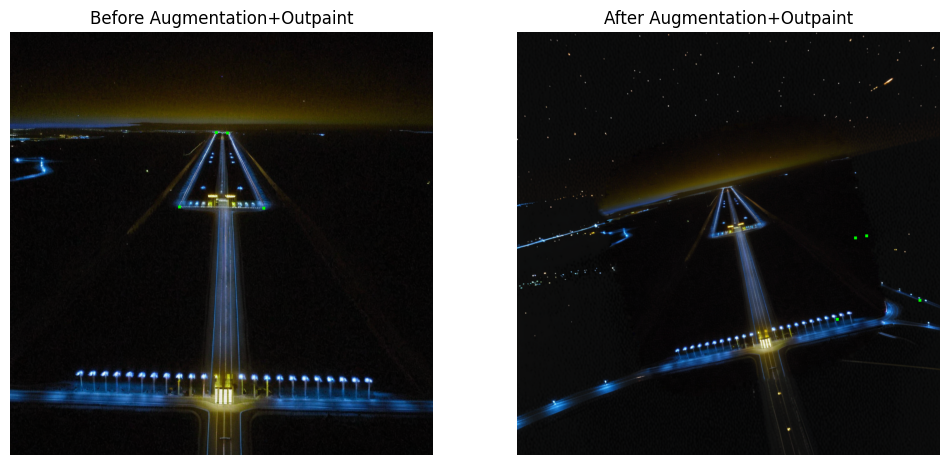

In [5]:
import json
import cv2
from imgaug.augmentables import Keypoint, KeypointsOnImage
import matplotlib.pyplot as plt

base_img_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.png"
base_label_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.json"

variant_img_path = "p_VariantImages/zrbfSJ0v2gk_052__night_3__v1.png"
variant_label_path = "p_VariantImages/zrbfSJ0v2gk_052__night_3__v1.json"

with open(base_label_path, "r") as f:
    base_label = json.load(f)

with open(variant_label_path, "r") as f:
    variant_label = json.load(f)

base_points = base_label["runwayLabel"]
variant_points = variant_label["runwayLabel"]

base_img = cv2.imread(base_img_path)
base_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in base_points],
    shape=base_img.shape
)

variant_img = cv2.imread(variant_img_path)
variant_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in variant_points],
    shape=variant_img.shape
)


base_img = base_kps.draw_on_image(base_img, size=7)
variant_img = variant_kps.draw_on_image(variant_img, size=7)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(base_img)
plt.title("Before Augmentation+Outpaint")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(variant_img)
plt.title("After Augmentation+Outpaint")
plt.axis("off")

plt.show()

In [25]:
import os
import json
import numpy as np
import albumentations as A
import copy
from tqdm import tqdm

def letterbox_points(keypoints, in_h, in_w, target_size=1024):
    """
    Given keypoints in an image of size (in_h, in_w),
    scale+pad them into target_size x target_size.
    """
    scale = target_size / max(in_h, in_w)
    new_w = int(in_w * scale)
    new_h = int(in_h * scale)
    x_off = (target_size - new_w) // 2
    y_off = (target_size - new_h) // 2

    out = []
    for (x, y) in keypoints:
        new_x = x * scale + x_off
        new_y = y * scale + y_off
        out.append([new_x, new_y])
    return out


def fix_replay_dict(replay):
    """
    Recursively traverse the replay dict. If 'matrix' or 'bbox_matrix'
    in params as a list, convert it to a NumPy array so Albumentations
    won't crash on 'matrix.dtype'.
    """
    replay = copy.deepcopy(replay)
    transforms = replay.get("transforms", [])
    for t in transforms:
        # t["params"] can be None, so we check first
        params = t.get("params")
        if not isinstance(params, dict):
            continue  # skip transforms that have no valid params dict
        
        for param_key in ["matrix", "bbox_matrix"]:
            val = params.get(param_key)
            if isinstance(val, list):
                params[param_key] = np.array(val, dtype=np.float32)

    return replay

def fix_keypoints_post_aug(folder):
    """
    1. For each JSON in `folder`, load albumentationsReplay + runwayLabel.
    2. Replay on a dummy 1024x1024 image to get final (H, W).
    3. Letterbox runwayLabel from (H, W) -> (1024, 1024).
    4. Overwrite the JSON with corrected coordinates.
    """

    for fname in tqdm(os.listdir(folder)):
        if not fname.lower().endswith(".json"):
            continue
        path = os.path.join(folder, fname)
        # print(path)

        with open(path, "r") as f:
            data = json.load(f)

        replay = data.get("albumentationsReplay")
        if not replay:
            # no replay => skip
            continue

        replay = fix_replay_dict(replay)

        keypoints = data.get("runwayLabel")
        if data.get("letterboxFixed"):
            keypoints = data.get("postAlbumentationsRunwayLabel")
        if not keypoints:
            # nothing to fix
            continue

        # 1) Replay on dummy 1024x1024
        dummy = np.zeros((1024, 1024, 3), dtype=np.uint8)
        result = A.ReplayCompose.replay(replay, image=dummy)
        post_aug_h, post_aug_w = result["image"].shape[:2]

        # 2) Letterbox from (post_aug_h, post_aug_w) to 1024x1024
        corrected = letterbox_points(keypoints, post_aug_h, post_aug_w, target_size=1024)

        # print(corrected, keypoints)
        # 3) Write them back
        if not data.get("postAlbumentationsRunwayLabel"):
            data["postAlbumentationsRunwayLabel"] = keypoints
        data["runwayLabel"] = corrected
        data["letterboxFixed"] = True

        # just check if dumps won't file and corrupt file
        json.dumps(data, indent=2)

        with open(path, "w") as f:
            json.dump(data, f, indent=2)

        # print(f"Updated: {fname}")

In [26]:
fix_keypoints_post_aug("p_VariantImages")

100%|██████████| 77979/77979 [03:53<00:00, 334.52it/s] 


In [27]:
fix_keypoints_post_aug("p_VariantImagesWithOcclusion")

100%|██████████| 77979/77979 [01:00<00:00, 1288.15it/s]


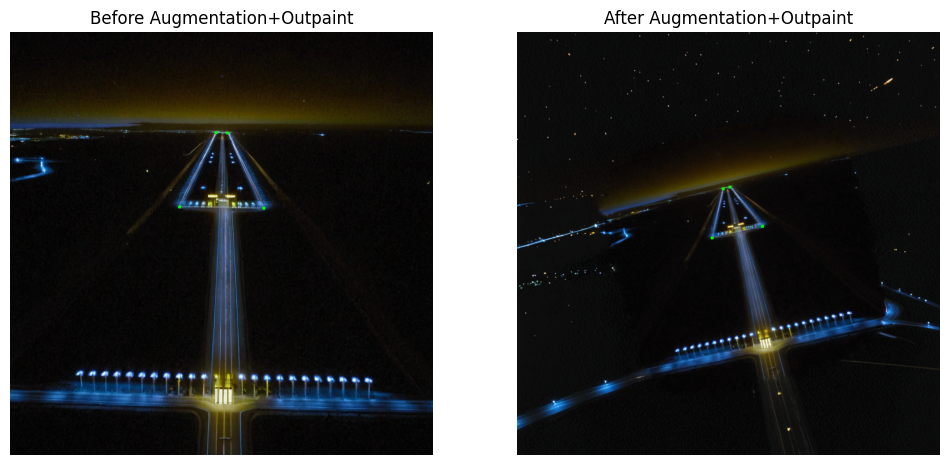

In [28]:
import json
import cv2
from imgaug.augmentables import Keypoint, KeypointsOnImage
import matplotlib.pyplot as plt

base_img_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.png"
base_label_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.json"

variant_img_path = "p_VariantImages/zrbfSJ0v2gk_052__night_3__v1.png"
variant_label_path = "p_VariantImages/zrbfSJ0v2gk_052__night_3__v1.json"

with open(base_label_path, "r") as f:
    base_label = json.load(f)

with open(variant_label_path, "r") as f:
    variant_label = json.load(f)

base_points = base_label["runwayLabel"]
variant_points = variant_label["runwayLabel"]

base_img = cv2.imread(base_img_path)
base_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in base_points],
    shape=base_img.shape
)

variant_img = cv2.imread(variant_img_path)
variant_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in variant_points],
    shape=variant_img.shape
)


base_img = base_kps.draw_on_image(base_img, size=7)
variant_img = variant_kps.draw_on_image(variant_img, size=7)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(base_img)
plt.title("Before Augmentation+Outpaint")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(variant_img)
plt.title("After Augmentation+Outpaint")
plt.axis("off")

plt.show()

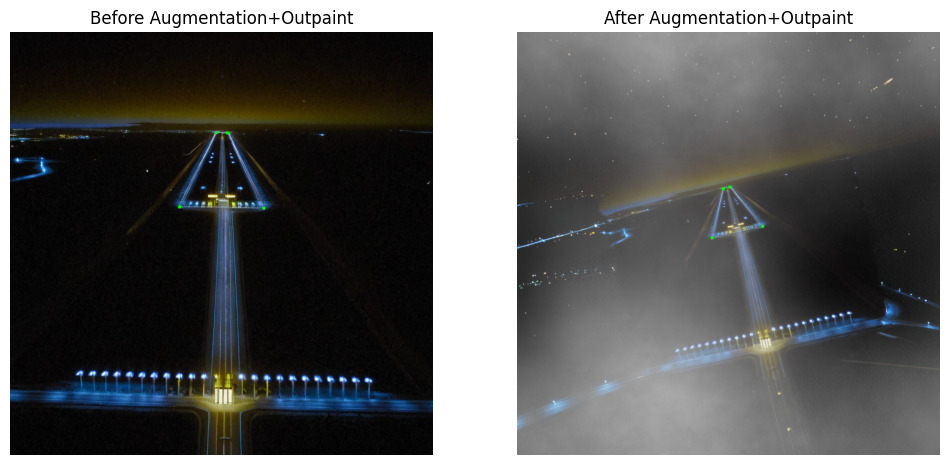

In [30]:
import json
import cv2
from imgaug.augmentables import Keypoint, KeypointsOnImage
import matplotlib.pyplot as plt

base_img_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.png"
base_label_path = "p_BaseImages/zrbfSJ0v2gk_052__night_3.json"

variant_img_path = "p_VariantImagesWithOcclusion/zrbfSJ0v2gk_052__night_3__v1.png"
variant_label_path = "p_VariantImagesWithOcclusion/zrbfSJ0v2gk_052__night_3__v1.json"

with open(base_label_path, "r") as f:
    base_label = json.load(f)

with open(variant_label_path, "r") as f:
    variant_label = json.load(f)

base_points = base_label["runwayLabel"]
variant_points = variant_label["runwayLabel"]

base_img = cv2.imread(base_img_path)
base_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in base_points],
    shape=base_img.shape
)

variant_img = cv2.imread(variant_img_path)
variant_kps = KeypointsOnImage(
    [Keypoint(x=pt[0], y=pt[1]) for pt in variant_points],
    shape=variant_img.shape
)


base_img = base_kps.draw_on_image(base_img, size=7)
variant_img = variant_kps.draw_on_image(variant_img, size=7)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(base_img)
plt.title("Before Augmentation+Outpaint")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(variant_img)
plt.title("After Augmentation+Outpaint")
plt.axis("off")

plt.show()